In [1]:
#import necessary modules
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix


In [2]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import learning_curve
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers.normalization import BatchNormalization
from keras.layers import Dense, Dropout, Flatten, Activation
import tensorflow
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import validation_curve

In [3]:
import numpy as np

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

In [5]:
import time
import random
np.random.seed(21)

In [6]:
from sklearn.metrics import get_scorer
roc_auc_scorer = get_scorer('roc_auc')
precision_scorer = get_scorer('precision')
recall_scorer=get_scorer('recall')
f1_scorer=get_scorer('f1')

In [7]:
%load_ext autoreload
%autoreload 2
import os
import sys
# sys.path.append(os.path.abspath('mlrose'))
sys.path.append(os.path.abspath('mlrose-hiive'))
# import mlrose
import mlrose_hiive
import importlib

In [8]:
from IPython.core.display import display, HTML

In [9]:
accuracy_scorer = get_scorer('accuracy')

In [10]:
# loading the data from csv

In [11]:
data = pd.read_csv('diabetes.csv')

In [12]:
# checking the data

In [13]:
data.shape

(768, 9)

In [14]:
data.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [15]:
data['Outcome'].value_counts()

0    500
1    268
Name: Outcome, dtype: int64

In [16]:
data.isnull().any()

Pregnancies                 False
Glucose                     False
BloodPressure               False
SkinThickness               False
Insulin                     False
BMI                         False
DiabetesPedigreeFunction    False
Age                         False
Outcome                     False
dtype: bool

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [18]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [19]:
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [20]:
data[data['Pregnancies']==0]['Outcome'].count()

111

In [21]:
data[data['Glucose']==0]['Outcome'].count()

5

In [22]:
data[data['BloodPressure']==0]['Outcome'].count()

35

In [23]:
data[data['SkinThickness']==0]['Outcome'].count()

227

In [24]:
data[data['Insulin']==0]['Outcome'].count()

374

In [25]:
data[data['BMI']==0]['Outcome'].count()

11

In [26]:
data[data['DiabetesPedigreeFunction']==0]['Outcome'].count()

0

In [27]:
data[data['Age']==0]['Outcome'].count()

0

In [28]:
data.groupby('Outcome')['BloodPressure'].mean()

Outcome
0    68.184000
1    70.824627
Name: BloodPressure, dtype: float64

In [29]:
data.iloc[:,1:6] = data.iloc[:,1:6].replace(0, np.NaN)

In [30]:
data.isnull().any()

Pregnancies                 False
Glucose                      True
BloodPressure                True
SkinThickness                True
Insulin                      True
BMI                          True
DiabetesPedigreeFunction    False
Age                         False
Outcome                     False
dtype: bool

In [31]:
# checking data distribution by histograms

array([[<AxesSubplot:title={'center':'Pregnancies'}>,
        <AxesSubplot:title={'center':'Glucose'}>,
        <AxesSubplot:title={'center':'BloodPressure'}>],
       [<AxesSubplot:title={'center':'SkinThickness'}>,
        <AxesSubplot:title={'center':'Insulin'}>,
        <AxesSubplot:title={'center':'BMI'}>],
       [<AxesSubplot:title={'center':'DiabetesPedigreeFunction'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Outcome'}>]], dtype=object)

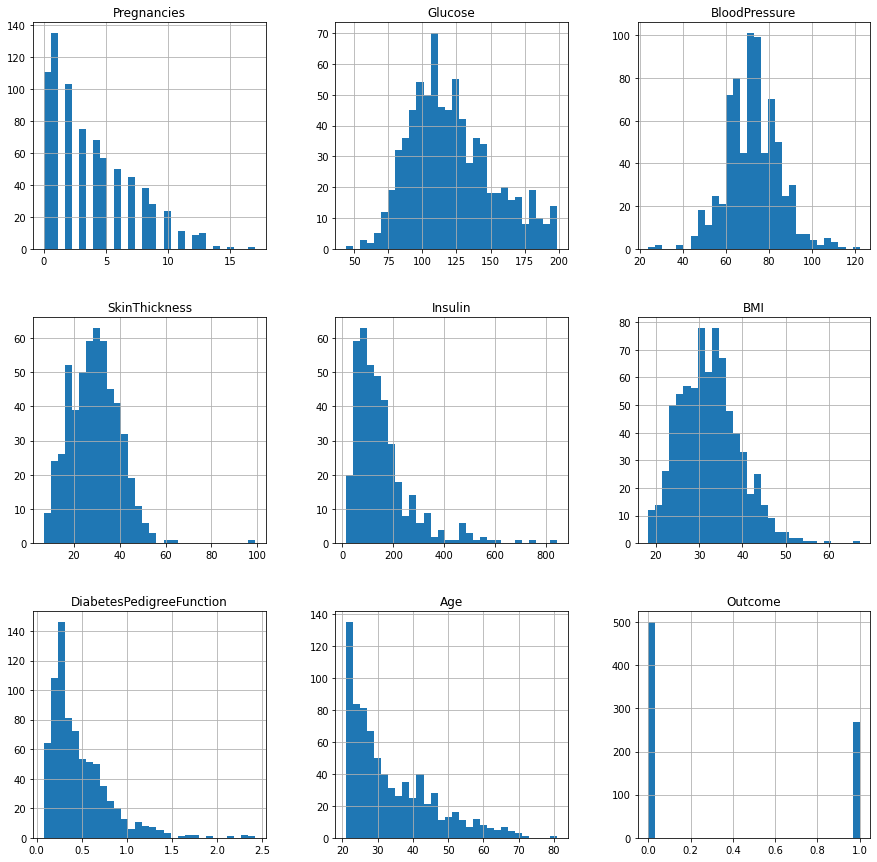

In [32]:
data.hist(bins=30,figsize = (15,15))

In [33]:
# separating target from other features, and splitting the data

In [34]:
y=data['Outcome'].values
X=data.drop(['Outcome'],axis=1).values

In [35]:
X_train,X_test,y_train, y_test=train_test_split(X,y,test_size=0.3, random_state=8,stratify=y,shuffle=True)

In [36]:
X_train.shape

(537, 8)

In [37]:
X_test.shape

(231, 8)

In [38]:
y_train.shape

(537,)

In [39]:
y_test.shape

(231,)

In [40]:
# performing imputation

In [41]:
array_sum = np.sum(X_train)
array_has_nan = np.isnan(array_sum)
array_has_nan

True

In [42]:
imputer = SimpleImputer(missing_values = np.NAN, strategy = 'median')
imputer = imputer.fit(X_train[:,1:6])
X_train[:,1:6] = imputer.transform(X_train[:,1:6])
X_test[:,1:6]=imputer.transform(X_test[:,1:6])

In [43]:
array_sum = np.sum(X_train)
array_has_nan = np.isnan(array_sum)
array_has_nan

False

In [44]:
# standardization

In [45]:
scaler=StandardScaler()
scaler.fit(X_train)

StandardScaler()

In [46]:
X_train=scaler.transform(X_train)
X_test=scaler.transform(X_test)

In [47]:
# Neural networks

In [48]:
# using number of hidden nodes and learning rates from previous NN work with the same data

In [185]:
nn_model = mlrose_hiive.NeuralNetwork(hidden_nodes = [10,10], activation = 'relu', 
                                 algorithm = 'gradient_descent', 
                                 max_iters = 100, bias = True, is_classifier = True, 
                                 learning_rate = 0.01, early_stopping = True, 
                                 clip_max = 1e+10, max_attempts = 10, random_state = 42)



In [186]:
start = time.time()
nn_model.fit(X_train,y_train)
end = time.time()
print('fitting time: {:.6f}s'.format(end - start))

fitting time: 0.257214s


In [187]:
start = time.time()
y_pred_nn=nn_model.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000454s


In [188]:
f1_scorer(nn_model, X_test,y_test)

0.5070422535211268

In [189]:
precision_scorer(nn_model, X_test,y_test)

0.5901639344262295

In [190]:
recall_scorer(nn_model, X_test,y_test)

0.4444444444444444

In [191]:
accuracy_scorer(nn_model, X_test,y_test)

0.696969696969697

In [ ]:
# f1 score has dropped from the previous keras-scikit learn implementation. Therefore, need more tuning using mlrose

In [107]:
import time

param_grid = {
    'max_iters': [10, 100, 1000],
    'learning_rate': [1e-1, 1e-2, 1e-3],
    'hidden_nodes': [[10], [10,10], [8,8]]
}
param_keys = ['max_iters', 'learning_rate', 'hidden_nodes']

GSMetrics = {}

class MyNeuralNetwork(mlrose_hiive.NeuralNetwork):
    def fit(self, X, y=None, init_weights=None):
        params = {param: getattr(self, param) for param in param_keys}
        print(params)
        start = time.time()
        print(type(self))
        super(MyNeuralNetwork, self).fit(X, y, init_weights)
        end = time.time()
        GSMetrics[str(params)] = dict(time=end-start, train_loss=np.copy(self.fitness_curve))


In [87]:
nn_model_gd = MyNeuralNetwork(activation='relu', algorithm='gradient_descent', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, max_attempts=10, random_state=42)
grid = GridSearchCV(estimator=nn_model_gd, param_grid=param_grid, 
                    cv=5, verbose=10, scoring='f1' )
GSMetrics.clear()
grid.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=10 ..............
{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=10, score=0.471, total=   0.0s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=10 ..............
{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=10, score=0.423, total=   0.0s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=10 ..............
{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=10, score=0.471, total=   0.0s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=10 ..............
{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidde

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s


[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=100, score=0.471, total=   0.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=100 .............
{'max_iters': 100, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.3s remaining:    0.0s


[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=100, score=0.423, total=   0.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=100 .............
{'max_iters': 100, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=100, score=0.471, total=   0.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=100 .............
{'max_iters': 100, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.7s remaining:    0.0s


[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=100, score=0.377, total=   0.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=100 .............
{'max_iters': 100, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    1.0s remaining:    0.0s


[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=100, score=0.400, total=   0.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=1000 ............
{'max_iters': 1000, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=1000, score=0.471, total=   2.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=1000 ............
{'max_iters': 1000, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=1000, score=0.423, total=   2.2s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=1000 ............
{'max_iters': 1000, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.1, max_iters=1000, score=0.471, total=   2.1s
[CV] hidden_nodes=[10], learning_rate=0.1, max_iters=1000 ............
{'max_iters': 1000, 'learning_rate': 0.1, 'hidden_nodes': [10]}
<class '

[CV]  hidden_nodes=[10], learning_rate=0.001, max_iters=1000, score=0.667, total=   2.2s
[CV] hidden_nodes=[10], learning_rate=0.001, max_iters=1000 ..........
{'max_iters': 1000, 'learning_rate': 0.001, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.001, max_iters=1000, score=0.667, total=   2.2s
[CV] hidden_nodes=[10], learning_rate=0.001, max_iters=1000 ..........
{'max_iters': 1000, 'learning_rate': 0.001, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.001, max_iters=1000, score=0.646, total=   2.2s
[CV] hidden_nodes=[10], learning_rate=0.001, max_iters=1000 ..........
{'max_iters': 1000, 'learning_rate': 0.001, 'hidden_nodes': [10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10], learning_rate=0.001, max_iters=1000, score=0.648, total=   2.1s
[CV] hidden_nodes=[10, 10], learning_rate=0.1, max_iters=10 ..........
{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [

[CV]  hidden_nodes=[10, 10], learning_rate=0.01, max_iters=1000, score=0.467, total=   2.3s
[CV] hidden_nodes=[10, 10], learning_rate=0.01, max_iters=1000 .......
{'max_iters': 1000, 'learning_rate': 0.01, 'hidden_nodes': [10, 10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10, 10], learning_rate=0.01, max_iters=1000, score=0.648, total=   2.5s
[CV] hidden_nodes=[10, 10], learning_rate=0.001, max_iters=10 ........
{'max_iters': 10, 'learning_rate': 0.001, 'hidden_nodes': [10, 10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10, 10], learning_rate=0.001, max_iters=10, score=0.407, total=   0.0s
[CV] hidden_nodes=[10, 10], learning_rate=0.001, max_iters=10 ........
{'max_iters': 10, 'learning_rate': 0.001, 'hidden_nodes': [10, 10]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[10, 10], learning_rate=0.001, max_iters=10, score=0.540, total=   0.0s
[CV] hidden_nodes=[10, 10], learning_rate=0.001, max_iters=10 ........
{'max_iters': 10, 'learning_rate': 0.001

[CV]  hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100, score=0.000, total=   0.2s
[CV] hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100 ..........
{'max_iters': 100, 'learning_rate': 0.01, 'hidden_nodes': [8, 8]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100, score=0.000, total=   0.2s
[CV] hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100 ..........
{'max_iters': 100, 'learning_rate': 0.01, 'hidden_nodes': [8, 8]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100, score=0.000, total=   0.2s
[CV] hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100 ..........
{'max_iters': 100, 'learning_rate': 0.01, 'hidden_nodes': [8, 8]}
<class '__main__.MyNeuralNetwork'>
[CV]  hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100, score=0.000, total=   0.1s
[CV] hidden_nodes=[8, 8], learning_rate=0.01, max_iters=100 ..........
{'max_iters': 100, 'learning_rate': 0.01, 'hidden_nodes':

[Parallel(n_jobs=1)]: Done 135 out of 135 | elapsed:  1.4min finished


GridSearchCV(cv=5,
             estimator=MyNeuralNetwork(algorithm='gradient_descent', curve=True,
                                       early_stopping=True, hidden_nodes=[],
                                       random_state=42),
             param_grid={'hidden_nodes': [[10], [10, 10], [8, 8]],
                         'learning_rate': [0.1, 0.01, 0.001],
                         'max_iters': [10, 100, 1000]},
             scoring='f1', verbose=10)

In [90]:
list(GSMetrics)

["{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [10]}",
 "{'max_iters': 100, 'learning_rate': 0.1, 'hidden_nodes': [10]}",
 "{'max_iters': 1000, 'learning_rate': 0.1, 'hidden_nodes': [10]}",
 "{'max_iters': 10, 'learning_rate': 0.01, 'hidden_nodes': [10]}",
 "{'max_iters': 100, 'learning_rate': 0.01, 'hidden_nodes': [10]}",
 "{'max_iters': 1000, 'learning_rate': 0.01, 'hidden_nodes': [10]}",
 "{'max_iters': 10, 'learning_rate': 0.001, 'hidden_nodes': [10]}",
 "{'max_iters': 100, 'learning_rate': 0.001, 'hidden_nodes': [10]}",
 "{'max_iters': 1000, 'learning_rate': 0.001, 'hidden_nodes': [10]}",
 "{'max_iters': 10, 'learning_rate': 0.1, 'hidden_nodes': [10, 10]}",
 "{'max_iters': 100, 'learning_rate': 0.1, 'hidden_nodes': [10, 10]}",
 "{'max_iters': 1000, 'learning_rate': 0.1, 'hidden_nodes': [10, 10]}",
 "{'max_iters': 10, 'learning_rate': 0.01, 'hidden_nodes': [10, 10]}",
 "{'max_iters': 100, 'learning_rate': 0.01, 'hidden_nodes': [10, 10]}",
 "{'max_iters': 1000, 'learning_

In [88]:
grid.best_params_

{'hidden_nodes': [10], 'learning_rate': 0.001, 'max_iters': 1000}

In [89]:
grid.best_score_

0.676124251335519

Text(0.5, 0, 'Number of iterations')

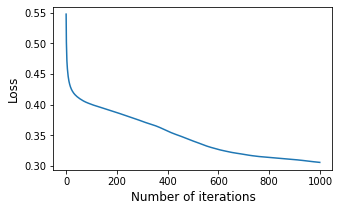

In [91]:
nn_model_gd_best = mlrose_hiive.NeuralNetwork(activation='relu', algorithm='gradient_descent', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, max_attempts=10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001, max_iters=1000)
nn_model_gd_best.fit(X_train, y_train)
plt.figure(figsize=(5,3))
plt.plot([-y for y in nn_model_gd_best.fitness_curve])
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)

In [336]:
nn_model_gd_best.loss

0.3057595929871321

In [92]:
nn_model_gd_best.fitness_curve

array([-0.54759286, -0.50192825, -0.48269155, -0.47163872, -0.46402175,
       -0.45834626, -0.45368209, -0.44961392, -0.44617614, -0.44315977,
       -0.44062206, -0.43838885, -0.4364136 , -0.43463908, -0.43300384,
       -0.43151025, -0.43018588, -0.42896533, -0.4278095 , -0.4267565 ,
       -0.42576941, -0.42483252, -0.42397547, -0.42319127, -0.4224852 ,
       -0.42177841, -0.42109402, -0.42042886, -0.41980479, -0.41922637,
       -0.41865396, -0.41809856, -0.41757235, -0.4170769 , -0.41661198,
       -0.41617526, -0.41575067, -0.41533463, -0.41491269, -0.41450749,
       -0.41411596, -0.41373876, -0.41337661, -0.41302566, -0.41269548,
       -0.41236038, -0.41202335, -0.41169741, -0.41137636, -0.41106565,
       -0.4107608 , -0.41046063, -0.41016425, -0.40987013, -0.40959632,
       -0.40932628, -0.40905454, -0.40878375, -0.4085221 , -0.40826501,
       -0.40798329, -0.40771194, -0.40745269, -0.40720824, -0.40696724,
       -0.40672272, -0.40648466, -0.40625013, -0.40601853, -0.40

In [93]:
f1_scorer(nn_model_gd_best, X_test,y_test)

0.5714285714285714

In [94]:
start = time.time()
nn_model_gd_best.fit(X_train,y_train)
end = time.time()
print('fit time: {:.6f}s'.format(end - start))

fit time: 2.202261s


In [95]:
start = time.time()
y_pred_nn=nn_model_gd_best.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000428s


In [ ]:
train_sizes = [50,100,200,300,429]

In [197]:
train_sizes_gd1, training_scores_nn_gd1, validation_scores_nn_gd1,fit_times_gd1, _ = learning_curve(nn_model_gd_best, X_train, y_train, shuffle=True, train_sizes=train_sizes, cv=5, scoring = 'f1',return_times=True, random_state=8)

In [198]:
train_scores_mean_nn1_gd = np.mean(training_scores_nn_gd1,axis = 1)
validation_scores_mean_nn1_gd = np.mean(validation_scores_nn_gd1, axis = 1 )
train_scores_std_nn1_gd = np.std(training_scores_nn_gd1,axis = 1)
validation_scores_std_nn1_gd = np.std(validation_scores_nn_gd1, axis = 1 )

print('Mean training scores\n\n', pd.Series(train_scores_mean_nn1, index = train_sizes_gd1))
print('\n', '-' * 20) # separator
print('Mean validation scores\n\n',pd.Series(validation_scores_mean_nn1, index = train_sizes_gd1))
print('\n', '-' * 20) # separator

print('Std training scores\n\n', pd.Series(train_scores_std_nn1, index = train_sizes_gd1))
print('\n', '-' * 20) # separator
print('Std validation scores\n\n',pd.Series(validation_scores_std_nn1, index = train_sizes_gd1))

Mean training scores

 50     0.745270
100    0.732660
200    0.703804
300    0.673942
429    0.671888
dtype: float64

 --------------------
Mean validation scores

 50     0.521148
100    0.642685
200    0.587519
300    0.636728
429    0.627812
dtype: float64

 --------------------
Std training scores

 50     0.103912
100    0.040164
200    0.032320
300    0.039076
429    0.021866
dtype: float64

 --------------------
Std validation scores

 50     0.165088
100    0.074801
200    0.066381
300    0.087308
429    0.080843
dtype: float64


(0.4, 1.0)

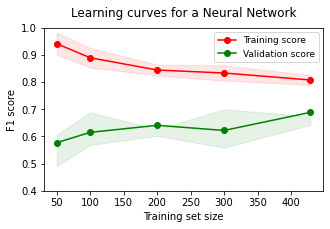

In [199]:
plt.figure(figsize=(5,3))
plt.fill_between(train_sizes_gd1, train_scores_mean_nn1_gd - train_scores_std_nn1_gd , train_scores_mean_nn1_gd + train_scores_std_nn1_gd , alpha=0.1, color="r")
plt.fill_between(train_sizes_gd1, validation_scores_mean_nn1_gd - validation_scores_std_nn1_gd , validation_scores_mean_nn1+ validation_scores_std_nn1_gd , alpha=0.1, color="g")
plt.plot(train_sizes_gd1, train_scores_mean_nn1_gd, 'o-', color="r", label="Training score")
plt.plot(train_sizes_gd1, validation_scores_mean_nn1_gd, 'o-', color="g", label="Validation score")
plt.ylabel('F1 score', fontsize = 10)
plt.xlabel('Training set size', fontsize = 10)
plt.title('Learning curves for a Neural Network', fontsize = 12, y = 1.03)
plt.legend(fontsize = 9)
plt.ylim(0.4,1)

In [ ]:
#random hill climbing

In [253]:
param_grid = [
    {'max_iters': [100], 'max_attempts': [10, 100], 'restarts': [10, 100]},
    {'max_iters': [1000], 'max_attempts': [10, 100], 'restarts': [10]},
]
param_keys = ['max_iters', 'max_attempts', 'restarts']
GSMetrics.clear()
nn_model_rhc = MyNeuralNetwork(activation='relu', algorithm='random_hill_climb', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                           learning_rate=0.001, hidden_nodes=[10])
grid = GridSearchCV(estimator=nn_model_rhc, param_grid=param_grid, 
                    cv=5, verbose=10, scoring='f1' )
grid.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] max_attempts=10, max_iters=100, restarts=10 .....................
{'max_iters': 100, 'max_attempts': 10, 'restarts': 10}
<class '__main__.MyNeuralNetwork'>
-0.5661698890789431
-0.5661376837760105
-0.5661376837760105
-0.5661463848646952
-0.5660698983156153
-0.5660698983156153
-0.5661167447249609
-0.5660679118846094
-0.5660679118846094
-0.5660696766719976
-0.5661101943983837
-0.5660443232196051
-0.5660443232196051
-0.565994367443927
-0.565994367443927
-0.5659950590235393
-0.5659948589775742
-0.5659990428265597
-0.5659945233005103
-0.565994504102695
-0.5659978219207311
-0.5659948636761868
-0.5659888807721362
-0.5659888807721362
-0.5659847090632225
-0.5659847090632225
-0.5660667984815172
-0.5659838295964877
-0.5659838295964877
-0.5659371173537425
-0.5659371173537425
-0.5659367821283765
-0.5659367821283765
-0.5659378507543333
-0.565949704386024
-0.5659882399928233
-0.5659371173537425
-0.5659359136389378
-0.5659359136389378
-0.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-0.5661308783938
-0.5661302751384429
-0.5661302751384429
-0.5661015796826222
-0.5661015796826222
-0.5661011331343726
-0.5661011331343726
-0.566100380061852
-0.566100380061852
-0.5660866432172482
-0.5660866432172482
-0.5660811231536277
-0.5660811231536277
-0.5661325164480305
-0.5660708279596516
-0.5660708279596516
-0.5660704938543161
-0.5660704938543161
-0.5661084179959728
-0.5660673010878167
-0.5660673010878167
-0.5660691603895291
-0.566051784870528
-0.566051784870528
-0.5660670859792278
-0.5661057435893051
-0.5660347875781148
-0.5660347875781148
-0.5660258508973182
-0.5660258508973182
-0.5660250270906365
-0.5660250270906365
-0.5659431426945679
-0.5659431426945679
-0.5658720765906231
-0.5658720765906231
-0.5658719276089473
-0.5658719276089473
-0.565870922815892
-0.565870922815892
-0.5659419901094042
-0.5658710690537678
-0.5658920998684825
-0.5658531888930417
-0.5658531888930417
-0.5658854318724554
-0.5658322645998816
-0.5658322645998816
-0.5658335375066388
-0.5658329385796365
-0.565827

-0.5658542448206206
-0.5658542448206206
-0.5658231557128559
-0.5658231557128559
-0.5658166493906389
-0.5658166493906389
-0.5658104905857282
-0.5658104905857282
-0.5658159921801912
-0.5657592393555573
-0.5657592393555573
-0.5657580579958008
-0.5657580579958008
-0.5657530140414693
-0.5657530140414693
-0.5657522242845282
-0.5657522242845282
-0.5657560934254682
-0.5657464225737469
-0.5657464225737469
-0.5657309077342599
-0.5657309077342599
-0.5657307589131233
-0.5657307589131233
-0.5657302243186079
-0.5657302243186079
-0.5657327387949536
-0.5657344184506083
-0.5657282478524561
-0.5657282478524561
-0.5657238092712853
-0.5657238092712853
-0.5657196341878303
-0.5657196341878303
-0.565720004654515
-0.5657145921101564
-0.5657145921101564
-0.5657095509228397
-0.5657095509228397
-0.5657097410764036
-0.565777076439609
-0.5657098876572253
-0.5656910521905562
-0.5656910521905562
-0.5657063053174923
-0.5656398325640183
-0.5656398325640183
-0.5656019898902067
-0.5656019898902067
-0.5655718947988504
-0

-0.5660271106386756
-0.5660205042049533
-0.5660205042049533
-0.5660192010505357
-0.5660192010505357
-0.5660180097373207
-0.5660180097373207
-0.5660859418593739
-0.5660877643569776
-0.5660950293265783
-0.5660174741714405
-0.5660174741714405
-0.5660176693858882
-0.5660156168137457
-0.5660156168137457
-0.5660290820346648
-0.5660105717210981
-0.5660105717210981
-0.5660104673256691
-0.5660104673256691
-0.566041757237496
-0.5660114495628438
-0.5660619732969449
-0.5659894875262252
-0.5659894875262252
-0.5660521778878572
-0.5659960755824428
-0.5659902313094174
-0.5659893052068075
-0.5659893052068075
-0.5659888591442441
-0.5659888591442441
-0.5659881063933841
-0.5659881063933841
-0.5659884413298548
-0.5660354940962867
-0.5658457557442677
-0.5658457557442677
-0.5658146359692436
-0.5658146359692436
-0.5658448769993948
-0.565789378564415
-0.565789378564415
-0.5657885761260435
-0.5657885761260435
-0.5657676472717247
-0.5657676472717247
-0.5657661406666331
-0.5657661406666331
-0.5657659937564866
-0.

-0.565832507223238
-0.5658025158680609
-0.5658025158680609
-0.5657814063936867
-0.5657814063936867
-0.5657998810508473
-0.5657767346701084
-0.5657767346701084
-0.5657480064062047
-0.5657480064062047
-0.5657420262480001
-0.5657420262480001
-0.5657687937865992
-0.5657932808089734
-0.5657480064062047
-0.5657415807819416
-0.5657415807819416
-0.5657414330376811
-0.5657414330376811
-0.5658022489068523
-0.5657346192676308
-0.5657346192676308
-0.5656527757012056
-0.5656527757012056
-0.5656240558236741
-0.5656240558236741
-0.565659726351613
-0.5656210054412167
-0.5656210054412167
-0.5656240558236741
-0.5656199150192297
-0.5656199150192297
-0.5656486538465213
-0.5656203427975576
-0.565620449077935
-0.5656521614418505
-0.5656181538438094
-0.5656181538438094
-0.5656176470584694
-0.5656176470584694
-0.5656218147607273
-0.565616967968014
-0.565616967968014
-0.5656168191390939
-0.5656168191390939
-0.5656166703177112
-0.5656166703177112
-0.5655957093550986
-0.5655957093550986
-0.5655897700338995
-0.56

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s remaining:    0.0s


-0.5437826987810739
-0.543718225166931
-0.543718225166931
-0.5436952832605023
-0.5436952832605023
-0.5436912101533999
-0.5436912101533999
-0.5437016616089911
-0.5436865151191004
-0.5436865151191004
-0.5436878573322063
-0.543657911979315
-0.543657911979315
-0.543715710694899
-0.5436713655634967
-0.5436572531822389
-0.5436572531822389
-0.5436415088420297
-0.5436415088420297
-0.543614364781566
-0.543614364781566
-0.5435366444555979
-0.5435366444555979
-0.5435381854712155
-0.5436260725120136
-0.5435003982750997
-0.5435003982750997
-0.5435275680397729
-0.5434966109720605
-0.5434966109720605
-0.5434736316930562
-0.5434736316930562
-0.5434966109720605
-0.5434673802960489
-0.5434673802960489
-0.5434543701112035
-0.5434543701112035
-0.5434559415536234
-0.5434619692381241
-0.5434359783453578
-0.5434359783453578
-0.5434267498425338
-0.5434267498425338
-0.543425892700196
-0.543425892700196
-0.5434254451116333
-0.5434254451116333
-0.5434187134686731
-0.5434187134686731
-0.543434477052515
-0.5434105

-0.5433366677101922
-0.5433366677101922
-0.5433302808437014
-0.5433302808437014
-0.5433169066729318
-0.5433169066729318
-0.5433184445255563
-0.5433038671739697
-0.5433038671739697
-0.5432986238825727
-0.5432986238825727
-0.5432991111113687
-0.5432995112916761
-0.5432962562817655
-0.5432962562817655
-0.5433055892837635
-0.5432192884512008
-0.5432192884512008
-0.543244414674859
-0.5432206255739652
-0.543218749588364
-0.543218749588364
-0.5432957189439511
-0.5432154598625468
-0.5432154598625468
-0.5432148713863159
-0.5432148713863159
-0.5432368849455715
-0.5432216262026384
-0.5432219643922305
-0.5431381293957384
-0.5431381293957384
-0.5431035183537418
-0.5431035183537418
-0.543103325309374
-0.543103325309374
-0.5431034068989965
-0.5431216602580606
-0.5430969510429388
-0.5430969510429388
-0.5431217455617902
-0.543093489343774
-0.543093489343774
-0.5430893282475481
-0.5430893282475481
-0.5430618355890892
-0.5430618355890892
-0.543061496551431
-0.543061496551431
-0.5431506972304081
-0.543034

-0.5435445740716329
-0.543566567644792
-0.5435352325517671
-0.5435352325517671
-0.5435375885789079
-0.5435592835306025
-0.5434738740730546
-0.5434738740730546
-0.5434809840079199
-0.5435007867777023
-0.5434748064663845
-0.5434958650294336
-0.5434470907034198
-0.5434470907034198
-0.5434833992583162
-0.5434210142913318
-0.5434210142913318
-0.5434225576726058
-0.5434202985152478
-0.5434202985152478
-0.5434234709676455
-0.5434239117823745
-0.5433952204346576
-0.5433952204346576
-0.5433478839879519
-0.5433478839879519
-0.543348369393758
-0.5434099854896093
-0.5433841945129908
-0.5433479687808176
-0.5433481941219334
-0.5434254305049275
-0.5432746168152968
-0.5432746168152968
-0.5432206266704469
-0.5432206266704469
-0.5432250711605869
-0.5432112838401112
-0.5432112838401112
-0.5432312717760879
-0.5431978553760735
-0.5431978553760735
-0.5432226631384263
-0.5431766359957457
-0.5431766359957457
-0.5431714277560329
-0.5431714277560329
-0.5431738633569438
-0.5431514617727958
-0.5431514617727958
-0

-0.5435837021535873
-0.5435573026416305
-0.5435573026416305
-0.5435581124810454
-0.5435557285045353
-0.5435557285045353
-0.5435261011299584
-0.5435261011299584
-0.5435419433045886
-0.5435220628801963
-0.5435220628801963
-0.5435053521896582
-0.5435053521896582
-0.5434609668629795
-0.5434609668629795
-0.5434645572375085
-0.543466223094484
-0.5433719961964869
-0.5433719961964869
-0.5433500631350437
-0.5433500631350437
-0.5433342627172713
-0.5433342627172713
-0.543407448355183
-0.5432868934337053
-0.5432868934337053
-0.5432930605528091
-0.5431981551242618
-0.5431981551242618
-0.5431919926216494
-0.5431919926216494
-0.5431913925079093
-0.5431913925079093
-0.5431628910411975
-0.5431628910411975
-0.5431613162050161
-0.5431613162050161
-0.5431609912923228
-0.5431609912923228
-0.5431861483299457
-0.5431335158898318
-0.5431335158898318
-0.543131657019865
-0.543131657019865
-0.5431315757489354
-0.5431315757489354
-0.5431322497840618
-0.5430601633972879
-0.5430601633972879
-0.5430594894308752
-0.5

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.4s remaining:    0.0s


-0.5463574579919929
-0.5463499491343925
-0.5463499491343925
-0.5463661212729463
-0.5463470592329448
-0.5463470592329448
-0.5462744367383535
-0.5462744367383535
-0.5462576101277956
-0.5462576101277956
-0.5462519499814976
-0.5462519499814976
-0.5462550670639728
-0.546245273173401
-0.546245273173401
-0.5462459202716166
-0.546213834213416
-0.546213834213416
-0.5462451493000425
-0.5462245779504875
-0.5462132416219888
-0.5462132416219888
-0.5462107415747041
-0.5462107415747041
-0.5461789525816664
-0.5461789525816664
-0.5460952505537351
-0.5460952505537351
-0.5460972103371946
-0.546165697601152
-0.546066070306956
-0.546066070306956
-0.5460978848941064
-0.5460631937944799
-0.5460631937944799
-0.5460463448202122
-0.5460463448202122
-0.5460631937944799
-0.5460412108806886
-0.5460412108806886
-0.5460330600370467
-0.5460330600370467
-0.5460343344504434
-0.5460376739118086
-0.5460059012507205
-0.5460059012507205
-0.5459828514889047
-0.5459828514889047
-0.5459821298638377
-0.5459821298638377
-0.5459

-0.545936722219174
-0.5459056754244331
-0.5459056754244331
-0.5459000399121355
-0.5459000399121355
-0.5458893882654052
-0.5458893882654052
-0.5458913443485863
-0.5458811972094312
-0.5458811972094312
-0.5458760238269827
-0.5458760238269827
-0.5458764279021139
-0.5458767827591677
-0.5458719655178579
-0.5458719655178579
-0.5458814568854331
-0.5457890831411705
-0.5457890831411705
-0.5458133006154512
-0.5457897242002094
-0.5457873943679763
-0.5457873943679763
-0.5458702721625843
-0.5457790163024533
-0.5457790163024533
-0.5457796663944284
-0.5458138180724879
-0.5457861352792541
-0.5457852531307832
-0.5456963732355558
-0.5456963732355558
-0.5456540368566769
-0.5456540368566769
-0.5456539325306669
-0.5456539325306669
-0.5456539407353674
-0.5456810441948196
-0.5456558421565582
-0.5456707616624626
-0.5456504723692674
-0.5456504723692674
-0.5456419605221469
-0.5456419605221469
-0.545618860657913
-0.545618860657913
-0.5456151318424766
-0.5456151318424766
-0.5456854026564669
-0.545592458540536
-0.5

-0.5462047792840333
-0.5462047792840333
-0.5462365813288453
-0.5462338844648684
-0.546208920441766
-0.5462035048150216
-0.5462035048150216
-0.5462007737477641
-0.5462007737477641
-0.5462484864300846
-0.5462023891976585
-0.5462624214730134
-0.5461544405585353
-0.5461544405585353
-0.5461487938897766
-0.5461487938897766
-0.5461260092148673
-0.5461260092148673
-0.5461608011969772
-0.5461141404383468
-0.5461141404383468
-0.5461181901665424
-0.5461348714136719
-0.5460525597468426
-0.5460525597468426
-0.5460588155596645
-0.5460753450741224
-0.5460533447976718
-0.5460873497945217
-0.5460298936725095
-0.5460298936725095
-0.5460591624525427
-0.5460053330772636
-0.5460053330772636
-0.5460072949958629
-0.5460046892992497
-0.5460046892992497
-0.5460114095997876
-0.5460083198143052
-0.5459821435910728
-0.5459821435910728
-0.5459242544468933
-0.5459242544468933
-0.5459246569727529
-0.5459913963253713
-0.5459535266479744
-0.5459245982831518
-0.5459246965332776
-0.5460077853105928
-0.5458612557871487
-

-0.5461276267291514
-0.546113205988523
-0.546113205988523
-0.5460668665947286
-0.5460668665947286
-0.5460704613054005
-0.5460720566790057
-0.5459968112118752
-0.5459968112118752
-0.5459620936248233
-0.5459620936248233
-0.5459394840175942
-0.5459394840175942
-0.5460024128588749
-0.5458816233025928
-0.5458816233025928
-0.5458866883132575
-0.5458117817800298
-0.5458117817800298
-0.5458067204342167
-0.5458067204342167
-0.5458073523800742
-0.5457753619913674
-0.5457753619913674
-0.5457739759314141
-0.5457739759314141
-0.5457702855115532
-0.5457702855115532
-0.5457945391633288
-0.5457412645434581
-0.5457412645434581
-0.5457397693942394
-0.5457397693942394
-0.5457394127434316
-0.5457394127434316
-0.5457399893477421
-0.5456555202486668
-0.5456555202486668
-0.5456549437184045
-0.5456549437184045
-0.5456128179331493
-0.5456128179331493
-0.5455897643711478
-0.5455897643711478
-0.5456624108001643
-0.5455424700991116
-0.5455424700991116
-0.5455418449937554
-0.5455418449937554
-0.5455421289822989
-0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.6s remaining:    0.0s


-0.53457769204504
-0.5345968853912652
-0.5345716826960029
-0.5345716826960029
-0.5345621944219081
-0.5345621944219081
-0.5345635989624716
-0.5345669235118791
-0.5345392980432782
-0.5345392980432782
-0.5345046070775166
-0.5345046070775166
-0.5345038555002597
-0.5345038555002597
-0.5345033211678013
-0.5345033211678013
-0.5344994838000032
-0.5344994838000032
-0.5345046494412844
-0.5344921821048232
-0.5344921821048232
-0.534478317615772
-0.534478317615772
-0.5344834788033916
-0.5345473503782491
-0.534477793117242
-0.534477793117242
-0.534546825598007
-0.5345756365446703
-0.5344904543447611
-0.5344549213412392
-0.5344549213412392
-0.5344924123203784
-0.5344178230606144
-0.5344178230606144
-0.5345231728827847
-0.5344822561189148
-0.5344178738507065
-0.5343440086232814
-0.5343440086232814
-0.5344216403356787
-0.5343445426768373
-0.534325380267917
-0.534325380267917
-0.5343576870218637
-0.5343248653097576
-0.5343248653097576
-0.5343603039360173
-0.534324076454363
-0.534324076454363
-0.53424742

-0.534165967084035
-0.534165967084035
-0.5341264220254806
-0.5341264220254806
-0.5341261657290141
-0.5341261657290141
-0.534126220396916
-0.5341490265392936
-0.53412026613415
-0.53412026613415
-0.5341436153047414
-0.534115926384573
-0.534115926384573
-0.5341105260979945
-0.5341105260979945
-0.534087676315632
-0.534087676315632
-0.5340803591598966
-0.5340803591598966
-0.5341780476384855
-0.5340644146362112
-0.5340644146362112
-0.5340440449142553
-0.5340440449142553
-0.5340756166939915
-0.5340432296695775
-0.5340432296695775
-0.5340438119495354
-0.534045319497695
-0.5340777406137389
-0.5341206495762016
-0.534006154429786
-0.534006154429786
-0.5339780869138817
-0.5339780869138817
-0.5340824333497052
-0.5340012783219801
-0.5339834872875434
-0.5339919053300606
-0.5339781979669995
-0.5340072030573314
-0.5339730802805263
-0.5339730802805263
-0.534002577097478
-0.5339527246048549
-0.5339527246048549
-0.5339488642414363
-0.5339488642414363
-0.5339118452229109
-0.5339118452229109
-0.533912694745

-0.5346546235810646
-0.5346720381204898
-0.5346025081451012
-0.5346025081451012
-0.5346096239537326
-0.5346185192758527
-0.5346033256716543
-0.5346340769060028
-0.5345865881506662
-0.5345865881506662
-0.5346239052865318
-0.5345574278462182
-0.5345574278462182
-0.5345589201752896
-0.5345565499937486
-0.5345565499937486
-0.5345628092094455
-0.5345610413946235
-0.5345422929503989
-0.5345422929503989
-0.5344637089065393
-0.5344637089065393
-0.5344642887925477
-0.5345313329308312
-0.5345010255539293
-0.5344637877788774
-0.5344641595727365
-0.534569026222225
-0.534389919916827
-0.534389919916827
-0.534329133186173
-0.534329133186173
-0.534333540446433
-0.5343193463337539
-0.5343193463337539
-0.5343474573078866
-0.5343053905551359
-0.5343053905551359
-0.5343288080070576
-0.5342757302832033
-0.5342757302832033
-0.5342699761000318
-0.5342699761000318
-0.5342732071205407
-0.5342418887909529
-0.5342418887909529
-0.5342227663296584
-0.5342227663296584
-0.5342231100251038
-0.5342129884586748
-0.534

-0.5342033862303965
-0.5342304531271092
-0.5341699695075662
-0.5341699695075662
-0.5341670371958794
-0.5341670371958794
-0.5341669451071394
-0.5341669451071394
-0.534167461032683
-0.5340892312480632
-0.5340892312480632
-0.534088715390552
-0.534088715390552
-0.534049370739737
-0.534049370739737
-0.5340265932135236
-0.5340265932135236
-0.5340961121296846
-0.5339661373997374
-0.5339661373997374
-0.5339653888209354
-0.5339653888209354
-0.5339658342528523
-0.5339655815079852
-0.5340047267354657
-0.533898624971703
-0.533898624971703
-0.533927775313879
-0.5338614188465184
-0.5338614188465184
-0.5338231125089143
-0.5338231125089143
-0.5338135074368346
-0.5338135074368346
-0.5337939262387968
-0.5337939262387968
-0.5337940177340916
-0.5337868547164224
-0.5337868547164224
-0.533796459630373
-0.5337862543820521
-0.5337862543820521
-0.5337869135793231
-0.5338646978368228
-0.5337863458878034
-0.5337904466177151
-0.5337862105831128
-0.5337862105831128
-0.5337868800570784
-0.5338002279030495
-0.533823

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    8.7s remaining:    0.0s


-0.5453365659173722
-0.5454002873916414
-0.5454141906855525
-0.5453428718892188
-0.545311017493059
-0.545311017493059
-0.5453591377348418
-0.5452706048641618
-0.5452706048641618
-0.5453532775681258
-0.5453371900765028
-0.5452729224706109
-0.5452046620041521
-0.5452046620041521
-0.5452883932070602
-0.5452052460836283
-0.5451948768004591
-0.5451948768004591
-0.5452280975985563
-0.545195301464612
-0.5452242650180669
-0.5451937561452908
-0.5451937561452908
-0.545114974363098
-0.545114974363098
-0.5451986311037348
-0.5451153977824704
-0.5451054696155314
-0.5451054696155314
-0.545101017003504
-0.545101017003504
-0.5450755079212072
-0.5450755079212072
-0.5450816243671371
-0.5450529630542668
-0.5450529630542668
-0.5450591630144707
-0.5450472762875098
-0.5450472762875098
-0.5449637586246175
-0.5449637586246175
-0.5448974482179009
-0.5448974482179009
-0.5449049983044851
-0.5449029445641211
-0.5448685994604248
-0.5448685994604248
-0.544874528258417
-0.5448611845643808
-0.5448611845643808
-0.54485

-0.5449147431335155
-0.5449152070033111
-0.5449165874373306
-0.5449428011130726
-0.544998191517555
-0.5448742948466174
-0.5448742948466174
-0.5448519968827592
-0.5448519968827592
-0.5449336930045083
-0.5448651609439943
-0.544857861392294
-0.5448615515386613
-0.5448543800430017
-0.5448734741375156
-0.5448471202483818
-0.5448471202483818
-0.5448665079215387
-0.5448279145071568
-0.5448279145071568
-0.5448239428506505
-0.5448239428506505
-0.5447835383161909
-0.5447835383161909
-0.54477901480266
-0.54477901480266
-0.5447741434897901
-0.5447741434897901
-0.5447818648375555
-0.5447557858709982
-0.5447557858709982
-0.5448375025958134
-0.5447786058422415
-0.5447564279783781
-0.5447505773348487
-0.5447505773348487
-0.5447601094319588
-0.5447408478483241
-0.5447408478483241
-0.5447331396710235
-0.5447331396710235
-0.5447390107467085
-0.5447990158020786
-0.5447335360515642
-0.5459728995624634
-0.5459725096015403
-0.5459725096015403
-0.5459041328269482
-0.5459041328269482
-0.5458848036422175
-0.545

-0.5450730891615908
-0.5450730891615908
-0.54507347340194
-0.5450736060235106
-0.545074375152988
-0.5450505544223392
-0.5450505544223392
-0.5450500375781083
-0.5450500375781083
-0.5450501675763859
-0.5450614574504057
-0.5450316663696639
-0.5450316663696639
-0.5450370386261748
-0.5450134702213565
-0.5450134702213565
-0.5450132766276977
-0.5450132766276977
-0.545013909368378
-0.5450121587493385
-0.5450121587493385
-0.5459728995624634
-0.545953568814445
-0.545953568814445
-0.545983271530491
-0.5459540141453216
-0.5459528239855156
-0.5459528239855156
-0.545953568814445
-0.545955180828509
-0.5460167820833057
-0.5460167820833057
-0.5460002644668589
-0.5459238679226049
-0.5459238679226049
-0.5458832148506506
-0.5458832148506506
-0.5458702968504286
-0.5458702968504286
-0.545904261723834
-0.5459035752219034
-0.5458716084841022
-0.5458407795730716
-0.5458407795730716
-0.5458348807842593
-0.5458348807842593
-0.5458411383031189
-0.5459011589652402
-0.5458633539075165
-0.5458388941517269
-0.5458356

-0.5447041707630546
-0.5447041707630546
-0.5447041572795037
-0.5447041572795037
-0.5447045239575752
-0.5447138551516024
-0.544744977667549
-0.5446979576850681
-0.5446979576850681
-0.5447031110051901
-0.5446798339601174
-0.5446798339601174
-0.5446723209286828
-0.5446723209286828
-0.5446419907852532
-0.5446419907852532
-0.5446372871341236
-0.5446372871341236
-0.5446297549118702
-0.5446297549118702
-0.5446075588386929
-0.5446075588386929
-0.5459728995624634
-0.5459726996518022
-0.5459726996518022
-0.5459738207843635
-0.5459510650552478
-0.5459510650552478
-0.5458826903263858
-0.5458826903263858
-0.5458828900866828
-0.5458225235898678
-0.5458225235898678
-0.5457710468575283
-0.5457710468575283
-0.5457750647718409
-0.5457666243643393
-0.5457666243643393
-0.5457569605798053
-0.5457569605798053
-0.545756760813712
-0.545756760813712
-0.5457491971021398
-0.5457491971021398
-0.5457432758434038
-0.5457432758434038
-0.5457421559081008
-0.5457421559081008
-0.5457364892724623
-0.5457364892724623
-0.

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   10.9s remaining:    0.0s


-0.5651153661487145
-0.565115566898171
-0.5651200315984534
-0.5650854797869911
-0.5650854797869911
-0.5650922837602673
-0.5650811136974503
-0.5650811136974503
-0.565075120645547
-0.565075120645547
-0.5650464438944841
-0.5650464438944841
-0.5661698890789431
-0.566141176198109
-0.566141176198109
-0.5661790973049864
-0.5661555111566318
-0.5661308783938
-0.5661308783938
-0.5661302751384429
-0.5661302751384429
-0.5661015796826222
-0.5661015796826222
-0.5661011331343726
-0.5661011331343726
-0.566100380061852
-0.566100380061852
-0.5660866432172482
-0.5660866432172482
-0.5660811231536277
-0.5660811231536277
-0.5661325164480305
-0.5660708279596516
-0.5660708279596516
-0.5660704938543161
-0.5660704938543161
-0.5661084179959728
-0.5660673010878167
-0.5660673010878167
-0.5660691603895291
-0.566051784870528
-0.566051784870528
-0.5660670859792278
-0.5661057435893051
-0.5660347875781148
-0.5660347875781148
-0.5660258508973182
-0.5660258508973182
-0.5660250270906365
-0.5660250270906365
-0.565943142694

-0.566169599611386
-0.5661086897491334
-0.5661086897491334
-0.5660876923881403
-0.5660876923881403
-0.5660871568599274
-0.5660871568599274
-0.5660357961175624
-0.5660357961175624
-0.5660423793415691
-0.5660045477081644
-0.5660045477081644
-0.5659963894338913
-0.5659963894338913
-0.5659663915094544
-0.5659663915094544
-0.5659055476602849
-0.5659055476602849
-0.5658542448206206
-0.5658542448206206
-0.5658231557128559
-0.5658231557128559
-0.5658166493906389
-0.5658166493906389
-0.5658104905857282
-0.5658104905857282
-0.5658159921801912
-0.5657592393555573
-0.5657592393555573
-0.5657580579958008
-0.5657580579958008
-0.5657530140414693
-0.5657530140414693
-0.5657522242845282
-0.5657522242845282
-0.5657560934254682
-0.5657464225737469
-0.5657464225737469
-0.5657309077342599
-0.5657309077342599
-0.5657307589131233
-0.5657307589131233
-0.5657302243186079
-0.5657302243186079
-0.5657327387949536
-0.5657344184506083
-0.5657282478524561
-0.5657282478524561
-0.5657238092712853
-0.5657238092712853
-

-0.5660717720464986
-0.5660561807716161
-0.5660243788628615
-0.5660243788628615
-0.5660251316386254
-0.5660271106386756
-0.5660205042049533
-0.5660205042049533
-0.5660192010505357
-0.5660192010505357
-0.5660180097373207
-0.5660180097373207
-0.5660859418593739
-0.5660877643569776
-0.5660950293265783
-0.5660174741714405
-0.5660174741714405
-0.5660176693858882
-0.5660156168137457
-0.5660156168137457
-0.5660290820346648
-0.5660105717210981
-0.5660105717210981
-0.5660104673256691
-0.5660104673256691
-0.566041757237496
-0.5660114495628438
-0.5660619732969449
-0.5659894875262252
-0.5659894875262252
-0.5660521778878572
-0.5659960755824428
-0.5659902313094174
-0.5659893052068075
-0.5659893052068075
-0.5659888591442441
-0.5659888591442441
-0.5659881063933841
-0.5659881063933841
-0.5659884413298548
-0.5660354940962867
-0.5658457557442677
-0.5658457557442677
-0.5658146359692436
-0.5658146359692436
-0.5658448769993948
-0.565789378564415
-0.565789378564415
-0.5657885761260435
-0.5657885761260435
-0.

-0.5659171824671714
-0.565832507223238
-0.565832507223238
-0.5658025158680609
-0.5658025158680609
-0.5657814063936867
-0.5657814063936867
-0.5657998810508473
-0.5657767346701084
-0.5657767346701084
-0.5657480064062047
-0.5657480064062047
-0.5657420262480001
-0.5657420262480001
-0.5657687937865992
-0.5657932808089734
-0.5657480064062047
-0.5657415807819416
-0.5657415807819416
-0.5657414330376811
-0.5657414330376811
-0.5658022489068523
-0.5657346192676308
-0.5657346192676308
-0.5656527757012056
-0.5656527757012056
-0.5656240558236741
-0.5656240558236741
-0.565659726351613
-0.5656210054412167
-0.5656210054412167
-0.5656240558236741
-0.5656199150192297
-0.5656199150192297
-0.5656486538465213
-0.5656203427975576
-0.565620449077935
-0.5656521614418505
-0.5656181538438094
-0.5656181538438094
-0.5656176470584694
-0.5656176470584694
-0.5656218147607273
-0.565616967968014
-0.565616967968014
-0.5656168191390939
-0.5656168191390939
-0.5656166703177112
-0.5656166703177112
-0.5655957093550986
-0.565

-0.5657730621808028
-0.5657695550636751
-0.5657687510235664
-0.5657765169756154
-0.5657730621808028
-0.5657617651327488
-0.5657617651327488
-0.565748024554267
-0.565748024554267
-0.5657652053339217
-0.565766487884699
-0.5657483958076894
-0.5657546012110831
-0.5657792082127169
-0.5657467332607341
-0.5657467332607341
-0.565750008733323
-0.5657461986265314
-0.5657461986265314
-0.5657252834221809
-0.5657252834221809
-0.565867482534023
-0.5657271435749784
-0.5657294734640506
-0.5657166365331634
-0.5657166365331634
-0.5657186332201274
-0.5657225077618293
-0.565697161437473
-0.565697161437473
-0.565680298016962
-0.565680298016962
-0.5656777849361059
-0.5656777849361059
-0.5656785356133979
-0.5657035873601434
-0.5656689499743447
-0.5656689499743447
-0.5656755256308406
-0.5656643019376345
-0.5656643019376345
-0.5656588482735382
-0.5656588482735382
-0.5656534322827534
-0.5656534322827534
-0.565653283134731
-0.565653283134731
-0.5656488344213195
-0.5656488344213195
-0.5656402109392157
-0.56564021

-0.5652474687994636
-0.5652416427848742
-0.5652416427848742
-0.5652417976263854
-0.5652474783907343
-0.5652704037558064
-0.5652410444495457
-0.5652410444495457
-0.5652392770867053
-0.5652392770867053
-0.5652207449615886
-0.5652207449615886
-0.5652164957151993
-0.5652164957151993
-0.565210300510542
-0.565210300510542
-0.5652123783559927
-0.5652483600645585
-0.5652107296423123
-0.5652115838330887
-0.5652093143579316
-0.5652093143579316
-0.5652473740984737
-0.5652248096321176
-0.5652080771796233
-0.5652080771796233
-0.5652070917714066
-0.5652070917714066
-0.5652169639266416
-0.5651371294602154
-0.5651371294602154
-0.5651628479562516
-0.5651220436618494
-0.5651220436618494
-0.5650933073145323
-0.5650933073145323
-0.5650874776971504
-0.5650874776971504
-0.5651375195788424
-0.5651162136930429
-0.5650902459911761
-0.5661698890789431
-0.5661851627166784
-0.5661733429930689
-0.5661673564326736
-0.5661673564326736
-0.5662104796450123
-0.5661764082256365
-0.5661361282191459
-0.5661361282191459
-0

-0.565271192888548
-0.5652406263171735
-0.5652406263171735
-0.5652399471451868
-0.5652399471451868
-0.5652433927839964
-0.565179173723244
-0.565179173723244
-0.5652112690342815
-0.5651750114680181
-0.5651750114680181
-0.5651558320521316
-0.5651558320521316
-0.5661698890789431
-0.5661697331100242
-0.5661697331100242
-0.5661071241123425
-0.5661071241123425
-0.5660784069499053
-0.5660784069499053
-0.5661215270516434
-0.5660791989858575
-0.5660793884767309
-0.5660725330110058
-0.5660725330110058
-0.5660717410154787
-0.5660717410154787
-0.5660806875552684
-0.5660574444589408
-0.5660574444589408
-0.5660997504588874
-0.5660751962741397
-0.5661395752762007
-0.566054917678491
-0.566054917678491
-0.5660761763812722
-0.566028120854838
-0.566028120854838
-0.5660347052523732
-0.5660125595783723
-0.5660125595783723
-0.5660076288755721
-0.5660076288755721
-0.5660084205389861
-0.566016574833962
-0.5660126800392792
-0.5660157838589616
-0.5660021755466046
-0.5660021755466046
-0.5659959153750481
-0.56599

-0.5662115676547389
-0.566138052953719
-0.566138052953719
-0.5661391258083417
-0.566136860014676
-0.566136860014676
-0.5661692033089164
-0.5661692033089164
-0.5660598999431905
-0.5660598999431905
-0.5660611271867143
-0.5659920984114288
-0.5659920984114288
-0.5660002650936646
-0.5659903403093126
-0.5659903403093126
-0.5659937683152784
-0.5659910848797254
-0.5660226748398447
-0.5660403333539635
-0.5659901834139528
-0.5659901834139528
-0.5659900259172302
-0.5659900259172302
-0.5659853521486735
-0.5659853521486735
-0.5659585701868178
-0.5659585701868178
-0.5659283349858591
-0.5659283349858591
-0.5659225041778548
-0.5659225041778548
-0.5659013573896504
-0.5659013573896504
-0.5659055603549622
-0.565910310568065
-0.5659016465614164
-0.5659075710969684
-0.5658836241966179
-0.5658836241966179
-0.5658833350296326
-0.5658833350296326
-0.5658831993861574
-0.5658831993861574
-0.5658828061999197
-0.5658828061999197
-0.5658839979695711
-0.5658914606120408
-0.5658786148862248
-0.5658786148862248
-0.56

-0.5661017570709989
-0.5660503283782992
-0.5660503283782992
-0.5660490077493885
-0.5660490077493885
-0.5660477302206735
-0.5660477302206735
-0.5660816353199031
-0.5660418575732798
-0.5660418575732798
-0.5660161161559701
-0.5660161161559701
-0.5660866415765794
-0.5660463739596319
-0.5660148818366693
-0.5660148818366693
-0.5660662724779515
-0.5659770287338364
-0.5659770287338364
-0.565963301645802
-0.565963301645802
-0.565932273137992
-0.565932273137992
-0.5659324284797583
-0.5659288496106021
-0.5659288496106021
-0.5659335222522691
-0.5659294400515784
-0.5660058788601876
-0.5659545660549289
-0.5659541497443811
-0.565930730075097
-0.5659287140506172
-0.5659287140506172
-0.565910196087485
-0.565910196087485
-0.5659103327293367
-0.5659036463221727
-0.5659036463221727
-0.5658997718976292
-0.5658997718976292
-0.5658994395404131
-0.5658994395404131
-0.5659075970017272
-0.5659204328849217
-0.5658992982319214
-0.5658992982319214
-0.565897551304259
-0.565897551304259
-0.5659686762026942
-0.565899

-0.5661150028373068
-0.5661217840272238
-0.5661205603880686
-0.5661170791560128
-0.5660980110665474
-0.5660980110665474
-0.5660914275456768
-0.5660914275456768
-0.5660951546628559
-0.5660824738643676
-0.5660824738643676
-0.5660198681021972
-0.5660198681021972
-0.5660394138481414
-0.5660197657414799
-0.5660197657414799
-0.5660068415656053
-0.5660068415656053
-0.5660224353569022
-0.5659816050675561
-0.5659816050675561
-0.5659814423450873
-0.5659814423450873
-0.5659662425621148
-0.5659662425621148
-0.5659123321825593
-0.5659123321825593
-0.5659128667082987
-0.5658971734879044
-0.5658971734879044
-0.5658970286179221
-0.5658970286179221
-0.5658991007427114
-0.5658958328684573
-0.5658958328684573
-0.5659226117811909
-0.5659270477653208
-0.5658923852840099
-0.5658923852840099
-0.5659245393288516
-0.565891180550165
-0.565891180550165
-0.5659290123084318
-0.5658830452533391
-0.5658830452533391
-0.5658886915270478
-0.565876462799233
-0.565876462799233
-0.5658777529880499
-0.5658949585555211
-0.5

-0.566142872536381
-0.5661416786904184
-0.5661416786904184
-0.5661404849889096
-0.5661404849889096
-0.5661209130094363
-0.5661209130094363
-0.5661677122022007
-0.5661914503047396
-0.5661264314799039
-0.5660830343558493
-0.5660830343558493
-0.5660888475136572
-0.5660822819588597
-0.5660822819588597
-0.5660814144758648
-0.5660814144758648
-0.5660782481581869
-0.5660782481581869
-0.5660716557291182
-0.5660716557291182
-0.566069885988575
-0.566069885988575
-0.566078580783663
-0.5660700329192966
-0.5661077848048724
-0.5660710713515175
-0.5660695912595054
-0.5660695912595054
-0.5660637063373107
-0.5660637063373107
-0.5660589729863059
-0.5660589729863059
-0.5661410574973532
-0.5660597251495179
-0.5660609663975323
-0.5660595872379894
-0.5660336719017034
-0.5660336719017034
-0.5660423662769235
-0.5660508837639427
-0.5660378649854984
-0.566035531617629
-0.5660639376202068
-0.5660326676788746
-0.5660326676788746
-0.5660339931863403
-0.5661038732237357
-0.5660345406065312
-0.5660665641268563
-0.56

-0.566187681831932
-0.566178847100938
-0.5661704198959614
-0.5661695554761476
-0.5661695554761476
-0.5661222092006923
-0.5661222092006923
-0.5661259368528727
-0.5660799980964266
-0.5660799980964266
-0.5661058230141831
-0.5660834454574502
-0.5660827268084949
-0.5661053004147746
-0.5660762732214004
-0.5660762732214004
-0.5660810057983566
-0.5660749815273581
-0.5660749815273581
-0.5660750816899847
-0.5660612643703409
-0.5660612643703409
-0.5661127453441553
-0.5660659437006799
-0.5660475624523721
-0.5660475624523721
-0.5660431900427253
-0.5660431900427253
-0.5659804869970472
-0.5659804869970472
-0.5660510491553056
-0.5660091993627671
-0.5659810168196175
-0.5659852183190827
-0.5659798827150264
-0.5659798827150264
-0.5660477398969408
-0.5659795117535165
-0.5659795117535165
-0.5659639396392586
-0.5659639396392586
-0.566001808499167
-0.5659602152777784
-0.5659602152777784
-0.5659390710248562
-0.5659390710248562
-0.5659904472131079
-0.5659387000166924
-0.5659387000166924
-0.5659374707982269
-0.

-0.5655390554615104
-0.5655377754720431
-0.5655377754720431
-0.5661698890789431
-0.5661745671317674
-0.5661636188624637
-0.5661636188624637
-0.5661725769356292
-0.5661610866144993
-0.5661610866144993
-0.5661603334143168
-0.5661603334143168
-0.5661611258501669
-0.5662143016312102
-0.5661598869361292
-0.5661598869361292
-0.5660779517997369
-0.5660779517997369
-0.5660601894926784
-0.5660601894926784
-0.5660889208442226
-0.5660567338046187
-0.5660567338046187
-0.5660654336982422
-0.5660658210081589
-0.5660563053123402
-0.5660563053123402
-0.5660875257414412
-0.5659691296521631
-0.5659691296521631
-0.5659735771291462
-0.5659680564546506
-0.5659680564546506
-0.5659668672252515
-0.5659668672252515
-0.565960091455883
-0.565960091455883
-0.5659604625674941
-0.5659431021144721
-0.5659431021144721
-0.5659477703115213
-0.565925861276107
-0.565925861276107
-0.5659454052641129
-0.5659251090280448
-0.5659251090280448
-0.5659255373508107
-0.5659460782689532
-0.5659161614816532
-0.5659161614816532
-0.5

-0.564877925445993
-0.5661698890789431
-0.5661503309309508
-0.5661503309309508
-0.5660630621904273
-0.5660630621904273
-0.5660685794091143
-0.5660768243033348
-0.5660572474911745
-0.5660572474911745
-0.5660150799257023
-0.5660150799257023
-0.5660090896236892
-0.5660090896236892
-0.5660403959294054
-0.5660564753196855
-0.566004359062204
-0.566004359062204
-0.566003614532332
-0.566003614532332
-0.5660049071534448
-0.5659333028957508
-0.5659333028957508
-0.5659340946081243
-0.5659339034282271
-0.5658795267986197
-0.5658795267986197
-0.5658800225624177
-0.5658625485095822
-0.5658625485095822
-0.5659093076373883
-0.5658835139365449
-0.5658111109995299
-0.5658111109995299
-0.5658200623969231
-0.5657644048280615
-0.5657644048280615
-0.5657265999627883
-0.5657265999627883
-0.565726970507032
-0.5657418752117457
-0.565762334873526
-0.5657310220927151
-0.5657176603526958
-0.5657176603526958
-0.5657137895975953
-0.5657137895975953
-0.5657112690441286
-0.5657112690441286
-0.5657126010077912
-0.5657

-0.5653605909959739
-0.5652846078618843
-0.5652846078618843
-0.5661698890789431
-0.5661999439764449
-0.5662168504342006
-0.5661697885094755
-0.5661697885094755
-0.5661630052304961
-0.5661630052304961
-0.566154058999991
-0.566154058999991
-0.566151328617365
-0.566151328617365
-0.5661816050704511
-0.5661616287066134
-0.5661511727429237
-0.5661511727429237
-0.5661523891242154
-0.5661456673597228
-0.5661456673597228
-0.5661692805652968
-0.5661034360648913
-0.5661034360648913
-0.5661358223248135
-0.5661035365675616
-0.5661038824257443
-0.5660992498716582
-0.5660992498716582
-0.5661027012903218
-0.56610032059099
-0.5661000028698505
-0.5661331452172792
-0.5660986606719741
-0.5660986606719741
-0.5661310522943104
-0.5660991067872312
-0.5661006581832542
-0.5660809104025467
-0.5660809104025467
-0.5660994074073293
-0.5661045214583239
-0.5660767360855965
-0.5660767360855965
-0.566085426495168
-0.5660827478020005
-0.5660849170880533
-0.566076147158474
-0.566076147158474
-0.5660795973945101
-0.566163

-0.5650331143458089
-0.5650331143458089
-0.5661698890789431
-0.5661712332797093
-0.5661569731297392
-0.5661569731297392
-0.5661927261013588
-0.5661637572405833
-0.5661357653494692
-0.5661357653494692
-0.5662063127479615
-0.566134693895132
-0.566134693895132
-0.5661345469508292
-0.5661345469508292
-0.5661581597116717
-0.5661343984760056
-0.5661343984760056
-0.5661349285599665
-0.5662217733672692
-0.5661682887137146
-0.5661333271988892
-0.5661333271988892
-0.566133862747633
-0.5662154833827013
-0.5661657052061441
-0.5661529248454098
-0.5660460942244435
-0.5660460942244435
-0.5660461999508117
-0.5660398341121322
-0.5660398341121322
-0.5660456468180236
-0.5659968861180559
-0.5659968861180559
-0.5660028831072362
-0.5660271567881127
-0.56602269940734
-0.566000760493262
-0.5659967297953484
-0.5659967297953484
-0.5660011547189485
-0.5659920560694929
-0.5659920560694929
-0.565979162670388
-0.565979162670388
-0.5659803658801261
-0.5660059968673776
-0.5659292353381319
-0.5659292353381319
-0.56593

-0.5661698890789431
-0.5661694426228372
-0.5661694426228372
-0.5661565267509819
-0.5661565267509819
-0.5661566829492861
-0.5661620726824138
-0.5661569551018154
-0.5661556566419143
-0.5661556566419143
-0.5661555095842795
-0.5661555095842795
-0.566155690329727
-0.5661791249117735
-0.5661550227102276
-0.5661550227102276
-0.5661746030525353
-0.5662320592246859
-0.5661703087372205
-0.5661490234350469
-0.5661490234350469
-0.5661508857059072
-0.5661493127280111
-0.5660812578509387
-0.5660812578509387
-0.5660801863537387
-0.5660801863537387
-0.5660646542508644
-0.5660646542508644
-0.5660651467473149
-0.5660639266380506
-0.5660639266380506
-0.5661344331813207
-0.5660694587485762
-0.5661154276459351
-0.56608346826751
-0.5660875361952917
-0.5660635332279487
-0.5660635332279487
-0.5660662616675377
-0.5660120836735979
-0.5660120836735979
-0.5660298448349961
-0.5660031315877315
-0.5660031315877315
-0.5660027210390224
-0.5660027210390224
-0.5659402515457604
-0.5659402515457604
-0.5659134475565855
-0.

-0.5661698890789431
-0.5661679064906453
-0.5661679064906453
-0.5661355610286154
-0.5661355610286154
-0.5661313704715469
-0.5661313704715469
-0.5661308350938253
-0.5661308350938253
-0.5661205360976558
-0.5661205360976558
-0.5660937277291173
-0.5660937277291173
-0.5660889976611445
-0.5660889976611445
-0.5660808312794691
-0.5660808312794691
-0.5660847072395405
-0.5660038748775329
-0.5660038748775329
-0.5659771084518185
-0.5659771084518185
-0.5659766624634005
-0.5659766624634005
-0.5660069304420451
-0.5659803870854782
-0.5659732100627566
-0.5659732100627566
-0.5659301956599099
-0.5659301956599099
-0.5659681016440439
-0.5659276655262683
-0.5659276655262683
-0.5659019207847471
-0.5659019207847471
-0.5659011681107461
-0.5659011681107461
-0.5659189378425781
-0.5658335793987178
-0.5658335793987178
-0.5658316031508103
-0.5658316031508103
-0.5658160611129504
-0.5658160611129504
-0.5657343489825638
-0.5657343489825638
-0.5657515835455473
-0.5657512969594104
-0.5657722618649479
-0.5657296339713948


-0.5650697458030787
-0.5650697458030787
-0.565063017824495
-0.565063017824495
-0.5650422046419835
-0.5650422046419835
-0.5649886341122113
-0.5649886341122113
-0.5650184681557193
-0.5649904760592248
-0.564988935851837
-0.5649889432865153
-0.5649931883009118
-0.5649909188686181
-0.5661698890789431
-0.5662130109785255
-0.5661789451037388
-0.5661957204132665
-0.5661446169511175
-0.5661446169511175
-0.5661641966573162
-0.5661356629725431
-0.5661356629725431
-0.5660977972347221
-0.5660977972347221
-0.5661005237580259
-0.56609795955449
-0.5660280383844822
-0.5660280383844822
-0.5660750304381047
-0.5660313744920553
-0.5660307645452772
-0.5660261887254743
-0.5660261887254743
-0.5660432196615188
-0.5660320706144419
-0.5661083574676841
-0.5660497921332157
-0.5660004348416443
-0.5660004348416443
-0.5660435593798352
-0.5659960480355982
-0.5659960480355982
-0.5659702428321588
-0.5659702428321588
-0.565920338989056
-0.565920338989056
-0.5658730057179844
-0.5658730057179844
-0.5658721290787431
-0.5658

-0.5652800281502106
-0.565280560810273
-0.5661698890789431
-0.5661702604726465
-0.5661231751767343
-0.5661231751767343
-0.5661059876310744
-0.5661059876310744
-0.5661141695731841
-0.5661077522603954
-0.5661064773075439
-0.5661021139366504
-0.5661021139366504
-0.5660865598714995
-0.5660865598714995
-0.5660326920575729
-0.5660326920575729
-0.5660261086713237
-0.5660261086713237
-0.565999354874018
-0.565999354874018
-0.5660018969846442
-0.5659850733640943
-0.5659850733640943
-0.5660150955651138
-0.5659768904785684
-0.5659768904785684
-0.5659457129119078
-0.5659457129119078
-0.5659512600543863
-0.5659931157757658
-0.565939877617952
-0.565939877617952
-0.5659551535634927
-0.5659435769597496
-0.5659075520891048
-0.5659075520891048
-0.5659082937315468
-0.5658562074438921
-0.5658562074438921
-0.5658048280121878
-0.5658048280121878
-0.5658758485037968
-0.565809256792376
-0.5658046631538199
-0.5658046631538199
-0.5658004849875674
-0.5658004849875674
-0.5658504120630368
-0.5658012763349338
-0.565

-0.5661155493177065
-0.5659729915140537
-0.5659729915140537
-0.565947257433985
-0.565947257433985
-0.5659468294738061
-0.5659468294738061
-0.5659502827597077
-0.5659168384434455
-0.5659168384434455
-0.5658543168345226
-0.5658543168345226
-0.565812085706314
-0.565812085706314
-0.565817959242929
-0.5657968933594382
-0.5657968933594382
-0.5657259756345437
-0.5657259756345437
-0.56572984959576
-0.5657471197133495
-0.565759853160714
-0.565655665549919
-0.565655665549919
-0.5657069426503519
-0.5656728785709677
-0.5656560030911406
-0.5656603871650332
-0.565608999484775
-0.565608999484775
-0.5656219501945086
-0.565603137845341
-0.565603137845341
-0.5656041224551512
-0.5656013694175468
-0.5656013694175468
-0.565607965644401
-0.5655756988381367
-0.5655756988381367
-0.5655759860108592
-0.5656009785581041
-0.5655719657027829
-0.5655719657027829
-0.5655779145777208
-0.5655774144508653
-0.5655931018712085
-0.5655976373223327
-0.5655633341833124
-0.5655633341833124
-0.5655695669076807
-0.565565312243

-0.5661231032364477
-0.5661226749024446
-0.5661226749024446
-0.5661277243982676
-0.5661158926566958
-0.5661158926566958
-0.5660835861806173
-0.5660835861806173
-0.5660548486126811
-0.5660548486126811
-0.5660691827064398
-0.5660169694402194
-0.5660169694402194
-0.5659846845675727
-0.5659846845675727
-0.5659547039442647
-0.5659547039442647
-0.5660021071577608
-0.5659603909366027
-0.5659457571281228
-0.5659457571281228
-0.5659476428513337
-0.5659135209451156
-0.5659135209451156
-0.5659648845310715
-0.5659197195325134
-0.5659098113121444
-0.5659098113121444
-0.5658969093613898
-0.5658969093613898
-0.5658939753873269
-0.5658939753873269
-0.5658967070123049
-0.5658704090824042
-0.5658704090824042
-0.5659204123182062
-0.5658325474164186
-0.5658325474164186
-0.5657623314056301
-0.5657623314056301
-0.5657761077593569
-0.5657335838508939
-0.5657335838508939
-0.5657317297578561
-0.5657317297578561
-0.565752667672734
-0.5657259253792378
-0.5657259253792378
-0.5657202567088477
-0.5657202567088477
-

-0.5656443895365129
-0.5656443895365129
-0.5656385855569634
-0.5656385855569634
-0.5656175399504196
-0.5656175399504196
-0.5656109410878749
-0.5656109410878749
-0.5656431298817046
-0.5655642530216811
-0.5655642530216811
-0.5655650041816407
-0.5655661115869253
-0.5655605212236355
-0.5655605212236355
-0.5655596919248954
-0.5655596919248954
-0.5655832309224171
-0.5655622060051646
-0.5655589013146518
-0.5655589013146518
-0.5655578069396066
-0.5655578069396066
-0.5656091330564645
-0.5655581771941288
-0.5655584124178343
-0.5655572786284193
-0.5655572786284193
-0.5655106130361258
-0.5655106130361258
-0.5655112186178844
-0.5655284001737972
-0.5655362640300479
-0.5655096072577797
-0.5655096072577797
-0.5655291699379319
-0.5654886846614577
-0.5654886846614577
-0.5654894739798948
-0.5654885210860269
-0.5654885210860269
-0.5654072684517802
-0.5654072684517802
-0.5654033755389468
-0.5654033755389468
-0.5654080776702172
-0.5654052674411741
-0.5654136411904171
-0.5654039823633343
-0.5653676810876762


-0.5652707631409307
-0.5652772340036138
-0.5652914718194504
-0.565269585724059
-0.565269585724059
-0.5653404404974791
-0.5652606720289218
-0.5652606720289218
-0.5652641249597576
-0.5652610996005761
-0.5652069637539217
-0.5652069637539217
-0.5661698890789431
-0.5661697331100242
-0.5661697331100242
-0.5662165042842524
-0.5661730971678632
-0.5661487358599372
-0.5661487358599372
-0.5661489207827245
-0.5661291859836111
-0.5661291859836111
-0.5661549591894712
-0.5661545031984716
-0.5661550171975351
-0.5660792204906584
-0.5660792204906584
-0.5660944932809157
-0.5660539498357149
-0.5660539498357149
-0.566071735005933
-0.566053205696695
-0.566053205696695
-0.5660522249528239
-0.5660522249528239
-0.5660523315796352
-0.5660566199332389
-0.5660459545881206
-0.5660459545881206
-0.5660882171588675
-0.5660522249528239
-0.5660727710959715
-0.5660458063474141
-0.5660458063474141
-0.5660628273683938
-0.5660410763131706
-0.5660410763131706
-0.566017490664769
-0.566017490664769
-0.5660498746640988
-0.5660

-0.5661700451463012
-0.5661999439764449
-0.5661555745369348
-0.5661555745369348
-0.5661711683220343
-0.5662069936486264
-0.5661547008545299
-0.5661547008545299
-0.5661757136622314
-0.5661545525325117
-0.5661545525325117
-0.5661549809221025
-0.5661442551444216
-0.5661442551444216
-0.5660017075428635
-0.5660017075428635
-0.565963906451577
-0.565963906451577
-0.5660017075428635
-0.565964068233043
-0.5659656797570828
-0.5659809093301489
-0.5659613833798512
-0.5659613833798512
-0.5659623646770048
-0.5659557359495823
-0.5659557359495823
-0.566037868549666
-0.5659544402800256
-0.5659544402800256
-0.5659242167775886
-0.5659242167775886
-0.565919290010429
-0.565919290010429
-0.5659161971534131
-0.5659161971534131
-0.5659018693534378
-0.5659018693534378
-0.5658964001519392
-0.5658964001519392
-0.5658957943111446
-0.5658957943111446
-0.5659023867427019
-0.5659044721751435
-0.565895940549891
-0.565921604814177
-0.5658962779943324
-0.5658975716660183
-0.5659047832934216
-0.5658940249738368
-0.56589

-0.5660344329637518
-0.566032930568666
-0.566032930568666
-0.5660287479352817
-0.5660287479352817
-0.5660300919741826
-0.5660300919741826
-0.5660284583586885
-0.5660284583586885
-0.566049748208748
-0.5660247349308554
-0.5660247349308554
-0.5659542437748196
-0.5659542437748196
-0.5659511139042371
-0.5659511139042371
-0.5660120407432369
-0.5659516053737226
-0.5659512624121433
-0.5658807937222877
-0.5658807937222877
-0.5658757480401969
-0.5658757480401969
-0.565873889726896
-0.565873889726896
-0.5658271131105727
-0.5658271131105727
-0.5659695674545941
-0.5658279040579004
-0.5657501749939569
-0.5657501749939569
-0.5657330067159683
-0.5657330067159683
-0.5657617406719546
-0.5656951883548382
-0.5656951883548382
-0.5656947432410024
-0.5656947432410024
-0.565728560721891
-0.5656896637250234
-0.5656896637250234
-0.565697821582342
-0.5656917432073383
-0.5656933875314261
-0.5657318461613833
-0.5657154126085109
-0.5656900907732074
-0.5657234788534552
-0.565690454654135
-0.5656898118007431
-0.56571

-0.5653509048617616
-0.5653270650576178
-0.5653270650576178
-0.5653439784605303
-0.5653277546668473
-0.5653649057991318
-0.5653223690744514
-0.5653223690744514
-0.565304695068489
-0.565304695068489
-0.5653056984430658
-0.5653059756403804
-0.5651629422909065
-0.5651629422909065
-0.565180589697984
-0.5651609621463107
-0.5651609621463107
-0.5651188743824321
-0.5651188743824321
-0.5651243208404853
-0.5651510261926563
-0.5651122884679901
-0.5651122884679901
-0.5651126334969481
-0.5651134947796544
-0.565114052369303
-0.5650994167016165
-0.5650994167016165
-0.5651601320332474
-0.5650949668339764
-0.5650949668339764
-0.5661698890789431
-0.5661956725287136
-0.566171965315009
-0.5661543343396978
-0.5661543343396978
-0.5661530414112169
-0.5661530414112169
-0.5661534697658023
-0.5661685960427733
-0.5661526700924988
-0.5661526700924988
-0.5661489416352189
-0.5661489416352189
-0.5661481492364328
-0.5661481492364328
-0.5661430995621793
-0.5661430995621793
-0.5661410242660015
-0.5661410242660015
-0.56

-0.5651841914596117
-0.5651841914596117
-0.5651901474571125
-0.5652050829749479
-0.5651888976919692
-0.5652018671824922
-0.5651838034246893
-0.5651838034246893
-0.5651896655358676
-0.5651810573336982
-0.5651810573336982
-0.5651771687362387
-0.5651771687362387
-0.5652128135548867
-0.5651724638531654
-0.5651724638531654
-0.5651711962244312
-0.5651711962244312
-0.5651657786186978
-0.5651657786186978
-0.5652035723197769
-0.5651909640186858
-0.5651422879702741
-0.5651422879702741
-0.5652190490943079
-0.5651853034296217
-0.5651472233631629
-0.5661698890789431
-0.566154658987729
-0.566154658987729
-0.5661534516922898
-0.5661534516922898
-0.5661452889985088
-0.5661452889985088
-0.5661966898415113
-0.5661884086854265
-0.5661349895338107
-0.5661349895338107
-0.5661396629977232
-0.5661315384153739
-0.5661315384153739
-0.5661318721021252
-0.5661364726359784
-0.5661316548376388
-0.5661381232892256
-0.5661342690212986
-0.5661694531057201
-0.5661312493663067
-0.5661312493663067
-0.5661333236456302
-0

-0.5653094067922144
-0.5651689815510734
-0.5651689815510734
-0.5651697681068335
-0.5651455041759389
-0.5651455041759389
-0.5651313446546914
-0.5651313446546914
-0.5651305582406232
-0.5651305582406232
-0.5651363993468066
-0.5651256683854785
-0.5651256683854785
-0.5661698890789431
-0.5661617219938887
-0.5661617219938887
-0.5661149151290296
-0.5661149151290296
-0.5660635853894905
-0.5660635853894905
-0.5660640136454327
-0.5659817109457221
-0.5659817109457221
-0.5659875632212887
-0.5659856165812603
-0.5659797466010605
-0.5659797466010605
-0.5659737505391041
-0.5659737505391041
-0.5659994638425945
-0.5660037939512775
-0.5659734129324734
-0.5659734129324734
-0.5659695077117027
-0.5659695077117027
-0.5659667526129196
-0.5659667526129196
-0.5659702123162907
-0.5659662175546384
-0.5659662175546384
-0.5659663659738371
-0.5659620233149204
-0.5659620233149204
-0.5659595030976381
-0.5659595030976381
-0.5659934576789167
-0.5659604855263629
-0.5659738348018301
-0.5659425446702698
-0.5659425446702698


-0.5653906528809293
-0.5653906528809293
-0.5654163135194424
-0.5653905479689321
-0.5653905479689321
-0.5653902128513232
-0.5653902128513232
-0.5653897858879411
-0.5653897858879411
-0.5653807610458035
-0.5653807610458035
-0.5653430366291132
-0.5653430366291132
-0.5652614770144181
-0.5652614770144181
-0.5652613722472103
-0.5652613722472103
-0.5652808363220819
-0.5652617986919652
-0.5652615450727205
-0.5652900785754
-0.5652785745601554
-0.5652612233534505
-0.5652612233534505
-0.5652557824603398
-0.5652557824603398
-0.5652625854957624
-0.5652291224857656
-0.5652291224857656
-0.5652289735283018
-0.5652289735283018
-0.5661698890789431
-0.5661709609234522
-0.5661440751274037
-0.5661440751274037
-0.5661435396775842
-0.5661435396775842
-0.5662309369319651
-0.5661430089523923
-0.5661430089523923
-0.5661464622505036
-0.5661292730814147
-0.5661292730814147
-0.5661298623525016
-0.5661971241143582
-0.5661320023090998
-0.5661298764391728
-0.5661807647187312
-0.5661287376646159
-0.5661287376646159
-0.

-0.565443499004346
-0.565443499004346
-0.5653812591873452
-0.5653812591873452
-0.5653813600350983
-0.5653985275462704
-0.5654581113153109
-0.5653901764028838
-0.5653893772262059
-0.5653627214439492
-0.5653627214439492
-0.5653602136145489
-0.5653602136145489
-0.5653392261627345
-0.5653392261627345
-0.5653460178329799
-0.5653379411631881
-0.5653379411631881
-0.5653574058879987
-0.56533763839082
-0.56533763839082
-0.5652839401174758
-0.5652839401174758
-0.5652071789863147
-0.5652071789863147
-0.5652081596279597
-0.5651259644617866
-0.5651259644617866
-0.5651258347830606
-0.5651258347830606
-0.5651293038605807
-0.565123973492158
-0.565123973492158
-0.565054242737366
-0.565054242737366
-0.5650601068639449
-0.5650969401011732
-0.5650644897172642
-0.5650587434719995
-0.5650560000868676
-0.5650533925673862
-0.5650533925673862
-0.5650540808228345
-0.5650515313804457
-0.5650515313804457
-0.565021582752673
-0.565021582752673
-0.5661698890789431
-0.5661700361395053
-0.5661089793538455
-0.566108979

-0.5652353821160718
-0.5651582792812319
-0.5652353821160718
-0.5651553711751631
-0.5651502408123482
-0.5651502408123482
-0.5651453483490082
-0.5651453483490082
-0.5651458386657457
-0.5651465410953653
-0.5651464926815142
-0.5651448580437208
-0.5651448580437208
-0.5651406970215622
-0.5651406970215622
-0.5650941465591505
-0.5650941465591505
-0.5650750570235246
-0.5650750570235246
-0.5650669638861041
-0.5650669638861041
-0.5650603659497486
-0.5650603659497486
-0.5650638270480779
-0.5650596779729565
-0.5650596779729565
-0.5651289798235496
-0.5661698890789431
-0.5661673564326736
-0.5661673564326736
-0.5662371683992444
-0.5661678872351796
-0.5661586686809931
-0.5661586686809931
-0.5661621219918633
-0.5661587687440058
-0.5662101651347021
-0.5660816925258162
-0.5660816925258162
-0.5660798318537499
-0.5660798318537499
-0.5660951017595365
-0.5661267806278848
-0.5661155773001871
-0.5660848793892713
-0.5660794983931805
-0.5660794983931805
-0.5660796788631283
-0.5660280576873115
-0.5660280576873115


-0.5661698890789431
-0.5663126736816163
-0.5661693535680056
-0.5661693535680056
-0.5661220076715286
-0.5661220076715286
-0.5661238671965473
-0.5660907570259435
-0.5660907570259435
-0.5661103189653046
-0.5661036874102184
-0.5660944619443453
-0.5660906098504412
-0.5660906098504412
-0.5661076149192065
-0.5661328979881699
-0.5660753990597704
-0.5660753990597704
-0.5660746544642683
-0.5660746544642683
-0.5660664969739077
-0.5660664969739077
-0.5660767226835851
-0.5660652218484704
-0.5660652218484704
-0.5660864603867392
-0.566064887145659
-0.566064887145659
-0.5660901922607712
-0.5660653335928147
-0.5660652582765818
-0.5660607048401256
-0.5660607048401256
-0.5660093484624141
-0.5660093484624141
-0.5660096833253636
-0.565983555399157
-0.565983555399157
-0.565906609318043
-0.565906609318043
-0.5659218024464678
-0.565907592552155
-0.5659009536836649
-0.5659009536836649
-0.565895908587515
-0.565895908587515
-0.5658350521051206
-0.5658350521051206
-0.5656928135217779
-0.5656928135217779
-0.565675

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   30.7s remaining:    0.0s


-0.5440154978779221
-0.5439410954628483
-0.5439410954628483
-0.543945609178008
-0.5439756623673772
-0.5439149302743137
-0.5439149302743137
-0.5438534955226569
-0.5438534955226569
-0.5438543535704318
-0.5438537814467466
-0.5438554959127783
-0.5438542020914184
-0.5438535706567966
-0.5438558595607792
-0.5438496900545726
-0.5438496900545726
-0.5438461311882172
-0.5438461311882172
-0.5438330848885609
-0.5438330848885609
-0.5439109270889116
-0.5438283710678006
-0.5438283710678006
-0.5437920160658973
-0.5437920160658973
-0.5437912048620159
-0.5437912048620159
-0.5437934655456729
-0.5438046656552573
-0.5438357337681926
-0.5437920160658973
-0.543786500964388
-0.543786500964388
-0.543788815929304
-0.5437826987810739
-0.5437826987810739
-0.543718225166931
-0.543718225166931
-0.5436952832605023
-0.5436952832605023
-0.5436912101533999
-0.5436912101533999
-0.5437016616089911
-0.5436865151191004
-0.5436865151191004
-0.5436878573322063
-0.543657911979315
-0.543657911979315
-0.543715710694899
-0.543671

-0.5436670370918224
-0.5436670370918224
-0.5436683803688073
-0.5435896618771401
-0.5435896618771401
-0.5435773562180949
-0.5435773562180949
-0.543519606811646
-0.543519606811646
-0.5435330399725358
-0.5434424189049432
-0.5434424189049432
-0.5434203918469218
-0.5434203918469218
-0.5434140020934992
-0.5434140020934992
-0.5433865096391665
-0.5433865096391665
-0.5433865916998246
-0.5433903089751451
-0.5434096206099862
-0.5433742458012636
-0.5433742458012636
-0.5434175946949639
-0.5433982306739299
-0.5433736940259137
-0.5433736940259137
-0.5434372744691767
-0.5433729875818873
-0.5433729875818873
-0.5433729055979869
-0.5433729055979869
-0.5433998838245286
-0.5433774188888387
-0.5433366677101922
-0.5433366677101922
-0.5433302808437014
-0.5433302808437014
-0.5433169066729318
-0.5433169066729318
-0.5433184445255563
-0.5433038671739697
-0.5433038671739697
-0.5432986238825727
-0.5432986238825727
-0.5432991111113687
-0.5432995112916761
-0.5432962562817655
-0.5432962562817655
-0.5433055892837635
-0

-0.5439011821990766
-0.5437895597571806
-0.5437895597571806
-0.5437939572759463
-0.5437862515410296
-0.5437862515410296
-0.5437579470375193
-0.5437579470375193
-0.5437943579459342
-0.5438013835804871
-0.5437585008456532
-0.5437594885715742
-0.5437215895754213
-0.5437215895754213
-0.5437279971251463
-0.5436859845643395
-0.5436859845643395
-0.5436426019843287
-0.5436426019843287
-0.5436493595475739
-0.5437000350796571
-0.5436530374852323
-0.543641972533192
-0.543641972533192
-0.5436588058118448
-0.5436355954312447
-0.5436355954312447
-0.543622532389104
-0.543622532389104
-0.5436495459860341
-0.543650102565419
-0.5436277203232538
-0.5436209605160177
-0.5436209605160177
-0.5436199184069956
-0.5436199184069956
-0.5436740280043627
-0.543623209182077
-0.54368134310063
-0.543575547628326
-0.543575547628326
-0.5435714876358602
-0.5435714876358602
-0.5435445740716329
-0.5435445740716329
-0.543566567644792
-0.5435352325517671
-0.5435352325517671
-0.5435375885789079
-0.5435592835306025
-0.54347387

-0.5436381513251587
-0.5436105784811645
-0.5436105784811645
-0.5435834167886111
-0.5435834167886111
-0.5435856808389711
-0.5436120096233736
-0.5435837021535873
-0.5435573026416305
-0.5435573026416305
-0.5435581124810454
-0.5435557285045353
-0.5435557285045353
-0.5435261011299584
-0.5435261011299584
-0.5435419433045886
-0.5435220628801963
-0.5435220628801963
-0.5435053521896582
-0.5435053521896582
-0.5434609668629795
-0.5434609668629795
-0.5434645572375085
-0.543466223094484
-0.5433719961964869
-0.5433719961964869
-0.5433500631350437
-0.5433500631350437
-0.5433342627172713
-0.5433342627172713
-0.543407448355183
-0.5432868934337053
-0.5432868934337053
-0.5432930605528091
-0.5431981551242618
-0.5431981551242618
-0.5431919926216494
-0.5431919926216494
-0.5431913925079093
-0.5431913925079093
-0.5431628910411975
-0.5431628910411975
-0.5431613162050161
-0.5431613162050161
-0.5431609912923228
-0.5431609912923228
-0.5431861483299457
-0.5431335158898318
-0.5431335158898318
-0.543131657019865
-0.

-0.5433935959173191
-0.5433935959173191
-0.5433873969980663
-0.5433873969980663
-0.5433612514320725
-0.5433612514320725
-0.5434248041001668
-0.5433568899098705
-0.5433568899098705
-0.5433630869702515
-0.5433464615555886
-0.5433464615555886
-0.543347271957519
-0.5433441232439888
-0.5433441232439888
-0.5433534063379346
-0.5433446756203544
-0.5433483087383588
-0.5433172783584146
-0.5433172783584146
-0.5433128727514207
-0.5433128727514207
-0.5433793832083287
-0.5433259136745097
-0.5432830855129795
-0.5432830855129795
-0.5432883264642699
-0.5433092242151772
-0.5432217917908181
-0.5432217917908181
-0.5432210774233297
-0.5432210774233297
-0.5432278162024481
-0.543214370357239
-0.543214370357239
-0.5432149216955708
-0.5432205656802089
-0.5432142862334828
-0.5432142862334828
-0.5432505972630151
-0.5432162749765269
-0.5432142041491156
-0.5432142041491156
-0.5432403384107621
-0.5432048701565939
-0.5432048701565939
-0.5432481247770403
-0.543282308853127
-0.5432042424784014
-0.5432042424784014
-0.5

-0.5431423918534358
-0.5431995952613701
-0.5431762313750036
-0.5431329017103262
-0.5431329017103262
-0.5432822611997751
-0.5431326404975743
-0.5431326404975743
-0.5431587526141634
-0.5431331008219876
-0.5431578645113834
-0.5431262731318451
-0.5431262731318451
-0.5431905960552285
-0.5431281419470867
-0.5431314119605768
-0.5431093399171647
-0.5431093399171647
-0.5431089319276216
-0.5431089319276216
-0.5431384451895387
-0.5431534428048473
-0.5431301541243777
-0.5431102752936313
-0.5431045113985667
-0.5431045113985667
-0.5431293742995733
-0.5430334634884243
-0.5430334634884243
-0.5430321749871614
-0.5430321749871614
-0.5430082660963013
-0.5430082660963013
-0.5430514243545873
-0.5430158678960977
-0.5430038470628517
-0.5430038470628517
-0.5430045708586239
-0.54298692947222
-0.54298692947222
-0.5440534592232227
-0.544114960581473
-0.5440059834412215
-0.5440059834412215
-0.5439924974951724
-0.5439924974951724
-0.5440007004559353
-0.5439724443750344
-0.5439724443750344
-0.5439680260443304
-0.54

-0.5435019673445773
-0.5434598502381718
-0.5434598502381718
-0.5434596573135523
-0.5434596573135523
-0.5434641636022436
-0.5435231734897873
-0.5434700773808319
-0.543450305375911
-0.543450305375911
-0.543407021021484
-0.543407021021484
-0.5434145357021812
-0.5433726694766736
-0.5433726694766736
-0.5433770805591587
-0.5434340893912356
-0.5433749853265335
-0.5433633663227365
-0.5433633663227365
-0.5433613797583804
-0.5433613797583804
-0.5433623105583566
-0.5440534592232227
-0.5440537709439015
-0.544058659469968
-0.5440735380408293
-0.5440898622100546
-0.5440519137847062
-0.5440519137847062
-0.544051995071452
-0.5440455257523945
-0.5440455257523945
-0.5440471005630431
-0.5440168779371392
-0.5440168779371392
-0.543991592512863
-0.543991592512863
-0.5439822228991769
-0.5439822228991769
-0.5439825667757985
-0.5440297714490954
-0.543910572397278
-0.543910572397278
-0.5439124554040653
-0.5439103921748721
-0.5439103921748721
-0.5439032714020176
-0.5439032714020176
-0.5438763901186153
-0.5438763

-0.5440505112311942
-0.5440508560982205
-0.5439868075689518
-0.5439868075689518
-0.5439859979784002
-0.5439859979784002
-0.543982187425279
-0.543982187425279
-0.5439405054878498
-0.5439405054878498
-0.5439450146775778
-0.5439666853219177
-0.5439675405832342
-0.5439412231897492
-0.5438863382109462
-0.5438863382109462
-0.543884764371042
-0.543884764371042
-0.5438832208485652
-0.5438832208485652
-0.5438487134385209
-0.5438487134385209
-0.5438328234187241
-0.5438328234187241
-0.5438997680354947
-0.5438127990919566
-0.5438127990919566
-0.5438127175739601
-0.5438127175739601
-0.543836768715188
-0.5438388863079973
-0.5437852258283318
-0.5437852258283318
-0.5437569415238416
-0.5437569415238416
-0.5437506938599875
-0.5437506938599875
-0.543744318231556
-0.543744318231556
-0.5437510812743562
-0.5437514360196206
-0.5437230578866006
-0.5437230578866006
-0.5437217965722051
-0.5437217965722051
-0.5437233690918316
-0.5437216175511979
-0.5437216175511979
-0.543723976569807
-0.543724952078463
-0.543721

-0.5430645776672866
-0.5430237991052168
-0.5430327071106874
-0.5430296829752679
-0.5430416428962697
-0.5430228261222176
-0.5430228261222176
-0.5430679733759204
-0.5430175775473544
-0.5430175775473544
-0.543033189393399
-0.5429604180581649
-0.5429604180581649
-0.5429886231055957
-0.5429852932253888
-0.5429588456807252
-0.5429588456807252
-0.5429590153860702
-0.5429652289670553
-0.5429156554028784
-0.5429156554028784
-0.5429160088297009
-0.5428501218160338
-0.5428501218160338
-0.542849571467945
-0.542849571467945
-0.5428535997415459
-0.5428450461967433
-0.5428450461967433
-0.5427889168922332
-0.5427889168922332
-0.5427445896110972
-0.5427445896110972
-0.5427453523661062
-0.5426889002748528
-0.5426889002748528
-0.5426896007038978
-0.5426940412851822
-0.5440534592232227
-0.5440567895857737
-0.544060215596933
-0.544098023932902
-0.5440463332152047
-0.5440463332152047
-0.5440598086353882
-0.5440684093812099
-0.5440472220280516
-0.5440462514102775
-0.5440462514102775
-0.5440261926501723
-0.54

-0.543321539549915
-0.543321539549915
-0.5433217320867326
-0.5433208368296318
-0.5433208368296318
-0.5433166312578963
-0.5433166312578963
-0.5433168044650675
-0.5432276846769676
-0.5432276846769676
-0.5432184735974716
-0.5432184735974716
-0.5432176574149122
-0.5432176574149122
-0.5432169553854795
-0.5432169553854795
-0.5432164483489106
-0.5432164483489106
-0.5431386230861754
-0.5431386230861754
-0.543139325503696
-0.5431406372874116
-0.5440534592232227
-0.5440531475151221
-0.5440531475151221
-0.5440551477389195
-0.5441177999885959
-0.544052561746739
-0.544052561746739
-0.5441001652535618
-0.5440738828073842
-0.5440461444435638
-0.5440461444435638
-0.5440467303174211
-0.5440303939943619
-0.5440303939943619
-0.5440343336933705
-0.5440463235734277
-0.5440173264692078
-0.5440173264692078
-0.5440472863862004
-0.5441070234459581
-0.5440209377879833
-0.5439901518503872
-0.5439901518503872
-0.543963213506379
-0.543963213506379
-0.5440411640133459
-0.5439727791338272
-0.544027825811267
-0.54395

-0.5432398233648624
-0.5432398233648624
-0.5432419919274166
-0.5432443305558853
-0.5432382508437757
-0.5432382508437757
-0.5440534592232227
-0.5440548028525751
-0.5442038982721115
-0.5440542162879688
-0.5440351747870943
-0.5440351747870943
-0.5440509739797058
-0.5440194216318498
-0.5440194216318498
-0.5439616748324567
-0.5439616748324567
-0.5439593150059271
-0.5439593150059271
-0.5439716582388621
-0.5439321514922881
-0.5439321514922881
-0.5439597953245983
-0.5439305767907021
-0.5439305767907021
-0.5439044093817222
-0.5439044093817222
-0.5438568836361514
-0.5438568836361514
-0.5437833530079152
-0.5437833530079152
-0.5438095453576152
-0.5437593190808896
-0.5437593190808896
-0.5438027464087384
-0.5437793457473831
-0.5437236923088097
-0.5437236923088097
-0.5437281997320983
-0.543713291305844
-0.543713291305844
-0.5437431330173697
-0.5437117453363338
-0.5437117453363338
-0.5437013589831673
-0.5437013589831673
-0.5437288780475625
-0.5437117453363338
-0.5437078072907954
-0.5437377340884617
-0

-0.5434768728120479
-0.5434768728120479
-0.5435054728702935
-0.543475828856209
-0.543475828856209
-0.5434978820558944
-0.5435404198314313
-0.5434752760835615
-0.5434752760835615
-0.5434659352055157
-0.5434659352055157
-0.5434911747052408
-0.5434664879804422
-0.5435133615576894
-0.5434650480281988
-0.5434650480281988
-0.5434686274165369
-0.5440534592232227
-0.544053947742781
-0.5440587192564845
-0.5440429941040361
-0.5440429941040361
-0.5440442554889898
-0.5440424568324224
-0.5440424568324224
-0.5440842573799998
-0.5440426512564577
-0.543978753759952
-0.543978753759952
-0.5440222000797923
-0.54398001517246
-0.543958701681276
-0.543958701681276
-0.5439932557784471
-0.5439523195531358
-0.5439523195531358
-0.5439302634336382
-0.5439302634336382
-0.5439030892948223
-0.5439030892948223
-0.5438136076580548
-0.5438136076580548
-0.5438093814051939
-0.5438093814051939
-0.5438029822821785
-0.5438029822821785
-0.5438065989252537
-0.5437393776389193
-0.5437393776389193
-0.5437445578624068
-0.543740

-0.5434598501119664
-0.5434598501119664
-0.5434369336244286
-0.5434369336244286
-0.5434411665836357
-0.5434714129137143
-0.5435083331159324
-0.543421261862223
-0.543421261862223
-0.5434257112771882
-0.5434228728901747
-0.5434214407297644
-0.5434464912991881
-0.5433636632485911
-0.5433636632485911
-0.5433592144990167
-0.5433592144990167
-0.5433556621513633
-0.5433556621513633
-0.5433426106788475
-0.5433426106788475
-0.5433132021317244
-0.5433132021317244
-0.5433137517388286
-0.5432880121065462
-0.5432880121065462
-0.5432267585003978
-0.5432267585003978
-0.5431905047796399
-0.5431905047796399
-0.5431918415433487
-0.5431889347003441
-0.5431889347003441
-0.5431890165018101
-0.5431851224551648
-0.5431851224551648
-0.5431818149522667
-0.5431818149522667
-0.5431190183671238
-0.5431190183671238
-0.5431147972473165
-0.5431147972473165
-0.5431183502839528
-0.5431214058669066
-0.5431200766698272
-0.5430851924803457
-0.5430851924803457
-0.5431584335606017
-0.5430290188795719
-0.5430290188795719
-0

-0.5436422101693146
-0.5436422101693146
-0.5436403224608454
-0.5436403224608454
-0.5434904751374137
-0.5434904751374137
-0.5435173662237179
-0.5434861183702047
-0.5434861183702047
-0.5434868332130389
-0.5434389395695889
-0.5434389395695889
-0.5434629349060905
-0.5434482986515891
-0.5434394263062843
-0.5434379146291328
-0.5434379146291328
-0.5434461206979422
-0.5434108037866938
-0.5434108037866938
-0.5434347999315011
-0.5434019195573009
-0.5434019195573009
-0.5434018379026785
-0.5434018379026785
-0.5433352076693532
-0.5433352076693532
-0.543316784865502
-0.543316784865502
-0.5433173832460523
-0.5432628836411463
-0.5432628836411463
-0.5432616146132396
-0.5432616146132396
-0.5432684272912948
-0.5432683771250949
-0.5432613048562072
-0.5432613048562072
-0.543220151837349
-0.543220151837349
-0.5432207514658723
-0.5432107825810042
-0.5432107825810042
-0.5432307449729824
-0.5432032579047015
-0.5432032579047015
-0.5432015312816799
-0.5432015312816799
-0.5431403161762447
-0.5431403161762447
-0.5

-0.5439243194502675
-0.5439343671488543
-0.5438877777697901
-0.5438877777697901
-0.5438837001037155
-0.5438837001037155
-0.5439005641426378
-0.5438855823957242
-0.5438818185709424
-0.5438818185709424
-0.5438531995606236
-0.5438531995606236
-0.5438583953270597
-0.5438780875178111
-0.5438547724791627
-0.5438537376702478
-0.5438831577148985
-0.5438895496039522
-0.5438487844710619
-0.5438487844710619
-0.5438226519130367
-0.5438226519130367
-0.5437985807073892
-0.5437985807073892
-0.5437941663505368
-0.5437941663505368
-0.5438126721147012
-0.5437670344624536
-0.5437670344624536
-0.5438317768950074
-0.5437577086599158
-0.5437577086599158
-0.54374842432193
-0.54374842432193
-0.5436943130937207
-0.5436943130937207
-0.5437163253227101
-0.5437228978256148
-0.5436672113195398
-0.5436672113195398
-0.5436955025036293
-0.5436409210783206
-0.5436409210783206
-0.5436161056814341
-0.5436161056814341
-0.5436089930119785
-0.5436089930119785
-0.5436182660766079
-0.5435616470447596
-0.5435616470447596
-0.5

-0.5440534592232227
-0.5440550341097041
-0.544053541072253
-0.5440314062030431
-0.5440314062030431
-0.5440731729082979
-0.544032981204373
-0.5440892790881577
-0.5439699639736617
-0.5439699639736617
-0.5440278311733341
-0.5439342954808116
-0.5439342954808116
-0.5439298772813143
-0.5439298772813143
-0.5439362775100907
-0.5439262976203324
-0.5439262976203324
-0.5439325518763266
-0.5438917897989156
-0.5438917897989156
-0.5438855385954219
-0.5438855385954219
-0.5438822440364351
-0.5438822440364351
-0.54386375842016
-0.54386375842016
-0.5438705928799737
-0.5438424611233605
-0.5438424611233605
-0.5438700775715978
-0.5438389017833298
-0.5438389017833298
-0.5438519656706688
-0.543838175599849
-0.543838175599849
-0.543801845247203
-0.543801845247203
-0.5437788935195604
-0.5437788935195604
-0.5437215369130693
-0.5437215369130693
-0.5437239008227217
-0.5437056371051908
-0.5437056371051908
-0.543688801749434
-0.543688801749434
-0.5436896124536729
-0.5436896898461585
-0.5436891421513499
-0.543661861

-0.543205487740316
-0.543177820669201
-0.543177820669201
-0.5431791531513163
-0.5432053383022963
-0.543150738088047
-0.543150738088047
-0.5431600908721913
-0.543133896129933
-0.543133896129933
-0.5431305859788856
-0.5431305859788856
-0.5431377312413156
-0.5431309215296969
-0.5430945180457143
-0.5430945180457143
-0.5431677086561596
-0.5430811798251217
-0.5430811798251217
-0.5431011946825399
-0.5430852139166867
-0.5430817754163022
-0.5430831767748714
-0.5430834365633707
-0.5430844888833679
-0.5430864537445053
-0.5430778714156653
-0.5430778714156653
-0.5440534592232227
-0.5440118000664294
-0.5440118000664294
-0.5440113115721699
-0.5440113115721699
-0.5439466050398417
-0.5439466050398417
-0.5439530193929297
-0.5439461166302769
-0.5439461166302769
-0.5439555474987894
-0.5439464619399412
-0.54392093223696
-0.54392093223696
-0.5439146844001843
-0.5439146844001843
-0.5439331833760968
-0.5438885141590645
-0.5438885141590645
-0.54387544278604
-0.54387544278604
-0.5438847740382434
-0.543872148666

-0.5434962714429734
-0.543430900810317
-0.5434051735025076
-0.5434051735025076
-0.5433607412463235
-0.5433607412463235
-0.5433631462681829
-0.5433244419992554
-0.5433244419992554
-0.5432800558782079
-0.5432800558782079
-0.5432893343128447
-0.5432158509232695
-0.5432158509232695
-0.5432152734352287
-0.5432152734352287
-0.543213405376665
-0.543213405376665
-0.5432197936804062
-0.543213228951005
-0.543213228951005
-0.5432584727282143
-0.5431983323201313
-0.5431983323201313
-0.5432317674901659
-0.54328733944085
-0.5431964656227385
-0.5431964656227385
-0.543196972306894
-0.5431977967746595
-0.54319974786095
-0.5431745153492301
-0.5431745153492301
-0.5433243007535707
-0.543189413443431
-0.5431470001926026
-0.5431470001926026
-0.5431427942080854
-0.5431427942080854
-0.5431422168875215
-0.5431422168875215
-0.5430709599449104
-0.5430709599449104
-0.5430527383282803
-0.5430527383282803
-0.5430463560796999
-0.5430463560796999
-0.5430455010210029
-0.5430455010210029
-0.5430491270281527
-0.54312307

-0.543312917587708
-0.5432657627185423
-0.5432657627185423
-0.5432593915905124
-0.5432593915905124
-0.5432499808799494
-0.5432499808799494
-0.543240773959754
-0.543240773959754
-0.5432239406930219
-0.5432239406930219
-0.5432197380105743
-0.5432197380105743
-0.5432184760049086
-0.5432184760049086
-0.5432236223689307
-0.5432460528220583
-0.5432121067076084
-0.5432121067076084
-0.5432069624703686
-0.5432069624703686
-0.5432684218287341
-0.5432022469490997
-0.5432022469490997
-0.5432024071578928
-0.5432021606686032
-0.5432021606686032
-0.543135637067058
-0.543135637067058
-0.5431491345599349
-0.5431432764958094
-0.5431407790701268
-0.5431318687519656
-0.5431318687519656
-0.5431353331380165
-0.5431475528611165
-0.5430608781983236
-0.5430608781983236
-0.5430568159641425
-0.5430568159641425
-0.5432063362670329
-0.5430521395571366
-0.5430521395571366
-0.5430789374626293
-0.5430742174500224
-0.5430291802813979
-0.5430291802813979
-0.5430574297806837
-0.5429848691658982
-0.5429848691658982
-0.54

-0.5435393825919582
-0.5435393825919582
-0.5435234849283458
-0.5435234849283458
-0.5435403751514135
-0.5435250295266604
-0.5435182962788112
-0.5435182962788112
-0.5435181290435174
-0.5435181290435174
-0.5435274434940436
-0.5435304074827957
-0.5435117260821479
-0.5435117260821479
-0.543512065960516
-0.5434755320661165
-0.5434755320661165
-0.5434674139159383
-0.5434674139159383
-0.5434650727533179
-0.5434650727533179
-0.5434658990655731
-0.5434666442118578
-0.5434743790755948
-0.5434669454097416
-0.5434674139159383
-0.5435546198345019
-0.5434528379289053
-0.5434528379289053
-0.5434522450591645
-0.5434522450591645
-0.5433876065576677
-0.5433876065576677
-0.5433808895470233
-0.5433808895470233
-0.5433716427517955
-0.5433716427517955
-0.5433739008260875
-0.5433721985586624
-0.5434160437529223
-0.5434015858182087
-0.5433586162841063
-0.5433586162841063
-0.5433586584743044
-0.5433856793108754
-0.5433947839474991
-0.543317107588911
-0.543317107588911
-0.5433234772185537
-0.5433743809467101
-0.

-0.5434429301999218
-0.5434429301999218
-0.543416796042482
-0.543416796042482
-0.5434302275221826
-0.5434192643708967
-0.5434162038209617
-0.5434162038209617
-0.543405807674929
-0.543405807674929
-0.5434951525562246
-0.5434226085648121
-0.543316646279353
-0.543316646279353
-0.5433406492253027
-0.5432934769155986
-0.5432934769155986
-0.5433147243440302
-0.5432911235309915
-0.5432911235309915
-0.5432671355300307
-0.5432671355300307
-0.543258018121336
-0.543258018121336
-0.5433224282129274
-0.5431944736613594
-0.5431944736613594
-0.5431899930071188
-0.5431899930071188
-0.5431967613615327
-0.5431828991171482
-0.5431828991171482
-0.5431904460337638
-0.5431548651011472
-0.5431548651011472
-0.5431009485367757
-0.5431009485367757
-0.5431899607485006
-0.5430747125128845
-0.5430747125128845
-0.5430904219119176
-0.5430790622292143
-0.5430760335296995
-0.5431007896656307
-0.5440534592232227
-0.5440525704041607
-0.5440525704041607
-0.5439888660125961
-0.5439888660125961
-0.5438386635111251
-0.54383

-0.5431707910133294
-0.5431750132309555
-0.5431700779677923
-0.5431700779677923
-0.5431701700385501
-0.5431884666390927
-0.5432474853283656
-0.5431883420139908
-0.5431597031578274
-0.5431597031578274
-0.5431648501349798
-0.5440534592232227
-0.5440809778947863
-0.5440349832007539
-0.5440349832007539
-0.544025589110113
-0.544025589110113
-0.5440249587361999
-0.5440249587361999
-0.5440293783262693
-0.5440185428175693
-0.5440185428175693
-0.5439933051269685
-0.5439933051269685
-0.5439657720019687
-0.5439657720019687
-0.5439827353073031
-0.5439223539766576
-0.5439223539766576
-0.5438971348830303
-0.5438971348830303
-0.543869566400042
-0.543869566400042
-0.5439150701239013
-0.5438627745462458
-0.5438627745462458
-0.5438624310024158
-0.5438624310024158
-0.5438692067560976
-0.543837253377305
-0.543837253377305
-0.5438914380973695
-0.5438412742001502
-0.5438328827204897
-0.5438328827204897
-0.5438194351252915
-0.5438194351252915
-0.5438174785545664
-0.5438174785545664
-0.5438207747146551
-0.543

-0.5434734551242351
-0.5434690562007942
-0.5434690562007942
-0.5434643865799704
-0.5434643865799704
-0.543490492084227
-0.5434654187582295
-0.5434636706778059
-0.5434636706778059
-0.5434613579721583
-0.5434613579721583
-0.5435154848485722
-0.5434618450553405
-0.5434614457378255
-0.5434608057552016
-0.5434608057552016
-0.5433873824090784
-0.5433873824090784
-0.5433874701836812
-0.5434033365191346
-0.5434085776735134
-0.5433860897826529
-0.5433860897826529
-0.5434061463998777
-0.5433565040900294
-0.5433565040900294
-0.543357218691635
-0.5433557783770354
-0.5433557783770354
-0.5432787015509694
-0.5432787015509694
-0.5432734162355165
-0.5432734162355165
-0.5432776255632644
-0.5432801988426701
-0.5432827620312106
-0.5432735050087382
-0.5432377517220215
-0.5432377517220215
-0.5432361466104594
-0.5432361466104594
-0.5433005316853223
-0.5431889472351887
-0.5431889472351887
-0.5431785171707993
-0.5431785171707993
-0.5431829608909183
-0.5431785997481228
-0.5431778886642333
-0.5431778886642333
-0

-0.5434495120510245
-0.5434768143071056
-0.5434484254127901
-0.5434488782968528
-0.5434270185128064
-0.5434270185128064
-0.5434555774151596
-0.5434338133581575
-0.5434256722942519
-0.5434256722942519
-0.5434192678756289
-0.5434192678756289
-0.5434193493421136
-0.5434360883102491
-0.5434189303204431
-0.5434189303204431
-0.5434902285534526
-0.5434031862631592
-0.5434031862631592
-0.5434676272964253
-0.543403267418383
-0.5434676272964253
-0.5433598483505339
-0.5433598483505339
-0.5433124920349532
-0.5433124920349532
-0.5432233708584856
-0.5432233708584856
-0.543249687210381
-0.5432050344454407
-0.5432050344454407
-0.5432006273449339
-0.5432006273449339
-0.5431964193258836
-0.5431964193258836
-0.5432609287047659
-0.5431970758882393
-0.543196133953978
-0.543196133953978
-0.5432008243267773
-0.5432006379589421
-0.543209572764656
-0.5431973979491862
-0.543209572764656
-0.5440534592232227
-0.5440366070782664
-0.5440366070782664
-0.5440350617436659
-0.5440350617436659
-0.5440374251999798
-0.543

-0.5432649466393473
-0.5432582871033731
-0.5432582871033731
-0.5432775031389145
-0.5432713795629758
-0.5431810237606511
-0.5431810237606511
-0.5431777186926252
-0.5431777186926252
-0.543104725711568
-0.543104725711568
-0.5430775359037993
-0.5430775359037993
-0.5430780805553276
-0.5431207750354741
-0.5430765126773942
-0.5430765126773942
-0.5430490609313962
-0.5430490609313962
-0.5430682135139326
-0.5430418777624382
-0.5430418777624382
-0.5430425050369289
-0.5430630416901184
-0.5430350919836405
-0.5430350919836405
-0.543064573014964
-0.5430367002128227
-0.5430550053815839
-0.5440534592232227
-0.544058659469968
-0.5440719718630659
-0.5440533774334894
-0.5440533774334894
-0.5440320737665868
-0.5440320737665868
-0.5440186158337021
-0.5440186158337021
-0.5440141976584187
-0.5440141976584187
-0.5439687570687503
-0.5439687570687503
-0.5439530191661288
-0.5439530191661288
-0.5439661009311556
-0.5439533647507061
-0.5439514445604474
-0.5439514445604474
-0.5439517900775035
-0.5439508143704588
-0.5

-0.5431483206322579
-0.5431483206322579
-0.5430594854237569
-0.5430594854237569
-0.5430855965462201
-0.5430557058731128
-0.5430557058731128
-0.5429910212845102
-0.5429910212845102
-0.5429763450658153
-0.5429763450658153
-0.5429699946978648
-0.5429699946978648
-0.542962380847058
-0.542962380847058
-0.5429608163897792
-0.5429608163897792
-0.5429607401087977
-0.5429607401087977
-0.5429614942673088
-0.5429448825174892
-0.5429448825174892
-0.542973332530413
-0.5440534592232227
-0.5440952552449098
-0.5440440607188091
-0.5440440607188091
-0.5440220309012912
-0.5440220309012912
-0.5440215034082777
-0.5440215034082777
-0.544011030293431
-0.544011030293431
-0.5440017270775174
-0.5440017270775174
-0.544011030293431
-0.5439996421780372
-0.5439996421780372
-0.5440643066910331
-0.543983677743273
-0.543983677743273
-0.5439121398591092
-0.5439121398591092
-0.5439215414388742
-0.5438764117572704
-0.5438764117572704
-0.5438964830169652
-0.543875478442579
-0.543875478442579
-0.5439053422792907
-0.5438778

-0.5430562858264566
-0.5440534592232227
-0.5440452835975574
-0.5440452835975574
-0.5440036110941365
-0.5440036110941365
-0.5439989003099605
-0.5439989003099605
-0.5439990855740077
-0.5439983455251012
-0.5439983455251012
-0.5440027421446275
-0.543994531146701
-0.543994531146701
-0.5440013649690542
-0.5439529899280401
-0.5439529899280401
-0.5439268113858151
-0.5439268113858151
-0.5439544134986766
-0.5439703122793192
-0.5439914825147774
-0.5439275194989132
-0.5439711755034776
-0.5439273494616074
-0.5439277002491502
-0.5438992899166899
-0.5438992899166899
-0.5439268113858151
-0.5438558364119176
-0.5438558364119176
-0.5437058189034488
-0.5437058189034488
-0.543710534715706
-0.5437064484918458
-0.5436771965825052
-0.5436771965825052
-0.5436787726454296
-0.5436834394969223
-0.5436759332645579
-0.5436759332645579
-0.5437653989773353
-0.5436396137229939
-0.5436396137229939
-0.5436328163809138
-0.5436328163809138
-0.5436361081026188
-0.5436321004808655
-0.5436321004808655
-0.5436966461917615
-0.

-0.5440378548060862
-0.5440378548060862
-0.5440369203199656
-0.5440369203199656
-0.5440306630520451
-0.5440306630520451
-0.544094435997753
-0.5440303514784639
-0.5440303514784639
-0.5440300399174612
-0.5440300399174612
-0.5440280415850813
-0.5440280415850813
-0.5440333005973195
-0.5440465557271511
-0.5440204391073699
-0.5440204391073699
-0.5440272737565961
-0.5440561316839673
-0.544003586654763
-0.544003586654763
-0.5439995104380915
-0.5439995104380915
-0.5440351988228175
-0.5439998219161489
-0.5440002708585305
-0.5439991989726142
-0.5439991989726142
-0.544016051385356
-0.5439646991688344
-0.5439646991688344
-0.5440123229079533
-0.5439659601356303
-0.5439624829907825
-0.5439624829907825
-0.5439633714237303
-0.5439626651878748
-0.5438979524694526
-0.5438979524694526
-0.5438946591073632
-0.5438946591073632
-0.5438947420136434
-0.5438683215602532
-0.5438683215602532
-0.5439261840452867
-0.5438688695435662
-0.5438682401707
-0.5438682401707
-0.5438614946321939
-0.5438614946321939
-0.5438609

-0.5438820892104549
-0.5438820892104549
-0.543905099829929
-0.5438821711341596
-0.5438826745083419
-0.5438652893386817
-0.5438652893386817
-0.5438637156495653
-0.5438637156495653
-0.5438983049957987
-0.5438652893386817
-0.5438618371599945
-0.5438618371599945
-0.543861131202819
-0.543861131202819
-0.5438618371599945
-0.543873481405196
-0.5438034784168944
-0.5438034784168944
-0.5437142246641498
-0.5437142246641498
-0.5437129661040551
-0.5437129661040551
-0.5437148393716559
-0.5437342487645273
-0.5437062161430521
-0.5437062161430521
-0.5436415987615455
-0.5436415987615455
-0.5436378020386861
-0.5436378020386861
-0.5436376254925778
-0.5436376254925778
-0.5436245796724102
-0.5436245796724102
-0.5436290001577424
-0.543606264780588
-0.543606264780588
-0.5436219619061975
-0.5435780022315286
-0.5435780022315286
-0.543606264780588
-0.5435786595877304
-0.5436213853762464
-0.543504726280611
-0.543504726280611
-0.5435041482251842
-0.5435041482251842
-0.543494795201593
-0.543494795201593
-0.54350414

-0.5437210036545213
-0.5437223427140596
-0.5437176629000332
-0.5437176629000332
-0.5437169567840623
-0.5437169567840623
-0.5437175099829734
-0.5437076428269865
-0.5437076428269865
-0.5437116720656218
-0.5437328897135939
-0.5437095294834285
-0.5437079536877347
-0.5437014429735323
-0.5437014429735323
-0.5436814194043676
-0.5436814194043676
-0.5436857769712651
-0.5436750394833676
-0.5436750394833676
-0.5436814194043676
-0.5436565918919329
-0.5436565918919329
-0.5436572214487048
-0.5436641507496682
-0.543650391541535
-0.543650391541535
-0.5435770903281536
-0.5435770903281536
-0.5435135777569587
-0.5435135777569587
-0.5434968297862163
-0.5434968297862163
-0.543524330218445
-0.5435011861142204
-0.5434719877205744
-0.5434719877205744
-0.5434743348617613
-0.5434305111763151
-0.5434305111763151
-0.5434309970035415
-0.543473918525664
-0.5434283850037249
-0.5434283850037249
-0.5434317048734814
-0.5434238880889007
-0.5434238880889007
-0.5434373319528757
-0.5434238041278251
-0.5434238041278251
-0.5

-0.5438750643595262
-0.5438466448486237
-0.5438466448486237
-0.543904491290937
-0.5438465624598158
-0.5438465624598158
-0.5438529610754422
-0.5438308192221041
-0.5438308192221041
-0.5438298854180114
-0.5438298854180114
-0.5438946266889172
-0.5438308192221041
-0.5438324410044609
-0.5438318839394272
-0.5438339606283871
-0.5438458129613898
-0.5438458129613898
-0.5438027351519763
-0.5438027351519763
-0.5436527235653646
-0.5436527235653646
-0.5436525441232984
-0.5436525441232984
-0.5436532602723413
-0.5435632705528162
-0.5435632705528162
-0.5435433047662287
-0.5435433047662287
-0.5436101273222849
-0.5435685751931589
-0.5435438413166365
-0.5435070149931549
-0.5435070149931549
-0.5435683151925318
-0.5435071925806519
-0.5435254619138046
-0.543512186735362
-0.543534016504093
-0.5435069338472757
-0.5435069338472757
-0.543656717939609
-0.5435074727182285
-0.5435075118116791
-0.5435113209742468
-0.5435025476467513
-0.5435025476467513
-0.5434609530742487
-0.5434609530742487
-0.543525492941264
-0.54

-0.5434118248396741
-0.543411908771733
-0.5434156338397245
-0.543412179246052
-0.5434330878215102
-0.5434124540152845
-0.5433832724176201
-0.5433832724176201
-0.5433809686215704
-0.5433809686215704
-0.5433790909897608
-0.5433790909897608
-0.5433755416303747
-0.5433755416303747
-0.5433717393162832
-0.5433717393162832
-0.5432220873774658
-0.5432220873774658
-0.5432378676178035
-0.5432117015000747
-0.5432117015000747
-0.5432337562230959
-0.543216867135516
-0.5432149697553551
-0.5432129927149049
-0.5432760455411842
-0.5432023643849575
-0.5432023643849575
-0.5431981468726593
-0.5431981468726593
-0.5431510051564874
-0.5431510051564874
-0.5431786104799274
-0.5431235650323344
-0.5431235650323344
-0.5431183280250095
-0.5431183280250095
-0.5431177766825157
-0.5431177766825157
-0.5431185302951641
-0.5431219242673092
-0.543121063370999
-0.5431473846697993
-0.543182001305856
-0.5431271499035386
-0.543113248800914
-0.543113248800914
-0.5431196426145108
-0.5430700532593715
-0.5430700532593715
-0.5430

-0.5433400021310857
-0.5433400021310857
-0.5433762565087525
-0.5433523219468139
-0.543406833242666
-0.5432948204786846
-0.5432948204786846
-0.5432945094034466
-0.5432945094034466
-0.5432682900253977
-0.5432682900253977
-0.5432735278233721
-0.5432773181731738
-0.5432698333877084
-0.5432676613394407
-0.5432676613394407
-0.5432661181232199
-0.5432661181232199
-0.543230572945891
-0.543230572945891
-0.5432881728571282
-0.5432127712510086
-0.5432127712510086
-0.5432094625002458
-0.5432094625002458
-0.5432086554098033
-0.5432086554098033
-0.5432131632047988
-0.5432073313928468
-0.5432073313928468
-0.5432140621511924
-0.5432040362104865
-0.5432040362104865
-0.5432288923953685
-0.5432046648763802
-0.5432007489201787
-0.5432007489201787
-0.543204044426417
-0.5432023206764134
-0.5432040362104865
-0.5432008281183219
-0.5431294461687256
-0.5431294461687256
-0.5431589702632249
-0.5431428682248155
-0.5431055093404962
-0.5431055093404962
-0.5430781100445587
-0.5430781100445587
-0.5430937760942384
-0.5

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:   50.7s remaining:    0.0s


-0.5460376739118086
-0.5460059012507205
-0.5460059012507205
-0.5459828514889047
-0.5459828514889047
-0.5459821298638377
-0.5459821298638377
-0.545981758551866
-0.545981758551866
-0.5459746725703187
-0.5459746725703187
-0.5459771987618828
-0.5459675556409382
-0.5459675556409382
-0.5459569230702558
-0.5459569230702558
-0.5459594471548836
-0.546024121532328
-0.5459561420872975
-0.5459561420872975
-0.5460233403748328
-0.5460264991819315
-0.5459592382840462
-0.5459330248201052
-0.5459330248201052
-0.5459643187344037
-0.5459039631451085
-0.5459039631451085
-0.5459875300918592
-0.5459754435251853
-0.5459024936394257
-0.5459024936394257
-0.5458394775515067
-0.5458394775515067
-0.5459233164842189
-0.5458398486242575
-0.5458167213830696
-0.5458167213830696
-0.5458484652530803
-0.5458173156214213
-0.545848152075341
-0.5458159894176342
-0.5458159894176342
-0.5457581026631151
-0.5457581026631151
-0.5458418842939297
-0.5457586959575924
-0.5457475381432143
-0.5457475381432143
-0.5457459113985506
-0.5

-0.5456963732355558
-0.5456963732355558
-0.5456540368566769
-0.5456540368566769
-0.5456539325306669
-0.5456539325306669
-0.5456539407353674
-0.5456810441948196
-0.5456558421565582
-0.5456707616624626
-0.5456504723692674
-0.5456504723692674
-0.5456419605221469
-0.5456419605221469
-0.545618860657913
-0.545618860657913
-0.5456151318424766
-0.5456151318424766
-0.5456854026564669
-0.545592458540536
-0.545592458540536
-0.5455718249276871
-0.5455718249276871
-0.5456066151424415
-0.5455710421280103
-0.5455710421280103
-0.5455718733907593
-0.5455734724356335
-0.5455939025534133
-0.5456546489652639
-0.5455419878127565
-0.5455419878127565
-0.5455219004713523
-0.5455219004713523
-0.5456044681546266
-0.545548999546016
-0.5455304130979455
-0.5455324967026763
-0.5455204983978169
-0.5455204983978169
-0.5455402679534997
-0.5455153326362587
-0.5455153326362587
-0.5455373946659277
-0.5454947143373781
-0.5454947143373781
-0.5454875958950134
-0.5454875958950134
-0.5454585904953562
-0.5454585904953562
-0.54

-0.5460053330772636
-0.5460053330772636
-0.5460072949958629
-0.5460046892992497
-0.5460046892992497
-0.5460114095997876
-0.5460083198143052
-0.5459821435910728
-0.5459821435910728
-0.5459242544468933
-0.5459242544468933
-0.5459246569727529
-0.5459913963253713
-0.5459535266479744
-0.5459245982831518
-0.5459246965332776
-0.5460077853105928
-0.5458612557871487
-0.5458612557871487
-0.5458136631776234
-0.5458136631776234
-0.5458181721429727
-0.5458041544430887
-0.5458041544430887
-0.5458242770554038
-0.5457934389746042
-0.5457934389746042
-0.5458103247190942
-0.5457712192828089
-0.5457712192828089
-0.545767064206454
-0.545767064206454
-0.5457833351198728
-0.5457469627124988
-0.5457469627124988
-0.5457301615057651
-0.5457301615057651
-0.5457305071913331
-0.5457206611818264
-0.5457206611818264
-0.5457213794914153
-0.5457214446135045
-0.5457226211738223
-0.5456961569735252
-0.5456961569735252
-0.5456953735574147
-0.5456953735574147
-0.5456792733613193
-0.5456792733613193
-0.5456887760965672
-0

-0.5457397693942394
-0.5457394127434316
-0.5457394127434316
-0.5457399893477421
-0.5456555202486668
-0.5456555202486668
-0.5456549437184045
-0.5456549437184045
-0.5456128179331493
-0.5456128179331493
-0.5455897643711478
-0.5455897643711478
-0.5456624108001643
-0.5455424700991116
-0.5455424700991116
-0.5455418449937554
-0.5455418449937554
-0.5455421289822989
-0.5455419226067042
-0.545583963649227
-0.5454769476510799
-0.5454769476510799
-0.5455015059106701
-0.5454460893030386
-0.5454460893030386
-0.5454040414595432
-0.5454040414595432
-0.5453957887384653
-0.5453957887384653
-0.5453790565772704
-0.5453790565772704
-0.5453794126440661
-0.545372844921606
-0.545372844921606
-0.5453810975252269
-0.5453719885068627
-0.5453719885068627
-0.5453724708496255
-0.5454297588777841
-0.5453723445798516
-0.5453742822602373
-0.5453719798882523
-0.5453719798882523
-0.5453726667494336
-0.5453827492918646
-0.5454014085416565
-0.5453674110330625
-0.5453674110330625
-0.5453714738787321
-0.5453531804397189
-0.

-0.5457599707281933
-0.5457565130786579
-0.5457565130786579
-0.5457811314308118
-0.5457446435374155
-0.5457446435374155
-0.5457750604649999
-0.5458280381145783
-0.5457442689181429
-0.5457442689181429
-0.5457424091784601
-0.5457424091784601
-0.5457479934877828
-0.5457367810973274
-0.5457367810973274
-0.5457351713773351
-0.5457351713773351
-0.5457578115878298
-0.5458804410730618
-0.5457402592947802
-0.5457367810973274
-0.5456952376791446
-0.5456952376791446
-0.5457265027062425
-0.5457663908084515
-0.5457623456975138
-0.5457004031077105
-0.5456750822222557
-0.5456750822222557
-0.5457022070762166
-0.5456525464621754
-0.5456525464621754
-0.5456752865642601
-0.5456237684858337
-0.5456237684858337
-0.5456119062503946
-0.5456119062503946
-0.5456126436437777
-0.5455974587641355
-0.5455974587641355
-0.5456583541489496
-0.5466013280429636
-0.5466261658386826
-0.5465942246158085
-0.5465942246158085
-0.5465966566722513
-0.5465935035500622
-0.5465935035500622
-0.5465954412023217
-0.5465941638786347


-0.5457333208396311
-0.5457281899490548
-0.5457281899490548
-0.5457451022838709
-0.5456446977692349
-0.5456446977692349
-0.5456439508126345
-0.5456439508126345
-0.5456233596794615
-0.5456233596794615
-0.5456537256168518
-0.5456279745280287
-0.5456188785571185
-0.5456188785571185
-0.5456196167982406
-0.5456024536930567
-0.5456024536930567
-0.5466013280429636
-0.5466630448360067
-0.5465432861145139
-0.5465432861145139
-0.5465325088520513
-0.5465325088520513
-0.5465396865386853
-0.5465123157571364
-0.5465123157571364
-0.5465078328835578
-0.5465078328835578
-0.5465062154427177
-0.5465062154427177
-0.546502640798486
-0.546502640798486
-0.5464353056101283
-0.5464353056101283
-0.5464580919257395
-0.5463680505976239
-0.5463680505976239
-0.5463331487382862
-0.5463331487382862
-0.5463108731010543
-0.5463108731010543
-0.5463124916820508
-0.546311633257789
-0.5463115200330946
-0.5463439783278758
-0.5463115283052943
-0.546310258498009
-0.546310258498009
-0.5462702054472369
-0.5462702054472369
-0.54

-0.5466013280429636
-0.5466017718767163
-0.546605481999376
-0.546621551554181
-0.5466306952949201
-0.5465993639938499
-0.5465993639938499
-0.5465993717475259
-0.5466012996893643
-0.5466006411574873
-0.5465678869829926
-0.5465678869829926
-0.5465434936593379
-0.5465434936593379
-0.5465339564594652
-0.5465339564594652
-0.5465377150808791
-0.5465920776229627
-0.5464498622193055
-0.5464498622193055
-0.5464513826939884
-0.5464492461004465
-0.5464492461004465
-0.5464429786792885
-0.5464429786792885
-0.546420219115689
-0.546420219115689
-0.5464380470648881
-0.5464429786792885
-0.5464269008160489
-0.5464229611919453
-0.5464042953465105
-0.5464042953465105
-0.5463729935147176
-0.5463729935147176
-0.5463957674408899
-0.5463796664024404
-0.546367331414066
-0.546367331414066
-0.5464255758093586
-0.5463680826904654
-0.5463757527032603
-0.5463616902602566
-0.5463616902602566
-0.5463139224120577
-0.5463139224120577
-0.5462827145739882
-0.5462827145739882
-0.5462911418773141
-0.5462580931461085
-0.546

-0.546434899964596
-0.546434899964596
-0.5463926697894443
-0.5463926697894443
-0.5463699353204774
-0.5463699353204774
-0.5464416076909504
-0.5463497734349266
-0.5463497734349266
-0.5463494165626461
-0.5463494165626461
-0.5463701508798167
-0.5463740602252345
-0.5463262988062876
-0.5463262988062876
-0.5463015454997525
-0.5463015454997525
-0.5462964165667505
-0.5462964165667505
-0.546298358023646
-0.5463035382886795
-0.5463026808278238
-0.5462741617960903
-0.5462741617960903
-0.5462734298715587
-0.5462734298715587
-0.5462747880942174
-0.5462728158045566
-0.5462728158045566
-0.5462768668099968
-0.5462812485074362
-0.5462731728202909
-0.5462786128973545
-0.5462674296009242
-0.5462674296009242
-0.546205778924071
-0.546205778924071
-0.5461811774345516
-0.5461811774345516
-0.5461565930157894
-0.5461565930157894
-0.5461896409872437
-0.5461561894494738
-0.5461561894494738
-0.5461490853254153
-0.5461490853254153
-0.546140882959731
-0.546140882959731
-0.546141526688257
-0.5461247018550439
-0.54612

-0.5465466545636148
-0.5465181496010901
-0.5465181496010901
-0.5465222936653378
-0.5465136626262289
-0.5465136626262289
-0.5465111975212723
-0.5465111975212723
-0.5464889004004693
-0.5464889004004693
-0.5465052275878092
-0.5464602988599431
-0.5464602988599431
-0.5464640457294636
-0.5464594767556612
-0.5464594767556612
-0.5464594849829613
-0.546434848546266
-0.546434848546266
-0.5464341936646181
-0.5464341936646181
-0.5465184934986932
-0.5464349541626551
-0.546436938951423
-0.5465059080949822
-0.5464013883636111
-0.5464013883636111
-0.5464042880614453
-0.5463695643461531
-0.5463695643461531
-0.5463814469095393
-0.5463702815765522
-0.5463941260703812
-0.5463749472939669
-0.5463703468649683
-0.5463691597213607
-0.5463691597213607
-0.5463914462194723
-0.5463400251728954
-0.5463400251728954
-0.5463471912340804
-0.5463563596267615
-0.5463085877890814
-0.5463085877890814
-0.5463284655084539
-0.5463000579892403
-0.5463000579892403
-0.5463314946868036
-0.5463000493199203
-0.5463000493199203
-0.

-0.5464537243808472
-0.5464537243808472
-0.5464314359947605
-0.5464314359947605
-0.5464343234603859
-0.5464289957266905
-0.5464289957266905
-0.54651284898297
-0.5463453731761126
-0.5463453731761126
-0.5463876643172609
-0.5463440967307002
-0.5463440967307002
-0.5463460579473336
-0.5463548251698311
-0.5463434365785147
-0.5463434365785147
-0.5463438148555592
-0.5463442219208092
-0.5463377501907271
-0.5463377501907271
-0.5463434365785147
-0.5463623715086416
-0.5463320973410479
-0.5463320973410479
-0.546341617246541
-0.5463297059037818
-0.5463297059037818
-0.5463010942062193
-0.5463010942062193
-0.5463034746858813
-0.5462379467932588
-0.5462379467932588
-0.5462387064787924
-0.5462408304107695
-0.5463107044099195
-0.5463031563139653
-0.5462061005240301
-0.5462061005240301
-0.5462375735670464
-0.546181747123365
-0.546181747123365
-0.5461875384048013
-0.5462521248853026
-0.5461884402792876
-0.5461825288701925
-0.5461825288701925
-0.5461639750793333
-0.5461639750793333
-0.546227110098257
-0.546

-0.5462394445639976
-0.5462213688391434
-0.5462213688391434
-0.5462793371568853
-0.5462006787424885
-0.5462006787424885
-0.5462021696963836
-0.5462006873837006
-0.5461989765701153
-0.5461989765701153
-0.5461997072775381
-0.5461996348410677
-0.5461932907857994
-0.5461932907857994
-0.5461706096190156
-0.5461706096190156
-0.5461953550015085
-0.5461480476570204
-0.5461480476570204
-0.5461476046746871
-0.5461476046746871
-0.5461698847537836
-0.5461435850557281
-0.5461435850557281
-0.5461422518278995
-0.5461422518278995
-0.5462094634380764
-0.5461462714253156
-0.5461376696834788
-0.5461376696834788
-0.546138399394099
-0.5461427544436489
-0.5461133307718482
-0.5461133307718482
-0.5461160711996668
-0.5461126977267401
-0.5461126977267401
-0.5461096751278387
-0.5461096751278387
-0.5461264637037472
-0.5461498194472733
-0.5461323860280711
-0.5460874308491225
-0.5460874308491225
-0.5460035485769202
-0.5460035485769202
-0.5460029069092381
-0.5460029069092381
-0.5459988857383266
-0.5459988857383266
-

-0.5460313786451766
-0.5460313786451766
-0.5459611901890385
-0.5459611901890385
-0.5459615278605086
-0.5459301038641621
-0.5459301038641621
-0.5458972982199335
-0.5458972982199335
-0.5458916422985943
-0.5458916422985943
-0.5458670036890232
-0.5458670036890232
-0.5458463461654238
-0.5458463461654238
-0.5459079407110063
-0.5458446384752764
-0.5458446384752764
-0.5458772806209881
-0.5458610813937853
-0.5457610655750059
-0.5457610655750059
-0.5457647927976982
-0.5458446384752764
-0.5458226623385687
-0.5457594572275127
-0.5457594572275127
-0.5458265110071272
-0.5457512662493021
-0.5457512662493021
-0.5457529711144381
-0.5457594572275127
-0.5457520872093415
-0.5457520872093415
-0.5457521277025746
-0.5457456466365497
-0.5457456466365497
-0.5457684022664557
-0.5457138268286728
-0.5457138268286728
-0.5457082085810452
-0.5457082085810452
-0.5457019769352864
-0.5457019769352864
-0.5456979344348537
-0.5456979344348537
-0.545767946849202
-0.5457148276257876
-0.545692285077871
-0.545692285077871
-0.

-0.5462708148236302
-0.5462324033542628
-0.5461973901951154
-0.5461973901951154
-0.5462002723272423
-0.5461804860500158
-0.5461804860500158
-0.5461875878366863
-0.5461559772138497
-0.5461559772138497
-0.5462276263710587
-0.5461873987662013
-0.5462212711054476
-0.5461563520657634
-0.5461506069617977
-0.5461506069617977
-0.5461502288096912
-0.5461502288096912
-0.5461486868648212
-0.5461486868648212
-0.546148679092287
-0.546148679092287
-0.5461758896833061
-0.5461506565932873
-0.5461420114669565
-0.5461420114669565
-0.5461447664184533
-0.5461460435761648
-0.5461444425210781
-0.5461769052620777
-0.5462260674045213
-0.5461413670872265
-0.5461413670872265
-0.5461581806091377
-0.5461995222747696
-0.546071079675992
-0.546071079675992
-0.5461551126087576
-0.5460762196771752
-0.546048051843873
-0.546048051843873
-0.5460488333412032
-0.5460574958518271
-0.5460551727071365
-0.5460474560916524
-0.5460474560916524
-0.546110617435847
-0.5460720729998145
-0.5460494405667652
-0.5460765508707839
-0.5460

-0.5456323109304497
-0.545656747969744
-0.5456251242084659
-0.5456251242084659
-0.5456420007458781
-0.545629133041678
-0.5456050297936416
-0.5456050297936416
-0.545627781501509
-0.5456117376383101
-0.5456091774191407
-0.5456105463038166
-0.5455803851594482
-0.5455803851594482
-0.5455860890208559
-0.5455828660268679
-0.545577704138215
-0.545577704138215
-0.5455953569962698
-0.5455129564046147
-0.5455129564046147
-0.5455072526022708
-0.5455072526022708
-0.5455129188941716
-0.5455038379546966
-0.5455038379546966
-0.5454816171755477
-0.5454816171755477
-0.5454766358520144
-0.5454766358520144
-0.5455380876452758
-0.5454822965961322
-0.5454762743679009
-0.5454762743679009
-0.5455223998827086
-0.5454725497406318
-0.5454725497406318
-0.5454954421373238
-0.5454302573337018
-0.5454302573337018
-0.5454542320768087
-0.5453721992052645
-0.5453721992052645
-0.5453725429604286
-0.545377924425743
-0.5453715592236529
-0.5453715592236529
-0.5454176696359474
-0.545387969528896
-0.5453707090012501
-0.5453

-0.5460238334719788
-0.5460231140006991
-0.5460231140006991
-0.5460544500343592
-0.5460462772401795
-0.5460288552186993
-0.5461068126971369
-0.5459528522707885
-0.5459528522707885
-0.5459534565885469
-0.5459520289839475
-0.5459520289839475
-0.5459489851433874
-0.5459489851433874
-0.5459321742675461
-0.5459321742675461
-0.5459318292358176
-0.5459318292358176
-0.5459400675864144
-0.545954748636459
-0.5459288038467233
-0.5459288038467233
-0.5459307642640334
-0.5459617838054833
-0.5459904551712584
-0.5459519444749306
-0.5458970909530622
-0.5458970909530622
-0.5458967498613477
-0.5458967498613477
-0.5458739757739353
-0.5458739757739353
-0.5458884530714834
-0.5458796717990096
-0.54587951927013
-0.5458704053750646
-0.5458704053750646
-0.545850571312647
-0.545850571312647
-0.5458486140484116
-0.5458486140484116
-0.5458258680287853
-0.5458258680287853
-0.5458262739152735
-0.5458500994482537
-0.5458490211288703
-0.5458013117588262
-0.5458013117588262
-0.5458727529633308
-0.5458069791070618
-0.54

-0.5457946383519992
-0.5457946383519992
-0.5458562079950666
-0.5458030654970795
-0.5457904917971662
-0.5457904917971662
-0.5457936105785494
-0.5458380807248377
-0.5457863464415428
-0.5457863464415428
-0.5457845017630008
-0.5457845017630008
-0.5458309085248658
-0.5458012743363609
-0.5457738278734151
-0.5457738278734151
-0.5457746119858582
-0.5457262341318678
-0.5457262341318678
-0.5457254752342746
-0.5457254752342746
-0.5457248761097854
-0.5457248761097854
-0.545725218643326
-0.5457253180546426
-0.5457080383993886
-0.5457080383993886
-0.5457023966221772
-0.5457023966221772
-0.545699382016189
-0.545699382016189
-0.5457216323249222
-0.5456293589304075
-0.5456293589304075
-0.545571478454813
-0.545571478454813
-0.5455739062326619
-0.5456020045130138
-0.5455669838615529
-0.5455669838615529
-0.5466013280429636
-0.5465988321338519
-0.5465988321338519
-0.5465880814757754
-0.5465880814757754
-0.5466167487028826
-0.5465937483894973
-0.5465552649918571
-0.5465552649918571
-0.5466269688101659
-0.54

-0.5458181103991322
-0.5458212006249851
-0.5457890703394905
-0.5457890703394905
-0.5458054822620437
-0.5457177130506738
-0.5457177130506738
-0.545715281673012
-0.545715281673012
-0.5457099025932562
-0.5457099025932562
-0.5456264831032087
-0.5456264831032087
-0.5456257494386366
-0.5456257494386366
-0.5456228626862086
-0.5456228626862086
-0.5456313740315133
-0.5456500051643042
-0.5456197809479273
-0.5456197809479273
-0.5456366412039503
-0.5456205660868646
-0.5466013280429636
-0.546600567861035
-0.546600567861035
-0.5465898166512604
-0.5465898166512604
-0.5465905378856312
-0.5465934467773201
-0.5465901930101353
-0.5465831292878656
-0.5465831292878656
-0.546583234886522
-0.5465812050106458
-0.5465812050106458
-0.5466058732459782
-0.5465841066368495
-0.5466014324723618
-0.5466394821563701
-0.5465990258818783
-0.5465727826884397
-0.5465727826884397
-0.5465734432131367
-0.5465731242048026
-0.5465022394955944
-0.5465022394955944
-0.546499807604954
-0.546499807604954
-0.5464725822972857
-0.5464

-0.5454151363267169
-0.5466013280429636
-0.5465998581276883
-0.5465998581276883
-0.5465754698238242
-0.5465754698238242
-0.5465672519948843
-0.5465672519948843
-0.5465668082676265
-0.5465668082676265
-0.5465572690827707
-0.5465572690827707
-0.5465324556381784
-0.5465324556381784
-0.5465266507051153
-0.5465266507051153
-0.5465249362095119
-0.5465249362095119
-0.5465301275300929
-0.5464667384278684
-0.5464667384278684
-0.5464419621081034
-0.5464419621081034
-0.546441202399281
-0.546441202399281
-0.5464611380405747
-0.5464465870273455
-0.5464371487701251
-0.5464371487701251
-0.546405861902776
-0.546405861902776
-0.5464363918038638
-0.5464031253534835
-0.5464031253534835
-0.5463808480001399
-0.5463808480001399
-0.5463800616710064
-0.5463800616710064
-0.5464028523175115
-0.5463097074913762
-0.5463097074913762
-0.5463082454155249
-0.5463082454155249
-0.5462810158043722
-0.5462810158043722
-0.5461975612196712
-0.5461975612196712
-0.5462221806143153
-0.5462120597433116
-0.5462281002513305
-0.5

-0.5454500198224944
-0.5454497271320055
-0.5454497093734292
-0.5454549993913491
-0.5454489766034356
-0.5454489766034356
-0.5466013280429636
-0.5466327130964141
-0.5465785147090192
-0.5465785147090192
-0.5466099940646044
-0.5465615570869523
-0.5465615570869523
-0.546581782521819
-0.5465843686936209
-0.5465310649152986
-0.5465310649152986
-0.5465326806898974
-0.5465291201993542
-0.5465291201993542
-0.5464637996783649
-0.5464637996783649
-0.5465271601041095
-0.5464800421978203
-0.546465416594128
-0.546456704891686
-0.546456704891686
-0.5464712785339795
-0.5464618431260987
-0.5465405416615949
-0.5464813576674409
-0.5464344085389586
-0.5464344085389586
-0.5464657785558399
-0.5464272791427327
-0.5464272791427327
-0.5463958372530127
-0.5463958372530127
-0.5463342314440178
-0.5463342314440178
-0.5463011640061266
-0.5463011640061266
-0.5462944754818513
-0.5462944754818513
-0.5463275432063002
-0.5462963349257974
-0.5462862969382104
-0.5462862969382104
-0.5462811620014828
-0.5462811620014828
-0.5

-0.5465474686272807
-0.5465491991091307
-0.5465493412357945
-0.5465445696662926
-0.5465445696662926
-0.5465393804996019
-0.5465393804996019
-0.5465121315562539
-0.5465121315562539
-0.5464448115074787
-0.5464448115074787
-0.5464401942462602
-0.5464401942462602
-0.5464154276905331
-0.5464154276905331
-0.5464181768478462
-0.5463989990620681
-0.5463989990620681
-0.5464281421379101
-0.5463972663741348
-0.5463972663741348
-0.5463740775088192
-0.5463740775088192
-0.546377707846579
-0.5464072124946785
-0.5463689816565803
-0.5463689816565803
-0.5463867911351873
-0.5463743289894412
-0.5463446178379685
-0.5463446178379685
-0.5463458921246024
-0.5462968624773222
-0.5462968624773222
-0.5462504340588151
-0.5462504340588151
-0.5463083795549001
-0.5462576085043856
-0.5462523746983637
-0.5462422249316425
-0.5462422249316425
-0.5463038695919255
-0.5462428695670372
-0.5461707106806813
-0.5461707106806813
-0.5462038091529728
-0.5461764442318173
-0.5462107737020511
-0.5461703692409444
-0.5461703692409444
-

-0.5461524008235137
-0.5461306408796248
-0.5461068836360001
-0.5461118550300004
-0.5460767593961281
-0.5460767593961281
-0.5460875470321653
-0.5460716389422121
-0.5460716389422121
-0.5460723756095629
-0.5460697697992292
-0.5460697697992292
-0.5460744016253186
-0.5460475663890054
-0.5460475663890054
-0.5460479057846819
-0.5460645406016268
-0.5460421739156539
-0.5460421739156539
-0.5460505495271125
-0.5460457074264875
-0.5460749398252737
-0.5460643783036283
-0.5460390948899609
-0.5460390948899609
-0.5460447237371624
-0.5460405468379963
-0.5460677396546396
-0.5460344639137288
-0.5460344639137288
-0.5460744763520635
-0.5460426946403742
-0.5460351845208861
-0.5459729302435594
-0.5459729302435594
-0.545972590831704
-0.545972590831704
-0.5460453010221265
-0.5459972323849719
-0.5459968251758415
-0.5458892873728561
-0.5458892873728561
-0.5459470223656262
-0.5458937561029178
-0.545889392204339
-0.5458835039532978
-0.5458835039532978
-0.5458763102414304
-0.5458763102414304
-0.545934061263577
-0.5

-0.5460616290153496
-0.5460616290153496
-0.5460933933582681
-0.5460780897186198
-0.5460037538933392
-0.5460037538933392
-0.5460024483009457
-0.5460024483009457
-0.5460737064135548
-0.546007537732864
-0.5460086993446831
-0.5460044393998192
-0.5459734848369402
-0.5459734848369402
-0.5459741282177704
-0.5459728334659291
-0.5459728334659291
-0.545907837882678
-0.545907837882678
-0.5459085951274607
-0.5459234699655657
-0.5459109368810503
-0.5459086215992371
-0.5459319618207655
-0.5459133960531084
-0.545991251872193
-0.5459782331158678
-0.5459310551876261
-0.5459280056428242
-0.5466013280429636
-0.5466328228628081
-0.5466069941520993
-0.546618178499385
-0.5466059481767472
-0.5466021148707066
-0.5466687542151014
-0.546595055477143
-0.546595055477143
-0.5465965781542864
-0.5466120527015847
-0.5465943962012062
-0.5465943962012062
-0.546601093115185
-0.5464484435029965
-0.5464484435029965
-0.5464511782623778
-0.5464509595689697
-0.546432512478663
-0.546432512478663
-0.5463651310598601
-0.5463651

-0.545561033416283
-0.5455005946790487
-0.5455005946790487
-0.5454933490775754
-0.5454933490775754
-0.5466013280429636
-0.5465993639938499
-0.5465993639938499
-0.5465997057637659
-0.5466000097200974
-0.5465745596558848
-0.5465745596558848
-0.5465764217605079
-0.5465749052731333
-0.5465974897024873
-0.5465816695636447
-0.5465741834085203
-0.5465741834085203
-0.5465710598408289
-0.5465710598408289
-0.5465130345399809
-0.5465130345399809
-0.5465292826562056
-0.5465445042261344
-0.5464961891868554
-0.5464961891868554
-0.5464797511151629
-0.5464797511151629
-0.5464320308320023
-0.5464320308320023
-0.5464316524800862
-0.5464316524800862
-0.5464610236845701
-0.5464324756141116
-0.5464030332746126
-0.5464030332746126
-0.5463967673586928
-0.5463967673586928
-0.5464370026354526
-0.5463987311467617
-0.5464695705498337
-0.5464199236693952
-0.5463294868588136
-0.5463294868588136
-0.5463319190901968
-0.5463472475758292
-0.5464022636128879
-0.5463311045086742
-0.5463464567199982
-0.5463379218776058
-

-0.546484962473568
-0.546546660115328
-0.5464792615193993
-0.5464792615193993
-0.5464738759883376
-0.5464738759883376
-0.5464122415682678
-0.5464122415682678
-0.5464174690483199
-0.5464051489311929
-0.5464051489311929
-0.546405757577451
-0.5463828440299361
-0.5463828440299361
-0.5464156317278382
-0.5463246657181993
-0.5463246657181993
-0.54630853934846
-0.54630853934846
-0.5463116619315592
-0.5462504049697481
-0.5462504049697481
-0.5462500004500955
-0.5462500004500955
-0.5462500079677761
-0.5462252286414642
-0.5462252286414642
-0.5462244699458979
-0.5462244699458979
-0.5462301998794723
-0.5462559139649641
-0.546203767853005
-0.546203767853005
-0.5462202355978977
-0.5462041448821664
-0.5461981175804446
-0.5461981175804446
-0.5461988670096211
-0.5461666927682841
-0.5461666927682841
-0.5462506182108998
-0.5461953425106543
-0.5461349385989409
-0.5461349385989409
-0.5461433804452462
-0.5461930389801009
-0.54613415341294
-0.54613415341294
-0.5461427006871381
-0.5461634035194948
-0.5461222808

-0.5465593029464332
-0.5465277146372092
-0.5465431987090684
-0.5465979361201279
-0.5465381111811055
-0.5465255811611585
-0.5465255811611585
-0.5465203889016558
-0.5465203889016558
-0.5465200470787228
-0.5465200470787228
-0.5465399732326477
-0.5465493882163149
-0.5465194050974475
-0.5465194050974475
-0.5465261028249438
-0.5464948496367109
-0.5464948496367109
-0.5464633873830813
-0.5464633873830813
-0.5464642091697075
-0.5464615297338419
-0.5464615297338419
-0.5464908579958399
-0.5465454851993845
-0.5464722671176321
-0.5464673310865893
-0.5464843089162064
-0.5465320930360966
-0.5465332313026929
-0.5464611536312018
-0.5464611536312018
-0.5464857052200515
-0.5464730295148312
-0.54643804349842
-0.54643804349842
-0.5464525819469295
-0.5464372605618815
-0.5464372605618815
-0.5464203437092666
-0.5464203437092666
-0.5464221985665978
-0.5463959400041136
-0.5463959400041136
-0.5463975569343215
-0.5464664603099403
-0.5464004193918574
-0.5464030351948663
-0.5463727284515307
-0.5463727284515307
-0.5

-0.5464347526152369
-0.5463751008411603
-0.5463751008411603
-0.5463747441093003
-0.5463747441093003
-0.5463754969543236
-0.5463798414497197
-0.5463690097754326
-0.5463690097754326
-0.5463775339675279
-0.546367332442423
-0.546367332442423
-0.5463653348138638
-0.5463653348138638
-0.5463672209698709
-0.5463724788633375
-0.5463852609575529
-0.5462940075219491
-0.5462940075219491
-0.5463146896084533
-0.5462986123759558
-0.5462960025030519
-0.5462889108860597
-0.5462889108860597
-0.5462908013607422
-0.5462832546196227
-0.5462832546196227
-0.5462254061738888
-0.5462254061738888
-0.5462486234103416
-0.5461856464103028
-0.5461856464103028
-0.5461848619245963
-0.5461848619245963
-0.5461844693383032
-0.5461844693383032
-0.5461804301600877
-0.5461804301600877
-0.5461876270629235
-0.5461877010284618
-0.5461555987712645
-0.5461555987712645
-0.54612420342587
-0.54612420342587
-0.5460915510683215
-0.5460915510683215
-0.5461392475444312
-0.5460214185000032
-0.5460214185000032
-0.5460227583011164
-0.545

-0.5460105002655217
-0.5460105002655217
-0.5460101517413914
-0.5460101517413914
-0.5460086348373048
-0.5460086348373048
-0.5459359706722668
-0.5459359706722668
-0.5459363105695033
-0.5459590878551851
-0.5460814814139473
-0.5459366899236765
-0.5459274636865298
-0.5459274636865298
-0.5458573933717489
-0.5458573933717489
-0.5459036321015889
-0.5459036321015889
-0.5458601106860842
-0.5458568038643024
-0.5458568038643024
-0.5458543958226401
-0.5458543958226401
-0.5459126492601505
-0.5458436541655866
-0.5458436541655866
-0.5458430426422819
-0.5458430426422819
-0.5456979324699744
-0.5456979324699744
-0.5457678066964348
-0.5456986481677191
-0.5456975608273243
-0.5456975608273243
-0.5456893738714927
-0.5456893738714927
-0.5457094177526287
-0.545713579671538
-0.5456695845263131
-0.5456695845263131
-0.5456624558648364
-0.5456624558648364
-0.5456648363068396
-0.5456505824620751
-0.5456505824620751
-0.5456734368957122
-0.5456514060162638
-0.5456727586491525
-0.5456459665563856
-0.5456459665563856
-

-0.5463574713357737
-0.5463185686467733
-0.5463185686467733
-0.5463177697595117
-0.5463177697595117
-0.5463181179439953
-0.5463123858806569
-0.5463123858806569
-0.5463120100333337
-0.5463120100333337
-0.5463597923924242
-0.5463171442077035
-0.5462642798125107
-0.5462642798125107
-0.5462936287229445
-0.546287413887834
-0.546261186553244
-0.546261186553244
-0.5462364312005622
-0.5462364312005622
-0.5462349192178944
-0.5462349192178944
-0.5462420865879153
-0.546234159951474
-0.546234159951474
-0.5462511343872025
-0.5462519570709463
-0.546239959338353
-0.5461759975235845
-0.5461759975235845
-0.5461753528868739
-0.5461753528868739
-0.5461770682487892
-0.546175344847205
-0.546175344847205
-0.5462230454784123
-0.5462369458998938
-0.5461734223002404
-0.5461734223002404
-0.5461705322261287
-0.5461705322261287
-0.5462127633111055
-0.5461688272579986
-0.5461688272579986
-0.5461773564068935
-0.5461416383196249
-0.5461416383196249
-0.5461472864997803
-0.5461409016395921
-0.5461409016395921
-0.54614

-0.5460409799393542
-0.5460410744535921
-0.5460553721954944
-0.5461245956085992
-0.5460455000799189
-0.5460338186002207
-0.5460338186002207
-0.5460401051838327
-0.5460253228204054
-0.5460253228204054
-0.5460417946844713
-0.5460256665088888
-0.5460196477780123
-0.5460196477780123
-0.5460418844846471
-0.546011162157869
-0.546011162157869
-0.5460169569993041
-0.5460313046474227
-0.5460094764563154
-0.5460094764563154
-0.5461548446169302
-0.5460063592701778
-0.5460063592701778
-0.5460067299896112
-0.5460126444642334
-0.5460228380632052
-0.5460902258866621
-0.5459391829342437
-0.5459391829342437
-0.545938435944081
-0.545938435944081
-0.5459327634526785
-0.5459327634526785
-0.5459312540174815
-0.5459312540174815
-0.5459305345771811
-0.5459305345771811
-0.5459506717491222
-0.5458904889005762
-0.5458904889005762
-0.5458913351762658
-0.5459012363997735
-0.5458747586305549
-0.5458747586305549
-0.5458675653381821
-0.5458675653381821
-0.5466013280429636
-0.5465785439195661
-0.5465785439195661
-0.5

-0.5457232689045565
-0.5457232689045565
-0.545707628529172
-0.545707628529172
-0.5457105110289351
-0.5457050734791443
-0.5457050734791443
-0.545709240262456
-0.5456724917417177
-0.5456724917417177
-0.5456738756619768
-0.545671773558269
-0.545671773558269
-0.5456428882779562
-0.5456428882779562
-0.5456425345505668
-0.5456425345505668
-0.545642180875443
-0.545642180875443
-0.5456257780186599
-0.5456257780186599
-0.5456220257594206
-0.5456220257594206
-0.5456270625647694
-0.5455825301289077
-0.5455825301289077
-0.5455856343755996
-0.545586553041923
-0.5466013280429636
-0.5465998581276883
-0.5465998581276883
-0.5465994790240695
-0.5465994790240695
-0.5465994712511363
-0.5465994712511363
-0.5465948514362713
-0.5465948514362713
-0.546554655523854
-0.546554655523854
-0.5466181002263887
-0.546550031652081
-0.546550031652081
-0.5465475208268307
-0.5465475208268307
-0.5465520078668026
-0.5465526535025123
-0.5465506399479192
-0.5465494393776217
-0.5465227047602481
-0.5465227047602481
-0.546518557

-0.5454967902562164
-0.5454967902562164
-0.5455391036380739
-0.5455005523107883
-0.5454933927836205
-0.5454933927836205
-0.5455131895717287
-0.545426200098643
-0.545426200098643
-0.54544673154801
-0.5454262864659966
-0.54544673154801
-0.5454268477525324
-0.5454034985246372
-0.5454034985246372
-0.5466013280429636
-0.5465396716983064
-0.5465396716983064
-0.5465434304857283
-0.5465862156445132
-0.5465715135286843
-0.5466103956687759
-0.5465311190546881
-0.5465311190546881
-0.5465642542676947
-0.5464469849822041
-0.5464469849822041
-0.546447602807487
-0.5464488602008487
-0.5464648182984738
-0.5464305163112341
-0.5464305163112341
-0.5464276198867111
-0.5464276198867111
-0.5464275147184364
-0.5464275147184364
-0.5464233660586364
-0.5464233660586364
-0.5463812047757217
-0.5463812047757217
-0.5463231000174348
-0.5463231000174348
-0.5463313011394838
-0.5463238862865857
-0.5463229948393254
-0.5463229948393254
-0.5463292615709617
-0.546353478286484
-0.5463348582385041
-0.5463578784692396
-0.54634

-0.5464887086689838
-0.5464887086689838
-0.546471772115486
-0.546471772115486
-0.546512094297905
-0.5464445498602319
-0.5464445498602319
-0.5464438100402093
-0.5464438100402093
-0.5464191724873848
-0.5464191724873848
-0.5464220707669569
-0.5463486126811399
-0.5463486126811399
-0.5464191724873848
-0.5463889207596851
-0.5463479148852539
-0.5463479148852539
-0.5463784234801626
-0.5463001765303523
-0.5463001765303523
-0.5463001689545015
-0.5463001689545015
-0.5462964072184627
-0.5462964072184627
-0.5462970554499738
-0.5462963996574374
-0.5462963996574374
-0.5462971216000276
-0.546295807496784
-0.546295807496784
-0.5462850989581424
-0.5462850989581424
-0.546291783248289
-0.5462850915281001
-0.5462850915281001
-0.5462686553094687
-0.5462686553094687
-0.5462368851757206
-0.5462368851757206
-0.5462041645888023
-0.5462041645888023
-0.5462047564882684
-0.5461873031061201
-0.5461873031061201
-0.5461408506391691
-0.5461408506391691
-0.5462245431196106
-0.5461372494663705
-0.5461372494663705
-0.546

-0.5461599076848539
-0.5461599076848539
-0.5461629976241031
-0.5461769389759243
-0.5461630163610055
-0.5462021913462544
-0.5461798174991995
-0.5461584748907047
-0.5461584748907047
-0.5461601534843805
-0.5461611981717521
-0.5461592345130505
-0.5461108429618549
-0.5461108429618549
-0.5461166430768939
-0.5460989214414639
-0.5460989214414639
-0.5460684090806681
-0.5460684090806681
-0.5460665496424814
-0.5460665496424814
-0.5460668965513472
-0.5460673329039978
-0.5460671990552608
-0.5460721889419192
-0.5460354100197281
-0.5460354100197281
-0.5460326895959345
-0.5460326895959345
-0.54600087336445
-0.54600087336445
-0.5459962499202122
-0.5459962499202122
-0.5460384773941628
-0.5459954532805905
-0.5459954532805905
-0.546057099871528
-0.5459532910140669
-0.5459532910140669
-0.5459540399453612
-0.5459934197559737
-0.5459564033852613
-0.545986211477991
-0.5459549767521416
-0.5459242601545121
-0.5459242601545121
-0.5459309343106193
-0.5459269818566858
-0.5459224140771693
-0.5459224140771693
-0.545

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  1.2min remaining:    0.0s


-0.5347749070074047
-0.5347425489303211
-0.5347425489303211
-0.5346370564538643
-0.5346370564538643
-0.5346385473498023
-0.534735001293453
-0.5345998335847647
-0.5345998335847647
-0.534632216221544
-0.5345968853912652
-0.5345968853912652
-0.53457769204504
-0.53457769204504
-0.5345968853912652
-0.5345716826960029
-0.5345716826960029
-0.5345621944219081
-0.5345621944219081
-0.5345635989624716
-0.5345669235118791
-0.5345392980432782
-0.5345392980432782
-0.5345046070775166
-0.5345046070775166
-0.5345038555002597
-0.5345038555002597
-0.5345033211678013
-0.5345033211678013
-0.5344994838000032
-0.5344994838000032
-0.5345046494412844
-0.5344921821048232
-0.5344921821048232
-0.534478317615772
-0.534478317615772
-0.5344834788033916
-0.5345473503782491
-0.534477793117242
-0.534477793117242
-0.534546825598007
-0.5345756365446703
-0.5344904543447611
-0.5344549213412392
-0.5344549213412392
-0.5344924123203784
-0.5344178230606144
-0.5344178230606144
-0.5345231728827847
-0.5344822561189148
-0.53441787

-0.5342781187848742
-0.5342781187848742
-0.5343051529867522
-0.5342788873236464
-0.534272956132773
-0.534272956132773
-0.5343775976228916
-0.5342703779238266
-0.5342703779238266
-0.534270866157153
-0.5343019618979169
-0.5342742434219363
-0.5342774772052692
-0.534165967084035
-0.534165967084035
-0.5341264220254806
-0.5341264220254806
-0.5341261657290141
-0.5341261657290141
-0.534126220396916
-0.5341490265392936
-0.53412026613415
-0.53412026613415
-0.5341436153047414
-0.534115926384573
-0.534115926384573
-0.5341105260979945
-0.5341105260979945
-0.534087676315632
-0.534087676315632
-0.5340803591598966
-0.5340803591598966
-0.5341780476384855
-0.5340644146362112
-0.5340644146362112
-0.5340440449142553
-0.5340440449142553
-0.5340756166939915
-0.5340432296695775
-0.5340432296695775
-0.5340438119495354
-0.534045319497695
-0.5340777406137389
-0.5341206495762016
-0.534006154429786
-0.534006154429786
-0.5339780869138817
-0.5339780869138817
-0.5340824333497052
-0.5340012783219801
-0.53398348728754

-0.5345565499937486
-0.5345565499937486
-0.5345628092094455
-0.5345610413946235
-0.5345422929503989
-0.5345422929503989
-0.5344637089065393
-0.5344637089065393
-0.5344642887925477
-0.5345313329308312
-0.5345010255539293
-0.5344637877788774
-0.5344641595727365
-0.534569026222225
-0.534389919916827
-0.534389919916827
-0.534329133186173
-0.534329133186173
-0.534333540446433
-0.5343193463337539
-0.5343193463337539
-0.5343474573078866
-0.5343053905551359
-0.5343053905551359
-0.5343288080070576
-0.5342757302832033
-0.5342757302832033
-0.5342699761000318
-0.5342699761000318
-0.5342732071205407
-0.5342418887909529
-0.5342418887909529
-0.5342227663296584
-0.5342227663296584
-0.5342231100251038
-0.5342129884586748
-0.5342129884586748
-0.5342136892989234
-0.5342135154304711
-0.534214479179788
-0.534191291446293
-0.534191291446293
-0.5341907645591196
-0.5341907645591196
-0.5341876985524111
-0.5341876985524111
-0.5341974785924215
-0.5341699966792646
-0.5341699966792646
-0.5341764973223911
-0.534150

-0.5339653888209354
-0.5339658342528523
-0.5339655815079852
-0.5340047267354657
-0.533898624971703
-0.533898624971703
-0.533927775313879
-0.5338614188465184
-0.5338614188465184
-0.5338231125089143
-0.5338231125089143
-0.5338135074368346
-0.5338135074368346
-0.5337939262387968
-0.5337939262387968
-0.5337940177340916
-0.5337868547164224
-0.5337868547164224
-0.533796459630373
-0.5337862543820521
-0.5337862543820521
-0.5337869135793231
-0.5338646978368228
-0.5337863458878034
-0.5337904466177151
-0.5337862105831128
-0.5337862105831128
-0.5337868800570784
-0.5338002279030495
-0.5338236650827644
-0.5337815309077686
-0.5337815309077686
-0.5337871904802627
-0.533763987938612
-0.533763987938612
-0.5337581412830947
-0.5337581412830947
-0.533721768997194
-0.533721768997194
-0.5337145867979096
-0.5337145867979096
-0.5337072175532869
-0.5337072175532869
-0.5336858873949768
-0.5336858873949768
-0.5352016738735459
-0.5352014167742987
-0.5352014167742987
-0.5352028248798093
-0.5351721140793448
-0.53517

-0.5342319552209552
-0.5342694444243863
-0.5342960949564054
-0.5343009235520636
-0.5342369622648344
-0.5342037999639865
-0.5342037999639865
-0.5342276748839362
-0.534189533180154
-0.534189533180154
-0.5342239362428699
-0.5341531113522854
-0.5341531113522854
-0.5341385108217552
-0.5341385108217552
-0.5341393051718881
-0.5341207859934911
-0.5341207859934911
-0.5341691707811705
-0.5352016738735459
-0.5352314040781825
-0.535197813635735
-0.535197813635735
-0.5351999058840297
-0.5351971110614282
-0.5351971110614282
-0.5351912035156876
-0.5351912035156876
-0.5351917010474938
-0.5351915467047874
-0.535185113749919
-0.535185113749919
-0.5351798422230667
-0.5351798422230667
-0.5351423426181515
-0.5351423426181515
-0.535151900070505
-0.5351376321321
-0.5351376321321
-0.5351373757241504
-0.5351373757241504
-0.5351433905842579
-0.5351321315575843
-0.5351321315575843
-0.5350946982283599
-0.5350946982283599
-0.5350953426972386
-0.535091546891522
-0.535091546891522
-0.5351055533359039
-0.535081731157

-0.5350806798636631
-0.5350806798636631
-0.5350762947503801
-0.5350762947503801
-0.5350715824490754
-0.5350715824490754
-0.5350671523657929
-0.5350671523657929
-0.5349979731591585
-0.5349979731591585
-0.5350166322349462
-0.5349288707538363
-0.5349288707538363
-0.5348971956027434
-0.5348971956027434
-0.5348674645229172
-0.5348674645229172
-0.5348721767910354
-0.5348681442024984
-0.5348682381065747
-0.534909617575296
-0.5348679571734096
-0.5348679703428939
-0.5348102129464607
-0.5348102129464607
-0.5348383889203753
-0.5348383889203753
-0.5348041417376155
-0.5348041417376155
-0.5349094302344767
-0.5348040656734161
-0.5348040656734161
-0.5348033625023753
-0.5348033625023753
-0.5348041961608291
-0.534801956777015
-0.534801956777015
-0.5347975727120645
-0.5347975727120645
-0.5347974966922321
-0.5347974966922321
-0.5347903274362004
-0.5347903274362004
-0.5347904035356156
-0.5347999002956251
-0.5348673692735084
-0.5347897460252127
-0.5347897460252127
-0.5348059093392936
-0.5347949089383548
-0.

-0.5349717240031264
-0.5349717240031264
-0.5350487317366407
-0.5349725334878799
-0.5349743395860488
-0.5349652026634075
-0.5349652026634075
-0.5349042215434294
-0.5349042215434294
-0.5348667867338246
-0.5348667867338246
-0.5348694052407557
-0.5348375568449995
-0.5348375568449995
-0.5348672704981645
-0.5347695984437459
-0.5347695984437459
-0.5347717359274632
-0.5347693432849515
-0.5347693432849515
-0.5348067644629636
-0.5348373014244077
-0.5347476076967015
-0.5347476076967015
-0.5347314023304438
-0.5347314023304438
-0.5347667943157354
-0.5347542852169802
-0.5347042835691307
-0.5347042835691307
-0.5345990985097319
-0.5345990985097319
-0.5345754263187198
-0.5345754263187198
-0.5345813517530611
-0.5345751713502471
-0.5345751713502471
-0.5345795600546119
-0.5345750932134511
-0.5345750932134511
-0.5345610710938686
-0.5345610710938686
-0.5345539646671565
-0.5345539646671565
-0.534560028371032
-0.5345599759045111
-0.5345768529396396
-0.5345546074782018
-0.5344865344525249
-0.5344865344525249
-

-0.5348258161817667
-0.5348232883634113
-0.5348292760386125
-0.5348189171501049
-0.5348189171501049
-0.5347697781965113
-0.5347697781965113
-0.5347405706720268
-0.5347405706720268
-0.5347113828606957
-0.5347113828606957
-0.5347534757948547
-0.5347108018333133
-0.5347108018333133
-0.5347069391375854
-0.5347069391375854
-0.5346974039950619
-0.5346974039950619
-0.5346982819621089
-0.5346942624145039
-0.5346942624145039
-0.534695868824185
-0.5346999923334143
-0.5347007887082714
-0.5346938248456697
-0.5346938248456697
-0.534687753851744
-0.534687753851744
-0.5346908057423373
-0.5346907163166498
-0.5346908057423373
-0.5346791767203646
-0.5346791767203646
-0.5346718489766374
-0.5346718489766374
-0.5347100473900033
-0.5347496587720563
-0.5346725420740792
-0.5346632736931974
-0.5346632736931974
-0.5346340585470809
-0.5346340585470809
-0.5346339647462244
-0.5346339647462244
-0.5346289443914002
-0.5346289443914002
-0.5346581204006107
-0.5346242390217232
-0.5346242390217232
-0.5346234217991318
-0.

-0.5349994109618601
-0.5350775035392363
-0.5350000909147091
-0.535002005444367
-0.5350641027415769
-0.5349747768963654
-0.5349747768963654
-0.5349777427895616
-0.5349423792128793
-0.5349423792128793
-0.5349570403639098
-0.5349430783447466
-0.5349641283317569
-0.5349466558374665
-0.5349429054757048
-0.5349417970232577
-0.5349417970232577
-0.5349715245094758
-0.5349082689523237
-0.5349082689523237
-0.5349156156697953
-0.5349115714846494
-0.5348727438491133
-0.5348727438491133
-0.534901979691205
-0.5348673388278095
-0.5348673388278095
-0.5349028632907548
-0.5348672834401079
-0.5348672834401079
-0.5348618879320934
-0.5348618879320934
-0.5348649372006382
-0.5348389316617057
-0.5348389316617057
-0.5348338701802932
-0.5348338701802932
-0.5348393082510241
-0.5349030494035745
-0.5348568232109636
-0.53483432256045
-0.534833793479364
-0.534833793479364
-0.5348277832559262
-0.5348277832559262
-0.5347985908592876
-0.5347985908592876
-0.5348071626139748
-0.5347290239964415
-0.5347290239964415
-0.534

-0.5349015494011429
-0.5349015494011429
-0.5349021938001665
-0.5349023674603314
-0.534896316511462
-0.534896316511462
-0.5349015494011429
-0.5349255481974212
-0.534887735465887
-0.534887735465887
-0.5348975330109097
-0.5348826946887533
-0.5348826946887533
-0.5348524190129054
-0.5348524190129054
-0.5348574505785056
-0.5347784438298884
-0.5347784438298884
-0.5347791230133662
-0.5347814021073936
-0.5348480628946441
-0.5348455421724281
-0.5347460342055885
-0.5347460342055885
-0.5347815311728595
-0.5347188526854219
-0.5347188526854219
-0.5347249276331445
-0.5348167269475653
-0.5347266664715377
-0.5347193786245955
-0.5347193786245955
-0.5347026750362913
-0.5347026750362913
-0.5347766312475595
-0.5346049899565719
-0.5346049899565719
-0.5346431849407056
-0.5346342001822935
-0.5346623913498088
-0.5345903185065052
-0.5345903185065052
-0.534619519600127
-0.5346599243989314
-0.5346879998074142
-0.534645631400083
-0.5345831627741338
-0.5345831627741338
-0.5345760076656144
-0.5345760076656144
-0.534

-0.5346722360643111
-0.5346722360643111
-0.5346717844905046
-0.5346717844905046
-0.534701521794224
-0.5346687650709123
-0.5346687650709123
-0.5346673007609586
-0.5346673007609586
-0.5347354603562728
-0.5346703201644063
-0.5346626070384234
-0.5346626070384234
-0.5346633935605469
-0.5346685589406971
-0.5346354343365001
-0.5346354343365001
-0.5346380232289069
-0.5346346775814387
-0.5346346775814387
-0.5346217680554164
-0.5346217680554164
-0.5346412270047918
-0.5346791651485437
-0.5346403524703303
-0.5345920673423532
-0.5345920673423532
-0.5345143588075791
-0.5345143588075791
-0.5345134829632993
-0.5345134829632993
-0.5345104630839587
-0.5345104630839587
-0.5345054412332446
-0.5345054412332446
-0.5345049214743646
-0.5345049214743646
-0.5345082052449985
-0.534505600809344
-0.534511390593911
-0.5345005127563589
-0.5345005127563589
-0.5345011457703417
-0.5345010926459949
-0.5344998334618054
-0.5344998334618054
-0.534493366005061
-0.534493366005061
-0.5344963199026153
-0.5344992813158445
-0.53

-0.5343160894710943
-0.5342949788295307
-0.5341862217191017
-0.5341862217191017
-0.5341935267579343
-0.534291589787374
-0.5342353199288397
-0.5341815288576914
-0.5341815288576914
-0.5342504546529997
-0.5341719933388711
-0.5341719933388711
-0.5341771591125455
-0.5341815288576914
-0.5341725577901556
-0.5341725577901556
-0.534172606540919
-0.5341634509529807
-0.5341634509529807
-0.5341794001826938
-0.53413107592355
-0.53413107592355
-0.5341225351509371
-0.5341225351509371
-0.5341154427433626
-0.5341154427433626
-0.5341124025517926
-0.5341124025517926
-0.5342098526731336
-0.5341358360148774
-0.5341072002206096
-0.5341072002206096
-0.5341105286369513
-0.5341124025517926
-0.5341064148179403
-0.5341064148179403
-0.5340991063813083
-0.5340991063813083
-0.5341137338305545
-0.5340920157716357
-0.5340920157716357
-0.5340926273356598
-0.5340993244015
-0.5340729018387284
-0.5340729018387284
-0.5341373281722035
-0.5340373013122753
-0.5340373013122753
-0.5340334458841645
-0.5340334458841645
-0.534006

-0.5347460050034194
-0.5347460050034194
-0.5347453607774099
-0.5347453607774099
-0.5347453469255296
-0.5347453469255296
-0.5347452927788314
-0.5347452927788314
-0.534769073353451
-0.534739430911294
-0.534739430911294
-0.5347316550574226
-0.5347316550574226
-0.5347342578085058
-0.5347346833873234
-0.53473621973932
-0.5347633362801374
-0.5348375087609634
-0.5347307761961336
-0.5347307761961336
-0.5347499270436007
-0.5348071952653846
-0.5346330724674435
-0.5346330724674435
-0.5347389068733633
-0.5346390882288842
-0.534598384763036
-0.534598384763036
-0.5345989100897626
-0.5346081041209507
-0.5346056794726513
-0.5345988992930428
-0.5346722967501472
-0.5346276087946679
-0.5345925501039525
-0.5345925501039525
-0.534626038742418
-0.5345590763775547
-0.5345590763775547
-0.5345640930395271
-0.5345582553828307
-0.5345582553828307
-0.5345581776068138
-0.5345581776068138
-0.5345575540665017
-0.5345575540665017
-0.5345554677760622
-0.5345554677760622
-0.5345836113053298
-0.534487872775436
-0.534487

-0.5341112499343855
-0.5340756266255294
-0.5340756266255294
-0.5340816033456888
-0.5340777586959098
-0.5340730988428636
-0.5340730988428636
-0.5340891478539093
-0.5340064725592043
-0.5340064725592043
-0.5340004962010013
-0.5340004962010013
-0.5340091075511642
-0.5339961853375083
-0.5339961853375083
-0.5339623200313617
-0.5339623200313617
-0.5339564903654919
-0.5339564903654919
-0.5340054335264678
-0.5339624212438152
-0.533956132852715
-0.533956132852715
-0.5340110821787218
-0.5339488238299036
-0.5339488238299036
-0.533964914961837
-0.5339093549061855
-0.5339093549061855
-0.5339361654875645
-0.5338325832561429
-0.5338325832561429
-0.533832656954791
-0.533837848871166
-0.5338317097950253
-0.5338317097950253
-0.53388664211725
-0.5338523181174694
-0.5338311155880379
-0.5338311155880379
-0.5338528184715372
-0.5338397238014693
-0.5338263845091605
-0.5338263845091605
-0.5338263108705756
-0.5338263108705756
-0.5337967902589679
-0.5337967902589679
-0.5338283044087754
-0.5352016738735459
-0.5351

-0.5343785446722937
-0.534403519134529
-0.5343562947550615
-0.5343562947550615
-0.5343577863884096
-0.5343983059491554
-0.5344054319359295
-0.5343791714174795
-0.5343241459274145
-0.5343241459274145
-0.5343240701191497
-0.5343240701191497
-0.5342896746763476
-0.5342896746763476
-0.5343073981642582
-0.5342956480844704
-0.5342960830883929
-0.5342852440961211
-0.5342852440961211
-0.5342560594288405
-0.5342560594288405
-0.5342545707613956
-0.5342545707613956
-0.5342386005741421
-0.5342386005741421
-0.5342390142300681
-0.5342656383989677
-0.5342614863018954
-0.534209447296855
-0.534209447296855
-0.5342738502087702
-0.5342146721730552
-0.5352016738735459
-0.5352352438819975
-0.5352758793176855
-0.5352008993740647
-0.5352008993740647
-0.5351923021942769
-0.5351923021942769
-0.535184952677391
-0.535184952677391
-0.535180239480294
-0.535180239480294
-0.5352095562311625
-0.5351900583631594
-0.535179537046668
-0.535179537046668
-0.5351849694914802
-0.5351750854894843
-0.5351750854894843
-0.535204

-0.5342760933472294
-0.5342760933472294
-0.5342689149241386
-0.5342689149241386
-0.5343241780877707
-0.5342880164135614
-0.5342550008522712
-0.5342550008522712
-0.5342558173428718
-0.5341942111923436
-0.5341942111923436
-0.5341935327227761
-0.5341935327227761
-0.5341940499358409
-0.5341938731513493
-0.5341939833655018
-0.5341701616292333
-0.5341701616292333
-0.5341636431450542
-0.5341636431450542
-0.5341510967630979
-0.5341510967630979
-0.5341807892644009
-0.5340536082787125
-0.5340536082787125
-0.5339781551382083
-0.5339781551382083
-0.5339802425620842
-0.5340163381535713
-0.5339737640942572
-0.5339737640942572
-0.5352016738735459
-0.535196525618724
-0.535196525618724
-0.5351825369421799
-0.5351825369421799
-0.5352128584628741
-0.5351911333819892
-0.535157926318851
-0.535157926318851
-0.5352226089557323
-0.5351558339715851
-0.5351558339715851
-0.5351560910413934
-0.5351851165334367
-0.5351557792790952
-0.5351557792790952
-0.5351564240713484
-0.5352338506184826
-0.5351881924261127
-0.5

-0.5341398529872926
-0.5341398529872926
-0.5341390625423822
-0.5341390625423822
-0.5341361071699287
-0.5341361071699287
-0.5341415095019117
-0.5341590399842544
-0.5341369663811497
-0.5341553017024423
-0.5341366362083898
-0.5352016738735459
-0.5352009942313606
-0.5352009942313606
-0.5351870039600906
-0.5351870039600906
-0.5351877066909825
-0.5351914935452526
-0.5351875943831083
-0.5351792100960093
-0.5351792100960093
-0.535179467212812
-0.5351851319329095
-0.5352084954412687
-0.5351821781940771
-0.5352074402716912
-0.5352562943405604
-0.535195449231221
-0.5351765869447765
-0.5351765869447765
-0.5351770849555886
-0.5351766638187867
-0.5350785497640672
-0.5350785497640672
-0.5350764580031726
-0.5350764580031726
-0.5350534896409814
-0.5350534896409814
-0.5350505289466764
-0.5350505289466764
-0.5350497207478067
-0.5350497207478067
-0.5351143472522686
-0.5350542001474752
-0.5351051373120994
-0.5350779078917508
-0.5350789972825375
-0.5350491785136108
-0.5350491785136108
-0.5350538878475485
-0

-0.5350070016966348
-0.5350063226067076
-0.5350063226067076
-0.5350356286573598
-0.5350105989639025
-0.535003271740224
-0.535003271740224
-0.5349657684141834
-0.5349657684141834
-0.5350040160355897
-0.5349631801630842
-0.5349631801630842
-0.5349334550704221
-0.5349334550704221
-0.5349326360534608
-0.5349326360534608
-0.5349513065114742
-0.5348347677605516
-0.5348347677605516
-0.5348348273482717
-0.5348117941369215
-0.5348117941369215
-0.5347065586941832
-0.5347065586941832
-0.5347283440771342
-0.5347243331496329
-0.5347447794334478
-0.5347004879662456
-0.5347004879662456
-0.5347222729597181
-0.5346334572927873
-0.5346334572927873
-0.5346089539149683
-0.5346089539149683
-0.5346090047922706
-0.534604677689955
-0.534604677689955
-0.5345692160048983
-0.5345692160048983
-0.534604677689955
-0.534569631665957
-0.5345764116648204
-0.5345297671442377
-0.5345297671442377
-0.5346274644297543
-0.5344559774742925
-0.5344559774742925
-0.5344530150998188
-0.5344530150998188
-0.5344574678271448
-0.534

-0.5348658164011215
-0.5349052990123748
-0.5348652345401432
-0.5348652345401432
-0.5348673211155481
-0.5347981240373083
-0.5347981240373083
-0.5347951695999149
-0.5347951695999149
-0.5347260823137954
-0.5347260823137954
-0.5347162889028041
-0.5347162889028041
-0.5347158361407222
-0.5347158361407222
-0.5347063419264438
-0.5347063419264438
-0.5346510160797092
-0.5346510160797092
-0.534650427330192
-0.534650427330192
-0.5346207283993549
-0.5346207283993549
-0.5345813355843301
-0.5345813355843301
-0.5345808832766241
-0.5345808832766241
-0.5345868844906073
-0.5345256247527786
-0.5345256247527786
-0.534526328247133
-0.5345417867728383
-0.5345301686069011
-0.5345294637695827
-0.534528817536344
-0.5345329612763909
-0.5345256792060795
-0.534549057566249
-0.5344960418487651
-0.5344960418487651
-0.5345033754999764
-0.5345031555512983
-0.5345086768512753
-0.5345295254470173
-0.5344917763253844
-0.5344917763253844
-0.5346371582341071
-0.5344636118759449
-0.5344636118759449
-0.5343849453398751
-0.53

-0.5344887485538565
-0.5344887485538565
-0.5344792239382443
-0.5344792239382443
-0.5344838980428837
-0.5344800577971189
-0.5344719069647117
-0.5344719069647117
-0.5344714919808581
-0.5344714919808581
-0.5344741025586549
-0.5345109508261877
-0.5344509042289591
-0.5344509042289591
-0.5344479659148458
-0.5344479659148458
-0.5344639769072315
-0.5344900104155146
-0.5344427435905919
-0.5344427435905919
-0.5344093316668526
-0.5344093316668526
-0.5344152021774121
-0.5344783359859498
-0.5343042645548243
-0.5343042645548243
-0.5343288476358625
-0.5343047889971869
-0.5343035139823773
-0.5343035139823773
-0.534360623428013
-0.5343064476230369
-0.5343803498289926
-0.5343774091146596
-0.5343028902309398
-0.5343028902309398
-0.5344005491248317
-0.5342823518482132
-0.5342823518482132
-0.5343115881334445
-0.5342728473806299
-0.5342728473806299
-0.5342824768787917
-0.5342722713675911
-0.5342722713675911
-0.5343025697061092
-0.5342723487259771
-0.5342693345030554
-0.5342693345030554
-0.5344147122682493
-

-0.5342724516154879
-0.5342309437931981
-0.5342309437931981
-0.5342258056257078
-0.5342258056257078
-0.534224989455039
-0.534224989455039
-0.5342300011222143
-0.5342171652955646
-0.5342171652955646
-0.534217807845024
-0.5342442097224569
-0.5341791102708342
-0.5341791102708342
-0.5341035070796506
-0.5341035070796506
-0.5340939955067355
-0.5340939955067355
-0.5341310783474463
-0.5340389012908412
-0.5340389012908412
-0.5340397172171367
-0.5340808738554826
-0.5340396918867856
-0.5338940077482252
-0.5338940077482252
-0.5338982716411751
-0.5338940822146963
-0.5338700993917843
-0.5338700993917843
-0.5338707408403363
-0.5338357970798727
-0.5338357970798727
-0.5338846368341282
-0.5338352978786753
-0.5338352978786753
-0.5339018975968408
-0.5338732578855024
-0.5338644591050754
-0.5338426212207367
-0.5338123996006946
-0.5338123996006946
-0.5338065404998915
-0.5338065404998915
-0.5352016738735459
-0.5352037664819832
-0.5353073554896336
-0.5351990515145695
-0.5351990515145695
-0.5351997542168311
-0.

-0.5348079293354092
-0.5348066278131907
-0.5348066278131907
-0.5347992783522851
-0.5347992783522851
-0.5347945419804279
-0.5347945419804279
-0.5347941899722609
-0.5347941899722609
-0.5348234644671612
-0.5348586937310945
-0.5347989262663995
-0.5347947723393673
-0.5348337151059099
-0.534793510991209
-0.534793510991209
-0.5347940058192907
-0.5347290889396933
-0.5347290889396933
-0.5347073698518261
-0.5347073698518261
-0.5347127713277015
-0.5347099680462245
-0.5347849118075826
-0.5347081872913948
-0.5347082481876702
-0.5346309392591949
-0.5346309392591949
-0.5345974967231996
-0.5345974967231996
-0.5345589389074621
-0.5345589389074621
-0.5344135859537752
-0.5344135859537752
-0.5344144330946415
-0.5344144627942358
-0.5344133295261743
-0.5344133295261743
-0.5343891314848874
-0.5343891314848874
-0.5343885984130374
-0.5343885984130374
-0.534314765241253
-0.534314765241253
-0.5342985810435746
-0.5342985810435746
-0.5342979570314501
-0.5342979570314501
-0.5342745275359494
-0.5342745275359494
-0.5

-0.5343592155265032
-0.5343592155265032
-0.5343299352320942
-0.5343299352320942
-0.5343440041219197
-0.5343273675327478
-0.5343273675327478
-0.5343126041486607
-0.5343126041486607
-0.534316534426349
-0.5343100266885328
-0.5343100266885328
-0.5343121179568843
-0.5343185783391405
-0.5343337830117514
-0.5343876293440695
-0.5343094479985234
-0.5343094479985234
-0.5342903191333145
-0.5342903191333145
-0.5342898365456245
-0.5342898365456245
-0.5343191124166187
-0.5343681601304469
-0.5343059410296263
-0.5342800461190377
-0.5342800461190377
-0.5343044934081186
-0.5342756694631114
-0.5342756694631114
-0.5343138330724829
-0.5343051978867813
-0.5342808254999022
-0.5342761199573086
-0.5342616236367947
-0.5342616236367947
-0.534322206551407
-0.5342631108739969
-0.5342687249798549
-0.5342572755729209
-0.5342572755729209
-0.5342277771936489
-0.5342277771936489
-0.5342263747145012
-0.5342263747145012
-0.5342262863901565
-0.5342262863901565
-0.5342137605115983
-0.5342137605115983
-0.5341932040060299
-0

-0.5343396920579309
-0.5343426601665634
-0.5343344480721829
-0.5343344480721829
-0.5343183376045578
-0.5343183376045578
-0.5343139331168086
-0.5343139331168086
-0.5343074182539171
-0.5343074182539171
-0.5343059050716137
-0.5343059050716137
-0.5343262900123837
-0.5342788082613477
-0.5342788082613477
-0.5342782998020169
-0.5342782998020169
-0.5342791422960648
-0.5342709696432384
-0.5342709696432384
-0.534243894911448
-0.534243894911448
-0.5342667320329176
-0.5342439882507306
-0.5342655890015618
-0.5342381439667141
-0.5342381439667141
-0.5342089704094036
-0.5342089704094036
-0.5342083894190482
-0.5342083894190482
-0.5342045355083375
-0.5342045355083375
-0.5342713323515765
-0.5341493693514334
-0.5341493693514334
-0.5341519449749528
-0.5341888400925459
-0.5341442394252554
-0.5341442394252554
-0.5341437565725934
-0.5341437565725934
-0.5342081423192088
-0.534131183024124
-0.534131183024124
-0.5341311281164856
-0.5341311281164856
-0.534110777231854
-0.534110777231854
-0.5352016738735459
-0.535

-0.5345562901373464
-0.5345510367971452
-0.5345510367971452
-0.5345481007655936
-0.5345481007655936
-0.5345803727634485
-0.5345511048768788
-0.5345472832858548
-0.5345472832858548
-0.5345202591669191
-0.5345202591669191
-0.5345693171728452
-0.5344985585363526
-0.5344985585363526
-0.5344978802670218
-0.5344978802670218
-0.5345648560539136
-0.5345211804980217
-0.5344985944457424
-0.5352016738735459
-0.535202493436816
-0.5352024638163702
-0.5350558546671372
-0.5350558546671372
-0.5351255112967874
-0.5351299807166262
-0.5350255633974867
-0.5350255633974867
-0.5349906708058659
-0.5349906708058659
-0.5350093365022022
-0.5349911733671788
-0.5349128552891493
-0.5349128552891493
-0.534982038314171
-0.5348899630233943
-0.5348899630233943
-0.5349954209157978
-0.5349543958469395
-0.5349569550800869
-0.5349281603631408
-0.5349320290832553
-0.534887164968871
-0.534887164968871
-0.534887844288198
-0.5349226372894421
-0.5349032854656841
-0.5348824547984068
-0.5348824547984068
-0.534863786992611
-0.534

-0.5348251952856647
-0.5348298798639588
-0.5347930866851939
-0.5347930866851939
-0.5347628599946548
-0.5347628599946548
-0.5347700445232827
-0.5347689381403246
-0.5347628053234079
-0.5347628053234079
-0.5347625707710902
-0.5347625707710902
-0.5348404661597522
-0.5347697535667978
-0.5347691035297524
-0.5347309840665629
-0.5347309840665629
-0.5347383149503658
-0.5347862009571936
-0.5347017912255094
-0.5347017912255094
-0.5347017145652112
-0.5347017145652112
-0.5346247773267393
-0.5346247773267393
-0.5346305407897248
-0.5347705278109769
-0.534625565862261
-0.5346240259113326
-0.5346240259113326
-0.5346235379081795
-0.5346235379081795
-0.5346726913222775
-0.534623028188166
-0.534623028188166
-0.5346230762033687
-0.5346262861635208
-0.5346522153459992
-0.5347207714353102
-0.534700824197597
-0.5346231048350595
-0.5346176207089967
-0.5346176207089967
-0.5346155307725381
-0.5346155307725381
-0.534620938435733
-0.534713255532236
-0.5346537328350541
-0.5346094619125487
-0.5346094619125487
-0.534

-0.5347317351731684
-0.5347317351731684
-0.5347376318402626
-0.5347131209489472
-0.5347131209489472
-0.5346926724087471
-0.5346926724087471
-0.5346934344882623
-0.5346984837068248
-0.5346591803109437
-0.5346591803109437
-0.5346565824742064
-0.5346565824742064
-0.5346572829248917
-0.5346652912590244
-0.5346557617498833
-0.5346557617498833
-0.5346549752334753
-0.5346549752334753
-0.5346544568497897
-0.5346544568497897
-0.534645749042989
-0.534645749042989
-0.5346458031401966
-0.5346141434261813
-0.5346141434261813
-0.5346146620233636
-0.5346213640516518
-0.534614221700215
-0.534595035488068
-0.534595035488068
-0.5345658320090856
-0.5345658320090856
-0.5345784160263689
-0.534566474232526
-0.534596053377845
-0.5345512224110461
-0.5345512224110461
-0.5344059192831976
-0.5344059192831976
-0.5343873895193401
-0.5343873895193401
-0.5344059192831976
-0.53439328462443
-0.5343493321807121
-0.5343493321807121
-0.5342824785594351
-0.5342824785594351
-0.5343243684510679
-0.534255314626432
-0.5342553

-0.5345731236031483
-0.5345724796193769
-0.5345724796193769
-0.5345719032561146
-0.5345719032561146
-0.5345911231994291
-0.5345733060099539
-0.5346486062565946
-0.5345710747952306
-0.5345710747952306
-0.5345715280979746
-0.5345719032561146
-0.5345666617389419
-0.5345666617389419
-0.5345714012378503
-0.5346039166223989
-0.5345612368009786
-0.5345612368009786
-0.5344839858648575
-0.5344839858648575
-0.5344766071896928
-0.5344766071896928
-0.5344727506542465
-0.5344727506542465
-0.5344680448391669
-0.5344680448391669
-0.5344637705273522
-0.5344637705273522
-0.5344577480225755
-0.5344577480225755
-0.5344627644245192
-0.534457404537214
-0.534457404537214
-0.5344282695958719
-0.5344282695958719
-0.5344256958461451
-0.5344256958461451
-0.5344263393446644
-0.5344227569131311
-0.5344227569131311
-0.5344010130782113
-0.5344010130782113
-0.5344004079061521
-0.5344004079061521
-0.5344011990956062
-0.5344494978293823
-0.5344063234540881
-0.534427505533448
-0.5344577450479469
-0.5344982361580672
-0.

-0.5346036558987238
-0.5346079516191307
-0.5346222532696979
-0.5346030442230687
-0.5346030442230687
-0.5345970744592954
-0.5345970744592954
-0.5345910995638581
-0.5345910995638581
-0.5345850295462538
-0.5345850295462538
-0.5345922370002173
-0.5345897812931921
-0.5345723838378152
-0.5345723838378152
-0.5345506101235189
-0.5345506101235189
-0.5345302074178632
-0.5345302074178632
-0.5345296261691584
-0.5345296261691584
-0.534531096150713
-0.5344521761662935
-0.5344521761662935
-0.5345305403334719
-0.5344188154670365
-0.5344188154670365
-0.5343892418893691
-0.5343892418893691
-0.5344039869965923
-0.5344053267873312
-0.5343197740675655
-0.5343197740675655
-0.5343202245624543
-0.5343295795284377
-0.5343138153732763
-0.5343138153732763
-0.5343177589450004
-0.5343115621998809
-0.5343115621998809
-0.5343857469834938
-0.5342507677702382
-0.5342507677702382
-0.5342435663448534
-0.5342435663448534
-0.534292695859575
-0.5352016738735459
-0.5351921287542093
-0.5351921287542093
-0.5351968646103311
-0

-0.5342543922234465
-0.5343283970430057
-0.5342551556122969
-0.5342491431085494
-0.5342491431085494
-0.5342543922234465
-0.5342497315224335
-0.5342543922234465
-0.5342420420754512
-0.5342420420754512
-0.5342281183394314
-0.5342281183394314
-0.534373282761558
-0.5342629249961878
-0.5342135104176046
-0.5342135104176046
-0.534213557256885
-0.5342056957462402
-0.5342056957462402
-0.5341997077739983
-0.5341997077739983
-0.534208264970196
-0.5341997554864327
-0.5341812061528415
-0.5341812061528415
-0.5341746795056143
-0.5341746795056143
-0.5342028148008344
-0.5341673957672362
-0.5341673957672362
-0.5341665200438597
-0.5341665200438597
-0.5341946574496691
-0.5341659318234807
-0.5341659318234807
-0.534197478121478
-0.5341697725213504
-0.5341302619633914
-0.5341302619633914
-0.5341375874599396
-0.5341293863965852
-0.5341293863965852
-0.5352016738735459
-0.535257090060684
-0.535200851578401
-0.535200851578401
-0.5352039063075669
-0.5351936706058008
-0.5351936706058008
-0.5351930959822825
-0.5351

-0.5349430139281215
-0.5348826630061332
-0.5348826630061332
-0.5348834812672558
-0.5348753474852682
-0.5348753474852682
-0.5348750051019833
-0.5348750051019833
-0.5349073757146986
-0.5348779522337204
-0.5348801971135492
-0.5348723914072147
-0.5348723914072147
-0.5348669818866557
-0.5348669818866557
-0.5348723914072147
-0.5348275858039367
-0.5348275858039367
-0.5348221845393307
-0.5348221845393307
-0.5347243656608911
-0.5347243656608911
-0.5346548835389145
-0.5346548835389145
-0.5346543943575138
-0.5346543943575138
-0.5346486758712687
-0.5346486758712687
-0.534647212613184
-0.534647212613184
-0.5347117640264865
-0.5346456981419837
-0.5346456981419837
-0.5347514137803207
-0.5346792124134747
-0.5346396627588058
-0.5346396627588058
-0.5345420294457393
-0.5345420294457393
-0.5345427641940569
-0.5345368611075367
-0.5345368611075367
-0.5345428960377594
-0.5344698884088146
-0.5344698884088146
-0.5344704577087077
-0.5344464287304246
-0.5344464287304246
-0.5344668099179746
-0.5344761219665515
-0

-0.5346706788260384
-0.5346706788260384
-0.5346714458982761
-0.534698831963415
-0.5346784737469717
-0.5346701701974286
-0.5346701701974286
-0.5346693832622647
-0.5346693832622647
-0.5347067705515052
-0.5346141622825953
-0.5346141622825953
-0.5346713738359782
-0.5346237309453572
-0.5346089856715684
-0.5346089856715684
-0.5346090632058246
-0.5346018757578995
-0.5346018757578995
-0.5346039639642874
-0.5346063566444289
-0.5346026269506867
-0.5346016401659234
-0.5346016401659234
-0.5346436097909424
-0.5344564018184761
-0.5344564018184761
-0.5343919341097321
-0.5343919341097321
-0.5343949831511472
-0.5344004835937668
-0.5343565341320247
-0.5343565341320247
-0.5343230930157838
-0.5343230930157838
-0.5342939434432902
-0.5342939434432902
-0.5342940114427024
-0.5342945198339959
-0.5342925361668494
-0.5342925361668494
-0.5343306385303046
-0.5343227338262896
-0.5343169524197962
-0.5342939434432902
-0.5342873885868193
-0.5342873885868193
-0.5342603224665031
-0.5342603224665031
-0.5342603739613627
-

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  1.5min remaining:    0.0s


-0.5452729224706109
-0.5452046620041521
-0.5452046620041521
-0.5452883932070602
-0.5452052460836283
-0.5451948768004591
-0.5451948768004591
-0.5452280975985563
-0.545195301464612
-0.5452242650180669
-0.5451937561452908
-0.5451937561452908
-0.545114974363098
-0.545114974363098
-0.5451986311037348
-0.5451153977824704
-0.5451054696155314
-0.5451054696155314
-0.545101017003504
-0.545101017003504
-0.5450755079212072
-0.5450755079212072
-0.5450816243671371
-0.5450529630542668
-0.5450529630542668
-0.5450591630144707
-0.5450472762875098
-0.5450472762875098
-0.5449637586246175
-0.5449637586246175
-0.5448974482179009
-0.5448974482179009
-0.5449049983044851
-0.5449029445641211
-0.5448685994604248
-0.5448685994604248
-0.544874528258417
-0.5448611845643808
-0.5448611845643808
-0.5448534648956644
-0.5448534648956644
-0.5448279616396126
-0.5448279616396126
-0.5459728995624634
-0.5459473380028745
-0.5459473380028745
-0.545995889234547
-0.5459669939270527
-0.5459358803084376
-0.5459358803084376
-0.5459

-0.5448734741375156
-0.5448471202483818
-0.5448471202483818
-0.5448665079215387
-0.5448279145071568
-0.5448279145071568
-0.5448239428506505
-0.5448239428506505
-0.5447835383161909
-0.5447835383161909
-0.54477901480266
-0.54477901480266
-0.5447741434897901
-0.5447741434897901
-0.5447818648375555
-0.5447557858709982
-0.5447557858709982
-0.5448375025958134
-0.5447786058422415
-0.5447564279783781
-0.5447505773348487
-0.5447505773348487
-0.5447601094319588
-0.5447408478483241
-0.5447408478483241
-0.5447331396710235
-0.5447331396710235
-0.5447390107467085
-0.5447990158020786
-0.5447335360515642
-0.5459728995624634
-0.5459725096015403
-0.5459725096015403
-0.5459041328269482
-0.5459041328269482
-0.5458848036422175
-0.5458848036422175
-0.5458845029857943
-0.5458845029857943
-0.545838102278154
-0.545838102278154
-0.5458443564973493
-0.5458097050854822
-0.5458097050854822
-0.5457999684311812
-0.5457999684311812
-0.5457710471007893
-0.5457710471007893
-0.5457027429749123
-0.5457027429749123
-0.545

-0.5450505544223392
-0.5450505544223392
-0.5450500375781083
-0.5450500375781083
-0.5450501675763859
-0.5450614574504057
-0.5450316663696639
-0.5450316663696639
-0.5450370386261748
-0.5450134702213565
-0.5450134702213565
-0.5450132766276977
-0.5450132766276977
-0.545013909368378
-0.5450121587493385
-0.5450121587493385
-0.5459728995624634
-0.545953568814445
-0.545953568814445
-0.545983271530491
-0.5459540141453216
-0.5459528239855156
-0.5459528239855156
-0.545953568814445
-0.545955180828509
-0.5460167820833057
-0.5460167820833057
-0.5460002644668589
-0.5459238679226049
-0.5459238679226049
-0.5458832148506506
-0.5458832148506506
-0.5458702968504286
-0.5458702968504286
-0.545904261723834
-0.5459035752219034
-0.5458716084841022
-0.5458407795730716
-0.5458407795730716
-0.5458348807842593
-0.5458348807842593
-0.5458411383031189
-0.5459011589652402
-0.5458633539075165
-0.5458388941517269
-0.5458356751831909
-0.5458393041886234
-0.5458299833004262
-0.5458299833004262
-0.5458290177641337
-0.5458

-0.5446372871341236
-0.5446297549118702
-0.5446297549118702
-0.5446075588386929
-0.5446075588386929
-0.5459728995624634
-0.5459726996518022
-0.5459726996518022
-0.5459738207843635
-0.5459510650552478
-0.5459510650552478
-0.5458826903263858
-0.5458826903263858
-0.5458828900866828
-0.5458225235898678
-0.5458225235898678
-0.5457710468575283
-0.5457710468575283
-0.5457750647718409
-0.5457666243643393
-0.5457666243643393
-0.5457569605798053
-0.5457569605798053
-0.545756760813712
-0.545756760813712
-0.5457491971021398
-0.5457491971021398
-0.5457432758434038
-0.5457432758434038
-0.5457421559081008
-0.5457421559081008
-0.5457364892724623
-0.5457364892724623
-0.5458155907162715
-0.5457360469038366
-0.5457360469038366
-0.5457262772297409
-0.5457262772297409
-0.5457270713078378
-0.5456930327389811
-0.5456930327389811
-0.5457156137492107
-0.5456935913720725
-0.5457569757587096
-0.5457415276585237
-0.5456268749519301
-0.5456268749519301
-0.5455979626839302
-0.5455979626839302
-0.5455684459197155
-0

-0.5459553965319572
-0.5459510450032921
-0.5459510450032921
-0.5459029680856046
-0.5459029680856046
-0.5459091802319517
-0.5458985473832877
-0.5458985473832877
-0.5458983484404726
-0.5458983484404726
-0.5459039608692375
-0.5458940359700151
-0.5458940359700151
-0.5458460547870292
-0.5458460547870292
-0.5458466164924686
-0.5458464030593777
-0.5458557016415604
-0.5458346022645463
-0.5458346022645463
-0.5457938089442922
-0.5457938089442922
-0.5457882054032179
-0.5457882054032179
-0.5458067379143887
-0.5457549435078983
-0.5457549435078983
-0.5457608486673222
-0.5457544872871204
-0.5457544872871204
-0.5458029965427413
-0.545731904583145
-0.545731904583145
-0.5457324326896617
-0.5457359027847463
-0.5457327776810112
-0.5457326985479235
-0.5457651577940289
-0.5457279089823825
-0.5457279089823825
-0.5456639659882746
-0.5456639659882746
-0.545692331078407
-0.5456669475827118
-0.5456754115139003
-0.5456599734743793
-0.5456599734743793
-0.545659412286945
-0.545659412286945
-0.5456612573373085
-0.54

-0.5456525196662037
-0.5456521301452997
-0.5456521301452997
-0.5456473993868123
-0.5456473993868123
-0.5456477889843832
-0.5456536275637629
-0.5457265351765674
-0.5456467635582772
-0.5456467635582772
-0.545656948524807
-0.5456564845449228
-0.5456486118486356
-0.5455806031000127
-0.5455806031000127
-0.5455399936018721
-0.5455399936018721
-0.5454937341818532
-0.5454937341818532
-0.5455574795552931
-0.5454753255267819
-0.5454753255267819
-0.5454746823406864
-0.5454746823406864
-0.5454876367370637
-0.5454752403867691
-0.5454803793345618
-0.5455232033476436
-0.5454752403867691
-0.5454345358237572
-0.5454345358237572
-0.5454625278319476
-0.5454826207747644
-0.5454529357375584
-0.545438994975042
-0.5453945142029859
-0.5453945142029859
-0.5453868614724857
-0.5453868614724857
-0.5453870596031373
-0.5453771745617425
-0.5453771745617425
-0.5454240384491107
-0.5453816365190537
-0.5453766153253607
-0.5453766153253607
-0.5453797703374745
-0.5453797703374745
-0.5454590036818441
-0.5453949988601964
-0

-0.5453825045977193
-0.5453661185570838
-0.5453661185570838
-0.5453604764550534
-0.5453604764550534
-0.5453660171631866
-0.5453660850518659
-0.5453860192689028
-0.5453610364232865
-0.5452984052618303
-0.5452984052618303
-0.5453025282708879
-0.5453040462659029
-0.5452989086706633
-0.5453031318127876
-0.5453449760514502
-0.5453200865760165
-0.5452935185671445
-0.5452935185671445
-0.5452472796698719
-0.5452472796698719
-0.5452454332039628
-0.5452454332039628
-0.5452414311497846
-0.5452414311497846
-0.5452876691245613
-0.5452454050611276
-0.545287986004093
-0.5452318230820554
-0.5452318230820554
-0.545191107303432
-0.545191107303432
-0.5452244004218848
-0.5451848552564424
-0.5451848552564424
-0.545185489215292
-0.5452169551883871
-0.545121088203169
-0.545121088203169
-0.5451503966967841
-0.545128841021665
-0.545116542357509
-0.545116542357509
-0.545088457588062
-0.545088457588062
-0.5450692247369584
-0.5450692247369584
-0.5450530207311756
-0.5450530207311756
-0.545082495982733
-0.545050685

-0.5454085522186466
-0.5453811471819366
-0.5453811471819366
-0.5453887036501226
-0.545379920650883
-0.545379920650883
-0.5453740357996115
-0.5453740357996115
-0.5453784534253785
-0.5453686767234592
-0.5453686767234592
-0.5453283963058133
-0.5453283963058133
-0.5453380950842689
-0.5453206931021172
-0.5453206931021172
-0.5453248191937288
-0.5453202885829245
-0.5453202885829245
-0.5452379612418389
-0.5452379612418389
-0.5452372725592285
-0.5452372725592285
-0.5452157685530928
-0.5452157685530928
-0.5452167977214772
-0.5452820593854039
-0.5452209972435322
-0.5452157536466011
-0.5452157536466011
-0.5451385663596209
-0.5451385663596209
-0.5451461272893987
-0.5451163129891673
-0.5451163129891673
-0.5451154841015052
-0.5451154841015052
-0.5451151149837868
-0.5451151149837868
-0.545085750628462
-0.545085750628462
-0.5450782427844556
-0.5450782427844556
-0.5451184604226844
-0.5450774145019364
-0.5450774145019364
-0.5450313974093293
-0.5450313974093293
-0.5450495806382659
-0.545019968039972
-0.54

-0.5454670847283613
-0.5454670847283613
-0.5454953552726532
-0.5454748072898384
-0.5456044758291042
-0.5454663950411816
-0.5454663950411816
-0.5454567822374966
-0.5454567822374966
-0.5454853930575397
-0.5454383632580473
-0.5454383632580473
-0.5454051447834176
-0.5454051447834176
-0.5454007252582672
-0.5454007252582672
-0.5454069566990453
-0.5454000823263989
-0.5454000823263989
-0.545422449562171
-0.5455374400313519
-0.5453805732222856
-0.5453805732222856
-0.5453728604922026
-0.5453728604922026
-0.5453923723028757
-0.5454365972667206
-0.5454567973128391
-0.5453731601075293
-0.5453513527363187
-0.5453513527363187
-0.5453647246852033
-0.5453513379520268
-0.5453513379520268
-0.5459728995624634
-0.5459724418185513
-0.5459724418185513
-0.5459764207497311
-0.5458946628451136
-0.5458946628451136
-0.5458538789364722
-0.5458538789364722
-0.5458528955270271
-0.5458528955270271
-0.5458519562656146
-0.5458519562656146
-0.545885255859886
-0.5458463497527501
-0.5458463497527501
-0.5458267984863296
-0

-0.5453354539842377
-0.5453354539842377
-0.545333611260963
-0.545333611260963
-0.5453391615846477
-0.5453222546105199
-0.5453222546105199
-0.5453227494850261
-0.545328543065878
-0.5453217154074419
-0.5453217154074419
-0.5453511146584008
-0.5453115959929585
-0.5453115959929585
-0.545174753465194
-0.545174753465194
-0.545184861077372
-0.5451741519006199
-0.5451741519006199
-0.5453109936024572
-0.5452035718939329
-0.5451735680602638
-0.5451735680602638
-0.5452003372514206
-0.5459728995624634
-0.5459543868452398
-0.5459543868452398
-0.5459606062733549
-0.5459058877513319
-0.5459058877513319
-0.5459117973683505
-0.5459029232057793
-0.5459029232057793
-0.5459024793818748
-0.5459024793818748
-0.5458839900952625
-0.5458839900952625
-0.5458777365690133
-0.5458777365690133
-0.5458836624821852
-0.5458964093174883
-0.5458371949778057
-0.5458371949778057
-0.5458596187902047
-0.5458380604775342
-0.54582754254656
-0.54582754254656
-0.5458405155622978
-0.5458000959998052
-0.5458000959998052
-0.5457925

-0.5452552866345155
-0.5452552866345155
-0.5452337419499049
-0.5452337419499049
-0.5452330995040366
-0.5452330995040366
-0.5459728995624634
-0.5459781581799846
-0.5459432967024059
-0.5459432967024059
-0.5459376280412743
-0.5459376280412743
-0.5459363160861481
-0.5459363160861481
-0.5459350042708571
-0.5459350042708571
-0.5459125522663225
-0.5459125522663225
-0.5459532848069548
-0.5459792682125418
-0.5459095511736926
-0.5459095511736926
-0.5458610719956625
-0.5458610719956625
-0.5458667392295145
-0.5458602779700178
-0.5458602779700178
-0.5458552120199684
-0.5458552120199684
-0.5458556244080419
-0.5458489576137618
-0.5458489576137618
-0.5458442049311208
-0.5458442049311208
-0.5458505098747668
-0.5458440050132248
-0.5458440050132248
-0.5458924810373006
-0.5458499018397482
-0.5458436151401804
-0.5458436151401804
-0.5458380011302838
-0.5458380011302838
-0.545832433483666
-0.545832433483666
-0.5459153195417283
-0.5458332274881752
-0.545830122169259
-0.545830122169259
-0.5458306486018023
-0.5

-0.5458681406022522
-0.5458672729526018
-0.5458672729526018
-0.5458538783181566
-0.5458538783181566
-0.5458947097150457
-0.5458584305687176
-0.5458404981077797
-0.5458404981077797
-0.5458330118203719
-0.5458330118203719
-0.5457924356198978
-0.5457924356198978
-0.5458591626351428
-0.5458179995577606
-0.5457929978822011
-0.5457980027160939
-0.5457919077046691
-0.5457919077046691
-0.5458697628836344
-0.5457912708436385
-0.5457912708436385
-0.5457783289228024
-0.5457783289228024
-0.5458268234099137
-0.5457724051095365
-0.5457724051095365
-0.5457428690891574
-0.5457428690891574
-0.5457836124578617
-0.5457422322578043
-0.5457422322578043
-0.5457408852525852
-0.5457408852525852
-0.5457306881079098
-0.5457306881079098
-0.5457308879418769
-0.5457259363235163
-0.5457259363235163
-0.5457270928992195
-0.5457318359537587
-0.545721920609191
-0.545721920609191
-0.5457160415056943
-0.5457160415056943
-0.545715491188994
-0.545715491188994
-0.5457140965630638
-0.5457140965630638
-0.5457081739422949
-0.5

-0.5457381086979182
-0.5457109013806078
-0.5457109013806078
-0.5457333239646859
-0.545710107834907
-0.545710107834907
-0.545710751588666
-0.5457294132478984
-0.5457023464842409
-0.5457023464842409
-0.5457047159314248
-0.5457029091198542
-0.5456969838684778
-0.5456969838684778
-0.5456946299007663
-0.5456946299007663
-0.5456916240559005
-0.5456916240559005
-0.5456860674080085
-0.5456860674080085
-0.5456178216096704
-0.5456178216096704
-0.5455693782408957
-0.5455693782408957
-0.545571694972867
-0.5455739260204231
-0.545540435171306
-0.545540435171306
-0.5455408266604098
-0.5455868124068053
-0.5455396446444333
-0.5455396446444333
-0.5455400755396923
-0.54540255098792
-0.54540255098792
-0.5455396446444333
-0.5454029238178348
-0.5454509092873618
-0.5454346983263458
-0.5453980164564372
-0.5453980164564372
-0.545379725995709
-0.545379725995709
-0.5453601110145292
-0.5453601110145292
-0.5454426436393297
-0.5453559971446643
-0.5453559971446643
-0.5453556969511446
-0.5453556969511446
-0.545354830

-0.5457301990260413
-0.5456659402511197
-0.5456659402511197
-0.5456619342534685
-0.5456619342534685
-0.545643460558292
-0.545643460558292
-0.545684158959927
-0.5456627602537422
-0.5456026766422367
-0.5456026766422367
-0.5456104451946382
-0.5455620260721189
-0.5455620260721189
-0.5455136190731222
-0.5455136190731222
-0.5455142552230949
-0.5455238695723512
-0.5455457869227717
-0.54552113417056
-0.5455058615044501
-0.5455058615044501
-0.5455009685757406
-0.5455009685757406
-0.545495609132483
-0.545495609132483
-0.5454966182843414
-0.5454948651577848
-0.5454948651577848
-0.5455164967905866
-0.5455631456275437
-0.545494666257816
-0.545494666257816
-0.5455002769955252
-0.545500589091024
-0.5455548582012887
-0.545558370022167
-0.545522155483177
-0.5454308385274622
-0.5454308385274622
-0.5454014699272789
-0.5454014699272789
-0.5453881084812225
-0.5453881084812225
-0.5453937650585436
-0.5453940055287643
-0.5453872470962677
-0.5453872470962677
-0.5453677280755539
-0.5453677280755539
-0.545367714

-0.5460018743280144
-0.5460392446623482
-0.5459737664792146
-0.545966987246213
-0.545966987246213
-0.5459592257726961
-0.5459592257726961
-0.5459548027770469
-0.5459548027770469
-0.5459764516327961
-0.5459662630218436
-0.5459544050154018
-0.5459544050154018
-0.5459603102828152
-0.5459574168900234
-0.5459812565524376
-0.545907040504402
-0.545907040504402
-0.5459352872945851
-0.5459061733477009
-0.5459061733477009
-0.5459068627220852
-0.5458999725984991
-0.5458999725984991
-0.5459040930930318
-0.5459018182517411
-0.5459007672942776
-0.5459332595417387
-0.545899228710816
-0.545899228710816
-0.545927478413162
-0.5458999178178946
-0.5458969033381251
-0.5458969033381251
-0.5458871166276272
-0.5458871166276272
-0.5459053040273915
-0.545913961819424
-0.5458809315062157
-0.5458809315062157
-0.5458872459747627
-0.545888636224305
-0.5458906878564133
-0.5458801882165576
-0.5458801882165576
-0.5458843050730747
-0.5459642517789716
-0.5458754487021431
-0.5458754487021431
-0.545916120961047
-0.5458346

-0.5459524152632789
-0.5458460194610057
-0.5458460194610057
-0.5458451577168949
-0.5458451577168949
-0.5458397762940764
-0.5458397762940764
-0.5458454423417286
-0.5457917875127507
-0.5457917875127507
-0.5457994822430838
-0.545813432490839
-0.54582123932471
-0.5457966853914727
-0.5457913892046058
-0.5457913892046058
-0.5457989219664744
-0.5457868408032588
-0.5457868408032588
-0.5457772074726174
-0.5457772074726174
-0.5457831040229112
-0.5458111810810079
-0.5457170193759691
-0.5457170193759691
-0.5457176541729531
-0.545722260302943
-0.5457396238637472
-0.5457232192056359
-0.5456568907654642
-0.5456568907654642
-0.5456571915757729
-0.5456645871104311
-0.545638728834219
-0.545638728834219
-0.5456383300548603
-0.5456383300548603
-0.5456285910982821
-0.5456285910982821
-0.5456210158623859
-0.5456210158623859
-0.5455609478930489
-0.5455609478930489
-0.5455620686172737
-0.5455948715392019
-0.5455632874572112
-0.5456017871650786
-0.5455277269953569
-0.5455277269953569
-0.5455285206088343
-0.545

-0.545849729796682
-0.545849729796682
-0.5459164223553071
-0.5458467747713222
-0.5458467747713222
-0.5458876138777952
-0.545869197250486
-0.5458736167909211
-0.5458461836596044
-0.5458461836596044
-0.5458505998472111
-0.5458053889037658
-0.5458053889037658
-0.5458151889149974
-0.5458240218970202
-0.5458047551471648
-0.5458047551471648
-0.5457642945706902
-0.5457642945706902
-0.5457303766204069
-0.5457303766204069
-0.5457020826417782
-0.5457020826417782
-0.5456965585154773
-0.5456965585154773
-0.5456562913540447
-0.5456562913540447
-0.5456499969091415
-0.5456499969091415
-0.5456459915738572
-0.5456459915738572
-0.5456676074955931
-0.5455799653916593
-0.5455799653916593
-0.5455830098239803
-0.5456081356540718
-0.5455839669395599
-0.5455995580599062
-0.5455875323761896
-0.5455741096868456
-0.5455741096868456
-0.5456425621534746
-0.5455967336551896
-0.5455754163259627
-0.5456062208694172
-0.545573518698178
-0.545573518698178
-0.5455684484539557
-0.5455684484539557
-0.5455587726083779
-0.54

-0.5455300259796606
-0.5454435770458999
-0.5454435770458999
-0.5454141504361641
-0.5454141504361641
-0.5454141641695777
-0.5454082263108937
-0.5454082263108937
-0.5453788093578218
-0.5453788093578218
-0.5454082263108937
-0.545379085129515
-0.5453835534643631
-0.54533148956264
-0.54533148956264
-0.5454088347614724
-0.5452657107993648
-0.5452657107993648
-0.5452616649383099
-0.5452616649383099
-0.5452586501088595
-0.5452586501088595
-0.5452403426814411
-0.5452403426814411
-0.5451996225282136
-0.5451996225282136
-0.54520524362777
-0.5451991654838492
-0.5451991654838492
-0.5451937982342732
-0.5451937982342732
-0.545189349418446
-0.545189349418446
-0.5451841018801501
-0.5451841018801501
-0.5451837129745201
-0.5451837129745201
-0.5451775201914709
-0.5451775201914709
-0.5451819685892065
-0.5451830656579131
-0.5451768875723233
-0.5451768875723233
-0.5451809998158117
-0.5451168202051052
-0.5451168202051052
-0.5450975672827076
-0.5450975672827076
-0.5451313603167632
-0.5450792255262671
-0.545079

-0.5454974680566373
-0.5454974680566373
-0.5454860339247103
-0.5454860339247103
-0.5454857334231675
-0.5454857334231675
-0.545479572342545
-0.545479572342545
-0.5454388144887877
-0.5454388144887877
-0.5454381721890736
-0.5454381721890736
-0.5454186091594123
-0.5454186091594123
-0.5453713847269914
-0.5453713847269914
-0.5453710846013068
-0.5453710846013068
-0.5453766832947615
-0.5453303854516732
-0.5453303854516732
-0.5453307726413986
-0.5453405576104197
-0.5453274984092596
-0.5453274984092596
-0.5453314282899121
-0.5453274731651768
-0.5453274731651768
-0.545335204895452
-0.5453274868056253
-0.5453548547154667
-0.5452937208777119
-0.5452937208777119
-0.5453014503165992
-0.5452993769055516
-0.5452999717501232
-0.5453226639325066
-0.5452878206167596
-0.5452878206167596
-0.5454249149358776
-0.545265451359929
-0.545265451359929
-0.545214027188559
-0.545214027188559
-0.5452133857045499
-0.5452133857045499
-0.5452123193012933
-0.5452123193012933
-0.5452048438818965
-0.5452048438818965
-0.5452

-0.545525287983755
-0.5454706562200782
-0.5454706562200782
-0.5454524806385397
-0.5454524806385397
-0.545424374058881
-0.545424374058881
-0.5454253610671372
-0.5454246738792109
-0.5453468338566196
-0.5453468338566196
-0.545379008560001
-0.5453427736649495
-0.5453427736649495
-0.5453505213382932
-0.5453476623420553
-0.5453476672854
-0.5453153488188159
-0.5453153488188159
-0.5453091730896302
-0.5453091730896302
-0.5453153506739976
-0.545304629139429
-0.545304629139429
-0.5452971460870735
-0.5452971460870735
-0.5452968706276511
-0.5452968706276511
-0.5453045721537512
-0.5453441903991549
-0.5452773341711777
-0.5452773341711777
-0.5452733174969724
-0.5452733174969724
-0.5452918334936555
-0.5453201864983336
-0.5452690547567236
-0.5452690547567236
-0.5452402279634874
-0.5452402279634874
-0.5452477469565751
-0.5453039009883328
-0.5451578808290991
-0.5451578808290991
-0.545187436792397
-0.5451584056171385
-0.545157152901716
-0.545157152901716
-0.5451973794766968
-0.5451611620667814
-0.545236143

-0.5453201091246926
-0.5452737945037006
-0.5452691058325732
-0.5452633609400153
-0.5452633609400153
-0.5452558397961786
-0.5452558397961786
-0.5453070528750731
-0.5452284384793653
-0.5452284384793653
-0.5452294577523137
-0.5452325566603371
-0.5452188231856193
-0.5452188231856193
-0.5451964707044433
-0.5451964707044433
-0.5451973386554513
-0.5451917373770143
-0.5451917373770143
-0.5451873213440899
-0.5451873213440899
-0.5451867647071211
-0.5451867647071211
-0.5452468137680972
-0.5451911807267136
-0.5451856146260768
-0.5451856146260768
-0.5452516900179876
-0.5451375810290531
-0.5451375810290531
-0.5452058816429926
-0.5451298443084909
-0.5451298443084909
-0.5451347305599011
-0.5450893564482344
-0.5450893564482344
-0.5450796558842672
-0.5450796558842672
-0.5450788640580477
-0.5450788640580477
-0.5450837469810123
-0.5450737741867677
-0.5450737741867677
-0.5450743342928126
-0.5451018409183287
-0.5450254753399023
-0.5450254753399023
-0.5449474964205467
-0.5449474964205467
-0.5449413382995064


-0.5458289077054506
-0.5457644048613091
-0.5457644048613091
-0.5457778372058376
-0.5456853086642786
-0.5456853086642786
-0.5456857669247618
-0.5456893247147198
-0.5456898517194454
-0.5456928360912839
-0.5457108759329167
-0.5456859975558254
-0.5456929883369215
-0.5456794207200014
-0.5456794207200014
-0.545686951419726
-0.5456980799792729
-0.5456871872180707
-0.5456853236402831
-0.5456679712587874
-0.5456679712587874
-0.5456604109801056
-0.5456604109801056
-0.5456733529053908
-0.5456282729070955
-0.5456282729070955
-0.5455993544706975
-0.5455993544706975
-0.5456289554490402
-0.5455937944531858
-0.5455937944531858
-0.5455941919799591
-0.5455931575511078
-0.5455931575511078
-0.5455856510800284
-0.5455856510800284
-0.5455793992377269
-0.5455793992377269
-0.5455786557288228
-0.5455786557288228
-0.5456002626688273
-0.5456452931053316
-0.5455849074851071
-0.5455792926338431
-0.5456260367832305
-0.5455779668589554
-0.5455779668589554
-0.5455785271211034
-0.5455114124606857
-0.5455114124606857
-

-0.5457609456239036
-0.5458281245824007
-0.5457852185211384
-0.5456958549308247
-0.5456958549308247
-0.5456976616803165
-0.5457060377972727
-0.5457642927949962
-0.5457002766733551
-0.5457233452385558
-0.545703573736316
-0.5456969477596032
-0.5456964882042191
-0.5457004061749908
-0.5456918441968437
-0.5456918441968437
-0.5456967455428524
-0.5456281269619122
-0.5456281269619122
-0.5455948729500388
-0.5455948729500388
-0.5455312413830333
-0.5455312413830333
-0.5455305983526403
-0.5455305983526403
-0.5455243593632441
-0.5455243593632441
-0.5455318537478557
-0.545494765345853
-0.545494765345853
-0.545554993603361
-0.5455001511540402
-0.5454896833006576
-0.5454896833006576
-0.5455302895058275
-0.5454852635168327
-0.5454852635168327
-0.5455332320724631
-0.5454339929038488
-0.5454339929038488
-0.5454281103923037
-0.5454281103923037
-0.5453769753239087
-0.5453769753239087
-0.5453739805319959
-0.5453739805319959
-0.5453733378521299
-0.5453733378521299
-0.5453726951822799
-0.5453726951822799
-0.5

-0.5455422295775132
-0.5455422295775132
-0.5455433748700617
-0.5455128348092436
-0.5455128348092436
-0.5455966527359208
-0.5455449663214839
-0.5454796219276298
-0.5454796219276298
-0.5454873505940346
-0.5455585903498319
-0.5454788285170872
-0.5454788285170872
-0.5454847451154575
-0.5455194046174376
-0.5454654421166575
-0.5454654421166575
-0.5455292383528835
-0.5454186217953751
-0.5454186217953751
-0.5454180949476746
-0.5454180949476746
-0.5454224073288612
-0.5453891975451266
-0.5453891975451266
-0.5453624295192147
-0.5453624295192147
-0.5453568822797726
-0.5453568822797726
-0.5453581958318398
-0.5453792664511359
-0.5452200139631624
-0.5452200139631624
-0.5452416936592691
-0.5452262565564037
-0.5452865621659099
-0.5452155636059709
-0.5452155636059709
-0.5452945188516694
-0.5452144200078616
-0.5452144200078616
-0.5452339517327656
-0.5452219116918108
-0.5452627860428031
-0.545182363581988
-0.545182363581988
-0.5451859313912398
-0.5451416438209548
-0.5451416438209548
-0.5451456971129636
-0

-0.5457751615430431
-0.5457422136369128
-0.5457422136369128
-0.5457466356010814
-0.5458199264131702
-0.5457471079857309
-0.5457461757652421
-0.5457138704523316
-0.5457138704523316
-0.5457127227174348
-0.5457127227174348
-0.545652537750267
-0.545652537750267
-0.5456623640087951
-0.54568195056381
-0.5456864506849725
-0.5456516800853992
-0.5456516800853992
-0.5456476683973505
-0.5456476683973505
-0.5456194644713435
-0.5456194644713435
-0.5456270342814836
-0.5456145752079914
-0.5456145752079914
-0.5456427079992782
-0.5455871715437141
-0.5455871715437141
-0.5455868713681594
-0.5455868713681594
-0.5455673679420551
-0.5455673679420551
-0.5455035952950602
-0.5455035952950602
-0.545481971799205
-0.545481971799205
-0.5454932430160718
-0.5454546058236779
-0.5454546058236779
-0.5454484303356602
-0.5454484303356602
-0.5454531595556822
-0.545446119102326
-0.545446119102326
-0.5454459202485488
-0.5454459202485488
-0.5454499806597823
-0.5454185958176535
-0.5454185958176535
-0.5454234804907814
-0.54541

-0.545508180262121
-0.5455544822786508
-0.5454308824853628
-0.5454308824853628
-0.545432036622913
-0.5453901648697608
-0.5453901648697608
-0.5454364040124242
-0.5453950642940705
-0.5453942909963915
-0.5453685255364094
-0.5453685255364094
-0.5453901087152703
-0.5453672952399665
-0.5453672952399665
-0.5453404891180995
-0.5453404891180995
-0.5453396249326358
-0.5453396249326358
-0.5453384781849223
-0.5453384781849223
-0.5454068175755242
-0.5453283534900261
-0.5453283534900261
-0.5453966929126388
-0.5452878141467489
-0.5452878141467489
-0.5452682644810211
-0.5452682644810211
-0.5452692786804694
-0.5452696518700012
-0.5452623384038109
-0.5452623384038109
-0.5452627110799484
-0.5452619709175422
-0.5452619709175422
-0.545235211389752
-0.545235211389752
-0.5452346704274968
-0.5452346704274968
-0.5452336477167841
-0.5452336477167841
-0.5452340471252959
-0.5453174399135571
-0.5452062161911622
-0.5452062161911622
-0.5451425899186609
-0.5451425899186609
-0.5452250679403199
-0.5451481675382369
-0.5

-0.545267719914394
-0.545267719914394
-0.5452687797878764
-0.545346844511444
-0.5452580608061904
-0.5452580608061904
-0.5452576211877868
-0.5452576211877868
-0.5451210970552357
-0.5451210970552357
-0.5451981144074473
-0.5451214921175476
-0.545120512279467
-0.545120512279467
-0.545114340132103
-0.545114340132103
-0.5451366059181725
-0.5451424069553468
-0.5450928527723495
-0.5450928527723495
-0.5450888571341536
-0.5450888571341536
-0.5450878187659456
-0.5450878187659456
-0.5450744218265191
-0.5450744218265191
-0.5450930035212851
-0.5450748796066712
-0.545093895165713
-0.5450681658090818
-0.5450681658090818
-0.5450637565435885
-0.5450637565435885
-0.5450540587501707
-0.5450540587501707
-0.5450637607213547
-0.5450543336658273
-0.5450325979982917
-0.5450325979982917
-0.5449558660948948
-0.5449558660948948
-0.5449554279981079
-0.5449554279981079
-0.5449874403701315
-0.5449535321343815
-0.5449535321343815
-0.544942096400852
-0.544942096400852
-0.5449426337252871
-0.5449367568917421
-0.5449367

-0.5456882623328344
-0.5456882623328344
-0.5456877355282471
-0.5456877355282471
-0.5456881257462488
-0.5456818198610248
-0.5456818198610248
-0.5456811770889404
-0.5456811770889404
-0.5457275648241335
-0.5456867839640314
-0.5456348471477297
-0.5456348471477297
-0.5456755120015797
-0.5456603835102242
-0.5456285892083379
-0.5456285892083379
-0.5455947555770837
-0.5455947555770837
-0.5455907324811091
-0.5455907324811091
-0.5455982128257456
-0.5455900437271209
-0.5455900437271209
-0.5456175132858007
-0.5456002532982981
-0.5455956012879445
-0.545511037536336
-0.545511037536336
-0.5455119130820502
-0.5455207940396576
-0.5455110236804689
-0.5455110236804689
-0.5455573186130324
-0.5455711822176808
-0.5455185617951952
-0.5455070157562043
-0.5455070157562043
-0.5455542728203924
-0.5454972689196524
-0.5454972689196524
-0.5455031687216562
-0.5454843478757738
-0.5454843478757738
-0.5454897355473349
-0.545483952217482
-0.545483952217482
-0.5454839661701764
-0.5454937096493506
-0.5455133392607093
-0.5

-0.545462306593045
-0.5453846052710355
-0.5453721639836311
-0.5453721639836311
-0.5453778453656499
-0.5453663139909749
-0.5453663139909749
-0.5453859450831381
-0.5453668260336948
-0.5453603985292297
-0.5453603985292297
-0.545379930840474
-0.5453545597831987
-0.5453545597831987
-0.5453601154643134
-0.545376909124297
-0.5453448357035902
-0.5453448357035902
-0.5454816721838673
-0.5453402888829625
-0.5453402888829625
-0.545340872620445
-0.5453459688152695
-0.5453599267436361
-0.5454240014533288
-0.5452766055386236
-0.5452766055386236
-0.5452754630239562
-0.5452754630239562
-0.5452695509396825
-0.5452695509396825
-0.5452655105964488
-0.5452655105964488
-0.5452647838857803
-0.5452647838857803
-0.5452871270168099
-0.5452244025776637
-0.5452244025776637
-0.5452248636621235
-0.5452340565303283
-0.5452249614418956
-0.5452168985557625
-0.5452168985557625
-0.5452071929914509
-0.5452071929914509
-0.5452116456789177
-0.5459728995624634
-0.5459432967024059
-0.5459432967024059
-0.545937389307317
-0.54

-0.5451562683146934
-0.5451562683146934
-0.5451517812021981
-0.5451517812021981
-0.5451472948378944
-0.5451472948378944
-0.5450703088260764
-0.5450703088260764
-0.5450708518206531
-0.5450743198203061
-0.5450713847047174
-0.5450755882915287
-0.5450408712508623
-0.5450408712508623
-0.5450385352337245
-0.5450385352337245
-0.5450378096546703
-0.5450378096546703
-0.5450086464345948
-0.5450086464345948
-0.5450082556256979
-0.5450082556256979
-0.5450078648757809
-0.5450078648757809
-0.544988343106401
-0.544988343106401
-0.5449806149831589
-0.5449806149831589
-0.5449861226724688
-0.5449405063311921
-0.5449405063311921
-0.5449450526894214
-0.5449445728231357
-0.5449428664216152
-0.5449399955768918
-0.5449399955768918
-0.5459728995624634
-0.5459728859010957
-0.5459728859010957
-0.5459666305818138
-0.5459666305818138
-0.5459261352434238
-0.5459261352434238
-0.5459924683357501
-0.5459198766281605
-0.5459198766281605
-0.5459208662293772
-0.5459247750957746
-0.5459254856463603
-0.5459244221006568
-0

-0.5452783456013736
-0.5452732651839786
-0.5452452965250741
-0.5452452965250741
-0.545108891802487
-0.545108891802487
-0.5451096756328246
-0.5450319251469835
-0.5450319251469835
-0.5450313980650828
-0.5450313980650828
-0.545011982222713
-0.545011982222713
-0.5450079890311388
-0.5450079890311388
-0.5450156346707867
-0.5450086508659688
-0.5450031103405036
-0.5450031103405036
-0.5450504741784609
-0.5450108449491193
-0.5450062284134006
-0.5450246058350257
-0.5449393229363646
-0.5449393229363646
-0.5449584699038192
-0.5449394885544684
-0.5449584699038192
-0.5449398753192275
-0.5449209400243934
-0.5449209400243934
-0.5448610837559543
-0.5448610837559543
-0.5448688156812407
-0.5449016996665507
-0.5448943064338112
-0.544937928112266
-0.5448552670852979
-0.5448552670852979
-0.5449018616511206
-0.5447719516723436
-0.5447719516723436
-0.5447723774746036
-0.5447767191878017
-0.5447821130628685
-0.5447523509464016
-0.5447523509464016
-0.5447483848116055
-0.5447483848116055
-0.5447482208248607
-0.54

-0.545159399436563
-0.545159399436563
-0.545091344540612
-0.545091344540612
-0.5450907434912994
-0.5450907434912994
-0.5450811316893747
-0.5450811316893747
-0.545076257426522
-0.545076257426522
-0.5450767245846572
-0.545068831933969
-0.545068831933969
-0.5450415144576971
-0.5450415144576971
-0.5450819782423478
-0.5450286134163741
-0.5450286134163741
-0.5450282409585658
-0.5450282409585658
-0.5450014515283074
-0.5450014515283074
-0.5450054546235693
-0.5449243762554414
-0.5449243762554414
-0.5450014515283074
-0.5449648277208888
-0.5449237447225455
-0.5449237447225455
-0.5449719879055616
-0.5459728995624634
-0.545926492272143
-0.545926492272143
-0.5459264783831008
-0.5459264783831008
-0.5459187199504698
-0.5459187199504698
-0.5459178519898457
-0.5459178519898457
-0.5459178380972957
-0.5459178380972957
-0.5459186326265153
-0.5459172035950276
-0.5459172035950276
-0.5459075499669901
-0.5459075499669901
-0.5459118588841871
-0.5459075361706895
-0.5459075361706895
-0.5458879100467884
-0.5458879

-0.5448613007651384
-0.5448334078751603
-0.5448097891259801
-0.5448097891259801
-0.5448173098529128
-0.5448093506429544
-0.5448093506429544
[CV]  max_attempts=10, max_iters=100, restarts=100, score=0.431, total=  19.5s
[CV] max_attempts=100, max_iters=100, restarts=10 ....................
{'max_iters': 100, 'max_attempts': 100, 'restarts': 10}
<class '__main__.MyNeuralNetwork'>
-0.5661698890789431
-0.5661376837760105
-0.5661376837760105
-0.5661463848646952
-0.5660698983156153
-0.5660698983156153
-0.5661167447249609
-0.5660679118846094
-0.5660679118846094
-0.5660696766719976
-0.5661101943983837
-0.5660443232196051
-0.5660443232196051
-0.565994367443927
-0.565994367443927
-0.5659950590235393
-0.5659948589775742
-0.5659990428265597
-0.5659945233005103
-0.565994504102695
-0.5659978219207311
-0.5659948636761868
-0.5659888807721362
-0.5659888807721362
-0.5659847090632225
-0.5659847090632225
-0.5660667984815172
-0.5659838295964877
-0.5659838295964877
-0.5659371173537425
-0.5659371173537425
-0

-0.566119932876976
-0.566119932876976
-0.5661246119100523
-0.5661204636948495
-0.5660725901160688
-0.5660725901160688
-0.5660878529612634
-0.5660793706704819
-0.5659302371894466
-0.5659302371894466
-0.5658979107238451
-0.5658979107238451
-0.5659409603679675
-0.565897308585075
-0.565897308585075
-0.5658737173917076
-0.5658737173917076
-0.5657918992408818
-0.5657918992408818
-0.5657920000154331
-0.5657103189009889
-0.5657103189009889
-0.5656950957827895
-0.5656950957827895
-0.5656520904744902
-0.5656520904744902
-0.5656649762417215
-0.5655707097489401
-0.5655707097489401
-0.5655385464734581
-0.5655385464734581
-0.565538349708626
-0.565538349708626
-0.565509657776934
-0.565509657776934
-0.5655098067658962
-0.5655091548046411
-0.5655091548046411
-0.5655277724187359
-0.5654939880533875
-0.5654939880533875
-0.5655318345417383
-0.565514904993943
-0.56549346065636
-0.56549346065636
-0.5655472339864281
-0.565493306044381
-0.565493306044381
-0.565493016600054
-0.565493016600054
-0.56548397746369

-0.5659501216495857
-0.5659501216495857
-0.5659442543659803
-0.5659442543659803
-0.5659432721830776
-0.5659432721830776
-0.5660253173432691
-0.566020303669808
-0.5658919581715819
-0.5658919581715819
-0.5658956898708544
-0.5658859748945569
-0.5658859748945569
-0.5658592074671825
-0.5658592074671825
-0.5659059810992966
-0.5658971134757842
-0.5658597368866798
-0.5658603988522062
-0.5658124907725359
-0.5658124907725359
-0.5658192610884806
-0.5657768534842823
-0.5657768534842823
-0.5657390068139129
-0.5657390068139129
-0.5657408754265183
-0.5658159760849605
-0.5657484737014434
-0.5657385792080459
-0.5657385792080459
-0.5657555631599572
-0.565738414222925
-0.565738414222925
-0.5657342279589
-0.5657342279589
-0.5657674471901125
-0.5657647809120847
-0.5657391510862847
-0.5657334857544296
-0.5657334857544296
-0.565730961472179
-0.565730961472179
-0.5657822527293871
-0.5657336872558342
-0.5657808982736859
-0.5656797125307544
-0.5656797125307544
-0.5656734616680715
-0.5656734616680715
-0.56568254

-0.5659712366999792
-0.5659429869953717
-0.5659429869953717
-0.5659127739640948
-0.5659127739640948
-0.5659752525872793
-0.5659124396464337
-0.5659124396464337
-0.5658947381676201
-0.5658947381676201
-0.5658935633949878
-0.5658935633949878
-0.5658982241590463
-0.565846334796506
-0.565846334796506
-0.5658520376239458
-0.5658648037640803
-0.5658161716471253
-0.5658161716471253
-0.565773241496197
-0.565773241496197
-0.565743247489309
-0.565743247489309
-0.565709384209984
-0.565709384209984
-0.5657104565568344
-0.5657351613890718
-0.5657098744641015
-0.5656858405404044
-0.5656858405404044
-0.5656861757511049
-0.5656850118545753
-0.5656850118545753
-0.5656640537882337
-0.5656640537882337
-0.565681702056139
-0.5656578407551801
-0.5656578407551801
-0.5656409781242955
-0.5656409781242955
-0.5655897145418818
-0.5655897145418818
-0.5655952094808313
-0.5655935906734662
-0.5655224641432027
-0.5655224641432027
-0.565490425342543
-0.565490425342543
-0.5654728541191166
-0.5654728541191166
-0.56551929

-0.5429500489881257
-0.5429564813856557
-0.5429419266183724
-0.5429419266183724
-0.5429385879733789
-0.5429385879733789
-0.5429111322675594
-0.5429111322675594
-0.5440534592232227
-0.5440259565028844
-0.5440259565028844
-0.5440694180129223
-0.5440429205825649
-0.5440165867160474
-0.5440165867160474
-0.5440160494853595
-0.5440160494853595
-0.5439885637599093
-0.5439885637599093
-0.5439876748754315
-0.5439876748754315
-0.5439867405550297
-0.5439867405550297
-0.5439773811351336
-0.5439773811351336
-0.5439737903298917
-0.5439737903298917
-0.5440279969515098
-0.5439644231571998
-0.5439644231571998
-0.5439636131144712
-0.5439636131144712
-0.5440070744597504
-0.5439613753883962
-0.5439613753883962
-0.5439607888792521
-0.5439607888792521
-0.5439423490701352
-0.5439423490701352
-0.543954723304734
-0.5440061221243048
-0.5439255087209086
-0.5439255087209086
-0.5439525925041494
-0.5439238991147851
-0.5439238991147851
-0.5438462871748548
-0.5438462871748548
-0.5437988488287768
-0.5437988488287768
-

-0.5440533774334894
-0.5440533774334894
-0.5439888131125511
-0.5439888131125511
-0.5439647488241284
-0.5439647488241284
-0.543964437092316
-0.543964437092316
-0.5439102688350785
-0.5439102688350785
-0.543917871493768
-0.5439008527157689
-0.5439008527157689
-0.5439003243793271
-0.5439003243793271
-0.5438727397160957
-0.5438727397160957
-0.543808241022474
-0.543808241022474
-0.5437541257678811
-0.5437541257678811
-0.5437448722436131
-0.5437448722436131
-0.5437373585389348
-0.5437373585389348
-0.5437333618265074
-0.5437333618265074
-0.5437369332015112
-0.54367929699745
-0.54367929699745
-0.5436751346651706
-0.5436751346651706
-0.5436707199370693
-0.5436707199370693
-0.5436700046771494
-0.5436700046771494
-0.543675254373225
-0.5436628963887922
-0.5436628963887922
-0.5436444594472025
-0.5436444594472025
-0.5436443775285912
-0.5436443775285912
-0.5436440663429855
-0.5436440663429855
-0.5436450997340235
-0.5436571395859096
-0.5436433231854702
-0.5436433231854702
-0.5436351183684722
-0.5436351

-0.5439237669501018
-0.5439064320673234
-0.5439064320673234
-0.5439961316469684
-0.543971156433854
-0.5439639069564044
-0.5439061202167205
-0.5439061202167205
-0.5439125260221629
-0.543899368544576
-0.543899368544576
-0.5439084537649667
-0.5438949528372242
-0.5438949528372242
-0.543893609708229
-0.543893609708229
-0.5439031048454336
-0.5438948715054535
-0.5439381735795149
-0.5438695655176814
-0.5438695655176814
-0.5439113233903707
-0.5438771711203669
-0.5438711396239702
-0.5438631727104527
-0.5438631727104527
-0.5438622841682147
-0.5438622841682147
-0.5438613505401363
-0.5438613505401363
-0.5438621615524953
-0.5439068156770306
-0.5437113699101958
-0.5437113699101958
-0.5437020503010366
-0.5437020503010366
-0.5437283655091454
-0.5436771651854773
-0.5436771651854773
-0.5436755900407368
-0.5436755900407368
-0.5436516036702258
-0.5436516036702258
-0.5436539317637757
-0.5436517977676949
-0.5436245451842333
-0.5436245451842333
-0.5436309444796499
-0.5436249107262883
-0.5435982531655136
-0.54

-0.5438364788033214
-0.5438364788033214
-0.5438300961415351
-0.5438300961415351
-0.5438257083445002
-0.5438257083445002
-0.5438241346620157
-0.5438241346620157
-0.5438170145008583
-0.5438170145008583
-0.5438744339161552
-0.5438168342026506
-0.5438168342026506
-0.5438009279957771
-0.5438009279957771
-0.5438018615353687
-0.5437737918479457
-0.5437737918479457
-0.5437920434229461
-0.543773203438167
-0.543773203438167
-0.5438379258850646
-0.5438166040267891
-0.5436995842659856
-0.5436995842659856
-0.5436720063167183
-0.5436720063167183
-0.5436422166877692
-0.5436422166877692
-0.5436651557259893
-0.5436402215510421
-0.5436402215510421
-0.543612694752706
-0.543612694752706
-0.5436093800639719
-0.5436093800639719
-0.5436376930641064
-0.5436634661903663
-0.543612694752706
-0.5436084925505905
-0.5436084925505905
-0.5436086854549759
-0.5436729509184056
-0.5436020439395685
-0.5436020439395685
-0.5435244272640433
-0.5435244272640433
-0.5434969064312449
-0.5434969064312449
-0.5435325466366686
-0.54

-0.5465729494732642
-0.5465111225473164
-0.5465266402022007
-0.5464824355257271
-0.5464824355257271
-0.5464782582602997
-0.5464782582602997
-0.5464455138498986
-0.5464455138498986
-0.5465129018677327
-0.5465159806201398
-0.5464727110294123
-0.5464409913451163
-0.5464409913451163
-0.5464393604375203
-0.5464393604375203
-0.5464712046897564
-0.5463557990299652
-0.5463557990299652
-0.5463726811270936
-0.5463494929651225
-0.5463494929651225
-0.5463180011658081
-0.5463180011658081
-0.5463034851595356
-0.5463034851595356
-0.5463266260864033
-0.5462856651859304
-0.5462856651859304
-0.5462829345413537
-0.5462829345413537
-0.5463144264566928
-0.5462867051549852
-0.5463115869465562
-0.5462856651859304
-0.5462406839749537
-0.5462406839749537
-0.5462721729523473
-0.5462407878564697
-0.5462551956619435
-0.546305888193641
-0.546231161616365
-0.546231161616365
-0.5462315373608354
-0.546255527611461
-0.5462353236501515
-0.5462308147480138
-0.5462308147480138
-0.5462301689622763
-0.5462301689622763
-0.5

-0.5463609838846089
-0.5463563692528385
-0.5463563692528385
-0.546331605882845
-0.546331605882845
-0.5463719468129514
-0.5463423627073979
-0.5463316141538108
-0.546314670062235
-0.546314670062235
-0.5463161668071206
-0.5463117649026366
-0.5463117649026366
-0.5462871557413034
-0.5462871557413034
-0.5462553649734077
-0.5462553649734077
-0.5462591260752891
-0.5462624520730898
-0.5461972555729524
-0.5461972555729524
-0.5461954158337899
-0.5461954158337899
-0.5461908080640993
-0.5461908080640993
-0.5461763019255412
-0.5461763019255412
-0.5462090843022975
-0.5461490712276466
-0.5461490712276466
-0.5461718228633177
-0.5461473431892871
-0.5461473431892871
-0.5461555527392933
-0.546143183608621
-0.546143183608621
-0.5462271668543447
-0.5461724552411104
-0.5461425243265645
-0.5461425243265645
-0.5461652727869486
-0.5460845589391792
-0.5460845589391792
-0.546059877607788
-0.546059877607788
-0.5460583622485599
-0.5460583622485599
-0.5460619906470786
-0.5460791089470092
-0.5460498211238974
-0.54604

-0.5461860438219096
-0.5461860438219096
-0.5461022077733844
-0.5461022077733844
-0.5460980893456651
-0.5460980893456651
-0.5461227423520555
-0.5461038821647153
-0.5461682991768989
-0.5461291215941044
-0.5461402568829996
-0.546040134658393
-0.546040134658393
-0.5460394157188202
-0.5460394157188202
-0.5460400584928384
-0.5460563928999663
-0.5460375080807504
-0.5460375080807504
-0.5460437558325619
-0.5460337520421646
-0.5460337520421646
-0.5460110762359293
-0.5460110762359293
-0.5460141891070354
-0.5460075532531606
-0.5460075532531606
-0.5460126815383861
-0.546000876231155
-0.546000876231155
-0.5460027741240725
-0.5460046333901398
-0.545928431932535
-0.545928431932535
-0.5459302947117853
-0.5459340745852943
-0.5459598067409634
-0.5459291615577444
-0.5459311747248927
-0.5458820419145736
-0.5458820419145736
-0.5458813993581303
-0.5458813993581303
-0.5458815024439527
-0.5459061619649435
-0.5458789241432577
-0.5458789241432577
-0.5458770357212219
-0.5458770357212219
-0.5458739820780063
-0.545

-0.5349306146894606
-0.5349306146894606
-0.5349300394221324
-0.5349300394221324
-0.5349321278872531
-0.5349440312557346
-0.5349854120757085
-0.5349306146894606
-0.534922245627983
-0.534922245627983
-0.5349254139794488
-0.5349192877480976
-0.5349192877480976
-0.534849789851141
-0.534849789851141
-0.5348306206710908
-0.5348306206710908
-0.5348240820046857
-0.5348240820046857
-0.5348367403120865
-0.5348162976429279
-0.5348162976429279
-0.5348170705577114
-0.5347808545379692
-0.5347808545379692
-0.5348183761414134
-0.5347948376364667
-0.534780046476154
-0.534780046476154
-0.5347749070074047
-0.5347749070074047
-0.5347425489303211
-0.5347425489303211
-0.5346370564538643
-0.5346370564538643
-0.5346385473498023
-0.534735001293453
-0.5345998335847647
-0.5345998335847647
-0.534632216221544
-0.5345968853912652
-0.5345968853912652
-0.53457769204504
-0.53457769204504
-0.5345968853912652
-0.5345716826960029
-0.5345716826960029
-0.5345621944219081
-0.5345621944219081
-0.5345635989624716
-0.534566923

-0.534233674495103
-0.5342165634438751
-0.5342165634438751
-0.5342179689380627
-0.5352016738735459
-0.5351525185291784
-0.5351525185291784
-0.5351516964810732
-0.5351516964810732
-0.5351523419564999
-0.5351095508378353
-0.5351095508378353
-0.5351257701135813
-0.5351181452143499
-0.5349639049188267
-0.5349639049188267
-0.5349367070009313
-0.5349367070009313
-0.534974242499641
-0.5349361810617427
-0.5349361810617427
-0.5349069267048202
-0.5349069267048202
-0.5348016077062494
-0.5348016077062494
-0.534802382644607
-0.5346965132557068
-0.5346965132557068
-0.5346803381198526
-0.5346803381198526
-0.5346428400979353
-0.5346428400979353
-0.5346567926683082
-0.534537944874292
-0.534537944874292
-0.5345063373789453
-0.5345063373789453
-0.5345004223758725
-0.5345004223758725
-0.5344775598206646
-0.5344775598206646
-0.5344776150293956
-0.5344805187336044
-0.5344968633602981
-0.534461436698799
-0.534461436698799
-0.5344996090777787
-0.5344818397512493
-0.5344607940582364
-0.5344607940582364
-0.5345

-0.5342405931648609
-0.5341958552151604
-0.5341958552151604
-0.5341959322243633
-0.5341951762411324
-0.5341951762411324
-0.5342274738700736
-0.5342196165492841
-0.5341958165512688
-0.5352016738735459
-0.5352010834136105
-0.5352010834136105
-0.5352016582955696
-0.5351803808601037
-0.5351803808601037
-0.5351753515839887
-0.5351753515839887
-0.5351800862780939
-0.535197109180689
-0.5351754288460073
-0.5351750945080146
-0.5351750945080146
-0.5351396144219125
-0.5351396144219125
-0.5351103766560059
-0.5351103766560059
-0.5351163183970425
-0.535045778478106
-0.535045778478106
-0.5350271130716345
-0.5350271130716345
-0.5350277925963202
-0.53496975570586
-0.53496975570586
-0.5349637528411629
-0.5349637528411629
-0.5349629617957526
-0.5349629617957526
-0.5350685043742129
-0.5350400370658812
-0.5349020111754323
-0.5349020111754323
-0.5349062951078118
-0.5348994055656565
-0.5348994055656565
-0.534869738818665
-0.534869738818665
-0.5349071680529554
-0.5349080009152947
-0.5348703830132706
-0.534871

-0.5339022901981054
-0.5338274796640025
-0.5338274796640025
-0.5337973160616506
-0.5337973160616506
-0.533791913203271
-0.533791913203271
-0.5337960737994596
-0.5337983919058311
-0.5338604356586256
-0.5338135930963112
-0.5337973160616506
-0.5352016738735459
-0.5352289268276115
-0.5351463090027168
-0.5351463090027168
-0.5351649853529524
-0.5351442167040402
-0.5351442167040402
-0.5351672532926444
-0.5352114517716949
-0.5351139220899473
-0.5351139220899473
-0.5350158740000982
-0.5350158740000982
-0.5350947108543133
-0.5350151029764282
-0.5350151029764282
-0.5350159108208218
-0.5349802251513163
-0.5349802251513163
-0.5351260997768227
-0.5349573484696519
-0.5349573484696519
-0.5349508619319244
-0.5349508619319244
-0.5349582206072864
-0.5350564372787513
-0.5349457136228004
-0.5349457136228004
-0.5349462194290614
-0.5349749624659469
-0.534946545595342
-0.5349164651324498
-0.5349164651324498
-0.5349738044985966
-0.5349158900936233
-0.5349158900936233
-0.534897299944958
-0.534897299944958
-0.53

-0.5452242650180669
-0.5451937561452908
-0.5451937561452908
-0.545114974363098
-0.545114974363098
-0.5451986311037348
-0.5451153977824704
-0.5451054696155314
-0.5451054696155314
-0.545101017003504
-0.545101017003504
-0.5450755079212072
-0.5450755079212072
-0.5450816243671371
-0.5450529630542668
-0.5450529630542668
-0.5450591630144707
-0.5450472762875098
-0.5450472762875098
-0.5449637586246175
-0.5449637586246175
-0.5448974482179009
-0.5448974482179009
-0.5449049983044851
-0.5449029445641211
-0.5448685994604248
-0.5448685994604248
-0.544874528258417
-0.5448611845643808
-0.5448611845643808
-0.5448534648956644
-0.5448534648956644
-0.5448279616396126
-0.5448279616396126
-0.5459728995624634
-0.5459473380028745
-0.5459473380028745
-0.545995889234547
-0.5459669939270527
-0.5459358803084376
-0.5459358803084376
-0.5459353533895233
-0.5459353533895233
-0.5459098097996491
-0.5459098097996491
-0.5459091201939098
-0.5459091201939098
-0.5459083254067295
-0.5459083254067295
-0.5458949113043313
-0.545

-0.5448471202483818
-0.5448665079215387
-0.5448279145071568
-0.5448279145071568
-0.5448239428506505
-0.5448239428506505
-0.5447835383161909
-0.5447835383161909
-0.54477901480266
-0.54477901480266
-0.5447741434897901
-0.5447741434897901
-0.5447818648375555
-0.5447557858709982
-0.5447557858709982
-0.5448375025958134
-0.5447786058422415
-0.5447564279783781
-0.5447505773348487
-0.5447505773348487
-0.5447601094319588
-0.5447408478483241
-0.5447408478483241
-0.5447331396710235
-0.5447331396710235
-0.5447390107467085
-0.5447990158020786
-0.5447335360515642
-0.5459728995624634
-0.5459725096015403
-0.5459725096015403
-0.5459041328269482
-0.5459041328269482
-0.5458848036422175
-0.5458848036422175
-0.5458845029857943
-0.5458845029857943
-0.545838102278154
-0.545838102278154
-0.5458443564973493
-0.5458097050854822
-0.5458097050854822
-0.5457999684311812
-0.5457999684311812
-0.5457710471007893
-0.5457710471007893
-0.5457027429749123
-0.5457027429749123
-0.545656397386823
-0.545656397386823
-0.54562

-0.5453235247196438
-0.5452832981538976
-0.5452832037348057
-0.5453654273013953
-0.5452171198164854
-0.5452171198164854
-0.5451709409564666
-0.5451709409564666
-0.5451758710325734
-0.545159508746772
-0.545159508746772
-0.545181843361634
-0.5451498757999028
-0.5451498757999028
-0.5451772872422286
-0.5451303662793766
-0.5451303662793766
-0.5451251046073992
-0.5451251046073992
-0.545124926767264
-0.545124926767264
-0.5451026268257634
-0.5451026268257634
-0.5450845107379055
-0.5450845107379055
-0.5450852359293057
-0.5450730891615908
-0.5450730891615908
-0.54507347340194
-0.5450736060235106
-0.545074375152988
-0.5450505544223392
-0.5450505544223392
-0.5450500375781083
-0.5450500375781083
-0.5450501675763859
-0.5450614574504057
-0.5450316663696639
-0.5450316663696639
-0.5450370386261748
-0.5450134702213565
-0.5450134702213565
-0.5450132766276977
-0.5450132766276977
-0.545013909368378
-0.5450121587493385
-0.5450121587493385
-0.5459728995624634
-0.545953568814445
-0.545953568814445
-0.54598327

-0.5448947885662468
-0.5449418464771432
-0.5448311172997774
-0.5448311172997774
-0.5448578456939175
-0.5447834979022641
-0.5447834979022641
-0.5447365594859979
-0.5447365594859979
-0.54473031206417
-0.54473031206417
-0.5447117287919664
-0.5447117287919664
-0.544712133129489
-0.5447061195143966
-0.5447061195143966
-0.5447123676753014
-0.5447055193676394
-0.5447055193676394
-0.5447059927697796
-0.5447566870945179
-0.544705923723
-0.5447041707630546
-0.5447041707630546
-0.5447041572795037
-0.5447041572795037
-0.5447045239575752
-0.5447138551516024
-0.544744977667549
-0.5446979576850681
-0.5446979576850681
-0.5447031110051901
-0.5446798339601174
-0.5446798339601174
-0.5446723209286828
-0.5446723209286828
-0.5446419907852532
-0.5446419907852532
-0.5446372871341236
-0.5446372871341236
-0.5446297549118702
-0.5446297549118702
-0.5446075588386929
-0.5446075588386929
-0.5459728995624634
-0.5459726996518022
-0.5459726996518022
-0.5459738207843635
-0.5459510650552478
-0.5459510650552478
-0.5458826

-0.5654251353491597
-0.5654251353491597
-0.5654717890176311
-0.565511983286089
-0.5654608148035541
-0.5654247951961489
-0.5654247951961489
-0.5654301256925166
-0.5654239052064346
-0.5654239052064346
-0.5654561069231646
-0.5653426878123253
-0.5653426878123253
-0.5653232713507573
-0.5653232713507573
-0.5652912768734603
-0.5652912768734603
-0.5652904296449586
-0.5652904296449586
-0.5653673926684842
-0.5653372208874027
-0.5652436954285426
-0.5652436954285426
-0.5652388069432159
-0.5652388069432159
-0.5652408812801114
-0.565285541672726
-0.5652236178533036
-0.5652236178533036
-0.5652254568566824
-0.565208314739562
-0.565208314739562
-0.565278832367336
-0.5652090132306045
-0.565208707855212
-0.5651573839694541
-0.5651573839694541
-0.5661698890789431
-0.5661691358375964
-0.5661691358375964
-0.5662114172952224
-0.5662513227469483
-0.5661688463719975
-0.5661688463719975
-0.5661220399245493
-0.5661220399245493
-0.566122145913359
-0.5661064896247517
-0.5661064896247517
-0.5661068605939725
-0.5661

-0.5654866445603147
-0.5654776869345514
-0.5654776869345514
-0.5654454816493804
-0.5654454816493804
-0.5654458187161912
-0.565445054647323
-0.565445054647323
-0.5654447677161167
-0.5654447677161167
-0.5654440175822576
-0.5654440175822576
-0.5654448059149184
-0.5654119298050516
-0.5654119298050516
-0.5653967757879146
-0.5653967757879146
-0.5653972027827253
-0.5654435354676443
-0.5654837772701443
-0.5654062045238989
-0.5653964887943667
-0.5653964887943667
-0.5653972767787555
-0.5653952036747185
-0.5653952036747185
-0.5653918049232954
-0.5653918049232954
-0.5653954788909769
-0.5654249921660617
-0.5653922318893985
-0.5653905246629207
-0.5653905246629207
-0.5653911165732373
-0.5653925204490178
-0.5653951711344057
-0.5653840194583187
-0.5653840194583187
-0.5653822743678261
-0.5653822743678261
-0.565312040678506
-0.565312040678506
-0.5653154401665312
-0.565268989619734
-0.565268989619734
-0.5652697330521961
-0.565269739204716
-0.565268503781556
-0.565268503781556
-0.5652692472278952
-0.565274

-0.5658146359692436
-0.5658146359692436
-0.5658448769993948
-0.565789378564415
-0.565789378564415
-0.5657885761260435
-0.5657885761260435
-0.5657676472717247
-0.5657676472717247
-0.5657661406666331
-0.5657661406666331
-0.5657659937564866
-0.5657659937564866
-0.5657327998032611
-0.5657327998032611
-0.5657395679966254
-0.5657417678870286
-0.5657025842959141
-0.5657025842959141
-0.5657021567240891
-0.5657021567240891
-0.565664382020619
-0.565664382020619
-0.5656286618816453
-0.5656286618816453
-0.5656281327973769
-0.5656281327973769
-0.565629461977286
-0.5655411760600793
-0.5655411760600793
-0.5655722303454472
-0.5655384519944378
-0.5655384519944378
-0.565551897121767
-0.5655376620337081
-0.5655376620337081
-0.5655371332417218
-0.5655371332417218
-0.5655228309119043
-0.5655228309119043
-0.5654360106317807
-0.5654360106317807
-0.5655054334886367
-0.5654669929543418
-0.5654364374750439
-0.5654378828877834
-0.5654003144524671
-0.5654003144524671
-0.5653537756779445
-0.5653537756779445
-0.565

-0.5657414330376811
-0.5658022489068523
-0.5657346192676308
-0.5657346192676308
-0.5656527757012056
-0.5656527757012056
-0.5656240558236741
-0.5656240558236741
-0.565659726351613
-0.5656210054412167
-0.5656210054412167
-0.5656240558236741
-0.5656199150192297
-0.5656199150192297
-0.5656486538465213
-0.5656203427975576
-0.565620449077935
-0.5656521614418505
-0.5656181538438094
-0.5656181538438094
-0.5656176470584694
-0.5656176470584694
-0.5656218147607273
-0.565616967968014
-0.565616967968014
-0.5656168191390939
-0.5656168191390939
-0.5656166703177112
-0.5656166703177112
-0.5655957093550986
-0.5655957093550986
-0.5655897700338995
-0.5655897700338995
-0.56559021541854
-0.5655725673719201
-0.5655725673719201
-0.5654909932141503
-0.5654909932141503
-0.5654851617817576
-0.5654851617817576
-0.5654858332579097
-0.5654793309712848
-0.5654793309712848
-0.5654742557779932
-0.5654742557779932
-0.5654743529208162
-0.5654738280659319
-0.5654738280659319
-0.5654867082294563
-0.5654679054742302
-0.565

-0.5657461986265314
-0.5657461986265314
-0.5657252834221809
-0.5657252834221809
-0.565867482534023
-0.5657271435749784
-0.5657294734640506
-0.5657166365331634
-0.5657166365331634
-0.5657186332201274
-0.5657225077618293
-0.565697161437473
-0.565697161437473
-0.565680298016962
-0.565680298016962
-0.5656777849361059
-0.5656777849361059
-0.5656785356133979
-0.5657035873601434
-0.5656689499743447
-0.5656689499743447
-0.5656755256308406
-0.5656643019376345
-0.5656643019376345
-0.5656588482735382
-0.5656588482735382
-0.5656534322827534
-0.5656534322827534
-0.565653283134731
-0.565653283134731
-0.5656488344213195
-0.5656488344213195
-0.5656402109392157
-0.5656402109392157
-0.5656420879960288
-0.5656023234472324
-0.5656023234472324
-0.5656017890651481
-0.5656017890651481
-0.5656356324795991
-0.5655718191701834
-0.5655718191701834
-0.5655861527570848
-0.5655465525296599
-0.5655465525296599
-0.5655460180620898
-0.5655460180620898
-0.5655527696010937
-0.5655454914835947
-0.5655454914835947
-0.5655

-0.5652483600645585
-0.5652107296423123
-0.5652115838330887
-0.5652093143579316
-0.5652093143579316
-0.5652473740984737
-0.5652248096321176
-0.5652080771796233
-0.5652080771796233
-0.5652070917714066
-0.5652070917714066
-0.5652169639266416
-0.5651371294602154
-0.5651371294602154
-0.5651628479562516
-0.5651220436618494
-0.5651220436618494
-0.5650933073145323
-0.5650933073145323
-0.5650874776971504
-0.5650874776971504
-0.5651375195788424
-0.5651162136930429
-0.5650902459911761
-0.5661698890789431
-0.5661851627166784
-0.5661733429930689
-0.5661673564326736
-0.5661673564326736
-0.5662104796450123
-0.5661764082256365
-0.5661361282191459
-0.5661361282191459
-0.5661875981584525
-0.5661271816071274
-0.5661271816071274
-0.566148189619603
-0.5660933105308988
-0.5660933105308988
-0.5660931529464354
-0.5660931529464354
-0.566089276914434
-0.566089276914434
-0.5660896482293728
-0.566037914408841
-0.566037914408841
-0.5660810621518884
-0.5660383608698097
-0.5660736775701036
-0.5660201581214336
-0.56

-0.5660751962741397
-0.5661395752762007
-0.566054917678491
-0.566054917678491
-0.5660761763812722
-0.566028120854838
-0.566028120854838
-0.5660347052523732
-0.5660125595783723
-0.5660125595783723
-0.5660076288755721
-0.5660076288755721
-0.5660084205389861
-0.566016574833962
-0.5660126800392792
-0.5660157838589616
-0.5660021755466046
-0.5660021755466046
-0.5659959153750481
-0.5659959153750481
-0.5659953129971859
-0.5659953129971859
-0.565999983723943
-0.5659948844428364
-0.5659948844428364
-0.5659947373856576
-0.5659947373856576
-0.5659965949345958
-0.5660461039920122
-0.5659945886639183
-0.5659945886639183
-0.5659963471828893
-0.5659891748068429
-0.5659891748068429
-0.5659881930505779
-0.5659881930505779
-0.5660051942238835
-0.5659883418362783
-0.5659929216715578
-0.5659900832838685
-0.5659459137645853
-0.5659459137645853
-0.5659472543654791
-0.5659466579400114
-0.5658783216965454
-0.5658783216965454
-0.5658645603004292
-0.5658645603004292
-0.5658801067639937
-0.5658736169871007
-0.565

-0.5658836241966179
-0.5658836241966179
-0.5658833350296326
-0.5658833350296326
-0.5658831993861574
-0.5658831993861574
-0.5658828061999197
-0.5658828061999197
-0.5658839979695711
-0.5658914606120408
-0.5658786148862248
-0.5658786148862248
-0.5658853789097597
-0.5658704622577018
-0.5658704622577018
-0.565870103177296
-0.565870103177296
-0.5658683588053346
-0.5658683588053346
-0.5658835728560352
-0.5659062159178175
-0.5658528218530436
-0.5658528218530436
-0.5658593647397685
-0.5658535127470417
-0.5658228497310849
-0.5658228497310849
-0.5658189778684666
-0.5658189778684666
-0.5658425426816587
-0.5658657353367856
-0.5657723746575244
-0.5657723746575244
-0.5657014596380626
-0.5657014596380626
-0.565700947585429
-0.565700947585429
-0.5657297020681799
-0.5657051416866147
-0.5657090860103241
-0.5656799769761974
-0.5656799769761974
-0.5656286755027082
-0.5656286755027082
-0.5656290150989565
-0.5655417553709986
-0.5655417553709986
-0.5655396916828948
-0.5655396916828948
-0.5655415529767766
-0.5

-0.5658073261120992
-0.5657908074904878
-0.5657731449072765
-0.5657731449072765
-0.565737448138145
-0.565737448138145
-0.5657525987085172
-0.5657380516017809
-0.56573734103521
-0.56573734103521
-0.5657331625859798
-0.5657331625859798
-0.5657031785465739
-0.5657031785465739
-0.5657052391847676
-0.5657284849265638
-0.5656966353187617
-0.5656966353187617
-0.5657505381610066
-0.5656978880225138
-0.565695496250898
-0.565695496250898
-0.5656956203403644
-0.5656916244113115
-0.5656916244113115
-0.5657005272995899
-0.5655495196094137
-0.5655495196094137
-0.5655393041545297
-0.5655393041545297
-0.5654698764898877
-0.5654698764898877
-0.5654697510059811
-0.5654697510059811
-0.5653995306711963
-0.5653995306711963
-0.5654172649888778
-0.5653967458522842
-0.5653967458522842
-0.5653977532152584
-0.565366870583151
-0.565366870583151
-0.5653681007333001
-0.5654002207760767
-0.5653667567536217
-0.5653667567536217
-0.5653845121716549
-0.5654024701329379
-0.5653677643458036
-0.565285078790041
-0.56528507

-0.5656472933257572
-0.5656335767803273
-0.5656335767803273
-0.5656232968760108
-0.5656232968760108
-0.565658921814265
-0.5656288366194396
-0.5656174893922997
-0.5656174893922997
-0.5655980110130787
-0.5655980110130787
-0.5655978655798025
-0.5655978655798025
-0.5655972749788492
-0.5655972749788492
-0.5655926265486348
-0.5655926265486348
-0.5655934159558381
-0.5655929599918453
-0.5655913880131369
-0.5655913880131369
-0.5655932751449447
-0.5656426110195462
-0.5655904077747559
-0.5655904077747559
-0.5655208294229982
-0.5655208294229982
-0.5655420142956505
-0.5655206991973107
-0.5655206991973107
-0.5654598448344614
-0.5654598448344614
-0.565412974697975
-0.565412974697975
-0.565427243874523
-0.5654431852948458
-0.5654387212235766
-0.5654121218983919
-0.5654121218983919
-0.5654177751910866
-0.5653700107127528
-0.5653700107127528
-0.5653967280915169
-0.5653781089393105
-0.5653701058468246
-0.565384276413273
-0.565376256231856
-0.5661698890789431
-0.5661513964158249
-0.5661513964158249
-0.566

-0.56548274038779
-0.56548274038779
-0.5654854671094572
-0.5654835741200015
-0.5654908821616971
-0.5653958573832369
-0.5653958573832369
-0.5653953317027758
-0.5653953317027758
-0.5661698890789431
-0.5662213887498002
-0.566171182804958
-0.5661089793538455
-0.5661089793538455
-0.5661148617170952
-0.56610768447912
-0.56610768447912
-0.5660257361476023
-0.5660257361476023
-0.5660258325704334
-0.5660304143981738
-0.5660291923475197
-0.5660252006645536
-0.5660252006645536
-0.566012313431217
-0.566012313431217
-0.5660225973803141
-0.5660140741295597
-0.565964958476392
-0.565964958476392
-0.5659696365912734
-0.5659546774045574
-0.5659546774045574
-0.5659545197863163
-0.5659545197863163
-0.5658674553727691
-0.5658674553727691
-0.5658635860402608
-0.5658635860402608
-0.5658683066154094
-0.5658790787204798
-0.5659347838116459
-0.565881396503533
-0.5658661211585537
-0.5658589153790865
-0.5658589153790865
-0.565843461409074
-0.565843461409074
-0.5658436096542451
-0.5658485035410802
-0.5658454462051

-0.5661672961746493
-0.5661705765257902
-0.5661788301001617
-0.5661529333828708
-0.5661529333828708
-0.5661532226866496
-0.5661535230411691
-0.5661682016073432
-0.5661527633786457
-0.5661527633786457
-0.5661531915496996
-0.5661785902002937
-0.5661014180993749
-0.5661014180993749
-0.5661004372821641
-0.5661004372821641
-0.5660702115946258
-0.5660702115946258
-0.5660658121743559
-0.5660658121743559
-0.5660894090260584
-0.5660725861355346
-0.5660708613724014
-0.5661336353093827
-0.566065222944249
-0.566065222944249
-0.5660920263627784
-0.5660719969294785
-0.566066419097394
-0.5660672418104946
-0.5660617748835405
-0.5660617748835405
-0.5660616210752294
-0.5660616210752294
-0.5660614674714838
-0.5660614674714838
-0.5660193033018392
-0.5660193033018392
-0.5660159903515832
-0.5660159903515832
-0.5660146994502396
-0.5660146994502396
-0.5659977081860109
-0.5659977081860109
-0.5660798399926144
-0.5659983235126812
-0.5659921882263138
-0.5659921882263138
-0.5660633990170323
-0.5660531422876224
-0.

-0.5658482068515194
-0.5658481079832338
-0.5658481079832338
-0.5658781554476139
-0.5658422942991271
-0.5658422942991271
-0.5658578561197438
-0.5658415416849334
-0.5658415416849334
-0.5658238121688431
-0.5658238121688431
-0.5658237313518615
-0.5658237313518615
-0.5658174818265231
-0.5658174818265231
-0.5658116220218261
-0.5658116220218261
-0.5658821136707208
-0.5658311638696673
-0.5657920987424
-0.5657920987424
-0.5658011123956648
-0.5658545036186822
-0.565797581170745
-0.5658011123956648
-0.5657917284639343
-0.5657917284639343
-0.5658430136048386
-0.5657611353974004
-0.5657611353974004
-0.5657655791926608
-0.5657354896074275
-0.5657354896074275
-0.5657362318163175
-0.5657308236168619
-0.5657308236168619
-0.5657314143642505
-0.5657560998761979
-0.5657302942301314
-0.5657302942301314
-0.5657304432817901
-0.5657255880427337
-0.5657255880427337
-0.5657254389926613
-0.5657254389926613
-0.5657256432179347
-0.5657951149208331
-0.5657281728888481
-0.5657250105937415
-0.5657250105937415
-0.5656

-0.5657651828100421
-0.5657557839952643
-0.5657557839952643
-0.5657386321956149
-0.5657386321956149
-0.5658013552758598
-0.5657379716872774
-0.5657379716872774
-0.5657378246667347
-0.5657378246667347
-0.5657381952748783
-0.565753091234868
-0.565736953171172
-0.565736953171172
-0.5657459267036496
-0.5657622148565612
-0.565741349121107
-0.5657370498676296
-0.5656948731378002
-0.5656948731378002
-0.5656128811566365
-0.5656128811566365
-0.5656132515076643
-0.565608500575528
-0.565608500575528
-0.5656047882361218
-0.5656047882361218
-0.5656052154276844
-0.5656010767527057
-0.5656010767527057
-0.5655723940222155
-0.5655723940222155
-0.5655770679416591
-0.5656046077234284
-0.5655637570215885
-0.5655637570215885
-0.5655633298480173
-0.5655633298480173
-0.5655294858222867
-0.5655294858222867
-0.5655350544300679
-0.5655037041916282
-0.5655037041916282
-0.5655032067590843
-0.5655032067590843
-0.5654796842294467
-0.5654796842294467
-0.5654859386614417
-0.5654487144420929
-0.5654487144420929
-0.565

-0.5659423693453975
-0.5659362184471006
-0.5659362184471006
-0.5658895243891906
-0.5658895243891906
-0.5658710367837164
-0.5658710367837164
-0.565794142232451
-0.565794142232451
-0.5657975955452346
-0.5657764179448044
-0.5657764179448044
-0.5657594315367491
-0.5657594315367491
-0.5657597668667194
-0.5657598773490168
-0.5657683722950408
-0.5657684372009221
-0.565806089728143
-0.5657591425633016
-0.5657591425633016
-0.5657578140020558
-0.5657578140020558
-0.5657569432828997
-0.5657569432828997
-0.5657576958424186
-0.565756796895924
-0.565756796895924
-0.5657564613838751
-0.5657564613838751
-0.5657517366808942
-0.5657517366808942
-0.5657087464909637
-0.5657087464909637
-0.5656376291335452
-0.5656376291335452
-0.5656381119075615
-0.5656443978106351
-0.5656425458320482
-0.565638157910882
-0.5656310512632045
-0.5656310512632045
-0.5655542538489601
-0.5655542538489601
-0.565552394568558
-0.565552394568558
-0.5655695592797881
-0.5655011421663798
-0.5655011421663798
-0.5655311165366085
-0.56549

-0.565873002800315
-0.5658317568476988
-0.5658317568476988
-0.5658831220517229
-0.5658255047917912
-0.5658255047917912
-0.5657952775854558
-0.5657952775854558
-0.5657958068649728
-0.5657958068649728
-0.5657650705910285
-0.5657650705910285
-0.5657569504863846
-0.5657569504863846
-0.5657510088770316
-0.5657510088770316
-0.5657372396405632
-0.5657372396405632
-0.565775174760009
-0.5657367645711936
-0.5657367645711936
-0.5657364787598274
-0.5657364787598274
-0.5657787770721854
-0.5657043073286534
-0.5657043073286534
-0.5657035606331637
-0.5657035606331637
-0.5656858711566547
-0.5656858711566547
-0.5656877750686359
-0.5656821380097815
-0.5656821380097815
-0.5656482908373278
-0.5656482908373278
-0.5656462265594647
-0.5656462265594647
-0.565647521421588
-0.5656493516956252
-0.5656461298605364
-0.5656461298605364
-0.5656460339715806
-0.5656460339715806
-0.5656973157149154
-0.5656798802044645
-0.5656519671047311
-0.5656160811505201
-0.5656160811505201
-0.5656110406676649
-0.5656110406676649
-0.

-0.5656112216112601
-0.5656112216112601
-0.5656115622074546
-0.5655960457990543
-0.5655960457990543
-0.5656428710722883
-0.5655916083181229
-0.5655916083181229
-0.5655912678166145
-0.5655912678166145
-0.5655916083181229
-0.5656170338087051
-0.5656290298925291
-0.5655937798373233
-0.5655904665121104
-0.5655904665121104
-0.5655845230284988
-0.5655845230284988
-0.565578270959129
-0.565578270959129
-0.5655639824585915
-0.5655639824585915
-0.565563491946953
-0.565563491946953
-0.5656454302342413
-0.565578660944851
-0.5655505834640946
-0.5655505834640946
-0.5654992688224025
-0.5654992688224025
-0.5655025993177623
-0.5654526364391148
-0.5654526364391148
-0.565401369381826
-0.565401369381826
-0.5654324412419419
-0.5653406633661869
-0.5653406633661869
-0.565340271196937
-0.565340271196937
-0.565338988225874
-0.565338988225874
-0.5653457397466066
-0.5653391230729129
-0.5653861202163885
-0.5653403600292949
-0.5653810446603925
-0.5654062981046155
-0.5653377059449662
-0.5653377059449662
-0.56533819

-0.5656182133309919
-0.5656182133309919
-0.5655508405050799
-0.5655508405050799
-0.5655830286573054
-0.5655502117974814
-0.5655502117974814
-0.5655755024708466
-0.5655498372102995
-0.5655498372102995
-0.5654681262474687
-0.5654681262474687
-0.5654538811925591
-0.5654538811925591
-0.5654519368218256
-0.5654519368218256
-0.5654518381198699
-0.5654518381198699
-0.5653811281623814
-0.5653811281623814
-0.5653743938632347
-0.5653743938632347
-0.5653605804862387
-0.5653605804862387
-0.5653504491316415
-0.5653504491316415
-0.5653362467108268
-0.5653362467108268
-0.5653327095400802
-0.5653327095400802
-0.5653317290328599
-0.5653317290328599
-0.5653366109000529
-0.5653604932817476
-0.5653249963290489
-0.5653249963290489
-0.5653201165827227
-0.5653201165827227
-0.5653701044902131
-0.5653192389821347
-0.5653192389821347
-0.5653191140494943
-0.5653191140494943
-0.565318452674774
-0.565318452674774
-0.5652483538749355
-0.5652483538749355
-0.5652613066370827
-0.5652549740529633
-0.5652532315943396
-0

-0.5657289628277191
-0.5656989752390202
-0.5656989752390202
-0.5657420959900008
-0.5656523703449832
-0.5656523703449832
-0.5656145966943805
-0.5656145966943805
-0.5656128492199556
-0.5656128492199556
-0.565595126766354
-0.565595126766354
-0.5656093882424613
-0.5655963212943103
-0.5655902006475179
-0.5655902006475179
-0.5655922728898356
-0.565621362117413
-0.565605389221634
-0.5655834316704862
-0.5655834316704862
-0.5655923560748297
-0.565536894623497
-0.565536894623497
-0.5655325371066846
-0.5655325371066846
-0.5655291067803562
-0.5655291067803562
-0.565531178287459
-0.565529848874566
-0.565560251729218
-0.5655303949645903
-0.5655325371066846
-0.5655968950890432
-0.5655139611727427
-0.5655139611727427
-0.5655158078786807
-0.565444320094012
-0.565444320094012
-0.5654424950476423
-0.5654424950476423
-0.5654322418521913
-0.5654322418521913
-0.5654333083054806
-0.5654403961939891
-0.5654835595307912
-0.5654535047129639
-0.565428089413574
-0.565428089413574
-0.5654301614336847
-0.5654618335

-0.5654767522810485
-0.5654767522810485
-0.5654896405629558
-0.5654801066373969
-0.5654786006060959
-0.5654681211251292
-0.5654681211251292
-0.5655357348467616
-0.5654850706955228
-0.5654006618366819
-0.5654006618366819
-0.5654216010341879
-0.5653819437812144
-0.5653819437812144
-0.5654076475849152
-0.5653785007122618
-0.5653785007122618
-0.5653575764490338
-0.5653575764490338
-0.5653266879307394
-0.5653266879307394
-0.5653874460718966
-0.5652729558895312
-0.5652729558895312
-0.5652712294718368
-0.5652712294718368
-0.5652731066624801
-0.5652654401563545
-0.5652654401563545
-0.5652719774825118
-0.5652349974931911
-0.5652349974931911
-0.5651838949155914
-0.5651838949155914
-0.5652512256471621
-0.5651537529528164
-0.5651537529528164
-0.5651524334136179
-0.5651524334136179
-0.5651561253477024
-0.5651525273664332
-0.5651759354151636
-0.5661698890789431
-0.5661694426228372
-0.5661694426228372
-0.5661155493177065
-0.5661155493177065
-0.5659729915140537
-0.5659729915140537
-0.565947257433985
-

-0.5652620137432677
-0.5652667358859873
-0.5652612260407944
-0.5652612260407944
-0.5652619347394717
-0.5652765716701846
-0.5653429517262325
-0.5652784115757694
-0.565252606092519
-0.565252606092519
-0.5652574927894678
-0.5661698890789431
-0.5661986185784903
-0.5661543343396978
-0.5661543343396978
-0.5661231032364477
-0.5661231032364477
-0.5661226749024446
-0.5661226749024446
-0.5661277243982676
-0.5661158926566958
-0.5661158926566958
-0.5660835861806173
-0.5660835861806173
-0.5660548486126811
-0.5660548486126811
-0.5660691827064398
-0.5660169694402194
-0.5660169694402194
-0.5659846845675727
-0.5659846845675727
-0.5659547039442647
-0.5659547039442647
-0.5660021071577608
-0.5659603909366027
-0.5659457571281228
-0.5659457571281228
-0.5659476428513337
-0.5659135209451156
-0.5659135209451156
-0.5659648845310715
-0.5659197195325134
-0.5659098113121444
-0.5659098113121444
-0.5658969093613898
-0.5658969093613898
-0.5658939753873269
-0.5658939753873269
-0.5658967070123049
-0.5658704090824042
-0

-0.5661177883678531
-0.5661167174637373
-0.5661167174637373
-0.5661681429572363
-0.5661170889273641
-0.5661173057371554
-0.5661161865405464
-0.5661161865405464
-0.5660693889632495
-0.5660693889632495
-0.5660699773379767
-0.5660871739433798
-0.5660951701027291
-0.5660684081207917
-0.5660684081207917
-0.566087972011796
-0.5660472462582672
-0.5660472462582672
-0.5660480376319482
-0.5660470910913785
-0.5660470910913785
-0.5659652320044448
-0.5659652320044448
-0.5659613301001608
-0.5659613301001608
-0.5659660552209268
-0.5659631901732324
-0.5659716135199899
-0.5659619196887081
-0.5659256274945744
-0.5659256274945744
-0.5659248837361941
-0.5659248837361941
-0.565985824019824
-0.5658538621097932
-0.5658538621097932
-0.5658452166277694
-0.5658452166277694
-0.5658503001737792
-0.565845365302557
-0.565844788269535
-0.565844788269535
-0.5658125260337854
-0.5658125260337854
-0.5658187736712438
-0.5658997249583659
-0.5658113913674189
-0.5658113913674189
-0.5657944406788488
-0.5657944406788488
-0.56

-0.5660099047293301
-0.5659837123679976
-0.5659837123679976
-0.5660095092205417
-0.5659780603205979
-0.5659780603205979
-0.5659779615555575
-0.5659779615555575
-0.5659711789503218
-0.5659711789503218
-0.5659717661774899
-0.5659882195749089
-0.5659622327393484
-0.5659622327393484
-0.5660496172314375
-0.565963568048132
-0.5660231552642551
-0.5659623804022773
-0.5660231552642551
-0.5659244036590154
-0.5659244036590154
-0.565853247492487
-0.565853247492487
-0.5657855166969508
-0.5657855166969508
-0.5658157880009692
-0.565769971886874
-0.565769971886874
-0.5657649317334889
-0.5657649317334889
-0.565760213155192
-0.565760213155192
-0.5658299029478687
-0.5657609398707947
-0.5657597220555343
-0.5657597220555343
-0.5657597387445915
-0.5657614754057612
-0.5657726302086329
-0.5657607044456119
-0.5657726302086329
-0.5657427564638335
-0.5657427564638335
-0.5657415638370662
-0.5657415638370662
-0.5657450109860753
-0.5656948242840499
-0.5656948242840499
-0.5656943390780612
-0.5656943390780612
-0.5656

-0.5657580960268483
-0.5657580960268483
-0.5657521551822966
-0.5657521551822966
-0.5657054348173339
-0.5657054348173339
-0.5656715115870772
-0.5656715115870772
-0.5656721244453743
-0.5657093431271842
-0.5656690118273023
-0.5656690118273023
-0.5656390405228646
-0.5656390405228646
-0.5656545129032838
-0.5656331995605385
-0.5656331995605385
-0.5656336270220066
-0.5656588359812482
-0.5656313165306951
-0.5656313165306951
-0.5656523648145142
-0.5656320776204341
-0.5656507942572985
-0.5656362663138166
-0.5656467888139707
-0.5656310228689767
-0.5656310228689767
-0.5656053982035819
-0.5656053982035819
-0.5655925254104996
-0.5655925254104996
-0.5655874487097915
-0.5655874487097915
-0.5655402879232901
-0.5655402879232901
-0.5655416522622582
-0.5655444799533837
-0.5655492331697877
-0.5655395270826882
-0.5655395270826882
-0.5655484722577724
-0.5655390997592037
-0.5655390997592037
-0.5655862604189439
-0.5655410812970433
-0.5655643706258263
-0.5656093404831704
-0.5655529093208324
-0.5655383114359424


-0.5655196465258583
-0.5655184387326121
-0.5655184387326121
-0.5655183021204054
-0.5655183021204054
-0.5655203170338492
-0.565500516660227
-0.565500516660227
-0.5655262324799837
-0.5655630556003765
-0.5654697183211146
-0.5654697183211146
-0.5654375726583885
-0.5654375726583885
-0.5654294504244294
-0.5654294504244294
-0.5654207969563192
-0.5654207969563192
-0.5654105996095261
-0.5654105996095261
-0.5654207969563192
-0.5654079125826459
-0.5654079125826459
-0.5654681784411791
-0.5653901312145437
-0.5653901312145437
-0.5653039706305263
-0.5653039706305263
-0.565317728641837
-0.5652682276153098
-0.5652682276153098
-0.5652877132961553
-0.5652675393845661
-0.5652675393845661
-0.5652884659717727
-0.5652709634280362
-0.5652733663937095
-0.5652720470104045
-0.565338490080651
-0.565264793956899
-0.565264793956899
-0.56526410737906
-0.56526410737906
-0.5652651384684351
-0.5652699387082004
-0.5652698770714705
-0.5652652498186801
-0.5652560165006423
-0.5652560165006423
-0.5652547061286787
-0.5652547

-0.5656238926582757
-0.5656246356113956
-0.5656243782279324
-0.5656194848373185
-0.5656194848373185
-0.5655569791672544
-0.5655569791672544
-0.5655561247613075
-0.5655561247613075
-0.5655540494697073
-0.5655540494697073
-0.5655535640445003
-0.5655535640445003
-0.5655572901987646
-0.5655540639474306
-0.5655478816393085
-0.5655478816393085
-0.565485518386345
-0.565485518386345
-0.5654619816984667
-0.5654619816984667
-0.5654918966322225
-0.5654998078677507
-0.5655228369811577
-0.5654621374010703
-0.5655131946218745
-0.5654625812050144
-0.5654623918813261
-0.5654332975935825
-0.5654332975935825
-0.5654619816984667
-0.5653955183549003
-0.5653955183549003
-0.5652536417423756
-0.5652536417423756
-0.5652545019440317
-0.5652540339780123
-0.565227927547075
-0.565227927547075
-0.5652286722319981
-0.565233793362181
-0.5652269458436412
-0.5652269458436412
-0.5652941930206867
-0.5651803802378049
-0.5651803802378049
-0.5651860654591329
-0.5651831018949977
-0.5651796562356697
-0.5651796562356697
-0.56

-0.5657270044910454
-0.5657207565141403
-0.5657207565141403
-0.5657564084995691
-0.5657212903436948
-0.5657227286932474
-0.565720222698114
-0.565720222698114
-0.5657371499203865
-0.5656779836904711
-0.5656779836904711
-0.5657490452822921
-0.565678964627386
-0.5656748953188303
-0.5656748953188303
-0.5656753412779162
-0.5656728241944575
-0.5656728241944575
-0.5656119742784086
-0.5656119742784086
-0.5656092248701525
-0.5656092248701525
-0.5656095180007622
-0.5655790306464896
-0.5655790306464896
-0.5656220808037687
-0.5655796455558645
-0.5655788820428359
-0.5655788820428359
-0.5655770100230314
-0.5655770100230314
-0.5655764822272378
-0.5655764822272378
-0.565589366723467
-0.5655827244369996
-0.5655802056221966
-0.5661698890789431
-0.5661745671317674
-0.5663126736816163
-0.566187681831932
-0.5662411649499062
-0.5661441226988205
-0.5661441226988205
-0.5661698890789431
-0.5661445511128622
-0.5661820442859646
-0.5661780231477718
-0.566149653047586
-0.5661941401929621
-0.566152297141804
-0.5661

-0.5653586116661987
-0.5653576340602354
-0.5653576340602354
-0.5653589140565068
-0.565383277309683
-0.5653557506420837
-0.5653557506420837
-0.5652863074172817
-0.5652863074172817
-0.565286833705822
-0.5652883900237351
-0.5652821249910357
-0.5652821249910357
-0.5652872020795795
-0.5652648712092677
-0.5652648712092677
-0.5652634315032554
-0.5652634315032554
-0.5652367826291965
-0.5652367826291965
-0.5661698890789431
-0.5661967239189888
-0.5661706815815394
-0.5662078086228672
-0.5661230820316167
-0.5661230820316167
-0.5661226536640579
-0.5661226536640579
-0.5661123566780146
-0.5661123566780146
-0.5661226536640579
-0.5661295615412949
-0.5661173237643635
-0.5661119857038315
-0.5661119857038315
-0.566135597919388
-0.5661115394686892
-0.5661115394686892
-0.5660977982053911
-0.5660977982053911
-0.5660974650335558
-0.5660974650335558
-0.5661313548209767
-0.566094295021337
-0.566094295021337
-0.5661764066051111
-0.5661098484051487
-0.5660884374986905
-0.5660884374986905
-0.566098737196692
-0.566

-0.5661016489073821
-0.5661016489073821
-0.5660477831618476
-0.5660477831618476
-0.566030804935665
-0.566030804935665
-0.5660595214858816
-0.5660345324414338
-0.5660055358868882
-0.5660055358868882
-0.5660089885991881
-0.5659429563733193
-0.5659429563733193
-0.5659433268431079
-0.565980883764258
-0.5659399039254379
-0.5659399039254379
-0.5659458965101093
-0.5659381491498181
-0.5659381491498181
-0.5659510842203352
-0.5659378544051179
-0.5659378544051179
-0.5659365597328976
-0.5659365597328976
-0.5659788999046983
-0.5659361314201021
-0.5659361314201021
-0.5659103695675389
-0.5659103695675389
-0.5659111288917295
-0.5659356408180024
-0.5659096177533994
-0.5659096177533994
-0.5659070983049026
-0.5659070983049026
-0.5659088506411849
-0.5659280528398606
-0.5658861567425395
-0.5658861567425395
-0.5658866700378458
-0.5658849843400271
-0.5658849843400271
-0.5658868764965072
-0.5658802608650496
-0.5658802608650496
-0.5658630616315271
-0.5658630616315271
-0.5658321208328809
-0.5658321208328809
-0.

-0.5660248873577702
-0.5660282206670065
-0.5660207681351674
-0.5660207681351674
-0.5659581870770771
-0.5659581870770771
-0.5660191884230504
-0.5659281759431576
-0.5659281759431576
-0.5659192439127134
-0.5659192439127134
-0.565934470967025
-0.5659153674572428
-0.5659153674572428
-0.5659216269291838
-0.5659305946317079
-0.5659150315195111
-0.5659150315195111
-0.565923963745603
-0.5658863345806575
-0.5658863345806575
-0.5658363882201838
-0.5658363882201838
-0.5658360470656646
-0.5658360470656646
-0.5658049427545312
-0.5658049427545312
-0.5658029804040048
-0.5658029804040048
-0.5657326242868453
-0.5657326242868453
-0.5656813677244988
-0.5656813677244988
-0.5656840959937921
-0.5656900312271625
-0.56568211331417
-0.5656578066827855
-0.5656578066827855
-0.5655159198538844
-0.5655159198538844
-0.5655130873144459
-0.5655130873144459
-0.5654457782349045
-0.5654457782349045
-0.5654451179962235
-0.5654451179962235
-0.5654195392361153
-0.5654195392361153
-0.5654200351845874
-0.5654254664135276
-0.5

-0.5660118745914086
-0.5660440939211614
-0.5660168030909962
-0.566017854792353
-0.5660128564712219
-0.5660728622823125
-0.5660015764796295
-0.5660015764796295
-0.5659968424492711
-0.5659968424492711
-0.5659258319040866
-0.5659258319040866
-0.5659546087191651
-0.565895858540931
-0.565895858540931
-0.5658919843935704
-0.5658919843935704
-0.5658914548635191
-0.5658914548635191
-0.5658934279653138
-0.5658926380339196
-0.565894186861588
-0.5659126051381362
-0.5659610196721355
-0.5659051518629378
-0.5658896815911366
-0.5658896815911366
-0.5658898851176457
-0.5658518529026406
-0.5658518529026406
-0.5658513183039177
-0.5658513183039177
-0.5658698235265303
-0.5658571913093297
-0.5658255954652153
-0.5658255954652153
-0.5658578653962217
-0.5658268855945019
-0.5658399228538531
-0.5658250661277404
-0.5658250661277404
-0.5657481142169795
-0.5657481142169795
-0.5657535860899242
-0.5658904588132669
-0.565765098825389
-0.5658090525270009
-0.5657473242927165
-0.5657473242927165
-0.5657461354157435
-0.56

-0.5660311496654636
-0.5660308160185784
-0.5660308160185784
-0.5660325781189484
-0.5660307202175188
-0.5660307202175188
-0.566032579160395
-0.5660247333894862
-0.5660247333894862
-0.5660500447837756
-0.5660251617274467
-0.5660220022052266
-0.5660220022052266
-0.5660279892544681
-0.5660227468058865
-0.5660247333894862
-0.566022591601182
-0.5659347421629694
-0.5659347421629694
-0.5659605500355142
-0.5659476720893092
-0.5659137888722785
-0.5659137888722785
-0.565885116294898
-0.565885116294898
-0.5658838007671917
-0.5658838007671917
-0.5658839495435948
-0.5658416340509382
-0.5658416340509382
-0.5658059891670862
-0.5658059891670862
-0.5658212365640891
-0.5658001077690198
-0.5658001077690198
-0.5658005906841845
-0.5658059173365982
-0.5658013002741028
-0.56583013171213
-0.5657297985222456
-0.5657297985222456
-0.5657316524821817
-0.5656976278156699
-0.5656976278156699
-0.5656955527573676
-0.5656955527573676
-0.5656945738279654
-0.5656945738279654
-0.5655524523547115
-0.5655524523547115
-0.565

-0.5437987668988842
-0.5437974739913225
-0.5437974739913225
-0.543844913651471
-0.5437972797862226
-0.5437972797862226
-0.5438271522820339
-0.5437813527681697
-0.5437813527681697
-0.5438034458961888
-0.5437573503766348
-0.5437573503766348
-0.5437589205603228
-0.5437578951846403
-0.5437531273697914
-0.5437531273697914
-0.5437233226953977
-0.5437233226953977
-0.5437219786078094
-0.5437219786078094
-0.5437221729052167
-0.5437450005604078
-0.5437210463782308
-0.5437210463782308
-0.5437207350715618
-0.5437207350715618
-0.5437199018261003
-0.5437199018261003
-0.5436926763831282
-0.5436926763831282
-0.5436910674047287
-0.5436910674047287
-0.5437186233655532
-0.5436921010286182
-0.5436908889239228
-0.5436908889239228
-0.5436436080761168
-0.5436436080761168
-0.5436429782258255
-0.5436429782258255
-0.5436434952958142
-0.5436462744891334
-0.5436588848373635
-0.5436430677860352
-0.5436424256618286
-0.5436424256618286
-0.5436255183840001
-0.5436255183840001
-0.5436348761715557
-0.5436260058690162
-

-0.5436196232689173
-0.5437025811977171
-0.5436140501038368
-0.5435902705975272
-0.5435902705975272
-0.5436026013950725
-0.5435362379265689
-0.5435362379265689
-0.543492881409842
-0.543492881409842
-0.5434652000958516
-0.5434652000958516
-0.5434718895285595
-0.5434742567214095
-0.5434207826457255
-0.5434207826457255
-0.5434166355804475
-0.5434166355804475
-0.5433869936662857
-0.5433869936662857
-0.5433871866150024
-0.5434139766334981
-0.5433618332869421
-0.5433618332869421
-0.5433626448159228
-0.5433612047626408
-0.5433612047626408
-0.5433611238017795
-0.5433611238017795
-0.5433601930604741
-0.5433601930604741
-0.5433609066700816
-0.5433382395157882
-0.5433382395157882
-0.5433259843281709
-0.5433259843281709
-0.543326612836274
-0.5433623949139788
-0.5433974132007693
-0.5433371840452886
-0.543325903305674
-0.543325903305674
-0.5433266167543697
-0.5433240317906477
-0.5433240317906477
-0.5433217063782182
-0.5433217063782182
-0.5433260343929307
-0.5433482069617239
-0.5433223348554476
-0.54

-0.5435976239268837
-0.5435543329897351
-0.5435543329897351
-0.5435186627845501
-0.5435186627845501
-0.5435181098668268
-0.5435181098668268
-0.5435023967711833
-0.5435023967711833
-0.5434309787245394
-0.5434309787245394
-0.5434402868887995
-0.5434276925342794
-0.5434276925342794
-0.5434370518251733
-0.5434269777639364
-0.5434269777639364
-0.5434264253549393
-0.5434264253549393
-0.5434094955104958
-0.5434094955104958
-0.5433382129133794
-0.5433382129133794
-0.5434026016104372
-0.543347452660715
-0.543338841262014
-0.5433449753450699
-0.5433025705170587
-0.5433025705170587
-0.5432663426603348
-0.5432663426603348
-0.5432539942717708
-0.5432539942717708
-0.5432607865566716
-0.5431964414719657
-0.5431964414719657
-0.5431830739899938
-0.5431830739899938
-0.5431868757639505
-0.5431097348584205
-0.5431097348584205
-0.5431005994091742
-0.5431005994091742
-0.5430372112741478
-0.5430372112741478
-0.5430410213061281
-0.5430105255077736
-0.5430105255077736
-0.5430089538086751
-0.5430089538086751
-0

-0.5434969064312449
-0.5434969064312449
-0.5435325466366686
-0.5434948015226225
-0.5434948015226225
-0.5434969064312449
-0.5434924935538045
-0.5434924935538045
-0.5435200377250334
-0.5434931228225119
-0.5434928044275161
-0.5435176921987451
-0.5434879731485427
-0.5434879731485427
-0.543491795659679
-0.5435010303540372
-0.5434874276616374
-0.5434874276616374
-0.5434873458019861
-0.5434873458019861
-0.5434872639503388
-0.5434872639503388
-0.5434576075883051
-0.5434576075883051
-0.5434543287929385
-0.5434543287929385
-0.5434552161190975
-0.5434360386451511
-0.5434360386451511
-0.5433586785525852
-0.5433586785525852
-0.5433515293866951
-0.5433515293866951
-0.5433516163917345
-0.5433443808609811
-0.5433443808609811
-0.543339939059082
-0.543339939059082
-0.5433412804880194
-0.5433393100692786
-0.5433393100692786
-0.5433527461244597
-0.5433360476870154
-0.5433360476870154
-0.5433379314891108
-0.5433084940105259
-0.5433084940105259
-0.5433371208180126
-0.5433371208180126
-0.5433149172599814
-0.

-0.5436304809893217
-0.5436590864290523
-0.5436309683665602
-0.5436398421146508
-0.5436170418546
-0.5436170418546
-0.543620609763693
-0.5436177910301931
-0.5436212074295033
-0.5436173951093628
-0.543620609763693
-0.5436099390010325
-0.5436099390010325
-0.543600574727654
-0.543600574727654
-0.5436188362183213
-0.5436234898416161
-0.5436010620739778
-0.5436081720458054
-0.5436099123884256
-0.5435987029907269
-0.5435987029907269
-0.5436010614093835
-0.5435983916570107
-0.5435983916570107
-0.5435744055195078
-0.5435744055195078
-0.5437242872861245
-0.5435811517401258
-0.5435874679089908
-0.543564000343263
-0.543564000343263
-0.5435647621932734
-0.5435702452778631
-0.5435440244169031
-0.5435440244169031
-0.543527319685411
-0.543527319685411
-0.5435262765157778
-0.5435262765157778
-0.54352720763922
-0.5435548668790926
-0.5435532099051947
-0.5435338730401014
-0.543524287663549
-0.543524287663549
-0.5435207475798642
-0.5435207475798642
-0.5435172402437675
-0.5435172402437675
-0.543517157866411

-0.5433015787202113
-0.5432643134577683
-0.5432166742219097
-0.5432166742219097
-0.5432095265625396
-0.5432095265625396
-0.5432102358559935
-0.5432157351048205
-0.5432371349218896
-0.5432094359361465
-0.5432094359361465
-0.5432049175804343
-0.5432049175804343
-0.5431819030844595
-0.5431819030844595
-0.5431687713401319
-0.5431687713401319
-0.5431647660449954
-0.5431647660449954
-0.5431645891544643
-0.5431645891544643
-0.5432081305106996
-0.5431652188419045
-0.5431664674647432
-0.5431633193648884
-0.5431633193648884
-0.5432068607582722
-0.5431817122714622
-0.5431617924235466
-0.5431617924235466
-0.5431605226922865
-0.5431605226922865
-0.5431344504418646
-0.5431344504418646
-0.5430689591468268
-0.5430689591468268
-0.5430974839137451
-0.5430567274005428
-0.5430567274005428
-0.5430291410293357
-0.5430291410293357
-0.5430229390585458
-0.5430229390585458
-0.5430844387862283
-0.5430505252214971
-0.5430262647063311
-0.5440534592232227
-0.5440657995182421
-0.5440558227873993
-0.5440524140961827


-0.5430113906563824
-0.5430333677921766
-0.5429983533214772
-0.5429983533214772
-0.5429753423163796
-0.5429753423163796
-0.5440534592232227
-0.5440527528862198
-0.5440527528862198
-0.5440110928594515
-0.5440110928594515
-0.5439835789134244
-0.5439835789134244
-0.5440414538166446
-0.5439842966011542
-0.5439848410524185
-0.5439773282997751
-0.5439773282997751
-0.5439766106535981
-0.5439766106535981
-0.5439769507805442
-0.5439596871197672
-0.5439596871197672
-0.5439942849443083
-0.5439756065917194
-0.5440375752706204
-0.5439586451157228
-0.5439586451157228
-0.543988582183092
-0.5439303103490194
-0.5439303103490194
-0.5439379141747915
-0.5439118300280581
-0.5439118300280581
-0.5439066351064403
-0.5439066351064403
-0.543907352388321
-0.543906981128195
-0.543911056074815
-0.5439071712267086
-0.5439031075713686
-0.5439031075713686
-0.5438990400684576
-0.5438990400684576
-0.5438985035658708
-0.5438985035658708
-0.543900499970417
-0.5438978731525729
-0.5438978731525729
-0.5438980675462093
-0.54

-0.543080529310166
-0.543080529310166
-0.5430820983771486
-0.5430988497096807
-0.5430796747573794
-0.5430796747573794
-0.5430752599815628
-0.5430752599815628
-0.5440534592232227
-0.5440529219470605
-0.5440529219470605
-0.5440874949646439
-0.5440435233207552
-0.5440435233207552
-0.5440457885930619
-0.5440419802144394
-0.5440419802144394
-0.5440672510132417
-0.5440672510132417
-0.5439845626736871
-0.5439845626736871
-0.5439887711739294
-0.5438949873298338
-0.5438949873298338
-0.5438955242687532
-0.5438904812001146
-0.5438904812001146
-0.5438928268150726
-0.5438920559699605
-0.5439157482402776
-0.543951959204684
-0.5438897735979888
-0.5438897735979888
-0.543883402131465
-0.543883402131465
-0.5438814038151542
-0.5438814038151542
-0.5438530832505424
-0.5438530832505424
-0.5438267692044957
-0.5438267692044957
-0.5438205652995952
-0.5438205652995952
-0.5437907559893929
-0.5437907559893929
-0.5438038520638371
-0.5437910996715832
-0.5437908376487728
-0.5437947925283381
-0.5437748415650423
-0.54

-0.543506465583158
-0.5434801824641022
-0.5434801824641022
-0.5434530521582567
-0.5434530521582567
-0.5434497609603299
-0.5434497609603299
-0.5434573506245437
-0.5434491318157469
-0.5434491318157469
-0.5434691336089474
-0.5435991078383985
-0.5434322831862244
-0.5434322831862244
-0.543428961627565
-0.543428961627565
-0.5434458142363902
-0.543492532311174
-0.5435004360850053
-0.5434292730567255
-0.5434027359807748
-0.5434027359807748
-0.5434120832500083
-0.5434026534142832
-0.5434026534142832
-0.5440534592232227
-0.5440526492694663
-0.5440526492694663
-0.544059405351655
-0.5439630794753296
-0.5439630794753296
-0.5439185703102258
-0.5439185703102258
-0.5439343454519869
-0.5439343454519869
-0.5439457679605774
-0.5439123221908676
-0.5439123221908676
-0.5438910426181447
-0.5438910426181447
-0.5439580032290612
-0.5439173683263087
-0.543906817468568
-0.5439451877133631
-0.5438476661355272
-0.5438476661355272
-0.5438383251209503
-0.5438383251209503
-0.5438290421370614
-0.5438290421370614
-0.543

-0.5434703675623703
-0.5434191694405281
-0.543369695800214
-0.543369695800214
-0.5433674342543494
-0.5433674342543494
-0.5433716507758641
-0.5433580966758541
-0.5433580966758541
-0.5433557110578383
-0.5433557110578383
-0.5433633144822289
-0.5433548835828854
-0.5433548835828854
-0.5433834752092116
-0.5433426084677156
-0.5433426084677156
-0.5431931776450176
-0.5431931776450176
-0.5432054428745491
-0.5431926305314695
-0.5431926305314695
-0.5433420603927787
-0.5432222461939675
-0.5431921833905283
-0.5431921833905283
-0.5432182972761175
-0.5440534592232227
-0.5440366070782664
-0.5440366070782664
-0.5440496840549549
-0.5439931962070461
-0.5439931962070461
-0.5439996102804301
-0.5439968164666327
-0.5439930149007993
-0.5439930149007993
-0.5439761889805285
-0.5439761889805285
-0.5439685858097526
-0.5439685858097526
-0.5439729794022948
-0.5439956578505455
-0.5439269051048937
-0.5439269051048937
-0.5439469552181947
-0.5439255608830065
-0.5439255608830065
-0.5439120989291372
-0.5439120989291372
-0

-0.5433836719968098
-0.543384483827655
-0.543384157003494
-0.543382783931036
-0.543382783931036
-0.5433787662394822
-0.5433787662394822
-0.5433806348640342
-0.5433851615491728
-0.5433839662299611
-0.5433754505327479
-0.5433754505327479
-0.543368679360847
-0.543368679360847
-0.5433855823374714
-0.543343841336895
-0.543343841336895
-0.5433443769051391
-0.5433396903353773
-0.5433396903353773
-0.5433383651692268
-0.5433383651692268
-0.5433301902936832
-0.5433301902936832
-0.5433346773484651
-0.5433293023763516
-0.5433293023763516
-0.543303032588361
-0.543303032588361
-0.5433024039020787
-0.5433024039020787
-0.5440534592232227
-0.544058659469968
-0.544023590178172
-0.544023590178172
-0.544016467873112
-0.544016467873112
-0.5440149234715083
-0.5440149234715083
-0.5440133792136091
-0.5440133792136091
-0.5439933045722938
-0.5439933045722938
-0.5440297370186081
-0.5440602709597671
-0.5439968972916978
-0.5439498989096101
-0.5439498989096101
-0.5439570187124696
-0.5439489654348969
-0.543948965434

-0.5431086485529831
-0.5430771170750402
-0.5430771170750402
-0.5430796629508393
-0.5430838113426314
-0.5430758599918757
-0.5430758599918757
-0.5430677116194371
-0.5430677116194371
-0.543077028931388
-0.5430606303519642
-0.5430606303519642
-0.5430614381396596
-0.543068778817283
-0.5430377469448933
-0.5430377469448933
-0.5431044882670437
-0.5430090045377733
-0.5430090045377733
-0.5430022647992165
-0.5430022647992165
-0.5429770289135738
-0.5429770289135738
-0.5430018378830834
-0.542967954687268
-0.542967954687268
-0.542951156555171
-0.542951156555171
-0.5440534592232227
-0.5440694031488864
-0.5440538036337205
-0.5440540141153213
-0.5440526492694663
-0.5440526492694663
-0.5440072097863407
-0.5440072097863407
-0.5440116039965586
-0.543972709968272
-0.543972709968272
-0.5440013706650055
-0.543975066838713
-0.54397600323827
-0.5439976300170303
-0.5439683185273185
-0.5439683185273185
-0.5439725530366281
-0.5439664350696017
-0.5439664350696017
-0.5439677771636667
-0.5439570944915983
-0.54395709

-0.5435996598160199
-0.5436225896497093
-0.5436565336307587
-0.5435104847558941
-0.5435104847558941
-0.5435885221115712
-0.5435167413443585
-0.5435013285613329
-0.5435013285613329
-0.5435018642063996
-0.5435106095214026
-0.5435094775444878
-0.5435011657445322
-0.5435011657445322
-0.5435745969188681
-0.5435272994174573
-0.5434948518353582
-0.5434948518353582
-0.5435224067955043
-0.5434673124989389
-0.5434673124989389
-0.5434725621245907
-0.5434693204723271
-0.543467229702068
-0.543467229702068
-0.5434664136920766
-0.5434664136920766
-0.5434641550602317
-0.5434641550602317
-0.5434841443462738
-0.5434020757327613
-0.5434020757327613
-0.5433758111733316
-0.5433758111733316
-0.5433739483145896
-0.5433739483145896
-0.5440534592232227
-0.5440554594531883
-0.5440493821171081
-0.5440493821171081
-0.5440497265727141
-0.5440483372894283
-0.5440483372894283
-0.5440474028778322
-0.5440474028778322
-0.5440481207894131
-0.5441111857197533
-0.54404651405132
-0.54404651405132
-0.5439688076256416
-0.543

-0.5430973489466115
-0.5430955044543971
-0.5430922026509336
-0.5430922026509336
-0.5431044368710651
-0.5430280272499118
-0.5430280272499118
-0.5430238733522447
-0.5430238733522447
-0.5430302981874933
-0.543020445864542
-0.543020445864542
-0.5430120670109412
-0.5430120670109412
-0.5430059973858294
-0.5430059973858294
-0.5430672221852715
-0.5430101191455524
-0.5430059053938052
-0.5430059053938052
-0.5430500825910385
-0.5430055539160487
-0.5430055539160487
-0.5430325491484149
-0.5429710504785196
-0.5429710504785196
-0.5429959506281723
-0.5429137742757818
-0.5429137742757818
-0.5429138531338814
-0.542920541812186
-0.5429130622900503
-0.5429130622900503
-0.5429572261590926
-0.5429299742679234
-0.5429122285459973
-0.5429122285459973
-0.5429304820061084
-0.5429186518672556
-0.5429089228404795
-0.5429089228404795
-0.5429088440657027
-0.5429088440657027
-0.5428877808001382
-0.5428877808001382
-0.542909718040909
-0.5440534592232227
-0.5440333988697591
-0.5440333988697591
-0.5439617021231233
-0.5

-0.5435279172737543
-0.5435857378476597
-0.5435238954571239
-0.5435238954571239
-0.5435239776477758
-0.54356019762961
-0.5435314494373892
-0.5435361848657186
-0.5435248278949092
-0.5435291472286455
-0.543528414719148
-0.5435238140077226
-0.5435238140077226
-0.5435778524686793
-0.543531367990247
-0.5435778524686793
-0.5435420669897332
-0.5434794582214166
-0.5434794582214166
-0.5434787527005192
-0.5434787527005192
-0.5435365733671598
-0.5435063081862059
-0.5434829331385921
-0.5435564724376302
-0.5433895557595029
-0.5433895557595029
-0.5433897287813612
-0.5433887455236492
-0.5433887455236492
-0.5433783838327969
-0.5433783838327969
-0.5433554683482411
-0.5433554683482411
-0.5433548904258169
-0.5433548904258169
-0.5433679764823832
-0.5433640115193532
-0.543344428866899
-0.543344428866899
-0.5433459711768027
-0.543389760357598
-0.5434058589081409
-0.543371955998341
-0.543317474504899
-0.543317474504899
-0.5433173936040228
-0.5433173936040228
-0.5433084238990905
-0.5433084238990905
-0.5433251

-0.5435943417101977
-0.5435468427653726
-0.5435468427653726
-0.5435430467756462
-0.5435430467756462
-0.5435494504235152
-0.5435482258985478
-0.5435435995964394
-0.5435354520932761
-0.5435354520932761
-0.5434786888561772
-0.5434786888561772
-0.5434719374475206
-0.5434719374475206
-0.543490184374723
-0.5434178644579404
-0.5434178644579404
-0.5434454196561656
-0.543415991428295
-0.543415991428295
-0.5434124721004888
-0.5434124721004888
-0.5434696473393009
-0.5434118844881247
-0.5434118844881247
-0.543414250190335
-0.5434115738533657
-0.5434115738533657
-0.5434159576023345
-0.5433662986282022
-0.5433662986282022
-0.5433664698155118
-0.5433587099578666
-0.5433587099578666
-0.5433524701021409
-0.5433524701021409
-0.5433484065085624
-0.5433484065085624
-0.5433122046014489
-0.5433122046014489
-0.5433129089636398
-0.5432836502346725
-0.5432836502346725
-0.5432878651752586
-0.5432830950554561
-0.5432830950554561
-0.5433116507020851
-0.5432873069955212
-0.5432883407218176
-0.5432097682513085
-0.5

-0.5436613539640041
-0.5436519670526322
-0.5436519670526322
-0.5436954237619385
-0.5436557831834898
-0.5436518878517282
-0.5436518878517282
-0.5436864739527452
-0.5436267538900708
-0.5436267538900708
-0.5436251778552038
-0.5436251778552038
-0.5436092878124531
-0.5436092878124531
-0.5436160734719121
-0.5436048895004414
-0.5436048895004414
-0.5435777360958356
-0.5435777360958356
-0.5435779225499732
-0.5435796185513305
-0.5435799288982199
-0.5435763967330405
-0.5435763967330405
-0.5435750581969587
-0.5435750581969587
-0.5436291869775322
-0.5436022106525796
-0.5435783278053469
-0.5435475214092444
-0.5435475214092444
-0.5435431104072171
-0.5435431104072171
-0.543508587971014
-0.543508587971014
-0.543510469175145
-0.5435371885431338
-0.5435044229952412
-0.5435044229952412
-0.5434814889858682
-0.5434814889858682
-0.5434804649622064
-0.5434804649622064
-0.5434989086947257
-0.543423107833085
-0.543423107833085
-0.5433956370940571
-0.5433956370940571
-0.5433543046682269
-0.5433543046682269
-0.54

-0.5434534019399264
-0.5434534019399264
-0.5435269070287803
-0.5434452079716302
-0.5434452079716302
-0.5434447606385897
-0.5434447606385897
-0.5434452079716302
-0.5434733231325942
-0.5434880139817138
-0.543445803552557
-0.5434431880703635
-0.5434431880703635
-0.5434398862685036
-0.5434398862685036
-0.54343582600335
-0.54343582600335
-0.5434189053732851
-0.5434189053732851
-0.5434186197058786
-0.5434186197058786
-0.5434962714429734
-0.543430900810317
-0.5434051735025076
-0.5434051735025076
-0.5433607412463235
-0.5433607412463235
-0.5433631462681829
-0.5433244419992554
-0.5433244419992554
-0.5432800558782079
-0.5432800558782079
-0.5432893343128447
-0.5432158509232695
-0.5432158509232695
-0.5432152734352287
-0.5432152734352287
-0.543213405376665
-0.543213405376665
-0.5432197936804062
-0.543213228951005
-0.543213228951005
-0.5432584727282143
-0.5431983323201313
-0.5431983323201313
-0.5432317674901659
-0.54328733944085
-0.5431964656227385
-0.5431964656227385
-0.543196972306894
-0.5431977967

-0.5436518615540318
-0.5436518615540318
-0.543647639484685
-0.543647639484685
-0.5435582987325857
-0.5435582987325857
-0.5435593364458958
-0.5435415686788371
-0.5435415686788371
-0.5435479590184853
-0.5435368609919632
-0.5435368609919632
-0.543509342746325
-0.543509342746325
-0.5434999843918916
-0.5434999843918916
-0.543410882829464
-0.543410882829464
-0.543436040035097
-0.5434101024553
-0.5434101024553
-0.5434349913752387
-0.5434093571992917
-0.5434093571992917
-0.543331846592632
-0.543331846592632
-0.5433149729791954
-0.5433149729791954
-0.5433142583843132
-0.5433142583843132
-0.543312917587708
-0.543312917587708
-0.5432657627185423
-0.5432657627185423
-0.5432593915905124
-0.5432593915905124
-0.5432499808799494
-0.5432499808799494
-0.543240773959754
-0.543240773959754
-0.5432239406930219
-0.5432239406930219
-0.5432197380105743
-0.5432197380105743
-0.5432184760049086
-0.5432184760049086
-0.5432236223689307
-0.5432460528220583
-0.5432121067076084
-0.5432121067076084
-0.5432069624703686

-0.5437437359681017
-0.5437437359681017
-0.5436962485087176
-0.5436962485087176
-0.543694372070376
-0.543694372070376
-0.5436938179366257
-0.5436938179366257
-0.5437584080579149
-0.5436944478339467
-0.5436936463991321
-0.5436936463991321
-0.5436960057265201
-0.5436979063715651
-0.5436945795659417
-0.5436854830946789
-0.5436854830946789
-0.5436922490118118
-0.5436510126979303
-0.5436510126979303
-0.5436234583106049
-0.5436234583106049
-0.54368131086963
-0.5435872046613389
-0.5435872046613389
-0.5435438817191022
-0.5435438817191022
-0.5435393825919582
-0.5435393825919582
-0.5435234849283458
-0.5435234849283458
-0.5435403751514135
-0.5435250295266604
-0.5435182962788112
-0.5435182962788112
-0.5435181290435174
-0.5435181290435174
-0.5435274434940436
-0.5435304074827957
-0.5435117260821479
-0.5435117260821479
-0.543512065960516
-0.5434755320661165
-0.5434755320661165
-0.5434674139159383
-0.5434674139159383
-0.5434650727533179
-0.5434650727533179
-0.5434658990655731
-0.5434666442118578
-0.54

-0.5437884821950664
-0.5437780362302916
-0.5437780362302916
-0.5437756759823658
-0.5437756759823658
-0.5437772505153563
-0.5437718705070284
-0.5437718705070284
-0.5437938834840893
-0.5437244581187232
-0.5437244581187232
-0.5437245388840328
-0.5437688941792523
-0.5437235696754822
-0.5437235696754822
-0.5437279612908614
-0.5437183166677366
-0.5437183166677366
-0.5437014146038481
-0.5437014146038481
-0.5436560159935838
-0.5436560159935838
-0.5436546815887434
-0.5436546815887434
-0.5436795714478645
-0.5437124621651875
-0.5436582561125926
-0.5436552196462265
-0.5436536377579247
-0.5436536377579247
-0.5436296139875034
-0.5436296139875034
-0.5436303297023002
-0.5436233842017494
-0.5436233842017494
-0.5435660480100232
-0.5435660480100232
-0.5436438897013853
-0.5435880605696778
-0.5435783238074056
-0.5435622462923895
-0.5435622462923895
-0.5435655402229872
-0.5435635800651547
-0.5436359667360892
-0.5435627333841696
-0.5435615407401542
-0.5435615407401542
-0.5435890976713513
-0.5435867471464062


-0.5436925753416498
-0.5437138805167063
-0.5436257583893845
-0.5436257583893845
-0.5436675624747844
-0.5435783448580248
-0.5435783448580248
-0.5436036082962201
-0.5435764703752342
-0.5435764703752342
-0.543726218229288
-0.5435671333399441
-0.5435671333399441
-0.5435806035891518
-0.5435911866252178
-0.543567929389841
-0.5435238496077843
-0.5435238496077843
-0.5435228082982481
-0.5435228082982481
-0.5434987699576502
-0.5434987699576502
-0.5434954595828352
-0.5434954595828352
-0.5434241557603883
-0.5434241557603883
-0.5434201057674489
-0.5434201057674489
-0.5433857705088266
-0.5433857705088266
-0.5433698658531072
-0.5433698658531072
-0.5433695097158219
-0.5433695097158219
-0.5433818460410639
-0.5434330482850439
-0.5433963829627124
-0.5433651244786374
-0.5433651244786374
-0.5433658315687131
-0.5433632516394553
-0.5433632516394553
-0.5433627649395479
-0.5433627649395479
-0.5433605062298921
-0.5433605062298921
-0.5433890575103212
-0.5434145271849291
-0.5433038664657605
-0.5433038664657605
-0

-0.5438958516043577
-0.5438982159379192
-0.5438939683175223
-0.5438939683175223
-0.5438977833362827
-0.5438946849361246
-0.5438641572512181
-0.5438641572512181
-0.5439182705109558
-0.5438646868412305
-0.5438638458610334
-0.5438638458610334
-0.5438761814382529
-0.5438706822470855
-0.5438632931810408
-0.5438632931810408
-0.5438624045303202
-0.5438624045303202
-0.5438618518645715
-0.5438618518645715
-0.5437842038691278
-0.5437842038691278
-0.5437566529596097
-0.5437566529596097
-0.5437690009458437
-0.5437557205473491
-0.5437557205473491
-0.5437680684997719
-0.5438002322231102
-0.5437475204557042
-0.5437475204557042
-0.5437476985553817
-0.5437736965833755
-0.5437485632954401
-0.5437482249313557
-0.5437459456771502
-0.5437459456771502
-0.5437229562522962
-0.5437229562522962
-0.5437430312226106
-0.5437236604618204
-0.5437228751009574
-0.5437228751009574
-0.5437268226559101
-0.5437574605921092
-0.5437232302457257
-0.5437226983074587
-0.5437226983074587
-0.5437395320151969
-0.5437279525725117


-0.543976676408626
-0.5439754911622624
-0.5439197768913655
-0.5439197768913655
-0.5439191466641161
-0.5439191466641161
-0.5439150761014655
-0.5439150761014655
-0.5439015880184569
-0.5439015880184569
-0.543906844257631
-0.5439175158157477
-0.5439236727356808
-0.5439120445569249
-0.5439268598103312
-0.5439024766322451
-0.5439685339904493
-0.5439078387072889
-0.543963065026707
-0.5439008818325484
-0.5439008818325484
-0.5438593032282928
-0.5438593032282928
-0.5438341437153952
-0.5438341437153952
-0.5438336386920906
-0.5438336386920906
-0.5438341268525825
-0.5438346681819642
-0.5438983015006511
-0.5438242471996887
-0.5438242471996887
-0.543888025021422
-0.5437664955954484
-0.5437664955954484
-0.5438302566558034
-0.5437729029495111
-0.5437622670242352
-0.5437622670242352
-0.5437863318800277
-0.543704609313429
-0.543704609313429
-0.5436983745573681
-0.5436983745573681
-0.5436763662537639
-0.5436763662537639
-0.5436799126308132
-0.5436512332327931
-0.5436512332327931
-0.543663505555362
-0.5437

-0.5435902330908716
-0.5435902330908716
-0.5435838737440042
-0.5435838737440042
-0.5435609701964027
-0.5435609701964027
-0.5435633239330185
-0.543547551859883
-0.543547551859883
-0.5433978947722377
-0.5433978947722377
-0.5434624425080173
-0.5433987026519236
-0.5433959172349889
-0.5433959172349889
-0.5434737610067365
-0.5434082135803677
-0.5433937950465106
-0.5433937950465106
-0.5433919145358131
-0.5433919145358131
-0.543392099200443
-0.543391556786882
-0.543391556786882
-0.5434190980213056
-0.5434561013046489
-0.5433646084147934
-0.5433646084147934
-0.5433845565786587
-0.5433578587990735
-0.5433578587990735
-0.543357202854339
-0.543357202854339
-0.5433564822627154
-0.5433564822627154
-0.5433397624274512
-0.5433397624274512
-0.543337800647698
-0.543337800647698
-0.543328446662754
-0.543328446662754
-0.5433300472388695
-0.5432989253745998
-0.5432989253745998
-0.5433052974833257
-0.5433008016017864
-0.5433721842910794
-0.5432997732302788
-0.5432907380711615
-0.5432907380711615
-0.54329066

-0.5436502806866129
-0.5436445334782084
-0.5436445334782084
-0.543555524394352
-0.543555524394352
-0.543545144077261
-0.543545144077261
-0.5435454047403475
-0.5435727237960991
-0.5435438101371652
-0.5435438101371652
-0.5435913441925049
-0.5435400015071298
-0.5435400015071298
-0.5435400705205329
-0.5435394646990095
-0.5435394646990095
-0.543521199062556
-0.543521199062556
-0.5435381554806848
-0.5435230807705846
-0.5435178519509828
-0.5435178519509828
-0.5435126634498464
-0.5435126634498464
-0.5435044895520086
-0.5435044895520086
-0.5435658993027385
-0.5434431378479703
-0.5434431378479703
-0.5434475201729639
-0.5434469475088647
-0.543415705324913
-0.543415705324913
-0.5433987825387859
-0.5433987825387859
-0.5433983217300753
-0.5433983217300753
-0.543375469504475
-0.543375469504475
-0.5433749317221584
-0.5433749317221584
-0.5433274594866787
-0.5433274594866787
-0.5433282397480244
-0.543331530556943
-0.5433259148252441
-0.5433259148252441
-0.5433335010910574
-0.5433177648911873
-0.54331776

-0.5435903262969839
-0.5435835894739633
-0.5435835894739633
-0.5435783879425847
-0.5435783879425847
-0.5435614728389352
-0.5435614728389352
-0.5435552240849433
-0.5435552240849433
-0.5435683258357952
-0.5435619584352562
-0.5435510641244915
-0.5435510641244915
-0.5435779574131581
-0.543549807396403
-0.543549807396403
-0.543543066002973
-0.543543066002973
-0.5435472845164482
-0.543606662245353
-0.5435075154158004
-0.5435075154158004
-0.5434917214179198
-0.5434917214179198
-0.5434443107490438
-0.5434443107490438
-0.5433797580962485
-0.5433797580962485
-0.5433980204060465
-0.5433535118193356
-0.5433535118193356
-0.5433534277992182
-0.5433534277992182
-0.543357568332992
-0.5433557813053935
-0.5433550005592895
-0.5433365565433349
-0.5433365565433349
-0.5433353010602598
-0.5433353010602598
-0.543339804457339
-0.5433354710020639
-0.5433091831547168
-0.5433091831547168
-0.5433226346207011
-0.543315948537333
-0.5433085541534467
-0.5433085541534467
-0.5433092670663277
-0.543365959626413
-0.543334

-0.5435134952687991
-0.5435124258700321
-0.5435124258700321
-0.5435162372968124
-0.5435113915391229
-0.5435113915391229
-0.5435112108226805
-0.5435112108226805
-0.5435387788193586
-0.5434467821917703
-0.5434467821917703
-0.5434345018530019
-0.5434345018530019
-0.543427401079645
-0.543427401079645
-0.5434618664420332
-0.5434368331522469
-0.5434321101553348
-0.5434012748155733
-0.5434012748155733
-0.543401194514297
-0.543401194514297
-0.5434006038272159
-0.5434006038272159
-0.5433743988405425
-0.5433743988405425
-0.5434522650334542
-0.5433752869378639
-0.5433767475864802
-0.5433751017099078
-0.5433795679969804
-0.5433757305941604
-0.5433847586774798
-0.5433400076147262
-0.5433400076147262
-0.543326949828846
-0.543326949828846
-0.5433544073842169
-0.5433400076147262
-0.5433225695047426
-0.5433225695047426
-0.5432652436460452
-0.5432652436460452
-0.5432650658545172
-0.5432650658545172
-0.5433125998563912
-0.5432656176067608
-0.5432038545119792
-0.5432038545119792
-0.5431262123409272
-0.543

-0.543596246408114
-0.5435742439166348
-0.5435742439166348
-0.5435583553293474
-0.5435583553293474
-0.5434937448877352
-0.5434937448877352
-0.5435137715698338
-0.5434930378453344
-0.5434930378453344
-0.5435708204284645
-0.5434862907329036
-0.5434862907329036
-0.5434856612571402
-0.5434856612571402
-0.5435142249108642
-0.5434854679041452
-0.5434854679041452
-0.5435499009683274
-0.5435288769681387
-0.5434583546974621
-0.5434583546974621
-0.5434140136281629
-0.5434140136281629
-0.5433865462011651
-0.5433865462011651
-0.5433866279441071
-0.5434117259425819
-0.5433852857379932
-0.5433852857379932
-0.5433840253873651
-0.5433840253873651
-0.5433862847367467
-0.543348470522903
-0.543348470522903
-0.5432708433807895
-0.5432708433807895
-0.5432666382760782
-0.5432666382760782
-0.5432454656404215
-0.5432454656404215
-0.543222504576646
-0.543222504576646
-0.5432228146669135
-0.5432247645311172
-0.543216106855299
-0.543216106855299
-0.5432147722518358
-0.5432147722518358
-0.5431873353677178
-0.5431

-0.5434241227636488
-0.5434225811277299
-0.5434225811277299
-0.5434766479971403
-0.5434042389065257
-0.5434042389065257
-0.5434009640587587
-0.5434009640587587
-0.5434292635869937
-0.5433969343895835
-0.5433969343895835
-0.5433729742207778
-0.5433729742207778
-0.5433722774157195
-0.5433722774157195
-0.5433646544041765
-0.5433646544041765
-0.543382944766491
-0.5433649652498531
-0.5433623914417418
-0.5433623914417418
-0.5433639213937383
-0.5433547697754958
-0.5433547697754958
-0.5433618714194818
-0.5433893338268924
-0.5432903875814792
-0.5432903875814792
-0.5433038864371161
-0.5433376137721561
-0.5432997435288147
-0.5433249311355522
-0.5432908940401258
-0.5432900349408497
-0.5432900349408497
-0.54330694319866
-0.5433139950500354
-0.5433083015292203
-0.5432899552781149
-0.5432899552781149
-0.5432190189184521
-0.5432190189184521
-0.5432031004568749
-0.5432031004568749
-0.5432068923855609
-0.5432073135516895
-0.5432034617159281
-0.543203916262651
-0.5431993113271903
-0.5431993113271903
-0.5

-0.5435510805895171
-0.543566962781536
-0.5435465940241234
-0.5435465940241234
-0.5435570089081196
-0.5435307328439826
-0.5435307328439826
-0.5435323050541437
-0.543526511714274
-0.543526511714274
-0.5435252535675725
-0.5435252535675725
-0.5435328450443936
-0.5435121973382
-0.5435121973382
-0.5435193056744066
-0.5435485712124473
-0.5435256459401476
-0.5435342367611911
-0.543511460506574
-0.543511460506574
-0.5435327303739954
-0.543531463207938
-0.5435750605332902
-0.5435130049247386
-0.5436614527058591
-0.543469946599768
-0.543469946599768
-0.5434691346827932
-0.5434691346827932
-0.5434743063454819
-0.543546869519142
-0.5433801035875335
-0.5433801035875335
-0.5433970112681962
-0.5434516379147407
-0.5433787697629773
-0.5433787697629773
-0.5433863649026116
-0.54337677905805
-0.54337677905805
-0.5434342186669958
-0.5433194154355453
-0.5433194154355453
-0.5432555363961793
-0.5432555363961793
-0.5432461889460304
-0.5432461889460304
-0.5432233068914506
-0.5432233068914506
-0.543248519566938


-0.5434272327326343
-0.5434347917061348
-0.5434441893511702
-0.5433560308558879
-0.5433560308558879
-0.5433020559256252
-0.5433020559256252
-0.5432958510736274
-0.5432958510736274
-0.54329559004939
-0.54329559004939
-0.5433002619877203
-0.543283267984653
-0.543283267984653
-0.5432796738248402
-0.5432796738248402
-0.543283267984653
-0.54328371029067
-0.5433071836110287
-0.5432744286272411
-0.5432744286272411
-0.5433019160759739
-0.5432131242008191
-0.5432131242008191
-0.5432765832436022
-0.543148932072139
-0.543148932072139
-0.5431556823697722
-0.5431385372676312
-0.5431385372676312
-0.5431341227763794
-0.5431341227763794
-0.5431385372676312
-0.5431308281265916
-0.5431308281265916
-0.5431292951859826
-0.5431292951859826
-0.5431170137071312
-0.5431170137071312
-0.5431369615708628
-0.5430909239471821
-0.5430909239471821
-0.5431068612128431
-0.5430972389168728
-0.5431184021325661
-0.5430871424439139
-0.5430871424439139
-0.5430596817846305
-0.5430596817846305
-0.5431209275577377
-0.54305917

-0.5432901746292972
-0.5432606416143395
-0.5432606416143395
-0.5432889042884227
-0.5432325727723366
-0.5432325727723366
-0.5431613890485345
-0.5431613890485345
-0.5431619223170415
-0.5431572820160397
-0.5431572820160397
-0.5431596337138213
-0.5431361195214005
-0.5431361195214005
-0.5432854341204939
-0.5431285139822407
-0.5431285139822407
-0.5430853326229963
-0.5430853326229963
-0.5430876767213069
-0.5431297597181732
-0.5430593655998006
-0.5430593655998006
-0.5431236566126452
-0.543003182753139
-0.543003182753139
-0.5430067728600988
-0.5429668383830637
-0.5429668383830637
-0.5429903493689775
-0.5429574978305239
-0.5429574978305239
-0.5429610942336566
-0.5429481590238329
-0.5429481590238329
-0.5430102322348797
-0.5429333367915661
-0.5429333367915661
-0.5440534592232227
-0.5440570634417158
-0.5440529043456729
-0.5440529043456729
-0.5440567215980515
-0.5440506402783024
-0.5440506402783024
-0.5440442231211036
-0.5440442231211036
-0.5440478275977062
-0.5440180502301318
-0.5440180502301318
-0

-0.5434192890942884
-0.5434198735352478
-0.543406243795376
-0.543406243795376
-0.5434129849449053
-0.5434099581289433
-0.5433617739231846
-0.5433617739231846
-0.543335524535025
-0.543335524535025
-0.5433422393831919
-0.5433406912676358
-0.5433094439650076
-0.5433094439650076
-0.5433102462058244
-0.543328732140814
-0.5433085126569236
-0.5433085126569236
-0.5432951399252377
-0.5432951399252377
-0.5432525801257562
-0.5432525801257562
-0.5432526615258574
-0.5432296999238824
-0.5432296999238824
-0.5432249819697815
-0.5432249819697815
-0.5432478611447052
[CV]  max_attempts=100, max_iters=100, restarts=100, score=0.423, total=  20.3s
[CV] max_attempts=100, max_iters=100, restarts=100 ...................
{'max_iters': 100, 'max_attempts': 100, 'restarts': 100}
<class '__main__.MyNeuralNetwork'>
-0.5466013280429636
-0.5465664625716936
-0.5465664625716936
-0.5465696018386778
-0.5464958907322587
-0.5464958907322587
-0.5465592450465921
-0.5464944188859169
-0.5464944188859169
-0.5464962889071087
-0

-0.5458847757621192
-0.5458609803741575
-0.5458609803741575
-0.5458808347432689
-0.5458606099570328
-0.5458606099570328
-0.5458295262170473
-0.5458295262170473
-0.5458096937573916
-0.5458096937573916
-0.5458090511720971
-0.5458090511720971
-0.5458105597431154
-0.5458005408180021
-0.5458005408180021
-0.5458024972611057
-0.5457923097920279
-0.5457923097920279
-0.5457916122153282
-0.5457916122153282
-0.5457863966572066
-0.5457863966572066
-0.5457876723162529
-0.5457860494587904
-0.5457860494587904
-0.5457614839595957
-0.5457614839595957
-0.5457671200864712
-0.5457631831358819
-0.5457610771299237
-0.5457610771299237
-0.5457189235926043
-0.5457189235926043
-0.5457143073665979
-0.5457143073665979
-0.5457238118740675
-0.5457105649824737
-0.5457105649824737
-0.5457118398841406
-0.5466013280429636
-0.5465396716983064
-0.5465396716983064
-0.5465427971701821
-0.5465400508510683
-0.5465065861088833
-0.5465065861088833
-0.5465243875057709
-0.5465122516472638
-0.5463608071538615
-0.5463608071538615


-0.5458538266825833
-0.5458538266825833
-0.5458541724095929
-0.5458293124147161
-0.5458293124147161
-0.5458286613521228
-0.5458286613521228
-0.5458304844348505
-0.5457864874056364
-0.5457864874056364
-0.5458495598127123
-0.5457856642468499
-0.5457856642468499
-0.5458278362968066
-0.5457863802417233
-0.5457864874056364
-0.5457625675691739
-0.5457625675691739
-0.5457676922015283
-0.5457630097360603
-0.5457540638596668
-0.5457540638596668
-0.5457592828980735
-0.5457494581684614
-0.5457494581684614
-0.5457166025363984
-0.5457166025363984
-0.5457568211364816
-0.54572225261865
-0.5457159624357809
-0.5457159624357809
-0.5457581314122658
-0.5457074739294127
-0.5457074739294127
-0.5457078153564376
-0.5457067145988322
-0.5457067145988322
-0.5457384577006179
-0.545739334441135
-0.5457070886090347
-0.5466013280429636
-0.5466009516567948
-0.5466009516567948
-0.5466017739021872
-0.5465844877486867
-0.5465844877486867
-0.5465792946175972
-0.5465792946175972
-0.5465839133129992
-0.5466038643600759
-0.

-0.5456201848172646
-0.545618800948209
-0.545618800948209
-0.5456080521659828
-0.5456080521659828
-0.5455247219014817
-0.5455247219014817
-0.5455001151900124
-0.5455001151900124
-0.5454293355317537
-0.5454293355317537
-0.5454344545031719
-0.5454522258059767
-0.5454286943489015
-0.5454286943489015
-0.5455118086919203
-0.5453709176781246
-0.5453709176781246
-0.5453727983353004
-0.5453716763200188
-0.5453132253429207
-0.5453132253429207
-0.5452847328978042
-0.5452847328978042
-0.54527623040175
-0.54527623040175
-0.5452787434158494
-0.5452818310545049
-0.5453483889352173
-0.5453007268064607
-0.5452847328978042
-0.5466013280429636
-0.5466257588385884
-0.5465548295728233
-0.5465548295728233
-0.5465776324373126
-0.5465523974149811
-0.5465523974149811
-0.5465796922356211
-0.546617756191983
-0.5465237541857353
-0.5465237541857353
-0.5464532006420548
-0.5464532006420548
-0.546511304803071
-0.5464525564836029
-0.5464525564836029
-0.546453148842404
-0.5464293283842246
-0.5464293283842246
-0.546575

-0.5460344950602698
-0.5460376644832002
-0.5460344950602698
-0.5460361627611002
-0.5460402122980118
-0.5460425536436254
-0.5460537835786047
-0.546023538823556
-0.546023538823556
-0.5459533818267296
-0.5459533818267296
-0.5459448532617871
-0.5459448532617871
-0.545944132740181
-0.545944132740181
-0.5459482442210448
-0.5459642806779089
-0.5459199512754506
-0.5459199512754506
-0.5459147711204958
-0.5459147711204958
-0.5459438070907069
-0.545915116492324
-0.5459151124443236
-0.5459140728378722
-0.5459140728378722
-0.5459386185780261
-0.5459141671862081
-0.5459371662041856
-0.5458468898057857
-0.5458468898057857
-0.5458540693429319
-0.5458270450986075
-0.5458270450986075
-0.5458542629612765
-0.5458512297429997
-0.5457438549535776
-0.5457438549535776
-0.545743209836284
-0.545743209836284
-0.545777953168432
-0.5457662992577095
-0.5458145272499256
-0.5466013280429636
-0.5466259948479719
-0.5466037605269383
-0.5465931160710072
-0.5465931160710072
-0.5466164917231012
-0.5465886314481035
-0.54658

-0.5455680844902755
-0.5455680844902755
-0.5455624826620052
-0.5455624826620052
-0.5455847302922261
-0.5455457102309496
-0.5455457102309496
-0.5455494397994465
-0.5455362935724144
-0.5455362935724144
-0.545560761539611
-0.5455382947166109
-0.5455071534936267
-0.5455071534936267
-0.5455547030254012
-0.5454237410353615
-0.5454237410353615
-0.5454250432134324
-0.5454073766886282
-0.5454073766886282
-0.5454067453549155
-0.5454067453549155
-0.5454467886442884
-0.5454097747328651
-0.5454289792126668
-0.5454027390183682
-0.5454027390183682
-0.5466013280429636
-0.5466006807946332
-0.5466006807946332
-0.5466092369150426
-0.5465300981566243
-0.5465300981566243
-0.5465294413111899
-0.5465294413111899
-0.5465248231675769
-0.5465248231675769
-0.5464543921867339
-0.5464543921867339
-0.546538278212792
-0.5464217077009849
-0.5464217077009849
-0.5464197662767319
-0.5464197662767319
-0.5464193945257857
-0.5464193945257857
-0.5464211063237642
-0.5464422961030729
-0.5464245293140899
-0.5464278384369611
-0

-0.5457354224319432
-0.5457436601455434
-0.5466013280429636
-0.5466028126342577
-0.5466132165573162
-0.5465740777926456
-0.5465740777926456
-0.5465989142052753
-0.5465759516842943
-0.5465886581454293
-0.5465803499375982
-0.5465744829378681
-0.5465736338375713
-0.5465736338375713
-0.546602318016489
-0.5465695806886938
-0.5465695806886938
-0.5466009670911669
-0.5465624770259573
-0.5465624770259573
-0.5465918326269845
-0.5465605133165263
-0.5465605133165263
-0.5465954077802962
-0.5465560291569236
-0.5465560291569236
-0.5465541038482484
-0.5465541038482484
-0.5465494848309643
-0.5465494848309643
-0.5465843790786336
-0.5466337005937851
-0.5465295601369906
-0.5465295601369906
-0.546528038707896
-0.546528038707896
-0.5465272785359865
-0.5465272785359865
-0.5464959878265808
-0.5464959878265808
-0.5464119451379136
-0.5464119451379136
-0.5464143771697408
-0.5464410809507552
-0.546395968557089
-0.546395968557089
-0.5465419403856457
-0.5463934402039696
-0.5463934402039696
-0.5463703322676331
-0.54

-0.5464596068489476
-0.546486846424809
-0.5464599546529887
-0.5464418409025645
-0.5464418409025645
-0.5464490364280224
-0.5463713720190317
-0.5463713720190317
-0.5463134228247926
-0.5463134228247926
-0.5463107030390298
-0.5463107030390298
-0.5463050555180478
-0.5463050555180478
-0.5462993169848287
-0.5462993169848287
-0.5463298644991909
-0.546300015537625
-0.5462909232700084
-0.5462909232700084
-0.546276446862046
-0.546276446862046
-0.5462799908851603
-0.5463397050729387
-0.5462909232700084
-0.5462859886175234
-0.5463381406414082
-0.546276805270185
-0.5462727219567983
-0.5462727219567983
-0.546270814284998
-0.546270814284998
-0.5462414332753244
-0.5462414332753244
-0.5462421854939357
-0.5462319001574308
-0.5462319001574308
-0.5462546620516999
-0.5462390565884724
-0.5462612744567044
-0.5462174414444109
-0.5462174414444109
-0.546182615574011
-0.546182615574011
-0.5461811731743063
-0.5461811731743063
-0.5461770524517644
-0.5461770524517644
-0.5461824455937674
-0.5461725696065218
-0.546172

-0.5463826721039774
-0.5463529547137123
-0.5463529547137123
-0.5463694386301952
-0.5463509957860828
-0.5463509957860828
-0.5463485196918232
-0.5463485196918232
-0.5463569182655867
-0.5463570445919945
-0.5463522729704974
-0.5463366330375469
-0.5463366330375469
-0.5463450335971062
-0.546331503922398
-0.546331503922398
-0.5463562941774619
-0.5462839275894266
-0.5462839275894266
-0.5461998528396697
-0.5461998528396697
-0.5461994771583888
-0.5461994771583888
-0.5461322415082809
-0.5461322415082809
-0.5461095187704745
-0.5461095187704745
-0.5461091783260048
-0.5461091783260048
-0.5461708023708866
-0.5460805806150147
-0.5460805806150147
-0.5461110509358268
-0.5460850623685666
-0.546086833023424
-0.5460228514925414
-0.5460228514925414
-0.5460144792560305
-0.5460144792560305
-0.5460817039980292
-0.5460145846045548
-0.5458691527277669
-0.5458691527277669
-0.5458710340912255
-0.5458698857653375
-0.5458683731784724
-0.5458683731784724
-0.545869988689195
-0.5458398145868292
-0.5458398145868292
-0.5

-0.5464898878834076
-0.5465274186459395
-0.5464837027568495
-0.5464810155195409
-0.546477685166528
-0.5464711012066951
-0.5464683765436078
-0.5464683765436078
-0.5464612462123956
-0.5464612462123956
-0.546464886201347
-0.5464604599233002
-0.5464604599233002
-0.5464182803596218
-0.5464182803596218
-0.5464190124434947
-0.5463936606918287
-0.5463936606918287
-0.5463937660076006
-0.5463921623255324
-0.5463921623255324
-0.5463934381509606
-0.5463714200082144
-0.5463714200082144
-0.5463714281296436
-0.5463772191486269
-0.5463595680830474
-0.5463595680830474
-0.5463364616160074
-0.5463364616160074
-0.5464017892764398
-0.5463196527447081
-0.5463196527447081
-0.5463250317054039
-0.5463027430697346
-0.5463027430697346
-0.5463031214277304
-0.5462956694471717
-0.5462956694471717
-0.546291630215944
-0.546291630215944
-0.5462862571383275
-0.5462862571383275
-0.5462865997121195
-0.5463535994698963
-0.5462844090619147
-0.5462844090619147
-0.5462884476452289
-0.5463089438217174
-0.5462262859994172
-0.5

-0.5464270676360535
-0.5464064173471811
-0.5464064173471811
-0.5464296013153361
-0.5464183060850141
-0.546478077254901
-0.5464006214840164
-0.5464006214840164
-0.5464013818548433
-0.5464018977318538
-0.5464024856875623
-0.5464355357908448
-0.5463693351141489
-0.5463693351141489
-0.5464346257085791
-0.5464275786896691
-0.546385774697612
-0.5465153825071566
-0.5463984548824405
-0.5463621912654243
-0.5463621912654243
-0.5463273008889116
-0.5463273008889116
-0.5463244081181304
-0.5463244081181304
-0.5463021210007326
-0.5463021210007326
-0.5462404768550133
-0.5462404768550133
-0.5461564410730817
-0.5461564410730817
-0.546162229960556
-0.546176628062249
-0.5461513178495452
-0.5461513178495452
-0.5462227982224506
-0.5461580215444222
-0.5461759457463126
-0.546086143434755
-0.546086143434755
-0.5460861350618721
-0.5460861350618721
-0.5460885646306703
-0.5461089075954012
-0.546087647089503
-0.5460804850345808
-0.5460804850345808
-0.5461117221125332
-0.5460785694388431
-0.5460785694388431
-0.5460

-0.5461325597331671
-0.5461325597331671
-0.54611657986458
-0.54611657986458
-0.5461236936602935
-0.5461217586414822
-0.5461162314468077
-0.5461162314468077
-0.54611657986458
-0.5461141857792883
-0.5461141857792883
-0.5461161065493698
-0.5461371938986014
-0.5461161065493698
-0.5461195711060917
-0.5461148397232263
-0.5461225983185809
-0.546108801415031
-0.546108801415031
-0.5461094153385234
-0.5460918938925539
-0.5460918938925539
-0.5461000743528549
-0.5461125888921731
-0.5460911087091254
-0.5460911087091254
-0.5460915103212006
-0.5461562795185715
-0.5460904517984282
-0.5460904517984282
-0.5460896929076422
-0.5460896929076422
-0.5460839722114526
-0.5460839722114526
-0.5460896255589205
-0.5460758105893926
-0.5460758105893926
-0.5460700254368348
-0.5460700254368348
-0.5460726203303886
-0.5460704291374623
-0.5460693105414997
-0.5460693105414997
-0.5460689458222302
-0.5460689458222302
-0.5460695548853843
-0.5460697043689289
-0.5460663673814224
-0.5460663673814224
-0.546034555892941
-0.546034

-0.5460684460890337
-0.5460468712255803
-0.5460468712255803
-0.5460484999162376
-0.5460472470465731
-0.5460441619618981
-0.5460441619618981
-0.5460273489370681
-0.5460273489370681
-0.546033153349312
-0.5460696027499993
-0.5461111811562009
-0.5460249167951261
-0.5460249167951261
-0.5460294295492478
-0.546026335118726
-0.5460255301186934
-0.546049233268
-0.5459937840287115
-0.5459937840287115
-0.5459892715393676
-0.5459892715393676
-0.5459857417812046
-0.5459857417812046
-0.5459775430865955
-0.5459775430865955
-0.5459461265421386
-0.5459461265421386
-0.5459465013760606
-0.5459218543656366
-0.5459218543656366
-0.5458603823892519
-0.5458603823892519
-0.54583117511087
-0.54583117511087
-0.5458318158743588
-0.5458290944561791
-0.5458290944561791
-0.5458291029231209
-0.5458261978171587
-0.5458261978171587
-0.5458245698588435
-0.5458245698588435
-0.5457573522367329
-0.5457573522367329
-0.5457515611714129
-0.5457515611714129
-0.5457550975516942
-0.5457572370439026
-0.5457567694124593
-0.5457202

-0.5458201801159881
-0.5457854801357092
-0.5457854801357092
-0.5457862140147217
-0.545783043885812
-0.545783043885812
-0.5457179263338573
-0.5457179263338573
-0.5457173426157192
-0.5457173426157192
-0.5457179263338573
-0.5457067228367066
-0.5457067228367066
-0.5457070667874862
-0.5456229557943373
-0.5456229557943373
-0.5456244509400829
-0.5466013280429636
-0.5465835578524477
-0.5465835578524477
-0.5466164608720868
-0.5465819402239463
-0.5465819402239463
-0.5465834268623467
-0.5465802252065545
-0.5465802252065545
-0.5465856139199848
-0.54650750637017
-0.54650750637017
-0.5464610416811024
-0.5464610416811024
-0.5464591853733087
-0.5464591853733087
-0.5464588066431159
-0.5464588066431159
-0.5464492723634863
-0.5464492723634863
-0.5464385291363677
-0.5464385291363677
-0.5464381871696288
-0.5464381871696288
-0.5464150599176057
-0.5464150599176057
-0.5464857184651792
-0.5463982115808609
-0.5463982115808609
-0.5463349447228885
-0.5463349447228885
-0.5463595826413954
-0.5463307720753019
-0.546

-0.5458508191572318
-0.5458508191572318
-0.5458548290474732
-0.5458106030700542
-0.5458106030700542
-0.5458110461499651
-0.5458176948348065
-0.545738169760853
-0.545738169760853
-0.5457366879068866
-0.5457366879068866
-0.5457372679526841
-0.5457049416954165
-0.5457049416954165
-0.5456885912626472
-0.5456885912626472
-0.5456884912286818
-0.5456884912286818
-0.5456683443841956
-0.5456683443841956
-0.5456969270743477
-0.5456282891134118
-0.5456282891134118
-0.5456278868109526
-0.5456278868109526
-0.5456237282476741
-0.5456237282476741
-0.5456237203280246
-0.5456237203280246
-0.5456230628981826
-0.5456230628981826
-0.5456111696978
-0.5456111696978
-0.545579828595031
-0.545579828595031
-0.5456427473108936
-0.5456274532540613
-0.5456413501696565
-0.5455792508089914
-0.5455792508089914
-0.5466013280429636
-0.5466013357886211
-0.546602150299158
-0.5466007111859075
-0.5466007111859075
-0.5465982156983765
-0.5465982156983765
-0.5465734165106921
-0.5465734165106921
-0.5465740762075275
-0.54660069

-0.545742531765256
-0.545712435737169
-0.5457127792510857
-0.5457792271443562
-0.5457281421610425
-0.5457013900325023
-0.5457013900325023
-0.5456709753502634
-0.5456709753502634
-0.5456424242582509
-0.5456424242582509
-0.5456404906703325
-0.5456404906703325
-0.5456203683723005
-0.5456203683723005
-0.5456173490580556
-0.5456173490580556
-0.545640440933094
-0.5456167083049112
-0.5456167083049112
-0.5456146254280632
-0.5456146254280632
-0.5456171983406308
-0.5456167083049112
-0.5455497623313595
-0.5455497623313595
-0.5455493189271015
-0.5455493189271015
-0.5455271148313925
-0.5455271148313925
-0.5455266763330832
-0.5455266763330832
-0.5454918607406358
-0.5454918607406358
-0.5454974625844378
-0.5454754433723715
-0.5454754433723715
-0.5466013280429636
-0.5466026052040618
-0.5466016698334251
-0.5465664625716936
-0.5465664625716936
-0.5466067908255584
-0.5465677398030354
-0.5465978463230925
-0.5465048066830069
-0.5465048066830069
-0.5465361855487998
-0.5464761612069456
-0.5464761612069456
-0.

-0.5457472871865415
-0.5457492181179325
-0.5457481429616545
-0.5457479251241669
-0.5457274024537987
-0.5457274024537987
-0.5457280386319575
-0.5457564532245125
-0.5456956816571151
-0.5456956816571151
-0.545707584221891
-0.545679328704166
-0.545679328704166
-0.5456777010591874
-0.5456777010591874
-0.5456839846365884
-0.5456814221291517
-0.5456487078072157
-0.5456487078072157
-0.5457116234978111
-0.5456381156233662
-0.5456381156233662
-0.5456582681510899
-0.5456437336866761
-0.5456374642078823
-0.5456374642078823
-0.545640581721206
-0.5456399619631879
-0.5456390906236587
-0.5456426664086735
-0.5456358383933043
-0.5456358383933043
-0.5466013280429636
-0.5465611110192808
-0.5465611110192808
-0.5465607058407411
-0.5465607058407411
-0.5464954246871151
-0.5464954246871151
-0.5465010888917814
-0.5464950195647144
-0.5464950195647144
-0.5465182753850328
-0.5464987758056074
-0.5464707279202181
-0.5464707279202181
-0.5464655993336142
-0.5464655993336142
-0.5464928686246192
-0.5464409529032163
-0.5

-0.5456611221446066
-0.5456611221446066
-0.5456618162941703
-0.5456467433092499
-0.5456467433092499
-0.5457096232918194
-0.54562389168071
-0.54562389168071
-0.5456264201689219
-0.5456242477371578
-0.5456132328146343
-0.5456132328146343
-0.5455933887036503
-0.5455933887036503
-0.5455606801131571
-0.5455606801131571
-0.5455662565113247
-0.5455375767152503
-0.5455375767152503
-0.5455431544574835
-0.5455313032095158
-0.5455313032095158
-0.5455317062391704
-0.5455305440683401
-0.5455305440683401
-0.5454996082776603
-0.5454996082776603
-0.5454997113607428
-0.5454299253414007
-0.5454299253414007
-0.5454355047032297
-0.5454302816869544
-0.5454879477298844
-0.5466013280429636
-0.5465993639938499
-0.5465993639938499
-0.5466010898881372
-0.5465765795453726
-0.5465765795453726
-0.5465060129060714
-0.5465060129060714
-0.5465041517329173
-0.5465041517329173
-0.5465390223447592
-0.5465048742837686
-0.5464957221146471
-0.5464957221146471
-0.5464941062966886
-0.5464941062966886
-0.546517025562771
-0.54

-0.5459200665721803
-0.5458949422985185
-0.5458949422985185
-0.5458750956681125
-0.5458750956681125
-0.5458697951133126
-0.5458697951133126
-0.5458704376491442
-0.5458990054130706
-0.5458742980364607
-0.5458662944550922
-0.5458662944550922
-0.545880775092528
-0.5458693566832764
-0.5458642611116222
-0.5458642611116222
-0.5458612122955677
-0.5458612122955677
-0.5458607745698587
-0.5458607745698587
-0.5459186365169204
-0.5458601323775206
-0.5458601323775206
-0.5458594965151818
-0.5458594965151818
-0.5458601537675419
-0.5458908799081628
-0.5458796291829662
-0.5458661945632425
-0.5458837503694003
-0.5458666097941351
-0.5458822683839688
-0.5458620784898192
-0.5458591202034209
-0.5458591202034209
-0.5458574825149939
-0.5458574825149939
-0.5458560698021829
-0.5458560698021829
-0.545880612630054
-0.5457983467920736
-0.5457983467920736
-0.5458023506560233
-0.5457992923075212
-0.5457656931428119
-0.5457656931428119
-0.5456931688117763
-0.5456931688117763
-0.5466013280429636
-0.5466178176848433
-0

-0.5459488353475274
-0.5459488353475274
-0.5459504659544002
-0.5459472053418318
-0.5459472053418318
-0.5459475812121519
-0.5459544089315032
-0.5459509389639784
-0.5459553918403385
-0.5459616671384147
-0.5459049743879781
-0.5459049743879781
-0.545970088961488
-0.5459106619540468
-0.5458993003266507
-0.5458993003266507
-0.5458571335279765
-0.5458571335279765
-0.5458464675760851
-0.5458464675760851
-0.5458296113130725
-0.5458296113130725
-0.5458280995125371
-0.5458280995125371
-0.5458284482691356
-0.5457650874543961
-0.5457650874543961
-0.5457482421667832
-0.5457482421667832
-0.5457314070872593
-0.5457314070872593
-0.5457605919756783
-0.545763166535228
-0.5457278506009909
-0.5457278506009909
-0.5457893712685183
-0.5458733568194063
-0.5457159484113309
-0.5457159484113309
-0.5456934161540136
-0.5456934161540136
-0.5456863305361308
-0.5456863305361308
-0.5457062150711417
-0.5456464486302773
-0.5456464486302773
-0.545617895279912
-0.545617895279912
-0.5456128182995118
-0.5456128182995118
-0.5

-0.5460904179898599
-0.5461263514935147
-0.5461520676867352
-0.5460689306297178
-0.5460517868428619
-0.5460517868428619
-0.5460624750922951
-0.5460602400091534
-0.5460521625882965
-0.5460503080888834
-0.5460503080888834
-0.5460295929541056
-0.5460295929541056
-0.5459715081873334
-0.5459715081873334
-0.5459674584198617
-0.5459674584198617
-0.546015166091681
-0.5459705527779882
-0.5459720752539359
-0.5459637434014077
-0.5459637434014077
-0.545998559343649
-0.5459057483551264
-0.5459057483551264
-0.5458771842053299
-0.5458771842053299
-0.5458047579164219
-0.5458047579164219
-0.5458018978247634
-0.5458018978247634
-0.5457967689696811
-0.5457967689696811
-0.5457951526839189
-0.5457951526839189
-0.5458119780889208
-0.5458115064883887
-0.5457870100241711
-0.5457870100241711
-0.545793718136105
-0.545723988782973
-0.545723988782973
-0.5456892089309868
-0.5456892089309868
-0.5456911433560844
-0.5456587773206267
-0.5456587773206267
-0.5456834511393882
-0.5456517302587274
-0.5456517302587274
-0.54

-0.5463400364118149
-0.5462653444018178
-0.5462653444018178
-0.5462571533573504
-0.5462571533573504
-0.5462508971288786
-0.5462508971288786
-0.5462452425382783
-0.5462452425382783
-0.5462465204877417
-0.5462370698430875
-0.5462370698430875
-0.5463211296058502
-0.5462489524548607
-0.5462398090450874
-0.5462378916811423
-0.5462369655489804
-0.5462369655489804
-0.5462224564538819
-0.5462224564538819
-0.5462295894812234
-0.546201783198435
-0.546201783198435
-0.5462420721127734
-0.54613671614816
-0.54613671614816
-0.5461370917913839
-0.5461360717564987
-0.5461360717564987
-0.5461320230651093
-0.5461320230651093
-0.5461291402974678
-0.5461291402974678
-0.5461264119156385
-0.5461264119156385
-0.546125968583162
-0.546125968583162
-0.5461545937981754
-0.5461466222959376
-0.5460677691103845
-0.5460677691103845
-0.5460759370995947
-0.5460749041421743
-0.5460359972973425
-0.5460359972973425
-0.5460605211590766
-0.5460417097160541
-0.5460367174479547
-0.5460303477139252
-0.5460303477139252
-0.54602

-0.5458671430405938
-0.545867586868691
-0.545866738632232
-0.545866738632232
-0.5457942088631255
-0.5457942088631255
-0.5457916875675312
-0.5457916875675312
-0.5457920434789018
-0.5458161751060872
-0.545762653828751
-0.545762653828751
-0.5457630304995328
-0.5457458159410065
-0.5457458159410065
-0.5457621015186769
-0.5457372937127903
-0.5457372937127903
-0.5457081700221039
-0.5457081700221039
-0.5457188112908179
-0.5457695854554625
-0.5457226535747753
-0.545707316088701
-0.545707316088701
-0.5457109527702463
-0.5457363427072579
-0.5457045945946059
-0.5457045945946059
-0.5457273458500261
-0.5456760182927695
-0.5456760182927695
-0.5457181612690537
-0.5457596677502989
-0.5457087287671043
-0.545665402619318
-0.545665402619318
-0.5456626838874586
-0.5456626838874586
-0.5456790274190525
-0.5456870233285541
-0.5456623073301299
-0.5456623073301299
-0.545668593961791
-0.5456853952438742
-0.5456569476745006
-0.5456569476745006
-0.5456549086576449
-0.5456549086576449
-0.5456497728868774
-0.5456497

-0.5459454154814603
-0.5459741774266904
-0.5459512675289441
-0.5459056271622352
-0.5459056271622352
-0.545899988915987
-0.545899988915987
-0.545883089922687
-0.545883089922687
-0.5459144708899688
-0.5458843668402358
-0.5458824438452264
-0.5458824438452264
-0.5458820683148048
-0.5458820683148048
-0.5458589178277226
-0.5458589178277226
-0.5458585759340607
-0.5458585759340607
-0.5458730278123565
-0.5458340469214782
-0.5458340469214782
-0.5458563057204598
-0.5458333315853973
-0.5458333315853973
-0.5457984628863984
-0.5457984628863984
-0.5458333315853973
-0.5458820926790814
-0.5458459139724444
-0.5458079597862644
-0.5457899646524025
-0.5457899646524025
-0.5457907477833289
-0.5457588691605277
-0.5457588691605277
-0.5457639804798335
-0.5457543972182032
-0.5457543972182032
-0.5457540566999954
-0.5457540566999954
-0.5457236468397831
-0.5457236468397831
-0.545723006034778
-0.545723006034778
-0.5457225641334261
-0.5457225641334261
-0.5457229112388613
-0.5457221609789688
-0.5457221609789688
-0.545

-0.5456684132615932
-0.5456684132615932
-0.5456678151473988
-0.5456678151473988
-0.545694954447119
-0.5456621897429785
-0.5456621897429785
-0.5456590999950086
-0.5456590999950086
-0.5456832522222098
-0.5457013506901238
-0.545659090772567
-0.545659090772567
-0.5456598238353878
-0.5466013280429636
-0.546595520487431
-0.546595520487431
-0.5465909016730597
-0.5465909016730597
-0.546620266713052
-0.5465938031374105
-0.5466054829743682
-0.5464449381613788
-0.5464449381613788
-0.5464693383673012
-0.5464544760939468
-0.5464377797925039
-0.5464377797925039
-0.5464270343209977
-0.5464270343209977
-0.5463998074246972
-0.5463998074246972
-0.5463982849777436
-0.5463982849777436
-0.5463278307128415
-0.5463278307128415
-0.5462813505204905
-0.5462813505204905
-0.5462819945933018
-0.5462527450215233
-0.5462527450215233
-0.5462442361248006
-0.5462442361248006
-0.5462274270186782
-0.5462274270186782
-0.5461981463295038
-0.5461981463295038
-0.5462037917234542
-0.5461782879658463
-0.5461782879658463
-0.546

-0.545779701820485
-0.5458383599349022
-0.5457565478835673
-0.5457532258540165
-0.5457532258540165
-0.5457354768409559
-0.5457354768409559
-0.5457362349496689
-0.5457323523342709
-0.5457323523342709
-0.5457314708382155
-0.5457314708382155
-0.5457305614549114
-0.5457305614549114
-0.5466013280429636
-0.5466009863002957
-0.5466009863002957
-0.5465691540633966
-0.5465691540633966
-0.5465684948926729
-0.5465684948926729
-0.5466338559849211
-0.546564443163364
-0.546564443163364
-0.5465587756374212
-0.5465587756374212
-0.5465595589065777
-0.5465936601931733
-0.546559562441605
-0.5465274782652109
-0.5465274782652109
-0.546590935678435
-0.5465238773285265
-0.5465238773285265
-0.5464908443058476
-0.5464908443058476
-0.5464904678843933
-0.5464904678843933
-0.5465023615216489
-0.5464611768361402
-0.5464611768361402
-0.5464636084503337
-0.5464610713362945
-0.5464610713362945
-0.546462348423413
-0.546481815425793
-0.5464635793356221
-0.546461857809607
-0.5464617297987202
-0.5464610638634337
-0.54646

-0.5456223662068516
-0.5456202916626597
-0.5456202916626597
-0.5456364422392014
-0.5456447566377493
-0.5456902711862992
-0.5457040216510577
-0.5456206561360377
-0.5456117850728511
-0.5456117850728511
-0.5456092036820535
-0.5456092036820535
-0.545617710483894
-0.5456791657064224
-0.5456396595623343
-0.5456034860610341
-0.5456034860610341
-0.545597824197401
-0.545597824197401
-0.5455962019111515
-0.5455962019111515
-0.5466013280429636
-0.5466220888013322
-0.5465785439195661
-0.5465785439195661
-0.5465800277010875
-0.5465836827448008
-0.5466250806448173
-0.5466114337216196
-0.5466099179974476
-0.5465800277010875
-0.5465857124898428
-0.5465801629504318
-0.5465747990418843
-0.5465747990418843
-0.5466020897216202
-0.5465520475218671
-0.5465520475218671
-0.5465537723329742
-0.5465835435815853
-0.546551705542353
-0.546551705542353
-0.5465554455875995
-0.5465523233277482
-0.54655840603533
-0.5464843631037981
-0.5464843631037981
-0.5464748283596805
-0.5464748283596805
-0.5464751706867484
-0.5464

-0.5465838706459377
-0.5465838706459377
-0.5465639437093645
-0.5465639437093645
-0.5465670680705831
-0.5465643226473669
-0.5465926063598924
-0.546552070104416
-0.546552070104416
-0.5464061359189413
-0.5464061359189413
-0.546383391611217
-0.546383391611217
-0.5464061359189413
-0.5463814691695886
-0.5463814691695886
-0.5463510124649152
-0.5463510124649152
-0.5462858886914391
-0.5462858886914391
-0.5463189124723303
-0.5462615285025563
-0.5462615285025563
-0.5462611507416859
-0.5462611507416859
-0.5462566696669544
-0.5462566696669544
-0.5462810295128336
-0.546314962807701
-0.5462597789646736
-0.5462839039790253
-0.5462581575016632
-0.5462685502610836
-0.54623211216117
-0.54623211216117
-0.5462254312653746
-0.5462254312653746
-0.5462481731921731
-0.5462182650488765
-0.5462182650488765
-0.5462111189508596
-0.5462111189508596
-0.546163538508064
-0.546163538508064
-0.5462217952672582
-0.5461666512833888
-0.5461631977472388
-0.5461631977472388
-0.5461615838244332
-0.5461615838244332
-0.54614465

-0.5464362773533937
-0.5464362773533937
-0.5464335408648707
-0.5464335408648707
-0.5464339194824985
-0.5464320215438182
-0.5464320215438182
-0.5464074626975906
-0.5464074626975906
-0.5464065849164266
-0.5464065849164266
-0.5464073176550833
-0.5464682809685982
-0.5464046664818635
-0.5464046664818635
-0.5464290437938049
-0.5464449166097417
-0.5464753217817774
-0.5464098578065867
-0.5464042616751538
-0.5464042616751538
-0.5463370479591092
-0.5463370479591092
-0.5463848570927687
-0.5463377007486645
-0.5463366435331098
-0.5463366435331098
-0.5463048463010284
-0.5463048463010284
-0.5462322787205353
-0.5462322787205353
-0.5462282271334179
-0.5462282271334179
-0.5462367762262221
-0.5462401105794399
-0.5461880720787511
-0.5461880720787511
-0.5462126847703268
-0.5461876677452157
-0.5461876677452157
-0.5461884537850376
-0.5461708343476246
-0.5461708343476246
-0.5461230836191966
-0.5461230836191966
-0.5461237355545118
-0.5461199707666456
-0.5461199707666456
-0.5460851663170191
-0.5460851663170191


-0.5464792874399417
-0.5464556884779114
-0.5464556884779114
-0.5464575876130724
-0.5464505666775751
-0.5464505666775751
-0.5464447627511315
-0.5464447627511315
-0.5464466456693687
-0.5464493947037813
-0.5464416498656114
-0.5464416498656114
-0.546417057246267
-0.546417057246267
-0.546396350092798
-0.546396350092798
-0.5463959453000627
-0.5463959453000627
-0.5463972243377172
-0.5463119256902205
-0.5463119256902205
-0.5463697546357912
-0.546282871057145
-0.546282871057145
-0.5462606622376103
-0.5462606622376103
-0.546272607242935
-0.5462835793563855
-0.546187987216162
-0.546187987216162
-0.5461884300543347
-0.5461975190390088
-0.5461898791416985
-0.5461951662374314
-0.5461855541052172
-0.5461855541052172
-0.546248943407096
-0.5461378732107273
-0.5461378732107273
-0.5461359991962026
-0.5461359991962026
-0.5461977039600455
-0.5461277834873518
-0.5461277834873518
-0.5461324172605062
-0.5461273408210437
-0.5461273408210437
-0.546158682348421
-0.5461286184505784
-0.546158682348421
-0.546141851

-0.5462555249384625
-0.5462555249384625
-0.5464013729719569
-0.5462788100634973
-0.5462436694653531
-0.5462436694653531
-0.5462421769471923
-0.5462421769471923
-0.5462354911214793
-0.5462354911214793
-0.5462303569144729
-0.5462303569144729
-0.5462360103890255
-0.5462288802980154
-0.5462288802980154
-0.5462061412137311
-0.5462061412137311
-0.5462004849789633
-0.5462004849789633
-0.5462206423748034
-0.546193334826793
-0.546193334826793
-0.5461926909608734
-0.5461926909608734
-0.5462128507560469
-0.54619231514175
-0.54619231514175
-0.546227169413112
-0.5461994199974107
-0.5461610810446929
-0.5461610810446929
-0.5461648249692692
-0.5461604373640528
-0.5461604373640528
-0.5462069118327926
-0.5461635597861495
-0.5461644838829459
-0.5461585926932947
-0.5461585926932947
-0.5461577714656818
-0.5461577714656818
-0.5461526411056785
-0.5461526411056785
-0.5461319342980678
-0.5461319342980678
-0.5461283419962406
-0.5461283419962406
-0.5462123675917991
-0.5461350310931022
-0.5462740869888267
-0.5461

-0.5464645607056753
-0.5464342700875853
-0.5464344776564848
-0.5464243308996458
-0.5464243308996458
-0.5464157844751759
-0.5464157844751759
-0.5464243308996458
-0.546373613494476
-0.546373613494476
-0.5463650744857768
-0.5463650744857768
-0.5462945951513322
-0.5462945951513322
-0.5462219626677357
-0.5462219626677357
-0.5462213080227799
-0.5462213080227799
-0.5462171723352647
-0.5462171723352647
-0.5462158395646246
-0.5462158395646246
-0.54628744030079
-0.5462144555627069
-0.5462144555627069
-0.5462983791545087
-0.5462435909306242
-0.5462086977819222
-0.5462086977819222
-0.5461383852691346
-0.5461383852691346
-0.5461389245402315
-0.5461366768970275
-0.5461366768970275
-0.5461424345808671
-0.5460715286431665
-0.5460715286431665
-0.546072165231967
-0.5460546020649188
-0.5460546020649188
-0.5460752754907826
-0.5460768638139097
-0.546057483947661
-0.5461010550232148
-0.5460590856770288
-0.5460488468749038
-0.5460488468749038
-0.5459650878722389
-0.5459650878722389
-0.5459696799020971
-0.545

-0.5463359152222083
-0.5463359152222083
-0.546338343617159
-0.5463395535752577
-0.5463366372894268
-0.5463358194716572
-0.5463358194716572
-0.5463688292355273
-0.5461900843629977
-0.5461900843629977
-0.5461185583366297
-0.5461185583366297
-0.5461226094328518
-0.546124200978302
-0.5460871378909868
-0.5460871378909868
-0.5460580562977282
-0.5460580562977282
-0.546038199314578
-0.546038199314578
-0.5460367312171082
-0.5460367312171082
-0.5460375553371581
-0.5460354544813862
-0.5460354544813862
-0.5460659112966616
-0.5460640582307893
-0.5460681037348607
-0.5460367312171082
-0.546033764218049
-0.546033764218049
-0.5460094715418611
-0.5460094715418611
-0.5460094799150352
-0.5460340261996477
-0.5460088254587466
-0.5460088254587466
-0.546033379918335
-0.5459666186700869
-0.5459666186700869
-0.5459498098314967
-0.5459498098314967
-0.5460953613438182
-0.5459535500992208
-0.5459076711724995
-0.5459076711724995
-0.545904564237841
-0.545904564237841
-0.5458570750549155
-0.5458570750549155
-0.545824

-0.5461432551882741
-0.5461287416912664
-0.5461287416912664
-0.5461294615776753
-0.5461270059542302
-0.5461270059542302
-0.5461239181024505
-0.5461239181024505
-0.5461254234802695
-0.5461279512036475
-0.5461202216424882
-0.5461202216424882
-0.5461205636871208
-0.5461531216237848
-0.5461057360828995
-0.5461057360828995
-0.5461026639914862
-0.5461026639914862
-0.5461375249474544
-0.5461022873142539
-0.5461022873142539
-0.5461006798187186
-0.5461006798187186
-0.5460586376834108
-0.5460586376834108
-0.5460468481831698
-0.5460468481831698
-0.5460486649107233
-0.5460196349275174
-0.5460196349275174
-0.5460189763749286
-0.5460189763749286
-0.5460107816555322
-0.5460107816555322
-0.5460164699804106
-0.5460145139780705
-0.5459643395050944
-0.5459643395050944
-0.5459444843946758
-0.5459444843946758
-0.5459515544905427
-0.5459486095769222
-0.545919921333847
-0.545919921333847
-0.5459207361221401
-0.5459471428771303
-0.5459191370538222
-0.5459191370538222
-0.5459084847677916
-0.5459084847677916
-0

-0.5344054748333598
-0.5344054748333598
-0.5344283829129508
-0.5344409114200664
-0.5344181058362608
-0.5343850187987225
-0.5343850187987225
-0.53441421375294
-0.5343844849345202
-0.5343844849345202
-0.5343472756297876
-0.5343472756297876
-0.5343181075690261
-0.5343181075690261
-0.5343173409533721
-0.5343173409533721
-0.5343202988418219
-0.5343119548544232
-0.5343119548544232
-0.5343134435423859
-0.5343023745080308
-0.5343023745080308
-0.5343017506197183
-0.5343017506197183
-0.5342966940794777
-0.5342966940794777
-0.5342981002355134
-0.5342963498053265
-0.5342963498053265
-0.5342671963422624
-0.5342671963422624
-0.5342723857043875
-0.5342723609965532
-0.5342667818512252
-0.5342667818512252
-0.5342286232449464
-0.5342286232449464
-0.5342238950725521
-0.5342238950725521
-0.534233674495103
-0.5342165634438751
-0.5342165634438751
-0.5342179689380627
-0.5352016738735459
-0.5351525185291784
-0.5351525185291784
-0.5351516964810732
-0.5351516964810732
-0.5351523419564999
-0.5351095508378353
-0.

-0.5343173954296392
-0.5343169110511786
-0.5343169110511786
-0.5343240752655564
-0.5342775379076145
-0.5342775379076145
-0.5343514521553308
-0.5342769650065701
-0.5342769650065701
-0.5343163362792257
-0.5342776638428921
-0.5342775379076145
-0.5342541409054804
-0.5342541409054804
-0.5342601379799832
-0.5342545915792366
-0.534248756571984
-0.534248756571984
-0.5342538139930773
-0.5342440366266531
-0.5342440366266531
-0.534202098871615
-0.534202098871615
-0.5342595606505289
-0.5342086269628054
-0.5342012250153577
-0.5342012250153577
-0.5342405931648609
-0.5341958552151604
-0.5341958552151604
-0.5341959322243633
-0.5341951762411324
-0.5341951762411324
-0.5342274738700736
-0.5342196165492841
-0.5341958165512688
-0.5352016738735459
-0.5352010834136105
-0.5352010834136105
-0.5352016582955696
-0.5351803808601037
-0.5351803808601037
-0.5351753515839887
-0.5351753515839887
-0.5351800862780939
-0.535197109180689
-0.5351754288460073
-0.5351750945080146
-0.5351750945080146
-0.5351396144219125
-0.53

-0.5342359083672955
-0.5342197734046359
-0.5342197734046359
-0.5342020572194597
-0.5342020572194597
-0.534168690542719
-0.534168690542719
-0.5341671769042399
-0.5341671769042399
-0.5341531862123032
-0.5341531862123032
-0.5340760211842482
-0.5340760211842482
-0.5340468101343532
-0.5340468101343532
-0.5339838892566133
-0.5339838892566133
-0.5339898777865835
-0.5340184146514885
-0.5339830142217008
-0.5339830142217008
-0.5340879632667292
-0.5339075258882082
-0.5339075258882082
-0.5339016117588197
-0.5339016117588197
-0.5339022901981054
-0.5338274796640025
-0.5338274796640025
-0.5337973160616506
-0.5337973160616506
-0.533791913203271
-0.533791913203271
-0.5337960737994596
-0.5337983919058311
-0.5338604356586256
-0.5338135930963112
-0.5337973160616506
-0.5352016738735459
-0.5352289268276115
-0.5351463090027168
-0.5351463090027168
-0.5351649853529524
-0.5351442167040402
-0.5351442167040402
-0.5351672532926444
-0.5352114517716949
-0.5351139220899473
-0.5351139220899473
-0.5350158740000982
-0.5

-0.5345563602047947
-0.5345589379461892
-0.5345562893305296
-0.5345562893305296
-0.5345610219647542
-0.5345562354122326
-0.5345562354122326
-0.5345553968798349
-0.5345553968798349
-0.5345627202506503
-0.5345651791934486
-0.5345758780173394
-0.5345456166587041
-0.5345456166587041
-0.5344480315769669
-0.5344480315769669
-0.5344426200756425
-0.5344426200756425
-0.5344418697344192
-0.5344418697344192
-0.534447574060527
-0.5344700279245985
-0.5344148581362139
-0.5344148581362139
-0.5344098388525435
-0.5344098388525435
-0.5344432755838582
-0.5344103797968401
-0.5344099160433903
-0.534409214445409
-0.534409214445409
-0.5344309398602265
-0.5344094484828386
-0.5344320564355023
-0.5343402521196193
-0.5343402521196193
-0.534347588842676
-0.5343110656686937
-0.5343110656686937
-0.5343348620754156
-0.5343380775381271
-0.534206051975738
-0.534206051975738
-0.5342055718867464
-0.5342055718867464
-0.5342370864945085
-0.5342284059292581
-0.534269793200035
-0.5352016738735459
-0.535230959209295
-0.53520

-0.5342599709088092
-0.534255201658384
-0.5341779638224259
-0.5341779638224259
-0.5342152274049183
-0.5341965179214031
-0.5341392002979387
-0.5341392002979387
-0.53416260165461
-0.5341399577447874
-0.534157748977548
-0.534177308679826
-0.5341486997042297
-0.5341334959548908
-0.5341334959548908
-0.5341380474214648
-0.5341551601536061
-0.5340648267502539
-0.5340648267502539
-0.5340463117990887
-0.5340463117990887
-0.5340398406573524
-0.5340398406573524
-0.5340695268716021
-0.5340205923562502
-0.5340205923562502
-0.534027908094724
-0.534010901932992
-0.534010901932992
-0.5340321647958292
-0.534012423929284
-0.5339737366487836
-0.5339737366487836
-0.5340344625040299
-0.5338965658438077
-0.5338965658438077
-0.5338980011955551
-0.533875974477251
-0.533875974477251
-0.5338752192382196
-0.5338752192382196
-0.5339324657565762
-0.5338879236787246
-0.5339048884211358
-0.533872212109792
-0.533872212109792
-0.5352016738735459
-0.5352008993740647
-0.5352008993740647
-0.5352063335456827
-0.5351028181

-0.5343433546560902
-0.5343433546560902
-0.5343815550153117
-0.5343703908530046
-0.5343662302774739
-0.5343256176481703
-0.5343256176481703
-0.5343313305727518
-0.5342648761891721
-0.5342648761891721
-0.534230943225784
-0.534230943225784
-0.5342405066036136
-0.5352016738735459
-0.5352016183476905
-0.5352016183476905
-0.5352162800100106
-0.5351786266858748
-0.5351786266858748
-0.5352083485283701
-0.535185814952963
-0.5351964580710243
-0.5351857594040913
-0.5351792093198651
-0.5351781735165475
-0.5351781735165475
-0.5352085061121606
-0.5351751224312042
-0.5351751224312042
-0.5352126925829466
-0.53517126702753
-0.53517126702753
-0.5352086818029438
-0.5351697722896349
-0.5351697722896349
-0.535201453558832
-0.535165386599291
-0.535165386599291
-0.5351713012345232
-0.5351606524381817
-0.5351606524381817
-0.5351923336572602
-0.5352386698703194
-0.5351313558383834
-0.5351313558383834
-0.5351284034469537
-0.5351284034469537
-0.5351277238862232
-0.5351277238862232
-0.5350902264634346
-0.5350902

-0.534168759433135
-0.534168759433135
-0.534023738140375
-0.534023738140375
-0.5341288700532799
-0.5340236624793203
-0.5340236624793203
-0.534028044663258
-0.5352016738735459
-0.5351838571920519
-0.5351838571920519
-0.5351799955660282
-0.5351799955660282
-0.5351808203552508
-0.535112808968799
-0.535112808968799
-0.5351098307238316
-0.5351098307238316
-0.5351315924710063
-0.5350781874298309
-0.5350781874298309
-0.5350776503507669
-0.5350776503507669
-0.5351006346244994
-0.5350777279722299
-0.5350614732543733
-0.5350614732543733
-0.5350688449115641
-0.5349635172463215
-0.5349635172463215
-0.5348848450938881
-0.5348848450938881
-0.5348822739933282
-0.5348822739933282
-0.5348737005291714
-0.5348737005291714
-0.5348684327412584
-0.5348684327412584
-0.5349066817012391
-0.5348690575028618
-0.5348658465017381
-0.5348658465017381
-0.5348481102461353
-0.5348481102461353
-0.5348525240626638
-0.5349221508787785
-0.5348658465017381
-0.5348579292262373
-0.5348973048333976
-0.5348484658290599
-0.5348

-0.5336460677454004
-0.5336460677454004
-0.5336466634850976
-0.5336254482339147
-0.5336254482339147
-0.5352016738735459
-0.5352758793176855
-0.5352797496410948
-0.5350558546671372
-0.5350558546671372
-0.5350515734598121
-0.5350515734598121
-0.5350454815255644
-0.5350454815255644
-0.5349667705420292
-0.5349667705420292
-0.5349960842123188
-0.5349332636645268
-0.5349332636645268
-0.5349259189870857
-0.5349259189870857
-0.5349633087018691
-0.5349253291088376
-0.5349253291088376
-0.5349460460126328
-0.5349238390925286
-0.5349238390925286
-0.5349187057523173
-0.5349187057523173
-0.5349213051536706
-0.5349241102367396
-0.5349260520531243
-0.5349040438752367
-0.5349040438752367
-0.5349066438442674
-0.5348980403135802
-0.5348980403135802
-0.5349277123002458
-0.534837279835196
-0.534837279835196
-0.5347594127789069
-0.5347594127789069
-0.5347588234656788
-0.5347588234656788
-0.5346897484215914
-0.5346897484215914
-0.5346711582049355
-0.5346711582049355
-0.5346710824244142
-0.5346710824244142
-0

-0.5350552009184862
-0.5350706626013979
-0.5350537849930529
-0.5350537849930529
-0.5350464624794545
-0.5350464624794545
-0.5350669479490576
-0.5351235423331041
-0.5350642744543723
-0.5350608098186069
-0.5350518914426754
-0.5350479581338212
-0.5350457829575951
-0.5350457829575951
-0.5350384776032084
-0.5350384776032084
-0.5350430040675025
-0.5350376586665774
-0.5350376586665774
-0.534998225265132
-0.534998225265132
-0.5349990142690388
-0.5349689965284267
-0.5349689965284267
-0.5349692533264417
-0.5349690157027022
-0.5349704030787759
-0.534948518668664
-0.534948518668664
-0.5349485733767108
-0.5349545993092113
-0.534934210899965
-0.534934210899965
-0.5349113509922445
-0.5349113509922445
-0.5349785443679144
-0.5348915685844097
-0.5348915685844097
-0.5348958390807008
-0.5348681277132555
-0.5348681277132555
-0.5348687719727031
-0.5348643006421226
-0.5348643006421226
-0.5348612681740758
-0.5348612681740758
-0.5348570031789065
-0.5348570031789065
-0.5348570809290676
-0.5349261812128485
-0.534

-0.5350278227035523
-0.5349983854079331
-0.5349903175982019
-0.5349903175982019
-0.5349898250213712
-0.5349898250213712
-0.5350133165398365
-0.5349945377602421
-0.5349868616836689
-0.5349868616836689
-0.5350055237754059
-0.5349883547651229
-0.5349942134699934
-0.5350115124857945
-0.5349875640820944
-0.5349575496513804
-0.5349575496513804
-0.5349923821418073
-0.5349722182970069
-0.5350221791635181
-0.5349514722329642
-0.5349514722329642
-0.5349521520737577
-0.5349528791771878
-0.5349586515720485
-0.5349831588651529
-0.5349139765477235
-0.5349139765477235
-0.5349811443080129
-0.5349910116753659
-0.5349346509531395
-0.5350598964651527
-0.5349474877479574
-0.5349066513340266
-0.5349066513340266
-0.5348749894740228
-0.5348749894740228
-0.5348720298202028
-0.5348720298202028
-0.5348422884528782
-0.5348422884528782
-0.5347931444437588
-0.5347931444437588
-0.5347153231795863
-0.5347153231795863
-0.5347213933866738
-0.5347435089116643
-0.5347093259210128
-0.5347093259210128
-0.5347737829005911


-0.5349539977951736
-0.5348938373146579
-0.5348777365661294
-0.5348759691559725
-0.5348522574742194
-0.5348522574742194
-0.5348523118040074
-0.5348566343639127
-0.5348521940110156
-0.5348521940110156
-0.5348329704698367
-0.5348329704698367
-0.5348268945599703
-0.5348268945599703
-0.5348572058196644
-0.5349249960599847
-0.5348218740050033
-0.5348218740050033
-0.534821928285414
-0.5348535551548155
-0.5347922259949126
-0.5347922259949126
-0.5347908214709673
-0.5347908214709673
-0.5347951969559241
-0.5347848017510722
-0.5347848017510722
-0.5347874322782081
-0.5347902337191393
-0.534785620168764
-0.5347294379803061
-0.5347294379803061
-0.5347441247188183
-0.5347223191428921
-0.5347223191428921
-0.534692709098775
-0.534692709098775
-0.5347066433912735
-0.5347113806837522
-0.5346912181563156
-0.5346912181563156
-0.5346882275171814
-0.5346882275171814
-0.5346920885757801
-0.5346932455401671
-0.5346881491187001
-0.5346881491187001
-0.5346882275171814
-0.534686582027093
-0.534686582027093
-0.534

-0.5351979835498943
-0.5351979678912254
-0.5352021288161377
-0.5351948017213382
-0.5351948017213382
-0.5351943052482593
-0.5351943052482593
-0.535194562376807
-0.5351890301955491
-0.5351890301955491
-0.5351963879580628
-0.5352107883684
-0.5351763623611351
-0.5351763623611351
-0.5351764395006597
-0.535176706135554
-0.5351925866108868
-0.5351704524982581
-0.5351704524982581
-0.5351710426713369
-0.5352059508394257
-0.5351094768285207
-0.5351094768285207
-0.5351086874452101
-0.5351086874452101
-0.5350794249265348
-0.5350794249265348
-0.5350720969226076
-0.5350720969226076
-0.5351013608533386
-0.5350806829374612
-0.5350764836858285
-0.5351702038190187
-0.5350717536269876
-0.5350717536269876
-0.5351014501840274
-0.5350803396631729
-0.5350732495000792
-0.535071720001105
-0.535071720001105
-0.5350686743033237
-0.5350686743033237
-0.5350679737475769
-0.5350679737475769
-0.5350620899108917
-0.5350620899108917
-0.5350226598877486
-0.5350226598877486
-0.5350194564191747
-0.5350194564191747
-0.5350

-0.5350712491885474
-0.5350673962965665
-0.5350673962965665
-0.5351165772317975
-0.5350682761844697
-0.5350674499910992
-0.5350977078816754
-0.53508789568793
-0.5351069411425985
-0.5350401795602213
-0.5350401795602213
-0.5350632036525902
-0.5350648529223613
-0.5350823442736751
-0.5350608555372253
-0.5350683979334816
-0.5350725854717908
-0.5350109769038855
-0.5350109769038855
-0.5349056813118784
-0.5349056813118784
-0.5348503919620488
-0.5348503919620488
-0.5348496190167183
-0.5348496190167183
-0.534883182160249
-0.5348424929481663
-0.5348424929481663
-0.5348654922513278
-0.5348416742421801
-0.5348416742421801
-0.534823039530608
-0.534823039530608
-0.5348301108371741
-0.5348165175216653
-0.5348165175216653
-0.5348105238680347
-0.5348105238680347
-0.5348751181715695
-0.5348387146952538
-0.534782352919283
-0.534782352919283
-0.5347663448618861
-0.5347663448618861
-0.5348236299130846
-0.5347707934273167
-0.5347504279130919
-0.5347504279130919
-0.5347498471262595
-0.5347498471262595
-0.5348

-0.5350355840823677
-0.5350355840823677
-0.5350751296620093
-0.5350406515039808
-0.5350341755017407
-0.5350341755017407
-0.5350289285103057
-0.5350289285103057
-0.5350361090934856
-0.5350281059829768
-0.5350281059829768
-0.5350295144641022
-0.5350310792094345
-0.5349886288907634
-0.5349886288907634
-0.5349842096613273
-0.5349842096613273
-0.535004938102515
-0.534984132891842
-0.534984132891842
-0.5349071612610374
-0.5349071612610374
-0.5348376639484764
-0.5348376639484764
-0.5348304811088778
-0.5348304811088778
-0.5348996552801395
-0.5348178451622633
-0.5348178451622633
-0.5348824436091856
-0.534818434672046
-0.5349234260636114
-0.5347843370304567
-0.5347843370304567
-0.5348136097023766
-0.5347838844317149
-0.5347838844317149
-0.5347891197098145
-0.5347824775717729
-0.5347824775717729
-0.53475961266533
-0.53475961266533
-0.534775616164667
-0.5347912657620659
-0.5347437003117382
-0.5347437003117382
-0.5347431109373765
-0.5347431109373765
-0.5347214162733882
-0.5347214162733882
-0.534779

-0.5350229724198557
-0.5350229724198557
-0.5350502339974472
-0.5350236742526371
-0.5350250626221479
-0.5350223980394513
-0.5350223980394513
-0.5350297268701567
-0.5349484594639715
-0.5349484594639715
-0.5349440112042183
-0.5349440112042183
-0.5349445377686238
-0.5349448291692539
-0.5349599774364607
-0.5349721805406288
-0.5349448895838221
-0.5349194983180936
-0.5349194983180936
-0.5349615441163579
-0.5349180056548496
-0.5349180056548496
-0.5348887608679938
-0.5348887608679938
-0.534819239739561
-0.534819239739561
-0.5348222934875414
-0.534820027515454
-0.5347498043929364
-0.5347498043929364
-0.5347505919576665
-0.5348189687241891
-0.5347489779334819
-0.5347489779334819
-0.5347532465799943
-0.5347496207924521
-0.5347418116800782
-0.5347418116800782
-0.5346727262865205
-0.5346727262865205
-0.5346756922784373
-0.5346756922784373
-0.5346667165294626
-0.5346667165294626
-0.5346609533505298
-0.5346609533505298
-0.5346842487345778
-0.5346844623881994
-0.5346661619436632
-0.5346630369153681
-0.

-0.5350468115616418
-0.53503904005175
-0.53503904005175
-0.5350384576269084
-0.5350384576269084
-0.535024522951712
-0.535024522951712
-0.535024444961455
-0.535024444961455
-0.5349951962975634
-0.5349951962975634
-0.5349878905804444
-0.5349878905804444
-0.5350261376403275
-0.5349964829013891
-0.5349926228611345
-0.5349886620715212
-0.5349876344623636
-0.5349876344623636
-0.5350173379375547
-0.5349778442317975
-0.5349778442317975
-0.5350269933049588
-0.5350160898446009
-0.5350094814342209
-0.5349773521118122
-0.5349773521118122
-0.5349980300832866
-0.5349781232869971
-0.5350195126789372
-0.5348985632268137
-0.5348985632268137
-0.5348216994459438
-0.5348216994459438
-0.5347477460741317
-0.5347477460741317
-0.534724374442125
-0.534724374442125
-0.5347316701404193
-0.5347315481447759
-0.5347235848526358
-0.5347235848526358
-0.5346745229471194
-0.5346745229471194
-0.5346718945877953
-0.5346718945877953
-0.5345932749303306
-0.5345932749303306
-0.5345963232417247
-0.5345885425909218
-0.5345885

-0.5346664945039933
-0.5346702474169589
-0.5346600763594597
-0.5346600763594597
-0.5346674495758681
-0.5346606000422249
-0.5346872641579181
-0.534736991970686
-0.5346615646533799
-0.5346674495758681
-0.5346594676393145
-0.5346594676393145
-0.5346041334356074
-0.5346041334356074
-0.5346011591337487
-0.5346011591337487
-0.5345981158647476
-0.5345981158647476
-0.5345995583956792
-0.5346283943593331
-0.5345841597069444
-0.5345841597069444
-0.5345848384716189
-0.5345844152591269
-0.5345825884176858
-0.5345825884176858
-0.5346054957367989
-0.5346030273299447
-0.5346054957367989
-0.5347281217117139
-0.5345830408485414
-0.5345406579571418
-0.5345406579571418
-0.534578057236159
-0.5345404024211751
-0.5345404024211751
-0.5344351129000735
-0.5344351129000735
-0.5343932271347359
-0.5343932271347359
-0.5343947967120748
-0.5343608599093836
-0.5343608599093836
-0.5343615287718182
-0.5343932271347359
-0.5343989501999513
-0.5343662586240707
-0.5343617005169877
-0.5342823498521398
-0.5342823498521398
-0

-0.5349501143805319
-0.5349314302789413
-0.5349314302789413
-0.5349314850963949
-0.5350005976173421
-0.5349320220351031
-0.5349085264519952
-0.5349085264519952
-0.5349388624992224
-0.5349315028783943
-0.5348987887896728
-0.5348987887896728
-0.53489355290309
-0.53489355290309
-0.5349706051097765
-0.534895073880101
-0.5348444310466303
-0.5348444310466303
-0.5348151592721646
-0.5348151592721646
-0.5348079859601306
-0.5348079859601306
-0.5348139246911023
-0.53480019530526
-0.53480019530526
-0.5348004505061672
-0.5347656911042992
-0.5347656911042992
-0.5347803875328907
-0.5347651846445598
-0.5347651846445598
-0.5347276363046746
-0.5347276363046746
-0.5347454109380793
-0.5347278912071252
-0.534737297798946
-0.5347284467725342
-0.5346225778886889
-0.5346225778886889
-0.5346168104649107
-0.5346168104649107
-0.534686386708771
-0.5346182472015134
-0.5346168884563762
-0.534604153104361
-0.534604153104361
-0.5345967908184159
-0.5345967908184159
-0.5345199355881274
-0.5345199355881274
-0.5345012985

-0.5349722739871255
-0.5349254513657296
-0.5349254513657296
-0.5349489625063103
-0.5348930833829116
-0.5348930833829116
-0.5349002756000659
-0.5348905073862047
-0.5348905073862047
-0.5348352128164662
-0.5348352128164662
-0.5348343338552487
-0.5348343338552487
-0.5348439000975438
-0.534728980077837
-0.534728980077837
-0.5347242729558686
-0.5347242729558686
-0.5347235679307542
-0.5347235679307542
-0.5346744330486999
-0.5346744330486999
-0.5346804594192911
-0.5346808983554481
-0.5346673162991371
-0.5346673162991371
-0.5346698878672549
-0.534716449784985
-0.5345933148973732
-0.5345933148973732
-0.5345879032066109
-0.5345879032066109
-0.5345805823670517
-0.5345805823670517
-0.5345433151679803
-0.5345433151679803
-0.5345756904374096
-0.5345226859063095
-0.5345226859063095
-0.534524174464731
-0.5345291473856795
-0.5344872493422307
-0.5344872493422307
-0.5345078689920354
-0.5345245100529451
-0.5344843712320294
-0.5344843712320294
-0.5344814082193273
-0.5344814082193273
-0.5345043022526907
-0.5

-0.5348068937722474
-0.5348003679182202
-0.5348003679182202
-0.5347706785552109
-0.5347706785552109
-0.5347559989719107
-0.5347559989719107
-0.5347331213743471
-0.5347331213743471
-0.5347272135050842
-0.5347272135050842
-0.5347233630570982
-0.5347233630570982
-0.5347240832360172
-0.5347179521474689
-0.5347179521474689
-0.5347017452166308
-0.5347017452166308
-0.534711541148283
-0.5347022645357176
-0.5346855808317567
-0.5346855808317567
-0.5346782594308771
-0.5346782594308771
-0.5346643141167053
-0.5346643141167053
-0.5346557386293913
-0.5346557386293913
-0.5346563823294225
-0.5346892785132066
-0.5346323133311106
-0.5346323133311106
-0.5346396362840684
-0.5346330337762779
-0.5346418374113429
-0.5346269079092293
-0.5346269079092293
-0.5346565927865728
-0.5347058389214095
-0.5347046209945691
-0.5346275864474239
-0.5346062945476848
-0.5346062945476848
-0.5346202150821203
-0.5346089309461672
-0.534606883406842
-0.5346063282123551
-0.5345858403263195
-0.5345858403263195
-0.5345098830157397
-0

-0.5351442176750618
-0.5351442176750618
-0.5351492461489268
-0.5351434450063945
-0.5351434450063945
-0.5349976391229303
-0.5349976391229303
-0.5349973826654593
-0.5349973826654593
-0.5349782159403518
-0.5349782159403518
-0.5350562509643141
-0.534994365614721
-0.5349577751294028
-0.5349577751294028
-0.5349504578531442
-0.5349504578531442
-0.5349548428001141
-0.5349630992872214
-0.5348858918037326
-0.5348858918037326
-0.5348763632079444
-0.5348763632079444
-0.5348692461588875
-0.5348692461588875
-0.5348606666686193
-0.5348606666686193
-0.5348620755097272
-0.5348511542265153
-0.5348511542265153
-0.5349290218860406
-0.5348658078107877
-0.5348537408521051
-0.5348517281048397
-0.534850898196685
-0.534850898196685
-0.5348331347559869
-0.5348331347559869
-0.5348404580685887
-0.5348127306141719
-0.5348127306141719
-0.5348702362561188
-0.5347457964874585
-0.5347457964874585
-0.5347463854950376
-0.5347450245193999
-0.5347450245193999
-0.5347419779179092
-0.5347419779179092
-0.5347390240966604
-0.

-0.5346387416637494
-0.5345774365704254
-0.5345774365704254
-0.5345451235460756
-0.5345451235460756
-0.5345502851974359
-0.5345443070671974
-0.5345443070671974
-0.534542121709388
-0.534542121709388
-0.534537030272121
-0.534537030272121
-0.5346039131440046
-0.5345414374115126
-0.5345392159488175
-0.534539624326095
-0.5345374560493741
-0.5345305076502104
-0.5345305076502104
-0.5345534286979455
-0.5345973867519073
-0.5345266586012872
-0.5345266586012872
-0.534462319178259
-0.534462319178259
-0.5344549990433843
-0.5344549990433843
-0.5344554517474885
-0.5344544170070316
-0.5344544170070316
-0.5343850273729079
-0.5343850273729079
-0.534382846065856
-0.534382846065856
-0.5343829370841294
-0.5344045101005033
-0.5343494220799768
-0.5343494220799768
-0.5343500645943162
-0.5343260522818194
-0.5343260522818194
-0.53432928996057
-0.5343206423831814
-0.5343206423831814
-0.5342834979693576
-0.5342834979693576
-0.5342973668319643
-0.534332420224854
-0.5343012358276742
-0.5342828999528285
-0.534282899

-0.5348823852275619
-0.5348039129024127
-0.5348039129024127
-0.5347847398177357
-0.5347847398177357
-0.5347842503421081
-0.5347842503421081
-0.5348135885499543
-0.5348628222215569
-0.5348003980395626
-0.534774439299527
-0.534774439299527
-0.5347989021392534
-0.5347700607739181
-0.5347700607739181
-0.5348082837715639
-0.5347997403983435
-0.5347752108298232
-0.5347705124257822
-0.5347559967381181
-0.5347559967381181
-0.5348167237242893
-0.5347574838369665
-0.5347631088881949
-0.5347516468302604
-0.5347516468302604
-0.53472199728682
-0.53472199728682
-0.5347205881039926
-0.5347205881039926
-0.5347204890085098
-0.5347204890085098
-0.5347079127769434
-0.5347079127769434
-0.5346872327991667
-0.5346872327991667
-0.5346548579260465
-0.5346548579260465
-0.5346129067498082
-0.5346129067498082
-0.5346452799626218
-0.5346171878138989
-0.5345836300070638
-0.5345836300070638
-0.5345658991183229
-0.5345658991183229
-0.5345441522937416
-0.5345441522937416
-0.5345440964335595
-0.5345440964335595
-0.534

-0.5348054680174403
-0.5348054680174403
-0.5348084198771175
-0.534800197097042
-0.534800197097042
-0.534784075473128
-0.534784075473128
-0.5347796933613087
-0.5347796933613087
-0.5347731606965067
-0.5347731606965067
-0.5347717526546255
-0.5347717526546255
-0.5347921874925257
-0.5347445940472197
-0.5347445940472197
-0.5347440877566825
-0.5347440877566825
-0.5347449284219074
-0.5347367478807207
-0.5347367478807207
-0.5347096113366727
-0.5347096113366727
-0.5347324674322537
-0.5347096877564117
-0.5347313533885217
-0.5347038887504988
-0.5347038887504988
-0.5346746754843335
-0.5346746754843335
-0.5346740935138241
-0.5346740935138241
-0.5346702269327519
-0.5346702269327519
-0.5347372053978321
-0.5346150230334515
-0.5346150230334515
-0.5346176232586108
-0.5346545337571634
-0.5346099108552247
-0.5346099108552247
-0.534609427779045
-0.534609427779045
-0.5346739988688404
-0.5345968283544195
-0.5345968283544195
-0.5345967730575132
-0.5345967730575132
-0.5345763722316481
-0.5345763722316481
-0.534

-0.5348721296826219
-0.5348721296826219
-0.5348674486881903
-0.5348674486881903
-0.5348746304166051
-0.534867390171345
-0.534867390171345
-0.534867133914393
-0.534867133914393
-0.5348701437095146
-0.5348437631441294
-0.5348437631441294
-0.5348481376332282
-0.5348433107433093
-0.5348433107433093
-0.5348436531546779
-0.5348360119995941
-0.5348360119995941
-0.534841033712352
-0.5348330064974368
-0.5348330064974368
-0.5348300021882366
-0.5348300021882366
-0.5348285109235984
-0.5348285109235984
-0.5348577143670721
-0.5348259290963475
-0.5348259290963475
-0.5348264317408252
-0.5348245232661023
-0.5348245232661023
-0.5348193558398798
-0.5348193558398798
-0.5347897077921429
-0.5347897077921429
-0.5347750725700682
-0.5347750725700682
-0.5348126861762685
-0.5347721063344333
-0.5347721063344333
-0.5347668416635795
-0.5347668416635795
-0.5347640825614789
-0.5347640825614789
-0.5347964130204754
-0.5347670954595393
-0.534763264463057
-0.534763264463057
-0.5347362502576176
-0.5347362502576176
-0.5347

-0.5351689242541566
-0.5351689242541566
-0.5351334456725171
-0.5351334456725171
-0.5351088243228458
-0.5351088243228458
-0.5351698312822956
-0.5350108269544893
-0.5350108269544893
-0.5350122344909807
-0.5349734207318612
-0.5349734207318612
-0.5350343639229649
-0.5349778073696015
-0.5349764708297472
-0.5349417897130825
-0.5349417897130825
-0.5349710594959031
-0.5349403823300316
-0.5349403823300316
-0.5349111580226948
-0.5349111580226948
-0.5349119290987041
-0.5349103690726992
-0.5349103690726992
-0.5349799897999918
-0.5348942227377378
-0.5348942227377378
-0.5349638468148354
-0.5348389510281643
-0.5348389510281643
-0.5348183064934233
-0.5348183064934233
-0.5348131852409521
-0.5348131852409521
-0.5348146804820875
-0.5348089106339116
-0.5348089106339116
-0.5348096113996239
-0.5348122646098986
-0.5347797307030098
-0.5347797307030098
-0.5347791570420285
-0.5347791570420285
-0.5347842776798957
-0.5347759954028989
-0.5347759954028989
-0.534853956688263
-0.534752513710168
-0.534752513710168
-0.

-0.5341276988259885
-0.5341276988259885
-0.5341610870180216
-0.5339828861623747
-0.5339828861623747
-0.5340493963191513
-0.5339278610411939
-0.5339278610411939
-0.5339275143630214
-0.5339275143630214
-0.5352016738735459
-0.5351987200069629
-0.5351987200069629
-0.5351291312688993
-0.5351291312688993
-0.5351292084464596
-0.5351520329678575
-0.5352751899325855
-0.5351298342513644
-0.5351237026532695
-0.5351237026532695
-0.5350256451467095
-0.5350256451467095
-0.5350810372056685
-0.5350810372056685
-0.5350282392905449
-0.5350248370640971
-0.5350248370640971
-0.5350197034428145
-0.5350197034428145
-0.5350967861188716
-0.5350057099202532
-0.5350057099202532
-0.5350062178609147
-0.5348600980050976
-0.5348600980050976
-0.5349579198002347
-0.5348607978276447
-0.5348595625285151
-0.5348595625285151
-0.5348500330895591
-0.5348500330895591
-0.5348781715248926
-0.5348772638015536
-0.5348208052731727
-0.5348208052731727
-0.5348169449085194
-0.5348169449085194
-0.5348220505079224
-0.5348023120672986


-0.5345684759896346
-0.5345662343193006
-0.5352016738735459
-0.535200851578401
-0.535200851578401
-0.5353469371128058
-0.535219540098805
-0.5352797885103383
-0.5351711035715351
-0.5351711035715351
-0.535200851578401
-0.5351716940340282
-0.5352093862693226
-0.53520352960805
-0.5351755785949368
-0.535220319549314
-0.5351762973144322
-0.5351711785641232
-0.5352383318136322
-0.5351681499905085
-0.5351681499905085
-0.5351974260592842
-0.5351953887901214
-0.5351346054861519
-0.5351346054861519
-0.5351303236726631
-0.5351303236726631
-0.5351443319705349
-0.5351575522784758
-0.5351125100875341
-0.5351125100875341
-0.5351119835547545
-0.5351119835547545
-0.5351120604548926
-0.5351077026648877
-0.5351077026648877
-0.5351071123278237
-0.5351071123278237
-0.5351681303036904
-0.5351131263896258
-0.5350461510202457
-0.5350461510202457
-0.5350835816227252
-0.5350690420139349
-0.5350335083112213
-0.5350335083112213
-0.5350038415498493
-0.5350038415498493
-0.5350008929939241
-0.5350008929939241
-0.5350

-0.5351012703744487
-0.5351012703744487
-0.5351006961717417
-0.5351006961717417
-0.5351331079340452
-0.535097650282182
-0.535097650282182
-0.5352032714973275
-0.5351206374908325
-0.5350904673883418
-0.5350904673883418
-0.5351002851363938
-0.5350742743867888
-0.5350742743867888
-0.5350816270068874
-0.5350745303845846
-0.5350497295046878
-0.5350497295046878
-0.5350471497050925
-0.5350471497050925
-0.535047405820284
-0.5350649625041104
-0.535152768591082
-0.5350515727241122
-0.5350397959673044
-0.5350397959673044
-0.5350469757177578
-0.5350343880207047
-0.5350343880207047
-0.5350551310350865
-0.5350350318013956
-0.5350257365466283
-0.5350257365466283
-0.5350554647422378
-0.5350203392802563
-0.5350203392802563
-0.5350264308651158
-0.5350485639059349
-0.5350151763952605
-0.5350151763952605
-0.5351609130038834
-0.5350160151948772
-0.5350157588109684
-0.5350223550520655
-0.5350359235435149
-0.5350931083327636
-0.5349459912120003
-0.5349459912120003
-0.5349451825715922
-0.5349451825715922
-0.5

-0.5348577272678007
-0.5348547534722816
-0.5348547534722816
-0.5348493592139628
-0.5348493592139628
-0.5348532525288555
-0.5348432788381805
-0.5348432788381805
-0.5348215333186486
-0.5348215333186486
-0.5347869636715202
-0.5347869636715202
-0.534726044437797
-0.534726044437797
-0.5347212977589352
-0.5347212977589352
-0.5347165517439108
-0.5347165517439108
-0.5346189060798421
-0.5346189060798421
-0.5346163119876577
-0.5346163119876577
-0.5346192769046266
-0.5346110842261516
-0.5346110842261516
-0.5346168410709058
-0.534586649609024
-0.534586649609024
-0.5345865410443055
-0.5345865410443055
-0.5345857913746568
-0.5345857913746568
-0.5345524086949103
-0.5345524086949103
-0.5345523312271154
-0.5345523312271154
-0.5345522538087417
-0.5345522538087417
-0.5345315880113659
-0.5345315880113659
-0.5345242287971247
-0.5345242287971247
-0.5345301829730176
-0.534467270171044
-0.534467270171044
-0.5344664170847657
-0.5344664170847657
-0.5344694670322471
-0.5344665538329595
-0.5344658278125934
-0.534

-0.5350331598880663
-0.5349757421815005
-0.5349757421815005
-0.5350454119682628
-0.5349422221986815
-0.5349422221986815
-0.5349348876833985
-0.5349348876833985
-0.5349510640615176
-0.5349298604842383
-0.5349298604842383
-0.5349363922231972
-0.5349460369287363
-0.5349292832921548
-0.5349292832921548
-0.5349366180720322
-0.5349064069585524
-0.5349064069585524
-0.534857268292466
-0.534857268292466
-0.5348567331042483
-0.5348567331042483
-0.5348219857923746
-0.5348219857923746
-0.534822079507232
-0.534757511862871
-0.534757511862871
-0.5346966298905436
-0.5346966298905436
-0.5347013361929637
-0.5347092792584686
-0.5346980384678213
-0.5346674143824603
-0.5346674143824603
-0.5345222470027821
-0.5345222470027821
-0.5345195189153904
-0.5345195189153904
-0.5344220030340074
-0.5344220030340074
-0.5344212694821308
-0.5344212694821308
-0.5343917048676031
-0.5343917048676031
-0.5343887544099398
-0.5343887544099398
-0.5343913198959679
-0.534389437738674
-0.5343837392485545
-0.5343837392485545
-0.534

-0.5349077379061026
-0.5349077379061026
-0.5349027119267487
-0.5349027119267487
-0.5349020679054003
-0.5349020679054003
-0.534901985716154
-0.534901985716154
-0.534907388644563
-0.5349066963069156
-0.5349265322669221
-0.5349689797810723
-0.5349165832558582
-0.5348947924678961
-0.5348947924678961
-0.5349007168898888
-0.534856633353947
-0.534856633353947
-0.5348561811728385
-0.5348561811728385
-0.5348753679837798
-0.5348621864417366
-0.5348264675231408
-0.5348264675231408
-0.5348536249768977
-0.5348294171745848
-0.534847175219024
-0.5348258237045771
-0.5348258237045771
-0.5347488389675549
-0.5347488389675549
-0.5347532827474212
-0.5348944309969459
-0.5347666155094986
-0.5348184473881074
-0.5347479615888567
-0.5347479615888567
-0.5347464717676765
-0.5347464717676765
-0.5347458279738285
-0.5347458279738285
-0.5347318367527966
-0.5347318367527966
-0.534801043047857
-0.5347317945099465
-0.5347317945099465
-0.5347321383872123
-0.5347311153132904
-0.5347311153132904
-0.5347281670270764
-0.5347

-0.5352656017546753
-0.5351587560398106
-0.5351587560398106
-0.5351583031864128
-0.5351583031864128
-0.5351290136736777
-0.5351290136736777
-0.5351340441804585
-0.5351436842884452
-0.5351305088653842
-0.5351284233612814
-0.5351284233612814
-0.5351269283093
-0.5351269283093
-0.5350966553355864
-0.5350966553355864
-0.5351341753639438
-0.5350749085388969
-0.5350749085388969
-0.5350722851918901
-0.5350722851918901
-0.5350717107906221
-0.5350717107906221
-0.5350788967291317
-0.5350709416370235
-0.5350709416370235
-0.5350748073740728
-0.5350683287408784
-0.5350683287408784
-0.5350918621061893
-0.5350689189838521
-0.5350636163681534
-0.5350636163681534
-0.5350662293632473
-0.5350650243101481
-0.5350683287408784
-0.535063959662147
-0.53498568346349
-0.53498568346349
-0.5350211643244394
-0.5349996854976217
-0.5349652433766444
-0.5349652433766444
-0.5349423911332623
-0.5349423911332623
-0.5349475687581324
-0.5349424460522652
-0.5349029633172844
-0.5349029633172844
-0.5348727401581522
-0.53487274

-0.5451948768004591
-0.5452280975985563
-0.545195301464612
-0.5452242650180669
-0.5451937561452908
-0.5451937561452908
-0.545114974363098
-0.545114974363098
-0.5451986311037348
-0.5451153977824704
-0.5451054696155314
-0.5451054696155314
-0.545101017003504
-0.545101017003504
-0.5450755079212072
-0.5450755079212072
-0.5450816243671371
-0.5450529630542668
-0.5450529630542668
-0.5450591630144707
-0.5450472762875098
-0.5450472762875098
-0.5449637586246175
-0.5449637586246175
-0.5448974482179009
-0.5448974482179009
-0.5449049983044851
-0.5449029445641211
-0.5448685994604248
-0.5448685994604248
-0.544874528258417
-0.5448611845643808
-0.5448611845643808
-0.5448534648956644
-0.5448534648956644
-0.5448279616396126
-0.5448279616396126
-0.5459728995624634
-0.5459473380028745
-0.5459473380028745
-0.545995889234547
-0.5459669939270527
-0.5459358803084376
-0.5459358803084376
-0.5459353533895233
-0.5459353533895233
-0.5459098097996491
-0.5459098097996491
-0.5459091201939098
-0.5459091201939098
-0.5459

-0.5449997623078093
-0.5450125766911059
-0.5449921902370043
-0.5449921902370043
-0.5450195895125424
-0.5449953045281998
-0.5449863248394288
-0.5449863248394288
-0.5449607971696743
-0.5449607971696743
-0.5449530756107456
-0.5449530756107456
-0.5450304430996747
-0.5449347526761682
-0.5449347526761682
-0.5449155336188751
-0.5449155336188751
-0.5449371651638629
-0.5449147431335155
-0.5449147431335155
-0.5449152070033111
-0.5449165874373306
-0.5449428011130726
-0.544998191517555
-0.5448742948466174
-0.5448742948466174
-0.5448519968827592
-0.5448519968827592
-0.5449336930045083
-0.5448651609439943
-0.544857861392294
-0.5448615515386613
-0.5448543800430017
-0.5448734741375156
-0.5448471202483818
-0.5448471202483818
-0.5448665079215387
-0.5448279145071568
-0.5448279145071568
-0.5448239428506505
-0.5448239428506505
-0.5447835383161909
-0.5447835383161909
-0.54477901480266
-0.54477901480266
-0.5447741434897901
-0.5447741434897901
-0.5447818648375555
-0.5447557858709982
-0.5447557858709982
-0.544

-0.5454969364516697
-0.5454969364516697
-0.5454915618069759
-0.5454915618069759
-0.5454730674557714
-0.5454730674557714
-0.5454947053951232
-0.5454596723406995
-0.5454596723406995
-0.5454637916004705
-0.5454789831237726
-0.5453995437437635
-0.5453995437437635
-0.5454051994401118
-0.5454180384293693
-0.5454003365790713
-0.5454211811804679
-0.5453811922374517
-0.5453811922374517
-0.5454218101263653
-0.5453544498370527
-0.5453544498370527
-0.5453557611779817
-0.5453538169493458
-0.5453538169493458
-0.545357345765589
-0.5453508614152293
-0.5453508614152293
-0.545334226295247
-0.545334226295247
-0.5452829049833867
-0.5452829049833867
-0.5452835388872891
-0.5453451651069928
-0.5453235247196438
-0.5452832981538976
-0.5452832037348057
-0.5453654273013953
-0.5452171198164854
-0.5452171198164854
-0.5451709409564666
-0.5451709409564666
-0.5451758710325734
-0.545159508746772
-0.545159508746772
-0.545181843361634
-0.5451498757999028
-0.5451498757999028
-0.5451772872422286
-0.5451303662793766
-0.545

-0.5454782519211269
-0.5454879514414356
-0.5454729107815139
-0.5454729107815139
-0.5454545601634603
-0.5454545601634603
-0.5454139145214582
-0.5454139145214582
-0.5454108911253981
-0.5454108911253981
-0.545415789366558
-0.545333737966758
-0.545333737966758
-0.545312169632364
-0.545312169632364
-0.5453025275718665
-0.5453025275718665
-0.5453682604350434
-0.5452512701357479
-0.5452512701357479
-0.5452568108776379
-0.5451743743195868
-0.5451743743195868
-0.5451688362014646
-0.5451688362014646
-0.545169377249534
-0.5451395180256444
-0.5451395180256444
-0.5451382880535661
-0.5451382880535661
-0.5451306081168059
-0.5451306081168059
-0.5451586804147343
-0.5451017869581563
-0.5451017869581563
-0.5450977797724627
-0.5450977797724627
-0.5450973745176038
-0.5450973745176038
-0.5450978975396832
-0.5450137194429533
-0.5450137194429533
-0.5450131964829406
-0.5450131964829406
-0.5449659822772742
-0.5449659822772742
-0.5449405185066482
-0.5449405185066482
-0.5450088089713532
-0.5448946397020124
-0.544

-0.5453678839771304
-0.5453678839771304
-0.5453737731543064
-0.5453674490667575
-0.5453674490667575
-0.5454356993245462
-0.5454077731338596
-0.5453728121592654
-0.5453661476309687
-0.5453661476309687
-0.5453663467299197
-0.5453607892764496
-0.5453607892764496
-0.5453123948180268
-0.5453123948180268
-0.5453048571355557
-0.5453048571355557
-0.5453096150747998
-0.5453042959228304
-0.5453042959228304
-0.5452579778444161
-0.5452579778444161
-0.5452524158904536
-0.5452524158904536
-0.5452256034922912
-0.5452256034922912
-0.5452893246316002
-0.5452197207098225
-0.5452197207098225
-0.5452252807740997
-0.5452134419338109
-0.5452134419338109
-0.5452138994236917
-0.5452093564383782
-0.5452093564383782
-0.5452207106987805
-0.5452099170168145
-0.5452148672281866
-0.5451909345243403
-0.5451909345243403
-0.5451860482873568
-0.5451860482873568
-0.5452523115726536
-0.5451922227314875
-0.545156548838614
-0.545156548838614
-0.5451614302452343
-0.5451833552475019
-0.5450964872027102
-0.5450964872027102
-0

-0.5454436754426025
-0.545425546136552
-0.545425546136552
-0.5453776558362189
-0.5453776558362189
-0.5454070669983548
-0.545378044385814
-0.5453293735080342
-0.5453293735080342
-0.5453776558362189
-0.5453408131369265
-0.5453301187737284
-0.5454065557230355
-0.5453300367781021
-0.5453959294750194
-0.5454123263190643
-0.5453025836087925
-0.5453025836087925
-0.5453358371074561
-0.5453218189560305
-0.545308810938575
-0.5453123187974648
-0.5452343365488749
-0.5452343365488749
-0.5452320616336811
-0.5452320616336811
-0.545236060979567
-0.5452454094678975
-0.5452332033192263
-0.5452325333054342
-0.5452416913065098
-0.5451683140139237
-0.5451683140139237
-0.5452155394470858
-0.5452161691708841
-0.5451608266214318
-0.5451608266214318
-0.5451722585640008
-0.5451599553572606
-0.5451599553572606
-0.5451825174407078
-0.5451541161380455
-0.5451541161380455
-0.5451463539787637
-0.5451463539787637
-0.5450628456294345
-0.5450628456294345
-0.5450622888426171
-0.5450622888426171
-0.5450906639654223
-0.54

-0.5457205674167752
-0.5457205674167752
-0.545714683468667
-0.545714683468667
-0.5457203483672425
-0.5457071354219346
-0.5457071354219346
-0.545712476804817
-0.5457077783463598
-0.5457058251336013
-0.5457058251336013
-0.5457053872960048
-0.5457053872960048
-0.5456858322130349
-0.5456858322130349
-0.5456394634887338
-0.5456394634887338
-0.5456438153252813
-0.5456355017003275
-0.5456355017003275
-0.5456411623835563
-0.5456957374098887
-0.5456571986350888
-0.5455717896542763
-0.5455717896542763
-0.5455677666806877
-0.5455677666806877
-0.545561553063859
-0.545561553063859
-0.5455718136868032
-0.5455294190340872
-0.5455294190340872
-0.5455264835286796
-0.5455264835286796
-0.5455270466039095
-0.545532774484825
-0.54553050620781
-0.5455480856970891
-0.5455254839396286
-0.5455254839396286
-0.5455917934518395
-0.5455199142382784
-0.5455199142382784
-0.5455254839396286
-0.5455312757457391
-0.5455191207793276
-0.5455191207793276
-0.5454967190911425
-0.5454967190911425
-0.5454452990059129
-0.54544

-0.545676559776142
-0.5456680991966403
-0.5456680991966403
-0.5456756546179536
-0.545627391849752
-0.545627391849752
-0.5456285393456186
-0.5456159416757801
-0.5456159416757801
-0.5456256941408129
-0.5456199370370506
-0.5456566438005267
-0.545597553772515
-0.545597553772515
-0.5455759075400265
-0.5455759075400265
-0.5455782497143556
-0.5455706873905916
-0.5455706873905916
-0.545576611614881
-0.5455657877447038
-0.5455657877447038
-0.5455363040597764
-0.5455363040597764
-0.545542532892602
-0.5455589186443038
-0.5455322809595072
-0.5455322809595072
-0.5455341274404678
-0.5454550645943684
-0.5454550645943684
-0.5454505326918809
-0.5454505326918809
-0.5454700627791276
-0.5454510655812005
-0.5454184744591544
-0.5454184744591544
-0.5454132785881363
-0.5454132785881363
-0.5454138114374216
-0.5454229720279828
-0.5454135283352953
-0.5453864649986492
-0.5453864649986492
-0.5454331333376529
-0.5453916604681848
-0.5453869922203131
-0.5453851562691402
-0.5453851562691402
-0.5454074587827731
-0.5454

-0.5457488860339017
-0.5456687636178458
-0.5456687636178458
-0.5455849010582489
-0.5455849010582489
-0.5455842581133453
-0.5455842581133453
-0.545520489500695
-0.545520489500695
-0.5455107400135026
-0.5455107400135026
-0.545510350934794
-0.545510350934794
-0.5455705218729541
-0.5454782413760173
-0.5454782413760173
-0.5455266698363775
-0.5454831398226364
-0.5454838946203933
-0.5454270964362978
-0.5454270964362978
-0.5454194578476268
-0.5454194578476268
-0.5454832184262073
-0.5454196574456766
-0.5452826929625607
-0.5452826929625607
-0.5452874589975578
-0.5452838400350984
-0.5452821691758808
-0.5452821691758808
-0.5452865890185917
-0.5452501019198353
-0.5452501019198353
-0.5452602583814786
-0.5452783080857826
-0.5452456819874023
-0.5452456819874023
-0.5452505810218667
-0.545250902140496
-0.5452271981638424
-0.5452271981638424
-0.5452056637320206
-0.5452056637320206
-0.5452080319109935
-0.545218507592769
-0.5451841489560454
-0.5451841489560454
-0.5451917683162572
-0.5451937993574436
-0.545

-0.5458251327489366
-0.5458243384208246
-0.5458243384208246
-0.5457770615506804
-0.5457770615506804
-0.5457782078359973
-0.5457502640389196
-0.5457502640389196
-0.5457504636021613
-0.5457525521185544
-0.5457513833442836
-0.5457309321332643
-0.5457309321332643
-0.5457309460996947
-0.5457364906086255
-0.5457178841944336
-0.5457178841944336
-0.5456923491528005
-0.5456923491528005
-0.5457563174565386
-0.5456735685941263
-0.5456735685941263
-0.5456794837812775
-0.5456461368132821
-0.5456461368132821
-0.5456466990831259
-0.5456422069530575
-0.5456422069530575
-0.5456381052828018
-0.5456381052828018
-0.545632195467062
-0.545632195467062
-0.5456325861033667
-0.5456960509980403
-0.5456274707407299
-0.5456274707407299
-0.545631571782643
-0.5456496657072664
-0.5455484668657757
-0.5455484668657757
-0.5455229675641078
-0.5455229675641078
-0.5455230179802556
-0.5455234952318266
-0.5454909034381453
-0.5454909034381453
-0.5454986519874829
-0.5454811466810463
-0.5454811466810463
-0.5454543959394861
-0.

-0.5457943555167484
-0.5457943555167484
-0.5457937951943904
-0.5457937951943904
-0.5458212909317797
-0.5457982191318413
-0.5457897815146076
-0.5457897815146076
-0.5457995797151052
-0.545791093329007
-0.5457975464055828
-0.5458194470669556
-0.5457901788594723
-0.5457681465226213
-0.5457681465226213
-0.545796476876743
-0.5457815726529389
-0.5458348429062099
-0.5457625876574674
-0.5457625876574674
-0.5457632773419563
-0.5457637079017014
-0.5457673352113247
-0.5457843149629458
-0.5457145228333419
-0.5457145228333419
-0.5457784572133266
-0.5457936555968543
-0.5457341380620979
-0.5458520108451934
-0.5457434452403124
-0.5457070202540542
-0.5457070202540542
-0.5456853160258978
-0.5456853160258978
-0.5456813061912316
-0.5456813061912316
-0.5456617396736534
-0.5456617396736534
-0.5456015374973597
-0.5456015374973597
-0.5455177090268039
-0.5455177090268039
-0.5455232612044566
-0.5455401244080544
-0.5455121085456621
-0.5455121085456621
-0.545578625864221
-0.5455171916686529
-0.5455389267908879
-0.

-0.545528005664877
-0.545528005664877
-0.5454941592876356
-0.5454941592876356
-0.5455037789132227
-0.5455039711025143
-0.5454928508445962
-0.5454928508445962
-0.5454934208507486
-0.5454968153179592
-0.5454977400291929
-0.5454924601766965
-0.5454924601766965
-0.5454928508445962
-0.5454911048838796
-0.5454911048838796
-0.5454835452493048
-0.5454835452493048
-0.545511760511515
-0.5454759996455514
-0.5454759996455514
-0.5454819198898643
-0.5454751375440018
-0.5454751375440018
-0.5454828329513262
-0.5454692181683061
-0.5454692181683061
-0.5454696553956792
-0.5454417924647411
-0.5454417924647411
-0.5454479699175976
-0.5454611001365525
-0.5454409989829531
-0.5454409989829531
-0.5454417883035685
-0.5455048729611613
-0.5454404382663867
-0.5454404382663867
-0.5454397500268524
-0.5454397500268524
-0.5454354362874783
-0.5454354362874783
-0.5454413343702261
-0.5454292757652771
-0.5454292757652771
-0.545423730397623
-0.545423730397623
-0.5454228130261982
-0.5454228130261982
-0.5454234484186844
-0.54

-0.5457145813550225
-0.5457145813550225
-0.5457141910810733
-0.5457141910810733
-0.545713630139741
-0.545713630139741
-0.5457198840515468
-0.5457149431416152
-0.5457128859560137
-0.5457128859560137
-0.5457767922983969
-0.5457051921229767
-0.5457051921229767
-0.5456777245535848
-0.5456777245535848
-0.5456769594042616
-0.5456769594042616
-0.5456672209200938
-0.5456672209200938
-0.545530173546631
-0.545530173546631
-0.5455557101697357
-0.5455086375786705
-0.5455086375786705
-0.5455034077986888
-0.5455034077986888
-0.5455021777389565
-0.5455021777389565
-0.5455075302173115
-0.545530385596748
-0.5454615767439408
-0.5454615767439408
-0.545395620869033
-0.545395620869033
-0.5453995946972567
-0.545377254680631
-0.545377254680631
-0.5453817013936759
-0.5453778135353581
-0.545371905445198
-0.545371905445198
-0.5453537832371783
-0.5453537832371783
-0.5453593470046744
-0.5454010468298467
-0.5454375451372001
-0.5453549099574885
-0.5453587175641478
-0.5453550134187418
-0.5453542242554219
-0.54538198

-0.5456640516098578
-0.5456192339207027
-0.5456192339207027
-0.5456007532455714
-0.5456007532455714
-0.5456411380338657
-0.5455977427804115
-0.5455977427804115
-0.5455794064911951
-0.5455794064911951
-0.5455787714521693
-0.5455787714521693
-0.5456250970960048
-0.5455498489935366
-0.5455498489935366
-0.5455573623854435
-0.5455303582175158
-0.5455303582175158
-0.5455314758956777
-0.5455258079810158
-0.5455258079810158
-0.5455265528551295
-0.5455532875680345
-0.545525246309838
-0.545525246309838
-0.5455252608337393
-0.5455197089783294
-0.5455197089783294
-0.5455196944580728
-0.5455196944580728
-0.5455272687317924
-0.5455835937067229
-0.545524119478848
-0.5455190511113381
-0.5455190511113381
-0.5454910924676826
-0.5454910924676826
-0.5455007195396439
-0.5454848677560729
-0.5454848677560729
-0.5454789862785452
-0.5454789862785452
-0.5455070944319016
-0.5455274868867913
-0.5454783535394739
-0.5454783535394739
-0.5455444283065475
-0.5455010045243269
-0.5454978985775244
-0.5454010902205636
-0.

-0.5455983396703826
-0.5456650592735299
-0.5455989826378772
-0.5456811483389272
-0.545569410927703
-0.545569410927703
-0.5455910097255592
-0.5455691104830066
-0.5455691104830066
-0.5455733908075301
-0.545568015723552
-0.545568015723552
-0.5455424957389379
-0.5455424957389379
-0.5455609784227473
-0.5455642032364613
-0.5455241562427898
-0.5455241562427898
-0.5455235133065744
-0.5455235133065744
-0.5455009656560247
-0.5455009656560247
-0.5455416797754539
-0.5455001705035636
-0.5455001705035636
-0.5455003661370225
-0.5455008057164479
-0.5455103911717941
-0.5454950987721983
-0.5454950987721983
-0.5454783758974514
-0.5454783758974514
-0.5455058323100808
-0.5454858490030549
-0.5454774991458032
-0.5454774991458032
-0.5454314714469818
-0.5454314714469818
-0.5453488550549465
-0.5453488550549465
-0.5453494895018922
-0.5453413999179879
-0.5453413999179879
-0.5453354959568935
-0.5453354959568935
-0.5453361384767872
-0.545329592920359
-0.545329592920359
-0.5453040909563356
-0.5453040909563356
-0.545

-0.5456085034022695
-0.5456055252436152
-0.5455361974122088
-0.5455361974122088
-0.5455373413585823
-0.5455999891977666
-0.5455407570702322
-0.5455421107354824
-0.5455367572320595
-0.54553050661366
-0.54553050661366
-0.5454667959498868
-0.5454667959498868
-0.5454708062697454
-0.5454708062697454
-0.5454611867786048
-0.5454611867786048
-0.5454559255361555
-0.5454559255361555
-0.5454691787035462
-0.5454834225297236
-0.545460162909514
-0.5454577633985771
-0.5454430280669644
-0.5454430280669644
-0.5454705272521071
-0.5453062399357087
-0.5453062399357087
-0.54526015692486
-0.54526015692486
-0.5452487183877457
-0.5452487183877457
-0.5453312612081549
-0.545242806952162
-0.545242806952162
-0.5452398011077354
-0.5452398011077354
-0.5452220678083199
-0.5452220678083199
-0.5452231863282402
-0.545222943353378
-0.5452170265520622
-0.5452170265520622
-0.5452232332101723
-0.5452490977510558
-0.5452116572214658
-0.5452116572214658
-0.5452748270115825
-0.5452214154983522
-0.5451848791446118
-0.545184879

-0.5455248248882517
-0.5455322995732942
-0.5455305268037973
-0.5455236777368185
-0.5455236777368185
-0.5454635608874628
-0.5454635608874628
-0.5454558530820465
-0.5454558530820465
-0.5454045220029837
-0.5454045220029837
-0.5454086426882195
-0.5453982655434525
-0.5453982655434525
-0.5454023196371056
-0.5453980541629135
-0.5453980541629135
-0.5454020100573898
-0.5452609362837931
-0.5452609362837931
-0.5452591346959635
-0.5452591346959635
-0.5452118592367741
-0.5452118592367741
-0.545194462861733
-0.545194462861733
-0.5451120624939894
-0.5451120624939894
-0.5451346551021984
-0.5451633149496379
-0.5451162745899994
-0.5451078848336067
-0.5451078848336067
-0.5451074379414819
-0.5451074379414819
-0.5451076328839886
-0.5451149858144738
-0.5451078848336067
-0.5451060831887121
-0.5451060831887121
-0.545101939902152
-0.545101939902152
-0.5450944064757139
-0.5450944064757139
-0.5450949941998506
-0.5450935295494892
-0.5450935295494892
-0.5450719333555316
-0.5450719333555316
-0.5450710556986167
-0.5

-0.5455130778243443
-0.5453762727269226
-0.5453292742098814
-0.5453292742098814
-0.545377186287413
-0.5453290765108361
-0.5453290765108361
-0.5452465665395866
-0.5452465665395866
-0.5451999328010154
-0.5451999328010154
-0.545201319764586
-0.5451666476681737
-0.5451666476681737
-0.5451672004792254
-0.5451999328010154
-0.5452150156080203
-0.5451724997443973
-0.545162105526861
-0.545162105526861
-0.5451108880865196
-0.5451108880865196
-0.5451210897507724
-0.5451304936941341
-0.545103338596579
-0.545103338596579
-0.5450851606564723
-0.5450851606564723
-0.5450445022705336
-0.5450445022705336
-0.5450439034555864
-0.5450439034555864
-0.5450033300748486
-0.5450033300748486
-0.5449974845765205
-0.5449974845765205
-0.5450611074788001
-0.5449970514799213
-0.5449970514799213
-0.5449974239610048
-0.5449787555576955
-0.5449787555576955
-0.5450444504335612
-0.5449507638094909
-0.5449507638094909
-0.5449527067839182
-0.5449511688150989
-0.5449411566926873
-0.5449411566926873
-0.5449196056817422
-0.544

-0.5455289105971266
-0.5455473535929743
-0.5455291075368724
-0.5455401900717803
-0.5455300579387768
-0.5454465422153979
-0.5454465422153979
-0.5454412724770058
-0.5454412724770058
-0.5455096288031126
-0.5454423914707537
-0.5454416639629602
-0.5454350135234696
-0.5454350135234696
-0.5454275116823248
-0.5454275116823248
-0.5453485491738497
-0.5453485491738497
-0.5453388022752989
-0.5453388022752989
-0.545390195573871
-0.5453872996806127
-0.5453580979662109
-0.5453662096152121
-0.5453655669192415
-0.545319238874932
-0.545319238874932
-0.5453194352943402
-0.5452918744225742
-0.5452918744225742
-0.5452913485563028
-0.5452913485563028
-0.5452619851097077
-0.5452619851097077
-0.5452695564621584
-0.5452444038304525
-0.5452444038304525
-0.5452782429828344
-0.5452438438530453
-0.5452438438530453
-0.5452223024023188
-0.5452223024023188
-0.5452164754996035
-0.5452164754996035
-0.5452171070249338
-0.5452570234384075
-0.545221401493185
-0.5452195023978395
-0.5452348999715746
-0.5452227066480506
-0.5

-0.5453064611479728
-0.5453104754634692
-0.5452757640377299
-0.5452757640377299
-0.5452953434569727
-0.5453163595902455
-0.5452763723371921
-0.5452717160547099
-0.5452717160547099
-0.5452846096133329
-0.5452672596866384
-0.5452672596866384
-0.5452967973904228
-0.5452654145826619
-0.5452654145826619
-0.5452698709224159
-0.5452609589785101
-0.5452609589785101
-0.5452616019012818
-0.5452684837025825
-0.5452686887123712
-0.5452671522191379
-0.5452793606883983
-0.5452136710274189
-0.5452136710274189
-0.5452774740365683
-0.5452196026110101
-0.5452094289898776
-0.5452094289898776
-0.5451622122662161
-0.5451622122662161
-0.5451526306764872
-0.5451526306764872
-0.5451252453469854
-0.5451252453469854
-0.5451212027164103
-0.5451212027164103
-0.5451215934466093
-0.5450553335954401
-0.5450553335954401
-0.5450366673347204
-0.5450366673347204
-0.5450178869043486
-0.5450178869043486
-0.5450584289848489
-0.5450504922874443
-0.5450208833539495
-0.5450779794342203
-0.5451548654696354
-0.54500479282504
-0

-0.5454919982648646
-0.5454925600573944
-0.5455209546113873
-0.5454645862609131
-0.5454645862609131
-0.5454723099850148
-0.5454649849568305
-0.5454707714831497
-0.5454586935540368
-0.5454586935540368
-0.545478249822113
-0.5455103360433255
-0.5455425022194405
-0.5454593817659316
-0.5454391500144197
-0.5454391500144197
-0.5454487388957416
-0.5454468817807904
-0.5454397924952448
-0.5454414423364566
-0.5454198208357229
-0.5454198208357229
-0.5453415664093112
-0.5453415664093112
-0.5453374605733552
-0.5453374605733552
-0.545383781689561
-0.5453437317045101
-0.5453437087427352
-0.5453297518547083
-0.5453297518547083
-0.5453514060372396
-0.5452517851422395
-0.5452517851422395
-0.5452197330210145
-0.5452197330210145
-0.5451521968546402
-0.5451521968546402
-0.5451482245982082
-0.5451482245982082
-0.5451426246481538
-0.5451426246481538
-0.5451382090976887
-0.5451382090976887
-0.5451655618986645
-0.5451577257256577
-0.5451320665212052
-0.5451320665212052
-0.5451371687096694
-0.5450661858548117
-0

-0.5457377867698877
-0.5457391751611844
-0.5456662862903534
-0.5456662862903534
-0.5456601011889742
-0.5456601011889742
-0.5456544458478023
-0.5456544458478023
-0.5456485492337884
-0.5456485492337884
-0.5456496710983518
-0.5456423802582472
-0.5456423802582472
-0.5457262400126508
-0.5456558000899038
-0.5456477466098656
-0.545642837599033
-0.5456421819556724
-0.5456421819556724
-0.5456237379531185
-0.5456237379531185
-0.5456312347705272
-0.5456044869015357
-0.5456044869015357
-0.5456450285364068
-0.5455407831204805
-0.5455407831204805
-0.5455414258519339
-0.545541649978745
-0.5455366633103402
-0.5455366633103402
-0.5455326663754655
-0.5455326663754655
-0.5455273106145332
-0.5455273106145332
-0.5455270105417869
-0.5455270105417869
-0.5455591487339497
-0.5455462422553983
-0.5454479269635577
-0.5454479269635577
-0.5454540925365279
-0.5454554259588132
-0.5454146918578867
-0.5454146918578867
-0.5454372717599538
-0.5454190001457586
-0.5454150891416902
-0.5454093174566701
-0.5454093174566701
-0

-0.5452485798392206
-0.5451804031278296
-0.5451804031278296
-0.5451784667728176
-0.5451784667728176
-0.5451788710591098
-0.5452010051315954
-0.5451496384684691
-0.5451496384684691
-0.5451501985706146
-0.5451222389085085
-0.5451222389085085
-0.5451219161808735
-0.5451219161808735
-0.5451160277836586
-0.5451160277836586
-0.5450755726857305
-0.5450755726857305
-0.5450851371411325
-0.5451355522377447
-0.5450939933889598
-0.5450749864297885
-0.5450749864297885
-0.5450720480733792
-0.5450720480733792
-0.5451009015181034
-0.5450666873342034
-0.5450666873342034
-0.5450764489483023
-0.5450346175651776
-0.5450346175651776
-0.5450818078399096
-0.5451173762142255
-0.545064148412813
-0.5450250772376009
-0.5450250772376009
-0.5450197190444044
-0.5450197190444044
-0.5450196908324026
-0.5450196908324026
-0.5450479341580353
-0.545019130740335
-0.545019130740335
-0.545024817858999
-0.5450446188603181
-0.5450132382789996
-0.5450132382789996
-0.5450119024627486
-0.5450119024627486
-0.5450062978649779
-0.5

-0.5453223920524296
-0.5453278382689831
-0.5453447777149187
-0.5452815491687822
-0.5452815491687822
-0.545310420935505
-0.54533283165915
-0.5453032346681471
-0.545271896105457
-0.545271896105457
-0.5452665228485936
-0.5452665228485936
-0.5452391009710459
-0.5452391009710459
-0.5452684413393621
-0.5452402211944785
-0.5452385493606177
-0.5452385493606177
-0.5452379074515955
-0.5452379074515955
-0.5452123378644057
-0.5452123378644057
-0.545211946824017
-0.545211946824017
-0.5452303328755544
-0.5451893861365474
-0.5451893861365474
-0.5452089434664272
-0.5451889939831378
-0.5451889939831378
-0.5451673365111382
-0.5451673365111382
-0.5451889939831378
-0.5452500865803462
-0.5452134016627628
-0.5451787589084957
-0.5451614923199235
-0.5451614923199235
-0.5451622833013093
-0.5451136368917557
-0.5451136368917557
-0.5451192197318414
-0.5451087423444858
-0.5451087423444858
-0.5451083528850236
-0.5451083528850236
-0.5450600768660995
-0.5450600768660995
-0.5450594471060187
-0.5450594471060187
-0.5450

-0.545280532311828
-0.5452850552710913
-0.5452791447133538
-0.5452791447133538
-0.5452977125120652
-0.5453259310123866
-0.5452657537688624
-0.5452657537688624
-0.5451832263912952
-0.5451832263912952
-0.5451851708289778
-0.5452293911421521
-0.5451840565260933
-0.5451832414439048
-0.5451195669532365
-0.5451195669532365
-0.5451596697975927
-0.5451985286857279
-0.5451201263929503
-0.5450874937701193
-0.5450874937701193
-0.5450364103970473
-0.5450364103970473
-0.5450359822254037
-0.5450359822254037
-0.5450488543792196
-0.5450301122320416
-0.5450301122320416
-0.5450255976204723
-0.5450255976204723
-0.5450536040181939
-0.5450729118740448
-0.5450255822259761
-0.5450255822259761
-0.5450267294084316
-0.5459728995624634
-0.5459673306813683
-0.5459673306813683
-0.5459610755434119
-0.5459610755434119
-0.5460017731631306
-0.5459650949535686
-0.5459796128760016
-0.5458236803942441
-0.5458236803942441
-0.5458518868137114
-0.5458351391457631
-0.5458161625616866
-0.5458161625616866
-0.5458065141014238
-

-0.5452998006400723
-0.5452998006400723
-0.5452162707730229
-0.5452162707730229
-0.5452799857317425
-0.5451906717379482
-0.5451906717379482
-0.5452730350861298
-0.5452569371387516
-0.5452543075526194
-0.545239054722648
-0.545237595054788
-0.545191431320403
-0.5451913600339086
-0.5452200057740754
-0.5452091835549795
-0.5451862531603647
-0.5451862531603647
-0.5451764282253923
-0.5451764282253923
-0.5452031844125096
-0.545153855958599
-0.545153855958599
-0.5451312954419392
-0.5451312954419392
-0.5451508968990947
-0.5451352710903331
-0.5451370908875018
-0.5451644549994992
-0.5451366422375793
-0.5451580491487248
-0.5452137646982892
-0.5451289871959439
-0.5451289871959439
-0.5451242350470581
-0.5451242350470581
-0.5451140792866243
-0.5451140792866243
-0.545114767327165
-0.5451078040397003
-0.5451078040397003
-0.5451072295093864
-0.5451072295093864
-0.5451066288109127
-0.5451066288109127
-0.5459728995624634
-0.5459725096015403
-0.5459725096015403
-0.5459392290121683
-0.5459392290121683
-0.545

-0.5450731799761614
-0.5451569751843867
-0.5450778814041811
-0.5450786681841715
-0.5450516568558793
-0.5450516568558793
-0.5450591227238918
-0.5450921467797428
-0.5450250133333965
-0.5450250133333965
-0.545024615681223
-0.545024615681223
-0.5449456898184832
-0.5449456898184832
-0.5449509314442811
-0.5450827426331746
-0.5449468087404893
-0.5449450264603743
-0.5449450264603743
-0.5449444779023028
-0.5449444779023028
-0.545004609385217
-0.5449449068588839
-0.5449467717612022
-0.5449444967302806
-0.5449711169909118
-0.5450215738929852
-0.5450281850104893
-0.5449448757112807
-0.5449386046677586
-0.5449386046677586
-0.544936706664009
-0.544936706664009
-0.5449425801416805
-0.5450137815949077
-0.5449850599230298
-0.544931234075422
-0.544931234075422
-0.5449253296351211
-0.5449253296351211
-0.5449208851537309
-0.5449208851537309
-0.5459728995624634
-0.5459922435096903
-0.5459631076775593
-0.5459631076775593
-0.5459607657546199
-0.5459607657546199
-0.5459663799503984
-0.5460016028018908
-0.5459

-0.5449088851591893
-0.5449083588981192
-0.5449083588981192
-0.5449367355901357
-0.544926437938266
-0.5448816169863067
-0.5448816169863067
-0.5448891225973932
-0.5448719731470643
-0.5448719731470643
-0.5448528443976002
-0.5448528443976002
-0.5448519867554483
-0.5448519867554483
-0.5448572480492743
-0.5448231766248286
-0.5448231766248286
-0.5448178179666253
-0.5448178179666253
-0.5448181844968677
-0.5448237470855214
-0.544822349373729
-0.5448166782250713
-0.5448166782250713
-0.5448170790335822
-0.5448107503670947
-0.5448107503670947
-0.5448107637554692
-0.544789130938581
-0.544789130938581
-0.5459728995624634
-0.5459724558405245
-0.5459724558405245
-0.5459781287646649
-0.545972846002844
-0.5459542720254331
-0.5459542720254331
-0.5459326418811796
-0.5459326418811796
-0.5459389482828131
-0.5459332049342215
-0.5459648090973576
-0.5459192281602517
-0.5459192281602517
-0.5457818710790708
-0.5457818710790708
-0.5457721146783776
-0.5457721146783776
-0.5457818710790708
-0.545779689064331
-0.545

-0.545468416703206
-0.5454121529121035
-0.5454121529121035
-0.5454121391745038
-0.5454121391745038
-0.5453925357656685
-0.5453925357656685
-0.5453090593543529
-0.5453090593543529
-0.5453142919587863
-0.5452455383484738
-0.5452455383484738
-0.5452924371284457
-0.5452776793252551
-0.5452860774428056
-0.5452443911314738
-0.5452443911314738
-0.5453231924956727
-0.5452248184663414
-0.5452248184663414
-0.545142567999852
-0.545142567999852
-0.5459728995624634
-0.5459532629353083
-0.5459532629353083
-0.5459526996247454
-0.5459526996247454
-0.5459522421472339
-0.5459522421472339
-0.545970435654187
-0.5459533626316199
-0.5460314147011425
-0.5459567941412696
-0.5459525427132085
-0.545947693712401
-0.545947693712401
-0.5459507024676049
-0.5459539487837375
-0.5459883896428643
-0.5459417956822762
-0.5459417956822762
-0.545857847112035
-0.545857847112035
-0.5458500789096966
-0.5458500789096966
-0.5458461015912749
-0.5458461015912749
-0.5458416789711651
-0.5458416789711651
-0.5458357513707847
-0.54583

-0.5455743891696064
-0.5456196858658394
-0.5455534834731931
-0.5455534834731931
-0.5455760888273201
-0.545555834944126
-0.5455585696890168
-0.5455730850446937
-0.5455597412679913
-0.5455719232229154
-0.5455587421394985
-0.545553285507414
-0.545553285507414
-0.545548737280541
-0.545548737280541
-0.5456148833561701
-0.5455534966374024
-0.5455546583334135
-0.5455008543079124
-0.5455008543079124
-0.5455064122001319
-0.5454602428840251
-0.5454602428840251
-0.5454783587381543
-0.5454922633320182
-0.5454597841509425
-0.5454597841509425
-0.5454602162011798
-0.5455076659649698
-0.545459152856123
-0.545459152856123
-0.5454323738821117
-0.5454323738821117
-0.5454330050616782
-0.5454382921482549
-0.545436492611543
-0.5459728995624634
-0.546033171914096
-0.5459723370444556
-0.5459723370444556
-0.5459800406753264
-0.54601295070623
-0.5459318477315213
-0.5459318477315213
-0.5459367463173028
-0.5459348978928674
-0.5459261764762412
-0.5459261764762412
-0.5459255414861404
-0.5459255414861404
-0.54592015

-0.5449647239655705
-0.5449647239655705
-0.5449628810687402
-0.5449628810687402
-0.5450102694090316
-0.5449705742626089
-0.5448838646885283
-0.5448838646885283
-0.5448857066105438
-0.5448879003556023
-0.5448798702550751
-0.5448798702550751
-0.5449276838184841
-0.5448857717349108
-0.5459728995624634
-0.5459504638319382
-0.5459504638319382
-0.5459249085965353
-0.5459249085965353
-0.5458646879746383
-0.5458646879746383
-0.5458594352017297
-0.5458594352017297
-0.5458496897488807
-0.5458496897488807
-0.5458500795113783
-0.5458490550539936
-0.5458490550539936
-0.545829478208914
-0.545829478208914
-0.5458758929778833
-0.5458012880513406
-0.5458012880513406
-0.5457971617601584
-0.5457971617601584
-0.545796703360515
-0.545796703360515
-0.5457328410131905
-0.5457328410131905
-0.5456864917339129
-0.5456864917339129
-0.545639154250093
-0.545639154250093
-0.5456337939986093
-0.5456337939986093
-0.5457000422550512
-0.5456329263284844
-0.5456329263284844
-0.5456285861147133
-0.5456285861147133
-0.545

-0.5459022409560834
-0.5458967134474904
-0.5458967134474904
-0.5459022830937785
-0.5459758727149806
-0.5458973572859332
-0.5458891472746381
-0.5458891472746381
-0.5458968451683477
-0.5458846006079904
-0.5458846006079904
-0.5458783814313276
-0.5458783814313276
-0.5459423139065436
-0.5458299083742053
-0.5458299083742053
-0.5458395621503992
-0.5458301082825848
-0.545833942485969
-0.5458291637869637
-0.5458291637869637
-0.5458291500444364
-0.5458291500444364
-0.5458244075037506
-0.5458244075037506
-0.5458018088084141
-0.5458018088084141
-0.5458424844285007
-0.5457888783251319
-0.5457888783251319
-0.5457896726419837
-0.5457813749966147
-0.5457813749966147
-0.5457806313648799
-0.5457806313648799
-0.5458138910729401
-0.545784663464408
-0.5457903842451388
-0.5457729476753944
-0.5457729476753944
-0.5457670520969858
-0.5457670520969858
-0.5457729476753944
-0.5457197505858148
-0.5457197505858148
-0.5457138631232308
-0.5457138631232308
-0.5456362344584322
-0.5456362344584322
-0.5455679394600391
-0

-0.5458078457722765
-0.5458288247124216
-0.5458264325699945
-0.5458754831658503
-0.5458079844673354
-0.5457993651425515
-0.5457993651425515
-0.5458217809244268
-0.5457999985167077
-0.5457950438054167
-0.5457950438054167
-0.5458246661927597
-0.5457944586846043
-0.5457944586846043
-0.545798434979956
-0.5457885361259708
-0.5457885361259708
-0.5457416446937581
-0.5457416446937581
-0.5457822441112374
-0.5457698818306324
-0.545737226548022
-0.545737226548022
-0.545756815010877
-0.5457376653508275
-0.5457363576057982
-0.5457363576057982
-0.5457587544290046
-0.5457407761217401
-0.5457367964943884
-0.5457352122832894
-0.5457352122832894
-0.545775918345361
-0.5456944629854797
-0.5456944629854797
-0.5457349708702023
-0.5457006610997164
-0.54568471793391
-0.54568471793391
-0.5456851083307257
-0.5456790600519738
-0.5456790600519738
-0.5456809036721287
-0.5456760916005094
-0.5456760916005094
-0.5456768209097965
-0.5456759093730791
-0.5456759093730791
-0.5457227930813021
-0.5455387925614635
-0.545538

-0.5456652066461899
-0.5456652066461899
-0.5456576857668914
-0.5456576857668914
-0.5457179056646057
-0.5456585567803787
-0.5456870967510263
-0.5456674493216804
-0.5456502112289854
-0.5456502112289854
-0.5456306233387891
-0.5456306233387891
-0.5456306371243512
-0.5456530353480366
-0.545552030601178
-0.545552030601178
-0.5455480080549625
-0.5455480080549625
-0.5455704204605807
-0.5455527306994101
-0.5455577722912412
-0.5455423483551954
-0.5455423483551954
-0.5456201038308384
-0.5454939979835035
-0.5454939979835035
-0.5454317007331237
-0.5454317007331237
-0.5454325729610802
-0.5454317142471183
-0.5454263266093241
-0.5454263266093241
-0.5454306134397953
-0.5454669312632784
-0.545448732292233
-0.5454259351995473
-0.5454259351995473
-0.5454261327361507
-0.5454556667644939
-0.5454898780232097
-0.5454455194090381
-0.5454163391675986
-0.5454163391675986
-0.5453978815011978
-0.5453978815011978
-0.5453982784492226
-0.5453881272629569
-0.5453881272629569
-0.5453818616914164
-0.5453818616914164
-0.

-0.5637298511144925
-0.5637297507372233
-0.5637297507372233
-0.5637339000086636
-0.5637293154272485
-0.5637293154272485
-0.563691540314525
-0.563691540314525
-0.5636919756064079
-0.5636896454934085
-0.5636896454934085
-0.5636915002097637
-0.5636988047569202
-0.5636900808282149
-0.563623933724402
-0.563623933724402
-0.563625845989081
-0.5636896454934085
-0.563649577947988
-0.5636432156516461
-0.5636220387723875
-0.5636220387723875
-0.5637074524547115
-0.5636271772037134
-0.5636228161384431
-0.563691221623254
-0.5636453659086649
-0.5635688895564105
-0.5635688895564105
-0.5635073816898151
-0.5635073816898151
-0.5634922277398182
-0.5634922277398182
-0.5635453923056113
-0.5634160551789346
-0.5634160551789346
-0.5634194937797367
-0.5633956473363381
-0.5633956473363381
-0.5634041463249168
-0.5633953700451699
-0.5633953700451699
-0.5634103422634575
-0.563420983291815
-0.5634038689479239
-0.5633746559735912
-0.5633746559735912
-0.5634045577706996
-0.5633743786586384
-0.5633743786586384
-0.56333

-0.5604666045664031
-0.5604637827862807
-0.5603950011736837
-0.5603950011736837
-0.5603890131804462
-0.5603890131804462
-0.5603933028222666
-0.5604063239355583
-0.5603877914701416
-0.5603877914701416
-0.560338315288547
-0.560338315288547
-0.560331930339423
-0.560331930339423
-0.5603301265984407
-0.5603301265984407
-0.560331365575502
-0.5603304969331503
-0.5603316940418488
-0.560330520705864
-0.5603007721200917
-0.5603007721200917
-0.5602513752600822
-0.5602513752600822
-0.5603007721200917
-0.5602512596772494
-0.5602512596772494
-0.5602519688839791
-0.5602339812284385
-0.5602339812284385
-0.5602321834289247
-0.5602321834289247
-0.5602334197588904
-0.5601901788541244
-0.5601901788541244
-0.560235072846492
-0.5601896955828168
-0.5601896955828168
-0.5602316980818149
-0.5601898283104231
-0.5601901788541244
-0.5601612358475024
-0.5601612358475024
-0.56016673671172
-0.56016162953744
-0.5601594391531921
-0.5601594391531921
-0.5601633058385374
-0.5601530609125376
-0.5601530609125376
-0.56010747

-0.5573871792066344
-0.5573889060362203
-0.5573868727793464
-0.5573868727793464
-0.5573974539123213
-0.5573055993163256
-0.5573055993163256
-0.5572906937670504
-0.5572906937670504
-0.5572758523015999
-0.5572758523015999
-0.5572463173443858
-0.5572463173443858
-0.5572454327156313
-0.5572454327156313
-0.5572332076701063
-0.5572332076701063
-0.5571520982594749
-0.5571520982594749
-0.5571295125620694
-0.5571295125620694
-0.5570640942720311
-0.5570640942720311
-0.5570694358182703
-0.5570905760817919
-0.5570635295583412
-0.5570635295583412
-0.5571398929016189
-0.5569910345210917
-0.5569910345210917
-0.5569892542958395
-0.5569892542958395
-0.5569895853313656
-0.5569173990574119
-0.5569173990574119
-0.5568827445746182
-0.5568827445746182
-0.5568810276814994
-0.5568810276814994
-0.5568787663020826
-0.5568787663020826
-0.5568843276079488
-0.5569368244985475
-0.556895430407951
-0.5568804841390897
-0.5569089584627699
-0.5568293257054384
-0.5568293257054384
-0.556846050254444
-0.5568281160908696
-0

-0.5645898594183482
-0.5645897610064913
-0.5645953797851982
-0.5646061441222893
-0.564575081194338
-0.564575081194338
-0.5645084571577604
-0.5645084571577604
-0.5645073480304231
-0.5645073480304231
-0.5645066621784777
-0.5645066621784777
-0.5645115466831861
-0.564526088935718
-0.5644748869378649
-0.5644748869378649
-0.5644710076916155
-0.5644710076916155
-0.5645007665718739
-0.5644713999264052
-0.5644713150183331
-0.5644705986438393
-0.5644705986438393
-0.5644878089259417
-0.5644704616107128
-0.5644704616107128
-0.564499213970164
-0.5644170141525999
-0.5644170141525999
-0.5644215629168845
-0.5643869472503218
-0.5643869472503218
-0.5644025574932978
-0.5644187236670147
-0.5643063979949098
-0.5643063979949098
-0.5643045585573567
-0.5643045585573567
-0.5643366097183014
-0.5643333092541696
-0.5643741689574626
-0.5643279684248295
-0.5643057170665468
-0.5643003693106805
-0.5643003693106805
-0.5643304153232378
-0.5642953159980338
-0.5642953159980338
-0.5643486986416995
-0.5642654160877257
-0.5

-0.5617289025091615
-0.5617464339177314
-0.5617158115851479
-0.5617069449127522
-0.5617069449127522
-0.561704574375174
-0.561704574375174
-0.5617208993620098
-0.5616452931932374
-0.5616452931932374
-0.5616280992150998
-0.5616280992150998
-0.5616221290626898
-0.5616221290626898
-0.5616471843675294
-0.5616020235122078
-0.5616020235122078
-0.5616108535779456
-0.5615922219122279
-0.5615922219122279
-0.5616084770964442
-0.5615935252491597
-0.5615472782497668
-0.5615472782497668
-0.561597493614389
-0.5614630881166817
-0.5614630881166817
-0.5614639902594089
-0.5614491818596105
-0.5614491818596105
-0.5614490193217962
-0.5614490193217962
-0.5615093092778347
-0.5614601012387704
-0.5614740601273109
-0.5614458119715614
-0.5614458119715614
-0.5614456288764297
-0.5614456288764297
-0.5614465964650597
-0.5613813411615006
-0.5613813411615006
-0.5613795504790691
-0.5613795504790691
-0.5613731758126611
-0.5613731758126611
-0.5613090475829584
-0.5613090475829584
-0.56138889482071
-0.5612892923532509
-0.56

-0.5587410758178427
-0.5587578697102438
-0.5588084783416871
-0.5587334267423735
-0.5587334267423735
-0.5587090119584845
-0.5587090119584845
-0.5587084508582789
-0.5587084508582789
-0.5587346347394312
-0.5587087645261579
-0.5587105949123088
-0.5587141767727393
-0.5587079618925623
-0.5587079618925623
-0.5587082595326385
-0.5587035038776897
-0.5587035038776897
-0.5587381263134903
-0.5587336393110227
-0.5587320966970969
-0.5586884458135134
-0.5586884458135134
-0.5586930673979407
-0.5586392292012474
-0.5586392292012474
-0.5586092347970036
-0.5586092347970036
-0.5586140035668338
-0.5586109557356354
-0.5586242993311685
-0.5585929792229998
-0.5585929792229998
-0.5586191470498433
-0.5585945495445702
-0.5586080174984798
-0.5585986009159598
-0.5585932211570604
-0.5585926300762679
-0.5585926300762679
-0.5586273830819187
-0.5585893293763254
-0.5585893293763254
-0.5586293968951982
-0.5585871794543642
-0.5585871794543642
-0.5586319398896119
-0.5585858826195622
-0.5585858826195622
-0.5586172765963888


-0.5652854176369566
-0.5652854176369566
-0.5652552984631839
-0.5652552984631839
-0.5651135228776393
-0.5651135228776393
-0.5651951474720011
-0.5651132360147773
-0.5651132360147773
-0.5651182825458282
-0.5650964174097685
-0.5650964174097685
-0.5650944947537494
-0.5650944947537494
-0.5650898493402002
-0.5650898493402002
-0.5650205933390244
-0.5650205933390244
-0.5650178033273836
-0.5650178033273836
-0.5650346239281145
-0.5649858306633793
-0.5649858306633793
-0.564985218534703
-0.564985218534703
-0.5650006578746056
-0.5649855103819067
-0.564970149707113
-0.564970149707113
-0.5649747010120284
-0.5649033833707686
-0.5649033833707686
-0.5648329783814539
-0.5648329783814539
-0.564830511034733
-0.564830511034733
-0.5648238024635903
-0.5648238024635903
-0.564829646655716
-0.5648615827743946
-0.5648241767078083
-0.5648179151655984
-0.5648179151655984
-0.5648011963718695
-0.5648011963718695
-0.5648064658668607
-0.5648475740690414
-0.5648179151655984
-0.5648114042746617
-0.5648510625988792
-0.5648

-0.5617072237529247
-0.5617079161630194
-0.5616933481052144
-0.5616933481052144
-0.5617386677417159
-0.5617780208432218
-0.5615558817412972
-0.5615558817412972
-0.5615522010540371
-0.5615522010540371
-0.5615476672567412
-0.5615476672567412
-0.5614790948094726
-0.5614790948094726
-0.5615085997957264
-0.5614493918927113
-0.5614493918927113
-0.5614407034878651
-0.5614407034878651
-0.5614872318612724
-0.561440486169195
-0.561440486169195
-0.5614543565728205
-0.5614392216484446
-0.5614392216484446
-0.5614417222291136
-0.5614448377376575
-0.5614400174312385
-0.5614479103271388
-0.5614256669065129
-0.5614256669065129
-0.5614312844427244
-0.5614200232861759
-0.5614200232861759
-0.5614461059994255
-0.56137072885108
-0.56137072885108
-0.5612862914972493
-0.5612862914972493
-0.5612860743830814
-0.5612860743830814
-0.5612355743632726
-0.5612355743632726
-0.5612186861812585
-0.5612186861812585
-0.5612183828388195
-0.5612183828388195
-0.5612677237793339
-0.5611834594242533
-0.5611834594242533
-0.561

-0.5586155510034131
-0.5586689535171067
-0.5586108403403032
-0.5586105289978814
-0.5585961249100178
-0.5585967360574583
-0.5585953240162175
-0.5585953240162175
-0.5585902338710172
-0.5585902338710172
-0.5585948137559833
-0.5585899794075878
-0.5585899794075878
-0.5585499197002255
-0.5585499197002255
-0.5585509705323921
-0.5585271282566453
-0.5585271282566453
-0.5585270741915687
-0.5585270741915687
-0.5585252388051983
-0.5585252388051983
-0.558526134090026
-0.5585051754983942
-0.5585051754983942
-0.558505232360224
-0.5585094383705114
-0.5584902071126735
-0.5584902071126735
-0.5584618276048111
-0.5584618276048111
-0.5585280587579693
-0.5584424509120293
-0.5584424509120293
-0.5584461321694372
-0.5584173804680939
-0.5584173804680939
-0.5584175537377827
-0.5584151928304883
-0.5584151928304883
-0.5584118684996832
-0.5584118684996832
-0.5584081921681011
-0.5584081921681011
-0.5584084950212188
-0.5584581457336063
-0.5584066822931933
-0.5584066822931933
-0.5584100060039765
-0.5584230280193866
-0

-0.5659460190320577
-0.5659771842718165
-0.565959771487085
-0.5660165299258275
-0.5659412971874371
-0.5659412971874371
-0.5659417438982937
-0.5659420408827625
-0.5659430548047305
-0.5659735384107306
-0.5658982742994257
-0.5658982742994257
-0.5659680135005868
-0.5659752671578696
-0.5659125671804544
-0.5660408969206604
-0.5659282747586346
-0.5658938732008262
-0.5658938732008262
-0.5658616558871922
-0.5658616558871922
-0.5658621492669167
-0.565835894841341
-0.565835894841341
-0.5657859494639339
-0.5657859494639339
-0.5656987960786362
-0.5656987960786362
-0.5657035114901902
-0.5657183343027734
-0.5656929293233319
-0.5656929293233319
-0.5657632652889613
-0.565693821884838
-0.5657165061289796
-0.565623302168046
-0.565623302168046
-0.5656231534633585
-0.5656231534633585
-0.5656242235392643
-0.5656408973487986
-0.5656244385915552
-0.5656163882834718
-0.5656163882834718
-0.5656593560743022
-0.5656165812506448
-0.5656348610082529
-0.5655842060178116
-0.5655842060178116
-0.5656661436508955
-0.565

-0.5633773762132198
-0.5633773762132198
-0.5633523857184985
-0.5633523857184985
-0.5633565244013427
-0.5633730715144515
-0.5633516432409293
-0.5633516432409293
-0.5633523504409903
-0.5634203136282654
-0.5633498091256058
-0.5633498091256058
-0.5633493654360034
-0.5633493654360034
-0.5633551376115984
-0.5633560879071905
-0.5633452422769367
-0.5633452422769367
-0.5633408141785131
-0.5633408141785131
-0.5633396845644771
-0.5633396845644771
-0.5633400497976186
-0.5633395347129163
-0.5633395347129163
-0.5633392232310663
-0.5633392232310663
-0.5633371879263054
-0.5633371879263054
-0.5633376313194465
-0.5633359779625271
-0.5633359779625271
-0.5633023590568915
-0.5633023590568915
-0.5633034894469227
-0.563302817348203
-0.5633195082032825
-0.5633343424922099
-0.563302507951788
-0.5633278367361295
-0.5632999090272086
-0.5632999090272086
-0.5633318926191828
-0.5633685759963666
-0.5632993920463015
-0.5632993920463015
-0.5632893278235488
-0.5632893278235488
-0.563321021890465
-0.5632898448063791
-0.

-0.5606873113547064
-0.5607185211915103
-0.5606458834127794
-0.5606458834127794
-0.5606408433392798
-0.5606408433392798
-0.560635635388233
-0.560635635388233
-0.5606323443541592
-0.5606323443541592
-0.5606064433603789
-0.5606064433603789
-0.5606068619746528
-0.5605752787466897
-0.5605752787466897
-0.5605262463447014
-0.5605262463447014
-0.5604803435755525
-0.5604803435755525
-0.5604803623092496
-0.5604788971760385
-0.5604788971760385
-0.5604790246669853
-0.5604794642659414
-0.5604761766726563
-0.5604761766726563
-0.5604252144074628
-0.5604252144074628
-0.5604209016284232
-0.5604209016284232
-0.5604261148540727
-0.5604149603768344
-0.5604149603768344
-0.5604188022389214
-0.5603891134100986
-0.5603891134100986
-0.5604344642544338
-0.5603488714191572
-0.5603488714191572
-0.5603860292546898
-0.5603084818770973
-0.5603084818770973
-0.5603073966577979
-0.5603073966577979
-0.5603061480816471
-0.5603061480816471
-0.560316168464009
-0.560306713920982
-0.5603019638980272
-0.5603019638980272
-0.5

-0.566154658987729
-0.566154658987729
-0.5661759442091696
-0.5661519286887884
-0.5661519286887884
-0.5661539317149065
-0.5661437645112212
-0.5661437645112212
-0.5661474931019631
-0.5660828495223545
-0.5660828495223545
-0.5660314364267894
-0.5660314364267894
-0.5660296879424932
-0.5660296879424932
-0.5660291576906981
-0.5660291576906981
-0.5660188625667696
-0.5660188625667696
-0.5660059526011222
-0.5660059526011222
-0.5660056630776944
-0.5660056630776944
-0.5659745371188777
-0.5659745371188777
-0.5660423968398325
-0.5659560348851017
-0.5659560348851017
-0.5659092646333612
-0.5659092646333612
-0.5659328482966566
-0.5659043059144063
-0.5659043059144063
-0.565965193647138
-0.5659006090180665
-0.5659006090180665
-0.5658296295715559
-0.5658296295715559
-0.5657996580671175
-0.5657996580671175
-0.5657497592014868
-0.5657497592014868
-0.5657970737762752
-0.5657495891068741
-0.5657495891068741
-0.5657482983799296
-0.5657482983799296
-0.5656060924359172
-0.5656060924359172
-0.5656396810232031
-0.

-0.5627142712748946
-0.5627142712748946
-0.5627308681551585
-0.5627155428455292
-0.5627130004178345
-0.5627130004178345
-0.5626865565252819
-0.5626865565252819
-0.5626914483315208
-0.5627115148818338
-0.5626874604803842
-0.5626872706847615
-0.5627072361270834
-0.5627327258745016
-0.5626814967676402
-0.5626814967676402
-0.562658228323021
-0.562658228323021
-0.562637593394231
-0.562637593394231
-0.5626325345177724
-0.5626325345177724
-0.5626495756262577
-0.5625998205241416
-0.5625998205241416
-0.5626682156705096
-0.5625710559072918
-0.5625710559072918
-0.562561267369896
-0.562561267369896
-0.5625107717302776
-0.5625107717302776
-0.5625425152712014
-0.5625372178548598
-0.5624781337686501
-0.5624781337686501
-0.5625044956931423
-0.5624482264808338
-0.5624482264808338
-0.5624233485970459
-0.5624233485970459
-0.5624175465452994
-0.5624175465452994
-0.5624273228135408
-0.5623483107966063
-0.5623483107966063
-0.5623479054554034
-0.5623479054554034
-0.5623466424817314
-0.5623466424817314
-0.562

-0.5598887965395308
-0.5598876221393185
-0.5598876221393185
-0.5598886339861894
-0.5598881747989888
-0.5598875126048901
-0.5598875126048901
-0.5598870144023271
-0.5598870144023271
-0.5598828106907806
-0.5598828106907806
-0.5598402077889274
-0.5598402077889274
-0.5597720259502899
-0.5597720259502899
-0.5597725216120597
-0.559778694953639
-0.5597767982243756
-0.559772407198468
-0.5597657917512269
-0.5597657917512269
-0.5596914430050406
-0.5596914430050406
-0.559689412325395
-0.559689412325395
-0.5597054273302565
-0.5596400330314688
-0.5596400330314688
-0.5596702458778333
-0.5596387824423797
-0.5596387824423797
-0.559633868001592
-0.559633868001592
-0.5596760193799994
-0.5596356428917898
-0.5596370873429273
-0.559633476948054
-0.559633476948054
-0.5596370327903516
-0.5595876921741065
-0.5595876921741065
-0.559585752945393
-0.559585752945393
-0.5595795236781675
-0.5595795236781675
-0.5595742707663122
-0.5595742707663122
-0.5595686679978097
-0.5595686679978097
-0.55952301086835
-0.559523010

-0.5565221415974904
-0.5565221415974904
-0.5565233741423379
-0.5565229262891228
-0.5565221759725258
-0.5565221759725258
-0.5565702035811021
-0.5565533537389125
-0.5565271914034999
-0.5564925842548226
-0.5564925842548226
-0.5564875420257659
-0.5564875420257659
-0.5564465206735485
-0.5564465206735485
-0.5564477521269965
-0.5564730067223805
-0.5564455678986495
-0.5564455678986495
-0.5564256488877628
-0.5564256488877628
-0.5564235117680244
-0.5564235117680244
-0.5564402779893544
-0.5563506648933046
-0.5563506648933046
-0.5563220874547053
-0.5563220874547053
-0.5562643677784663
-0.5562643677784663
-0.5563372203413042
-0.5562645194598619
-0.5562608412852774
-0.5562608412852774
-0.5562596393264646
-0.5562596393264646
-0.5562539554341658
-0.5562539554341658
-0.5561951633986589
-0.5561951633986589
-0.5561901263391312
-0.5561901263391312
-0.5561902785412443
-0.5561896107370814
-0.5561896107370814
-0.5561848859114411
-0.5561848859114411
-0.5561861173617862
-0.5561838292139701
-0.5561838292139701


-0.5632580825080152
-0.5632235218643092
-0.5632235218643092
-0.5633634223103559
-0.5632217611073808
-0.5632217611073808
-0.5631921668725371
-0.5631921668725371
-0.5631875773307622
-0.5631875773307622
-0.5631872903118211
-0.5631872903118211
-0.5631018897125086
-0.5631018897125086
-0.5630847704478676
-0.5630847704478676
-0.5630780343653207
-0.5630780343653207
-0.5630775331404686
-0.5630775331404686
-0.5630828113288393
-0.5631582827318343
-0.5631093406851077
-0.5630313084636167
-0.5630313084636167
-0.5629704685006485
-0.5629704685006485
-0.5629717109160107
-0.562995938482777
-0.5629243097909856
-0.5629243097909856
-0.5629252872375926
-0.5629661458704756
-0.5629245967952063
-0.5628907321782042
-0.5628907321782042
-0.56288901490021
-0.56288901490021
-0.5628839202916553
-0.5628839202916553
-0.562875985549873
-0.562875985549873
-0.56287407081212
-0.56287407081212
-0.5628425927773257
-0.5628425927773257
-0.5628384028764964
-0.5628384028764964
-0.5628380469724268
-0.5628380469724268
-0.56282801

-0.560033139211074
-0.560031505295787
-0.5600274509982179
-0.5600315915904622
-0.5600243119594044
-0.5600243119594044
-0.5599412684235093
-0.5599412684235093
-0.5599371679833912
-0.5599371679833912
-0.5600738594424157
-0.5599360246636991
-0.5599360246636991
-0.5599246769268591
-0.5599246769268591
-0.5599562213739295
-0.5599053261816315
-0.5599053261816315
-0.5599313195089347
-0.5598556614500617
-0.5598556614500617
-0.5598545160352897
-0.5598545160352897
-0.5598498180548567
-0.5598498180548567
-0.5598489571199684
-0.5598489571199684
-0.559842294991823
-0.559842294991823
-0.5598221398994432
-0.5598221398994432
-0.5597722125147272
-0.5597722125147272
-0.5598019144386817
-0.5597740038708134
-0.5597725088532869
-0.5597723676337615
-0.5597763096921593
-0.5597744357065446
-0.5598119994004374
-0.5597835943302663
-0.5597979724477837
-0.5597474430472518
-0.5597474430472518
-0.5597660535144177
-0.5597361602663565
-0.5597361602663565
-0.5596988263626094
-0.5596988263626094
-0.5597016106194117
-0.5

-0.5570344481095227
-0.5569530354545299
-0.5569530354545299
-0.5569532569763561
-0.556953187741983
-0.5569075979760469
-0.5569075979760469
-0.5568911172852856
-0.5568911172852856
-0.5568986683432491
-0.5568921855565663
-0.5568919756313573
-0.5568871307876282
-0.5568871307876282
-0.5568710066960034
-0.5568710066960034
-0.5568219137857265
-0.5568219137857265
-0.5568156049027487
-0.5568156049027487
-0.5567901635467689
-0.5567901635467689
-0.5567923872534445
-0.5567767532846838
-0.5567767532846838
-0.5568058414603884
-0.5567692014118407
-0.5567692014118407
-0.5567437047744842
-0.5567437047744842
-0.5567482903460841
-0.5567882698443946
-0.5567382983394263
-0.5567382983394263
-0.5567526106370712
-0.5567416667821399
-0.5567086130031803
-0.5567086130031803
-0.5567094974860387
-0.5566602210107671
-0.5566602210107671
-0.556611200529028
-0.556611200529028
-0.5566776808779027
-0.5566161918493194
-0.5566110559648414
-0.5566110559648414
-0.5566079323146436
-0.5566079323146436
-0.5566563932917794
-0.

-0.5636451451188282
-0.5636620845209075
-0.5636748786876283
-0.5635733487880132
-0.5635733487880132
-0.5636241564406199
-0.5635904207459648
-0.5635737425137803
-0.5635779623598987
-0.5635270290014986
-0.5635270290014986
-0.5635397958641069
-0.5635212645830296
-0.5635212645830296
-0.5635222731110823
-0.5635195829667133
-0.5635195829667133
-0.5635261323057463
-0.5634941975954849
-0.5634941975954849
-0.5634945061916455
-0.5635192441524525
-0.5634905233199723
-0.5634905233199723
-0.5634964253187842
-0.5634958688614351
-0.563511349100957
-0.563515909727351
-0.5634820710202504
-0.5634820710202504
-0.5634881699393154
-0.5634840510345396
-0.5635175619743618
-0.5634755224218044
-0.5634755224218044
-0.5635370823695568
-0.5634796140085024
-0.5634756604195182
-0.5634261151740665
-0.5634261151740665
-0.5634258065069707
-0.5634258065069707
-0.5634854361894234
-0.5634491346774478
-0.5634576171658939
-0.5633452179292333
-0.5633452179292333
-0.5634154742552915
-0.5633502976783415
-0.5633450784881988
-0

-0.5609197008180151
-0.5609695348874085
-0.5609255403934866
-0.5609160464736416
-0.5609160464736416
-0.5609034985129486
-0.5609034985129486
-0.5609018953294395
-0.5609018953294395
-0.5609046275942419
-0.5608787625962263
-0.5608787625962263
-0.5609276488953081
-0.5608415958538363
-0.5608415958538363
-0.5607750742185542
-0.5607750742185542
-0.5607901840831577
-0.5607464845231029
-0.5607464845231029
-0.560744690050744
-0.560744690050744
-0.5607647438953448
-0.5607389674384909
-0.5607389674384909
-0.5607330774908538
-0.5607330774908538
-0.5606598104511162
-0.5606598104511162
-0.5605933681640268
-0.5605933681640268
-0.5606259824316703
-0.5606073407432313
-0.5605241682487099
-0.5605241682487099
-0.5605232496103478
-0.5605232496103478
-0.5605896662068256
-0.5605287380158266
-0.5605289682566836
-0.5605245638036158
-0.5604934238056513
-0.5604934238056513
-0.5604941281271689
-0.5604916322810675
-0.5604916322810675
-0.5604243617770683
-0.5604243617770683
-0.560425442366002
-0.5604257645336332
-0.

-0.5634022953517629
-0.5633929762094375
-0.5633929762094375
-0.5633980540071548
-0.563393126027715
-0.5633925516782813
-0.5633925516782813
-0.5633607641380757
-0.5633607641380757
-0.5633668936865821
-0.5634458429617711
-0.5633595586093358
-0.5633595586093358
-0.5633429232872684
-0.5633429232872684
-0.5632833946838606
-0.5632833946838606
-0.5632787569494934
-0.5632787569494934
-0.5632772149228908
-0.5632772149228908
-0.5632776748055034
-0.5632606053733187
-0.5632606053733187
-0.5632652098300789
-0.5632440195018504
-0.5632440195018504
-0.5633178859216686
-0.5632457928951119
-0.5632533256443142
-0.5632466097534133
-0.5632693872065722
-0.5632453130716392
-0.5632434892945296
-0.5632434892945296
-0.5631735250444575
-0.5631735250444575
-0.5631690507705083
-0.5631690507705083
-0.5631677581143444
-0.5631677581143444
-0.5631680692634684
-0.5631685365377096
-0.5631413846130333
-0.5631413846130333
-0.5631431444428358
-0.563142088696217
-0.5631302837635312
-0.5631302837635312
-0.5631321752456014
-0

-0.5639964870260642
-0.5639964870260642
-0.5640645681652305
-0.5640215606161562
-0.5640022392495557
-0.5639972702067283
-0.5639974621347263
-0.564021998458934
-0.5639944157386005
-0.5639944157386005
-0.5639948415133904
-0.5639688663690551
-0.5639688663690551
-0.563994373028999
-0.5639631884885263
-0.5639631884885263
-0.5639631045866522
-0.5639631045866522
-0.5639564035451884
-0.5639564035451884
-0.5639570771093878
-0.5639730874811879
-0.5639475500143963
-0.5639475500143963
-0.5640336496106632
-0.5639499501588354
-0.5640075286682609
-0.5639476996787601
-0.5640075286682609
-0.5639099141063032
-0.5639099141063032
-0.5638395575609484
-0.5638395575609484
-0.5637734368974283
-0.5637734368974283
-0.5638035350976124
-0.5637562488377095
-0.5637562488377095
-0.5637512342126297
-0.5637512342126297
-0.5637465795306337
-0.5637465795306337
-0.5638155178250903
-0.5637472974365269
-0.5637460943376953
-0.5637460943376953
-0.5637470342859214
-0.5637478091960985
-0.5637589166562649
-0.5637470705846692
-0

-0.5609596258373064
-0.5609492870937612
-0.5609492870937612
-0.560917543877857
-0.560917543877857
-0.5609180481079067
-0.5609864647498852
-0.5608879199619189
-0.5608879199619189
-0.5609196566034049
-0.560917543877857
-0.5608961139853683
-0.5608856021697608
-0.5608856021697608
-0.5608912530014656
-0.5609022964112015
-0.5608897439473058
-0.5608061957166651
-0.5608061957166651
-0.5608006782160236
-0.5608006782160236
-0.5607555488571511
-0.5607555488571511
-0.5607223114710225
-0.5607223114710225
-0.5607230386511759
-0.5607595507234044
-0.56072000438678
-0.56072000438678
-0.5606909635079289
-0.5606909635079289
-0.5607075959253363
-0.5606852162559469
-0.5606852162559469
-0.5606855685074189
-0.5607101612452995
-0.5606831940621027
-0.5606831940621027
-0.56070249691151
-0.5606841368045623
-0.5607020431377318
-0.5606879470780005
-0.5606998263102813
-0.5606828751672417
-0.5606828751672417
-0.5606579422284155
-0.5606579422284155
-0.5606452958272151
-0.5606452958272151
-0.5606402112924345
-0.560640

-0.5583152352025995
-0.5583168881908267
-0.5583534986953121
-0.5583380949398042
-0.5583135178924833
-0.5583458371663943
-0.5583137442887913
-0.5583133414038354
-0.55833169126583
-0.5661698890789431
-0.566099396720065
-0.566099396720065
-0.566031626644834
-0.566031626644834
-0.5660552328797378
-0.5660321248650053
-0.5659612472526245
-0.5659612472526245
-0.5659626009115197
-0.5659610798456002
-0.5659610798456002
-0.5659544904040723
-0.5659544904040723
-0.5659533008189753
-0.5659533008189753
-0.5659531639463531
-0.5659531639463531
-0.5659551631746097
-0.565935401118423
-0.565935401118423
-0.5659611936429199
-0.5659980458744979
-0.5659043044194987
-0.5659043044194987
-0.5658721335655723
-0.5658721335655723
-0.5658639920628397
-0.5658639920628397
-0.5658553239156646
-0.5658553239156646
-0.5658451042783975
-0.5658451042783975
-0.5658553239156646
-0.5658421556171519
-0.5658421556171519
-0.5659031354664469
-0.5658243969578906
-0.5658243969578906
-0.5657376255543166
-0.5657376255543166
-0.56575

-0.5630315031351009
-0.5630366488148589
-0.5630629389985385
-0.5630249877502224
-0.5630249877502224
-0.5630254635327073
-0.5630262986239732
-0.5630267277260197
-0.5630121604632811
-0.5630121604632811
-0.5630719809846635
-0.56300752004887
-0.56300752004887
-0.5630326883720214
-0.5630095719164017
-0.5629906453717026
-0.5629906453717026
-0.5629893911559972
-0.5629893911559972
-0.5629896785133692
-0.5630062656297161
-0.562989144857573
-0.562989144857573
-0.5629854685438443
-0.5629854685438443
-0.562984944814775
-0.562984944814775
-0.5629798433116183
-0.5629798433116183
-0.5629777923247249
-0.5629777923247249
-0.5629786948637348
-0.5629781396902305
-0.5629731686188836
-0.5629731686188836
-0.5629125565953663
-0.5629125565953663
-0.5629139642519378
-0.5629105086228771
-0.5629105086228771
-0.562910161385117
-0.562910161385117
-0.5629138393308285
-0.5629107242300289
-0.562904239790064
-0.562904239790064
-0.5628437770431971
-0.5628437770431971
-0.5628205648393733
-0.5628205648393733
-0.562850413

-0.559780662081745
-0.559780662081745
-0.5597758108137102
-0.5597758108137102
-0.5598127541744937
-0.5598007558997543
-0.5597528858521588
-0.5597528858521588
-0.5598263672017125
-0.5597934817632177
-0.5597576658714778
-0.5597384357250258
-0.5597384357250258
-0.5597376968665603
-0.5597376968665603
-0.5597300541779849
-0.5597300541779849
-0.5597786898417938
-0.5597706479817122
-0.5597203830806083
-0.5597203830806083
-0.5597248256349623
-0.5597172911144868
-0.5597172911144868
-0.5597177728383144
-0.559722067789542
-0.5597173272662287
-0.5597237487561697
-0.5597200763369347
-0.559754231176634
-0.5597169881676194
-0.5597169881676194
-0.5597192293446361
-0.5597399101675836
-0.5597044175796068
-0.5597044175796068
-0.5597202117082116
-0.5597031639029728
-0.5597031639029728
-0.5597027909972406
-0.5597027909972406
-0.5596971070561274
-0.5596971070561274
-0.5597481308720942
-0.5596968407290269
-0.5596968407290269
-0.5596965744056251
-0.5596965744056251
-0.559692134222246
-0.559692134222246
-0.559

-0.5574240525021646
-0.5574165018037804
-0.5574165018037804
-0.5573727972705561
-0.5573727972705561
-0.5573248031231326
-0.5573248031231326
-0.5573250171584015
-0.5572474805570138
-0.5572474805570138
-0.5572532191708586
-0.5572514045814656
-0.55724558520136
-0.55724558520136
-0.5572402087810621
-0.5572402087810621
-0.5572643590151459
-0.5572700027054722
-0.5572397381387656
-0.5572397381387656
-0.5572358145868368
-0.5572358145868368
-0.5572327651857766
-0.5572327651857766
-0.5572358354556514
-0.5572325018263956
-0.5572325018263956
-0.5572325820140934
-0.5572284086084114
-0.5572284086084114
-0.5572262005500853
-0.5572262005500853
-0.5572579072809821
-0.5572272660424966
-0.557239763122194
-0.5572108288065072
-0.5572108288065072
-0.5572104608312151
-0.5572104608312151
-0.5572117376842266
-0.5572161107047778
-0.5572164457195753
-0.5571333956205934
-0.5571333956205934
-0.5570937278267627
-0.5570937278267627
-0.5571432682484153
-0.5570959828687102
-0.5571135764552217
-0.5570940371880465
-0.55

-0.5643665290617088
-0.5643613639227134
-0.5643613639227134
-0.564368129034135
-0.5643347615090938
-0.5643347615090938
-0.5643346106491889
-0.5643346106491889
-0.5643358283293829
-0.5643090198692806
-0.5643090198692806
-0.5643084891783143
-0.5643084891783143
-0.5643942980671152
-0.5643079674633972
-0.5643079674633972
-0.5643114122376504
-0.5642941258351998
-0.5642941258351998
-0.5642948393020872
-0.564360569246938
-0.5642968740640445
-0.5642948224085381
-0.5643450600444998
-0.5642935951771472
-0.5642935951771472
-0.5642898810933097
-0.5642898810933097
-0.5643195660889364
-0.5642893836693941
-0.5642893836693941
-0.564265983077996
-0.564265983077996
-0.5642400433496804
-0.5642400433496804
-0.5641635083954597
-0.5641635083954597
-0.5641427830227569
-0.5641427830227569
-0.5641516443861753
-0.564143565744585
-0.5641400367413882
-0.5641400367413882
-0.5641232379706135
-0.5641232379706135
-0.5641519587020523
-0.564122023288535
-0.564122023288535
-0.5641520702151501
-0.5641257314885063
-0.5641

-0.561546996568436
-0.561466726424487
-0.561466726424487
-0.5614665795980311
-0.5614665795980311
-0.5614699796967271
-0.5614647429403876
-0.5614647429403876
-0.5613983373800521
-0.5613983373800521
-0.5614038213993104
-0.561438895195719
-0.5614083084358766
-0.5614031158210245
-0.5614000522378195
-0.5613974208212511
-0.5613974208212511
-0.5613980351480028
-0.5613955842375643
-0.5613955842375643
-0.5613658202903814
-0.5613658202903814
-0.5613659480120116
-0.5613066467264286
-0.5613066467264286
-0.5613063444655826
-0.5613063444655826
-0.561273314043452
-0.561273314043452
-0.5613524970704692
-0.5612800905272425
-0.5612273337786371
-0.5612273337786371
-0.5612269112407987
-0.5612269112407987
-0.5612245761833189
-0.5612245761833189
-0.5612323721396265
-0.5612709784564066
-0.5612244284938694
-0.5612244284938694
-0.561227826471651
-0.5611946864614924
-0.5611946864614924
-0.5611890521345101
-0.5611890521345101
-0.561138795032635
-0.561138795032635
-0.5611465882779447
-0.5611554427346426
-0.561143

-0.5583261917867046
-0.5583261917867046
-0.5583060737337668
-0.5583060737337668
-0.5582984806630058
-0.5582984806630058
-0.5582921470221734
-0.5582921470221734
-0.5582954859848613
-0.5582917763217201
-0.5582917763217201
-0.5583579707607408
-0.5582895708346266
-0.5582895708346266
-0.558355760679223
-0.558289823051732
-0.5582787290341307
-0.5582787290341307
-0.5582820674480704
-0.5582787696270426
-0.5583281436025863
-0.5582063243887614
-0.5582063243887614
-0.5582045238644382
-0.5582045238644382
-0.5582193170157791
-0.5582483927561234
-0.5582392792828917
-0.5582096717155893
-0.5582039776396018
-0.5582039776396018
-0.5582057638874193
-0.5581546191204229
-0.5581546191204229
-0.5580204021944287
-0.5580204021944287
-0.5579480753424271
-0.5579480753424271
-0.5580064357400172
-0.5579472914981908
-0.5579472914981908
-0.5579635144267047
-0.5579488710191638
-0.5579714532907311
-0.5579472108616192
-0.5579472108616192
-0.5579713726929115
-0.5580246226847053
-0.5578979342336959
-0.5578979342336959
-0

-0.5429419266183724
-0.5429419266183724
-0.5429385879733789
-0.5429385879733789
-0.5429111322675594
-0.5429111322675594
-0.5428836924980501
-0.5428836924980501
-0.5429270508337056
-0.5429005550665481
-0.5428744567383564
-0.5428744567383564
-0.542873925091308
-0.542873925091308
-0.5428465022893489
-0.5428465022893489
-0.5428456878661828
-0.5428456878661828
-0.5428448320571996
-0.5428448320571996
-0.5428354652237257
-0.5428354652237257
-0.5428319432962956
-0.5428319432962956
-0.5428859766524585
-0.542822710118458
-0.542822710118458
-0.5428218978105822
-0.5428218978105822
-0.5428652559880831
-0.5428198157899361
-0.5428198157899361
-0.5428192224477767
-0.5428192224477767
-0.5428010009915959
-0.5428010009915959
-0.5428134133395819
-0.5428643616506303
-0.5427842771390916
-0.5427842771390916
-0.5428110088991258
-0.5427826729207481
-0.5427826729207481
-0.5427055621116407
-0.5427055621116407
-0.5426580473878048
-0.5426580473878048
-0.5426579731495715
-0.5426579731495715
-0.5426566810271639
-0.5

-0.5398809445887377
-0.5398805718294538
-0.5398805718294538
-0.5398846050825853
-0.5399523266936866
-0.539881313644765
-0.5398804849978996
-0.5398804849978996
-0.5398173515668782
-0.5398173515668782
-0.5397937179893133
-0.5397937179893133
-0.539793485600862
-0.539793485600862
-0.5397404850570758
-0.5397404850570758
-0.5397480518299204
-0.539733016117983
-0.539733016117983
-0.5397325110331305
-0.5397325110331305
-0.5397053106715124
-0.5397053106715124
-0.5396422432605318
-0.5396422432605318
-0.539589280431604
-0.539589280431604
-0.5395819742907108
-0.5395819742907108
-0.5395744967048681
-0.5395744967048681
-0.539570729386805
-0.539570729386805
-0.5395738229494232
-0.5395178169232033
-0.5395178169232033
-0.539513820357682
-0.539513820357682
-0.5395094181954466
-0.5395094181954466
-0.539508891796572
-0.539508891796572
-0.5395141386973076
-0.5395018618579784
-0.5395018618579784
-0.5394834427707084
-0.5394834427707084
-0.5394833783306472
-0.5394833783306472
-0.5394831463516608
-0.5394831463

-0.5371082339358615
-0.5370814697579074
-0.5370222104813925
-0.5370222104813925
-0.5369865474211996
-0.5369865474211996
-0.5369674239439113
-0.5369674239439113
-0.536994902388976
-0.5369943173443136
-0.5369689895916842
-0.5369395802900404
-0.5369395802900404
-0.5369347335939505
-0.5369347335939505
-0.5369421051619553
-0.5370049678728214
-0.536940788551303
-0.5369383396793496
-0.5369354156182746
-0.5369380537280789
-0.5369294543809668
-0.5369294543809668
-0.5369436021395569
-0.5369278896464772
-0.5369278896464772
-0.5370111500354735
-0.5369899363573942
-0.5369821893768048
-0.5369276609365231
-0.5369276609365231
-0.5369353972871732
-0.536920837848324
-0.536920837848324
-0.5369303074374183
-0.5369163946278552
-0.5369163946278552
-0.5369152127930439
-0.5369152127930439
-0.5369212684264316
-0.5369165652333334
-0.5369585403230307
-0.5368911413454316
-0.5368911413454316
-0.5369305872495062
-0.5368985116956737
-0.5368927895362351
-0.5368834188336923
-0.5368834188336923
-0.5368827538764889
-0.5

-0.5438534388203372
-0.543857253898766
-0.543850144766472
-0.543850144766472
-0.5438366731196922
-0.5438366731196922
-0.5438364788033214
-0.5438364788033214
-0.5438300961415351
-0.5438300961415351
-0.5438257083445002
-0.5438257083445002
-0.5438241346620157
-0.5438241346620157
-0.5438170145008583
-0.5438170145008583
-0.5438744339161552
-0.5438168342026506
-0.5438168342026506
-0.5438009279957771
-0.5438009279957771
-0.5438018615353687
-0.5437737918479457
-0.5437737918479457
-0.5437920434229461
-0.543773203438167
-0.543773203438167
-0.5438379258850646
-0.5438166040267891
-0.5436995842659856
-0.5436995842659856
-0.5436720063167183
-0.5436720063167183
-0.5436422166877692
-0.5436422166877692
-0.5436651557259893
-0.5436402215510421
-0.5436402215510421
-0.543612694752706
-0.543612694752706
-0.5436093800639719
-0.5436093800639719
-0.5436376930641064
-0.5436634661903663
-0.543612694752706
-0.5436084925505905
-0.5436084925505905
-0.5436086854549759
-0.5436729509184056
-0.5436020439395685
-0.54360

-0.541050912202419
-0.5410514076192785
-0.5410494575136987
-0.5410494575136987
-0.5410627927477709
-0.541040652205767
-0.541040652205767
-0.5409968652490236
-0.5409968652490236
-0.5409905653319117
-0.5409905653319117
-0.5410143208809102
-0.5409635744406005
-0.5409635744406005
-0.5409676387633449
-0.540962715632144
-0.540962715632144
-0.54100311484151
-0.540944386576348
-0.540944386576348
-0.5409449372874356
-0.5409480437671447
-0.5409428915989898
-0.5409428915989898
-0.5409437361767117
-0.5409698732550494
-0.5409392372881014
-0.5409392372881014
-0.5408742564765003
-0.5408742564765003
-0.5408817161641146
-0.5408709938409895
-0.5408709938409895
-0.5408797926633694
-0.5408673431398002
-0.5408673431398002
-0.540866848188461
-0.540866848188461
-0.5408691982169056
-0.5408202328668439
-0.5408202328668439
-0.5408004420535957
-0.5408004420535957
-0.5408075702979267
-0.5407806701447139
-0.5407806701447139
-0.5408075955625217
-0.540781109864307
-0.5407894674846999
-0.5407673642111536
-0.540767364

-0.5380790281465692
-0.5380790281465692
-0.538077121302804
-0.538077121302804
-0.5380754280287791
-0.5380754280287791
-0.5380710514742224
-0.5380710514742224
-0.5380709654872675
-0.5380709654872675
-0.5380664819311133
-0.5380664819311133
-0.5380665680274717
-0.5380794764817358
-0.5381204499039542
-0.5380661624500046
-0.5380661624500046
-0.5380804952676728
-0.5380666164556681
-0.5380685869845502
-0.5379953494263326
-0.5379953494263326
-0.537952066488525
-0.537952066488525
-0.5378994429479458
-0.5378994429479458
-0.537958953489887
-0.5378836489516666
-0.5378836489516666
-0.5378832334053147
-0.5378832334053147
-0.537902579326683
-0.5378826172994127
-0.5378826172994127
-0.5378895747704515
-0.537922454300203
-0.537882001946464
-0.537882001946464
-0.5378427991960136
-0.5378427991960136
-0.5378668235300393
-0.5378973281141375
-0.5378585887567775
-0.5378460626540403
-0.5378037354425426
-0.5378037354425426
-0.537801079558226
-0.537801079558226
-0.5378011952771969
-0.5377855639676263
-0.53778556

-0.5357142308779373
-0.5357154135315793
-0.5357090749391644
-0.5357090749391644
-0.5356571905429582
-0.5356571905429582
-0.535603205512276
-0.535603205512276
-0.5356058188978902
-0.5355779291309876
-0.5355779291309876
-0.5356055764369487
-0.5355196642925404
-0.5355196642925404
-0.5355221403203577
-0.5355195552266877
-0.5355195552266877
-0.5355542168355336
-0.5355778198300732
-0.5355023525252587
-0.5355023525252587
-0.5354881003852108
-0.5354881003852108
-0.5355157761763066
-0.5355156673836504
-0.5354647200485411
-0.5354647200485411
-0.5353920421089593
-0.5353920421089593
-0.5353732826206639
-0.5353732826206639
-0.535380846005149
-0.5353731738521927
-0.5353731738521927
-0.5353758933419495
-0.5353730866273425
-0.5353730866273425
-0.5353508076163348
-0.5353508076163348
-0.5353437063849901
-0.5353437063849901
-0.5353472242015611
-0.5353495134434296
-0.5353712865031743
-0.5353440512748983
-0.5352856252788625
-0.5352856252788625
-0.5352876403069388
-0.5352927257610265
-0.5352857726412156
-0.

-0.541472615094509
-0.5414703136469551
-0.5414703136469551
-0.5414718948397406
-0.5414753666195188
-0.5414742534680147
-0.5414702156783067
-0.5414702156783067
-0.541466087566158
-0.541466087566158
-0.5414684447614495
-0.5414698107662238
-0.5414684447614495
-0.5414598002734087
-0.5414598002734087
-0.5414594689173776
-0.5414594689173776
-0.5415025272131201
-0.5415298161128977
-0.5414602061969027
-0.5414531825972505
-0.5414531825972505
-0.5414271611614478
-0.5414271611614478
-0.5414270802618024
-0.5414270802618024
-0.5414218554692872
-0.5414218554692872
-0.541447745079822
-0.5414185961360498
-0.5414185961360498
-0.5414178988363333
-0.5414178988363333
-0.5413775106852867
-0.5413775106852867
-0.5413527956390585
-0.5413527956390585
-0.5413591400651763
-0.5413511601233996
-0.5413511601233996
-0.5413448781053163
-0.5413448781053163
-0.5413481376392526
-0.54134389647003
-0.54134389647003
-0.5413036730805307
-0.5413036730805307
-0.5413193252507236
-0.5413033519734268
-0.5413033519734268
-0.54130

-0.538023516756878
-0.5379942182155691
-0.5379942182155691
-0.5380218964563394
-0.5379941698076393
-0.5379941698076393
-0.5379904338299771
-0.5379904338299771
-0.5379927521834957
-0.5379710474200635
-0.5379710474200635
-0.5379571088455078
-0.5379571088455078
-0.5379622370544597
-0.5380169249830109
-0.5379765127600553
-0.5379572645299212
-0.5379570346665912
-0.5379570346665912
-0.537951151078754
-0.537951151078754
-0.5379256268147633
-0.5379256268147633
-0.537931775084506
-0.537862630820942
-0.537862630820942
-0.5378643952947625
-0.5379224008898441
-0.5378687797512721
-0.5378462719125673
-0.5378462719125673
-0.5378430362876707
-0.5378430362876707
-0.537821523287936
-0.537821523287936
-0.5378207987908863
-0.5378207987908863
-0.5378447659561639
-0.5378532349236584
-0.5378191738178557
-0.5378191738178557
-0.5378192223688607
-0.5377998090303859
-0.5377998090303859
-0.5377962592931577
-0.5377962592931577
-0.5377769515804537
-0.5377769515804537
-0.5378009149999016
-0.5377800509762034
-0.53792

-0.5352026084525899
-0.5352159610308613
-0.5351672553638601
-0.5351672553638601
-0.5351923488891609
-0.5352302789420407
-0.5352484109308288
-0.5352101184867896
-0.5351603765359036
-0.5351603765359036
-0.5351532712857999
-0.5351532712857999
-0.5351259890297326
-0.5351259890297326
-0.5351173588675322
-0.5351173588675322
-0.5351187018306488
-0.5351071939078127
-0.5351071939078127
-0.5351488599888493
-0.535122252325047
-0.535110913628261
-0.5351072263779865
-0.5351070752555092
-0.5351070752555092
-0.535167144352434
-0.5351204405543131
-0.535073605119748
-0.535073605119748
-0.5350712339724067
-0.5350712339724067
-0.5350748829992891
-0.5350626220380871
-0.5350626220380871
-0.5350612116826137
-0.5350612116826137
-0.5350685886646507
-0.5350603252297944
-0.5350603252297944
-0.5350881798292808
-0.5350483946256542
-0.5350483946256542
-0.5349077124047364
-0.5349077124047364
-0.5349196336221813
-0.5349071600650188
-0.5349071600650188
-0.5350478412384975
-0.5349341542214437
-0.534907070512562
-0.534

-0.5425837177914635
-0.542575314718766
-0.542575314718766
-0.5425761272167798
-0.5425757970859402
-0.5425744279111975
-0.5425744279111975
-0.5425704841818286
-0.5425704841818286
-0.5425723308662199
-0.5425768614965688
-0.5425756471937392
-0.5425671778100049
-0.5425671778100049
-0.5425604026244947
-0.5425604026244947
-0.5425772357555128
-0.5425356636507923
-0.5425356636507923
-0.542536194654643
-0.5425315476494057
-0.5425315476494057
-0.5425302293221245
-0.5425302293221245
-0.5425220621774551
-0.5425220621774551
-0.5425265427467096
-0.5425211755185004
-0.5425211755185004
-0.5424949482528504
-0.5424949482528504
-0.5424943214376887
-0.5424943214376887
-0.5424994828133529
-0.5424647881886204
-0.5424647881886204
-0.5424576823888553
-0.5424576823888553
-0.5424561535146513
-0.5424561535146513
-0.5424546247844887
-0.5424546247844887
-0.5424347297828627
-0.5424347297828627
-0.5424710212380521
-0.5424998532048463
-0.5424382864750864
-0.5423915349822058
-0.5423915349822058
-0.5423986382480268
-0.

-0.540067269689847
-0.540067269689847
-0.540022913557227
-0.540022913557227
-0.5400272224480943
-0.5399901389558421
-0.5399901389558421
-0.5400175668754584
-0.5399923883832177
-0.5399934030391219
-0.5400145635522804
-0.5399858327511052
-0.5399858327511052
-0.5399896846955405
-0.5399840589501392
-0.5399840589501392
-0.5399852670572317
-0.5399733591904349
-0.5399733591904349
-0.5400172373424327
-0.5399752787796301
-0.5399626736604055
-0.5399626736604055
-0.5399545915285456
-0.5399545915285456
-0.5399141437290784
-0.5399141437290784
-0.539978092104738
-0.5399416050836628
-0.5399145895104416
-0.5399179949222964
-0.5399135995162575
-0.5399135995162575
-0.5399994011787693
-0.5399132020408265
-0.5399132020408265
-0.5398946540250721
-0.5398946540250721
-0.5399375146853352
-0.539890348674191
-0.539890348674191
-0.5398615289274561
-0.5398615289274561
-0.5399053111087734
-0.5398611314679044
-0.5398611314679044
-0.5398595606984252
-0.5398595606984252
-0.5398472887529528
-0.5398472887529528
-0.5398

-0.5375183142977448
-0.5375183142977448
-0.537492758848805
-0.537492758848805
-0.5374910299853872
-0.5374910299853872
-0.5374929449064137
-0.5374870542249671
-0.5374870542249671
-0.5374874724294937
-0.537486074285296
-0.537486074285296
-0.5374853916869634
-0.5374853916869634
-0.5374859079494806
-0.5375439649779485
-0.5374847254598295
-0.5374847254598295
-0.537409709664732
-0.537409709664732
-0.5373941702848143
-0.5373941702848143
-0.537421457183199
-0.5373922135087772
-0.5373922135087772
-0.5374034325914135
-0.5373687721803054
-0.5373687721803054
-0.5373683090168734
-0.5373683090168734
-0.5373743926982919
-0.5373010142609993
-0.5373010142609993
-0.5373090748254978
-0.5372986577286614
-0.5372986577286614
-0.5372969232664357
-0.5372969232664357
-0.5372907379042322
-0.5372907379042322
-0.5372910914942342
-0.5372754308025529
-0.5372754308025529
-0.5372774157699528
-0.5372578613571749
-0.5372578613571749
-0.5372771845090197
-0.5372571796596738
-0.5372571796596738
-0.5372576426093052
-0.5372

-0.542920541812186
-0.5429130622900503
-0.5429130622900503
-0.5429572261590926
-0.5429299742679234
-0.5429122285459973
-0.5429122285459973
-0.5429304820061084
-0.5429186518672556
-0.5429089228404795
-0.5429089228404795
-0.5429088440657027
-0.5429088440657027
-0.5428877808001382
-0.5428877808001382
-0.542909718040909
-0.5428678635809687
-0.5428678635809687
-0.5427971089154422
-0.5427971089154422
-0.5428005271947668
-0.5428064904033699
-0.5427899757297054
-0.5427899757297054
-0.5427555916014767
-0.5427555916014767
-0.5427523744606044
-0.5427523744606044
-0.542760601543698
-0.5427976801992336
-0.5427482584858314
-0.5427482584858314
-0.5427466485037992
-0.5427466485037992
-0.5427485306131736
-0.5426805674549873
-0.5426805674549873
-0.5426812784088814
-0.5426811120488036
-0.5426185544144383
-0.5426185544144383
-0.5426147531258297
-0.5426147531258297
-0.5425980951894941
-0.5425980951894941
-0.5426343611605043
-0.5426219458692071
-0.5425539872423022
-0.5425539872423022
-0.5425543463850836
-0.

-0.5402773330353632
-0.5402937094758301
-0.5402812807529167
-0.5402811260024194
-0.5402740502982558
-0.5402740502982558
-0.5402480081218007
-0.5402480081218007
-0.5402464185650994
-0.5402464185650994
-0.5402223570888498
-0.5402223570888498
-0.5402226126794961
-0.540246700550336
-0.5402500763791458
-0.5401965742817137
-0.5401965742817137
-0.5402599508778222
-0.5402028256037429
-0.5402235604288609
-0.5402686880119144
-0.5401952775885879
-0.5401952775885879
-0.5401889202741473
-0.5401889202741473
-0.5401885703172478
-0.5401885703172478
-0.5401852776142837
-0.5401852776142837
-0.5402113101874803
-0.540194099127772
-0.5401845093794069
-0.5401845093794069
-0.5401885453867779
-0.5401812544914297
-0.5401812544914297
-0.5402070367870009
-0.5401487721656423
-0.5401487721656423
-0.5401731137112379
-0.5401500687260413
-0.5401495112328731
-0.5401358498127222
-0.5401358498127222
-0.5401380927490683
-0.5401382372277365
-0.54013661779814
-0.540161868860687
-0.5401357568898852
-0.5401357568898852
-0.54

-0.5375314926375231
-0.5375321765666206
-0.5374792648668052
-0.5374792648668052
-0.5374786015073185
-0.5374786015073185
-0.5374785351055061
-0.5374785351055061
-0.5374786281050531
-0.5374787629812694
-0.5374542720370065
-0.5374542720370065
-0.5374507459996931
-0.5374507459996931
-0.5374394289169862
-0.5374394289169862
-0.5374597023389415
-0.5373551744551944
-0.5373551744551944
-0.5373005994086345
-0.5373005994086345
-0.5373030594572399
-0.5373429517816999
-0.53729615715192
-0.53729615715192
-0.5372812435967956
-0.5372812435967956
-0.5372681766886932
-0.5372681766886932
-0.5373034773775737
-0.5372744775027106
-0.537239944662261
-0.537239944662261
-0.5373012936516712
-0.5372374849421231
-0.5372374849421231
-0.53723759823162
-0.5372629880644572
-0.537237426461022
-0.537237426461022
-0.537237780020355
-0.537304822948855
-0.5372629370217042
-0.5372349669741432
-0.5372349669741432
-0.5372351705282659
-0.5373095964849238
-0.5372590173917123
-0.5372543080554997
-0.5371677119272459
-0.537167711

-0.5440534592232227
-0.5440525704041607
-0.5440525704041607
-0.5440391139451699
-0.5440391139451699
-0.5440398204376901
-0.5440427233758309
-0.5440397443952355
-0.5440344089719091
-0.5440344089719091
-0.5440346034904777
-0.5440408078638015
-0.5440606020177892
-0.544038226048047
-0.5440544909277547
-0.5440918956761762
-0.544046758895836
-0.5440310911994359
-0.5440310911994359
-0.5440305063270306
-0.5440305063270306
-0.5440305880042533
-0.5439409935882696
-0.5439409935882696
-0.5439387299958334
-0.5439387299958334
-0.5439202792296852
-0.5439202792296852
-0.543916472505718
-0.543916472505718
-0.5439158136144074
-0.5439158136144074
-0.5439827367953547
-0.5439194117652253
-0.5439603875269059
-0.5439358548409917
-0.5439419994593576
-0.5439152346513674
-0.5439152346513674
-0.5439185266704386
-0.5438707064041599
-0.5438707064041599
-0.5438866381783127
-0.5438977456783188
-0.5438698893687052
-0.5438698893687052
-0.5438283348492217
-0.5438283348492217
-0.5437999959786027
-0.5437999959786027
-0.5

-0.5406220923652962
-0.5406650586530996
-0.5406211040853973
-0.5406211040853973
-0.5406002810655289
-0.5406002810655289
-0.5405996594273668
-0.5405996594273668
-0.5406153390653431
-0.5405137977839509
-0.5405137977839509
-0.5405130694059536
-0.5405130694059536
-0.5404932968350088
-0.5404932968350088
-0.5404171645204914
-0.5404171645204914
-0.5404354039190655
-0.540433225290937
-0.5404601198696514
-0.5404131085867045
-0.5404131085867045
-0.5404313477022211
-0.5403499255510845
-0.5403499255510845
-0.5403215000999813
-0.5403215000999813
-0.5403215518930162
-0.5403173811577923
-0.5403173811577923
-0.5402892256035805
-0.5402892256035805
-0.5403173811577923
-0.5402894082621796
-0.5402936938155541
-0.5402567574959881
-0.5402567574959881
-0.5403424235210466
-0.5401853420014845
-0.5401853420014845
-0.5401835095077112
-0.5401835095077112
-0.5401868389597415
-0.5401607399672529
-0.5401607399672529
-0.5401171060657426
-0.5401171060657426
-0.5401212576245676
-0.5401162900210319
-0.5401162900210319
-

-0.5373870811755512
-0.5373811812944932
-0.5373811812944932
-0.537413516753186
-0.5373809773966608
-0.5373809773966608
-0.5373832641421289
-0.5373189256243113
-0.5373189256243113
-0.5373153136413298
-0.5373153136413298
-0.5372561334748953
-0.5372561334748953
-0.5372475742282914
-0.5372475742282914
-0.5372474426830192
-0.5372474426830192
-0.5372351908670125
-0.5372351908670125
-0.5371921630873313
-0.5371921630873313
-0.5371918958864736
-0.5371918958864736
-0.5371716080581932
-0.5371716080581932
-0.5371393642649195
-0.5371393642649195
-0.5371392328706875
-0.5371392328706875
-0.5371451220196036
-0.5370959653731354
-0.5370959653731354
-0.5370966925033402
-0.5371080226269798
-0.5370989392281015
-0.5371028707152806
-0.5370971154217582
-0.5370966096494901
-0.5370960050985262
-0.5371203372254978
-0.5370685289695961
-0.5370685289695961
-0.5370691729026565
-0.5370755678732857
-0.5370802274735799
-0.5370957156133103
-0.5370644653972895
-0.5370644653972895
-0.5372081953481518
-0.5370452070206652
-

-0.5345383272299326
-0.5345979545347505
-0.5345384565871576
-0.5345314353194357
-0.5345314353194357
-0.5345338023753183
-0.5345346250205703
-0.5344886303507187
-0.5344886303507187
-0.5344649700066753
-0.5344649700066753
-0.5344612172446088
-0.5344612172446088
-0.534446619498532
-0.534446619498532
-0.5344467487664741
-0.5343655647304293
-0.5343655647304293
-0.5344007097112397
-0.5343636229502183
-0.5343636229502183
-0.5343641628252865
-0.5343690310099994
-0.534368267616573
-0.5343396812429831
-0.5343396812429831
-0.5343277110892977
-0.5343277110892977
-0.5343349017414272
-0.5343257696435414
-0.5343257696435414
-0.5343174199599681
-0.5343174199599681
-0.5343173146634217
-0.5343173146634217
-0.5343205117636796
-0.5343514118015522
-0.5343013108785706
-0.5343013108785706
-0.5342994620164332
-0.5342994620164332
-0.5343222880760137
-0.5343421908050145
-0.5342942029920924
-0.5342942029920924
-0.5342677104991674
-0.5342677104991674
-0.5342737045273227
-0.5343252654841194
-0.534195254491994
-0.5

-0.5413987772744652
-0.5414027155174
-0.5413995587116756
-0.5414342840067021
-0.5413912234622157
-0.5413912234622157
-0.541432135584804
-0.5414041912845671
-0.5413919479836333
-0.5413303724292987
-0.5413303724292987
-0.5413302886845918
-0.5413302886845918
-0.5413935733991756
-0.5413561851241253
-0.5413551664864146
-0.5412538392140982
-0.5412538392140982
-0.5413006895174839
-0.5412582831954315
-0.5412540076500305
-0.5412497492252487
-0.5412497492252487
-0.5412416139947359
-0.5412416139947359
-0.541288476695228
-0.5412170455002264
-0.5412170455002264
-0.5412024359518772
-0.5412024359518772
-0.5412047421154421
-0.5411891766353752
-0.5411891766353752
-0.5411694336555295
-0.5411694336555295
-0.5411682155976182
-0.5411682155976182
-0.5411637839883788
-0.5411637839883788
-0.5411604690767322
-0.5411604690767322
-0.5411610834945786
-0.5412212997936793
-0.5411637839883788
-0.5411591760712496
-0.5411591760712496
-0.5412316451669343
-0.541103585364766
-0.541103585364766
-0.5411668400573267
-0.5411

-0.5385922801276102
-0.5385922801276102
-0.5386183352829425
-0.5386088971567198
-0.5385461265133565
-0.5385461265133565
-0.5385444276815411
-0.5385444276815411
-0.5386072445586151
-0.5385502509869313
-0.5385514388071357
-0.5385460399320476
-0.5385170091320347
-0.5385170091320347
-0.538517644732755
-0.5385176300025833
-0.5384546961081864
-0.5384546961081864
-0.5384560829132363
-0.5384557023365912
-0.5384565667046037
-0.5384555305530098
-0.538478996411217
-0.5384583801351974
-0.5385223203896814
-0.5385398878350267
-0.538482228612181
-0.5384742621919146
-0.5440534592232227
-0.5440821266443195
-0.5440575377437472
-0.5440764300606866
-0.5440610643125345
-0.5440543936802231
-0.5441172418071092
-0.5440463332152047
-0.5440463332152047
-0.5440482185599779
-0.5440712618776379
-0.5440469196997373
-0.5440502746636185
-0.5438961580551752
-0.5438961580551752
-0.5438971986317268
-0.543911931036693
-0.543894070316864
-0.543894070316864
-0.5438303355081043
-0.5438303355081043
-0.5438397278775512
-0.543

-0.5412590871319192
-0.5412426059309047
-0.5412426059309047
-0.5411793998123143
-0.5411793998123143
-0.5411752501171776
-0.5411752501171776
-0.5411798983525963
-0.5411761010420779
-0.5411587949157508
-0.5411587949157508
-0.5411607346564644
-0.5411423629103707
-0.5411423629103707
-0.5411968666394694
-0.541146913502447
-0.5411525992232594
-0.5411444082641707
-0.541163309661537
-0.5411439393451867
-0.541146148867372
-0.5410957149408169
-0.5410957149408169
-0.5410875566120183
-0.5410875566120183
-0.5410859811585899
-0.5410859811585899
-0.5410860625728482
-0.5410866850760899
-0.5410580492161847
-0.5410580492161847
-0.5410625876659935
-0.5410581351328281
-0.5410824849206682
-0.5410648285512064
-0.5410574257015729
-0.5410574257015729
-0.5410554890022299
-0.5410554890022299
-0.5410089658499995
-0.5410089658499995
-0.5410109822810887
-0.5410372441528744
-0.5409860111196727
-0.5409860111196727
-0.5409692826692198
-0.5409692826692198
-0.5409161611111355
-0.5409161611111355
-0.5409156216194974
-0.

-0.5385746209357681
-0.5385127008068342
-0.5385117855371746
-0.5385117855371746
-0.5385165101510047
-0.5385162856207735
-0.5385249878569686
-0.5385130966854957
-0.5385249878569686
-0.5384957833717541
-0.5384957833717541
-0.5384942261739437
-0.5384942261739437
-0.5384965364192233
-0.5384228551451503
-0.5384228551451503
-0.538422371409024
-0.538422371409024
-0.5384229907192852
-0.5384225094154865
-0.5384207487170782
-0.5384207487170782
-0.5384208350693426
-0.5384299259238974
-0.5384213830804753
-0.5383769861250498
-0.5383769861250498
-0.5383781901144307
-0.5383768505685304
-0.5383768505685304
-0.5383975461319384
-0.5383821345407384
-0.5383776605131813
-0.5383767168699161
-0.5383767168699161
-0.5384371454840503
-0.538370389138818
-0.538370389138818
-0.5383660111229318
-0.5383660111229318
-0.5383056431522403
-0.5383056431522403
-0.5383109231767076
-0.5382988144428381
-0.5382988144428381
-0.5382989474470045
-0.5382781261517275
-0.5382781261517275
-0.5383063226887299
-0.538224493868623
-0.53

-0.535455294264482
-0.535455294264482
-0.5354351555043491
-0.5354351555043491
-0.5354220991712598
-0.5354220991712598
-0.5354176258095761
-0.5354176258095761
-0.5353749677550083
-0.5353749677550083
-0.5353612431724892
-0.5353612431724892
-0.5353742963079214
-0.535361705177676
-0.5353594533325806
-0.5353594533325806
-0.5353599152565897
-0.5353589429549046
-0.5353589429549046
-0.5354015870086056
-0.5353597812408852
-0.5353832302342142
-0.5354200262352643
-0.5353684702923367
-0.5353583809311612
-0.5353583809311612
-0.5353530812681951
-0.5353530812681951
-0.535352999979136
-0.535352999979136
-0.5353785094868129
-0.5353884973120853
-0.5353516364116537
-0.5353516364116537
-0.5353565475152834
-0.535334172749824
-0.535334172749824
-0.5353061779705114
-0.5353061779705114
-0.5353070733282167
-0.5353016381278884
-0.5353016381278884
-0.5353371254120931
-0.535374818484944
-0.5353146811597755
-0.5353052938327787
-0.535317137404767
-0.5353829938010547
-0.5353627134463093
-0.5353011278617505
-0.535301

-0.5422320349883211
-0.5422363832606232
-0.542264797608147
-0.5422604017164394
-0.5422325593910434
-0.5422590598446149
-0.5422326284776976
-0.5422321050495403
-0.542261317882394
-0.5421676933572716
-0.5421676933572716
-0.5420799091576611
-0.5420799091576611
-0.5421059570074603
-0.5420761466836443
-0.5420761466836443
-0.542011920740186
-0.542011920740186
-0.5419973401598255
-0.5419973401598255
-0.5419910337696926
-0.5419910337696926
-0.5419834759112386
-0.5419834759112386
-0.5419818889052278
-0.5419818889052278
-0.541981824937508
-0.541981824937508
-0.5419825913615551
-0.5419660269036011
-0.5419660269036011
-0.5419943488132516
-0.5420070274929303
-0.541957622684917
-0.541957622684917
-0.5419357951431232
-0.5419357951431232
-0.5419353306173524
-0.5419353306173524
-0.5419251189572876
-0.5419251189572876
-0.5419161470878465
-0.5419161470878465
-0.5419251189572876
-0.5419145577282622
-0.5419145577282622
-0.5419781797707711
-0.5418987390584523
-0.5418987390584523
-0.541828724350917
-0.541828

-0.5391610992612789
-0.5391610992612789
-0.5391592785472656
-0.5391592785472656
-0.5391595970852584
-0.5391787358355785
-0.5391590339976462
-0.5391590339976462
-0.5391548924387252
-0.5391548924387252
-0.5391545371706292
-0.5391545371706292
-0.5391500188938314
-0.5391500188938314
-0.5391499335216926
-0.5391499335216926
-0.5391516715069773
-0.5391502054287906
-0.5391414863162053
-0.5391414863162053
-0.5391021432910943
-0.5391021432910943
-0.539097024255322
-0.539097024255322
-0.5390969438409839
-0.5390969438409839
-0.5390966719681722
-0.5390966719681722
-0.5391008148913846
-0.5390929865282583
-0.5390929865282583
-0.5390967367841331
-0.5390537764729224
-0.5390537764729224
-0.5390281447417303
-0.5390281447417303
-0.5390544979179255
-0.5390708223148837
-0.5390911713504266
-0.5390289356263536
-0.5390715124421588
-0.5390287199667668
-0.539028600509885
-0.5390006696048723
-0.5390006696048723
-0.5390281447417303
-0.5389580399247658
-0.5389580399247658
-0.5388128890267943
-0.5388128890267943
-0.

-0.5358065764734901
-0.5357894260297591
-0.5357894260297591
-0.5357891107303062
-0.5357891107303062
-0.5357831849826139
-0.5357831849826139
-0.5358427106010283
-0.5357830790419305
-0.5357830790419305
-0.5357829731028623
-0.5357829731028623
-0.5357811429496487
-0.5357811429496487
-0.5357865344064451
-0.5358002688001651
-0.5357737404954072
-0.5357737404954072
-0.5357760004733593
-0.5358086980543812
-0.5357584206736269
-0.5357584206736269
-0.5357545064432372
-0.5357545064432372
-0.5357894595988687
-0.535754612354058
-0.5357553857728999
-0.5357544005340318
-0.5357544005340318
-0.5357697203378997
-0.5357224664781564
-0.5357224664781564
-0.5357679259885954
-0.5357238692368944
-0.5357217685815945
-0.5357217685815945
-0.5357220796581902
-0.5357216434989309
-0.5357216434989309
-0.5356595347847865
-0.5356595347847865
-0.53565619838723
-0.53565619838723
-0.5356562731328519
-0.5356309867900777
-0.5356309867900777
-0.5356850890194104
-0.5356315633401907
-0.5356309534955465
-0.5356309534955465
-0.53

-0.5430689682346738
-0.5430689682346738
-0.5430713311419539
-0.5430686584383176
-0.5430686584383176
-0.5430684672800243
-0.5430684672800243
-0.5430553967043903
-0.5430553967043903
-0.5430543501391375
-0.5430543501391375
-0.543080917370421
-0.5430556087673702
-0.543071141607754
-0.543037641992248
-0.543037641992248
-0.5430367118138038
-0.5430367118138038
-0.54303825082807
-0.5430429382018006
-0.5430438546891867
-0.5429596458187386
-0.5429596458187386
-0.5429021128691142
-0.5429021128691142
-0.5429654672736408
-0.5429019540425116
-0.5429019540425116
-0.5429256142382795
-0.5429020365753892
-0.5429025507146964
-0.5428852977464054
-0.5428852977464054
-0.5428837304480736
-0.5428837304480736
-0.5429183281617245
-0.5428852977464054
-0.542881864484496
-0.542881864484496
-0.5428811620971914
-0.5428811620971914
-0.542881864484496
-0.5428934874509936
-0.5428237936607586
-0.5428237936607586
-0.5427353539693751
-0.5427353539693751
-0.5427340986230751
-0.5427340986230751
-0.5427359593659357
-0.542755

-0.5405081052518712
-0.5405081052518712
-0.540484010488227
-0.540484010488227
-0.5404846526921803
-0.5404806670653499
-0.5404806670653499
-0.5404627294863263
-0.5404627294863263
-0.5404902096445592
-0.5404603332909912
-0.5404603332909912
-0.5404862911015171
-0.5404646818840634
-0.5404520787762802
-0.5404520787762802
-0.5404363665817866
-0.5404363665817866
-0.5404609149037839
-0.5404359873283375
-0.5404359873283375
-0.5404992073014668
-0.5404790374901826
-0.5403640020951852
-0.5403640020951852
-0.540338343565003
-0.540338343565003
-0.5403351675858392
-0.5403351675858392
-0.5403558444603769
-0.5403288145160707
-0.5403288145160707
-0.5403269730681651
-0.5403269730681651
-0.540327784968368
-0.5403253776787889
-0.5403253776787889
-0.5403222264390708
-0.5403222264390708
-0.540323549474774
-0.5403190227211014
-0.5403190227211014
-0.540318265247255
-0.540318265247255
-0.5403187559184167
-0.540310631194726
-0.540310631194726
-0.5403144674498264
-0.540335093754382
-0.5403124724587867
-0.54031091

-0.5375783205998084
-0.5375413736955689
-0.5375413736955689
-0.5375437160226659
-0.5375140455452312
-0.5375140455452312
-0.5375109166867273
-0.5375109166867273
-0.5374516221217007
-0.5374516221217007
-0.5374519954473732
-0.5374708262875715
-0.5374566741023904
-0.5374570021949611
-0.5374515174722975
-0.5374515174722975
-0.537439195626983
-0.537439195626983
-0.5374515174722975
-0.5374358038117859
-0.5374358038117859
-0.5374595676331931
-0.5374595676331931
-0.5374115073604264
-0.5374115073604264
-0.5374158271297959
-0.5374139844433976
-0.5374184326222119
-0.5374115942662567
-0.5374656187260827
-0.5374110218720984
-0.5374110218720984
-0.537417951649574
-0.5374073855254446
-0.5374073855254446
-0.5374694960934933
-0.5373469973265455
-0.5373469973265455
-0.5373468939115177
-0.5373468939115177
-0.5373670162807322
-0.5373397383209721
-0.5373397383209721
-0.5373941287963238
-0.5373396350198156
-0.5373396350198156
-0.5373460444683298
-0.5373254363048676
-0.5373254363048676
-0.5373247537427975
-0.

-0.5438579549986059
-0.5438579549986059
-0.5438005262799489
-0.5438005262799489
-0.5438421934078188
-0.5438004430884099
-0.5438004430884099
-0.5438187245760268
-0.5438049688103521
-0.5438217275916628
-0.5438003616789747
-0.5438003616789747
-0.5438216462566263
-0.5438782183963645
-0.5437366511575346
-0.5437366511575346
-0.5437587024600932
-0.5437497178179613
-0.5437117770882788
-0.5437117770882788
-0.5437133209415668
-0.5437070724425394
-0.5437070724425394
-0.543702844537904
-0.543702844537904
-0.5437197900434699
-0.5436554603632284
-0.5436554603632284
-0.5436559926834733
-0.5435909779114889
-0.5435909779114889
-0.5435661394826102
-0.5435661394826102
-0.5436006500317043
-0.5435413331597426
-0.5435413331597426
-0.543541251564934
-0.543541251564934
-0.5435417925485235
-0.5435114642355822
-0.5435114642355822
-0.5435109280142539
-0.5435109280142539
-0.543484604925471
-0.543484604925471
-0.5434783652095017
-0.5434783652095017
-0.543413997935147
-0.543413997935147
-0.5434118248396741
-0.54341

-0.5405646561591452
-0.5405646561591452
-0.5405202216891177
-0.5405202216891177
-0.54050238658605
-0.54050238658605
-0.540500900954916
-0.540500900954916
-0.5404734894630001
-0.5404734894630001
-0.5404824524928233
-0.5404106161590815
-0.5404106161590815
-0.5404106967241654
-0.5403832097167187
-0.5403832097167187
-0.5403832686444865
-0.5403837306490124
-0.5403827427573555
-0.5403827427573555
-0.5403903083986389
-0.5403891972149384
-0.5403832636825165
-0.5403535756027353
-0.5403535756027353
-0.5403780369437065
-0.540353418976833
-0.540353418976833
-0.5403859621633381
-0.540325863183939
-0.540325863183939
-0.5403261210262814
-0.5403114040632816
-0.5403114040632816
-0.5403359030373678
-0.5403203544597266
-0.5403099236307825
-0.5403099236307825
-0.54034585543749
-0.5403221223356015
-0.5403738018129176
-0.5402655900308033
-0.5402655900308033
-0.5402653322027003
-0.5402653322027003
-0.540239446545531
-0.540239446545531
-0.5402446231599233
-0.5402483928238468
-0.5402410251569563
-0.54023892595

-0.5375946899958701
-0.5376163919698841
-0.5375955831031014
-0.537451426090945
-0.537451426090945
-0.5374871366131396
-0.5374789465721773
-0.5374583339765472
-0.5374769639882849
-0.5374285614454201
-0.5374285614454201
-0.5373865811189885
-0.5373865811189885
-0.5373909516089395
-0.5373593109562059
-0.5373593109562059
-0.5373252774111947
-0.5373252774111947
-0.5373247059477004
-0.5373247059477004
-0.537346403329556
-0.5373092865137786
-0.5373092865137786
-0.5372847301086219
-0.5372847301086219
-0.5372773083579766
-0.5372773083579766
-0.53728936607521
-0.5372423033911704
-0.5372423033911704
-0.5372842453671599
-0.5372381816061638
-0.5372381816061638
-0.5372380514584285
-0.5372380514584285
-0.5372616008082545
-0.5372440365210939
-0.5372398654366222
-0.5372424212754571
-0.5372387455213021
-0.5371782853289288
-0.5371782853289288
-0.5371775996241278
-0.5371775996241278
-0.5371814946756137
-0.5371776795578324
-0.5371773437038834
-0.5371773437038834
-0.5371714523123329
-0.5371714523123329
-0.53

-0.5456083998253324
-0.5455372013471669
-0.5455372013471669
-0.545535283115433
-0.545535283115433
-0.5455410149660535
-0.5455062666550697
-0.5455062666550697
-0.5455119432389233
-0.5454991783379419
-0.5454991783379419
-0.5454907455539791
-0.5454907455539791
-0.5454676747769199
-0.5454676747769199
-0.5454446182766383
-0.5454446182766383
-0.5454751054410679
-0.545461002952333
-0.5454352330874727
-0.5454352330874727
-0.5454344281994771
-0.5454344281994771
-0.5454113873192722
-0.5454113873192722
-0.5454106912550224
-0.5454106912550224
-0.5454099707466701
-0.5454099707466701
-0.5453980718167096
-0.5453980718167096
-0.5453945247768865
-0.5453945247768865
-0.5454421620624561
-0.5453851424233571
-0.5453851424233571
-0.5453842230408216
-0.5453842230408216
-0.5454147123113664
-0.5453682963233573
-0.5453682963233573
-0.5453689549318742
-0.545341319264029
-0.545341319264029
-0.5453591997304632
-0.5454083214562445
-0.5453268728346539
-0.5453268728346539
-0.5453495232887057
-0.5453254601630241
-0.54

-0.5422874225348805
-0.5422615505550864
-0.5422615505550864
-0.5422600118030773
-0.5422600118030773
-0.5422312442694023
-0.5422312442694023
-0.542159558983636
-0.542159558983636
-0.54211300506271
-0.54211300506271
-0.5420918862234793
-0.5420918862234793
-0.5420873427983137
-0.5420873427983137
-0.5420820356498143
-0.5420820356498143
-0.5420850939542416
-0.5420355310170939
-0.5420355310170939
-0.5420271899931598
-0.5420271899931598
-0.5420227496354187
-0.5420227496354187
-0.5420222772270084
-0.5420222772270084
-0.5420274328830682
-0.54201612088465
-0.54201612088465
-0.541989757176302
-0.541989757176302
-0.5419897482389092
-0.5419897482389092
-0.5419894172296348
-0.5419894172296348
-0.5419920546220378
-0.5419975100723757
-0.5419881628889096
-0.5419881628889096
-0.5419809083827415
-0.5419809083827415
-0.5419728376844791
-0.5419728376844791
-0.5419731376402852
-0.5419683995751334
-0.5419683995751334
-0.5419639624934688
-0.5419639624934688
-0.541962144515895
-0.541962144515895
-0.54202927782

-0.5395041806146941
-0.539502372990571
-0.539502372990571
-0.5394951548518729
-0.5394951548518729
-0.5395073852718838
-0.5394906815031477
-0.5394906815031477
-0.5394901815207709
-0.5394901815207709
-0.5395101372137812
-0.5394909587562908
-0.5395352462449355
-0.5394702389598093
-0.5394702389598093
-0.5395077920798003
-0.5394746763423874
-0.5394716936491029
-0.5394720463275813
-0.5394696711238931
-0.5394696711238931
-0.5394690989212314
-0.5394690989212314
-0.5394701168309303
-0.539500446621236
-0.5393302085863533
-0.5393302085863533
-0.5393104225032811
-0.5393104225032811
-0.5393293590283451
-0.5392942668050634
-0.5392942668050634
-0.5392928107443465
-0.5392928107443465
-0.5392729258172366
-0.5392729258172366
-0.5392796461280748
-0.539272989213654
-0.5392415838934316
-0.5392415838934316
-0.539247060738125
-0.5392452032635809
-0.5392226694386797
-0.5392226694386797
-0.5392223904003303
-0.5392223904003303
-0.5391921812082224
-0.5391921812082224
-0.539164444054295
-0.539164444054295
-0.5391

-0.546215923636444
-0.5461831910520363
-0.5461831910520363
-0.5462000156116249
-0.546180071527145
-0.546180071527145
-0.5461569277010946
-0.5461569277010946
-0.5461485150898792
-0.5461485150898792
-0.5461732988418898
-0.5461962074351883
-0.5461569277010946
-0.5461477562463638
-0.5461477562463638
-0.546147860581211
-0.5462203703669998
-0.546142063220786
-0.546142063220786
-0.5460584982520063
-0.5460584982520063
-0.5460353630542676
-0.5460353630542676
-0.5460639565627284
-0.5460194373623433
-0.5460194373623433
-0.5460353630542676
-0.5460169578674784
-0.5460169578674784
-0.5460401132814919
-0.54601733388005
-0.5460174006525114
-0.5460412541025771
-0.5460150898185124
-0.5460150898185124
-0.5460179936135325
-0.5460232756652538
-0.5460142264344202
-0.5460142264344202
-0.5460142181130632
-0.5460142181130632
-0.5460142097990317
-0.5460142097990317
-0.5459816105565981
-0.5459816105565981
-0.5459732355258474
-0.5459732355258474
-0.545973994130165
-0.5459486508889221
-0.5459486508889221
-0.545865

-0.5435297582082954
-0.5435297582082954
-0.5435304683945594
-0.5435613471700529
-0.5435270028681332
-0.5435270028681332
-0.5434614692873249
-0.5434614692873249
-0.5434827389240565
-0.5434582394287354
-0.5434582394287354
-0.5434671808689355
-0.5434554870776551
-0.5434554870776551
-0.5434551516706144
-0.5434551516706144
-0.5434577787312573
-0.54342086432126
-0.54342086432126
-0.5434009265951658
-0.5434009265951658
-0.5434103221440997
-0.543381007490368
-0.543381007490368
-0.543410844037008
-0.5433813718833403
-0.5433899473379686
-0.5433704635439104
-0.5433704635439104
-0.5433736927014211
-0.5433718172151027
-0.5433788634238821
-0.5433741809422385
-0.5433736927014211
-0.5433643001755872
-0.5433643001755872
-0.5433521623054282
-0.5433521623054282
-0.5433768131687935
-0.5433684792624125
-0.5433525266746624
-0.5433567742567735
-0.5433734355294016
-0.5433507277503398
-0.5433507277503398
-0.5433660217902063
-0.5433503246804691
-0.5433503246804691
-0.5433299019299083
-0.5433299019299083
-0.5434

-0.5405593082347787
-0.5405593082347787
-0.5405856092708027
-0.5405598987507403
-0.5405653969297564
-0.5405867981296842
-0.5405598987507403
-0.5405218451888788
-0.5405218451888788
-0.540544832333934
-0.5405517180930565
-0.5405353808543253
-0.5405234593483212
-0.5404845255961032
-0.5404845255961032
-0.5404768224090231
-0.5404768224090231
-0.5404768801970321
-0.5404548147974372
-0.5404548147974372
-0.5404881361999526
-0.5404564314577075
-0.5404545779952947
-0.5404545779952947
-0.5404516751867419
-0.5404516751867419
-0.5404488049973502
-0.5404488049973502
-0.5405289014159793
-0.5404623187514497
-0.5403689397790401
-0.5403689397790401
-0.5403852539678322
-0.5403692038138338
-0.5403378198581732
-0.5403378198581732
-0.540269553643488
-0.540269553643488
-0.5403144186813612
-0.540276904702124
-0.5402326235099318
-0.5402326235099318
-0.540226552780246
-0.540226552780246
-0.5402273080279666
-0.5402315112614436
-0.5402496073681738
-0.5402260699812943
-0.5402260699812943
-0.5402243134367603
-0.540

-0.5379418962321859
-0.5379228435343144
-0.5379228435343144
-0.5379245569341031
-0.5379523101590427
-0.5379569449269985
-0.5379177806193506
-0.5379177806193506
-0.5378723200588195
-0.5378723200588195
-0.5378693875750953
-0.5378693875750953
-0.5378680851913131
-0.5378680851913131
-0.5379135453901895
-0.5378755441298814
-0.5378975366800228
-0.5378578829065669
-0.5378578829065669
-0.5378135862800507
-0.5378135862800507
-0.5378443726535904
-0.5378091492913322
-0.5378091492913322
-0.5378094084254074
-0.5378368298157808
-0.537746109143563
-0.537746109143563
-0.5377750347183368
-0.5377497699814635
-0.5377431648142815
-0.5377431648142815
-0.5377211705068558
-0.5377211705068558
-0.5377016220117824
-0.5377016220117824
-0.5376811652350247
-0.5376811652350247
-0.5377116092622258
-0.5376822329042202
-0.5376856061319644
-0.5377087331694433
-0.537686153766857
-0.5377581105633694
-0.5376886295753399
-0.537678774574237
-0.537678774574237
-0.5376611582648885
-0.5376611582648885
-0.537660188855483
-0.537

-0.5439360539598291
-0.5439360539598291
-0.5439346139249331
-0.5439346139249331
-0.5439290863563159
-0.5439290863563159
-0.5439306956548542
-0.5439264437281848
-0.5439264437281848
-0.5438878742316864
-0.5438878742316864
-0.5439101527850982
-0.543884265088376
-0.543884265088376
-0.5438883193142804
-0.5438839001519266
-0.5438839001519266
-0.5438019179253955
-0.5438019179253955
-0.5438013436454683
-0.5438013436454683
-0.5437818028944704
-0.5437818028944704
-0.5437794683309566
-0.5437794683309566
-0.5438419434409663
-0.5437834693659823
-0.5437794576577974
-0.5437794576577974
-0.543711214643405
-0.543711214643405
-0.5437093817204046
-0.5437093817204046
-0.5436897021562523
-0.5436897021562523
-0.5436892368022797
-0.5436892368022797
-0.5436885188356623
-0.5436885188356623
-0.5436574639844809
-0.5436574639844809
-0.5436501242070186
-0.5436501242070186
-0.5436886313270447
-0.5436496595854119
-0.5436496595854119
-0.5436030410861816
-0.5436030410861816
-0.5436198127680237
-0.5435936459844569
-0.5

-0.5404122215834335
-0.5404122215834335
-0.5404015760864936
-0.5404015760864936
-0.5404220494637542
-0.5403881908576879
-0.5403881908576879
-0.5403566634002983
-0.5403566634002983
-0.5403550554078566
-0.5403550554078566
-0.540359551759995
-0.5403548653486754
-0.5403548653486754
-0.540374016014949
-0.5404946401763036
-0.5403391100230024
-0.5403391100230024
-0.5403310216130754
-0.5403310216130754
-0.5403467801083679
-0.5403965700269451
-0.5404112793612169
-0.5403312437801756
-0.5403120314215056
-0.5403120314215056
-0.5403241160498018
-0.5403120208135109
-0.5403120208135109
-0.5403110274078384
-0.5403110274078384
-0.5403184553731606
-0.5402456581160165
-0.5402456581160165
-0.5402010789679739
-0.5402010789679739
-0.5402028842713218
-0.5402028842713218
-0.540232605308405
-0.5401963265413361
-0.5401963265413361
-0.540175140252148
-0.540175140252148
-0.5402439840406102
-0.540194099111138
-0.5401769457179018
-0.5402203116068819
-0.5401450051855925
-0.5401450051855925
-0.5401329501667824
-0.540

-0.5375837549245654
-0.5375837549245654
-0.5375792985006533
-0.5375792985006533
-0.5375843622756934
-0.537601500884394
-0.5375429353451149
-0.5375429353451149
-0.5375615795898484
-0.5375422920466802
-0.5375422920466802
-0.5375318813271859
-0.5375318813271859
-0.5375581637001144
-0.5375156365778815
-0.5375156365778815
-0.5375175661865716
-0.5374987640372162
-0.5374987640372162
-0.5374356119814582
-0.5374356119814582
-0.5374356944398417
-0.5374187528404182
-0.5374187528404182
-0.5374206844476189
-0.5374184552125447
-0.5374184552125447
-0.537416340980951
-0.537416340980951
-0.5374397982380439
-0.5374355330035957
-0.5374126639483225
-0.5374126639483225
-0.5374465536270793
-0.5374048294772451
-0.5374048294772451
-0.5374344966635749
-0.5374035801914908
-0.5374035801914908
-0.5374019651610967
-0.5374019651610967
-0.5373975083695472
-0.5373975083695472
-0.5373988288538716
-0.5374134275868186
-0.5374143660236519
-0.5373985373217398
-0.5373922488231998
-0.5373922488231998
-0.5373943625363011
-0.

-0.5449270693499509
-0.5449300007184642
-0.544951556440811
-0.5449352759263759
-0.5449277179603333
-0.5449468509838279
-0.5449263220750614
-0.5449263220750614
-0.5449239360538298
-0.5449239360538298
-0.5449817097066718
-0.5449310758671698
-0.5449555739176777
-0.5449012946511653
-0.5449012946511653
-0.5449048356563994
-0.5448185472516127
-0.5448185472516127
-0.5448177890815377
-0.5448177890815377
-0.5447937703663509
-0.5447937703663509
-0.5448183202337142
-0.5447944181043446
-0.5447881454643815
-0.5447881454643815
-0.5448506695350079
-0.5447557920643576
-0.5447557920643576
-0.5447352818520154
-0.5447352818520154
-0.5447393675242109
-0.5447678924901733
-0.5448057663096422
-0.5447061208140913
-0.5447061208140913
-0.5446942177045231
-0.5446942177045231
-0.5446651208279075
-0.5446651208279075
-0.5446303600184108
-0.5446303600184108
-0.5446247426359858
-0.5446247426359858
-0.5445943551569945
-0.5445943551569945
-0.5446588969246969
-0.5445898908185544
-0.5445898908185544
-0.5445970574479063
-

-0.5423849068963531
-0.5423849068963531
-0.5423730042262307
-0.5423730042262307
-0.5423699130514517
-0.5423699130514517
-0.5425123515144018
-0.542394409798228
-0.5423988964829892
-0.542372635168865
-0.5424370590016386
-0.5423400019413118
-0.5423400019413118
-0.5423344978558328
-0.5423344978558328
-0.5423426345113868
-0.5423289947953857
-0.5423289947953857
-0.5423286659236726
-0.5423286659236726
-0.5423446446742725
-0.5423277946918813
-0.5423277946918813
-0.5423272082049589
-0.5423272082049589
-0.5422982854060275
-0.5422982854060275
-0.5422979188755433
-0.5422979188755433
-0.5422918004427196
-0.5422918004427196
-0.5422828464430879
-0.5422828464430879
-0.5422362797833712
-0.5422362797833712
-0.5422259655163333
-0.5422259655163333
-0.5422397112382125
-0.5420839649577254
-0.5420839649577254
-0.5420845974198985
-0.5420680117599297
-0.5420680117599297
-0.5420978685756107
-0.5421336103977277
-0.5422100300314148
-0.54206533991701
-0.54206533991701
-0.5420412053396161
-0.5420412053396161
-0.542

-0.5396496709126873
-0.5396568092788764
-0.5396303516181528
-0.5396303516181528
-0.5396341936426831
-0.5396333801854273
-0.5396602588405042
-0.5396756572854293
-0.5396300822991884
-0.5396300822991884
-0.5395998187279324
-0.5395998187279324
-0.5396159316577431
-0.5396049457843578
-0.5396052636481562
-0.5396069560245234
-0.5395981678797439
-0.5395981678797439
-0.5395638701203894
-0.5395638701203894
-0.5395065286514025
-0.5395065286514025
-0.5395638701203894
-0.5395109652215035
-0.5395062363697402
-0.5395062363697402
-0.5395855151869231
-0.5395080904332635
-0.5395143547084845
-0.5395778262460709
-0.53953709427369
-0.5394823879087972
-0.5394823879087972
-0.5394839209799726
-0.5394874926136772
-0.539513255400126
-0.5394737421485365
-0.5394737421485365
-0.5394394741005047
-0.5394394741005047
-0.5394968024055137
-0.5394156914248747
-0.5394156914248747
-0.5394172217198355
-0.5394159516468701
-0.5393918771269975
-0.5393918771269975
-0.5393909363461923
-0.5393909363461923
-0.5393838246351146
-0.

-0.5443967892912515
-0.5443910205190664
-0.5443910205190664
-0.5443864447393452
-0.5443864447393452
-0.5443894973710401
-0.5444151301313298
-0.54440154198605
-0.5443810376772968
-0.5443810376772968
-0.5443802852229992
-0.5443802852229992
-0.5444497040427224
-0.5443869697349281
-0.5444381643314766
-0.5443160367185708
-0.5443160367185708
-0.544314519511975
-0.544314519511975
-0.5442519875989829
-0.5442519875989829
-0.544251331713338
-0.544251331713338
-0.5442717277411001
-0.5442456978443548
-0.5442456978443548
-0.5442878323942872
-0.5442509077818712
-0.5442442207804556
-0.5442442207804556
-0.5442386166811537
-0.5442386166811537
-0.5442448942330643
-0.5442416679476564
-0.5442400936697164
-0.544240119104388
-0.5441965469901276
-0.5441965469901276
-0.5441920373802108
-0.5441920373802108
-0.5442084105088443
-0.5441916663140196
-0.5441916663140196
-0.5441338916937585
-0.5441338916937585
-0.54406184463106
-0.54406184463106
-0.5440600025750498
-0.5440600025750498
-0.5441268259995152
-0.54405703

-0.5416649994642343
-0.5416305766806608
-0.5416305766806608
-0.5416111661824153
-0.5416111661824153
-0.5415397826286786
-0.5415397826286786
-0.5415436156623831
-0.541540600035059
-0.5414684935010827
-0.5414684935010827
-0.5414693106197831
-0.5415345368512473
-0.541471525831324
-0.5414736236917087
-0.5414687658731674
-0.5414622973443179
-0.5414622973443179
-0.5413963350836998
-0.5413963350836998
-0.5413990903829836
-0.5413990903829836
-0.5413917459275759
-0.5413917459275759
-0.5413877131569402
-0.5413877131569402
-0.541414308709233
-0.5414042182489034
-0.5413895277740105
-0.541390421822317
-0.5413611519753465
-0.5413611519753465
-0.5413776582468699
-0.5412202699886844
-0.5412202699886844
-0.541174028693321
-0.541174028693321
-0.541165135151288
-0.541165135151288
-0.541246282211212
-0.5411600070063128
-0.5411600070063128
-0.5411631741740245
-0.5411383266915614
-0.5411383266915614
-0.5411398245466146
-0.5411377960643755
-0.5411377960643755
-0.541128381279028
-0.541128381279028
-0.54113070

-0.5376166736259338
-0.5376756863341514
-0.5376066955476952
-0.5376066955476952
-0.5376258196290424
-0.5376116301030119
-0.5376061407392849
-0.5376061407392849
-0.5376091145856342
-0.5376089258378325
-0.5376077586168783
-0.5376112700185426
-0.5376045235217222
-0.5376045235217222
-0.5375679628489592
-0.5375679628489592
-0.5375677333456634
-0.5375677333456634
-0.5375064502889375
-0.5375064502889375
-0.5375118995169397
-0.5375062208147949
-0.5375062208147949
-0.5375246581799246
-0.5375097935272211
-0.5374837309795908
-0.5374837309795908
-0.5374792025231411
-0.5374792025231411
-0.5375057289868839
-0.5374553174287358
-0.5374553174287358
-0.537447565197682
-0.537447565197682
-0.5374659113673536
-0.5374395260914377
-0.5374395260914377
-0.5374408216020256
-0.5373811518025339
-0.5373811518025339
-0.5373501991042269
-0.5373501991042269
-0.5373497575527887
-0.5373497575527887
-0.5373714290903604
-0.5373727650965884
-0.5373493147498154
-0.5373493147498154
-0.5373796580165285
-0.5374076841577693
-0

-0.5446445021900136
-0.5446393622842899
-0.5446968575123511
-0.5446369883973958
-0.5446369883973958
-0.5446385858859765
-0.5446144912309797
-0.5446144912309797
-0.5445459026665497
-0.5445459026665497
-0.5445440731870879
-0.5445440731870879
-0.544578722239689
-0.5445445989113076
-0.5445357270095403
-0.5445357270095403
-0.544534090488464
-0.544534090488464
-0.5445566570248968
-0.5445336559962949
-0.5445336559962949
-0.5445098201621322
-0.5445098201621322
-0.5444873673032316
-0.5444873673032316
-0.5444870962210101
-0.5444870962210101
-0.5445109337777951
-0.5444450128710551
-0.5444450128710551
-0.5444465042263894
-0.5444225563353955
-0.5444225563353955
-0.5444206771943819
-0.5444206771943819
-0.5444220634412142
-0.5444213667363993
-0.5444850350704838
-0.5444221649593951
-0.54443699753528
-0.5443540102103729
-0.5443540102103729
-0.5443535821186263
-0.5443535821186263
-0.5443823637227708
-0.5443602467610255
-0.5443766066923534
-0.5443479182069213
-0.5443479182069213
-0.544324908759298
-0.544

-0.5416646328400273
-0.5416641874628856
-0.5416641874628856
-0.5417201297757622
-0.541663818183953
-0.541663818183953
-0.5416630343254689
-0.5416630343254689
-0.5416636358819303
-0.541693890309456
-0.5416825443007002
-0.5416697299423068
-0.5416862416155445
-0.5416702659687942
-0.5416835996270681
-0.541665602645504
-0.5416628241496363
-0.5416628241496363
-0.5416611626687959
-0.5416611626687959
-0.5416597556017853
-0.5416597556017853
-0.5416839015239223
-0.5416039538564486
-0.5416039538564486
-0.5416076324717469
-0.5416049221469279
-0.5415728623710155
-0.5415728623710155
-0.5415014050174515
-0.5415014050174515
-0.5415173617351667
-0.5415322377057625
-0.5415086625402472
-0.5414768987128964
-0.5414768987128964
-0.5414783285221518
-0.5414751238922498
-0.5414751238922498
-0.5414952129044195
-0.5414436004214925
-0.5414436004214925
-0.5414491782755039
-0.5414194495408354
-0.5414194495408354
-0.5414168447233462
-0.5414168447233462
-0.5414975767753895
-0.54147775901752
-0.5414830682141049
-0.541

-0.5385667293699612
-0.5385667293699612
-0.5385452746507766
-0.5385452746507766
-0.5385379296410092
-0.5385379296410092
-0.5385570088450775
-0.5385019265131529
-0.5385019265131529
-0.5384742759635334
-0.5384742759635334
-0.5384694682789231
-0.5384694682789231
-0.5384575776614616
-0.5384575776614616
-0.538457903921083
-0.5384550509641328
-0.5384550509641328
-0.538447702845357
-0.538447702845357
-0.5384267088639396
-0.5384267088639396
-0.5384262360271702
-0.5384262360271702
-0.538399823095283
-0.538399823095283
-0.5383712742664265
-0.5383712742664265
-0.538372056555459
-0.5383502983202819
-0.5383502983202819
-0.5383510810455611
-0.538412295697651
-0.5383726915605509
-0.5383568760836769
-0.5383331520990712
-0.5383331520990712
-0.538310220416939
-0.538310220416939
-0.538312944022188
-0.5383257685689771
-0.5383376751711538
-0.5383049667433896
-0.5383049667433896
-0.5383095375284987
-0.5383095375284987
-0.5382387410248896
-0.5382387410248896
-0.5382337346714396
-0.5382337346714396
-0.5382389

-0.545417100943457
-0.5454462457928432
-0.5454164596647135
-0.5454164596647135
-0.5454160578725981
-0.5454160578725981
-0.5453917768015288
-0.5453917768015288
-0.5453889033254641
-0.5453889033254641
-0.5453904132608184
-0.5453905429655657
-0.5454090361499628
-0.5453667386405578
-0.5453667386405578
-0.5453625624269379
-0.5453625624269379
-0.5453617196807913
-0.5453617196807913
-0.5454450478695804
-0.5453372288111885
-0.5453372288111885
-0.5453387059947393
-0.5453387375434575
-0.5453953231699293
-0.5453423462599801
-0.5453024977995407
-0.5453024977995407
-0.5453185629398705
-0.5452782726948898
-0.5452782726948898
-0.5452762063690312
-0.5452762063690312
-0.54525938918432
-0.54525938918432
-0.5451871688408969
-0.5451871688408969
-0.5451876100403367
-0.5452541293631699
-0.5451815590143613
-0.5451815590143613
-0.5451841239592377
-0.5451797407851183
-0.5451797407851183
-0.5451881910232218
-0.5451570620904431
-0.5451570620904431
-0.5451540380738449
-0.5451540380738449
-0.5451499963447771
-0.54

-0.5423580275693015
-0.5423628444424192
-0.5423540853289599
-0.5423540853289599
-0.5423075157064146
-0.5423075157064146
-0.5423119793440787
-0.5423061104169118
-0.5423061104169118
-0.5423069819989437
-0.5423064748028769
-0.5423055342031621
-0.5423055342031621
-0.5423000889989994
-0.5423000889989994
-0.5422861309979046
-0.5422861309979046
-0.5422856189051761
-0.5422856189051761
-0.5422879016638654
-0.5422570472664401
-0.5422570472664401
-0.5422561757046181
-0.5422561757046181
-0.5422779761764476
-0.542186073057713
-0.542186073057713
-0.5422251649314932
-0.54212912725706
-0.54212912725706
-0.5421528491704364
-0.5421276828938547
-0.5421276828938547
-0.5422698473030113
-0.5421158294954905
-0.5421158294954905
-0.5421261728542174
-0.542136108372658
-0.5421173334589253
-0.5420857737615472
-0.5420857737615472
-0.5420831012731272
-0.5420831012731272
-0.5420628354337659
-0.5420628354337659
-0.5420545377496385
-0.5420545377496385
-0.5419734270213414
-0.5419734270213414
-0.5419680792182769
-0.5419

-0.5447968678474879
-0.5448146319638242
-0.5447960881795658
-0.5447960881795658
-0.5448138522692136
-0.5448424415856158
-0.5447890014529387
-0.5447890014529387
-0.5447896002216962
-0.5448135327022385
-0.5447917003602551
-0.544789708120104
-0.5447875885396716
-0.5447875885396716
-0.5447708016842189
-0.5447708016842189
-0.5447908778003621
-0.5447715080748614
-0.5447704391471699
-0.5447704391471699
-0.5447770889334458
-0.5448125728741431
-0.544774217365246
-0.5447698419024962
-0.5447698419024962
-0.5447842203422524
-0.5447750273433912
-0.5448310078682421
-0.5447842203422524
-0.5447453299813353
-0.5447453299813353
-0.5447457725375544
-0.5447208701740408
-0.5447208701740408
-0.5447228070243109
-0.5446982700345571
-0.5446982700345571
-0.5446698749779115
-0.5446698749779115
-0.544669772435776
-0.544669772435776
-0.5446476637267761
-0.5446476637267761
-0.544646884464107
-0.544646884464107
-0.5446166005131071
-0.5446166005131071
-0.54454976473953
-0.54454976473953
-0.5445272111139473
-0.5445272

-0.5421317354087084
-0.5421088185987343
-0.5421777926195419
-0.5421131293770385
-0.5421688921043171
-0.5421073512980775
-0.5421073512980775
-0.542068674314569
-0.542068674314569
-0.5420451204300121
-0.5420451204300121
-0.5420436125223307
-0.5420436125223307
-0.5420440082039754
-0.5420462441973225
-0.542107021520946
-0.5420316865824297
-0.5420316865824297
-0.5420975729403505
-0.542001576657664
-0.542001576657664
-0.5420674467335492
-0.5420071348111313
-0.541995993993967
-0.541995993993967
-0.5420163222773487
-0.5419659656112
-0.5419659656112
-0.541961068797567
-0.541961068797567
-0.5419262795559877
-0.5419262795559877
-0.5419295644394672
-0.541902760973055
-0.541902760973055
-0.5419202482264305
-0.541949064383257
-0.5419599231046712
-0.5418715286323988
-0.5418715286323988
-0.5418798659442162
-0.5418449769148804
-0.5418449769148804
-0.5418442100835089
-0.5418442100835089
-0.5418463571423815
-0.541787162276269
-0.541787162276269
-0.5417990797798132
-0.5418035245695494
-0.5417696982683983


-0.5390072171494884
-0.5389989500884101
-0.5389989500884101
-0.5389989358185052
-0.5389989358185052
-0.5389839740952528
-0.5389839740952528
-0.5389892062942175
-0.5389534688814757
-0.5389534688814757
-0.5389564076984275
-0.5389515587024661
-0.5389515587024661
-0.5388914481527316
-0.5388914481527316
-0.5389033078977064
-0.5388910591029784
-0.5388910591029784
-0.53889042842071
-0.53889042842071
-0.5388876172180197
-0.5388876172180197
-0.5389438860480237
-0.5388858621150125
-0.5388858621150125
-0.5389098963609344
-0.5388886398131835
-0.5389459307564336
-0.5388910156748788
-0.538886490475607
-0.5389030819407908
-0.5389477246809603
-0.5388309005738751
-0.5388309005738751
-0.538831976972536
-0.5388270118907668
-0.5388270118907668
-0.5388216350798193
-0.5388216350798193
-0.5388446582520442
-0.5388252638390312
-0.5388114257321972
-0.5388114257321972
-0.5387663457022813
-0.5387663457022813
-0.5387359599427872
-0.5387359599427872
-0.5387432180562838
-0.538790881968225
-0.5387378235272186
-0.5386

-0.5457077217978457
-0.5457035975215098
-0.5457035975215098
-0.5456964037491059
-0.5456964037491059
-0.5457578911002311
-0.5456349768591121
-0.5456349768591121
-0.5456403166614671
-0.5456378634202594
-0.5456119264664651
-0.5456119264664651
-0.5455954795678958
-0.5455954795678958
-0.5455951667553253
-0.5455951667553253
-0.5455784040757135
-0.5455784040757135
-0.5455775297398089
-0.5455775297398089
-0.5455196982747299
-0.5455196982747299
-0.5455203533488512
-0.5455252892163123
-0.5455176190565805
-0.5455176190565805
-0.5455222006775873
-0.5455104500112342
-0.5455104500112342
-0.54552721606312
-0.5455281155076863
-0.545504859062918
-0.545504859062918
-0.5454850683240228
-0.5454850683240228
-0.5455324351208068
-0.5454845325883803
-0.5454845325883803
-0.5454891121341333
-0.5454787900509401
-0.5454787900509401
-0.5454794308028826
-0.545481367691946
-0.5454823330664818
-0.5454561395045293
-0.5454561395045293
-0.5454315518510972
-0.5454315518510972
-0.5453917588176448
-0.5453917588176448
-0.54

-0.5426735524625219
-0.5426735524625219
-0.5426955589140746
-0.5426727545788725
-0.5426727545788725
-0.5426655134998231
-0.5426655134998231
-0.5426709434383582
-0.5427317890592915
-0.542637462818191
-0.542637462818191
-0.5426152814542909
-0.5426152814542909
-0.5425586574220624
-0.5425586574220624
-0.5424950528719928
-0.5424950528719928
-0.5425195616458209
-0.5424756295212183
-0.5424756295212183
-0.5424751464679657
-0.5424751464679657
-0.5424833608834354
-0.5424788739763606
-0.5424766519387915
-0.5424591160461261
-0.5424591160461261
-0.5424583197564788
-0.5424583197564788
-0.5424601243676811
-0.5424586502959489
-0.5424340660431063
-0.5424340660431063
-0.5424446516861459
-0.5424413364429177
-0.542433844889789
-0.542433844889789
-0.5424342154200852
-0.5424915362435863
-0.5424580985696902
-0.5424421456094652
-0.5424047301603245
-0.5424047301603245
-0.5424051102489195
-0.542442748059044
-0.5424023836440633
-0.5424023836440633
-0.5423986601807147
-0.5423986601807147
-0.5423986509916097
-0.54

-0.5394695096514835
-0.5394672252319752
-0.5394672252319752
-0.5394699663636684
-0.53946467194482
-0.53946467194482
-0.5394643749084809
-0.5394643749084809
-0.5394916942728653
-0.539402626763975
-0.539402626763975
-0.5393855315410955
-0.5393855315410955
-0.539379320387622
-0.539379320387622
-0.5394209942467029
-0.5393993166924201
-0.5393887263503546
-0.5393553646873255
-0.5393553646873255
-0.53935498285498
-0.53935498285498
-0.5393555448432785
-0.5393361243856093
-0.5393361243856093
-0.5394162409347137
-0.5393363905973113
-0.5393398034515057
-0.5393368736396038
-0.5393400748219015
-0.5393367894211518
-0.5393380377550139
-0.5392945204324999
-0.5392945204324999
-0.539286515353268
-0.539286515353268
-0.5393092308586726
-0.5392945204324999
-0.5392814507694168
-0.5392814507694168
-0.5392243796225473
-0.5392243796225473
-0.5392240859794626
-0.5392240859794626
-0.5392800523689333
-0.539224207602986
-0.5391640769846698
-0.5391640769846698
-0.5390842066142665
-0.5390842066142665
-0.539056939338

-0.5463726548067074
-0.5463503947294533
-0.5463503947294533
-0.5463335306770712
-0.5463335306770712
-0.5463339738206991
-0.546335962629831
-0.5463354543136661
-0.5463328882749164
-0.5463328882749164
-0.5463097954217727
-0.5463097954217727
-0.5463102384268047
-0.5463751024036669
-0.5463056512538444
-0.5463056512538444
-0.546304865184582
-0.546304865184582
-0.5463054781247828
-0.5463526080815042
-0.5462802799800045
-0.5462802799800045
-0.5463133472145183
-0.5462490440552008
-0.5462490440552008
-0.5462484331646605
-0.5462484331646605
-0.5462478241037361
-0.5462478241037361
-0.546216357192114
-0.546216357192114
-0.5462170014494097
-0.5462155344664952
-0.5462155344664952
-0.5461863740625423
-0.5461863740625423
-0.5461832934151123
-0.5461832934151123
-0.5461808622263332
-0.5461808622263332
-0.5462390308167665
-0.5461812384941689
-0.5461832934151123
-0.5461804848296307
-0.5461804848296307
-0.5461808273738462
-0.546228179325336
-0.5461797665865878
-0.5461797665865878
-0.5461805488468578
-0.546

-0.5437483092291491
-0.5437451249480862
-0.5437451249480862
-0.5437451129740503
-0.5437451129740503
-0.5437128499450609
-0.5437128499450609
-0.5437066088720436
-0.5437066088720436
-0.5437073879538723
-0.5437309452951201
-0.5437070115539876
-0.5437269287783973
-0.5437082561075337
-0.5437037629968721
-0.5437037629968721
-0.5436819554981134
-0.5436819554981134
-0.543739780839585
-0.5436825350820057
-0.543669866924433
-0.543669866924433
-0.5436780036102895
-0.5437339969961539
-0.5436941929654628
-0.5436695013260586
-0.5436695013260586
-0.5436664611097771
-0.5436664611097771
-0.5436909385647144
-0.5436503106559443
-0.5436503106559443
-0.5436849009930128
-0.5436739178567042
-0.543619191790608
-0.543619191790608
-0.5435570440493807
-0.5435570440493807
-0.5434139147755339
-0.5434139147755339
-0.5434356442121112
-0.543413273880252
-0.543413273880252
-0.54341227097414
-0.54341227097414
-0.5434119277598526
-0.5434119277598526
-0.5434342865798484
-0.5433814794902346
-0.5433814794902346
-0.54329986

-0.5411725283358821
-0.5411011381219779
-0.5411011381219779
-0.541088934066462
-0.541088934066462
-0.5410722101216233
-0.5410722101216233
-0.5410951508506796
-0.5410766625620635
-0.5410813886239959
-0.5411027735609538
-0.5410721436141082
-0.5410721436141082
-0.5409918311396694
-0.5409918311396694
-0.5409923650762573
-0.5409980856254137
-0.540968911968704
-0.540968911968704
-0.541029787434274
-0.5409615936662646
-0.5409615936662646
-0.5409600717203679
-0.5409600717203679
-0.5409570767200516
-0.5409570767200516
-0.5409527932499296
-0.5409527932499296
-0.5408898729119272
-0.5408898729119272
-0.5408854199506565
-0.5408854199506565
-0.5408249361850472
-0.5408249361850472
-0.5408201988897036
-0.5408201988897036
-0.5408067728382076
-0.5408067728382076
-0.5408075377592799
-0.540806759509163
-0.540806759509163
-0.540808969662525
-0.5407267674511246
-0.5407267674511246
-0.5406897089441715
-0.5406897089441715
-0.5406902516270824
-0.5407144746786717
-0.540746982272623
-0.5406933462892113
-0.540691

-0.5377548182795145
-0.5377738507475797
-0.5377311542052297
-0.5377311542052297
-0.5377529084778147
-0.5377294511816857
-0.5377294511816857
-0.5377563650428525
-0.537726777634228
-0.537726777634228
-0.5376998980692133
-0.5376998980692133
-0.5377599751017814
-0.537698672960325
-0.537698672960325
-0.5377000299864713
-0.5376988397767424
-0.5376963365347917
-0.5376963365347917
-0.5377232056556159
-0.5376935333848004
-0.5376935333848004
-0.5377153609334205
-0.5377064604274617
-0.5376801283754481
-0.5376801283754481
-0.5377573045459053
-0.5377161017481852
-0.5376862690967821
-0.5376810802622622
-0.5376525829262772
-0.5376525829262772
-0.5376686317494568
-0.5376520580333294
-0.5376520580333294
-0.5376326960533534
-0.5376326960533534
-0.5375546779498103
-0.5375546779498103
-0.5375548239073026
-0.5375575844400612
-0.5375358945220586
-0.5375358945220586
-0.5374789289498673
-0.5374789289498673
-0.5374767300961164
-0.5374767300961164
-0.5374845978837841
-0.5375077634905995
-0.5375005679836111
-0.5

-0.5439169266436588
-0.5439204057056111
-0.5439166179638183
-0.5439166179638183
-0.5439194498651294
-0.5439140009030051
-0.5439140009030051
-0.5439084517276624
-0.5439084517276624
-0.5439119307763608
-0.5438840162814499
-0.5438840162814499
-0.5438843520190657
-0.5439450066227439
-0.5438849795184891
-0.5438982196601134
-0.5438802292152922
-0.5438802292152922
-0.543879779987598
-0.543879779987598
-0.543926627334744
-0.5438960354116746
-0.5438751391334422
-0.5438751391334422
-0.5438584375979333
-0.5438584375979333
-0.5438576300825577
-0.5438576300825577
-0.5438738809259647
-0.5438592493494094
-0.5438547933072203
-0.5438547933072203
-0.5438666458284077
-0.543834355722026
-0.543834355722026
-0.5438370406835209
-0.5438328891351268
-0.5438328891351268
-0.5438335211865043
-0.5437753065117916
-0.5437753065117916
-0.5437757545125843
-0.5437808505314635
-0.5437438613467982
-0.5437438613467982
-0.5437490072407175
-0.5437046902179936
-0.5437046902179936
-0.5437040607148206
-0.5437040607148206
-0.54

-0.541017214069537
-0.541017214069537
-0.54104005308534
-0.5410192189803826
-0.5410187890213546
-0.5410165293335059
-0.5410165293335059
-0.5410164493032462
-0.5410164493032462
-0.541000136614776
-0.541000136614776
-0.5409719937246178
-0.5409719937246178
-0.5409565156139943
-0.5409565156139943
-0.5409603375351895
-0.5409568463965848
-0.5409656320717073
-0.5409494485238886
-0.5409494485238886
-0.5409415139452963
-0.5409415139452963
-0.5409701636025189
-0.5409408855646503
-0.5409408855646503
-0.5409453789299999
-0.5409439069836347
-0.5408781143232324
-0.5408781143232324
-0.540862172129081
-0.540862172129081
-0.5408900936674231
-0.54089664957146
-0.5408678348311089
-0.5408571301628992
-0.5408571301628992
-0.5409253392161868
-0.5408563855959307
-0.5408563855959307
-0.5408347653026715
-0.5408347653026715
-0.5408317518294273
-0.5408317518294273
-0.5408388278122622
-0.5407753234184267
-0.5407753234184267
-0.5407768065189337
-0.5408064707738871
-0.540759033441258
-0.540759033441258
-0.540757270

-0.5380217907629039
-0.538158442508955
-0.5380193860947764
-0.5380193860947764
-0.5379919636245403
-0.5379919636245403
-0.5379892444545317
-0.5379892444545317
-0.5379865294299919
-0.5379865294299919
-0.5379871541575034
-0.5379862001196175
-0.5379862001196175
-0.5379887704097903
-0.537999345077529
-0.5379900366750958
-0.5379912518648076
-0.5379942737541624
-0.5379879759279224
-0.5380505101391704
-0.5379865632766634
-0.5381234403369262
-0.5379869850049608
[CV]  max_attempts=10, max_iters=1000, restarts=10, score=0.491, total=  20.4s
[CV] max_attempts=10, max_iters=1000, restarts=10 ....................
{'max_iters': 1000, 'max_attempts': 10, 'restarts': 10}
<class '__main__.MyNeuralNetwork'>
-0.5352016738735459
-0.5351700236061978
-0.5351700236061978
-0.5351827075957797
-0.5350719546127997
-0.5350719546127997
-0.5351460556988263
-0.5350720220796629
-0.5350791437071554
-0.5351114995310041
-0.5350427026654316
-0.5350427026654316
-0.5349935539253762
-0.5349935539253762
-0.5349943063755165
-

-0.5319263176414517
-0.5319258051832428
-0.5319258051832428
-0.5319207541075114
-0.5319207541075114
-0.5319223261979479
-0.5319203078874026
-0.5319203078874026
-0.5318914260491987
-0.5318914260491987
-0.531896508637459
-0.5318965082502095
-0.5318910876913571
-0.5318910876913571
-0.5318530391555819
-0.5318530391555819
-0.5318483384794859
-0.5318483384794859
-0.5318579140155411
-0.5318410387526927
-0.5318410387526927
-0.5318426101203544
-0.5317923861172709
-0.5317923861172709
-0.5317914877876068
-0.5317914877876068
-0.5317919663272489
-0.5317499165300263
-0.5317499165300263
-0.5317660020160494
-0.5317584784208973
-0.5316072757499789
-0.5316072757499789
-0.531580698791524
-0.531580698791524
-0.5316165072896651
-0.5315800867210139
-0.5315800867210139
-0.5315512391130638
-0.5315512391130638
-0.531448018040539
-0.531448018040539
-0.531448765569931
-0.5313450213553432
-0.5313450213553432
-0.5313289801099755
-0.5313289801099755
-0.5312932079327591
-0.5312932079327591
-0.5313068287886208
-0.531

-0.5284805662211159
-0.5284598787008442
-0.5284598787008442
-0.528454849426281
-0.528454849426281
-0.528459380447731
-0.5284767012011469
-0.528454941185363
-0.5284546643861494
-0.5284546643861494
-0.5284196267050035
-0.5284196267050035
-0.5283912977675347
-0.5283912977675347
-0.5283992260655919
-0.5283310025056437
-0.5283310025056437
-0.5283131105924282
-0.5283131105924282
-0.5283136200892954
-0.5282578955467769
-0.5282578955467769
-0.5282523013860683
-0.5282523013860683
-0.5282514771679734
-0.5282514771679734
-0.5283528408571627
-0.5283248188909885
-0.5281928127166895
-0.5281928127166895
-0.5281969751953655
-0.5281905032004524
-0.5281905032004524
-0.528161613089772
-0.528161613089772
-0.528197929342491
-0.5281990091528828
-0.5281620799632212
-0.5281631909248584
-0.5281253580525815
-0.5281253580525815
-0.5281338005088589
-0.5280958524223869
-0.5280958524223869
-0.5280585120403997
-0.5280585120403997
-0.5280623972246582
-0.5281317883397583
-0.5280706848567831
-0.5280580762143849
-0.5280

-0.5248104421603612
-0.5248178895193613
-0.5249099861751851
-0.5248062421772917
-0.5248062421772917
-0.5248068307364014
-0.5248342220313778
-0.5248073247446936
-0.5247783953233901
-0.5247783953233901
-0.5248321865146441
-0.5247776597445474
-0.5247776597445474
-0.5247601661358823
-0.5247601661358823
-0.524754093846123
-0.524754093846123
-0.5247530093800604
-0.5247530093800604
-0.5247132257594518
-0.5247132257594518
-0.5247088293818459
-0.5247088293818459
-0.5247288112063891
-0.5246810515437632
-0.5246810515437632
-0.5246458290126829
-0.5246458290126829
-0.5246129067559272
-0.5246129067559272
-0.5245822595184272
-0.5245822595184272
-0.5245845326643747
-0.5246172884636068
-0.5245825499295472
-0.5245543479818443
-0.5245543479818443
-0.5245550837929366
-0.5245527677322175
-0.5245527677322175
-0.524529954442536
-0.524529954442536
-0.5245473969676179
-0.5245241632347173
-0.5245241632347173
-0.5245084655844925
-0.5245084655844925
-0.524455299742485
-0.524455299742485
-0.5244592207284037
-0.524

-0.5327115000987102
-0.5327157097295606
-0.5327119117615651
-0.5326373907696555
-0.5326373907696555
-0.5326171008518271
-0.5326171008518271
-0.5325953319059822
-0.5325953319059822
-0.5325957435497972
-0.5325923219283286
-0.5325923219283286
-0.5325148739592599
-0.5325148739592599
-0.5325089603906956
-0.5325089603906956
-0.5325143060649111
-0.5325094849660176
-0.5325775074397521
-0.5325651279125505
-0.5325114629466877
-0.5325073851221637
-0.5325073851221637
-0.5325076155658792
-0.532504887101844
-0.532504887101844
-0.5324696620135644
-0.5324696620135644
-0.5324622317867864
-0.5324622317867864
-0.5324694483359028
-0.532461648197682
-0.532461648197682
-0.5324011262052031
-0.5324011262052031
-0.532395273373684
-0.532395273373684
-0.5323662981928182
-0.5323662981928182
-0.5324324784346848
-0.5323620969561778
-0.5323620969561778
-0.532367948014948
-0.5323495961344009
-0.5323495961344009
-0.5323502913633448
-0.5323465926892171
-0.5323465926892171
-0.5323561293506657
-0.5323471757156807
-0.5323

-0.5296289851900043
-0.5296090551704905
-0.5296090551704905
-0.5296285039416659
-0.5296088910026638
-0.5296088910026638
-0.5295742283965634
-0.5295742283965634
-0.5295547912709523
-0.5295547912709523
-0.5295198724035757
-0.5295198724035757
-0.5295541057248072
-0.5295199670950974
-0.5294852584459094
-0.5294852584459094
-0.5295198724035757
-0.5294946383911795
-0.529485713348776
-0.5295786833432478
-0.5294857955251107
-0.5295458745595906
-0.5295885170901243
-0.5294565525114552
-0.5294565525114552
-0.5294873883027224
-0.5294764752195524
-0.5294703611860593
-0.5294615357616727
-0.5293890207154861
-0.5293890207154861
-0.5293891111899581
-0.529391839022595
-0.5294049802832501
-0.5293898603973916
-0.5293869554712107
-0.5293869554712107
-0.529400505356057
-0.529321500634397
-0.529321500634397
-0.5293586466024418
-0.5293564432613499
-0.5293157902155221
-0.5293157902155221
-0.5293251669539091
-0.5293164272894345
-0.5293369283553447
-0.529310599577481
-0.529310599577481
-0.5293033588297776
-0.5293

-0.52676382467935
-0.52676382467935
-0.5267707185201963
-0.5267567811649989
-0.5267567811649989
-0.5267626261185729
-0.5267571676243575
-0.5267551131827962
-0.5267551131827962
-0.5267556760431586
-0.5267267349895391
-0.5267267349895391
-0.5266681775654499
-0.5266681775654499
-0.5266692430507859
-0.5266641299822127
-0.5266641299822127
-0.5266710193245243
-0.5267115422883173
-0.5266949407867424
-0.526599774937898
-0.526599774937898
-0.5265969432782737
-0.5265969432782737
-0.5265924259048657
-0.5265924259048657
-0.5266101726761905
-0.5265630339476695
-0.5265630339476695
-0.5265667154299382
-0.5265634262218819
-0.5265773895038883
-0.5265658654210967
-0.5265912656294106
-0.5265669917921618
-0.5266343822505385
-0.5265575997804908
-0.5265575997804908
-0.5265630339476695
-0.5265667367397218
-0.5265570715044782
-0.5265570715044782
-0.5265295400518842
-0.5265295400518842
-0.5264546872324415
-0.5264546872324415
-0.5264541249084078
-0.5264541249084078
-0.5264888955732826
-0.5264832246449143
-0.526

-0.5334061150472476
-0.5334061150472476
-0.5334004671335464
-0.5334004671335464
-0.5334009052100952
-0.5334188666826315
-0.533400805664552
-0.533371395640022
-0.533371395640022
-0.5334130358347824
-0.533377043018292
-0.5333719322918191
-0.5333698843139777
-0.5333698843139777
-0.5333977770099448
-0.5334479117501104
-0.5333989022649034
-0.5333771358263693
-0.533374141917549
-0.5333989557750519
-0.533302434121999
-0.533302434121999
-0.533235059647281
-0.533235059647281
-0.5332291857764018
-0.5332291857764018
-0.5331875969726034
-0.5331875969726034
-0.5332154734025197
-0.5331678993275052
-0.5331678993275052
-0.5331628872549137
-0.5331628872549137
-0.5331064803109369
-0.5331064803109369
-0.5330980013898938
-0.5330980013898938
-0.5331184423106464
-0.5330950914054579
-0.5330950914054579
-0.5330981318931807
-0.5330661150114658
-0.5330661150114658
-0.5331350257012204
-0.5330703367379769
-0.5330704962204175
-0.5330618544792739
-0.5330618544792739
-0.5330715585147232
-0.5330980820977101
-0.533103

-0.5294033775601238
-0.5294045241222363
-0.5293856313552574
-0.5293856313552574
-0.5293572207243536
-0.5293572207243536
-0.5293573863082003
-0.5293813097317158
-0.529328832488118
-0.529328832488118
-0.5293310672807153
-0.5293465529663366
-0.5292753509766775
-0.5292753509766775
-0.5292746555036664
-0.5292746555036664
-0.5292451716986845
-0.5292451716986845
-0.5292404905365181
-0.5292404905365181
-0.529255942301
-0.5292265374665023
-0.5292265374665023
-0.5292850210050444
-0.5292266221855416
-0.529124377210357
-0.529124377210357
-0.5291197114871272
-0.5291197114871272
-0.5291193933538133
-0.5291193933538133
-0.5291216220721144
-0.5291480445585846
-0.5291201036788739
-0.5291155540648806
-0.5291155540648806
-0.5291098652929689
-0.5291098652929689
-0.5291105892711776
-0.5291056444677398
-0.5291056444677398
-0.5291057290630954
-0.529160195446656
-0.5291059379660586
-0.5291200873374867
-0.5291139683127066
-0.5291270128740174
-0.5291053509719812
-0.5291053509719812
-0.5291460266336189
-0.529100

-0.5265545888360199
-0.5265322280170731
-0.5265322280170731
-0.5265343556164904
-0.5265328470668794
-0.526502947017921
-0.526502947017921
-0.5265098402003052
-0.5264982727621029
-0.5264982727621029
-0.5264700439893558
-0.5264700439893558
-0.52650672256471
-0.5263947540868072
-0.5263947540868072
-0.526392465996806
-0.526392465996806
-0.5263793999673679
-0.5263793999673679
-0.5263797602765864
-0.5263428834340532
-0.5263428834340532
-0.5263489114155084
-0.5263444757407644
-0.5263711370226019
-0.5263426815241251
-0.5263426815241251
-0.5263420622804914
-0.5263420622804914
-0.5263414680649063
-0.5263414680649063
-0.5263693647833898
-0.5263337364540721
-0.5263337364540721
-0.5263314453234903
-0.5263314453234903
-0.5263451397603273
-0.5262930458474184
-0.5262930458474184
-0.5262726208055255
-0.5262726208055255
-0.5262724213271888
-0.5262724213271888
-0.5262642316046365
-0.5262642316046365
-0.5262601539798469
-0.5262601539798469
-0.5262598608147085
-0.5262598608147085
-0.5263352148542726
-0.526

-0.5347931444437588
-0.5347931444437588
-0.5347153231795863
-0.5347153231795863
-0.5347213933866738
-0.5347435089116643
-0.5347093259210128
-0.5347093259210128
-0.5347737829005911
-0.5347171380091876
-0.5347385676167596
-0.534642272211952
-0.534642272211952
-0.5346422173010991
-0.5346422173010991
-0.5346443069732344
-0.5346608622018374
-0.5346451619444074
-0.5346336400378157
-0.5346336400378157
-0.5346710924876307
-0.5346395605515198
-0.5346527978574075
-0.5346020161234776
-0.5346020161234776
-0.5347074385647498
-0.5346761413145836
-0.5345989676083288
-0.5345989676083288
-0.5345645105260394
-0.5345645105260394
-0.5345498645861383
-0.5345498645861383
-0.5345545699496499
-0.5345281400884361
-0.5345281400884361
-0.5345274354148629
-0.5345274354148629
-0.5345316815600502
-0.5344498511159871
-0.5344498511159871
-0.534435908538252
-0.534435908538252
-0.5344411325711229
-0.5344199750368283
-0.5344199750368283
-0.5343779176788404
-0.5343779176788404
-0.5343550850137809
-0.5343550850137809
-0.5

-0.5323080259212405
-0.5323080259212405
-0.5323064849518551
-0.5323064849518551
-0.5323108424174057
-0.5323007700024546
-0.5323007700024546
-0.5323032823327858
-0.5323060980976793
-0.5323015765681449
-0.5322458798932646
-0.5322458798932646
-0.5322605018024595
-0.5322388107368463
-0.5322388107368463
-0.5322093247456172
-0.5322093247456172
-0.5322230434149742
-0.5322277836088127
-0.5322077432218816
-0.5322077432218816
-0.5322050554124659
-0.5322050554124659
-0.5322089315684787
-0.5322100767790524
-0.5322049597838822
-0.5322049597838822
-0.5322050554124659
-0.5322033490382667
-0.5322033490382667
-0.5321974690527014
-0.5321974690527014
-0.5322305773615921
-0.5321916030538992
-0.5321916030538992
-0.5321958482366819
-0.5321922721931889
-0.5321940982342727
-0.5321873587390474
-0.5321873587390474
-0.532186833357118
-0.532186833357118
-0.5321637422054988
-0.5321637422054988
-0.5321732653287436
-0.5321839342462258
-0.5321629361471616
-0.5321629361471616
-0.5321633839062953
-0.5322290328393438
-0

-0.5298508248803312
-0.5298503914425037
-0.5298503914425037
-0.5298505947543866
-0.529848974924429
-0.529848974924429
-0.5298564684079397
-0.5298701436685086
-0.5298352008717622
-0.5298352008717622
-0.5298352948918049
-0.5298356474664078
-0.5298510912769993
-0.5298294140241497
-0.5298294140241497
-0.5298298979712162
-0.5298636245574769
-0.5297700820613797
-0.5297700820613797
-0.5297692656877329
-0.5297692656877329
-0.5297407014789143
-0.5297407014789143
-0.5297334261739516
-0.5297334261739516
-0.529761995886249
-0.5297418186660019
-0.5297377432468393
-0.5298270406233805
-0.529732953801136
-0.529732953801136
-0.529762039501886
-0.5297413463159922
-0.5297345824445737
-0.5297330996420008
-0.5297300538105727
-0.5297300538105727
-0.5297293654963313
-0.5297293654963313
-0.529723643393178
-0.529723643393178
-0.5296862492682699
-0.5296862492682699
-0.5296831502373902
-0.5296831502373902
-0.529680292699855
-0.529680292699855
-0.5296631855222257
-0.5296631855222257
-0.5297664237632622
-0.5296637

-0.5271682866201459
-0.5271682866201459
-0.5271923331625205
-0.5271916774157716
-0.5272085885001183
-0.527188128768547
-0.5271959676240456
-0.527198909448683
-0.5271400603847662
-0.5271400603847662
-0.5270380360775285
-0.5270380360775285
-0.52698412887973
-0.52698412887973
-0.5269835324124955
-0.5269835324124955
-0.5270160414489737
-0.5269766218086461
-0.5269766218086461
-0.5270006418794805
-0.5269760283348978
-0.5269760283348978
-0.5269581466976229
-0.5269581466976229
-0.5269689205025498
-0.5269521413631775
-0.5269521413631775
-0.526946643310606
-0.526946643310606
-0.5270050495368229
-0.5269742955499813
-0.5269190117771423
-0.5269190117771423
-0.5269061556248481
-0.5269061556248481
-0.5269611042557623
-0.5269104375620729
-0.5268933886743459
-0.5268933886743459
-0.5268929626652026
-0.5268929626652026
-0.526951286305449
-0.5268604902736029
-0.5268604902736029
-0.5268677738965174
-0.5268319127215999
-0.5268319127215999
-0.5268336010882825
-0.5268329090213884
-0.5268324345479755
-0.526854

-0.5325972768885672
-0.532523108510718
-0.532523108510718
-0.5324547654008707
-0.5324547654008707
-0.532447581138536
-0.532447581138536
-0.5325140243655819
-0.532435089755786
-0.532435089755786
-0.5324967294525614
-0.5324356258551435
-0.53253935094839
-0.5324016408579381
-0.5324016408579381
-0.5324307358018573
-0.5324012302435129
-0.5324012302435129
-0.5324062923365463
-0.5323996186189976
-0.5323996186189976
-0.5323766648706695
-0.5323766648706695
-0.5323904531971859
-0.5324080513518615
-0.5323629657275427
-0.5323629657275427
-0.5323624297353655
-0.5323624297353655
-0.5323412365683378
-0.5323412365683378
-0.5323974892019153
-0.5323407776457899
-0.5323407776457899
-0.5323410080788178
-0.532341307703956
-0.5323567551958225
-0.5323330605485198
-0.5323330605485198
-0.5323194538206063
-0.5323194538206063
-0.5323427248846302
-0.5323268706806771
-0.5323202264095058
-0.5322819869455467
-0.5322819869455467
-0.5321778679587558
-0.5321778679587558
-0.532178397560252
-0.5321704673827233
-0.5321704

-0.5293870160099218
-0.5294099267633638
-0.5292467432957629
-0.5292467432957629
-0.5291876167853085
-0.5291876167853085
-0.5291784789507578
-0.5291784789507578
-0.5292816627343989
-0.529174414952982
-0.529174414952982
-0.5291785629338129
-0.5291613826096367
-0.5291613826096367
-0.529163018387005
-0.5291607371692554
-0.5291607371692554
-0.5291507220608902
-0.5291507220608902
-0.5291634235633483
-0.5291806197271147
-0.5291483310283818
-0.5291483310283818
-0.529213960741347
-0.5291532203899899
-0.5291196931186571
-0.5291196931186571
-0.5291180673533614
-0.5291180673533614
-0.5291943519330459
-0.5291311163197185
-0.529095175298215
-0.529095175298215
-0.5290951316930699
-0.5290951316930699
-0.5290586777772404
-0.5290586777772404
-0.5290580277906132
-0.5290580277906132
-0.5290953457454005
-0.5290654361712986
-0.5290563551656118
-0.5290563551656118
-0.5290765072040774
-0.5290648652359221
-0.5290535134501354
-0.5290535134501354
-0.529090828681592
-0.5290536071840636
-0.5290542793237829
-0.5291

-0.525560915777357
-0.5255585195640301
-0.5255585195640301
-0.5255196823177702
-0.5255196823177702
-0.5255064944506928
-0.5255064944506928
-0.5254055537399106
-0.5254055537399106
-0.5254262690052848
-0.5254804581178765
-0.5254067315703657
-0.5254044011061694
-0.5254044011061694
-0.5254036273253935
-0.5254036273253935
-0.5254037665738733
-0.5254091487803423
-0.5254044011061694
-0.5254019524882603
-0.5254019524882603
-0.5254008249718846
-0.5254008249718846
-0.5253953179341175
-0.5253953179341175
-0.5253959757570263
-0.5253959056420862
-0.5253672264310953
-0.5253672264310953
-0.5253678123702988
-0.5253992919975948
-0.5253370716584279
-0.5253370716584279
-0.5253527526485371
-0.5253172734033899
-0.5253172734033899
-0.5253125479632701
-0.5253125479632701
-0.5253195417662446
-0.5253195031423749
-0.5252770855615168
-0.5252770855615168
-0.5253474843453556
-0.5252639488431375
-0.5252639488431375
-0.5252909100003404
-0.5252697235957484
-0.5252635718649084
-0.5252635718649084
-0.5252626459767639
-

-0.5332476741047276
-0.5332476741047276
-0.5332105281967765
-0.5332105281967765
-0.5332051968142648
-0.5332051968142648
-0.5332735736093095
-0.5332057059303263
-0.5332058744702514
-0.533187670942225
-0.533187670942225
-0.5332608785163024
-0.5331536704502248
-0.5331536704502248
-0.533155857261721
-0.5331537589281128
-0.533139827061458
-0.533139827061458
-0.5331107600971116
-0.5331107600971116
-0.5330691322617145
-0.5330691322617145
-0.5330754866409744
-0.5330463265162744
-0.5330463265162744
-0.5330526820691405
-0.5330391658932895
-0.5330391658932895
-0.5330396512639681
-0.5330385968015898
-0.5330385968015898
-0.5330027568422392
-0.5330027568422392
-0.5330029681452826
-0.5329067255036426
-0.5329067255036426
-0.5329130822832941
-0.5329068143613693
-0.5329822540084771
-0.5329051696925408
-0.5329051696925408
-0.5329102273904482
-0.532886788781373
-0.532886788781373
-0.5327909466207676
-0.5327909466207676
-0.5327837388047025
-0.5327837388047025
-0.5328151390843487
-0.5327842861572083
-0.5327

-0.5296038023847722
-0.5295900141603823
-0.5295900141603823
-0.5295777991362309
-0.5295777991362309
-0.529577360910168
-0.529577360910168
-0.5296538602359349
-0.5295768537976646
-0.5295768537976646
-0.5295761406264519
-0.5295761406264519
-0.5295765640794082
-0.5296109422853853
-0.5296035725300727
-0.5295840183654653
-0.5296022085661991
-0.5295800789386194
-0.5296082924773401
-0.5295783545092883
-0.5295757714603144
-0.5295757714603144
-0.5295709915498052
-0.5295709915498052
-0.5295694546766149
-0.5295694546766149
-0.5295980792277117
-0.5294931092579621
-0.5294931092579621
-0.529496011665602
-0.5294938077713501
-0.5294697815918971
-0.5294697815918971
-0.529401988914466
-0.529401988914466
-0.5294220687390552
-0.5294367619779018
-0.5294059457291206
-0.5293803786922442
-0.5293803786922442
-0.529383313721562
-0.5293861725734688
-0.5294002547366027
-0.5293396001599795
-0.5293396001599795
-0.5293481671303591
-0.5293109748698971
-0.5293109748698971
-0.5293085565390652
-0.5293085565390652
-0.529

-0.5255677897625873
-0.5255730188910042
-0.5255652727440625
-0.5255572960794591
-0.5255572960794591
-0.5255617536102676
-0.5255184686398306
-0.5255184686398306
-0.5254858476477342
-0.5254858476477342
-0.525521368216556
-0.5254497857541178
-0.5254497857541178
-0.5254128787039755
-0.5254128787039755
-0.5254058970869251
-0.5254058970869251
-0.5253880675164542
-0.5253880675164542
-0.5254076635137097
-0.5253896477827826
-0.5253824923455269
-0.5253824923455269
-0.5253830589942282
-0.5254120606889462
-0.5253978235243898
-0.5253739716634825
-0.5253739716634825
-0.5253810501396158
-0.5253379793054634
-0.5253379793054634
-0.5253303892173005
-0.5253303892173005
-0.525327550486493
-0.525327550486493
-0.5253275617704156
-0.5253291342592586
-0.5253571017148907
-0.5253304355740446
-0.5253303892173005
-0.5254180669619748
-0.5253122628639127
-0.5253122628639127
-0.5253126330917739
-0.5252485629875333
-0.5252485629875333
-0.5252445961036455
-0.5252445961036455
-0.5252355691471216
-0.5252355691471216
-0.

-0.5336676265642629
-0.5336562949750155
-0.5336562949750155
-0.5336589085347737
-0.5336377389921411
-0.5336377389921411
-0.5336251680691722
-0.5336251680691722
-0.5336221421744783
-0.5336221421744783
-0.5336236444081337
-0.5336191876629887
-0.5336191876629887
-0.5336506728407701
-0.533540560965644
-0.533540560965644
-0.5335406563028476
-0.5335956367970871
-0.5335398845093039
-0.5335398845093039
-0.5335441304568839
-0.5335348091827902
-0.5335348091827902
-0.5335143123504394
-0.5335143123504394
-0.5334724415181304
-0.5334724415181304
-0.5334716829529947
-0.5334716829529947
-0.53349497380552
-0.5335072888289504
-0.5334761786574354
-0.5334722896738251
-0.5334691133506675
-0.5334691133506675
-0.5334487719192549
-0.5334487719192549
-0.5334496446645284
-0.5334428075166935
-0.5334428075166935
-0.5333685470507057
-0.5333685470507057
-0.5334735244520727
-0.5334000371456397
-0.5333845673435695
-0.5333655943954999
-0.5333655943954999
-0.5333703570709654
-0.5333663526389709
-0.5334392227182662
-0.5

-0.5305143520089571
-0.5305143520089571
-0.530520010794359
-0.5305114232950735
-0.5305114232950735
-0.5304518870781441
-0.5304518870781441
-0.530456238480769
-0.5304503498906954
-0.5304503498906954
-0.5304509595104357
-0.5304504425376355
-0.5304495613525745
-0.5304495613525745
-0.5304438380280403
-0.5304438380280403
-0.530426580388463
-0.530426580388463
-0.5304259476860601
-0.5304259476860601
-0.5304298670933365
-0.5303894917976228
-0.5303894917976228
-0.5303888822231366
-0.5303888822231366
-0.5304180673230763
-0.5303275134384775
-0.5303275134384775
-0.5303837615531977
-0.5302500442767014
-0.5302500442767014
-0.5302765579720281
-0.5302471272084976
-0.5302471272084976
-0.5303886267037388
-0.5302326420494748
-0.5302326420494748
-0.5302461951533108
-0.5302523756905704
-0.5302327358858825
-0.5301952522079018
-0.5301952522079018
-0.5301927738813814
-0.5301927738813814
-0.5301731014316219
-0.5301731014316219
-0.5301706923098509
-0.5301706923098509
-0.5300958101173059
-0.5300958101173059
-0.5

-0.5326692080874481
-0.5326692080874481
-0.5326685321084396
-0.5326685321084396
-0.5326391386371888
-0.5326391386371888
-0.5326420862466846
-0.5326331473746941
-0.5326331473746941
-0.5326326356130408
-0.5326326356130408
-0.5326255371950204
-0.5326255371950204
-0.5326014212634432
-0.5326014212634432
-0.5325966970508432
-0.5325966970508432
-0.5326282665960873
-0.5325598583729539
-0.5325598583729539
-0.5325606675489657
-0.5325603428889574
-0.532555622967493
-0.532555622967493
-0.5325478786075974
-0.5325478786075974
-0.5325768817545654
-0.5325503937754752
-0.5325470092978971
-0.5325470092978971
-0.5325447457019478
-0.5325447457019478
-0.5326049379873061
-0.5325453248802914
-0.5325451889035411
-0.5325441094645735
-0.5325441094645735
-0.532470791924632
-0.532470791924632
-0.5324712351762914
-0.5324892377300469
-0.5325002122999162
-0.5324699704075878
-0.5324699704075878
-0.5324980119100137
-0.5324459396318687
-0.5324459396318687
-0.5324468076802424
-0.5324452332733074
-0.5324452332733074
-0.5

-0.5296946571591475
-0.5297713425842763
-0.5296874136817548
-0.5296874136817548
-0.5296904043980275
-0.5296879936562214
-0.5296220794438176
-0.5296220794438176
-0.5296213773388024
-0.5296213773388024
-0.5296579313601965
-0.529624213368227
-0.5296013382104924
-0.5296013382104924
-0.5296072302882273
-0.5295736111118895
-0.5295736111118895
-0.5296027960694163
-0.5295964406185676
-0.5296084014664364
-0.5295253325157431
-0.5295253325157431
-0.5295411348889276
-0.5295025520609199
-0.5295025520609199
-0.529520556878797
-0.5295009893630465
-0.5295009893630465
-0.5295001731483187
-0.5295001731483187
-0.5295079978674236
-0.5295075148568896
-0.5294939146961684
-0.5294939146961684
-0.5295311934082955
-0.5295001731483187
-0.5295229782812733
-0.5294938565239186
-0.5294938565239186
-0.5295110998183847
-0.5294881125371339
-0.5294881125371339
-0.5294593252625301
-0.5294593252625301
-0.5294855436702205
-0.5295243749978223
-0.529422869862945
-0.529422869862945
-0.5294835404689187
-0.5294456182398929
-0.5

-0.5265057759636199
-0.5265635796543998
-0.5265344688356136
-0.5265534334198889
-0.5264713382559117
-0.5264713382559117
-0.5264718631997123
-0.5264720969887902
-0.52650365843595
-0.5264514534757548
-0.5264514534757548
-0.5264749840556885
-0.5265092447936357
-0.5264433926150575
-0.5264433926150575
-0.5264630822510697
-0.5264433406536502
-0.5264433406536502
-0.5264438202654838
-0.5264339362451415
-0.5264339362451415
-0.5262964398234102
-0.5262964398234102
-0.5262595942675805
-0.5262595942675805
-0.5262964398234102
-0.5262652478768229
-0.5262667400743765
-0.5262761313652491
-0.5262572884213035
-0.5262572884213035
-0.5262581749249677
-0.5262621367801965
-0.5263583092240293
-0.5262543788690518
-0.5262543788690518
-0.526226104275695
-0.526226104275695
-0.5262205733994658
-0.5262205733994658
-0.5262187920817675
-0.5262187920817675
-0.5261989036301093
-0.5261989036301093
-0.5261950807620125
-0.5261950807620125
-0.5261945743360361
-0.5261945743360361
-0.5261991829507681
-0.526206891990251
-0.52

-0.5337249328123028
-0.5337249328123028
-0.533727880759026
-0.533693512431877
-0.533693512431877
-0.5336795819513312
-0.5336795819513312
-0.5336409755997875
-0.5336409755997875
-0.5336349671635082
-0.5336349671635082
-0.5336327371642601
-0.5336327371642601
-0.5336328296948525
-0.533627412603366
-0.533627412603366
-0.5336178922409603
-0.5336178922409603
-0.5336135884711257
-0.5336135884711257
-0.5336093283277605
-0.5336093283277605
-0.5336092358272754
-0.5336092358272754
-0.5336334730758843
-0.5336050018462478
-0.5336050018462478
-0.5335418446849348
-0.5335418446849348
-0.53353900998914
-0.53353900998914
-0.533607774920307
-0.5335360744061098
-0.5335360744061098
-0.5335361218598381
-0.5334730839414508
-0.5334730839414508
-0.5334686864108008
-0.5334686864108008
-0.5334682175155457
-0.5334682175155457
-0.533394845113055
-0.533394845113055
-0.5335391007234356
-0.5333955741723502
-0.5333201520423948
-0.5333201520423948
-0.5332985005781187
-0.5332985005781187
-0.5333213054307498
-0.533260567

-0.5322926654191007
-0.5323154373883764
-0.5323688314648721
-0.5323117628676699
-0.5322974128292235
-0.5322634231648792
-0.5322634231648792
-0.5322933442644988
-0.532260493399971
-0.532260493399971
-0.5321844843055404
-0.5321844843055404
-0.5322072636486902
-0.5321851381617847
-0.5321930637044725
-0.5321184533552729
-0.5321184533552729
-0.532153718087512
-0.5321729765201577
-0.532153718087512
-0.5321209120586926
-0.5321322951003827
-0.5321113264578399
-0.5321113264578399
-0.5321112988884963
-0.5321112988884963
-0.5321119279714993
-0.5321050066131756
-0.5321050066131756
-0.5321349303264679
-0.5320847104552383
-0.5320847104552383
-0.5319890245489177
-0.5319890245489177
-0.5319897468440882
-0.5319602082455567
-0.5319602082455567
-0.5319776136712057
-0.5319607528717317
-0.5319980630205449
-0.531954330647672
-0.531954330647672
-0.531936098383691
-0.531936098383691
-0.5319369433053909
-0.531939032253858
-0.5317932094714253
-0.5317932094714253
-0.5318114159425459
-0.5317932288079419
-0.531755

-0.5288192836748558
-0.5287899687565792
-0.5287887591424307
-0.5287887002330706
-0.5287228130478825
-0.5287228130478825
-0.5287299658793143
-0.5285836630342855
-0.5285836630342855
-0.5285788711049182
-0.5285788711049182
-0.5285786455555321
-0.5285786455555321
-0.528655473232958
-0.5285770769643718
-0.5285770769643718
-0.5285055602445545
-0.5285055602445545
-0.5285105897926433
-0.5284860078357786
-0.5284860078357786
-0.5285536616966183
-0.5284765292121607
-0.5284765292121607
-0.5285167185044596
-0.5285133926583776
-0.528466035667809
-0.528466035667809
-0.5284403509539539
-0.5284403509539539
-0.528440646886716
-0.5283854825967086
-0.5283854825967086
-0.5283926274135584
-0.5283782325452806
-0.5283782325452806
-0.5283417981925425
-0.5283417981925425
-0.5283147127300445
-0.5283147127300445
-0.5283218530320288
-0.5283118077966625
-0.5283118077966625
-0.5282963794827127
-0.5282963794827127
-0.5282907035039459
-0.5282907035039459
-0.5283546958539491
-0.5282678252736136
-0.5282678252736136
-0.5

-0.5261779834448718
-0.5261779834448718
-0.5262355307242448
-0.5261498899839356
-0.5261498899839356
-0.5261898533710287
-0.5261155130418487
-0.5261155130418487
-0.5261160650691874
-0.5261160650691874
-0.5260818585512208
-0.5260818585512208
-0.5260822865196062
-0.5260811184842356
-0.5260811184842356
-0.5260488069087547
-0.5260488069087547
-0.526034778761729
-0.526034778761729
-0.5260324545076555
-0.5260324545076555
-0.5261085306716373
-0.5260327483808873
-0.526034778761729
-0.526032142178156
-0.526032142178156
-0.5260322283892881
-0.5260896403647158
-0.5260314194486075
-0.5260314194486075
-0.5260320424653524
-0.5260306968358731
-0.5260306968358731
-0.5260309878052378
-0.5260236596119915
-0.5260236596119915
-0.5260232319141027
-0.5260232319141027
-0.5260216045798067
-0.5260216045798067
-0.5260261655091316
-0.5259933544450652
-0.5259933544450652
-0.5259939378392792
-0.5259975330894802
-0.5259917272578687
-0.5259917272578687
-0.5259845325238056
-0.5259845325238056
-0.5259839798967895
-0.52

-0.5337554568776133
-0.5337398542547949
-0.5337322137597272
-0.5337322137597272
-0.5336982443349546
-0.5336982443349546
-0.5337740748946164
-0.5336991177838265
-0.5336835536122312
-0.5336835536122312
-0.5336930651187363
-0.5337502141928501
-0.5337126748789556
-0.5336829741712671
-0.5336829741712671
-0.5336838558090706
-0.533712580775848
-0.5336624524099343
-0.5336624524099343
-0.5336939233902109
-0.5336892154730516
-0.5336272522367329
-0.5336272522367329
-0.5335533405631538
-0.5335533405631538
-0.5334088754329985
-0.5334088754329985
-0.5334383228990028
-0.5334080912573232
-0.5334080912573232
-0.5334073833018056
-0.5334073833018056
-0.5334067964633025
-0.5334067964633025
-0.5334210900648386
-0.5333687776202756
-0.5333687776202756
-0.5332642550910326
-0.5332642550910326
-0.5332634715690469
-0.5332634715690469
-0.5332914974828153
-0.5332640579056923
-0.5332693791876373
-0.5332863637207419
-0.5332852117069291
-0.533263414767668
-0.533263414767668
-0.5332592086020455
-0.5332592086020455
-0.

-0.5457246781277264
-0.5457246781277264
-0.5457206720684068
-0.5457206720684068
-0.5456523888739643
-0.5456523888739643
-0.5456342389396295
-0.5456342389396295
-0.5456288401792361
-0.5456288401792361
-0.545635123149873
-0.545623771357015
-0.545623771357015
-0.5456228973089003
-0.5456228973089003
-0.5455934912424516
-0.5455934912424516
-0.5456415463755221
-0.5456031212585284
-0.5455929084744956
-0.5455929084744956
-0.5455939733502626
-0.5455596754580798
-0.5455596754580798
-0.5454768963096468
-0.5454768963096468
-0.54547818144892
-0.5455545749333505
-0.5454363871395348
-0.5454363871395348
-0.5454696618970889
-0.5454323964094832
-0.5454323964094832
-0.5454142135807024
-0.5454142135807024
-0.5454323964094832
-0.5454086049759375
-0.5454086049759375
-0.5454024583948739
-0.5454024583948739
-0.5454035510677266
-0.5454087027666555
-0.5453895648599516
-0.5453895648599516
-0.5453612732753114
-0.5453612732753114
-0.5453605439434408
-0.5453605439434408
-0.5453599596052795
-0.5453599596052795
-0.54

-0.5427121099034389
-0.5426856408856252
-0.5426856408856252
-0.5426047183257106
-0.5426047183257106
-0.5426040198760522
-0.5426040198760522
-0.5425233070267224
-0.5425233070267224
-0.5425132577917929
-0.5425132577917929
-0.5424669096637943
-0.5424669096637943
-0.5424763451383329
-0.5423863767559065
-0.5423863767559065
-0.5423649329511111
-0.5423649329511111
-0.5423574500529442
-0.5423574500529442
-0.5423320840123637
-0.5423320840123637
-0.542332097983904
-0.5423360001062423
-0.5423503823183301
-0.5423220839284102
-0.5423220839284102
-0.5423701293168622
-0.5423410864585644
-0.5423216720311739
-0.5423216720311739
-0.5423833877012534
-0.5423213137046242
-0.5423213137046242
-0.5423209126331254
-0.5423209126331254
-0.5423374872747858
-0.5423255880162596
-0.5422807119686257
-0.5422807119686257
-0.5422749004685562
-0.5422749004685562
-0.5422655112669954
-0.5422655112669954
-0.5422668495604634
-0.5422593950570676
-0.5422593950570676
-0.5422544941312176
-0.5422544941312176
-0.5422549689515335
-

-0.5399351850325449
-0.5399407984266772
-0.5399354045756218
-0.5399294129075198
-0.5399294129075198
-0.5399343080358011
-0.5399232590918394
-0.5399232590918394
-0.5398781657209427
-0.5398781657209427
-0.5399174585145964
-0.5398835362586204
-0.5398777104991336
-0.5398777104991336
-0.5399230774483164
-0.5398719570334944
-0.5398719570334944
-0.5398723499964391
-0.539871440872722
-0.539871440872722
-0.5399047474844512
-0.5398996373518797
-0.5398718426917704
-0.539870963307936
-0.539870963307936
-0.5398714916548091
-0.5398520017576094
-0.5398520017576094
-0.5398471067481252
-0.5398471067481252
-0.5398532564585794
-0.5398698110388389
-0.5398474999066771
-0.5398469695268052
-0.5398469695268052
-0.5398181114743075
-0.5398181114743075
-0.5397921081129304
-0.5397921081129304
-0.5397972602082761
-0.5397286244021346
-0.5397286244021346
-0.5397195221701488
-0.5397195221701488
-0.5397200382167668
-0.539680417639951
-0.539680417639951
-0.5396748166370372
-0.5396748166370372
-0.5396737322353926
-0.539

-0.537208924857678
-0.5372063670884397
-0.5372063670884397
-0.5371877361635391
-0.5371877361635391
-0.5371668452964183
-0.5371668452964183
-0.5371717557911914
-0.5371919026243335
-0.5371397760739743
-0.5371397760739743
-0.5371306241306862
-0.5371306241306862
-0.5371306053313243
-0.5371306053313243
-0.5371362583645621
-0.5371302167717104
-0.5371302167717104
-0.5371166850415969
-0.5371166850415969
-0.5370381675543235
-0.5370381675543235
-0.5370286422086062
-0.5370286422086062
-0.537011744698475
-0.537011744698475
-0.5369830760923778
-0.5369830760923778
-0.536981957672754
-0.536981957672754
-0.5369728205870301
-0.5369728205870301
-0.5368944628231852
-0.5368944628231852
-0.5368687202099173
-0.5368687202099173
-0.5368076461890948
-0.5368076461890948
-0.5368131132137746
-0.5368324375795036
-0.5368072023250099
-0.5368072023250099
-0.536885238146525
-0.536732842953155
-0.536732842953155
-0.5367255440818581
-0.5367255440818581
-0.5367260560294309
-0.5366512584436159
-0.5366512584436159
-0.53662

-0.5445133524842029
-0.544511673564743
-0.5445066167300451
-0.5445066167300451
-0.5445059747192363
-0.5445059747192363
-0.5444655648390596
-0.5444655648390596
-0.5444472310463242
-0.5444472310463242
-0.5444491972267219
-0.5444727686502898
-0.5444932122728917
-0.5444179675484501
-0.5444179675484501
-0.5443986076807834
-0.5443986076807834
-0.544393083547073
-0.544393083547073
-0.5443984655963553
-0.5444208663388843
-0.5444028107868072
-0.544393425120561
-0.544363752652105
-0.544363752652105
-0.5443691318854714
-0.5443613978493319
-0.5443613978493319
-0.5443676038706429
-0.5443590586070501
-0.5443590586070501
-0.5443636029734279
-0.5443665227886296
-0.5443703535633028
-0.544378393876442
-0.5443480231896745
-0.5443480231896745
-0.5442716060630723
-0.5442716060630723
-0.5442657332088658
-0.5442657332088658
-0.5442650091309139
-0.5442650091309139
-0.544270212490764
-0.5442872747560029
-0.5442370902655036
-0.5442370902655036
-0.5442321812826924
-0.5442321812826924
-0.5442609531185159
-0.54423

-0.5410837074164679
-0.5410775747763225
-0.5410775747763225
-0.5410041931448712
-0.5410041931448712
-0.5410852034065011
-0.5409757280210322
-0.5409757280210322
-0.5409830596261598
-0.5409755301365745
-0.5409755301365745
-0.5409851810223572
-0.5409903362175268
-0.5409811416615938
-0.5409832023883937
-0.5409716456532128
-0.5409716456532128
-0.5409448357796676
-0.5409448357796676
-0.5409451976610987
-0.5408122675810378
-0.5408122675810378
-0.5407799835153656
-0.5407799835153656
-0.5408063534321972
-0.5407989684668467
-0.5407804040208264
-0.5407610112082726
-0.5407610112082726
-0.5407874350828645
-0.5407342389570498
-0.5407342389570498
-0.5407331036700074
-0.5407331036700074
-0.540727949107524
-0.540727949107524
-0.5407318948080165
-0.5407254445902421
-0.5407254445902421
-0.5407886057645779
-0.5407108594342637
-0.5407108594342637
-0.5407137693352492
-0.5406919877708359
-0.5406919877708359
-0.5407109607793006
-0.5406918661187504
-0.5406918661187504
-0.540644400033577
-0.540644400033577
-0.5

-0.5381079128332323
-0.5381079128332323
-0.5381133300734326
-0.5381006750543567
-0.5381006750543567
-0.5381058843432327
-0.5381010977820209
-0.5380994257139854
-0.5380994257139854
-0.538099356310192
-0.538099356310192
-0.5380807145049482
-0.5380807145049482
-0.5380368490069098
-0.5380368490069098
-0.5380396603566004
-0.538032843026268
-0.538032843026268
-0.538038255905407
-0.5380919782004555
-0.5380537473864916
-0.5379741151974057
-0.5379741151974057
-0.537970257191474
-0.537970257191474
-0.5379641721850812
-0.5379641721850812
-0.5379738495531077
-0.5379329733031237
-0.5379329733031237
-0.5379298246868636
-0.5379298246868636
-0.5379303280979356
-0.5379379727468888
-0.5379336823611488
-0.5379504631674666
-0.5379272804797003
-0.5379272804797003
-0.537989874552889
-0.5379218311303532
-0.5379218311303532
-0.5379272804797003
-0.5379322783025311
-0.5379213182240756
-0.5379213182240756
-0.5379000232669574
-0.5379000232669574
-0.5378512010806169
-0.5378512010806169
-0.5378512694795093
-0.53788

-0.5441136173960742
-0.544107823055147
-0.544107823055147
-0.5441272015862667
-0.544103848625621
-0.544103848625621
-0.5441079281140646
-0.5440825204357671
-0.5440825204357671
-0.5441501743267548
-0.5440794729089231
-0.5440794729089231
-0.5440843833750403
-0.5440814454101907
-0.5440908109129986
-0.5441096598418892
-0.5441256927318796
-0.5440743499415651
-0.5440743499415651
-0.5441020914029342
-0.5440805915225444
-0.5440738283666631
-0.5440738283666631
-0.544006277035111
-0.544006277035111
-0.544035343789425
-0.5439555733683998
-0.5439555733683998
-0.543961040004529
-0.543956167392865
-0.5438924289246648
-0.5438924289246648
-0.5438977100953106
-0.5438810968393394
-0.5438810968393394
-0.5438810823478948
-0.5438810823478948
-0.5438850262078501
-0.5438816087757081
-0.5438770096026398
-0.5438770096026398
-0.5438846302901699
-0.5438151721740617
-0.5438151721740617
-0.5438146198142532
-0.5438146198142532
-0.5438106830679996
-0.5438106830679996
-0.5437710296847792
-0.5437710296847792
-0.543775

-0.5404457785887853
-0.5404457785887853
-0.5404532267694048
-0.5403829992684923
-0.5403829992684923
-0.5403827259757589
-0.5403827259757589
-0.5403881062718037
-0.5403781462039443
-0.5403781462039443
-0.5403329589778678
-0.5403329589778678
-0.5402938369349574
-0.5402938369349574
-0.5402915131435316
-0.5402915131435316
-0.54024641707764
-0.54024641707764
-0.540246774061553
-0.5402513706155099
-0.5402538558602451
-0.5402505980725959
-0.5402855392725607
-0.5402409475868796
-0.5402409475868796
-0.540250657403274
-0.5402619971764064
-0.5402413006579614
-0.5402405476934111
-0.5402405476934111
-0.5402192693828514
-0.5402192693828514
-0.540226712735841
-0.5402198594181378
-0.5402147100021776
-0.5402147100021776
-0.5401961285996986
-0.5401961285996986
-0.5402017482305993
-0.5402148767177294
-0.5401789201855699
-0.5401789201855699
-0.540184529317117
-0.5401536305346736
-0.5401536305346736
-0.540158571349737
-0.5401486906611583
-0.5401486906611583
-0.5401511500004276
-0.5401299591047166
-0.540129

-0.5375644215144219
-0.5375644215144219
-0.5375537995811971
-0.5375537995811971
-0.537554520609705
-0.5375581394097176
-0.5375982705176064
-0.5375530792511816
-0.5375530792511816
-0.5374923876494847
-0.5374923876494847
-0.5374738641507127
-0.5374738641507127
-0.5374776434651632
-0.5374766195440496
-0.5375534078541383
-0.5373945299808495
-0.5373945299808495
-0.5374386661956592
-0.5373934059551754
-0.5373934059551754
-0.5373946532555063
-0.5374029140616321
-0.5373929494528422
-0.5373929494528422
-0.5373930907114944
-0.5373931558102679
-0.5373898175902393
-0.5373898175902393
-0.5373929494528422
-0.5374156450133403
-0.537384339356616
-0.537384339356616
-0.5373949538252674
-0.5373870977187571
-0.5373533769869913
-0.5373533769869913
-0.537350653301233
-0.537350653301233
-0.5372881732833339
-0.5372881732833339
-0.5372883598257753
-0.5372919534224662
-0.5373541045723301
-0.5373487796996315
-0.5372564318241067
-0.5372564318241067
-0.5372863266165779
-0.5372297920018678
-0.5372297920018678
-0.53

-0.5446583651333228
-0.5446583651333228
-0.5446920859721784
-0.5446414099139841
-0.5446414099139841
-0.544641111544365
-0.544641111544365
-0.5446606146552564
-0.5446370747786887
-0.5446370747786887
-0.5446359032963124
-0.5446359032963124
-0.5446983106571596
-0.5446399400426528
-0.5446297401628887
-0.5446297401628887
-0.5446308316224988
-0.5446353179161773
-0.5446016732287593
-0.5446016732287593
-0.5446070599937052
-0.5446025325267714
-0.5445955418151947
-0.5445955418151947
-0.544613602212513
-0.5446358256003097
-0.5446052413450118
-0.544576071365399
-0.544576071365399
-0.5444928915242829
-0.5444928915242829
-0.5444922641246668
-0.5444922641246668
-0.5444883152607155
-0.5444883152607155
-0.5444843600941469
-0.5444843600941469
-0.5444846674067829
-0.5444842056606207
-0.5444842056606207
-0.5444848936917474
-0.5444897511715441
-0.544479280169131
-0.544479280169131
-0.5444797923512757
-0.5444799108285061
-0.5444785921767215
-0.5444785921767215
-0.5444732442257172
-0.5444732442257172
-0.5444

-0.5420425310980772
-0.5420425310980772
-0.5421169144412399
-0.5420694893622585
-0.5420390604701012
-0.5420390604701012
-0.5420393990915036
-0.5420425310980772
-0.5420380015008829
-0.5420380015008829
-0.5420307062403488
-0.5420307062403488
-0.5420450647082271
-0.5420251528165735
-0.5420251528165735
-0.5420256563639521
-0.5420324482163228
-0.5420061348212841
-0.5420061348212841
-0.5420703080487494
-0.5419766835322922
-0.5419766835322922
-0.5419728126982803
-0.5419728126982803
-0.5419449344839646
-0.5419449344839646
-0.5419718666432237
-0.5419186413641034
-0.5419186413641034
-0.5418995165267971
-0.5418995165267971
-0.541909051779307
-0.5419074151557417
-0.5418999700980444
-0.5418990122681032
-0.5418990122681032
-0.5418532769167126
-0.5418532769167126
-0.5418588082064315
-0.5418080313190823
-0.5418080313190823
-0.5418374540311414
-0.5418117784047484
-0.5418124354953884
-0.5418349398292823
-0.5418025029185285
-0.5418025029185285
-0.5418076614925079
-0.5417985764494613
-0.5417985764494613
-

-0.5393536985151558
-0.5392939932482406
-0.5392939932482406
-0.5392133705175561
-0.5392133705175561
-0.5392040861950429
-0.5392040861950429
-0.5392292427349069
-0.539200464665279
-0.539200464665279
-0.5392078516367946
-0.5391862927581176
-0.5391862927581176
-0.539185818974403
-0.539185818974403
-0.5392109697252415
-0.5391059614783312
-0.5391059614783312
-0.5391131593590552
-0.5391041860015584
-0.5391041860015584
-0.5391028028633982
-0.5391028028633982
-0.5390971338755043
-0.5390971338755043
-0.5390975983504792
-0.5390799560484929
-0.5390799560484929
-0.5390844023687236
-0.5390581978439384
-0.5390581978439384
-0.5390798444579609
-0.5390576196490405
-0.5390576196490405
-0.5390580932305363
-0.5390759307967555
-0.5390497776537111
-0.5390497776537111
-0.5390516964169402
-0.5390503055274593
-0.5390444803641312
-0.5390444803641312
-0.539042577270229
-0.539042577270229
-0.5390399091815925
-0.5390399091815925
-0.5390348635724402
-0.5390348635724402
-0.5389691635057824
-0.5389691635057824
-0.538

-0.544251939466616
-0.5442978811351966
-0.544230190534856
-0.544230190534856
-0.5442356321155858
-0.544235977452005
-0.5442900995929498
-0.5442923057190259
-0.5442575387913254
-0.5441669096366565
-0.5441669096366565
-0.5441377368940463
-0.5441377368940463
-0.544124436595413
-0.544124436595413
-0.544130096005487
-0.5441303257282812
-0.544123598911646
-0.544123598911646
-0.544104269725587
-0.544104269725587
-0.544104254485259
-0.544104254485259
-0.5441036957909955
-0.5441036957909955
-0.5441014394842381
-0.5441014394842381
-0.5441032914110893
-0.544168922156673
-0.5441009184644322
-0.5441009184644322
-0.5441006003683366
-0.5441006003683366
-0.5441000445323934
-0.5441000445323934
-0.5440778868905997
-0.5440778868905997
-0.5442138109964291
-0.5440923384605736
-0.5441108368892559
-0.5440781956280909
-0.5440765922689367
-0.5440765922689367
-0.5440840736339144
-0.5441223073446334
-0.544094840790114
-0.5440760279385415
-0.5440760279385415
-0.5441217431665643
-0.5440759680482985
-0.544075968048

-0.5415969389642866
-0.5416201549351228
-0.5415697117969833
-0.5415697117969833
-0.541565140609833
-0.541565140609833
-0.5415697117969833
-0.5416152505458139
-0.5415709581587375
-0.5415920199217182
-0.5415700603105683
-0.5415702060109635
-0.5415646831232
-0.5415646831232
-0.5415633989212528
-0.5415633989212528
-0.5415373056883952
-0.5415373056883952
-0.5415367410583022
-0.5415367410583022
-0.5415271021730655
-0.5415271021730655
-0.5415220769932808
-0.5415220769932808
-0.541504201457075
-0.541504201457075
-0.5415253107548139
-0.5415302500584589
-0.5415095762014791
-0.5415542045025883
-0.5415086969267331
-0.5415708887720364
-0.5415005597526379
-0.5415005597526379
-0.5415011314255148
-0.5414860284731898
-0.5414860284731898
-0.5414459575514496
-0.5414459575514496
-0.5413715136157207
-0.5413715136157207
-0.5413703772601715
-0.5413703772601715
-0.5412367677926625
-0.5412367677926625
-0.5412189994607765
-0.5412189994607765
-0.5412154172055631
-0.5412154172055631
-0.5412611964556646
-0.5412306

-0.5379482301004715
-0.5379482301004715
-0.5379489296434369
-0.5379487411037769
-0.5379014340700935
-0.5379014340700935
-0.53787370792319
-0.53787370792319
-0.5378738108843156
-0.5377443993455145
-0.5377443993455145
-0.5377502759797803
-0.5377728021979531
-0.537752081607182
-0.5378238308085698
-0.5377888591208807
-0.5377048545856687
-0.5377048545856687
-0.5377101074415291
-0.537710355516069
-0.5377257747438827
-0.5376731607200442
-0.5376731607200442
-0.537672663408662
-0.537672663408662
-0.5376867084155325
-0.5376409859782652
-0.5376409859782652
-0.5376501511929446
-0.5376315224374029
-0.5376315224374029
-0.5376581273185363
-0.5376319240862424
-0.5376500123136815
-0.5376708668191964
-0.5376172959110002
-0.5376172959110002
-0.5376221551604576
-0.5375903674784462
-0.5375903674784462
-0.5376088527155871
-0.5376172959110002
-0.5375907384007473
-0.537596122987833
-0.5375948698239048
-0.5375900024513179
-0.5375900024513179
-0.537589637427986
-0.537589637427986
-0.5375804464941218
-0.53758044

-0.5447481689824442
-0.5447072153571693
-0.5447072153571693
-0.5446601376686713
-0.5446601376686713
-0.544655408583336
-0.544655408583336
-0.5446263412621688
-0.5446263412621688
-0.5446316617604635
-0.5446312994285811
-0.5446257779662302
-0.5446257779662302
-0.5446263412621688
-0.5445925939338023
-0.5445925939338023
-0.5445912146001218
-0.5445912146001218
-0.5445849905877609
-0.5445849905877609
-0.544584453806198
-0.544584453806198
-0.544585050021359
-0.5445903302830442
-0.5445769413939407
-0.5445769413939407
-0.5445846978525957
-0.5445775376568907
-0.5446048870081768
-0.5446557662905716
-0.5445783211318275
-0.5445846978525957
-0.5445763908756761
-0.5445763908756761
-0.5445359148555903
-0.5445359148555903
-0.5445319012128786
-0.5445319012128786
-0.5445278271333639
-0.5445278271333639
-0.5445290569412774
-0.5445598222568493
-0.5445182212046565
-0.5445182212046565
-0.5445187978920702
-0.5445183837086865
-0.5445168411304631
-0.5445168411304631
-0.5445299630570888
-0.5445359830493582
-0.54

-0.5414445189544316
-0.5414389661513763
-0.5414389661513763
-0.5414119640282614
-0.5414119640282614
-0.5414149467462415
-0.5414214278276896
-0.5414403167434838
-0.5414121532561786
-0.5414123723989381
-0.5414119514652047
-0.5414119514652047
-0.5414434608046266
-0.5414620022812807
-0.5413481971520505
-0.5413481971520505
-0.5413521900578945
-0.5413811862359349
-0.5413486816028986
-0.5413217866254777
-0.5413217866254777
-0.541300119647638
-0.541300119647638
-0.5412908082181289
-0.5412908082181289
-0.5412908210106703
-0.5413509674864274
-0.5412913321479201
-0.5412655339046392
-0.5412655339046392
-0.5412970213686041
-0.5412798273779952
-0.5412548777104428
-0.5412548777104428
-0.5412511811268547
-0.5412511811268547
-0.5413269950109006
-0.5412524852860533
-0.5411916945009594
-0.5411916945009594
-0.5411706697978761
-0.5411706697978761
-0.54116502704623
-0.54116502704623
-0.5411723736629493
-0.5411599154603045
-0.5411599154603045
-0.5411600246741506
-0.5411336557024661
-0.5411336557024661
-0.541

-0.5383142343675575
-0.5382701851558163
-0.5382701851558163
-0.5383027895900058
-0.5382776740395476
-0.5382954657370793
-0.5382652307359578
-0.5382652307359578
-0.538264544663588
-0.538264544663588
-0.5382690177360412
-0.5382202288570321
-0.5382202288570321
-0.538247012471168
-0.5381879902508638
-0.5381879902508638
-0.5381923849182659
-0.5381827355245847
-0.5381827355245847
-0.5381435651467341
-0.5381435651467341
-0.5381433080846036
-0.5381433080846036
-0.5381493718338568
-0.5380640187849063
-0.5380640187849063
-0.5380579769723565
-0.5380579769723565
-0.5380576461223808
-0.5380576461223808
-0.5379985934445519
-0.5379985934445519
-0.5380035366552728
-0.5380037641638037
-0.5379930871626134
-0.5379930871626134
-0.5379983421682959
-0.5380521386246677
-0.5379310523717808
-0.5379310523717808
-0.5379255305623083
-0.5379255305623083
-0.5379181382913327
-0.5379181382913327
-0.5378780631503982
-0.5378780631503982
-0.5379103281646739
-0.5378593459998857
-0.5378593459998857
-0.5378605669056679
-0.

-0.5448463865182492
-0.5447784750638553
-0.5447784750638553
-0.5447778422041158
-0.5447778422041158
-0.5447446524508134
-0.5447446524508134
-0.5447851430722059
-0.544745522746846
-0.5447440195550293
-0.5447440195550293
-0.5447158574307539
-0.5447158574307539
-0.544711857776491
-0.544711857776491
-0.5447159169481296
-0.5447163386319723
-0.544734206089531
-0.544692372048833
-0.544692372048833
-0.5446870801576225
-0.5446870801576225
-0.5446866270735458
-0.5446866270735458
-0.5447698234999805
-0.5446641099844182
-0.5446641099844182
-0.5446618532332843
-0.5446618532332843
-0.5446659109321418
-0.5447134062424382
-0.5446674428811863
-0.5446402828860487
-0.5446402828860487
-0.5446400522497866
-0.5446400522497866
-0.5446118923087552
-0.5446118923087552
-0.5446105416285442
-0.5446105416285442
-0.5445924166080179
-0.5445924166080179
-0.5445251053845684
-0.5445251053845684
-0.5445254031314872
-0.5445869640934742
-0.544519749926518
-0.544519749926518
-0.5445177902757439
-0.5445177902757439
-0.54451

-0.5415159593381472
-0.5415159593381472
-0.5415105982272508
-0.5415105982272508
-0.5414927927769738
-0.5414927927769738
-0.5414936639244231
-0.5414906653372796
-0.5414906653372796
-0.5414506943423377
-0.5414506943423377
-0.5414501083717814
-0.5414501083717814
-0.5414692919694706
-0.5413865115746961
-0.5413865115746961
-0.5414262649448979
-0.5413358995571002
-0.5413358995571002
-0.5413636314287946
-0.5413319108372446
-0.5413319108372446
-0.5414655250672529
-0.5413187333349377
-0.5413187333349377
-0.5413281251187146
-0.5413373265233714
-0.5413166462828751
-0.5413166462828751
-0.5412691792527747
-0.5412691792527747
-0.5412638606550809
-0.5412638606550809
-0.5412452807284812
-0.5412452807284812
-0.5412376772425932
-0.5412376772425932
-0.5411566737497076
-0.5411566737497076
-0.5411515153824193
-0.5411515153824193
-0.5411066301342664
-0.5411066301342664
-0.5410971882838488
-0.5410971882838488
-0.5410894200516441
-0.5410894200516441
-0.5410991441919908
-0.5411497920592905
-0.5411047276577144


-0.5440104198121908
-0.5440104198121908
-0.5440096318485417
-0.5440096318485417
-0.5439615862790542
-0.5439615862790542
-0.5439004740745098
-0.5439004740745098
-0.5438909152493656
-0.5438909152493656
-0.5438860057690548
-0.5438860057690548
-0.5438954858357531
-0.5438921419810737
-0.5438032884940772
-0.5438032884940772
-0.5438438790276227
-0.5438255308590335
-0.5438019603805928
-0.5438019603805928
-0.5438019134695294
-0.5438019134695294
-0.5438063534641879
-0.5437942914284163
-0.5437942914284163
-0.5437961747510542
-0.5437936056042222
-0.5437936056042222
-0.5438399839431928
-0.5437115530098773
-0.5437115530098773
-0.5437170484446128
-0.5437120889437147
-0.5437109138237236
-0.5437109138237236
-0.5437205133395641
-0.5437108843646317
-0.5437108843646317
-0.5437102581529795
-0.5437102581529795
-0.5437081233322174
-0.5437081233322174
-0.5437412336835032
-0.5436623002370445
-0.5436623002370445
-0.54364068900884
-0.54364068900884
-0.5436351998806567
-0.5436351998806567
-0.5436630880431622
-0.5

-0.5411537868945702
-0.5410780970646835
-0.5410780970646835
-0.5410913823694394
-0.5411049965886331
-0.541068277581477
-0.541068277581477
-0.5410951814038555
-0.5410631385294589
-0.5410631385294589
-0.5410688582927415
-0.5410233308032109
-0.5410233308032109
-0.5410227197919056
-0.5410227197919056
-0.5410441168866427
-0.5409593915737925
-0.5409593915737925
-0.5410041768929804
-0.5409544575268621
-0.5409544575268621
-0.5409548542617358
-0.5409992437229472
-0.5408736558017676
-0.5408736558017676
-0.5408685775836645
-0.5408685775836645
-0.5408288061072115
-0.5408288061072115
-0.5408281827074537
-0.5408281827074537
-0.5408493186502348
-0.5408548690986893
-0.5408563927565033
-0.5408356729611036
-0.5408285684179662
-0.5408339678649063
-0.5408563927565033
-0.540823063349541
-0.540823063349541
-0.5408730698316597
-0.5408154543069212
-0.5408154543069212
-0.5408194954544431
-0.5408160882218002
-0.5407555142183156
-0.5407555142183156
-0.5407551695743767
-0.5407551695743767
-0.5407953057149674
-0.5

-0.5378861096801886
-0.5378864563552036
-0.5379141300037197
-0.5378672357069522
-0.5378672357069522
-0.537881145785003
-0.5379106693625426
-0.5378618813714086
-0.5378618813714086
-0.5378803826740931
-0.5378618597508021
-0.5378618597508021
-0.5378623851182825
-0.5378511065622772
-0.5378511065622772
-0.5377211271033037
-0.5377211271033037
-0.5376741914333354
-0.5376741914333354
-0.5377211271033037
-0.5376815572257571
-0.5376787946567599
-0.5376911305804106
-0.5376689281791305
-0.5376689281791305
-0.5376700233932585
-0.5376723737762579
-0.5377484088706201
-0.537664957489957
-0.537664957489957
-0.5376443078417392
-0.5376443078417392
-0.5376393573815488
-0.5376393573815488
-0.5376397639999443
-0.5376204941314988
-0.5376204941314988
-0.5376237116189525
-0.5376196877776193
-0.5376196877776193
-0.5376258985228434
-0.537625577531918
-0.5376195351218536
-0.5376195351218536
-0.5376482970883623
-0.5376156332464447
-0.5376156332464447
-0.5376202272273884
-0.5376008464732988
-0.5376008464732988
-0.5

-0.5445269465458961
-0.5445273515037398
-0.5445211525395344
-0.5445211525395344
-0.5445149729839062
-0.5445149729839062
-0.5445167650710183
-0.5445167650710183
-0.5445145681507182
-0.5445145681507182
-0.5445437453906835
-0.5445087080305597
-0.5445087080305597
-0.5444433568660642
-0.5444433568660642
-0.5444438546143017
-0.5445108754507771
-0.5444393779950647
-0.5444393779950647
-0.5444393917563907
-0.5443741928961429
-0.5443741928961429
-0.544369262083175
-0.544369262083175
-0.5443687167664375
-0.5443687167664375
-0.5443034047803016
-0.5443034047803016
-0.5444394850091491
-0.5443039289355257
-0.5442259527327865
-0.5442259527327865
-0.544203462672626
-0.544203462672626
-0.5442289306892593
-0.5441553131662883
-0.5441553131662883
-0.5441547375083737
-0.5441547375083737
-0.5441878418311519
-0.5441497726962551
-0.5441497726962551
-0.5441594350348299
-0.5441494468701845
-0.5441494468701845
-0.5441552119082022
-0.5441949369586259
-0.5441786188950478
-0.5441499828538239
-0.5441825486696332
-0.5

-0.5412838909732017
-0.5412868284175033
-0.5411494412584374
-0.5411494412584374
-0.5411586605651085
-0.5411516301150863
-0.5411046046255835
-0.5411046046255835
-0.5411015085577711
-0.5411015085577711
-0.5411286521695073
-0.5410953705099133
-0.5410953705099133
-0.5410958915689936
-0.5410966740198171
-0.5410999877732111
-0.5410859077635862
-0.5410859077635862
-0.5411525972706539
-0.541078327316743
-0.541078327316743
-0.541097336137742
-0.5410781613365035
-0.5410781613365035
-0.5410638764435927
-0.5410638764435927
-0.5410598551962804
-0.5410598551962804
-0.5410601810848888
-0.5410741395687156
-0.5410595349438758
-0.5410595349438758
-0.5410539981264837
-0.5410539981264837
-0.5410536861194
-0.5410536861194
-0.5410486477440472
-0.5410486477440472
-0.5410488130924463
-0.5410498131549464
-0.5410489231254454
-0.5410410847510048
-0.5410410847510048
-0.541002214161728
-0.541002214161728
-0.540999357148134
-0.540999357148134
-0.5409995240847448
-0.5409990818519537
-0.5409990818519537
-0.5410046195

-0.5378280178802495
-0.5378324166653234
-0.5378243559741681
-0.5378243559741681
-0.5378248766325113
-0.5378294084835479
-0.5378297486517102
-0.5378305036105968
-0.5378289220953818
-0.5378710191882982
-0.5378239716868126
-0.5378239716868126
-0.5378238542204831
-0.5378238542204831
-0.5378497759404465
-0.5378145306336057
-0.5378145306336057
-0.5378313272465208
-0.5378104858714967
-0.5378104858714967
-0.5378102189732322
-0.5378102189732322
-0.5378046955171374
-0.5378046955171374
-0.5378642378755604
-0.5378045948220748
-0.5378045948220748
-0.5378044941283561
-0.5378044941283561
-0.5378000977086146
-0.5378000977086146
-0.537805113558805
-0.5378140796204239
-0.5377939603387972
-0.5377939603387972
-0.5377969369322277
-0.5378249561950693
-0.5377771904622616
-0.5377771904622616
-0.5377718763785507
-0.5377718763785507
-0.5378028646714987
-0.5377719770162356
-0.5377698585291415
-0.5377698585291415
-0.5377697578965205
-0.5377697578965205
-0.5377865289382519
-0.5377255025152602
-0.5377255025152602
-

-0.5449141351639621
-0.5448502568613585
-0.5448502568613585
-0.544869109869002
-0.5448506632698659
-0.5448496995052351
-0.5448496995052351
-0.5448314216380623
-0.5448314216380623
-0.5448301977789932
-0.5448301977789932
-0.5448776144165408
-0.5448314216380623
-0.5448261674376988
-0.5448261674376988
-0.5448258009212897
-0.5448258009212897
-0.5448261674376988
-0.544835976172617
-0.5447781327498104
-0.5447781327498104
-0.5447015380714246
-0.5447015380714246
-0.5447003994904417
-0.5447003994904417
-0.5447044244528296
-0.5447198059440014
-0.5446964100347269
-0.5446964100347269
-0.5446328581792426
-0.5446328581792426
-0.5446288697649132
-0.5446288697649132
-0.5446286559230188
-0.5446286559230188
-0.5446224548541295
-0.5446224548541295
-0.5446273827401935
-0.5446001201446724
-0.5446001201446724
-0.5445989099010657
-0.5445989099010657
-0.5445652339647853
-0.5445652339647853
-0.5445989099010657
-0.5445658100609903
-0.5446136571166804
-0.5444997968744766
-0.5444997968744766
-0.5444992071118006
-0

-0.5420179463091618
-0.5420179463091618
-0.5420002899381973
-0.5420002899381973
-0.5420256366442029
-0.5420060873790797
-0.5419731361221605
-0.5419731361221605
-0.5419771670555938
-0.5419339958908803
-0.5419339958908803
-0.5419345683333401
-0.5419819572255368
-0.5419346788445317
-0.5419416037856907
-0.5419293834855127
-0.5419293834855127
-0.5419389318716903
-0.5419289789080391
-0.5419289789080391
-0.5419249161326799
-0.5419249161326799
-0.5419703051215014
-0.5419243322921297
-0.5419243322921297
-0.5418944240269491
-0.5418944240269491
-0.5418956393439701
-0.5419215530572415
-0.5418937122795315
-0.5418937122795315
-0.5418884178846802
-0.5418884178846802
-0.5418930274711363
-0.5419072555025651
-0.5418695937034561
-0.5418695937034561
-0.5418656254597521
-0.5418656254597521
-0.5418599928303783
-0.5418599928303783
-0.5418640342322607
-0.5418547507150558
-0.5418547507150558
-0.5418325424037305
-0.5418325424037305
-0.5418059011726736
-0.5418059011726736
-0.5417609777218543
-0.5417609777218543


-0.5442031617131906
-0.5442031617131906
-0.5441631838305737
-0.5441631838305737
-0.5442306234551784
-0.5441338922143876
-0.5441338922143876
-0.544126166552036
-0.544126166552036
-0.5441363290584277
-0.5441212678947116
-0.5441212678947116
-0.5441265770781226
-0.5441314301146072
-0.5441207050785206
-0.5441207050785206
-0.5441284307746838
-0.544095235412829
-0.544095235412829
-0.5440354206754229
-0.5440354206754229
-0.5440348901484351
-0.5440348901484351
-0.5440072954850823
-0.5440072954850823
-0.5440097270410678
-0.5439432278907921
-0.5439432278907921
-0.5438974257974729
-0.5438974257974729
-0.5439018763798847
-0.5439041146810715
-0.5438986526129211
-0.5438708026070681
-0.5438708026070681
-0.5437354680364985
-0.5437354680364985
-0.543736569514847
-0.5436594575831937
-0.5436594575831937
-0.5436589861300468
-0.5436589861300468
-0.5436397912683302
-0.5436397912683302
-0.5436358381634647
-0.5436358381634647
-0.5436434440624305
-0.543636432103051
-0.5436309500542388
-0.5436309500542388
-0.543

-0.5399634957332183
-0.5399634957332183
-0.5399418877338527
-0.5399418877338527
-0.5399571259434551
-0.5399457508168766
-0.5399555504338706
-0.5399427075480044
-0.5399892894601519
-0.5399227393745756
-0.5399227393745756
-0.5399266022346564
-0.5399826189458644
-0.5399957580514271
-0.5399367803675216
-0.5398569501554452
-0.5398569501554452
-0.5398614059743666
-0.5398572254850349
-0.5398582919286369
-0.5398608110436909
-0.5397841276407485
-0.5397841276407485
-0.5398156154666852
-0.5397844616852373
-0.5398053815922516
-0.5398027428839676
-0.5398499121116723
-0.5397848081157772
-0.5397765397107529
-0.5397765397107529
-0.5397981049871191
-0.5397768348157844
-0.5397731172686643
-0.5397731172686643
-0.5398009801516784
-0.5397728469738451
-0.5397728469738451
-0.5397768203658544
-0.5397673003602862
-0.5397673003602862
-0.539722209117539
-0.539722209117539
-0.5397612280141072
-0.5397495745085626
-0.5397177874867702
-0.5397177874867702
-0.5397366485778811
-0.5397179484079919
-0.5397171066503278
-0

-0.5364372064518353
-0.536502612490981
-0.5364274694585626
-0.5364274694585626
-0.5364714477156378
-0.5364230923948627
-0.5364230923948627
-0.5364020365248038
-0.5364020365248038
-0.5363948846207902
-0.5363948846207902
-0.5364528738017562
-0.5363955881588073
-0.5364248074873663
-0.5364041890254477
-0.5363874581249207
-0.5363874581249207
-0.5363689332623344
-0.5363689332623344
-0.5363689447748756
-0.5363899835589572
-0.5362948752725302
-0.5362948752725302
-0.5362909931848906
-0.5362909931848906
-0.5363120439066639
-0.5362955762452309
-0.5363002978027229
-0.5362856327988681
-0.5362856327988681
-0.5363558113714227
-0.5362391498943491
-0.5362391498943491
-0.5361806068848582
-0.5361806068848582
-0.5361813114215301
-0.5361806182758796
-0.5361754351965671
-0.5361754351965671
-0.5361785264067667
-0.536215068360964
-0.5361964787657569
-0.5361750352123448
-0.5361750352123448
-0.5361751107429299
-0.5362017280891462
-0.5362350986808304
-0.5361935571376629
-0.536165811156719
-0.536165811156719
-0.5

-0.5646848142045328
-0.5646847079683199
-0.5646847079683199
-0.5646845709346118
-0.5646845709346118
-0.5647031127889817
-0.5646838826877006
-0.5646838826877006
-0.5646833926636071
-0.5646833926636071
-0.5646829437930716
-0.5646829437930716
-0.564649181612948
-0.564649181612948
-0.5646483149900845
-0.5646483149900845
-0.5646770133459771
-0.5646508290027399
-0.5646503860259475
-0.5645774262204765
-0.5645774262204765
-0.5645770334726617
-0.5645770334726617
-0.5645851578295159
-0.5645797876263009
-0.5645947174283574
-0.5645777193218435
-0.5645765509654989
-0.5645765509654989
-0.5645623559104344
-0.5645623559104344
-0.5645724905672772
-0.5645626948533221
-0.5645619478145363
-0.5645619478145363
-0.5645632305077244
-0.5644810928968532
-0.5644810928968532
-0.5644815822355195
-0.5644823729421793
-0.5644804052310853
-0.5644804052310853
-0.5644801557505091
-0.5644801557505091
-0.5644479776549444
-0.5644479776549444
-0.5644340921531653
-0.5644340921531653
-0.5644341944172377
-0.5644250672633999
-0

-0.5617286282386691
-0.5617286282386691
-0.5616786286722869
-0.5616786286722869
-0.5616496797534389
-0.5616496797534389
-0.5616431985700978
-0.5616431985700978
-0.5616373096968222
-0.5616373096968222
-0.5616422016558652
-0.5615873620642664
-0.5615873620642664
-0.5615863893970365
-0.5615863893970365
-0.5615813594606188
-0.5615813594606188
-0.5615807770920628
-0.5615807770920628
-0.5615846329265991
-0.5615750550439873
-0.5615750550439873
-0.561560342855516
-0.561560342855516
-0.5615602285582869
-0.5615602285582869
-0.5615598311446472
-0.5615598311446472
-0.5615622220309493
-0.5615639505406853
-0.5615580326553751
-0.5615580326553751
-0.5615533960448782
-0.5615533960448782
-0.56154995090171
-0.56154995090171
-0.5615502261187229
-0.5615449229075808
-0.5615449229075808
-0.5615398958359565
-0.5615398958359565
-0.5615402527331977
-0.5616041852289517
-0.5615403767834642
-0.561521115287433
-0.561521115287433
-0.5615361551216447
-0.561471230713384
-0.561471230713384
-0.5614336515632928
-0.5614336

-0.5590333666454951
-0.5590333666454951
-0.5590328183566582
-0.5590328183566582
-0.5590333165917067
-0.5590781187987569
-0.558898038667562
-0.558898038667562
-0.5588706071620544
-0.5588706071620544
-0.5588997323367414
-0.5588459414631688
-0.5588459414631688
-0.558845051625846
-0.558845051625846
-0.5588241421958076
-0.5588241421958076
-0.5588249928847756
-0.5588240279950246
-0.5588240279950246
-0.5587905925294996
-0.5587905925294996
-0.5587972173533869
-0.5587993212278825
-0.5587614915529519
-0.5587614915529519
-0.5587611750529814
-0.5587611750529814
-0.5587239839275138
-0.5587239839275138
-0.5586891342616954
-0.5586891342616954
-0.5586887604763485
-0.5586887604763485
-0.5586902748036929
-0.5586063765241889
-0.5586063765241889
-0.5586337483283506
-0.5586036011929649
-0.5586036011929649
-0.558617612422318
-0.5586030319350515
-0.5586030319350515
-0.5586026583645405
-0.5586026583645405
-0.5585890147713849
-0.5585890147713849
-0.5585067675859755
-0.5585067675859755
-0.5585733977349402
-0.55

-0.5656166703177112
-0.5656166703177112
-0.5655957093550986
-0.5655957093550986
-0.5655897700338995
-0.5655897700338995
-0.56559021541854
-0.5655725673719201
-0.5655725673719201
-0.5654909932141503
-0.5654909932141503
-0.5654851617817576
-0.5654851617817576
-0.5654858332579097
-0.5654793309712848
-0.5654793309712848
-0.5654742557779932
-0.5654742557779932
-0.5654743529208162
-0.5654738280659319
-0.5654738280659319
-0.5654867082294563
-0.5654679054742302
-0.5654679054742302
-0.5654691939590121
-0.565437934563384
-0.565437934563384
-0.5654637274644261
-0.5654637274644261
-0.5654381586327624
-0.5653842715565053
-0.5653842715565053
-0.5654466827900039
-0.5653740156260151
-0.5653740156260151
-0.5654041865192245
-0.5653925847386366
-0.5653745311333295
-0.5654253999226244
-0.565348394363103
-0.565348394363103
-0.5653473896362622
-0.5653473896362622
-0.565346601840698
-0.565346601840698
-0.5653479590827812
-0.5653500612723309
-0.565363532717236
-0.5652758203914973
-0.5652758203914973
-0.565308

-0.5626817314913899
-0.5626817314913899
-0.5626812473913078
-0.5626812473913078
-0.5626879234111684
-0.5626807762803815
-0.5626807762803815
-0.5626820320555967
-0.5626853983645037
-0.562689990085882
-0.5627658399805862
-0.5626806374724623
-0.5626806374724623
-0.5627039312389227
-0.5626515924313141
-0.5626515924313141
-0.5626864697581451
-0.5626457554387553
-0.5626457554387553
-0.562706052931449
-0.5626503153883755
-0.5626192146933328
-0.5626192146933328
-0.5625542713380252
-0.5625542713380252
-0.5625775378868236
-0.5625579122636198
-0.5625498267069028
-0.5625498267069028
-0.5625324915410572
-0.5625324915410572
-0.5625326186325846
-0.5626016730877831
-0.5624995123966667
-0.5624995123966667
-0.5624976167657746
-0.5624976167657746
-0.5624494606961717
-0.5624494606961717
-0.5624485000746333
-0.5624485000746333
-0.5624437298760108
-0.5624437298760108
-0.5625117122099047
-0.5624703453632962
-0.5624918724002176
-0.5623835494177312
-0.5623835494177312
-0.5623848288365092
-0.5623088150457946
-0

-0.5592902750491836
-0.5592819607222752
-0.559276090318647
-0.559276090318647
-0.5592962701438506
-0.5592765806830085
-0.5591978784707275
-0.5591978784707275
-0.5591983914779387
-0.559232672227129
-0.5592012167101112
-0.5591664544572886
-0.5591664544572886
-0.5591661481711885
-0.5591661481711885
-0.5591536197336892
-0.5591536197336892
-0.5591530654876751
-0.5591530654876751
-0.5591591258484317
-0.559070755373594
-0.559070755373594
-0.5591108675699287
-0.5590690114138386
-0.5590690114138386
-0.5590766777601872
-0.5590191010922813
-0.5590191010922813
-0.5589697496397409
-0.5589697496397409
-0.5589429844587981
-0.5589429844587981
-0.5589527413839429
-0.5590210123895114
-0.5589426504932388
-0.5589426504932388
-0.5589225144069775
-0.5589225144069775
-0.5589411827648434
-0.5589222056432614
-0.5589222056432614
-0.5589201973626696
-0.5589201973626696
-0.5588901210119931
-0.5588901210119931
-0.5589069685135898
-0.5589394805819445
-0.558922048826092
-0.5588852805059769
-0.5588852805059769
-0.558

-0.566028120854838
-0.5660347052523732
-0.5660125595783723
-0.5660125595783723
-0.5660076288755721
-0.5660076288755721
-0.5660084205389861
-0.566016574833962
-0.5660126800392792
-0.5660157838589616
-0.5660021755466046
-0.5660021755466046
-0.5659959153750481
-0.5659959153750481
-0.5659953129971859
-0.5659953129971859
-0.565999983723943
-0.5659948844428364
-0.5659948844428364
-0.5659947373856576
-0.5659947373856576
-0.5659965949345958
-0.5660461039920122
-0.5659945886639183
-0.5659945886639183
-0.5659963471828893
-0.5659891748068429
-0.5659891748068429
-0.5659881930505779
-0.5659881930505779
-0.5660051942238835
-0.5659883418362783
-0.5659929216715578
-0.5659900832838685
-0.5659459137645853
-0.5659459137645853
-0.5659472543654791
-0.5659466579400114
-0.5658783216965454
-0.5658783216965454
-0.5658645603004292
-0.5658645603004292
-0.5658801067639937
-0.5658736169871007
-0.5658694786892577
-0.5658638692995294
-0.5658638692995294
-0.5658650606411286
-0.565850937147542
-0.565850937147542
-0.56

-0.5622796105036421
-0.5622896666827156
-0.562215259734719
-0.562215259734719
-0.5622607152609279
-0.562212912150465
-0.562212912150465
-0.5621449239176363
-0.5621449239176363
-0.5621392224904174
-0.5621392224904174
-0.5621388443956774
-0.5621388443956774
-0.5621392224904174
-0.5620646500034798
-0.5620646500034798
-0.5620607859642847
-0.5620607859642847
-0.5619812927757987
-0.5619812927757987
-0.5619847031011176
-0.5619789561937064
-0.5619789561937064
-0.5619849296410219
-0.5619786877475321
-0.5619786877475321
-0.5619618727276909
-0.5619618727276909
-0.5618240296008303
-0.5618240296008303
-0.5618245049754877
-0.5618928568215342
-0.5618471919888329
-0.561849150787072
-0.5618981721197807
-0.5618235543715768
-0.5618235543715768
-0.5618701659573778
-0.5617566500013975
-0.5617566500013975
-0.5617072237529247
-0.5617072237529247
-0.5617079161630194
-0.5616933481052144
-0.5616933481052144
-0.5617386677417159
-0.5617780208432218
-0.5615558817412972
-0.5615558817412972
-0.5615522010540371
-0.56

-0.5593140423769825
-0.5593140423769825
-0.5593140964993901
-0.5593102140790847
-0.5593102140790847
-0.5593186633145482
-0.5591749386900431
-0.5591749386900431
-0.5591650254732282
-0.5591650254732282
-0.559098574350195
-0.559098574350195
-0.5590985174881317
-0.5590985174881317
-0.5590327276825581
-0.5590327276825581
-0.5590494263081366
-0.5590315331689657
-0.5590315331689657
-0.5590325837265159
-0.5590027503116116
-0.5590027503116116
-0.5590052719890104
-0.559035582476892
-0.5590027589297353
-0.5590194726448262
-0.559037554375864
-0.5590038012268441
-0.5589248044117738
-0.5589248044117738
-0.5589521207343093
-0.5589111467343203
-0.5589111467343203
-0.5589368736706202
-0.5589112759711117
-0.5589061187443392
-0.5589061187443392
-0.5589068659602845
-0.5588996760602388
-0.5588996760602388
-0.5589050823648735
-0.5588406352553018
-0.5588406352553018
-0.558858967838611
-0.5588443299430045
-0.5588868802385867
-0.5588342353931011
-0.5588342353931011
-0.5587940291256024
-0.5587940291256024
-0.55

-0.5565966516222752
-0.5565966516222752
-0.55658196214874
-0.55658196214874
-0.5565724550647876
-0.5565724550647876
-0.5566068911571194
-0.556577075158478
-0.5565666445733813
-0.5565666445733813
-0.5565482177236145
-0.5565482177236145
-0.5565481883148867
-0.5565481883148867
-0.5565474282240922
-0.5565474282240922
-0.5565431167737441
-0.5565431167737441
-0.5565432588398969
-0.5565436142067098
-0.556541850706284
-0.556541850706284
-0.5565440822607043
-0.5565894095620568
-0.5565407793595821
-0.5565407793595821
-0.5564754226020805
-0.5564754226020805
-0.5564936624260739
-0.5564752919541357
-0.5564752919541357
-0.5564168774199775
-0.5564168774199775
-0.5563729715853625
-0.5563729715853625
-0.5563864650328953
-0.5564016559652687
-0.5563994093648992
-0.5563720602321179
-0.5563720602321179
-0.5563797508110252
-0.5563325158593246
-0.5563325158593246
-0.556357791062032
-0.5563399264766737
-0.5563326353604221
-0.5563460059025603
-0.556338422050305
-0.5661698890789431
-0.5661513964158249
-0.566151

-0.5639589003452353
-0.5639589003452353
-0.563982303341014
-0.5639583829167275
-0.5639583829167275
-0.5639601193327076
-0.5639904042512978
-0.5639750361131515
-0.5639750361131515
-0.563972559990538
-0.5639417532221478
-0.5639417532221478
-0.5639397191537336
-0.5639397191537336
-0.5639424572255197
-0.5639405885175911
-0.5639477627045283
-0.5638538227560284
-0.5638538227560284
-0.5638533043394955
-0.5638533043394955
-0.5639043458126076
-0.5638545703688216
-0.5637929810641547
-0.5637929810641547
-0.5637985722148343
-0.563791758272142
-0.563791758272142
-0.5637110122420435
-0.5637110122420435
-0.5637118733648404
-0.5637156322920571
-0.5637143765508609
-0.5637104824477464
-0.5637104824477464
-0.5636977690295044
-0.5636977690295044
-0.5637078520080558
-0.5636995030621208
-0.563651037178686
-0.563651037178686
-0.5636556570582796
-0.5636409570186971
-0.5636409570186971
-0.5636408162242849
-0.5636408162242849
-0.5635552665887446
-0.5635552665887446
-0.5635513981954597
-0.5635513981954597
-0.563

-0.5613905498647178
-0.5614202376364887
-0.5613899340679576
-0.5613899340679576
-0.5613648770529763
-0.5613648770529763
-0.5613481928504642
-0.5613481928504642
-0.5613795404218035
-0.5613478406898808
-0.5613478406898808
-0.5613454538617599
-0.5613454538617599
-0.5613421492787626
-0.5613421492787626
-0.561356015515001
-0.5613171089998807
-0.5613171089998807
-0.5612752661016024
-0.5612752661016024
-0.5613012682079922
-0.5612950723778672
-0.5612716071907641
-0.5612716071907641
-0.5612719593171169
-0.5612719967325368
-0.5612779637119859
-0.5612692263599123
-0.5612692263599123
-0.5612674349043305
-0.5612674349043305
-0.5612673090310709
-0.5612673090310709
-0.5612732295285771
-0.5612763892837431
-0.5612839910437231
-0.5612570885007785
-0.5612570885007785
-0.5612574129687873
-0.5612577479737195
-0.5612719716989268
-0.5612568547113606
-0.5612568547113606
-0.5612572066241728
-0.5612828637580348
-0.5612070111947741
-0.5612070111947741
-0.5612058546275911
-0.5612058546275911
-0.5611762492354428
-

-0.5590270199892989
-0.5589545199118051
-0.5589456445048605
-0.5590030245419682
-0.5589770113526378
-0.5589217637878523
-0.5589217637878523
-0.558915861899527
-0.558915861899527
-0.5589196787208912
-0.5589350005805407
-0.5589064177103075
-0.5589064177103075
-0.558874889346202
-0.558874889346202
-0.5589479953519584
-0.5588492401882211
-0.5588492401882211
-0.5588433633061745
-0.5588433633061745
-0.5588437365036909
-0.5588205880198842
-0.5588205880198842
-0.5588193637615197
-0.5588193637615197
-0.5588174592871488
-0.5588174592871488
-0.5588660502160955
-0.5588180325621165
-0.5588153587396917
-0.5588153587396917
-0.5588502901541996
-0.5588353593713978
-0.5588550887860974
-0.5587844511665251
-0.5587844511665251
-0.558800707476103
-0.5588035790558097
-0.5588294711546999
-0.5587981542949504
-0.558803354749828
-0.5588168694392642
-0.5587616934677748
-0.5587616934677748
-0.5586828996895369
-0.5586828996895369
-0.5586328955784919
-0.5586328955784919
-0.5586327324083088
-0.5586327324083088
-0.558

-0.5637640674608038
-0.5637847350250481
-0.5637594897197966
-0.5637594897197966
-0.5638015051437097
-0.5637633805788943
-0.5637585802726757
-0.5637585802726757
-0.5637643408561861
-0.5637644127794876
-0.5637631623872026
-0.5637594897197966
-0.5637598661109104
-0.5637166364630681
-0.5637166364630681
-0.5637115510011448
-0.5637115510011448
-0.563725783342411
-0.5637112377709859
-0.5637112377709859
-0.5636366403392862
-0.5636366403392862
-0.5635769237749013
-0.5635769237749013
-0.5635751682314903
-0.5635751682314903
-0.5636264081971891
-0.563565841393433
-0.563565841393433
-0.5636333958863222
-0.5635662302795388
-0.5636467266529088
-0.5635357791653764
-0.5635357791653764
-0.5635658378398116
-0.5635352934548692
-0.5635352934548692
-0.563529551745326
-0.563529551745326
-0.5635286438413142
-0.5635286438413142
-0.5634998156379457
-0.5634998156379457
-0.563489387383996
-0.563489387383996
-0.5635213278951514
-0.5634998156379457
-0.5634889985554259
-0.5634889985554259
-0.5634723211964626
-0.5634

-0.5610054475519634
-0.5609570843552127
-0.5609560273310268
-0.5609528415962007
-0.5609466773025698
-0.5609466773025698
-0.5608937626769914
-0.5608937626769914
-0.5608932352458257
-0.5608932352458257
-0.5608927102967874
-0.5608927102967874
-0.5608874332387618
-0.5608874332387618
-0.5608826178231803
-0.5608826178231803
-0.5608991748059999
-0.5609075044077921
-0.5608767572918814
-0.5608767572918814
-0.5608779964191819
-0.5608617395225729
-0.5608617395225729
-0.5608866279846951
-0.5607246612602254
-0.5607246612602254
-0.5606750313893004
-0.5606750313893004
-0.5606653975688133
-0.5606653975688133
-0.5607453705996706
-0.5606618291145136
-0.5606618291145136
-0.5606668688329643
-0.5606711447586078
-0.5606627520203329
-0.5606618183793599
-0.5606618183793599
-0.5606628527501021
-0.5606716524793198
-0.5606971059030408
-0.5606595279512674
-0.5606595279512674
-0.5607124728334452
-0.5606672882230783
-0.5606364581983642
-0.5606364581983642
-0.5606351061688664
-0.5606351061688664
-0.5607035014328622


-0.5577507144238313
-0.5577957413500518
-0.5576834343602939
-0.5576834343602939
-0.5576110182342513
-0.5576110182342513
-0.5575667430338143
-0.5575667430338143
-0.5575422609653502
-0.5575422609653502
-0.5575469480653091
-0.5575479924472059
-0.5575411342936585
-0.5575411342936585
-0.5574931223776881
-0.5574931223776881
-0.5574877626454169
-0.5574877626454169
-0.5574206486326017
-0.5574206486326017
-0.5574238491413077
-0.55741439733783
-0.55741439733783
-0.557415630624154
-0.5574154017132711
-0.5574164280867144
-0.5572815316631484
-0.5572815316631484
-0.5572802653849648
-0.5572802653849648
-0.557240571918524
-0.557240571918524
-0.5572510604328881
-0.5571626227178091
-0.5571626227178091
-0.5571785570569592
-0.5572295863177982
-0.55715678023578
-0.55715678023578
-0.5571626227178091
-0.5571562607562047
-0.5571562607562047
-0.5571561731492717
-0.5571561731492717
-0.5571563212157058
-0.5571566926286584
-0.557154849359254
-0.557154849359254
-0.5571606914196544
-0.5571547532092634
-0.5571547532

-0.5645824847705233
-0.564583739957855
-0.5645487052484681
-0.5645487052484681
-0.5645491424829161
-0.5645824847705233
-0.5645864785940143
-0.564549799167155
-0.5645440799573922
-0.5645440799573922
-0.5644737272293137
-0.5644737272293137
-0.564488876128047
-0.5644879602769332
-0.5644735177969693
-0.5644735177969693
-0.5644550648156469
-0.5644550648156469
-0.5644041136389991
-0.5644041136389991
-0.5644034425287383
-0.5644034425287383
-0.5643569085052487
-0.5643569085052487
-0.5643558211955936
-0.5643558211955936
-0.5644093206339393
-0.5643578801413947
-0.5643559511070384
-0.5643392088507222
-0.5643392088507222
-0.5643850900868006
-0.5643088945402704
-0.5643088945402704
-0.5643100660486003
-0.5643091936439063
-0.5642960837144108
-0.5642960837144108
-0.5642660499682056
-0.5642660499682056
-0.5642193749625815
-0.5642193749625815
-0.5642254582808418
-0.5641907273683142
-0.5641907273683142
-0.5641968121345071
-0.5641848974268844
-0.5641848974268844
-0.564185205636135
-0.5641845237842388
-0.5

-0.561541133243555
-0.5615147941655881
-0.5615147941655881
-0.5615207632990872
-0.5615883459653493
-0.5615160439375296
-0.5614654950682848
-0.5614654950682848
-0.5614358964848657
-0.5614358964848657
-0.5614300879976498
-0.5614300879976498
-0.5614303174720222
-0.5614291896312749
-0.5614291896312749
-0.5614290974007303
-0.5614290974007303
-0.5614005440156118
-0.5614005440156118
-0.5614143514913701
-0.5613983299745859
-0.5613983299745859
-0.5613582327662782
-0.5613582327662782
-0.5613741665829146
-0.5613581404460378
-0.5613581404460378
-0.5613678243171993
-0.5613591418232272
-0.5612786680438415
-0.5612786680438415
-0.5612738854474069
-0.5612738854474069
-0.5613332295790823
-0.5612747505341673
-0.5612741852260564
-0.5612656548583239
-0.5612656548583239
-0.5612609742558182
-0.5612609742558182
-0.5611876014732775
-0.5611876014732775
-0.5611704894705918
-0.5611704894705918
-0.5612393944143683
-0.5612079281976913
-0.5611908495600278
-0.5611953731027567
-0.5611935994616531
-0.5611566186808413
-

-0.5583728333455369
-0.5583728333455369
-0.5583239607122071
-0.5583239607122071
-0.5583279759989771
-0.5583298115798938
-0.5583182681335
-0.5583182681335
-0.5583205205784122
-0.5583671395608009
-0.5582746692035128
-0.5582746692035128
-0.5582738437219414
-0.5582738437219414
-0.5582653452009763
-0.5582653452009763
-0.558219501946166
-0.558219501946166
-0.5582520300491537
-0.5582059019336421
-0.5582059019336421
-0.5582071308235421
-0.5582117501046576
-0.5581803952544685
-0.5581803952544685
-0.5581939867675041
-0.5582262318375152
-0.5581794056561223
-0.5581794056561223
-0.5581782261146829
-0.5581782261146829
-0.5581944184867694
-0.5581754316323481
-0.5581754316323481
-0.5581939480807787
-0.5581742042207611
-0.5581742042207611
-0.5581769986710691
-0.5581714105687976
-0.5581714105687976
-0.5581715921020186
-0.5581764591211018
-0.5581799156890472
-0.5581754157766915
-0.5581866125100013
-0.558131421278373
-0.558131421278373
-0.5581979002389831
-0.5581380705403801
-0.5581377134213122
-0.5580915

-0.5657832001423927
-0.5657832001423927
-0.5657934821650228
-0.5657852798030483
-0.5657679908496718
-0.5657679908496718
-0.5657590758372075
-0.5657590758372075
-0.5657461934692999
-0.5657461934692999
-0.5657394255897529
-0.5657394255897529
-0.565739955122262
-0.5657694555555294
-0.5657141998853893
-0.5657141998853893
-0.5657231171042728
-0.5657143630878997
-0.565718361012508
-0.5657130115798941
-0.5657130115798941
-0.5657387128318507
-0.5657842746714103
-0.5658000946117974
-0.5657134571880176
-0.5656987620489656
-0.5656987620489656
-0.5657116228488254
-0.5657047631443117
-0.5656991895365235
-0.5656967700578381
-0.5656967700578381
-0.5656758008611048
-0.5656758008611048
-0.5655989654501147
-0.5655989654501147
-0.5655955177977608
-0.5655955177977608
-0.5656468202515171
-0.5656041995875177
-0.5656021042025432
-0.5655866171926607
-0.5655866171926607
-0.5656187730424882
-0.5655098694439481
-0.5655098694439481
-0.5654742082035215
-0.5654742082035215
-0.5654135525175537
-0.5654135525175537
-0

-0.5624569476200489
-0.5624613572947813
-0.5624366514821552
-0.5624366514821552
-0.5624979206341298
-0.5623684314556997
-0.5623684314556997
-0.5623688192645881
-0.5623684353886854
-0.5623650873934244
-0.5623650873934244
-0.5623656491118433
-0.5623626526596768
-0.5623626526596768
-0.5623621697200224
-0.5623621697200224
-0.5623975623104517
-0.5623824464969125
-0.5622885358001
-0.5622885358001
-0.5622917494055836
-0.5622929517459462
-0.5622550933902654
-0.5622550933902654
-0.5622720878858337
-0.5622492362459398
-0.5622492362459398
-0.5622493739127774
-0.562243281506381
-0.562243281506381
-0.5622379579650016
-0.5622379579650016
-0.5622611888649006
-0.5622386398539497
-0.5622631738793843
-0.5622312270521517
-0.5622312270521517
-0.562231906400649
-0.5622164676627024
-0.5622164676627024
-0.5621830424974533
-0.5621830424974533
-0.56218625718928
-0.562154452325032
-0.562154452325032
-0.5621500514261468
-0.5621500514261468
-0.5621214796253582
-0.5621214796253582
-0.5621207993439657
-0.5621207993

-0.5592172181091603
-0.5592422345697448
-0.5592098640066145
-0.5592098640066145
-0.5592270893431075
-0.5591747038627787
-0.5591747038627787
-0.5592147010959264
-0.5592535022187443
-0.5591943264341045
-0.5591623230597559
-0.5591623230597559
-0.5591600347081621
-0.5591600347081621
-0.5591611121017731
-0.5591909028785732
-0.5591595734144682
-0.5591595734144682
-0.55916528876809
-0.5591881670911641
-0.559155941486924
-0.559155941486924
-0.5591546211138264
-0.5591546211138264
-0.5591491384477497
-0.5591491384477497
-0.5591738797262267
-0.5591424776526919
-0.5591424776526919
-0.5591873334004376
-0.5591620972539477
-0.5590700142751905
-0.5590700142751905
-0.5590687688086544
-0.5590687688086544
-0.5590859730758696
-0.5590621093169342
-0.5590621093169342
-0.5590817398041967
-0.5590600882815971
-0.5590600882815971
-0.5591102608038682
-0.5590596110253536
-0.5590596110253536
-0.5590449596287993
-0.5590449596287993
-0.5590942913109884
-0.5589949171196185
-0.5589949171196185
-0.5590300573156837
-0.5

-0.556542659745449
-0.5565425178809204
-0.5565425178809204
-0.5565670126444262
-0.556579202780957
-0.5565463439180728
-0.5565301974670505
-0.5565301974670505
-0.5565437841213314
-0.556490372637101
-0.556490372637101
-0.5565008551444904
-0.55649023554396
-0.55649023554396
-0.5564958866924318
-0.5565061870102193
-0.5564408040636368
-0.5564408040636368
-0.5564703653003075
-0.5565078725201585
-0.5564723276245724
-0.556428507087884
-0.556428507087884
-0.5564228889897098
-0.5564228889897098
-0.5563984748268185
-0.5563984748268185
-0.5564248997112877
-0.5563994165014704
-0.5563967273653873
-0.5563967273653873
-0.5563963483754399
-0.5563963483754399
-0.5563677245847204
-0.5563677245847204
-0.5563674058391557
-0.5563674058391557
-0.5563820513284319
-0.5563514802979284
-0.5563514802979284
-0.5563758737146516
-0.5563513246520599
-0.5563513246520599
-0.5563198328509932
-0.5563198328509932
-0.5563513246520599
-0.5563967954754228
-0.5563680260529748
-0.5563295029875427
-0.556318082868992
-0.55631808

-0.5637798022280204
-0.5637756518996692
-0.5637756518996692
-0.5638444445550969
-0.563767136155738
-0.563767136155738
-0.5637669985503109
-0.5637669985503109
-0.5637462664468771
-0.5637462664468771
-0.563716350620618
-0.563716350620618
-0.5637098980205582
-0.5637098980205582
-0.5637910376161831
-0.5637111717206542
-0.5637092139394879
-0.5637092139394879
-0.563718029121819
-0.5637177330169757
-0.5637145626193595
-0.5637692976538589
-0.563623483633775
-0.563623483633775
-0.5636181907136425
-0.5636181907136425
-0.5636125428015967
-0.5636125428015967
-0.5636120925262494
-0.5636120925262494
-0.5636978095248141
-0.5636292053556834
-0.5636076102769539
-0.5636076102769539
-0.563612203718058
-0.5636063351936019
-0.5636063351936019
-0.5635968191548706
-0.5635968191548706
-0.5636435201820361
-0.5635830987742142
-0.5635830987742142
-0.5635022219030235
-0.5635022219030235
-0.5635034115341523
-0.5635529250899739
-0.5635029131820303
-0.5635023596543629
-0.563449707396674
-0.563449707396674
-0.5635107

-0.5608831045059949
-0.5607975562214519
-0.5607975562214519
-0.5608482291676263
-0.5607688577501101
-0.5607688577501101
-0.5608478487561075
-0.5608348548160337
-0.5608358581916743
-0.5608061708215194
-0.5608145806035946
-0.5607682147941149
-0.5607682147941149
-0.5607685846571482
-0.5607934201618936
-0.5607574190193664
-0.5607574190193664
-0.5607546551807898
-0.5607546551807898
-0.5607373531776139
-0.5607373531776139
-0.5607604908077565
-0.5607203100651394
-0.5607203100651394
-0.5607032796658485
-0.5607032796658485
-0.5607173230052228
-0.560705338483564
-0.5607069565205992
-0.5607364825467299
-0.5607055483605897
-0.5607264152153153
-0.5607823107822953
-0.5607051805857649
-0.5607014862983287
-0.5607014862983287
-0.5606867782994713
-0.5606867782994713
-0.5606871481163836
-0.560678497548605
-0.560678497548605
-0.560677734717526
-0.560677734717526
-0.5606769719804011
-0.5606769719804011
-0.560676638159114
-0.560676638159114
-0.560643453216625
-0.560643453216625
-0.5606416544730588
-0.560641

-0.5580107468455363
-0.5580107468455363
-0.5580114945258104
-0.5580105660156534
-0.5580105660156534
-0.5579666490794505
-0.5579666490794505
-0.5579093594608406
-0.5579093594608406
-0.5579046497795822
-0.5579046497795822
-0.5579294326697347
-0.55792314561322
-0.5578979607434494
-0.5578979607434494
-0.5578629729192692
-0.5578629729192692
-0.5578647250497022
-0.5578671434721436
-0.5578648361517474
-0.5578630398448329
-0.5579444364710274
-0.5578647250497022
-0.557868488692308
-0.5578318499198939
-0.5578318499198939
-0.5578369505582461
-0.5578811722759652
-0.5578090518129825
-0.5578090518129825
-0.5578087459726122
-0.5578087459726122
-0.5577358220152797
-0.5577358220152797
-0.5577405264751135
-0.5578699955200378
-0.5577370379462199
-0.5577355102230241
-0.5577355102230241
-0.5577337512812549
-0.5577337512812549
-0.557782327661687
-0.5577317736896442
-0.5577317736896442
-0.5577299220741593
-0.5577299220741593
-0.5577299368689611
-0.5577527169671485
-0.5577910788201824
-0.5578112906636449
-0.5

-0.5641313592783923
-0.5641313592783923
-0.5641380880426031
-0.5641171111081859
-0.5641171111081859
-0.5641083509675671
-0.5641083509675671
-0.5641090291112053
-0.5641104110586849
-0.5641317972190372
-0.5640746664910831
-0.5640746664910831
-0.5640286282505106
-0.5640286282505106
-0.5640285141842389
-0.5640285141842389
-0.5639792315105666
-0.5639792315105666
-0.5639786409750939
-0.5639786409750939
-0.5640093010284901
-0.5639969978638182
-0.5639552192550904
-0.5639552192550904
-0.5639553677333834
-0.5639378178721303
-0.5639378178721303
-0.5639171973403045
-0.5639171973403045
-0.563917275647629
-0.5639220904600643
-0.5638874718870741
-0.5638874718870741
-0.5638850249047221
-0.5638850249047221
-0.5638851465094744
-0.5638917943466344
-0.5638896036887289
-0.563884050647326
-0.563884050647326
-0.5638819886275971
-0.5638819886275971
-0.5638752202444074
-0.5638752202444074
-0.5638753343850624
-0.563843264520177
-0.563843264520177
-0.5638453267595622
-0.5638490841605737
-0.5638435607552733
-0.56

-0.5616370648143263
-0.5616370648143263
-0.5616365347308312
-0.5616365347308312
-0.5616423236190408
-0.5616362007332306
-0.5616362007332306
-0.5616323166347477
-0.5616323166347477
-0.5615865282844844
-0.5615865282844844
-0.5615862511853417
-0.5615862511853417
-0.561615682365285
-0.5615879240641929
-0.5616621328241369
-0.5615919090954272
-0.5615858521807912
-0.5615858521807912
-0.5616120467696453
-0.561567036654751
-0.561567036654751
-0.5615669221600865
-0.5615669221600865
-0.5615528178278292
-0.5615528178278292
-0.5614680331820225
-0.5614680331820225
-0.5614728600567344
-0.561415738986702
-0.561415738986702
-0.56146151094461
-0.5614508352836804
-0.5614768688500243
-0.5614147423536383
-0.5614147423536383
-0.5614897393925987
-0.5614006724457208
-0.5614006724457208
-0.5613207957295941
-0.5613207957295941
-0.5613067655234318
-0.5613067655234318
-0.5613063802679271
-0.5613063802679271
-0.5613059321117715
-0.5613059321117715
-0.5613242730104903
-0.5613068002355798
-0.561380868128553
-0.56131

-0.5590608023656557
-0.5590179294646925
-0.5590200789532876
-0.5589766875548607
-0.5589766875548607
-0.5589810956671406
-0.5589265891834571
-0.5589265891834571
-0.5589458881647464
-0.5589613977304845
-0.5589261015461497
-0.5589261015461497
-0.5589245083276101
-0.5589245083276101
-0.5589643246969025
-0.5589239996396573
-0.5589239996396573
-0.558901213419554
-0.558901213419554
-0.5589017220393409
-0.5589048326379515
-0.5589044993725603
-0.558949675686528
-0.558899403353011
-0.558899403353011
-0.5589048705643435
-0.5589589511394625
-0.5588399986180691
-0.5588399986180691
-0.5588451355987176
-0.5588353585694265
-0.5588353585694265
-0.5588296097981138
-0.5588296097981138
-0.5588291015163147
-0.5588291015163147
-0.5588230687912243
-0.5588230687912243
-0.5587927320024575
-0.5587927320024575
-0.558786060563935
-0.558786060563935
-0.5588046324103725
-0.5587854530595079
-0.5587854530595079
-0.5587169796738418
-0.5587169796738418
-0.5587207161844564
-0.5587336284681473
-0.5587164727780255
-0.5587

-0.5653014977568187
-0.565302186041989
-0.5653271776335885
-0.5652503860183107
-0.5652503860183107
-0.5652074804417959
-0.5652074804417959
-0.5652327276233248
-0.5652035901721763
-0.5652035901721763
-0.5652024743778237
-0.5652024743778237
-0.5652448507821064
-0.5652084171269802
-0.5651255607912287
-0.5651255607912287
-0.5651266755362871
-0.5651268408734111
-0.5651236406326295
-0.5651236406326295
-0.5651665333751944
-0.5651304268616575
-0.5651042026961456
-0.5651042026961456
-0.5650755318977283
-0.5650755318977283
-0.565025736973478
-0.565025736973478
-0.5650208371473276
-0.5650208371473276
-0.5650127787984316
-0.5650127787984316
-0.5650130767344292
-0.5650120561992485
-0.5650120561992485
-0.5649865131969339
-0.5649865131969339
-0.5650375844575344
-0.5649546218377144
-0.5649546218377144
-0.564951174572816
-0.564951174572816
-0.564950790198485
-0.564950790198485
-0.5648976447702012
-0.5648976447702012
-0.5648465877429374
-0.5648465877429374
-0.5648055016263327
-0.5648055016263327
-0.5648

-0.561950841973437
-0.561950841973437
-0.5619493069502072
-0.5619493069502072
-0.5619665990742203
-0.5619483755576098
-0.5619483755576098
-0.5619347179412774
-0.5619347179412774
-0.5619050680010921
-0.5619050680010921
-0.5618859920530844
-0.5618859920530844
-0.5619123043525068
-0.5618454529858133
-0.5618454529858133
-0.5618745613868059
-0.5618718962470612
-0.5618501124376257
-0.5618461570965195
-0.561854602576573
-0.5618717583318896
-0.5618457809451073
-0.5618292825863017
-0.5618292825863017
-0.5618282344382592
-0.5618282344382592
-0.5618472218993864
-0.5618928465497823
-0.5618480409219294
-0.5618115214757231
-0.5618115214757231
-0.5618255384762245
-0.5617825497200967
-0.5617825497200967
-0.561778180608101
-0.561778180608101
-0.5617836960700328
-0.5618519467797787
-0.5617784672307239
-0.5617778660773467
-0.5617778660773467
-0.5617835845146174
-0.5617733160540694
-0.5617733160540694
-0.5617669320328269
-0.5617669320328269
-0.5618175257863193
-0.5617293540980592
-0.5617293540980592
-0.56

-0.5589352360683981
-0.558935168985924
-0.558935168985924
-0.5589213637424513
-0.5589213637424513
-0.5588894499050506
-0.5588894499050506
-0.5588706231238362
-0.5588706231238362
-0.5588709516280658
-0.5588460686375103
-0.5588460686375103
-0.5587963446186363
-0.5587963446186363
-0.5588742935846087
-0.5587917789742612
-0.5587917789742612
-0.5587881313752973
-0.5587881313752973
-0.558769517971597
-0.558769517971597
-0.5587584079139224
-0.5587584079139224
-0.5587578018731955
-0.5587578018731955
-0.5587728265839242
-0.5587585743638611
-0.5587950243710041
-0.5587440300117872
-0.5587440300117872
-0.5587434262025197
-0.5587434262025197
-0.5587930744722439
-0.5588056401421779
-0.5587597468159178
-0.5586853276245694
-0.5586853276245694
-0.5586897861467309
-0.558685542418737
-0.5586866576835842
-0.5586847253569336
-0.5586847253569336
-0.5586226658953302
-0.5586226658953302
-0.5586575041799621
-0.5586229218083018
-0.5586541041190359
-0.5586426702746116
-0.5586807598328412
-0.5586226479759369
-0.55

-0.5555690813483328
-0.5555832410920745
-0.5555630257291891
-0.555600763513032
-0.5555874638859817
-0.5555570975912879
-0.5555570975912879
-0.5555645236786344
-0.5555592155151116
-0.5555572509831658
-0.5555093865595857
-0.5555093865595857
-0.5555135853335714
-0.5661698890789431
-0.5661561497449173
-0.5661561497449173
-0.5661182946281699
-0.5661182946281699
-0.566116541078417
-0.566116541078417
-0.5661168308243439
-0.5661172942163928
-0.5661166412991064
-0.5661233244468088
-0.5660735099189924
-0.5660735099189924
-0.5660709746761586
-0.5660709746761586
-0.566037106493991
-0.566037106493991
-0.5660305286906354
-0.5660305286906354
-0.5660727427382471
-0.5660299248462026
-0.5660299248462026
-0.5660798980646576
-0.565987781625872
-0.565987781625872
-0.5659887608520536
-0.5660506206025834
-0.5659924623857608
-0.5660351360407988
-0.5659959594440868
-0.5659577329049302
-0.5659577329049302
-0.5659582091705841
-0.5659602686057231
-0.5659559900639226
-0.5659559900639226
-0.5659650507488946
-0.5659

-0.5633687227425979
-0.5633312503689977
-0.5633312503689977
-0.5633371018208807
-0.5632454782801333
-0.5632454782801333
-0.5632914939957
-0.5632135006986267
-0.5632135006986267
-0.5631929505228215
-0.5631929505228215
-0.5632119228411285
-0.5632020929995148
-0.5632231509245261
-0.5631901940247251
-0.5631901940247251
-0.5631889211506832
-0.5631889211506832
-0.5631853153675629
-0.5631853153675629
-0.5631838570535724
-0.5631838570535724
-0.563116161386508
-0.563116161386508
-0.5630711468172458
-0.5630711468172458
-0.5630716759930353
-0.5630901199544353
-0.5630426161423031
-0.5630426161423031
-0.5630433923097448
-0.562903334032654
-0.562903334032654
-0.5628971896516306
-0.5628971896516306
-0.5629373078647185
-0.5629330117044377
-0.5629291440723398
-0.5628968249592364
-0.5628968249592364
-0.5629080708934067
-0.5628968738150222
-0.562896277840574
-0.562896277840574
-0.562898376994331
-0.5628988681614291
-0.5628992472255151
-0.5629660544514985
-0.5629660544514985
-0.5628963009301237
-0.5628968

-0.5606265085009574
-0.5606319434836297
-0.5606249047881678
-0.5606914203677231
-0.5606185920218818
-0.5606185920218818
-0.5605497450814381
-0.5605497450814381
-0.5605510318073514
-0.560623023304214
-0.5605181374301307
-0.5605181374301307
-0.5605678251281843
-0.5604707936419835
-0.5604707936419835
-0.5604654845292791
-0.5604654845292791
-0.560477940328336
-0.5604647209085312
-0.5604647209085312
-0.5604399903684336
-0.5604399903684336
-0.5604320989494699
-0.5604320989494699
-0.5604324042836542
-0.5604766054194156
-0.5604319724668846
-0.5604319724668846
-0.5604331199161652
-0.5604988098748456
-0.5604623868588114
-0.5604308378558744
-0.5604308378558744
-0.5604301463859874
-0.5604301463859874
-0.5604401617345841
-0.5603952179246657
-0.5603952179246657
-0.5604620704448047
-0.5603900275549473
-0.5603900275549473
-0.560459451141229
-0.560450145599696
-0.5603967133331342
-0.560459451141229
-0.5604070310001528
-0.5603937115266442
-0.5603836190944093
-0.5603836190944093
-0.5603827350553868
-0.56

-0.5584211420976148
-0.5584211420976148
-0.5583953298481946
-0.5583953298481946
-0.5584399056612743
-0.5583903005792686
-0.5583903005792686
-0.5583740415048936
-0.5583740415048936
-0.5584030768509408
-0.558386370416771
-0.5583773376784306
-0.5583635819615672
-0.5583635819615672
-0.558363509054803
-0.558363509054803
-0.558380239765294
-0.5583624343570496
-0.5583624343570496
-0.5583660842791727
-0.5583625640066424
-0.5583723292633397
-0.5583785050821528
-0.5583821152998412
-0.5583227467705199
-0.5583227467705199
-0.5583258577861201
-0.5583455339550474
-0.5583729010656074
-0.5583517684530288
-0.5583217177980676
-0.5583217177980676
-0.5582489018531416
-0.5582489018531416
-0.5581695685288306
-0.5581695685288306
-0.5581591711451939
-0.5581591711451939
-0.5581714543741642
-0.5582207514154589
-0.5581690467037511
-0.5581469100101595
-0.5581469100101595
-0.5581696572989719
-0.5581866004946416
-0.5581956786421076
-0.5581022429997834
-0.5581022429997834
-0.5580711360305443
-0.5580711360305443
-0.5

-0.5417036006203595
-0.5416755488004615
-0.5417107416021737
-0.5416761593857837
-0.5416405907863906
-0.5416405907863906
-0.5416690411290129
-0.5416407456216418
-0.5416571166223001
-0.54170439140108
-0.5416313972939494
-0.5416313972939494
-0.5416319217720328
-0.5416562167876302
-0.541636557377823
-0.5416313087845991
-0.5416313087845991
-0.5416299826691413
-0.5416299826691413
-0.5416430373346316
-0.5416295272753568
-0.5416295272753568
-0.5415863211604899
-0.5415863211604899
-0.5415867764669446
-0.541579533869936
-0.541579533869936
-0.541578933213878
-0.541578933213878
-0.5415526541341188
-0.5415526541341188
-0.5415531094004596
-0.5414655627328083
-0.5414655627328083
-0.5414662793439937
-0.5415526541341188
-0.5414939756644207
-0.5414853599067662
-0.541464862400818
-0.541464862400818
-0.5415347759906067
-0.5414681522275413
-0.541469506545467
-0.5415304404989285
-0.5414907384648424
-0.541402069625725
-0.541402069625725
-0.5413612096729779
-0.5413612096729779
-0.5413488703932495
-0.541348870

-0.5384758434085466
-0.5384586045314572
-0.5384586045314572
-0.5385266357931044
-0.5384943544090555
-0.5384592277253016
-0.5384742276459865
-0.5384127781556216
-0.5384127781556216
-0.5383850617045759
-0.5383850617045759
-0.5383832723271418
-0.5383832723271418
-0.5383863427583222
-0.5384064793310451
-0.5383792023852412
-0.5383792023852412
-0.5383835046185633
-0.5383839389716558
-0.538315758015344
-0.538315758015344
-0.5383219599606497
-0.5383195645745708
-0.5383341861956772
-0.5383139704648368
-0.5383139704648368
-0.5382615282995692
-0.5382615282995692
-0.5382541505873256
-0.5382541505873256
-0.5382534806328818
-0.5382534806328818
-0.5382575036530197
-0.5382598574412206
-0.5382545000601584
-0.53825371077448
-0.5382278454641685
-0.5382278454641685
-0.5381754773307852
-0.5381754773307852
-0.5382278454641685
-0.538175411174512
-0.538175411174512
-0.5381754991183823
-0.5381569917226959
-0.5381569917226959
-0.5381576170780046
-0.5381610111062417
-0.538124015124684
-0.538124015124684
-0.53819

-0.5352987627080888
-0.5352987627080888
-0.5352772919585245
-0.5352772919585245
-0.5352825775607064
-0.5352827105524862
-0.5352535189261325
-0.5352535189261325
-0.5352406393758158
-0.5352406393758158
-0.535240571217514
-0.535240571217514
-0.5352453620848484
-0.5352404816060943
-0.5352404816060943
-0.5352175295999645
-0.5352175295999645
-0.5351518055985803
-0.5351518055985803
-0.5351393219188721
-0.5351393219188721
-0.535124518538997
-0.535124518538997
-0.5350975298357192
-0.5350975298357192
-0.5350958876264271
-0.5350958876264271
-0.5350830289937648
-0.5350830289937648
-0.5350174648307116
-0.5350174648307116
-0.5349923821295478
-0.5349923821295478
-0.5349326639424317
-0.5349326639424317
-0.5349383374628579
-0.5349377957177402
-0.5349321556147281
-0.5349321556147281
-0.5350042651863756
-0.5348783169483864
-0.5348783169483864
-0.534870658958476
-0.534870658958476
-0.5348713213674463
-0.5348168955127511
-0.5348168955127511
-0.5347819728605581
-0.5347819728605581
-0.5347771876247245
-0.534

-0.542475602173989
-0.5424768771948031
-0.5424831461542463
-0.5424841432465628
-0.5424989151647511
-0.5424656744851355
-0.5424656744851355
-0.5423775240932632
-0.5423775240932632
-0.5423734041797272
-0.5423734041797272
-0.5423725528863494
-0.5423725528863494
-0.5423777018283249
-0.5423925074187866
-0.5423477270333618
-0.5423477270333618
-0.5423424610649428
-0.5423424610649428
-0.542369785518797
-0.5423430373931971
-0.542342544469841
-0.5423416462270725
-0.5423416462270725
-0.5423599554174028
-0.5423418177848689
-0.5423692284083746
-0.5422798820072704
-0.5422798820072704
-0.5422881321035788
-0.542253678373517
-0.542253678373517
-0.5422734191233968
-0.5422785079459497
-0.5421773361700544
-0.5421773361700544
-0.5421779351783603
-0.5421992744333975
-0.5422049177708008
-0.5422424633191534
-0.5422033078626237
-0.5421796460311337
-0.5421642263609264
-0.5421642263609264
-0.5421725377454579
-0.5421598045009476
-0.5421598045009476
-0.5422215080308892
-0.5421516457345338
-0.5421516457345338
-0.54

-0.5394147647221745
-0.5394234926295028
-0.5394007771813427
-0.5394007771813427
-0.5393993467502394
-0.5393993467502394
-0.5394033414015539
-0.5393140166557016
-0.5393140166557016
-0.5393146259589914
-0.5393066130656893
-0.5393066130656893
-0.5392214666262211
-0.5392214666262211
-0.5392968482680512
-0.5391929462730757
-0.5391929462730757
-0.5391992017625762
-0.5391927396417431
-0.5391927396417431
-0.5391932193942635
-0.5392162480197923
-0.5391988241510489
-0.5391954936662263
-0.5391865715880679
-0.5391865715880679
-0.5391621888784816
-0.5391621888784816
-0.5391625462801122
-0.5390172833073271
-0.5390172833073271
-0.5389911472195333
-0.5389911472195333
-0.5390168770787115
-0.5390144640870945
-0.5389914687193804
-0.5389678531303701
-0.5389678531303701
-0.5389747297413664
-0.5389435066678047
-0.5389435066678047
-0.5389418411318223
-0.5389418411318223
-0.5389381221743202
-0.5389381221743202
-0.5389449698060021
-0.5389524232736611
-0.5390010135272474
-0.5389273591055416
-0.5389273591055416


-0.5364621040193528
-0.5363960696611992
-0.5363960696611992
-0.5363985465719553
-0.536422898978907
-0.5363961857335835
-0.5365385576727221
-0.5363818951516393
-0.5363818951516393
-0.5363768469434017
-0.5363768469434017
-0.5363769580539961
-0.5363750004548263
-0.5363750004548263
-0.5363577155544467
-0.5363577155544467
-0.5363726526950046
-0.5363604261931275
-0.5363536508741436
-0.5363536508741436
-0.5363607933498323
-0.5363460025995042
-0.5363460025995042
-0.5363497770823275
-0.5363464163126735
-0.5363444030952579
-0.5363444030952579
-0.5363445612617905
-0.5363244075956449
-0.5363244075956449
-0.5362723138862486
-0.5362723138862486
-0.5362744452761403
-0.5362653350301104
-0.5362653350301104
-0.5362724732728376
-0.5363251001352995
-0.5362867660775547
-0.5362065543951291
-0.5362065543951291
-0.5362047137895748
-0.5362047137895748
-0.5361973720174048
-0.5361973720174048
-0.5362116917359411
-0.5361623663308395
-0.5361623663308395
-0.536165090634984
-0.5361616037424065
-0.5361616037424065
-0

-0.5424852936217066
-0.5424493941530382
-0.5424493941530382
-0.5424443020418531
-0.5424443020418531
-0.5424446680097211
-0.5424600964987447
-0.5424445353950541
-0.542418289403438
-0.542418289403438
-0.5424631799010944
-0.5424233811754283
-0.542418835102123
-0.5424167327039888
-0.5424167327039888
-0.5424365186265455
-0.5424636178393808
-0.5424428671931181
-0.5424170732470702
-0.5424200941119477
-0.5424427453276653
-0.5423548200782602
-0.5423548200782602
-0.5422929843207365
-0.5422929843207365
-0.5422866290350445
-0.5422866290350445
-0.5422418230127927
-0.5422418230127927
-0.5422615886974894
-0.5422183522197114
-0.5422183522197114
-0.5422131135816102
-0.5422131135816102
-0.5421723803997256
-0.5421723803997256
-0.5421660658363936
-0.5421660658363936
-0.5421828297319762
-0.5421642318147937
-0.5421642318147937
-0.5421665929787535
-0.5421381302104163
-0.5421381302104163
-0.5422020269090602
-0.5421414612422661
-0.542142553719589
-0.5421233570615002
-0.5421233570615002
-0.5421326299826527
-0.5

-0.5387459429869881
-0.5387459429869881
-0.5387383865122177
-0.5387383865122177
-0.5387504016756213
-0.5387248760971921
-0.5387248760971921
-0.5387768379806765
-0.5387249510936098
-0.5386503503303546
-0.5386503503303546
-0.5386427913829265
-0.5386427913829265
-0.5386425205202573
-0.5386425205202573
-0.5386456191374329
-0.5386681614499608
-0.538643984561319
-0.538639536408742
-0.538639536408742
-0.5386332785626096
-0.5386332785626096
-0.5386341445054873
-0.5386291393769724
-0.5386291393769724
-0.5386292146302208
-0.53866831419592
-0.5386293830265487
-0.5386382407390738
-0.5386353206636856
-0.5386470820920777
-0.5386288957303144
-0.5386288957303144
-0.5386727812472976
-0.5386236711601209
-0.5386236711601209
-0.538637829114415
-0.5385690814318113
-0.5385690814318113
-0.538596654810563
-0.5385936412607836
-0.538567452728651
-0.538567452728651
-0.5385673753396996
-0.5385673753396996
-0.5385736320411619
-0.5385248580236718
-0.5385248580236718
-0.5385252280417416
-0.5384621135276992
-0.538462

-0.5359540024421808
-0.5359470099100744
-0.5359470099100744
-0.5359467729737654
-0.5359467729737654
-0.5359917400545257
-0.5359470891860236
-0.5359498354234339
-0.5359977644176607
-0.5360068598329187
-0.5359131347832957
-0.5359131347832957
-0.5359707991685054
-0.5359161991875729
-0.5359174229947379
-0.5358860631865483
-0.5358860631865483
-0.5358861247891286
-0.5358853285382249
-0.5358853285382249
-0.5358815583096034
-0.5358815583096034
-0.5358816690382223
-0.535799654507664
-0.535799654507664
-0.5357894689132594
-0.5357894689132594
-0.5357892273608843
-0.5357892273608843
-0.5357884934791407
-0.5357884934791407
-0.5357883533874604
-0.5357883533874604
-0.5357145465485009
-0.5357145465485009
-0.5357152808481501
-0.535716509755248
-0.5357144644238944
-0.5357144644238944
-0.5357164276288742
-0.5357775654040784
-0.5357138396113383
-0.5357138396113383
-0.5357586950732057
-0.535733838532856
-0.5357077947683919
-0.5357077947683919
-0.5357084196887268
-0.5356942660156602
-0.5356942660156602
-0.5

-0.5431445068402708
-0.5431568438609251
-0.543117433894139
-0.543117433894139
-0.5431448831095117
-0.5431158615577624
-0.5431158615577624
-0.5430897737159759
-0.5430897737159759
-0.5430423719259003
-0.5430423719259003
-0.5429691758573392
-0.5429691758573392
-0.5429952883384743
-0.5429452476347476
-0.5429452476347476
-0.5429885621718062
-0.542965207690194
-0.5429096492367748
-0.5429096492367748
-0.5429141501053617
-0.5428993278828579
-0.5428993278828579
-0.5429289717928667
-0.5428977926914996
-0.5428977926914996
-0.5428874859892667
-0.5428874859892667
-0.5429150383540426
-0.5428977926914996
-0.5428939033342955
-0.5429237764517894
-0.5429585765200966
-0.5428786681950181
-0.5428786681950181
-0.5429358393637227
-0.5428741764081138
-0.5428741764081138
-0.5428764746123178
-0.5428698532549284
-0.5428698532549284
-0.5428691457562944
-0.5428691457562944
-0.5428873808721624
-0.5428738766962745
-0.5428695225536281
-0.5428625562446328
-0.5428625562446328
-0.5428343834055404
-0.5428343834055404
-0.

-0.540678075821908
-0.5406775583018447
-0.5406775583018447
-0.5406815936223999
-0.5406759824450345
-0.5406759824450345
-0.5406890162963964
-0.5406658230188206
-0.5406658230188206
-0.5406596680409438
-0.5406596680409438
-0.5406560147469732
-0.5406560147469732
-0.5406536691592999
-0.5406536691592999
-0.5407093712423581
-0.5406828592243288
-0.5406476982765162
-0.5406476982765162
-0.5407198250253021
-0.540664009913401
-0.5406714121984102
-0.5406030578593052
-0.5406030578593052
-0.5406321956053011
-0.5405791946530855
-0.5405791946530855
-0.540593808129909
-0.5406037056293742
-0.540579477951642
-0.5405753794043384
-0.5405753794043384
-0.5404892112210231
-0.5404892112210231
-0.5404896104377811
-0.5404339671042595
-0.5404339671042595
-0.540389513557665
-0.540389513557665
-0.5403856958061077
-0.5403856958061077
-0.5403578194054743
-0.5403578194054743
-0.5403341803980213
-0.5403341803980213
-0.5403951759389672
-0.5403336700312658
-0.5403336700312658
-0.540362639977355
-0.5403359558315625
-0.5402

-0.5378640737264789
-0.5378429503183985
-0.5378393283408898
-0.5378393283408898
-0.5378416884895711
-0.5378941175943888
-0.5378352431964091
-0.5378352431964091
-0.5377748800938942
-0.5377748800938942
-0.5378352431964091
-0.5377812815553014
-0.5377644711648146
-0.5377644711648146
-0.5377680362553919
-0.5377403072392236
-0.5377403072392236
-0.5377483299683249
-0.537722765067065
-0.537722765067065
-0.5377841566169826
-0.5377498050213083
-0.5377851548120696
-0.5377232785293066
-0.5377186881483053
-0.5377186881483053
-0.5377182530489593
-0.5377182530489593
-0.5377172270291858
-0.5377172270291858
-0.5377171531049931
-0.5377171531049931
-0.5377369015348489
-0.5377109753919854
-0.5377109753919854
-0.5377033245102614
-0.5377033245102614
-0.5377043139790969
-0.5377052907710808
-0.5377177595709957
-0.5377249811411096
-0.5377787423187185
-0.5377027516148039
-0.5377027516148039
-0.537725750494126
-0.5377574757478307
-0.5376191504388664
-0.5376191504388664
-0.5376945429290007
-0.5376251805742304
-0.

-0.5431230546054084
-0.5431245640760315
-0.5431233144796572
-0.5430931953491865
-0.5430931953491865
-0.5430973489466115
-0.5430955044543971
-0.5430922026509336
-0.5430922026509336
-0.5431044368710651
-0.5430280272499118
-0.5430280272499118
-0.5430238733522447
-0.5430238733522447
-0.5430302981874933
-0.543020445864542
-0.543020445864542
-0.5430120670109412
-0.5430120670109412
-0.5430059973858294
-0.5430059973858294
-0.5430672221852715
-0.5430101191455524
-0.5430059053938052
-0.5430059053938052
-0.5430500825910385
-0.5430055539160487
-0.5430055539160487
-0.5430325491484149
-0.5429710504785196
-0.5429710504785196
-0.5429959506281723
-0.5429137742757818
-0.5429137742757818
-0.5429138531338814
-0.542920541812186
-0.5429130622900503
-0.5429130622900503
-0.5429572261590926
-0.5429299742679234
-0.5429122285459973
-0.5429122285459973
-0.5429304820061084
-0.5429186518672556
-0.5429089228404795
-0.5429089228404795
-0.5429088440657027
-0.5429088440657027
-0.5428877808001382
-0.5428877808001382
-0.

-0.5402812807529167
-0.5402811260024194
-0.5402740502982558
-0.5402740502982558
-0.5402480081218007
-0.5402480081218007
-0.5402464185650994
-0.5402464185650994
-0.5402223570888498
-0.5402223570888498
-0.5402226126794961
-0.540246700550336
-0.5402500763791458
-0.5401965742817137
-0.5401965742817137
-0.5402599508778222
-0.5402028256037429
-0.5402235604288609
-0.5402686880119144
-0.5401952775885879
-0.5401952775885879
-0.5401889202741473
-0.5401889202741473
-0.5401885703172478
-0.5401885703172478
-0.5401852776142837
-0.5401852776142837
-0.5402113101874803
-0.540194099127772
-0.5401845093794069
-0.5401845093794069
-0.5401885453867779
-0.5401812544914297
-0.5401812544914297
-0.5402070367870009
-0.5401487721656423
-0.5401487721656423
-0.5401731137112379
-0.5401500687260413
-0.5401495112328731
-0.5401358498127222
-0.5401358498127222
-0.5401380927490683
-0.5401382372277365
-0.54013661779814
-0.540161868860687
-0.5401357568898852
-0.5401357568898852
-0.5401601024150584
-0.5401364957566702
-0.54

-0.537304822948855
-0.5372629370217042
-0.5372349669741432
-0.5372349669741432
-0.5372351705282659
-0.5373095964849238
-0.5372590173917123
-0.5372543080554997
-0.5371677119272459
-0.5371677119272459
-0.5371688842001929
-0.5371641953458063
-0.5371641953458063
-0.5371712359105926
-0.5371081224481662
-0.5371081224481662
-0.5371112864869567
-0.5371337456699349
-0.5371349800407299
-0.5371133879581113
-0.5371073270247179
-0.5371073270247179
-0.5371155017951037
-0.5371053661349052
-0.5371053661349052
-0.5370923183089761
-0.5370923183089761
-0.5370964245055145
-0.537119889649512
-0.5370324279978981
-0.5370324279978981
-0.5370328891364965
-0.5370374423780431
-0.5370498780888459
-0.5370449439389112
-0.5369725965119443
-0.5369725965119443
-0.5369728001113425
-0.5369757623987284
-0.5369494686765244
-0.5369494686765244
-0.5369486727185074
-0.5369486727185074
-0.536948268886857
-0.536948268886857
-0.5369421718893876
-0.5369421718893876
-0.536882398311054
-0.536882398311054
-0.5368841263347136
-0.536

-0.5438283348492217
-0.5438283348492217
-0.5437999959786027
-0.5437999959786027
-0.5437907309751554
-0.5437907309751554
-0.543786531530624
-0.543786531530624
-0.5437451901254344
-0.5437451901254344
-0.5437347419128726
-0.5437347419128726
-0.5437309424551635
-0.5437309424551635
-0.5437572708161914
-0.5436574759209983
-0.5436574759209983
-0.5436540159157578
-0.5436540159157578
-0.5436631340711419
-0.543660813611243
-0.5436709404550988
-0.5436604261250694
-0.5436498697162658
-0.5436498697162658
-0.5437145264464951
-0.5436681832058505
-0.5436514057521351
-0.5436855200524029
-0.543649290963869
-0.543649290963869
-0.5436445872969446
-0.5436445872969446
-0.5436440894559847
-0.5436440894559847
-0.54360953033951
-0.54360953033951
-0.5435936348589048
-0.5435936348589048
-0.5436211748093304
-0.5436148200097988
-0.5435931874441429
-0.5435931874441429
-0.5435931000510607
-0.5435931000510607
-0.543504321696861
-0.543504321696861
-0.5435226316359131
-0.5435819042185931
-0.5435227400372942
-0.54350379

-0.5401171060657426
-0.5401212576245676
-0.5401162900210319
-0.5401162900210319
-0.5401122107085966
-0.5401122107085966
-0.540108895442953
-0.540108895442953
-0.5401038302113221
-0.5401038302113221
-0.5401037535006643
-0.5401037535006643
-0.5400906936462143
-0.5400906936462143
-0.5400940085865265
-0.5400947669179591
-0.5400901660192737
-0.5400901660192737
-0.5400924793185594
-0.5400293330993348
-0.5400293330993348
-0.5400057899138424
-0.5400057899138424
-0.5400337177307328
-0.539989828323955
-0.539989828323955
-0.5399436314890722
-0.5399436314890722
-0.5399414910904637
-0.5399414910904637
-0.5399145191728592
-0.5399145191728592
-0.539887563070066
-0.539887563070066
-0.5398842506873337
-0.5398842506873337
-0.5398583578564086
-0.5398583578564086
-0.5398628479573492
-0.5398983059737438
-0.53986004343312
-0.5398508299705906
-0.5398508299705906
-0.5398690511774177
-0.5398724803584152
-0.539850460296785
-0.539850460296785
-0.5398491962413303
-0.5398491962413303
-0.539849283732272
-0.53988447

-0.5370002661550797
-0.5369999992537552
-0.5369999992537552
-0.5369984147002438
-0.5369984147002438
-0.5369921837664606
-0.5369921837664606
-0.5369917923644811
-0.5369917923644811
-0.5369872981788444
-0.5369872981788444
-0.536987338066762
-0.5369449065580109
-0.5369449065580109
-0.5370068273779081
-0.536964145053671
-0.5369519411116278
-0.5369431510396937
-0.5369431510396937
-0.5369818136065512
-0.5369855421308386
-0.5369433541305454
-0.5369433541305454
-0.5369501853330457
-0.5368691875818431
-0.5368691875818431
-0.5368653229526273
-0.5368653229526273
-0.5368035700282741
-0.5368035700282741
-0.5368027585759673
-0.5368027585759673
-0.5368651475485038
-0.5367974602689758
-0.5367974602689758
-0.5367866849794091
-0.5367866849794091
-0.5369300029975159
-0.5368142510207259
-0.5367631834355399
-0.5367631834355399
-0.5367640488964656
-0.5367672558797105
-0.5367626492940317
-0.5367626492940317
-0.5367841251820197
-0.536832592841385
-0.5367627818533117
-0.5367667217805175
-0.5367646650439954
-0.

-0.5343036409837558
-0.5341510907095818
-0.5341510907095818
-0.5341454465012881
-0.5341454465012881
-0.5341478111646677
-0.534138572611779
-0.534138572611779
-0.5341382626540867
-0.5341382626540867
-0.5341358986583191
-0.5341358986583191
-0.5341361134382969
-0.5341382626540867
-0.5340636632521069
-0.5340636632521069
-0.5341210777186141
-0.5340834229162231
-0.5340660280450698
-0.5340649796034778
-0.5440534592232227
-0.5440537709439015
-0.544052524775047
-0.544052524775047
-0.5440511819854734
-0.5440511819854734
-0.5440490065778332
-0.5440490065778332
-0.5440561315579134
-0.5441386661320525
-0.5440473965390803
-0.5440473965390803
-0.5440438622408089
-0.5440438622408089
-0.544017684872833
-0.544017684872833
-0.5440177677027166
-0.5440181733302306
-0.544082405745312
-0.5440187280445163
-0.5440311753588941
-0.5439890521268897
-0.5439890521268897
-0.5439895403777636
-0.5439808477322057
-0.5439808477322057
-0.5439539039501997
-0.5439539039501997
-0.5439492110003016
-0.5439492110003016
-0.5439

-0.5406695547339706
-0.5406695547339706
-0.5406977125795335
-0.5406733849705092
-0.5406694784724951
-0.5406694784724951
-0.54066991234022
-0.5407053701732438
-0.540682696509515
-0.5407300696954368
-0.5407021109012611
-0.5406963683615431
-0.5406688327985132
-0.5406688327985132
-0.540684577116874
-0.5406683352292839
-0.5406683352292839
-0.5406699316300678
-0.5406691461901716
-0.540684966235218
-0.5406815533918686
-0.5406676117551734
-0.5406676117551734
-0.5406617089607098
-0.5406617089607098
-0.5406622321868694
-0.540661876089698
-0.5406661484855622
-0.5406536289370972
-0.5406536289370972
-0.5406702539738898
-0.5406569347115051
-0.5406542434314987
-0.5406617089607098
-0.5406616073339098
-0.5406574604194979
-0.5406469017740653
-0.5406469017740653
-0.5406460909652264
-0.5406460909652264
-0.5407101823306132
-0.5406340171481934
-0.5406340171481934
-0.540706228897446
-0.5406331891711346
-0.5406331891711346
-0.5406384565214064
-0.5406319836307963
-0.5406319836307963
-0.5404846412806097
-0.5404

-0.5376160756636296
-0.5376130167135001
-0.5376130167135001
-0.5375935918779675
-0.5375935918779675
-0.5376056869523241
-0.5375318644597552
-0.5375318644597552
-0.5375714726482865
-0.537525036528355
-0.537525036528355
-0.5374992383532514
-0.5374992383532514
-0.5374996244077321
-0.5374984084913642
-0.5374984084913642
-0.5374959509674749
-0.5374959509674749
-0.5374816739032066
-0.5374816739032066
-0.5375433997046862
-0.5374860872182662
-0.5374841318256638
-0.5374847317752265
-0.5374817659314126
-0.537478025141607
-0.537478025141607
-0.5374974019047343
-0.5375397472813681
-0.5374712124370542
-0.5374712124370542
-0.5374091603257647
-0.5374091603257647
-0.5374010266001541
-0.5374010266001541
-0.5374013057062826
-0.5374005908674905
-0.5374005908674905
-0.5373384129901511
-0.5373384129901511
-0.5373359601799427
-0.5373359601799427
-0.5373360437166451
-0.5373534760315118
-0.53730888241212
-0.53730888241212
-0.5373093657924825
-0.5372846275233624
-0.5372846275233624
-0.5372854218483158
-0.53728

-0.5347899085545487
-0.5347899085545487
-0.5347627287212142
-0.5347627287212142
-0.5347609791660066
-0.5347609791660066
-0.5347618258141429
-0.5347496466270678
-0.5347496466270678
-0.534733353803455
-0.534733353803455
-0.5347078223710063
-0.5347078223710063
-0.5346649174586503
-0.5346649174586503
-0.534690447937533
-0.534669161980529
-0.5346395653163165
-0.5346395653163165
-0.534624959165299
-0.534624959165299
-0.5346075901668502
-0.5346075901668502
-0.5346075070782143
-0.5346075070782143
-0.5346315457794327
-0.5346493433666125
-0.534612731770885
-0.5345945224485634
-0.5345945224485634
-0.5346107878325331
-0.5345629517450413
-0.5345629517450413
-0.5345742674627314
-0.5345631061293092
-0.5345698986452161
-0.5345803090094476
-0.5345199315835235
-0.5345199315835235
-0.534546465963785
-0.5345645930163142
-0.5345415623433135
-0.5345069693515586
-0.5345069693515586
-0.5345034355921625
-0.5345034355921625
-0.5344794690830265
-0.5344794690830265
-0.5345073980138234
-0.5344812165489342
-0.53448

-0.5417377599881436
-0.5417294526526872
-0.5417294526526872
-0.5417219158641119
-0.5417219158641119
-0.54179877617326
-0.5417237767207862
-0.5417210664712866
-0.5417210664712866
-0.5417213988109872
-0.5417313046658302
-0.541724526225037
-0.5417846884564284
-0.5416507892600435
-0.5416507892600435
-0.5416473786744761
-0.5416473786744761
-0.5416540242890256
-0.5416465429935652
-0.5416465429935652
-0.5417168044141975
-0.5416647464546971
-0.5416425582175634
-0.5416425582175634
-0.5416445030450714
-0.541641006232023
-0.541641006232023
-0.5416656380356688
-0.5416858915698869
-0.5416316790281747
-0.5416316790281747
-0.5415551332436808
-0.5415551332436808
-0.5415574378822947
-0.5416087174074167
-0.5415552203378852
-0.5415552099390818
-0.5414943364604635
-0.5414943364604635
-0.5415347658515876
-0.5415489975651783
-0.5414948350534701
-0.5414588615528046
-0.5414588615528046
-0.5414122940436343
-0.5414122940436343
-0.5414121311151585
-0.5414121311151585
-0.5414320794353874
-0.5414057676663838
-0.54

-0.5387890118084097
-0.5387903685151691
-0.538746113868293
-0.538746113868293
-0.5387468521690401
-0.538772679937884
-0.5387700216882138
-0.5387428028185578
-0.5387428028185578
-0.5387270288496363
-0.5387270288496363
-0.5387526986142905
-0.5387087675448493
-0.5387087675448493
-0.538690518580411
-0.538690518580411
-0.5387071748438335
-0.5386974172777784
-0.5386948197592745
-0.5387172542118303
-0.5386914228879639
-0.5387161867210649
-0.5387652254325592
-0.5386912572024464
-0.5386859380351102
-0.5386859380351102
-0.5386738282620478
-0.5386738282620478
-0.5386745663591925
-0.538664221035047
-0.538664221035047
-0.5386636184957407
-0.5386636184957407
-0.5386630160634897
-0.5386630160634897
-0.538662932125371
-0.538662932125371
-0.5386363120929561
-0.5386363120929561
-0.5386369443719535
-0.5386982891368898
-0.538634257542979
-0.538634257542979
-0.5386279426959493
-0.5386279426959493
-0.5386285452301494
-0.5386495479607677
-0.5386287023690048
-0.5385729760951535
-0.5385729760951535
-0.53864414

-0.5357469522134625
-0.5357469522134625
-0.5357462080557736
-0.5357462080557736
-0.5357462123135255
-0.5357715311295069
-0.535827948172018
-0.5358122229381905
-0.5357462643119631
-0.5357425680191803
-0.5357425680191803
-0.535739866350315
-0.535739866350315
-0.5357435066633595
-0.5358215860440448
-0.5357820141032213
-0.5357363190490918
-0.5357363190490918
-0.5357300198959796
-0.5357300198959796
-0.535726685218746
-0.535726685218746
-0.5357495725320087
-0.5357110381944931
-0.5357110381944931
-0.5357117842768964
-0.5357168071466938
-0.5357538370174518
-0.5357379780916787
-0.5357653267025639
-0.5357117842768964
-0.5357195250451386
-0.535714373104213
-0.5357106167652876
-0.5357106167652876
-0.5357296212862205
-0.5356949924715091
-0.5356949924715091
-0.5356951803256232
-0.5357215588933136
-0.5356949360761902
-0.5356949360761902
-0.5356953565722181
-0.5356948004845863
-0.5356948004845863
-0.5357025730701789
-0.5356357743361932
-0.5356357743361932
-0.535627338172817
-0.535627338172817
-0.53562

-0.541506496394652
-0.541506496394652
-0.5413590440015285
-0.5413590440015285
-0.5413434355622897
-0.5413434355622897
-0.5413590440015285
-0.5413496765947977
-0.5413011497796499
-0.5413011497796499
-0.5412376902244515
-0.5412376902244515
-0.5412825739983875
-0.5412127510497243
-0.5412127510497243
-0.541212342071342
-0.541212342071342
-0.5412078761492709
-0.5412078761492709
-0.5412328151089066
-0.5412641166091265
-0.5412098078916912
-0.5412268539660531
-0.5412087545349429
-0.5412170981559894
-0.541189728662009
-0.541189728662009
-0.5411850391858908
-0.5411850391858908
-0.541200648989666
-0.541176913638167
-0.541176913638167
-0.5411688071654773
-0.5411688071654773
-0.5411161459096121
-0.5411161459096121
-0.541172355596235
-0.5411180804120198
-0.5411160683692386
-0.5411160683692386
-0.5411127782263602
-0.5411127782263602
-0.541088118806473
-0.541088118806473
-0.5410858760270707
-0.5410858760270707
-0.5410695797463402
-0.5410695797463402
-0.541071103064317
-0.541132814292597
-0.54113006976

-0.5389337965345629
-0.5388737189131061
-0.5388737189131061
-0.5389258721111629
-0.5388752002038626
-0.5388733576268777
-0.5388733576268777
-0.5388465553395068
-0.5388465553395068
-0.5387839977653366
-0.5387839977653366
-0.5387819520146162
-0.5387819520146162
-0.5387858680300812
-0.538791151145375
-0.538741494250614
-0.538741494250614
-0.5387670600493485
-0.5387411330283515
-0.5387411330283515
-0.5387418211712456
-0.5387183960383878
-0.5387183960383878
-0.5386662783344922
-0.5386662783344922
-0.5386677402091683
-0.5386564617130146
-0.5386564617130146
-0.5386347724726575
-0.5386347724726575
-0.5386192956462627
-0.5386192956462627
-0.5385572200015308
-0.5385572200015308
-0.5385764695460153
-0.5385565061252119
-0.5385565061252119
-0.5386319676333364
-0.5385497883710402
-0.5385497883710402
-0.5385493222169432
-0.5385493222169432
-0.5385772109905321
-0.5385491875566119
-0.5385491875566119
-0.5386117479708236
-0.5385914227783741
-0.5385224799375359
-0.5385224799375359
-0.5384789081393417
-0.

-0.5361301219220592
-0.5360872939042614
-0.5360872939042614
-0.5360961077379943
-0.5360873890822238
-0.5360881788056239
-0.5361125406936504
-0.5361098698481415
-0.5360280627573074
-0.5360280627573074
-0.5360284093650907
-0.5360271813604516
-0.5360271813604516
-0.53607846866936
-0.5360082517026193
-0.5360082517026193
-0.5360052125349168
-0.5360052125349168
-0.5360325277174367
-0.536001215233391
-0.536001215233391
-0.535978660887104
-0.535978660887104
-0.5359778995083205
-0.5359778995083205
-0.5359703612060392
-0.5359703612060392
-0.535987884492146
-0.5359705659446116
-0.5359679485513823
-0.5359679485513823
-0.5359695265912728
-0.5359603933623893
-0.5359603933623893
-0.5359674417233335
-0.5359926779486328
-0.5358984242620837
-0.5358984242620837
-0.5359114701255078
-0.5359439757072878
-0.5359074955490116
-0.5359306884641368
-0.5358987614156602
-0.5358977151336685
-0.5358977151336685
-0.5359140326953068
-0.5359202688631306
-0.5359152141538807
-0.5358976412612335
-0.5358976412612335
-0.5358

-0.5424198199317459
-0.5424282950351885
-0.5424057358490769
-0.5424057358490769
-0.5424267927178222
-0.5424255932330024
-0.5424673206118901
-0.5424073308090454
-0.5425544611858925
-0.5423648483518337
-0.5423648483518337
-0.5423639916265663
-0.5423639916265663
-0.542369127737161
-0.5424411434455719
-0.5422761430044135
-0.5422761430044135
-0.542292945379017
-0.5423467778379424
-0.5422749066029374
-0.5422749066029374
-0.5422823668797719
-0.5422729350110572
-0.5422729350110572
-0.542329039995781
-0.5422178808119988
-0.5422178808119988
-0.5421542524336217
-0.5421542524336217
-0.5421448658416268
-0.5421448658416268
-0.542122044671352
-0.542122044671352
-0.5421468994930481
-0.5421294987859214
-0.542131346886094
-0.5421653671234719
-0.5421218871838036
-0.5421218871838036
-0.5420449126093423
-0.5420449126093423
-0.5420450883143731
-0.5420520095258774
-0.5420174914206463
-0.5420174914206463
-0.5420786651711034
-0.542010697790805
-0.542010697790805
-0.5420090592306142
-0.5420090592306142
-0.54200

-0.5387439007999886
-0.5387632649186795
-0.5387182848133608
-0.5387182848133608
-0.5387339308872338
-0.538724547535226
-0.5387450128907658
-0.5387146386063106
-0.5387146386063106
-0.5386879517423142
-0.5386879517423142
-0.5387483606612616
-0.5386875659026779
-0.5386875659026779
-0.5386893569222575
-0.5386878106344781
-0.5386845589610064
-0.5386845589610064
-0.5387112365053746
-0.5386821833826361
-0.5386821833826361
-0.538706012020661
-0.5386980391243475
-0.5386815299293505
-0.5386815299293505
-0.5387491713278946
-0.5387213019229048
-0.5386885278413335
-0.5386820920897879
-0.5386463207894036
-0.5386463207894036
-0.5386691404329469
-0.5386462216554243
-0.5386462216554243
-0.5386229548541449
-0.5386229548541449
-0.5385480438326675
-0.5385480438326675
-0.5385483149192809
-0.5385499315612159
-0.5385223580964308
-0.5385223580964308
-0.5384681973501133
-0.5384681973501133
-0.5384665994841681
-0.5384665994841681
-0.538479519792902
-0.5384929092023162
-0.5384944008332548
-0.5384507864942625
-0.

-0.5355382852027653
-0.5355411144850537
-0.5355130070452669
-0.5355130070452669
-0.5355131730019907
-0.5355725728900576
-0.5355139500402969
-0.5355283422244695
-0.5355107153113922
-0.5355107153113922
-0.5355106147369738
-0.5355106147369738
-0.5355619680944324
-0.5355270260301613
-0.5355032335857812
-0.5355032335857812
-0.5354795079871835
-0.5354795079871835
-0.5354782999969062
-0.5354782999969062
-0.5354947066144279
-0.5354786168639245
-0.5354663742020306
-0.5354663742020306
-0.5354767775330721
-0.5354434938785252
-0.5354434938785252
-0.5354443658766136
-0.5354428489755301
-0.5354428489755301
-0.5354422200032138
-0.5354422200032138
-0.5353887088574971
-0.5353887088574971
-0.5353888080220538
-0.5353948631607048
-0.53536362376088
-0.53536362376088
-0.5353678941466196
-0.5353250652836756
-0.5353250652836756
-0.5353256950017693
-0.5353087010375605
-0.5353087010375605
-0.5353327359181012
-0.5353822000654499
-0.5353086419081514
-0.5353086419081514
-0.5353070154380307
-0.5353070154380307
-0.5

-0.543054919247664
-0.5430456212168598
-0.5430456212168598
-0.5431114168656898
-0.5430449000264657
-0.5430449000264657
-0.5430236796247742
-0.5430236796247742
-0.5430216786576855
-0.5430216786576855
-0.5430297813560877
-0.5429742276451941
-0.5429742276451941
-0.5429747645914663
-0.5430041125254991
-0.5429494884867987
-0.5429494884867987
-0.5429450341611747
-0.5429450341611747
-0.5428998302768819
-0.5428998302768819
-0.5428839663280356
-0.5428839663280356
-0.5428826405117879
-0.5428826405117879
-0.5428824489118447
-0.5428824489118447
-0.5428830749697537
-0.5429363157693067
-0.5428927549997573
-0.5428286371543202
-0.5428286371543202
-0.5428304937932191
-0.5428309415050856
-0.5429778715171308
-0.5428293560467863
-0.5428281010825129
-0.5428281010825129
-0.5428262448614991
-0.5428262448614991
-0.542811461917894
-0.542811461917894
-0.5427981132934708
-0.5427981132934708
-0.542762565188914
-0.542762565188914
-0.5427628760278349
-0.5427373140215124
-0.5427373140215124
-0.5427936240089974
-0.54

-0.5397686232683089
-0.5397691862934008
-0.5397436542322941
-0.5397436542322941
-0.5397084505243573
-0.5397084505243573
-0.5397001957948669
-0.5397001957948669
-0.5397199398677847
-0.5397025243953802
-0.5397349050880667
-0.539696713620185
-0.539696713620185
-0.5396973307106714
-0.5396965995975929
-0.5396965995975929
-0.5396619424324217
-0.5396619424324217
-0.5397163449711527
-0.5396610001897274
-0.5396610001897274
-0.5396630058572912
-0.5396341999823377
-0.5396341999823377
-0.5396416230465971
-0.5396123911281154
-0.5396123911281154
-0.5396119140016884
-0.5396119140016884
-0.5395651719942155
-0.5395651719942155
-0.5395531086930145
-0.5395531086930145
-0.5395399438642696
-0.5395399438642696
-0.5395402511146327
-0.5395688481320836
-0.5395390320893919
-0.5395390320893919
-0.5394931434311322
-0.5394931434311322
-0.5394892764798341
-0.5394892764798341
-0.5394929980511953
-0.5394905842746986
-0.5394891648307576
-0.5394891648307576
-0.5395171856345392
-0.5394856092096946
-0.5394856092096946
-0

-0.5373704229086544
-0.537342737633975
-0.537342737633975
-0.5374026492201687
-0.5373420099458183
-0.5373420099458183
-0.5373492085947137
-0.5373872700761277
-0.5373676814367218
-0.537349420088169
-0.5373177996409254
-0.5373177996409254
-0.5373268826358334
-0.5373889976841218
-0.5373342638615635
-0.5373013601831742
-0.5373013601831742
-0.5373552589437098
-0.5372974341508457
-0.5372974341508457
-0.5372936430276869
-0.5372936430276869
-0.5372720907051185
-0.5372720907051185
-0.5374153348424202
-0.537268007887457
-0.537268007887457
-0.5372835557020494
-0.5372621327797357
-0.5372621327797357
-0.5372622362161692
-0.5372339156190352
-0.5372339156190352
-0.5372388286845018
-0.5372184000170358
-0.5372184000170358
-0.5372208613468109
-0.5372103598361427
-0.5372103598361427
-0.5372646249221528
-0.5372064357767746
-0.5372064357767746
-0.5372066902176628
-0.5372058634880017
-0.5372058634880017
-0.5372813978795942
-0.5372053395553344
-0.5372053395553344
-0.5371658939402172
-0.5371658939402172
-0.53

-0.5459039631451085
-0.5459039631451085
-0.5459875300918592
-0.5459754435251853
-0.5459024936394257
-0.5459024936394257
-0.5458394775515067
-0.5458394775515067
-0.5459233164842189
-0.5458398486242575
-0.5458167213830696
-0.5458167213830696
-0.5458484652530803
-0.5458173156214213
-0.545848152075341
-0.5458159894176342
-0.5458159894176342
-0.5457581026631151
-0.5457581026631151
-0.5458418842939297
-0.5457586959575924
-0.5457475381432143
-0.5457475381432143
-0.5457459113985506
-0.5457459113985506
-0.5457228323548067
-0.5457228323548067
-0.5457309651159763
-0.545698324865942
-0.545698324865942
-0.5457028997584382
-0.5456920413294826
-0.5456920413294826
-0.5456083998253324
-0.5456083998253324
-0.5455372013471669
-0.5455372013471669
-0.545535283115433
-0.545535283115433
-0.5455410149660535
-0.5455062666550697
-0.5455062666550697
-0.5455119432389233
-0.5454991783379419
-0.5454991783379419
-0.5454907455539791
-0.5454907455539791
-0.5454676747769199
-0.5454676747769199
-0.5454446182766383
-0.54

-0.5424529554401143
-0.5424485068080857
-0.5424485068080857
-0.5424522052179086
-0.5424314407538222
-0.5424314407538222
-0.5425117413346604
-0.5424563645297805
-0.5424317230245386
-0.5424274115085922
-0.5424274115085922
-0.5424376772273604
-0.5424258530500662
-0.5424258530500662
-0.542422166053432
-0.542422166053432
-0.542430545063916
-0.5424836601759503
-0.542422888493693
-0.5424217959680521
-0.5424217959680521
-0.542350042597317
-0.542350042597317
-0.5423297504967305
-0.5423297504967305
-0.542329418974675
-0.542329418974675
-0.5422828291731434
-0.5422828291731434
-0.5422874225348805
-0.5422615505550864
-0.5422615505550864
-0.5422600118030773
-0.5422600118030773
-0.5422312442694023
-0.5422312442694023
-0.542159558983636
-0.542159558983636
-0.54211300506271
-0.54211300506271
-0.5420918862234793
-0.5420918862234793
-0.5420873427983137
-0.5420873427983137
-0.5420820356498143
-0.5420820356498143
-0.5420850939542416
-0.5420355310170939
-0.5420355310170939
-0.5420271899931598
-0.54202718999

-0.5395508526238515
-0.5395508526238515
-0.5395748436192899
-0.5395822650896377
-0.5395529471167535
-0.5395199593535275
-0.5395199593535275
-0.5395117780082571
-0.5395117780082571
-0.5395162165064377
-0.5395718722997693
-0.5395317296922885
-0.5395144883998892
-0.5395123503655612
-0.5395134263456262
-0.5395066010797679
-0.5395066010797679
-0.5395086766701134
-0.5395045074758433
-0.5395045074758433
-0.5395696689377301
-0.5395670751556713
-0.5395611346150487
-0.5395041806146941
-0.5395041806146941
-0.539502372990571
-0.539502372990571
-0.5394951548518729
-0.5394951548518729
-0.5395073852718838
-0.5394906815031477
-0.5394906815031477
-0.5394901815207709
-0.5394901815207709
-0.5395101372137812
-0.5394909587562908
-0.5395352462449355
-0.5394702389598093
-0.5394702389598093
-0.5395077920798003
-0.5394746763423874
-0.5394716936491029
-0.5394720463275813
-0.5394696711238931
-0.5394696711238931
-0.5394690989212314
-0.5394690989212314
-0.5394701168309303
-0.539500446621236
-0.5393302085863533
-0.

-0.5463083200403663
-0.5463083200403663
-0.5463328528986974
-0.5463089739953643
-0.546373617978117
-0.5463388331563777
-0.5462450353320066
-0.5462450353320066
-0.546215923636444
-0.546215923636444
-0.5461831910520363
-0.5461831910520363
-0.5462000156116249
-0.546180071527145
-0.546180071527145
-0.5461569277010946
-0.5461569277010946
-0.5461485150898792
-0.5461485150898792
-0.5461732988418898
-0.5461962074351883
-0.5461569277010946
-0.5461477562463638
-0.5461477562463638
-0.546147860581211
-0.5462203703669998
-0.546142063220786
-0.546142063220786
-0.5460584982520063
-0.5460584982520063
-0.5460353630542676
-0.5460353630542676
-0.5460639565627284
-0.5460194373623433
-0.5460194373623433
-0.5460353630542676
-0.5460169578674784
-0.5460169578674784
-0.5460401132814919
-0.54601733388005
-0.5460174006525114
-0.5460412541025771
-0.5460150898185124
-0.5460150898185124
-0.5460179936135325
-0.5460232756652538
-0.5460142264344202
-0.5460142264344202
-0.5460142181130632
-0.5460142181130632
-0.5460142

-0.5434009265951658
-0.5434009265951658
-0.5434103221440997
-0.543381007490368
-0.543381007490368
-0.543410844037008
-0.5433813718833403
-0.5433899473379686
-0.5433704635439104
-0.5433704635439104
-0.5433736927014211
-0.5433718172151027
-0.5433788634238821
-0.5433741809422385
-0.5433736927014211
-0.5433643001755872
-0.5433643001755872
-0.5433521623054282
-0.5433521623054282
-0.5433768131687935
-0.5433684792624125
-0.5433525266746624
-0.5433567742567735
-0.5433734355294016
-0.5433507277503398
-0.5433507277503398
-0.5433660217902063
-0.5433503246804691
-0.5433503246804691
-0.5433299019299083
-0.5433299019299083
-0.5434727561416463
-0.5433371336127748
-0.5433380704231905
-0.5433273927290824
-0.5433273927290824
-0.543328755111838
-0.5433326088056587
-0.5433075027296084
-0.5433075027296084
-0.5432934707879992
-0.5432934707879992
-0.5432908110147017
-0.5432908110147017
-0.5432915193198059
-0.543320636624716
-0.5433126358451943
-0.5432954224650354
-0.5432877436594779
-0.5432877436594779
-0.54

-0.5402326235099318
-0.5402326235099318
-0.540226552780246
-0.540226552780246
-0.5402273080279666
-0.5402315112614436
-0.5402496073681738
-0.5402260699812943
-0.5402260699812943
-0.5402243134367603
-0.5402243134367603
-0.5402081540506297
-0.5402081540506297
-0.5402000933274282
-0.5402000933274282
-0.5401946483356396
-0.5401946483356396
-0.5401943468124785
-0.5401943468124785
-0.5402219867878957
-0.5401945960155395
-0.540195725335779
-0.5401935460197357
-0.5401935460197357
-0.5402211861161026
-0.5402197684401367
-0.5401914186607779
-0.5401914186607779
-0.5401906179399583
-0.5401906179399583
-0.5401693035479836
-0.5401693035479836
-0.540101181673855
-0.540101181673855
-0.5401305766578237
-0.540081652937124
-0.540081652937124
-0.5400586232459659
-0.5400586232459659
-0.5400536701421021
-0.5400536701421021
-0.5401137797792884
-0.5400767000224045
-0.5400552937806644
-0.5400731897302803
-0.5400574069608151
-0.5400511031149932
-0.5400511031149932
-0.5400809287552026
-0.5400299236644456
-0.5400

-0.5465603893067252
-0.5465603893067252
-0.5465372458076228
-0.5465372458076228
-0.5465686330235286
-0.5465378911815376
-0.5465379795491663
-0.546532114733646
-0.546532114733646
-0.546531469392912
-0.546531469392912
-0.5465352184176969
-0.5465150248650659
-0.5465150248650659
-0.546557334346474
-0.5465377976260771
-0.5465988912892576
-0.5465122920390258
-0.5465122920390258
-0.5465451698077203
-0.5464874891317609
-0.5464874891317609
-0.5464921093423277
-0.5464602327532158
-0.5464602327532158
-0.5464560850878455
-0.5464560850878455
-0.546456730085182
-0.5464598343861725
-0.5464605711888874
-0.5464577950547811
-0.5464525356159994
-0.5464525356159994
-0.5464468812295358
-0.5464468812295358
-0.5464460985384307
-0.5464460985384307
-0.5464492161775283
-0.5464457221048304
-0.5464457221048304
-0.5464458276864066
-0.5464463784858781
-0.5464935040524247
-0.5464457139857133
-0.5464457139857133
-0.5464475796413544
-0.5464421989619797
-0.5464421989619797
-0.5464414649719237
-0.5464414649719237
-0.546

-0.5434326433237369
-0.5434082573765698
-0.5434082573765698
-0.5433888153002185
-0.5433888153002185
-0.5433838648220751
-0.5433838648220751
-0.5433519537583228
-0.5433519537583228
-0.543360190303858
-0.5433555550849245
-0.5433523184161264
-0.5433573869330022
-0.5433298110844081
-0.5433298110844081
-0.5433294463922832
-0.5433294463922832
-0.5433295047440535
-0.5433292242545499
-0.5433292242545499
-0.5433374840173684
-0.5433319526841458
-0.543321003541529
-0.543321003541529
-0.5433264839810871
-0.5433195098197763
-0.5433195098197763
-0.5433185274257798
-0.5433185274257798
-0.5433167897300476
-0.5433167897300476
-0.5433341152613139
-0.5433472784099052
-0.5432899118357833
-0.5432899118357833
-0.5432944920088683
-0.543290371054778
-0.5432613981848611
-0.5432613981848611
-0.5432562599501921
-0.5432562599501921
-0.5432805554841461
-0.543318406970534
-0.543194258826782
-0.543194258826782
-0.5431379367592206
-0.5431379367592206
-0.543140747036362
-0.5431610159224556
-0.543146158066051
-0.543139

-0.5400371266104737
-0.5400371266104737
-0.5399720126920782
-0.5399720126920782
-0.5399723705669491
-0.5400061367774984
-0.5399982814186866
-0.5399725612310722
-0.5399444609221634
-0.5399444609221634
-0.5399615333460618
-0.5399453363496634
-0.5399439586154565
-0.5399439586154565
-0.5399357387205089
-0.5399357387205089
-0.5399077711756839
-0.5399077711756839
-0.5399072262109337
-0.5399072262109337
-0.5399238081894607
-0.539902780314218
-0.539902780314218
-0.5399682534785701
-0.5399011136168159
-0.5399011136168159
-0.5398984925355524
-0.5398984925355524
-0.5398984602272104
-0.5398984602272104
-0.5398933416480945
-0.5398933416480945
-0.5398968751173413
-0.5397543401730984
-0.5397543401730984
-0.5397454648991192
-0.5397454648991192
-0.5396834498594193
-0.5396834498594193
-0.5396834419353609
-0.5396834419353609
-0.5396150473366774
-0.5396150473366774
-0.539636610054185
-0.5396003078249862
-0.5396003078249862
-0.5396010847094687
-0.5395724464669099
-0.5395724464669099
-0.5395708434986835
-0.

-0.5372699768941958
-0.5372479554394864
-0.5372426252278579
-0.5372426252278579
-0.5372345082269437
-0.5372345082269437
-0.5372073980013256
-0.5372073980013256
-0.5371955070132328
-0.5371955070132328
-0.5371868034415155
-0.5371868034415155
-0.5372139097841941
-0.5371896627357556
-0.5371808607189884
-0.5371808607189884
-0.5371622938852614
-0.5371622938852614
-0.5371623098293632
-0.5371617977952714
-0.5371617977952714
-0.5371588904758069
-0.5371588904758069
-0.537159004348647
-0.5371599206423355
-0.5371567802869445
-0.5371567802869445
-0.5371642378891661
-0.5372007677321985
-0.5371559966869366
-0.5371559966869366
-0.5370950297344819
-0.5370950297344819
-0.5371250711943854
-0.5370943164648514
-0.5370943164648514
-0.5370227983010261
-0.5370227983010261
-0.5369634398528798
-0.5369634398528798
-0.5369788896705501
-0.5369819164372848
-0.536992563714921
-0.5369619536713346
-0.5369619536713346
-0.5369604248214807
-0.5369604248214807
-0.5369173406093517
-0.5369173406093517
-0.5369407145427068
-0

-0.5445037811483924
-0.5445037811483924
-0.544504557440507
-0.5444817212694955
-0.5444817212694955
-0.5445521578627938
-0.5444813476564462
-0.5444813476564462
-0.5444897779984738
-0.5444976426590863
-0.5444352356618437
-0.5444352356618437
-0.5444345946299544
-0.5444345946299544
-0.5444400957342376
-0.5444360068359707
-0.5444331288911027
-0.5444331288911027
-0.5444575812924125
-0.5444359290608991
-0.5444349480191203
-0.544467842692225
-0.5444473379521572
-0.5444473379521572
-0.5444494099237203
-0.5444189407164531
-0.5444189407164531
-0.5444195020890054
-0.5444205629910077
-0.5444203529238894
-0.5444205888722204
-0.5443362060164517
-0.5443362060164517
-0.5443358385050759
-0.5443358385050759
-0.5443819528431678
-0.544337302641243
-0.5442638216253317
-0.5442638216253317
-0.5442686813506529
-0.5442661898922736
-0.5441815330528189
-0.5441815330528189
-0.5441882027289513
-0.5441846385981964
-0.5441854955540477
-0.5441810922337387
-0.5441810922337387
-0.544170573691238
-0.544170573691238
-0.54

-0.5419094563294936
-0.5419094563294936
-0.5419057885839634
-0.5419057885839634
-0.5419217107447566
-0.5418841571298106
-0.5418841571298106
-0.5418543601571744
-0.5418543601571744
-0.5418839422562611
-0.5418858924263092
-0.5418492894072245
-0.5418492894072245
-0.5418495991464464
-0.5418501882309855
-0.5418537301632634
-0.5418466308615175
-0.5418466308615175
-0.5418460246391975
-0.5418460246391975
-0.541846098428511
-0.5418441991221241
-0.5418441991221241
-0.5418479189698318
-0.541868637744595
-0.5418420074530444
-0.5418420074530444
-0.5418423956236718
-0.5418424112919561
-0.5418595866896407
-0.5418439392738957
-0.541842317167528
-0.5418715762902322
-0.5417957261675125
-0.5417957261675125
-0.5417948364459364
-0.5417948364459364
-0.5417755175127885
-0.5417755175127885
-0.5417684106157471
-0.5417684106157471
-0.5417924869330889
-0.5417738782094434
-0.5417728500418302
-0.5418349734679304
-0.5417679808123612
-0.5417679808123612
-0.5417921409067029
-0.5417734484291541
-0.5417701886396556
-0.

-0.5394159516468701
-0.5393918771269975
-0.5393918771269975
-0.5393909363461923
-0.5393909363461923
-0.5393838246351146
-0.5393838246351146
-0.5394441730018593
-0.5393842863606881
-0.5393823187759642
-0.5393823187759642
-0.5394100025664451
-0.5394021363203492
-0.5394259674506707
-0.5393591516201945
-0.5393591516201945
-0.5393856091644132
-0.5393900103404285
-0.5393901054175635
-0.5393748737647022
-0.5393784513978441
-0.5393899922307112
-0.5393353554080511
-0.5393353554080511
-0.5392555467289705
-0.5392555467289705
-0.5392103976952162
-0.5392103976952162
-0.5392097250200326
-0.5392097250200326
-0.5392369969292694
-0.5392037007216085
-0.5392037007216085
-0.5392301312762167
-0.5392031306861491
-0.5392031306861491
-0.5391811670714414
-0.5391811670714414
-0.5391904805527044
-0.5391757470935845
-0.5391757470935845
-0.5391708143735459
-0.5391708143735459
-0.5392377285055977
-0.5391900856598252
-0.5391515619155197
-0.5391515619155197
-0.5391302217699098
-0.5391302217699098
-0.5391680050487527


-0.5441965469901276
-0.5441965469901276
-0.5441920373802108
-0.5441920373802108
-0.5442084105088443
-0.5441916663140196
-0.5441916663140196
-0.5441338916937585
-0.5441338916937585
-0.54406184463106
-0.54406184463106
-0.5440600025750498
-0.5440600025750498
-0.5441268259995152
-0.5440570350047084
-0.5440570350047084
-0.544127417742314
-0.5440573765930304
-0.5441394765784782
-0.544028414806839
-0.544028414806839
-0.5440481783767834
-0.5440280109036624
-0.5440280109036624
-0.5440336015887657
-0.5440265358321416
-0.5440265358321416
-0.5440032944352645
-0.5440032944352645
-0.5440259682939903
-0.5440379475407434
-0.543980739771809
-0.543980739771809
-0.5439803981597032
-0.5439803981597032
-0.5439559648765985
-0.5439559648765985
-0.5439950017679399
-0.5439555016951902
-0.5439555016951902
-0.5439555922476175
-0.543955868909326
-0.5439731053409836
-0.5439488359018496
-0.5439488359018496
-0.5439264084513232
-0.5439264084513232
-0.5439432154400891
-0.5439336639425824
-0.5439270592571992
-0.5438844

-0.5413776582468699
-0.5412202699886844
-0.5412202699886844
-0.541174028693321
-0.541174028693321
-0.541165135151288
-0.541165135151288
-0.541246282211212
-0.5411600070063128
-0.5411600070063128
-0.5411631741740245
-0.5411383266915614
-0.5411383266915614
-0.5411398245466146
-0.5411377960643755
-0.5411377960643755
-0.541128381279028
-0.541128381279028
-0.5411307042144828
-0.5411566760099239
-0.5411257955486007
-0.5411257955486007
-0.5411917216593616
-0.5411272413805629
-0.5411016371188739
-0.5411016371188739
-0.5410870440353264
-0.5410870440353264
-0.5411427888250868
-0.5411087447952425
-0.5410705523564311
-0.5410705523564311
-0.5410705422911566
-0.5410705422911566
-0.5410418594686731
-0.5410418594686731
-0.5410413247751592
-0.5410413247751592
-0.5410714525670239
-0.5410485664383377
-0.5410391377876995
-0.5410391377876995
-0.5410551587993292
-0.5410446905796088
-0.5410353066839886
-0.5410353066839886
-0.5410654322405206
-0.5410356940022643
-0.5410360872978338
-0.5411012175539401
-0.5410

-0.5378197405429332
-0.5378197405429332
-0.5377979666696532
-0.5377979666696532
-0.5377191645715994
-0.5377191645715994
-0.5377432096965005
-0.5377737470106927
-0.5377206093812739
-0.5377177525800366
-0.5377177525800366
-0.5377166819703916
-0.5377166819703916
-0.5377167281003681
-0.537714760156109
-0.537714760156109
-0.5377158317057276
-0.5377125640285664
-0.5377125640285664
-0.537711183808482
-0.537711183808482
-0.5377131062543021
-0.5377121295801353
-0.5377116785763285
-0.5376922486396923
-0.5376922486396923
-0.5376927417710581
-0.5377191521799649
-0.5376618416338784
-0.5376618416338784
-0.5376736670080332
-0.5376461422526008
-0.5376461422526008
-0.5376445230720257
-0.5376445230720257
-0.5376506232086364
-0.5376481013107742
-0.5376166736259338
-0.5376166736259338
-0.5376756863341514
-0.5376066955476952
-0.5376066955476952
-0.5376258196290424
-0.5376116301030119
-0.5376061407392849
-0.5376061407392849
-0.5376091145856342
-0.5376089258378325
-0.5376077586168783
-0.5376112700185426
-0.5

-0.5448207293640034
-0.5448207293640034
-0.5448009910228331
-0.5448009910228331
-0.5447684874933382
-0.5447684874933382
-0.5447739772273062
-0.5447454066034287
-0.5447454066034287
-0.5447508976765151
-0.5447391227980397
-0.5447391227980397
-0.5447394591661974
-0.544738486470529
-0.544738486470529
-0.5447077642327852
-0.5447077642327852
-0.5447078478512836
-0.5446390095053522
-0.5446390095053522
-0.5446445021900136
-0.5446393622842899
-0.5446968575123511
-0.5446369883973958
-0.5446369883973958
-0.5446385858859765
-0.5446144912309797
-0.5446144912309797
-0.5445459026665497
-0.5445459026665497
-0.5445440731870879
-0.5445440731870879
-0.544578722239689
-0.5445445989113076
-0.5445357270095403
-0.5445357270095403
-0.544534090488464
-0.544534090488464
-0.5445566570248968
-0.5445336559962949
-0.5445336559962949
-0.5445098201621322
-0.5445098201621322
-0.5444873673032316
-0.5444873673032316
-0.5444870962210101
-0.5444870962210101
-0.5445109337777951
-0.5444450128710551
-0.5444450128710551
-0.54

-0.5416597556017853
-0.5416597556017853
-0.5416839015239223
-0.5416039538564486
-0.5416039538564486
-0.5416076324717469
-0.5416049221469279
-0.5415728623710155
-0.5415728623710155
-0.5415014050174515
-0.5415014050174515
-0.5415173617351667
-0.5415322377057625
-0.5415086625402472
-0.5414768987128964
-0.5414768987128964
-0.5414783285221518
-0.5414751238922498
-0.5414751238922498
-0.5414952129044195
-0.5414436004214925
-0.5414436004214925
-0.5414491782755039
-0.5414194495408354
-0.5414194495408354
-0.5414168447233462
-0.5414168447233462
-0.5414975767753895
-0.54147775901752
-0.5414830682141049
-0.5414101502952215
-0.5414101502952215
-0.5413804175803506
-0.5413804175803506
-0.5413808726613403
-0.5413717588315418
-0.5413717588315418
-0.5413743453471801
-0.5413488584254966
-0.5413488584254966
-0.5414120077182774
-0.5413493083553274
-0.5413478899354062
-0.5413478899354062
-0.5413392343886487
-0.5413392343886487
-0.5413398311143783
-0.5412834808462652
-0.5412834808462652
-0.5412994016376043
-0

-0.5383502983202819
-0.5383510810455611
-0.538412295697651
-0.5383726915605509
-0.5383568760836769
-0.5383331520990712
-0.5383331520990712
-0.538310220416939
-0.538310220416939
-0.538312944022188
-0.5383257685689771
-0.5383376751711538
-0.5383049667433896
-0.5383049667433896
-0.5383095375284987
-0.5383095375284987
-0.5382387410248896
-0.5382387410248896
-0.5382337346714396
-0.5382337346714396
-0.5382389644751324
-0.5382334736324476
-0.5382334736324476
-0.5382327701833726
-0.5382327701833726
-0.5382254248354792
-0.5382254248354792
-0.5382384311531823
-0.5382093759737109
-0.5382093759737109
-0.5382141603688106
-0.5382664780302906
-0.5382110203080448
-0.5382101160898394
-0.5381975054933509
-0.5381975054933509
-0.538205689464989
-0.5382578969297319
-0.5381986949474551
-0.5381957404799733
-0.5381957404799733
-0.5381957322454037
-0.5381957322454037
-0.5381996197630096
-0.5382528292455254
-0.5381744127583403
-0.5381744127583403
-0.538219671881069
-0.5381301242750967
-0.5381301242750967
-0.538

-0.5453953231699293
-0.5453423462599801
-0.5453024977995407
-0.5453024977995407
-0.5453185629398705
-0.5452782726948898
-0.5452782726948898
-0.5452762063690312
-0.5452762063690312
-0.54525938918432
-0.54525938918432
-0.5451871688408969
-0.5451871688408969
-0.5451876100403367
-0.5452541293631699
-0.5451815590143613
-0.5451815590143613
-0.5451841239592377
-0.5451797407851183
-0.5451797407851183
-0.5451881910232218
-0.5451570620904431
-0.5451570620904431
-0.5451540380738449
-0.5451540380738449
-0.5451499963447771
-0.5451499963447771
-0.5451513660583452
-0.5451471302863605
-0.5451471302863605
-0.5451818388408436
-0.5450891970698775
-0.5450891970698775
-0.5450895629101348
-0.5451354207870892
-0.5450884405966611
-0.5450884405966611
-0.545093795888677
-0.5450832098982206
-0.5450832098982206
-0.5450669248429313
-0.5450669248429313
-0.5450341178571557
-0.5450341178571557
-0.5450334833641121
-0.5450334833641121
-0.5450502620216396
-0.5450645985371282
-0.5450370460143996
-0.5450343527768418
-0.54

-0.5421261728542174
-0.542136108372658
-0.5421173334589253
-0.5420857737615472
-0.5420857737615472
-0.5420831012731272
-0.5420831012731272
-0.5420628354337659
-0.5420628354337659
-0.5420545377496385
-0.5420545377496385
-0.5419734270213414
-0.5419734270213414
-0.5419680792182769
-0.5419680792182769
-0.5419263090071207
-0.5419263090071207
-0.5419040181809434
-0.5419040181809434
-0.5419004029581205
-0.5419004029581205
-0.5419177682313377
-0.5419664972831152
-0.5419223440110712
-0.5418951247834596
-0.5418951247834596
-0.5418958313911596
-0.5418936832642842
-0.5418936832642842
-0.5418933203933984
-0.5418933203933984
-0.5418907791868617
-0.5418907791868617
-0.5419216788179801
-0.5419372522739082
-0.5418603625673558
-0.5418603625673558
-0.5418833077224294
-0.5418336277385887
-0.5418336277385887
-0.5418656995671969
-0.5418016108941739
-0.5418016108941739
-0.5418015260148759
-0.5418015260148759
-0.5417989853043601
-0.5417989853043601
-0.541815330533627
-0.5418041282003535
-0.5418309895482397
-0

-0.5389421054177023
-0.5389205322170848
-0.5389205322170848
-0.5389059433669958
-0.5389059433669958
-0.5389075558145885
-0.5388979048268945
-0.5388979048268945
-0.5389006948338011
-0.5388972199218618
-0.5388972199218618
-0.5389286539210091
-0.5388178935033731
-0.5388178935033731
-0.5388232021848725
-0.5388189567300565
-0.5388175581849758
-0.5388175581849758
-0.5388396213286335
-0.5388320660067896
-0.5388169958231139
-0.5388169958231139
-0.538818654933303
-0.5388476463505628
-0.538786990345318
-0.538786990345318
-0.5387526225657284
-0.5387526225657284
-0.5387473171884932
-0.5387473171884932
-0.538767068170677
-0.5388072013666406
-0.5387527958221019
-0.5386694820092659
-0.5386694820092659
-0.5386687971400509
-0.5386687971400509
-0.5386448185830541
-0.5386448185830541
-0.5386475406948334
-0.5386400613545587
-0.5386400613545587
-0.5386405691741359
-0.5386339762312868
-0.5386339762312868
-0.5386029941367084
-0.5386029941367084
-0.538598550886882
-0.538598550886882
-0.5386329131875703
-0.538

-0.545826967360669
-0.5458232838099171
-0.54575576795726
-0.54575576795726
-0.5457550445719656
-0.5457550445719656
-0.5457843539162669
-0.5457710331951034
-0.5457343671548747
-0.5457343671548747
-0.5457324744538747
-0.5457324744538747
-0.5457123159633106
-0.5457123159633106
-0.5457344914766332
-0.5457292562768212
-0.5457436886912682
-0.5456507155405124
-0.5456507155405124
-0.5456684007503004
-0.545633823604589
-0.545633823604589
-0.5456565289226337
-0.5456325471219223
-0.5456325471219223
-0.5456318142467608
-0.5456318142467608
-0.545638509500102
-0.5456390113737307
-0.5456261990591094
-0.5456261990591094
-0.5456684512355301
-0.5456318142467608
-0.5456509590024353
-0.5456261905025004
-0.5456261905025004
-0.5456406196074961
-0.5456204109956151
-0.5456204109956151
-0.5455958216059863
-0.5455958216059863
-0.5456199490537541
-0.5456608583952309
-0.5455666069768907
-0.5455666069768907
-0.5456378359009516
-0.54558346634622
-0.5455728463448974
-0.5455672495120941
-0.5455673397921803
-0.5455979

-0.5426354470688612
-0.5426354470688612
-0.5426159708286153
-0.5426159708286153
-0.5426119664711457
-0.5426119664711457
-0.5425971187293784
-0.5425971187293784
-0.5425809256309085
-0.5425809256309085
-0.5425777682254845
-0.5425777682254845
-0.5425772742602493
-0.5425772742602493
-0.5425817890924934
-0.542580003562245
-0.5425771921175744
-0.5425771921175744
-0.542608159924945
-0.5425743519116489
-0.5425743519116489
-0.5425762072672471
-0.5425520023877165
-0.5425520023877165
-0.5425501577372129
-0.5425501577372129
-0.5425447550423244
-0.5425447550423244
-0.542537457005843
-0.542537457005843
-0.5425029251288948
-0.5425029251288948
-0.5425039684764623
-0.5425593653317755
-0.5424834663001545
-0.5424834663001545
-0.542517993893441
-0.5425029251288948
-0.5424861751254297
-0.5424808531290075
-0.5424808531290075
-0.542475478559471
-0.542475478559471
-0.54250205208957
-0.5424835863264902
-0.5423942941604264
-0.5423942941604264
-0.5423861442339922
-0.5423861442339922
-0.5423248160326126
-0.542324

-0.5401562626536716
-0.5401562743928398
-0.5400880826185679
-0.5400880826185679
-0.540083566698882
-0.540083566698882
-0.5400829947210165
-0.5400829947210165
-0.5400228107918188
-0.5400228107918188
-0.5401621912784735
-0.5400232241293987
-0.5399656910505932
-0.5399656910505932
-0.5399412959286375
-0.5399412959286375
-0.5399643063229438
-0.5399111640401165
-0.5399111640401165
-0.5399106566498838
-0.5399106566498838
-0.5399415875964699
-0.5399061132126952
-0.5399061132126952
-0.5399074184936026
-0.5399058063697612
-0.5399058063697612
-0.5399108565664407
-0.53994789743209
-0.5399351065143845
-0.5399060549738336
-0.5399367340796563
-0.5399062197554865
-0.5399058179211188
-0.5399364030946807
-0.5398377493546755
-0.5398377493546755
-0.5397727300656247
-0.5397727300656247
-0.5397967966722748
-0.5397699937508392
-0.5397699937508392
-0.5397020560107935
-0.5397020560107935
-0.5396998434161798
-0.5396998434161798
-0.5397016545184683
-0.5396953704465235
-0.5396953704465235
-0.5396930465713823
-0.5

-0.5460787008436565
-0.5460795233493196
-0.5460806581126376
-0.546080567519589
-0.5460679568607426
-0.5460679568607426
-0.5461406098175251
-0.5460607920905581
-0.5460607920905581
-0.5460830325499232
-0.5460601821367934
-0.5460601821367934
-0.5460330536088516
-0.5460330536088516
-0.5460315421886204
-0.5460315421886204
-0.5460318870143653
-0.5460586703426898
-0.5460311707991263
-0.5460311707991263
-0.546025788073433
-0.546025788073433
-0.5460251971429749
-0.5460251971429749
-0.5460207162300962
-0.5460207162300962
-0.5460213256259691
-0.5460219914340178
-0.5460210626542489
-0.5460135705482884
-0.5460135705482884
-0.5459734473035105
-0.5459734473035105
-0.5459667787980227
-0.5459667787980227
-0.5459673901075881
-0.5459664325160067
-0.5459664325160067
-0.5459718161882117
-0.5459635525480057
-0.5459635525480057
-0.5459692675103428
-0.5459235657183251
-0.5459235657183251
-0.5458989855565825
-0.5458989855565825
-0.5459280155595199
-0.54592945197264
-0.5459716362208876
-0.5458997063434128
-0.54

-0.5427503957065478
-0.5427500424203486
-0.5427500424203486
-0.5427743351068832
-0.5427395867769301
-0.5427395867769301
-0.5427535102156281
-0.5427381002260337
-0.5427381002260337
-0.5427375188389679
-0.5427375188389679
-0.5427322174304496
-0.5427322174304496
-0.5427988535901052
-0.5427318852538013
-0.5427318852538013
-0.5427315530840343
-0.5427315530840343
-0.5427285124600343
-0.5427285124600343
-0.5427337279089138
-0.5427552689164727
-0.54272388916618
-0.54272388916618
-0.5427292741313012
-0.5427519504891198
-0.5427099874594599
-0.5427099874594599
-0.5427041542637117
-0.5427041542637117
-0.542732208970151
-0.5427044863413106
-0.5427056435846199
-0.5427038221929963
-0.5427038221929963
-0.5427177238900209
-0.5426620084856559
-0.5426620084856559
-0.5427193009621487
-0.5426627308381657
-0.5426463103634426
-0.5426463103634426
-0.5426468807209808
-0.5426466645173846
-0.5425745723869254
-0.5425745723869254
-0.5425729500473208
-0.5425729500473208
-0.5425733086727756
-0.542553654149051
-0.542

-0.5401432742972202
-0.540159901398082
-0.5401436319345901
-0.5401426735977817
-0.5401426735977817
-0.5401291709852899
-0.5401291709852899
-0.5401277694258957
-0.5401277694258957
-0.5401695024725364
-0.5401291709852899
-0.5401263454084929
-0.5401263454084929
-0.5401256580194176
-0.5401256580194176
-0.5401263454084929
-0.5401430953073999
-0.5400959040449321
-0.5400959040449321
-0.540030638594818
-0.540030638594818
-0.5400299068381186
-0.5400299068381186
-0.5400313263995752
-0.5400512027142153
-0.5400227966128336
-0.5400227966128336
-0.5399606071738924
-0.5399606071738924
-0.5399578541847587
-0.5399578541847587
-0.5399573160955349
-0.5399573160955349
-0.5399493376630797
-0.5399493376630797
-0.5399538405614343
-0.539924938906356
-0.539924938906356
-0.539926757322149
-0.5399010151126058
-0.5399010151126058
-0.539924938906356
-0.5399014283559871
-0.5399308876630161
-0.5398407885714255
-0.5398407885714255
-0.5398405403906743
-0.5398405403906743
-0.539831569651545
-0.539831569651545
-0.539840

-0.546599404601785
-0.546599404601785
-0.5465721546007554
-0.5465721546007554
-0.546572531093135
-0.5465767757573122
-0.5465670144482894
-0.5465670144482894
-0.5465037102602213
-0.5465037102602213
-0.5464363943537106
-0.5464363943537106
-0.5464218671847721
-0.5464218671847721
-0.5464450050209133
-0.5464272544077152
-0.5464049128992599
-0.5464049128992599
-0.54640896551057
-0.546364722717813
-0.546364722717813
-0.5463651270185095
-0.5463952889161872
-0.5463488062825923
-0.5463488062825923
-0.5463572243034814
-0.5463469421806658
-0.5463469421806658
-0.5463577140911328
-0.5463465943530612
-0.5463465943530612
-0.5463450692821793
-0.5463450692821793
-0.5463874237234358
-0.5463446929640632
-0.5463446929640632
-0.5463132666497269
-0.5463132666497269
-0.5463145708892442
-0.5463302388320989
-0.5463124812741228
-0.5463124812741228
-0.5463097578411709
-0.5463097578411709
-0.5463116194303782
-0.546330457930216
-0.5462890711557301
-0.5462890711557301
-0.5462861691714433
-0.5462861691714433
-0.54627

-0.5433835884043398
-0.5433728444534467
-0.5433728444534467
-0.5433340457586548
-0.5433340457586548
-0.543406041335997
-0.543305391446315
-0.543305391446315
-0.5433016772338117
-0.5433016772338117
-0.5433193148007055
-0.5432964845587688
-0.5432964845587688
-0.5433019064223771
-0.5433141220152532
-0.5432955004173895
-0.5432955004173895
-0.5432992148078547
-0.5432725275582302
-0.5432725275582302
-0.5432114523072241
-0.5432114523072241
-0.54321115105895
-0.54321115105895
-0.54318958163879
-0.54318958163879
-0.5431883659597061
-0.5431883659597061
-0.5431183308663396
-0.5431183308663396
-0.5430715457873619
-0.5430715457873619
-0.54307318474057
-0.543074351812153
-0.5430729859992395
-0.5430472492904699
-0.5430472492904699
-0.5429049555940116
-0.5429049555940116
-0.5428900248359074
-0.5428900248359074
-0.5428223473285134
-0.5428223473285134
-0.5428219237622018
-0.5428219237622018
-0.5428003475845489
-0.5428003475845489
-0.5427975414734751
-0.5427975414734751
-0.5428057888510397
-0.54279806186

-0.5397996801397293
-0.5398569121130307
-0.539785924440561
-0.539785924440561
-0.5397837643741558
-0.5397837643741558
-0.5397835841764808
-0.5397835841764808
-0.5397732502956524
-0.5397732502956524
-0.5398381425339334
-0.5397743677242648
-0.5397737378186237
-0.5397728648342612
-0.5397728648342612
-0.5397714617029711
-0.5397714617029711
-0.5397732354813198
-0.5397732354813198
-0.5397766406478341
-0.5397623834308557
-0.5397623834308557
-0.5397556763000004
-0.5397556763000004
-0.5397213630240201
-0.5397213630240201
-0.5397266246886648
-0.5397152557598767
-0.5397152557598767
-0.5397152472259659
-0.5397152472259659
-0.5397160143784849
-0.5397152386940443
-0.5397152386940443
-0.5396441464648253
-0.5396441464648253
-0.5396432221792428
-0.5396432221792428
-0.5396329219304689
-0.5396329219304689
-0.5396278017053916
-0.5396278017053916
-0.5396138612520147
-0.5396138612520147
-0.5396065730422394
-0.5396065730422394
-0.5395903381630678
-0.5395903381630678
-0.5396276897908384
-0.5395637524793445
-0

-0.5365508547660095
-0.5365942297605162
-0.5365667055483491
-0.5365208097369272
-0.5365208097369272
-0.5365194666722021
-0.5365194666722021
-0.5365189096358782
-0.5365189096358782
-0.5365228278242085
-0.5365162648589538
-0.5365162648589538
-0.5365190358962422
-0.5365025311623101
-0.5365025311623101
-0.536532616303406
-0.5365030884543749
-0.5365183798929548
-0.5365064549137268
-0.5365320899918036
-0.5365047363025989
-0.5364836609867591
-0.5364836609867591
-0.5364909427333961
-0.5364831650624189
-0.5364831650624189
-0.5364841120790451
-0.5364910883643171
-0.5364616200307903
-0.5364616200307903
-0.5364600168604327
-0.5364600168604327
-0.536399393728043
-0.536399393728043
-0.5364033167701276
-0.536375681646256
-0.536375681646256
-0.5363151104369923
-0.5363151104369923
-0.5363152283350859
-0.5363133710608566
-0.5363133710608566
-0.536305647276136
-0.536305647276136
-0.5362762022220955
-0.5362762022220955
-0.5362000094541932
-0.5362000094541932
-0.5362016520192112
-0.5362159856978856
-0.5362

-0.5441780669547257
-0.5441780669547257
-0.5441752233894586
-0.5441752233894586
-0.5441553559438264
-0.5441553559438264
-0.5441527361174271
-0.5441527361174271
-0.5441731996315533
-0.5441533121759875
-0.5441721153258745
-0.5441499124937512
-0.5441499124937512
-0.5440062956371434
-0.5440062956371434
-0.5440084119966772
-0.5440267108102614
-0.5440070544295492
-0.5440304518388395
-0.5440673411102386
-0.5440180910104013
-0.5440041794399655
-0.5440041794399655
-0.5440005711525979
-0.5440005711525979
-0.5440063001147035
-0.5440057818161242
-0.5439382342989831
-0.5439382342989831
-0.543877397223179
-0.543877397223179
-0.5439042984140092
-0.5438774942219845
-0.5439017838003201
-0.5438868013353226
-0.5438941026143532
-0.5438054167104532
-0.5438054167104532
-0.5438048472502696
-0.5438048472502696
-0.5437765504091544
-0.5437765504091544
-0.5437828489006208
-0.5436940440477326
-0.5436940440477326
-0.5437562968593298
-0.5436593607996049
-0.5436593607996049
-0.5436271514520787
-0.5436271514520787
-0

-0.5414243368000488
-0.5414006630025107
-0.5414006630025107
-0.5413980658982951
-0.5413980658982951
-0.5413744249176095
-0.5413744249176095
-0.5413939581005383
-0.5414018402827541
-0.541378912812096
-0.5413736624785488
-0.5413736624785488
-0.5413544265107494
-0.5413544265107494
-0.5413551771209496
-0.5413535483903767
-0.5413535483903767
-0.5413261909786286
-0.5413261909786286
-0.5413282792469047
-0.5413287061271117
-0.5413246644536679
-0.5413246644536679
-0.541264880484986
-0.541264880484986
-0.5412648684711044
-0.5412648684711044
-0.5412765361694654
-0.5412622739469466
-0.5412622739469466
-0.5412577950387626
-0.5412577950387626
-0.5412335596291414
-0.5412335596291414
-0.5412343100056598
-0.541232809361967
-0.541232809361967
-0.5412358546073419
-0.5412420510897669
-0.5412490728050433
-0.5412896334750423
-0.5412288577538311
-0.5412288577538311
-0.5411644250664339
-0.5411644250664339
-0.5411665110702631
-0.5412213785522348
-0.5411300060299739
-0.5411300060299739
-0.5411762562871898
-0.54

-0.5391598152919619
-0.5391605754022206
-0.5392159207000108
-0.539157852415359
-0.539157852415359
-0.5391524770408448
-0.5391524770408448
-0.5391367361180717
-0.5391367361180717
-0.539112811434764
-0.539112811434764
-0.5391199123080369
-0.5391320716378413
-0.5391836535685032
-0.5391073285013646
-0.5391073285013646
-0.5390833385454116
-0.5390833385454116
-0.5390593823422337
-0.5390593823422337
-0.5391197650449742
-0.5390554876522718
-0.5390554876522718
-0.5390363686249102
-0.5390363686249102
-0.5390552713478316
-0.5390464628769123
-0.5390402900669353
-0.5390342510828241
-0.5390342510828241
-0.53903480101274
-0.5390605744283808
-0.5390326259785376
-0.5390326259785376
-0.5390378281422961
-0.5390333469575493
-0.5390417542323053
-0.5390565424980764
-0.5390489432362691
-0.5389893015249627
-0.5389893015249627
-0.538997250218787
-0.5390131899993937
-0.5390540128890569
-0.5390081899977951
-0.5389885427325702
-0.5389885427325702
-0.5389311524881274
-0.5389311524881274
-0.5388508003205172
-0.5388

-0.5324243055730928
-0.5324243055730928
-0.5324247965904628
-0.5324510090058613
-0.5324300312673821
-0.5324238591065958
-0.5324238591065958
-0.5324231034511323
-0.5324231034511323
-0.5324326173152032
-0.5324225713833683
-0.5324225713833683
-0.5323846030143922
-0.5323846030143922
-0.532385134990018
-0.5323807291651044
-0.5323807291651044
-0.5323812050332746
-0.5323651202944839
-0.5323651202944839
-0.5323656521460894
-0.5322694093059817
-0.5322694093059817
-0.5322693496982838
-0.5322693496982838
-0.5323650563746681
-0.5323046946374339
-0.5322972628647694
-0.5322694093059817
-0.5323454818349983
-0.5322736024874334
-0.5322771433561889
-0.5323326789543251
-0.5322982827684106
-0.5322010584441805
-0.5322010584441805
-0.532144475921159
-0.532144475921159
-0.5321283939937672
-0.5321283939937672
-0.5321966997796387
-0.5320522889836093
-0.5320522889836093
-0.5320553113453681
-0.5320282203475892
-0.5320282203475892
-0.5320407247987377
-0.5320277835129371
-0.5320277835129371
-0.5320505024858675
-0.

-0.5288369333333278
-0.5288369333333278
-0.528841098589959
-0.5288448572189217
-0.5287757373166662
-0.5287757373166662
-0.5287807223460369
-0.5287813299656662
-0.528797610408484
-0.5287728355149721
-0.5287728355149721
-0.5287139143940561
-0.5287139143940561
-0.5287093731674312
-0.5287093731674312
-0.5287094032142994
-0.5287160300725761
-0.5287154054878774
-0.5287113612555305
-0.5287097057579944
-0.5286810428057236
-0.5286810428057236
-0.5286222068060153
-0.5286222068060153
-0.5286810428057236
-0.5286221625835542
-0.5286221625835542
-0.5286226083721558
-0.5286003000066611
-0.5286003000066611
-0.5285998816790602
-0.5285998816790602
-0.5286065347532364
-0.5285622917784906
-0.5285622917784906
-0.5286343450742177
-0.528561576626909
-0.528561576626909
-0.5285991645411451
-0.5285622810627233
-0.5285622917784906
-0.5285390691854234
-0.5285390691854234
-0.5285446762637139
-0.5285394013971564
-0.5285328966076597
-0.5285328966076597
-0.5285379258122155
-0.5285283624921686
-0.5285283624921686
-0.5

-0.5255533526911657
-0.5255533526911657
-0.5255405120889108
-0.5255405120889108
-0.5254685387275868
-0.5254685387275868
-0.5254526816112228
-0.5254526816112228
-0.5254368218467435
-0.5254368218467435
-0.525403760465763
-0.525403760465763
-0.5254021785945343
-0.5254021785945343
-0.5253890788340169
-0.5253890788340169
-0.5253172636500838
-0.5253172636500838
-0.5252892255824968
-0.5252892255824968
-0.5252317238745349
-0.5252317238745349
-0.5252371595907975
-0.5252621966182276
-0.5252310959032221
-0.5252310959032221
-0.5253308231314777
-0.5251586144946251
-0.5251586144946251
-0.5251515787440959
-0.5251515787440959
-0.5251520848064684
-0.5250791836545927
-0.5250791836545927
-0.5250499955267642
-0.5250499955267642
-0.5250438791820509
-0.5250438791820509
-0.5250481212246776
-0.525049724665395
-0.5251112870370194
-0.5250650589938259
-0.5250499955267642
-0.5250692661394043
-0.5249905349618544
-0.5249905349618544
-0.525008118002579
-0.524988262001572
-0.524988262001572
-0.5250119412230604
-0.525

-0.5333078046322751
-0.5333410925547925
-0.5333083438850038
-0.5333078974326191
-0.5333071813246755
-0.5333071813246755
-0.5333289500715857
-0.5333074127534793
-0.5333300629886853
-0.5332398902748945
-0.5332398902748945
-0.533247287220892
-0.533210799891396
-0.533210799891396
-0.5332350769602409
-0.533237527997618
-0.533106696961604
-0.533106696961604
-0.5331062253176057
-0.5331062253176057
-0.5331377139564142
-0.533129098925016
-0.5331690943545495
-0.5331352563856961
-0.533108421806598
-0.5330966558618482
-0.5330966558618482
-0.5331304268510493
-0.5330922840770731
-0.5330922840770731
-0.5331595103462005
-0.5330586597131586
-0.5330586597131586
-0.5330876797938918
-0.5330587765188528
-0.5330682295868038
-0.5330649877757858
-0.5330672212295728
-0.5329964145060876
-0.5329964145060876
-0.5330036296080577
-0.5329970374668632
-0.5329475542873675
-0.5329475542873675
-0.5329122173116181
-0.5329122173116181
-0.5328937859626108
-0.5328937859626108
-0.5328319455899325
-0.5328319455899325
-0.53284

-0.5299027015347078
-0.5299084681908375
-0.5299024027711059
-0.5299024027711059
-0.529907393559687
-0.5299153922949773
-0.5299080134488365
-0.5299043257584061
-0.52989310109523
-0.52989310109523
-0.529870279768341
-0.529870279768341
-0.5298707006334671
-0.529729787666655
-0.529729787666655
-0.5296986560294041
-0.5296986560294041
-0.5297274078210296
-0.5297181293501303
-0.5296990428119025
-0.5296792032380319
-0.5296792032380319
-0.5297114838661097
-0.529656430435084
-0.529656430435084
-0.5296548269586296
-0.5296548269586296
-0.5296491813596024
-0.5296491813596024
-0.5296530939841374
-0.5296530518230329
-0.529709832150897
-0.5296331918851936
-0.5296331918851936
-0.5296289851900043
-0.5296289851900043
-0.5296090551704905
-0.5296090551704905
-0.5296285039416659
-0.5296088910026638
-0.5296088910026638
-0.5295742283965634
-0.5295742283965634
-0.5295547912709523
-0.5295547912709523
-0.5295198724035757
-0.5295198724035757
-0.5295541057248072
-0.5295199670950974
-0.5294852584459094
-0.529485258

-0.52676382467935
-0.5267707185201963
-0.5267567811649989
-0.5267567811649989
-0.5267626261185729
-0.5267571676243575
-0.5267551131827962
-0.5267551131827962
-0.5267556760431586
-0.5267267349895391
-0.5267267349895391
-0.5266681775654499
-0.5266681775654499
-0.5266692430507859
-0.5266641299822127
-0.5266641299822127
-0.5266710193245243
-0.5267115422883173
-0.5266949407867424
-0.526599774937898
-0.526599774937898
-0.5265969432782737
-0.5265969432782737
-0.5265924259048657
-0.5265924259048657
-0.5266101726761905
-0.5265630339476695
-0.5265630339476695
-0.5265667154299382
-0.5265634262218819
-0.5265773895038883
-0.5265658654210967
-0.5265912656294106
-0.5265669917921618
-0.5266343822505385
-0.5265575997804908
-0.5265575997804908
-0.5265630339476695
-0.5265667367397218
-0.5265570715044782
-0.5265570715044782
-0.5265295400518842
-0.5265295400518842
-0.5264546872324415
-0.5264546872324415
-0.5264541249084078
-0.5264541249084078
-0.5264888955732826
-0.5264832246449143
-0.5264588911122867
-0.5

-0.5332291857764018
-0.5332291857764018
-0.5331875969726034
-0.5331875969726034
-0.5332154734025197
-0.5331678993275052
-0.5331678993275052
-0.5331628872549137
-0.5331628872549137
-0.5331064803109369
-0.5331064803109369
-0.5330980013898938
-0.5330980013898938
-0.5331184423106464
-0.5330950914054579
-0.5330950914054579
-0.5330981318931807
-0.5330661150114658
-0.5330661150114658
-0.5331350257012204
-0.5330703367379769
-0.5330704962204175
-0.5330618544792739
-0.5330618544792739
-0.5330715585147232
-0.5330980820977101
-0.5331034106122773
-0.5330562220726974
-0.5330562220726974
-0.5330902653831399
-0.5330658165303178
-0.5330557073565158
-0.5330557073565158
-0.5329868763698922
-0.5329868763698922
-0.5330110746840547
-0.53290908731023
-0.53290908731023
-0.5329150672258077
-0.5329096999747277
-0.5328427902013951
-0.5328427902013951
-0.532849191977151
-0.532833094837255
-0.532833094837255
-0.5328330502531395
-0.5328330502531395
-0.5328359641122009
-0.5328335001338147
-0.532830013032705
-0.53283

-0.5290555899500362
-0.5290497309406389
-0.5290250614648992
-0.5290250614648992
-0.5290245435139236
-0.5290245435139236
-0.5290302303318327
-0.5289871314779084
-0.5289871314779084
-0.5289940948898646
-0.5289266128598779
-0.5289266128598779
-0.5289262949240415
-0.5289262949240415
-0.5289324820570332
-0.5289192640093523
-0.5289192640093523
-0.5288841739801592
-0.5288841739801592
-0.5288307615865103
-0.5288307615865103
-0.5288306160745332
-0.5288306160745332
-0.5287955869354845
-0.5287955869354845
-0.5287962818056964
-0.5288010844265932
-0.5287978126842615
-0.5287997078692804
-0.5288489994937814
-0.528788647815729
-0.528788647815729
-0.5288025396308562
-0.5288196054037319
-0.5287889966790241
-0.5287885633230389
-0.5287885633230389
-0.5287614487181583
-0.5287614487181583
-0.5287684053191986
-0.5287620633618314
-0.5287544281840945
-0.5287544281840945
-0.5287348390392498
-0.5287348390392498
-0.5287405754827743
-0.5287635888709361
-0.5287181573027261
-0.5287181573027261
-0.5287223801832853
-0

-0.5260436082593574
-0.5259760122057133
-0.5260508745832381
-0.526004069993542
-0.5259674816226979
-0.5259674816226979
-0.5259671242194954
-0.5259671242194954
-0.5259637489132464
-0.5259637489132464
-0.5259719536478654
-0.5259811753923109
-0.5259545606784176
-0.5259545606784176
-0.5259772969492166
-0.5260449297514104
-0.5259585406904286
-0.5259241493077043
-0.5259241493077043
-0.5259105428351695
-0.5259105428351695
-0.5260120080357997
-0.5259417996894672
-0.525978461928544
-0.5259050626797871
-0.5259050626797871
-0.525895753577772
-0.525895753577772
-0.5258951688380115
-0.5258951688380115
-0.5258941443281602
-0.5258941443281602
-0.5259297929655432
-0.525894729022118
-0.5258307233085198
-0.5258307233085198
-0.5258023324170152
-0.5258023324170152
-0.5258051282940388
-0.525799015389598
-0.525799015389598
-0.5259004054265388
-0.5256978499746605
-0.5256978499746605
-0.5257361889407591
-0.5256962610190382
-0.5256962610190382
-0.5256978526710737
-0.5257098600776178
-0.5256959020570778
-0.5256

-0.5339037108725453
-0.533906844251104
-0.533899502356621
-0.533899502356621
-0.5338988245988009
-0.5338988245988009
-0.533920511732633
-0.5339066477101746
-0.5339061634845116
-0.5338936949157279
-0.5338936949157279
-0.5338641403709763
-0.5338641403709763
-0.533861563565349
-0.533861563565349
-0.533863076752896
-0.5338424831982969
-0.5338424831982969
-0.5339210488102545
-0.5338221485827577
-0.5338221485827577
-0.5338221531613467
-0.5338222038905408
-0.5338170102306184
-0.5338170102306184
-0.5338177983070035
-0.5338174923918061
-0.5338084067861054
-0.5338084067861054
-0.5337941384749759
-0.5337941384749759
-0.5338236958312564
-0.5337803576498614
-0.5337803576498614
-0.533779907903008
-0.533779907903008
-0.5338095436846063
-0.5337769187483173
-0.5337769187483173
-0.5337754055468562
-0.5337754055468562
-0.5338427428721826
-0.5337783946854692
-0.5337707419427986
-0.5337707419427986
-0.5337715296865272
-0.5337766257085674
-0.5337437560747401
-0.5337437560747401
-0.5337463327835162
-0.533743

-0.5314283027941106
-0.5314283027941106
-0.5313333786691753
-0.5313333786691753
-0.5313338587783877
-0.5312979787056252
-0.5312979787056252
-0.5312565652738639
-0.5312565652738639
-0.5312503314490427
-0.5312503314490427
-0.5312210218668867
-0.5312210218668867
-0.5312009368184241
-0.5312009368184241
-0.5312496588985299
-0.5311958671903725
-0.5311958671903725
-0.5312199660896684
-0.5311989122857215
-0.5310921365884539
-0.5310921365884539
-0.5310994236546264
-0.5311958671903725
-0.5311408559254609
-0.5310874571156191
-0.5310874571156191
-0.5311537973013982
-0.5310779746644202
-0.5310779746644202
-0.5310830428688115
-0.5310874571156191
-0.5310785869769657
-0.5310785869769657
-0.5310786729359193
-0.5310695054172501
-0.5310695054172501
-0.5310828530050784
-0.5310382338286005
-0.5310382338286005
-0.5310297661755882
-0.5310297661755882
-0.5310227450897064
-0.5310227450897064
-0.5310198011524142
-0.5310198011524142
-0.5311145653703817
-0.5310427598535027
-0.5310180136067789
-0.5310180136067789


-0.5284484903475751
-0.5284482822618272
-0.5284482822618272
-0.5284482335593333
-0.5284482335593333
-0.5284725001345468
-0.5284426543332332
-0.5284426543332332
-0.528431923112528
-0.528431923112528
-0.5284343755700779
-0.52843479767221
-0.528436035581631
-0.5284630523955107
-0.5285350152560035
-0.5284312138860985
-0.5284312138860985
-0.5284503944929717
-0.5285048440345825
-0.5283386649189606
-0.5283386649189606
-0.5284417371698432
-0.5283442366312855
-0.5283071993467229
-0.5283071993467229
-0.5283077988284491
-0.5283164757422264
-0.528314436981811
-0.5283077635032077
-0.5283793581468105
-0.5283356291270325
-0.528301109350605
-0.528301109350605
-0.5283337764160168
-0.5282684577881387
-0.5282684577881387
-0.528273449174874
-0.5282674805730093
-0.5282674805730093
-0.5282674086009791
-0.5282674086009791
-0.5282668995523675
-0.5282668995523675
-0.5282645812536001
-0.5282645812536001
-0.5282924154592691
-0.5282004000880285
-0.5282004000880285
-0.5281720445239333
-0.5281720445239333
-0.528169

-0.533956132852715
-0.5340110821787218
-0.5339488238299036
-0.5339488238299036
-0.533964914961837
-0.5339093549061855
-0.5339093549061855
-0.5339361654875645
-0.5338325832561429
-0.5338325832561429
-0.533832656954791
-0.533837848871166
-0.5338317097950253
-0.5338317097950253
-0.53388664211725
-0.5338523181174694
-0.5338311155880379
-0.5338311155880379
-0.5338528184715372
-0.5338397238014693
-0.5338263845091605
-0.5338263845091605
-0.5338263108705756
-0.5338263108705756
-0.5337967902589679
-0.5337967902589679
-0.5338283044087754
-0.5337687706482497
-0.5337687706482497
-0.5336918332399231
-0.5336918332399231
-0.533696135000303
-0.5337065053467338
-0.5336846963076864
-0.5336846963076864
-0.5336453591317246
-0.5336453591317246
-0.5336428722178401
-0.5336428722178401
-0.5336765814634237
-0.5336848264325293
-0.5336369489609797
-0.5336369489609797
-0.5336354087548739
-0.5336354087548739
-0.5336383653270849
-0.5335716381234918
-0.5335716381234918
-0.5335725105108062
-0.5335722497955606
-0.5335

-0.5307020317104053
-0.530694846606539
-0.530694846606539
-0.5306901296571117
-0.5306901296571117
-0.5307189919158853
-0.5306993338010824
-0.5306893951472396
-0.5306893951472396
-0.5306946761305252
-0.5306852284991245
-0.5306852284991245
-0.5307140304979385
-0.5306478985573863
-0.5306478985573863
-0.5306740745231727
-0.5306486472996287
-0.5306484629024751
-0.5306385168469695
-0.5306385168469695
-0.5306414104559014
-0.5306408211668459
-0.530639188629569
-0.5306695686212701
-0.5306380588817567
-0.5306380588817567
-0.530664239434257
-0.5306386230085594
-0.5306380299434638
-0.5306380299434638
-0.5306197049994124
-0.5306197049994124
-0.5306390247949702
-0.530648501556875
-0.5306103388932598
-0.5306103388932598
-0.530622918427568
-0.5306126930817939
-0.5306152604211394
-0.5306098814649125
-0.5306098814649125
-0.5306127710033268
-0.530685066950263
-0.5306027459425855
-0.5306027459425855
-0.5306580629221426
-0.5305487360079562
-0.5305487360079562
-0.5305530874341741
-0.5305482497619832
-0.5305

-0.5274656388058182
-0.5274369344373337
-0.5274311480090996
-0.5274311480090996
-0.5274385247693703
-0.5274320165990399
-0.5274177710918557
-0.5274177710918557
-0.5274230084158578
-0.527446676464245
-0.5273701608189557
-0.5273701608189557
-0.5273707299619558
-0.5273757631863664
-0.5273910111358852
-0.5273793323919621
-0.527322608094297
-0.527322608094297
-0.5273229026347651
-0.5273248836358888
-0.5273033220785281
-0.5273033220785281
-0.5273025640935851
-0.5273025640935851
-0.5272977187070804
-0.5272977187070804
-0.5272921475556133
-0.5272921475556133
-0.5272446534681939
-0.5272446534681939
-0.5272463171530278
-0.5272735119510007
-0.5272446194106755
-0.5272446194106755
-0.5272981818759803
-0.527214391348604
-0.527214391348604
-0.5272149232619308
-0.527155598599435
-0.527155598599435
-0.5270798154257067
-0.5270798154257067
-0.5270807058264354
-0.5270932791375127
-0.5270641372620489
-0.5270641372620489
-0.5270589007379666
-0.5270589007379666
-0.5270643345383489
-0.5270580107364646
-0.5270

-0.5348083134135617
-0.5347956511755728
-0.5347956511755728
-0.5347926945065757
-0.5347926945065757
-0.5348219683305058
-0.5347187511478951
-0.5347187511478951
-0.5347144248418169
-0.5347144248418169
-0.5347490157192527
-0.5347183350291039
-0.5347350864975526
-0.534720364349801
-0.5347090396700758
-0.5347090396700758
-0.5347787242016403
-0.5347308149521449
-0.5347105251156397
-0.5347393074481047
-0.534708497386579
-0.534708497386579
-0.5347006953520785
-0.5347006953520785
-0.5346955701595162
-0.5346955701595162
-0.53465602666931
-0.53465602666931
-0.5346374463493513
-0.5346374463493513
-0.5346603452412332
-0.534667067952485
-0.5346369119351387
-0.5346369119351387
-0.5346365645323272
-0.5346365645323272
-0.5345392317587109
-0.5345392317587109
-0.534560999017726
-0.534644567920114
-0.5345621809024003
-0.5345387376590637
-0.5345387376590637
-0.5345534349181378
-0.5345095240082236
-0.5345095240082236
-0.5345324046391361
-0.5345096461166381
-0.5345155609418573
-0.5345052125193712
-0.5345052

-0.5308223269144428
-0.5308253042617039
-0.530773722323414
-0.530773722323414
-0.5307537333776816
-0.5307537333776816
-0.5307830701515401
-0.5307365901741066
-0.5307365901741066
-0.5306595959718613
-0.5306595959718613
-0.5306566185346385
-0.5306566185346385
-0.5306236911545582
-0.5306236911545582
-0.5305907788743486
-0.5305907788743486
-0.5305860274406009
-0.5305860274406009
-0.5305573514689005
-0.5305573514689005
-0.530561776126779
-0.5306127809937821
-0.530559927764225
-0.5305245530673203
-0.5305245530673203
-0.5305461915334179
-0.5305556635962018
-0.5305242069806568
-0.5305242069806568
-0.53052341776847
-0.53052341776847
-0.5305238478949681
-0.5305531665908079
-0.530558413349664
-0.5306270539118112
-0.5305192631933524
-0.5305192631933524
-0.5305148415559768
-0.5305148415559768
-0.5304819737165535
-0.5304819737165535
-0.5304877513353496
-0.5304790168105407
-0.5304790168105407
-0.5304796085275142
-0.5305025349989358
-0.5304587971380048
-0.5304587971380048
-0.5304880924559754
-0.530458

-0.527282122740261
-0.527282122740261
-0.5272889249363569
-0.5271802435949544
-0.5271802435949544
-0.5271743054501015
-0.5271743054501015
-0.5271147937832735
-0.5271147937832735
-0.5271131015784521
-0.5271131015784521
-0.5271804295073043
-0.5271080313169655
-0.5271080313169655
-0.5270919650804965
-0.5270919650804965
-0.5272306841227251
-0.5271146017641876
-0.5270667438484047
-0.5270667438484047
-0.5270674631435712
-0.5270708737420281
-0.5270661375936098
-0.5270661375936098
-0.5270970142574182
-0.5271375212852808
-0.5270666819468615
-0.5270702675194581
-0.5270690324205418
-0.5271412957095961
-0.5270645799487733
-0.5270645799487733
-0.5270519440647952
-0.5270519440647952
-0.5270526556388966
-0.5270449089623941
-0.5270449089623941
-0.5270538568973614
-0.5270145606257103
-0.5270145606257103
-0.5270196289305354
-0.5270678844785537
-0.5270204255709793
-0.527012223802101
-0.527012223802101
-0.5270123334460277
-0.5270115966026212
-0.5270115966026212
-0.527010763296602
-0.527010763296602
-0.527

-0.5352000798344749
-0.5352000798344749
-0.5351970597340692
-0.5351970597340692
-0.5352041920641468
-0.5352952246122099
-0.5351956205662609
-0.5351956205662609
-0.5351912081543673
-0.5351912081543673
-0.5351619392754409
-0.5351619392754409
-0.5351620172050011
-0.5351625219166213
-0.5352291217606977
-0.5351645269030414
-0.535175968053559
-0.5351264653922649
-0.5351264653922649
-0.5351270478478019
-0.5351191042447632
-0.5351191042447632
-0.5351030721336655
-0.5351030721336655
-0.5350952860215025
-0.5350952860215025
-0.5350793457886621
-0.5350793457886621
-0.535056445393423
-0.535056445393423
-0.5350616559722083
-0.5350492669527469
-0.5350492669527469
-0.5349439063302238
-0.5349439063302238
-0.5349438179698617
-0.5349438179698617
-0.5350178457815669
-0.5349429958194691
-0.5349429958194691
-0.5348734613927805
-0.5348734613927805
-0.5348662951024067
-0.5348662951024067
-0.5348665498957754
-0.5348665498957754
-0.5348692383304886
-0.5348273507373315
-0.5348273507373315
-0.534819563671724
-0.5

-0.5314319184678683
-0.5314319184678683
-0.5314262460486906
-0.5314262460486906
-0.531431311639606
-0.5314264743556246
-0.5314333573276243
-0.5314190005671721
-0.5314190005671721
-0.5314392784593035
-0.5314237297648335
-0.5314185457065272
-0.5314185457065272
-0.5314257912608095
-0.5314519095926458
-0.5314247957392889
-0.5314147187648337
-0.5314147187648337
-0.531414099605158
-0.531414099605158
-0.5314758692345332
-0.5313982889072837
-0.5313982889072837
-0.531471228580628
-0.5313976061551949
-0.5313976061551949
-0.531402639794687
-0.5313969632608699
-0.5313969632608699
-0.5312541814664161
-0.5312541814664161
-0.5312539530563188
-0.5312539530563188
-0.5312349146160888
-0.5312349146160888
-0.5313106516041638
-0.5312506996167906
-0.5312149436149957
-0.5312149436149957
-0.5312077095359652
-0.5312077095359652
-0.5312120771515827
-0.5312200391983155
-0.5311460719220004
-0.5311460719220004
-0.5311375011358728
-0.5311375011358728
-0.5311304037862561
-0.5311304037862561
-0.5311218464316977
-0.53

-0.5280458519512501
-0.5280458519512501
-0.5280697154751084
-0.5281099560177305
-0.5280419512142915
-0.5280419512142915
-0.5279820795811798
-0.5279820795811798
-0.5279747255445063
-0.5279747255445063
-0.5279751287842455
-0.5279742019301337
-0.5279742019301337
-0.5279070874029014
-0.5279070874029014
-0.5279047238609585
-0.5279047238609585
-0.5279048155364944
-0.5279256175051585
-0.5278716613186218
-0.5278716613186218
-0.5278722288468828
-0.5278490460985172
-0.5278490460985172
-0.5278507077334449
-0.5278437103509713
-0.5278437103509713
-0.5278077070437702
-0.5278077070437702
-0.527821072221511
-0.5278552539569152
-0.5278244629349531
-0.5278070635924156
-0.5278070635924156
-0.5278112902556987
-0.5278401167912851
-0.5278046958880376
-0.5278046958880376
-0.5278227562915664
-0.5277750118021599
-0.5277750118021599
-0.5278119611975892
-0.5278771989589471
-0.5277985192563928
-0.5277616725678165
-0.5277616725678165
-0.5277593079751148
-0.5277593079751148
-0.5277610168038854
-0.5277852287983167
-

-0.5247436196343779
-0.5247377136312734
-0.5247377136312734
-0.5247154733001571
-0.5247154733001571
-0.5247502573962352
-0.5247171536713883
-0.5247150939156032
-0.5247150939156032
-0.5247145730350671
-0.5247145730350671
-0.5246920228367342
-0.5246920228367342
-0.5246919332714902
-0.5246919332714902
-0.5247077330505358
-0.5246713005524851
-0.5246713005524851
-0.5246997695571028
-0.524670532963649
-0.524670532963649
-0.5246395364377742
-0.5246395364377742
-0.524670532963649
-0.5247397279027097
-0.5246969726147155
-0.5246486673793769
-0.524633459694032
-0.524633459694032
-0.5246341712888489
-0.5245985392067963
-0.5245985392067963
-0.5246040509993434
-0.5245942420767666
-0.5245942420767666
-0.5245941526465646
-0.5245941526465646
-0.5245576176224698
-0.5245576176224698
-0.5245568575306443
-0.5245568575306443
-0.5245564618752088
-0.5245564618752088
-0.5245569442698607
-0.5245559455399227
-0.5245559455399227
-0.5245490037695744
-0.5245490037695744
-0.5245473383484082
-0.5245473383484082
-0.53

-0.5322400606285892
-0.5322400606285892
-0.5322409637565082
-0.5322666065153198
-0.5322777962526336
-0.5322400087809537
-0.5322400087809537
-0.532240817594082
-0.5322342086450239
-0.5322342086450239
-0.5322295976759841
-0.5322295976759841
-0.5322666431968723
-0.5322325429250643
-0.5322470679466926
-0.5320862558142148
-0.5320862558142148
-0.5321127712497419
-0.5320959224726679
-0.532078837102566
-0.532078837102566
-0.5320650286404964
-0.5320650286404964
-0.532040617740757
-0.532040617740757
-0.5320376840699053
-0.5320376840699053
-0.5319419699211174
-0.5319419699211174
-0.5318874513862974
-0.5318874513862974
-0.5318881171524111
-0.531857510703247
-0.531857510703247
-0.5318522308645709
-0.5318522308645709
-0.5318331677671699
-0.5318331677671699
-0.5317962206477812
-0.5317962206477812
-0.5318047324303885
-0.5317672824153296
-0.5317672824153296
-0.5317614252263776
-0.5317614252263776
-0.5317423792226583
-0.5317423792226583
-0.5317453760598103
-0.5317286127453036
-0.5317286127453036
-0.5315

-0.5291930949525087
-0.5292077960271043
-0.5291566152038163
-0.5291566152038163
-0.5291591534104444
-0.5291564091890104
-0.5291564091890104
-0.5291581820263801
-0.5291761049740865
-0.5291605025891963
-0.5291570729585494
-0.5291568300682473
-0.5291563594579985
-0.5291563594579985
-0.5291568389523699
-0.5291512668036561
-0.5291512668036561
-0.5291514728337172
-0.5291483424192226
-0.5291483424192226
-0.5291173186762704
-0.5291173186762704
-0.5290452035773813
-0.5290452035773813
-0.5290447199810179
-0.5290447199810179
-0.5290073057216599
-0.5290073057216599
-0.5290073995770938
-0.5290073629186767
-0.5290243125745412
-0.5290358526415138
-0.5289144544173345
-0.5289144544173345
-0.5289195263562276
-0.5289126809042966
-0.5289126809042966
-0.528819998749143
-0.528819998749143
-0.5288081821237139
-0.5288081821237139
-0.5288084785587631
-0.528840058148915
-0.5288075343440587
-0.5288075343440587
-0.528883939705501
-0.5288046396619918
-0.5288046396619918
-0.5288046806264648
-0.5287998305763241
-0.5

-0.5257336742269932
-0.525728371978693
-0.525728371978693
-0.5257105719983072
-0.5257105719983072
-0.5257106735106781
-0.5257331774738427
-0.5257077107653183
-0.5257077107653183
-0.5257099462838006
-0.5256808082260076
-0.5256808082260076
-0.5256813537802533
-0.525679996399386
-0.525679996399386
-0.525697784426571
-0.5256565520648763
-0.5256565520648763
-0.5256934216261121
-0.525643202934631
-0.525643202934631
-0.5256210204327736
-0.5256210204327736
-0.5255906860320361
-0.5255906860320361
-0.5255895873795836
-0.5255895873795836
-0.5255839992226821
-0.5255839992226821
-0.5255642142007931
-0.5255642142007931
-0.5255589149201362
-0.5255589149201362
-0.5255682870153484
-0.5255600101280186
-0.5255540404786153
-0.5255540404786153
-0.5255666372197846
-0.525553042891228
-0.525553042891228
-0.5255490010133562
-0.5255490010133562
-0.5255544101134759
-0.5256137083778456
-0.5255195573534754
-0.5255195573534754
-0.5255018362709424
-0.5255018362709424
-0.5254269610784964
-0.5254269610784964
-0.525364

-0.5320964979648568
-0.5321316257780447
-0.5320957179218241
-0.5320957179218241
-0.53209101612241
-0.53209101612241
-0.5320905871478977
-0.5320905871478977
-0.5320956587040763
-0.5320899933730604
-0.5320899933730604
-0.5320929387169965
-0.5320874865851383
-0.5320874865851383
-0.5320880065218283
-0.5321206230259067
-0.5320219774077732
-0.5320219774077732
-0.5320061474235973
-0.5320061474235973
-0.5319990424779006
-0.5319990424779006
-0.5320368513289311
-0.5320333004728139
-0.5320068368711829
-0.5319700955989017
-0.5319700955989017
-0.5319700075314527
-0.5319700075314527
-0.5319704683718717
-0.5319413615001224
-0.5319413615001224
-0.5320460539940042
-0.5319418734852706
-0.5319443657736038
-0.5319420236690069
-0.5319470438299697
-0.5319420853325685
-0.5319535879907097
-0.5319036207745689
-0.5319036207745689
-0.5318941790758915
-0.5318941790758915
-0.5319167583569859
-0.5319036207745689
-0.5318899456223879
-0.5318899456223879
-0.531814493447183
-0.531814493447183
-0.5318150139558963
-0.531

-0.5292217989734163
-0.5291947401839983
-0.5291947401839983
-0.5291939408624972
-0.5291939408624972
-0.5291961352614135
-0.529164424554545
-0.529164424554545
-0.529061504236529
-0.529061504236529
-0.5290557249343422
-0.5290557249343422
-0.5290269287201667
-0.5290269287201667
-0.5290080295199708
-0.5290080295199708
-0.5290083645497707
-0.5290102245407583
-0.529002305841348
-0.529002305841348
-0.5290016810480415
-0.5290016810480415
-0.5289792835554809
-0.5289792835554809
-0.528979618449884
-0.5290437001768699
-0.5289736536626385
-0.5289736536626385
-0.5289730535667053
-0.5289730535667053
-0.5289725292261269
-0.5289725292261269
-0.5290310776337881
-0.5289440467543299
-0.5289440467543299
-0.5289846845706011
-0.5289092800331608
-0.5289092800331608
-0.5289098044716057
-0.5289098044716057
-0.5288744876177307
-0.5288744876177307
-0.5288751296090335
-0.5288738013931692
-0.5288738013931692
-0.5288411504731869
-0.5288411504731869
-0.5288291010636604
-0.5288291010636604
-0.5288269069996705
-0.5288

-0.5263010742717864
-0.5263038838426167
-0.5263054664043686
-0.5262989451750532
-0.5262953173735188
-0.5262953173735188
-0.5262585036269775
-0.5262585036269775
-0.5262613803390971
-0.5262580923453132
-0.5262580923453132
-0.5262580500430188
-0.5262580500430188
-0.526218067410264
-0.526218067410264
-0.5262110197686166
-0.5262110197686166
-0.5262118727676846
-0.5262391869038032
-0.526211314547772
-0.5262301080626497
-0.5262157855321519
-0.5262081457150507
-0.5262081457150507
-0.5261769651358251
-0.5261769651358251
-0.5262494656049941
-0.5261775282147685
-0.5261611766313671
-0.5261611766313671
-0.5261695968133197
-0.5262244767335631
-0.5261893313496884
-0.5261607938463272
-0.5261607938463272
-0.526161794441312
-0.5261894508570062
-0.5261409457253121
-0.5261409457253121
-0.5261717009258474
-0.5261661391881893
-0.5261058860473792
-0.5261058860473792
-0.526034528269442
-0.526034528269442
-0.5258976812983913
-0.5258976812983913
-0.5259259451295419
-0.525897073955824
-0.525897073955824
-0.52589

-0.5329158348523365
-0.5328425499687681
-0.5328425499687681
-0.5328368003354476
-0.5328368003354476
-0.5328193005356415
-0.5328193005356415
-0.5328200049655422
-0.5328192530316836
-0.5328192530316836
-0.5328232726026645
-0.5327148175899866
-0.5327148175899866
-0.5326583560750641
-0.5326583560750641
-0.5326590247040941
-0.5326800867680734
-0.5327327029350355
-0.5326656439969119
-0.5326634031300185
-0.5326392435146079
-0.5326392435146079
-0.5326367365071841
-0.5326367365071841
-0.5326125698045318
-0.5326125698045318
-0.5326211736060518
-0.5326096181860402
-0.5326096181860402
-0.5326375279396194
-0.53260952661413
-0.53260952661413
-0.5325431654084017
-0.5325431654084017
-0.5324689143288701
-0.5324689143288701
-0.5324697375214296
-0.5323648304915266
-0.5323648304915266
-0.5323641254067891
-0.5323641254067891
-0.5323671489181171
-0.5323636538512775
-0.5323636538512775
-0.532301818151823
-0.532301818151823
-0.5323075629416707
-0.5323372133328539
-0.5323114975723996
-0.532309206332631
-0.5323

-0.5289822524976908
-0.5289822524976908
-0.528976681917134
-0.528976681917134
-0.5289769101849132
-0.5289790173468203
-0.5289818486134633
-0.5289764536531765
-0.5289764536531765
-0.5289671846414612
-0.5289671846414612
-0.5288953305885703
-0.5288953305885703
-0.5288761257014551
-0.5288761257014551
-0.5288712586052312
-0.5288712586052312
-0.5288666999281246
-0.5288666999281246
-0.5288696629379069
-0.5288662916907664
-0.5288662916907664
-0.5289309769755984
-0.528863914172104
-0.528863914172104
-0.528928594937037
-0.5288642331511694
-0.5288511788168206
-0.5288511788168206
-0.5288541413298813
-0.528851844436332
-0.5289051859497923
-0.5287781301358793
-0.5287781301358793
-0.5287776923720191
-0.5287776923720191
-0.5287935938072187
-0.5288495001651862
-0.5288073343207613
-0.5287820788124342
-0.5287769419142774
-0.5287769419142774
-0.5287826001151338
-0.5287229903414988
-0.5287229903414988
-0.5285835912853024
-0.5285835912853024
-0.5285106314325942
-0.5285106314325942
-0.5285657821876497
-0.528

-0.5255574256016544
-0.525553393993446
-0.5255697271088166
-0.5255918579910156
-0.5255377337179828
-0.5255377337179828
-0.5255360422833294
-0.5255360422833294
-0.5255313500895509
-0.5255313500895509
-0.5255405268028555
-0.525535208179881
-0.5255538357612195
-0.5255305675174219
-0.5255305675174219
-0.525552890179019
-0.5255308039310241
-0.525530767877959
-0.5255213911478273
-0.5255213911478273
-0.5254637317166809
-0.5254637317166809
-0.5254645143651945
-0.5254289237567256
-0.5254289237567256
-0.5253565824764436
-0.5253565824764436
-0.5253721477591949
-0.5253574800593382
-0.5253578131201594
-0.5253522644297262
-0.5253522644297262
-0.5252853629257972
-0.5252853629257972
-0.5251493645232623
-0.5251493645232623
-0.5251317461492204
-0.5251317461492204
-0.5250649548762075
-0.5250649548762075
-0.5250251831101747
-0.5250251831101747
-0.5250047518568278
-0.5250047518568278
-0.5250041368488654
-0.5250041368488654
-0.5249715148920171
-0.5249715148920171
-0.524986995175989
-0.5249048369613252
-0.52

-0.533638996545311
-0.5337056997702235
-0.5336405235352975
-0.5336383953692067
-0.5336383953692067
-0.5336180234239886
-0.5336180234239886
-0.533635669535512
-0.5336669609592722
-0.5336230248463835
-0.533619574039366
-0.5335442184923544
-0.5335442184923544
-0.5335151379154125
-0.5335151379154125
-0.5335107549716147
-0.5335107549716147
-0.5335098825923797
-0.5335098825923797
-0.5335065655100171
-0.5335065655100171
-0.533500840381771
-0.533500840381771
-0.5335779489864259
-0.5335038528603221
-0.5334951162740241
-0.5334951162740241
-0.5335045974360079
-0.533497311424566
-0.533467134957578
-0.533467134957578
-0.533501694089083
-0.533545735605265
-0.5334731161406515
-0.5334677197290639
-0.533483263219135
-0.5334677059444153
-0.5334620973497054
-0.5334620973497054
-0.5334560623613531
-0.5334560623613531
-0.5334876302364959
-0.5334566793393887
-0.533311794529269
-0.533311794529269
-0.5333488754092456
-0.5333412271291941
-0.5333189134517872
-0.5333408526946884
-0.5332915286751326
-0.5332915286

-0.5304229737993221
-0.5303926340271506
-0.5303926340271506
-0.5303998679058876
-0.5304047731044927
-0.5303923874955284
-0.5303923874955284
-0.5303921409834854
-0.5303921409834854
-0.5303741089648839
-0.5303741089648839
-0.5303181987069717
-0.5303181987069717
-0.5303175026836072
-0.5303175026836072
-0.5303024465921498
-0.5303024465921498
-0.5303016495801323
-0.5303016495801323
-0.5302846360116175
-0.5302846360116175
-0.5303601127632658
-0.5302253117107146
-0.5302253117107146
-0.5302195410964212
-0.5302195410964212
-0.5302550011907584
-0.5301859274365269
-0.5301859274365269
-0.5301863709541923
-0.5301859845278796
-0.5301868041832475
-0.5301851311768886
-0.5301851311768886
-0.5301502279712267
-0.5301502279712267
-0.5300767460611412
-0.5300767460611412
-0.5300768220249763
-0.5300830341628796
-0.5300806001316244
-0.5301063776128705
-0.5300102076017665
-0.5300102076017665
-0.5300117793809818
-0.5300051950651062
-0.5300051950651062
-0.5300363403897624
-0.5301088114193472
-0.5300277144679503


-0.5275094523067033
-0.5275382100133786
-0.5275100131641931
-0.5274785853202232
-0.5274785853202232
-0.5275115351822179
-0.5275371250645546
-0.5274809774510195
-0.5274817212834867
-0.527472884976101
-0.527472884976101
-0.527455313020801
-0.527455313020801
-0.5275320226793573
-0.5274500096909586
-0.5274500096909586
-0.5274546995496081
-0.5274504099127585
-0.5274454614705925
-0.5274454614705925
-0.5274228822560874
-0.5274228822560874
-0.5274260487360235
-0.5274518514605236
-0.5274166950513884
-0.5274166950513884
-0.5274509054277197
-0.5273941556027603
-0.5273941556027603
-0.5273942446553798
-0.5273940665996522
-0.5273940665996522
-0.527391200246507
-0.527391200246507
-0.52739920365333
-0.5273915660347553
-0.5273955439906133
-0.5274196344805003
-0.527433263835606
-0.5273893480334403
-0.5273893480334403
-0.5274921427913031
-0.5274244832769028
-0.5273900524810818
-0.5274092777639029
-0.5273888349471725
-0.5273888349471725
-0.5273933811361233
-0.52740640921513
-0.5274807629358093
-0.52740876

-0.5445420144027366
-0.5445433714204472
-0.5445425966600163
-0.5445365356739711
-0.5445365356739711
-0.5445071009851151
-0.5445071009851151
-0.5445079642744625
-0.5445072803035562
-0.5445252819820122
-0.5445063744147981
-0.5445063744147981
-0.5445060993252946
-0.5445060993252946
-0.5445055587031817
-0.5445055587031817
-0.5444723697775652
-0.5444723697775652
-0.544471173107182
-0.544471173107182
-0.5444966689941161
-0.5444765541960508
-0.5444707598295548
-0.5444707598295548
-0.5444193495364009
-0.5444193495364009
-0.5444187593912638
-0.5444187593912638
-0.544428497723375
-0.5444232144252141
-0.5444284519534245
-0.5444195617798574
-0.5444182469315213
-0.5444182469315213
-0.5443987684122547
-0.5443987684122547
-0.5444100591833655
-0.5443993509566749
-0.5443981370863643
-0.5443981370863643
-0.5443994924075526
-0.5443161653262659
-0.5443161653262659
-0.5443164399101608
-0.5443175185650558
-0.5443154392854603
-0.5443154392854603
-0.5443078745166031
-0.5443078745166031
-0.5442862281057651
-0.

-0.5411181628548624
-0.5410752279739732
-0.5410752279739732
-0.541075773328409
-0.541074747929412
-0.541074747929412
-0.5410743460877913
-0.5410743460877913
-0.5410737599266409
-0.5410737599266409
-0.541074221333427
-0.541052486065531
-0.541052486065531
-0.5410425745650957
-0.5410425745650957
-0.5410430545799791
-0.5410826501727792
-0.5411236855368752
-0.541048438638517
-0.5410421726850907
-0.5410421726850907
-0.5410426338960662
-0.541038212841581
-0.541038212841581
-0.5410344744817283
-0.5410344744817283
-0.5410400112923813
-0.541067893340222
-0.5410349544712748
-0.5410324503718168
-0.5410324503718168
-0.5410332536289303
-0.5410302050659936
-0.5410302050659936
-0.5410353486353341
-0.5410240436287533
-0.5410240436287533
-0.5410197897126213
-0.5410197897126213
-0.5409559558995741
-0.5409559558995741
-0.5409596925134207
-0.540910112651536
-0.540910112651536
-0.540911298215985
-0.5409106983501845
-0.5409139808836123
-0.540911298215985
-0.540915654714264
-0.5409157640074878
-0.540909539785

-0.5382548465764013
-0.5382198312916878
-0.5382198312916878
-0.5381800635456742
-0.5381800635456742
-0.5381704243042091
-0.5381704243042091
-0.5381736820398378
-0.5381256722399295
-0.5381256722399295
-0.5381165205464825
-0.5381165205464825
-0.538120335540526
-0.5380541012374445
-0.5380541012374445
-0.5380286717750516
-0.5380286717750516
-0.5379696281488028
-0.5379696281488028
-0.5379734508858827
-0.5379556652504445
-0.5379556652504445
-0.5379545442287972
-0.5379545442287972
-0.5379548788539731
-0.5379549325689844
-0.5379596861985595
-0.5379493169333208
-0.5379493169333208
-0.5379388934766846
-0.5379388934766846
-0.5378917672126113
-0.5378917672126113
-0.5378930229997685
-0.537899048898179
-0.5379143111697252
-0.5379198558524475
-0.5379202228991058
-0.5378892035438293
-0.5378892035438293
-0.5378887299704465
-0.5378887299704465
-0.5378706745600815
-0.5378706745600815
-0.5378702112040306
-0.5378702112040306
-0.537871331791916
-0.5378697376346468
-0.5378697376346468
-0.5378703121961419
-0.

-0.5451114844012356
-0.5451114844012356
-0.545112581666362
-0.5451156064230434
-0.5451299143368995
-0.545060265530089
-0.545060265530089
-0.5450819725977104
-0.5450600408989201
-0.5450600408989201
-0.5450593523167221
-0.5450593523167221
-0.5451253995027782
-0.5451061041696543
-0.5450695215474533
-0.5450398466351135
-0.5450398466351135
-0.5450349215180915
-0.5450349215180915
-0.5450544269790903
-0.5450304625170276
-0.5450304625170276
-0.5450122172143417
-0.5450122172143417
-0.545089335645399
-0.545012775638247
-0.5449841344292071
-0.5449841344292071
-0.544943877849085
-0.544943877849085
-0.5450121210964606
-0.5449444360560393
-0.5449918499948098
-0.5449430180736179
-0.5449430180736179
-0.5449723735052139
-0.5449484896644736
-0.544894590414704
-0.544894590414704
-0.544894466001826
-0.544894466001826
-0.5448951082185709
-0.5448542322403285
-0.5448542322403285
-0.5449202417800982
-0.5448500748716568
-0.5448500748716568
-0.5448460469220054
-0.5448460469220054
-0.5448793489588694
-0.54484711

-0.5422500311899049
-0.5422500311899049
-0.5422764853227189
-0.5422555820489702
-0.5422448452687102
-0.5422448452687102
-0.5422354526103955
-0.5422354526103955
-0.5422354685383417
-0.5422857050546218
-0.5422030033929495
-0.5422030033929495
-0.5422051851249688
-0.542157154511248
-0.542157154511248
-0.5421514060315458
-0.5421514060315458
-0.5421463316005828
-0.5421463316005828
-0.5422099315871935
-0.5421796925343273
-0.542192164420655
-0.5420794055052032
-0.5420794055052032
-0.5420806910098124
-0.5420034187298679
-0.5420034187298679
-0.5419556292494289
-0.5419556292494289
-0.5419593562371162
-0.5419548634074909
-0.5419548634074909
-0.5419553860778146
-0.5419549867903919
-0.5419597653252939
-0.5419232838079062
-0.5419232838079062
-0.5419294475520148
-0.5419166191345689
-0.5419166191345689
-0.5419104753340683
-0.5419104753340683
-0.5419201486181576
-0.5418891702214075
-0.5418891702214075
-0.5419711124336873
-0.5418886614224969
-0.5418886614224969
-0.541889311872425
-0.5418290391075088
-0.5

-0.5388909782501918
-0.5388909782501918
-0.5388947218865797
-0.5388879859148403
-0.5388879859148403
-0.5388084273270329
-0.5388084273270329
-0.5388528969606162
-0.5388106098245083
-0.5388178813531493
-0.5387493789653502
-0.5387493789653502
-0.538705256356908
-0.538705256356908
-0.5386757490177712
-0.5386757490177712
-0.5386862872911146
-0.5387552498101323
-0.5386753953310528
-0.5386753953310528
-0.5386567715811328
-0.5386567715811328
-0.5386781950033395
-0.5386563862880909
-0.5386563862880909
-0.5386564631672244
-0.5386272594497921
-0.5386272594497921
-0.5386363212814627
-0.5386662558704447
-0.5386587840604953
-0.5386197269372124
-0.5386197269372124
-0.5386290504107123
-0.5386510316123918
-0.5385944752476024
-0.5385944752476024
-0.5385544119259403
-0.5385544119259403
-0.5385438667544646
-0.5385438667544646
-0.5385243728771986
-0.5385243728771986
-0.5385242988317805
-0.5385242988317805
-0.5385193815022798
-0.5385193815022798
-0.5385585586891521
-0.5385783715444592
-0.5385943894927386
-0

-0.5455799745931367
-0.5455406764689881
-0.5455106858634863
-0.5455106858634863
-0.545509957391619
-0.545509957391619
-0.5455055423285889
-0.5455055423285889
-0.5454418312855127
-0.5454418312855127
-0.5454225527224237
-0.5454225527224237
-0.545418462096923
-0.545418462096923
-0.5454195808584067
-0.5454189771421217
-0.5453549893633268
-0.5453549893633268
-0.5453555476053052
-0.5453831010465662
-0.5453608732105633
-0.545355380450954
-0.5454034016772226
-0.5453212208865419
-0.5453212208865419
-0.5454037671820217
-0.5453850454701835
-0.5453017141384657
-0.5453017141384657
-0.5453018949015865
-0.5452724369397279
-0.5452724369397279
-0.5452735523007188
-0.5453358413258225
-0.5452728636703427
-0.5452656118406786
-0.5452656118406786
-0.5452250443966763
-0.5452250443966763
-0.5452027212579983
-0.5452027212579983
-0.5451625183452319
-0.5451625183452319
-0.5451687496505389
-0.5451652761187932
-0.5451648681789678
-0.5451629769734392
-0.5451630716566426
-0.5450987958841744
-0.5450987958841744
-0.54

-0.5425091957589507
-0.5424591947573641
-0.5424591947573641
-0.5424631199254413
-0.5424845989291263
-0.5424654236185192
-0.5424686992129093
-0.5424306725191103
-0.5424306725191103
-0.5423912045701813
-0.5423912045701813
-0.5423915762297556
-0.5423090236651004
-0.5423090236651004
-0.5423094327341027
-0.5423095270322806
-0.5423363821160058
-0.5423086141467911
-0.5423086141467911
-0.5423724023172203
-0.5422480524416553
-0.5422480524416553
-0.5422263783971404
-0.5422263783971404
-0.5421975188879986
-0.5421975188879986
-0.5421975328314642
-0.5421522422541938
-0.5421522422541938
-0.5421789546549584
-0.5421469838952984
-0.5421469838952984
-0.5421545574412895
-0.5421520310676087
-0.5421357838340934
-0.5421357838340934
-0.5421469838952984
-0.5420620106137148
-0.5420620106137148
-0.5421264350582611
-0.5420567603756457
-0.5420567603756457
-0.5419944229332501
-0.5419944229332501
-0.541988884147089
-0.541988884147089
-0.5419884854761193
-0.5419884854761193
-0.541988884147089
-0.5419120459977578
-0.

-0.538958914078722
-0.538958914078722
-0.5389589035170284
-0.5389589035170284
-0.538896509176841
-0.538896509176841
-0.538905481196008
-0.5388974248345321
-0.5388975953354073
-0.5388680965166919
-0.5388680965166919
-0.5388706199922724
-0.5389005123968413
-0.5388687934961824
-0.5388770694977135
-0.5388992947982364
-0.5388691829532831
-0.5387885463946857
-0.5387885463946857
-0.5388138919324347
-0.5387754059479718
-0.5387754059479718
-0.5388079524542021
-0.538775743525571
-0.5387704703999227
-0.5387704703999227
-0.5387712731072118
-0.538764933303004
-0.538764933303004
-0.5387704858662593
-0.5386985538889663
-0.5386985538889663
-0.5387195801354571
-0.5387040988104602
-0.5387390493300241
-0.5386923955986074
-0.5386923955986074
-0.5386477138696637
-0.5386477138696637
-0.5386428809400875
-0.5386428809400875
-0.5386899319938553
-0.5385839056455057
-0.5385839056455057
-0.5385842871921523
-0.5386024509684698
-0.5385783565807709
-0.5385783565807709
-0.538618817025385
-0.5385482742067468
-0.538548

-0.5364094935400663
-0.5363955132936288
-0.5363955132936288
-0.5363849071294678
-0.5363849071294678
-0.5364156839334174
-0.5363818847691695
-0.5363818847691695
-0.5363765217595562
-0.5363765217595562
-0.5363558057604519
-0.5363558057604519
-0.5363558395020808
-0.5363550294962554
-0.5363550294962554
-0.5363507266696986
-0.5363507266696986
-0.5363508376043415
-0.5363512251032432
-0.5363494844963514
-0.5363494844963514
-0.5363535934066419
-0.5363919224483308
-0.5363484295880369
-0.5363484295880369
-0.5362883214114141
-0.5362883214114141
-0.5363152729363391
-0.5362879973499712
-0.5362879973499712
-0.5362223491911311
-0.5362223491911311
-0.5361603683308466
-0.5361603683308466
-0.5361789165099305
-0.5361804498616597
-0.5361900037304944
-0.5361592447449727
-0.5361592447449727
-0.5361563002720424
-0.5361563002720424
-0.5361125124720668
-0.5361125124720668
-0.5361444567244205
-0.5361217444239829
-0.5361117719588683
-0.5361117719588683
-0.5361303151889221
-0.5361170414372646
-0.5459728995624634


-0.5437583568646239
-0.5437719140003975
-0.5437121204633734
-0.5437121204633734
-0.543711565678226
-0.543711565678226
-0.5437169733368601
-0.5437127074352172
-0.5437075757288125
-0.5437075757288125
-0.5437341739735501
-0.5437114869887869
-0.5437122418267764
-0.5437290760592072
-0.5437257179953807
-0.5437257179953807
-0.5437269546926801
-0.5436894583826892
-0.5436894583826892
-0.5436898388348106
-0.5436938931786071
-0.5436906001691185
-0.5436991960419478
-0.5436065783135651
-0.5436065783135651
-0.5436060287562863
-0.5436060287562863
-0.5436464287446288
-0.5436100169122895
-0.5435389034948644
-0.5435389034948644
-0.543544452131593
-0.5435369521122352
-0.5435369521122352
-0.543455207458361
-0.543455207458361
-0.543460302061403
-0.5434597610658828
-0.5434592195919091
-0.5434549103130012
-0.5434549103130012
-0.5434454511747027
-0.5434454511747027
-0.5434566267908982
-0.5434501156076527
-0.5433991738395644
-0.5433991738395644
-0.543403727930532
-0.5433881487676732
-0.5433881487676732
-0.5433

-0.5410919310744782
-0.5410702305480469
-0.5410702305480469
-0.5410511255628058
-0.5410511255628058
-0.5410291443430552
-0.5410291443430552
-0.5410568348099994
-0.5410286148159891
-0.5410286148159891
-0.5410232778591485
-0.5410232778591485
-0.5410195835423677
-0.5410195835423677
-0.5410386106782126
-0.5410004937148396
-0.5410004937148396
-0.5409554064681168
-0.5409554064681168
-0.5409847415632558
-0.5409838254540402
-0.5409498808678409
-0.5409498808678409
-0.5409504103159852
-0.5409503551183555
-0.5409560184002046
-0.5409445488185213
-0.5409445488185213
-0.5409440205904049
-0.5409440205904049
-0.5409441715208424
-0.5409406099681797
-0.5409406099681797
-0.5409484789560166
-0.5409626181062526
-0.5409329553654887
-0.5409329553654887
-0.5409333550604175
-0.5409336780420637
-0.5409428442787387
-0.5409255805703876
-0.5409255805703876
-0.5409261097483097
-0.5409548987751962
-0.5408808131692986
-0.5408808131692986
-0.540879636460164
-0.540879636460164
-0.5408586603699118
-0.5408586603699118
-0

-0.5383863695794918
-0.5383894255387947
-0.5383867640204614
-0.5383604828239396
-0.5383604828239396
-0.5383592522391951
-0.5383592522391951
-0.5383554211423989
-0.5383554211423989
-0.5384142130183167
-0.5383558721952665
-0.538357271500036
-0.5383866471309128
-0.5383736423401423
-0.5383995271187054
-0.5383279564074284
-0.5383279564074284
-0.5383417738900105
-0.5383558165317606
-0.5383723980772467
-0.5383467641016298
-0.5383494946615591
-0.5383599677265922
-0.5383020910829625
-0.5383020910829625
-0.5382220308800344
-0.5382220308800344
-0.5381826002501667
-0.5381826002501667
-0.5381833021691258
-0.5382111588534689
-0.5381771654573287
-0.5381771654573287
-0.5381909567993677
-0.5381765901644399
-0.5381765901644399
-0.5381673995962681
-0.5381673995962681
-0.5381726699738821
-0.5381621136689564
-0.5381621136689564
-0.538156591945988
-0.538156591945988
-0.5382183777908136
-0.5381781007889167
-0.5381351052782263
-0.5381351052782263
-0.538121323625423
-0.538121323625423
-0.5381602731768789
-0.53

-0.5435288887052788
-0.5435288887052788
-0.5435482839128628
-0.5435285200692079
-0.5435285200692079
-0.5434522625762351
-0.5434522625762351
-0.54338510555632
-0.54338510555632
-0.5433804480614047
-0.5433804480614047
-0.5434414772951209
-0.5433743681125213
-0.5433743681125213
-0.5434386847685614
-0.5433749532975019
-0.5434565128100362
-0.5433453016116919
-0.5433453016116919
-0.5433667185598776
-0.5433450298473154
-0.5433450298473154
-0.5433490363863756
-0.5433439145711505
-0.5433439145711505
-0.5433183747016389
-0.5433183747016389
-0.5433344444597309
-0.5433398296984394
-0.5433024458422394
-0.5433024458422394
-0.5433018606684483
-0.5433018606684483
-0.5432798595254859
-0.5432798595254859
-0.543319960332561
-0.5432791142712273
-0.5432791142712273
-0.5432792905030132
-0.5432796924175377
-0.5432890315281724
-0.5432740618671015
-0.5432740618671015
-0.5432582824363004
-0.5432582824363004
-0.5432854418479482
-0.5432656692495111
-0.5432575976388353
-0.5432575976388353
-0.5432125650077457
-0.54

-0.5405052721877828
-0.5405052721877828
-0.5404948669991685
-0.5404948669991685
-0.5405760309626954
-0.5404895016943818
-0.5404895016943818
-0.5404866715569913
-0.5404866715569913
-0.540471862058381
-0.540471862058381
-0.5404729968384889
-0.5404725516453203
-0.5404672647169403
-0.5404672647169403
-0.5404738455398097
-0.5404988526875749
-0.5404619781400541
-0.5404619781400541
-0.5405220627622004
-0.5404715411793164
-0.5404357235427372
-0.5404357235427372
-0.5404358723494008
-0.5404855889225261
-0.5404505328447069
-0.5404089183395622
-0.5404089183395622
-0.5404089038217322
-0.5404089038217322
-0.5403689549986531
-0.5403689549986531
-0.5403696451063899
-0.5404162786136207
-0.5403762201549397
-0.5403676793827338
-0.5403676793827338
-0.540386703606038
-0.540373461520069
-0.5403641042491065
-0.5403641042491065
-0.540411424958225
-0.54036448715497
-0.5403644464308492
-0.5404241664644267
-0.540364244143795
-0.5403547414232998
-0.5403547414232998
-0.5403074726577946
-0.5403074726577946
-0.54027

-0.536929564209558
-0.536929564209558
-0.5369290525514705
-0.5369290525514705
-0.5369291526995854
-0.5369362297750396
-0.536929564209558
-0.5369277728897394
-0.5369277728897394
-0.5369249011439104
-0.5369249011439104
-0.5369177764255114
-0.5369177764255114
-0.5369183405166985
-0.5369170728658683
-0.5369170728658683
-0.5368965222923334
-0.5368965222923334
-0.5368958179929562
-0.5368958179929562
-0.5369240918537789
-0.5368641752112228
-0.5368641752112228
-0.5368783740158691
-0.536845375561954
-0.536845375561954
-0.5368409008344126
-0.5368409008344126
-0.5368464021714968
-0.536848492509522
-0.5368016130078325
-0.5368016130078325
-0.5368633128801207
-0.5367924789598597
-0.5367924789598597
-0.5368136718975405
-0.5367976007155941
-0.5367919862304167
-0.5367919862304167
-0.5367964337741618
-0.5367937758957557
-0.5367964601686325
-0.5367968591605867
-0.5367875130979347
-0.5367875130979347
-0.5367493242925849
-0.5367493242925849
-0.5367489608264271
-0.5367489608264271
-0.5366884855597781
-0.536

-0.5440168107730039
-0.5440168107730039
-0.5440223297053348
-0.5439913209300081
-0.5439913209300081
-0.5439968414090275
-0.5439856460603755
-0.5439856460603755
-0.5439861758421939
-0.5439850692188376
-0.5439850692188376
-0.5439385031303721
-0.5439385031303721
-0.5439386651204711
-0.5438630112324704
-0.5438630112324704
-0.5438685336284353
-0.5438634142713085
-0.5439408410447042
-0.5438616349562803
-0.5438616349562803
-0.5438712551884022
-0.5438520430755808
-0.5438520430755808
-0.5437767586101039
-0.5437767586101039
-0.5437720651342184
-0.5437720651342184
-0.5437935474736675
-0.5437725954201053
-0.5437644197687316
-0.5437644197687316
-0.5437599581397873
-0.5437599581397873
-0.5437772214467975
-0.5437591271954447
-0.5437591271954447
-0.5437313563094289
-0.5437313563094289
-0.5437218053681014
-0.5437218053681014
-0.5437213781775979
-0.5437213781775979
-0.5437491510543174
-0.5436756165605116
-0.5436756165605116
-0.5436796536154551
-0.5436594210542637
-0.5436594210542637
-0.5436668844005703


-0.540774688504958
-0.5407735251643982
-0.5407735251643982
-0.5407997841612323
-0.5407237943972905
-0.5407237943972905
-0.5407274595813538
-0.5407243199139703
-0.5406959355896871
-0.5406959355896871
-0.5406294614034329
-0.5406294614034329
-0.5406485014713062
-0.5406581383562353
-0.5406334603981163
-0.5406070185405423
-0.5406070185405423
-0.5406110223227425
-0.540614377250768
-0.5406257598669387
-0.540562028364992
-0.540562028364992
-0.540567831105054
-0.5405357674246807
-0.5405357674246807
-0.5405304808056485
-0.5405304808056485
-0.5406113456756602
-0.5405898733356292
-0.540602913041162
-0.5405253512162379
-0.5405253512162379
-0.5404808212537408
-0.5404808212537408
-0.5404812799437917
-0.5404702823702793
-0.5404702823702793
-0.5404760075642401
-0.5404450630169437
-0.5404450630169437
-0.5405071174733478
-0.5404454706040713
-0.5404445378711138
-0.5404445378711138
-0.5404339834391138
-0.5404339834391138
-0.5404345032473558
-0.5403842842495259
-0.5403842842495259
-0.5404032862340472
-0.540

-0.5374645519546783
-0.5374589981153692
-0.5374589981153692
-0.5374550117361688
-0.5374550117361688
-0.5374363883239138
-0.5374363883239138
-0.5374356393926567
-0.5374356393926567
-0.5374218180832041
-0.5374218180832041
-0.5373818620683667
-0.5373818620683667
-0.5373828947606278
-0.537363252660155
-0.537363252660155
-0.5373642857156253
-0.5374243901730821
-0.5373898949873509
-0.5373685626685214
-0.5373537987660989
-0.5373537987660989
-0.5373286202852503
-0.5373286202852503
-0.5373255659708269
-0.5373255659708269
-0.5373441910291253
-0.5373539376853957
-0.5373205876062829
-0.5373205876062829
-0.537325669260404
-0.537325669260404
-0.5372591712092267
-0.5372591712092267
-0.5372542520168423
-0.5372542520168423
-0.5372594038687066
-0.537254170640878
-0.537254170640878
-0.5372548625042329
-0.5372501933119773
-0.5372501933119773
-0.5372669118940089
-0.5372236601231456
-0.5372236601231456
-0.5372264758927555
-0.5372983999125662
-0.5372280774772455
-0.5372239906674356
-0.5372093472734527
-0.537

-0.5449139236667336
-0.5448461023456846
-0.5448461023456846
-0.5448441231245279
-0.5448441231245279
-0.5448588732536694
-0.5449274104373694
-0.5448463865182492
-0.5447784750638553
-0.5447784750638553
-0.5447778422041158
-0.5447778422041158
-0.5447446524508134
-0.5447446524508134
-0.5447851430722059
-0.544745522746846
-0.5447440195550293
-0.5447440195550293
-0.5447158574307539
-0.5447158574307539
-0.544711857776491
-0.544711857776491
-0.5447159169481296
-0.5447163386319723
-0.544734206089531
-0.544692372048833
-0.544692372048833
-0.5446870801576225
-0.5446870801576225
-0.5446866270735458
-0.5446866270735458
-0.5447698234999805
-0.5446641099844182
-0.5446641099844182
-0.5446618532332843
-0.5446618532332843
-0.5446659109321418
-0.5447134062424382
-0.5446674428811863
-0.5446402828860487
-0.5446402828860487
-0.5446400522497866
-0.5446400522497866
-0.5446118923087552
-0.5446118923087552
-0.5446105416285442
-0.5446105416285442
-0.5445924166080179
-0.5445924166080179
-0.5445251053845684
-0.544

-0.5416865431477388
-0.5417131334698683
-0.5417073782769228
-0.5416847268595653
-0.5416847268595653
-0.5416371439553567
-0.5416371439553567
-0.5416847268595653
-0.5416656037468093
-0.5416430684592936
-0.5416332297258948
-0.5416332297258948
-0.5416601624017466
-0.5415667754434182
-0.5415667754434182
-0.5415722120143084
-0.541562804826151
-0.541562804826151
-0.5415177136690102
-0.5415177136690102
-0.5415226367633593
-0.5415165241722663
-0.5415165241722663
-0.5415171103436438
-0.5415169247238448
-0.5415159593381472
-0.5415159593381472
-0.5415105982272508
-0.5415105982272508
-0.5414927927769738
-0.5414927927769738
-0.5414936639244231
-0.5414906653372796
-0.5414906653372796
-0.5414506943423377
-0.5414506943423377
-0.5414501083717814
-0.5414501083717814
-0.5414692919694706
-0.5413865115746961
-0.5413865115746961
-0.5414262649448979
-0.5413358995571002
-0.5413358995571002
-0.5413636314287946
-0.5413319108372446
-0.5413319108372446
-0.5414655250672529
-0.5413187333349377
-0.5413187333349377
-0

-0.5384646398645728
-0.5384543586334297
-0.5384543586334297
-0.5384639374356035
-0.5384938584282066
-0.5384472219797517
-0.5384472219797517
-0.5384475567579343
-0.5384733869236907
-0.5384525011797197
-0.5384475554201621
-0.5384461195742974
-0.5384461195742974
-0.5384272717267083
-0.5384272717267083
-0.538448893430414
-0.5384276049364287
-0.538426898806924
-0.538426898806924
-0.5384309805803117
-0.538471264507134
-0.5384345945237782
-0.5384266896853612
-0.5384266896853612
-0.5384440428995491
-0.5384315422849371
-0.5384851938779734
-0.5384440428995491
-0.538400544122126
-0.538400544122126
-0.5384008085370517
-0.5383789757790276
-0.5383789757790276
-0.5383717394414222
-0.5383717394414222
-0.5383626163110832
-0.5383626163110832
-0.5383313975533773
-0.5383313975533773
-0.5383312322743907
-0.5383312322743907
-0.5383123266482377
-0.5383123266482377
-0.5383116247389752
-0.5383116247389752
-0.5382647917952234
-0.5382647917952234
-0.5382054634004606
-0.5382054634004606
-0.5381963840969692
-0.538

-0.5456777012316975
-0.5456970399227385
-0.5456297758745762
-0.5456297758745762
-0.545624182559782
-0.545624182559782
-0.5456025243035629
-0.5456025243035629
-0.5455995268807926
-0.5455995268807926
-0.5455714235126263
-0.5455714235126263
-0.5455815711234459
-0.5456177567273099
-0.5456505443246583
-0.5455381824058935
-0.5455381824058935
-0.5455440774462668
-0.5455252055510247
-0.5455252055510247
-0.5455244123133515
-0.5455244123133515
-0.5455233751221481
-0.5455233751221481
-0.5454443464714972
-0.5454443464714972
-0.5454577535448704
-0.5454717748144772
-0.5454342246776053
-0.5454342246776053
-0.5454616571568326
-0.5454291121997
-0.5454291121997
-0.5454350153800327
-0.5453885446233253
-0.5453885446233253
-0.5453879114231426
-0.5453879114231426
-0.5454095275441392
-0.5453213250042576
-0.5453213250042576
-0.5453676565491858
-0.5453164324440118
-0.5453164324440118
-0.5453168792841395
-0.5453627648158681
-0.5452329493616701
-0.5452329493616701
-0.5452277277556764
-0.5452277277556764
-0.54518

-0.5424732568659723
-0.5424732568659723
-0.5424865701345831
-0.5424728698554268
-0.5424728698554268
-0.542472216505078
-0.542472216505078
-0.5424703730730236
-0.5424703730730236
-0.5425472202559484
-0.5424656871315686
-0.5424656871315686
-0.542492210763098
-0.5424696586461951
-0.5425252793293773
-0.542471351359385
-0.5424662621007028
-0.5424755203139299
-0.5425283230471019
-0.5424153382456576
-0.5424153382456576
-0.542415866861657
-0.5424102011577038
-0.5424102011577038
-0.5424048015557942
-0.5424048015557942
-0.5424302379695475
-0.5424123756036513
-0.5423952718513974
-0.5423952718513974
-0.5423501958433522
-0.5423501958433522
-0.5423216451382298
-0.5423216451382298
-0.5423290990203605
-0.5423719548153298
-0.5423193982391464
-0.5423193982391464
-0.5422741045820026
-0.5422741045820026
-0.5422834805045925
-0.5422785636838549
-0.5422116162175105
-0.5422116162175105
-0.5422566497643407
-0.5422450031484406
-0.5422711942271444
-0.5421663652912225
-0.5421663652912225
-0.5421660472924249
-0.54

-0.5399134247243537
-0.5399134247243537
-0.5399130672118203
-0.5399130672118203
-0.5398952532402449
-0.5398952532402449
-0.5398946876392547
-0.5398946876392547
-0.5398448458900591
-0.5398448458900591
-0.539845364771545
-0.5398501623843507
-0.5398435498554324
-0.5398435498554324
-0.539849637111774
-0.5398362325153458
-0.5398362325153458
-0.5398540501262598
-0.5398457821845205
-0.5398309162277736
-0.5398309162277736
-0.5398100674542952
-0.5398100674542952
-0.5398541708520403
-0.5398096614151363
-0.5398096614151363
-0.5398157470947479
-0.5398045676587584
-0.5398045676587584
-0.5398050716374281
-0.5398063955700884
-0.5398015853419311
-0.5398015853419311
-0.5397867001028366
-0.5397867001028366
-0.5397604869748076
-0.5397604869748076
-0.539722181798337
-0.539722181798337
-0.5397148537755667
-0.5397148537755667
-0.5396766605827276
-0.5396766605827276
-0.539671100884187
-0.539671100884187
-0.5396676548354647
-0.5396676548354647
-0.5396854733189941
-0.5396409490551184
-0.5396409490551184
-0.539

-0.537179702194692
-0.5371479742181722
-0.5371479742181722
-0.5371451263639205
-0.5371451263639205
-0.5371401213323934
-0.5371401213323934
-0.5371214814903428
-0.5371214814903428
-0.5371161390441762
-0.5371161390441762
-0.5371222751309301
-0.5371189844140736
-0.5371107231584336
-0.5371107231584336
-0.5371247227963862
-0.5371096957485083
-0.5371096957485083
-0.5371057264766241
-0.5371057264766241
-0.5371106514361275
-0.5371648139746812
-0.537074772570305
-0.537074772570305
-0.5370658746057113
-0.5370658746057113
-0.537017023670191
-0.537017023670191
-0.5369563806680387
-0.5369563806680387
-0.536978023162033
-0.5369359436614588
-0.5369359436614588
-0.5369351921006529
-0.5369351921006529
-0.5369405836677797
-0.5369387656741957
-0.5369362985407317
-0.5369165975125529
-0.5369165975125529
-0.5369155715468074
-0.5369155715468074
-0.536920086283817
-0.5369156627178291
-0.5368897272824397
-0.5368897272824397
-0.5368989630653299
-0.5368937181939888
-0.5368894560737574
-0.5368894560737574
-0.5368

-0.5431145772725835
-0.5431143685600153
-0.5431143685600153
-0.543142914813145
-0.5430520176121527
-0.5430520176121527
-0.5430420607733663
-0.5430420607733663
-0.543036438044881
-0.543036438044881
-0.5430832976202212
-0.5430641657546644
-0.5430414829410717
-0.5430099152239649
-0.5430099152239649
-0.5430095125706325
-0.5430095125706325
-0.5430100559705505
-0.5429884360727468
-0.5429884360727468
-0.5430704244750519
-0.5429889546613124
-0.5429922631043543
-0.5429887966039535
-0.5429936038573935
-0.5429877236215586
-0.5429877236215586
-0.5429936143568345
-0.5429419520715816
-0.5429419520715816
-0.5429358735360945
-0.5429358735360945
-0.5429611599880321
-0.5429419520715816
-0.5429301891651173
-0.5429301891651173
-0.5428524515921995
-0.5428524515921995
-0.5428522454176726
-0.5428522454176726
-0.5429033854596006
-0.5428526590532998
-0.5427931233333959
-0.5427931233333959
-0.5427113539278474
-0.5427113539278474
-0.5426828247161729
-0.5426828247161729
-0.5427042543632105
-0.5426841932114251
-0.

-0.5402587931656074
-0.5402590149925873
-0.5402606949742882
-0.5402514839356253
-0.5402514839356253
-0.5402521956079527
-0.5402263841585879
-0.5402263841585879
-0.5402266059046357
-0.5402877750586462
-0.540221286657846
-0.540221286657846
-0.5402207051426096
-0.5402207051426096
-0.5402208734509506
-0.5402648769608495
-0.5401945894786951
-0.5401945894786951
-0.5402396875106251
-0.5401496122884177
-0.5401496122884177
-0.5401494449562323
-0.5401494449562323
-0.5401492789879825
-0.5401492789879825
-0.5401206285781558
-0.5401206285781558
-0.5401210853037779
-0.540120081816238
-0.540120081816238
-0.540091927102219
-0.540091927102219
-0.5400862881668915
-0.5400862881668915
-0.5400843872797414
-0.5400843872797414
-0.5401349124609821
-0.5400848640139854
-0.5400862881668915
-0.5400839826156957
-0.5400839826156957
-0.5400843860092265
-0.5401280984347093
-0.5400836236972834
-0.5400836236972834
-0.540084206276193
-0.5400832648766243
-0.5400832648766243
-0.5400837358237316
-0.5400777105530005
-0.5400

-0.5377572760849477
-0.5377572760849477
-0.5377572579544558
-0.5377572579544558
-0.5377131701127182
-0.5377131701127182
-0.5377076446875508
-0.5377076446875508
-0.5377087705208937
-0.5377334772770518
-0.5377078392182583
-0.5377254970701124
-0.5377121608399666
-0.5377037941759195
-0.5377037941759195
-0.5376785352306868
-0.5376785352306868
-0.537753623849496
-0.53767893258959
-0.5376640682640215
-0.5376640682640215
-0.5376692272721809
-0.5377244650437388
-0.5376898916011871
-0.5376636531944395
-0.5376636531944395
-0.5376593397005963
-0.5376593397005963
-0.5376918440074611
-0.5376404729687578
-0.5376404729687578
-0.5376613484106214
-0.5376670934536034
-0.5376115721217385
-0.5376115721217385
-0.5375491641138108
-0.5375491641138108
-0.5374200522567061
-0.5374200522567061
-0.5374384960945825
-0.5374206919546446
-0.5374194969079475
-0.5374194969079475
-0.5374190750509183
-0.5374190750509183
-0.5374335167715588
-0.5373723031292941
-0.5373723031292941
-0.5372933507202619
-0.5372933507202619
-0.

-0.5437842841398974
-0.5437023930653752
-0.5437023930653752
-0.5436626021621411
-0.5436626021621411
-0.5436617419251809
-0.5436617419251809
-0.5436843253547159
-0.5437387988031758
-0.5436694154529548
-0.5436713461313664
-0.5436436556607197
-0.5436436556607197
-0.5436383440593249
-0.5436383440593249
-0.5436094068626866
-0.5436094068626866
-0.5436152832332186
-0.5436053779400952
-0.5436053779400952
-0.5436274810594796
-0.5436049750920384
-0.5436049750920384
-0.5435440271687257
-0.5435440271687257
-0.5434675471967112
-0.5434675471967112
-0.5434686884196378
-0.5433859598630479
-0.5433859598630479
-0.5433855911458934
-0.5433855911458934
-0.5433896775545495
-0.5433850429366883
-0.5433850429366883
-0.543321022891653
-0.543321022891653
-0.5433265437387882
-0.5433667126367222
-0.5433323065019807
-0.5433285174130313
-0.5433256961619243
-0.5433198001771381
-0.5433198001771381
-0.5433204565941118
-0.5433192515120837
-0.5433192515120837
-0.5432905980964613
-0.5432905980964613
-0.5432904390152212
-0

-0.5400838881441757
-0.5400838881441757
-0.5400744225458917
-0.5400744225458917
-0.540068293333534
-0.540068293333534
-0.5400722772543873
-0.5400678975893306
-0.5400678975893306
-0.5401296097176891
-0.5400626737954873
-0.5400626737954873
-0.5401243817818648
-0.5400629472802669
-0.5400561224855032
-0.5400561224855032
-0.5400601059605477
-0.5400552808430655
-0.5400552808430655
-0.5400948900434601
-0.5399797779215123
-0.5399797779215123
-0.5399792509174138
-0.5399792509174138
-0.5399891887474978
-0.5400424916784548
-0.5400106189794543
-0.5399842286953808
-0.5399786923062201
-0.5399786923062201
-0.5399860669401133
-0.5399391310940183
-0.5399391310940183
-0.5398076019702914
-0.5398076019702914
-0.5397321663764708
-0.5397321663764708
-0.5397710518813857
-0.5397313418536185
-0.5397313418536185
-0.5397531420509278
-0.5397359549910618
-0.5397501144264771
-0.5397313303349504
-0.5397313303349504
-0.5397501029514664
-0.5398114795241644
-0.5396716496930148
-0.5396716496930148
-0.5396927948047563
-0

-0.5369469045153134
-0.5369469045153134
-0.536957402505069
-0.5369443765602698
-0.5369443765602698
-0.536971373266978
-0.5369438300837959
-0.5369438300837959
-0.5369702007924507
-0.5369440691424663
-0.5369440472969556
-0.5369379575710876
-0.5369379575710876
-0.5368946093175514
-0.5368946093175514
-0.5368951558495256
-0.5368646850379057
-0.5368646850379057
-0.5367903509456536
-0.5367903509456536
-0.5367999694469598
-0.5367914840346532
-0.5367934270357579
-0.5367854034275851
-0.5367854034275851
-0.536720542605202
-0.536720542605202
-0.5365918897272203
-0.5365918897272203
-0.536582930914072
-0.536582930914072
-0.5365181818429869
-0.5365181818429869
-0.5364743600978475
-0.5364743600978475
-0.5364531328999264
-0.5364531328999264
-0.5364538316813928
-0.5364243005726225
-0.5364243005726225
-0.5364382774874114
-0.5363596719137947
-0.5363596719137947
-0.5363600722017821
-0.5363347409753364
-0.5363347409753364
-0.5363346196999131
-0.5363346196999131
-0.5363348395760036
-0.5363253030415233
-0.536

-0.5444603522290137
-0.5443931488910797
-0.5443931488910797
-0.5443664823920512
-0.5443664823920512
-0.54436156367895
-0.54436156367895
-0.5443609362055427
-0.5443609362055427
-0.5443608298939829
-0.5443608298939829
-0.5443556055791244
-0.5443556055791244
-0.5444388141398788
-0.5443596751398355
-0.5443503827489713
-0.5443503827489713
-0.5443565218407148
-0.5443522809164751
-0.5443281868897073
-0.5443281868897073
-0.5443563919207345
-0.544379577044331
-0.5443337705718452
-0.5443288246537817
-0.5443383351359176
-0.5443287471249352
-0.5443232776399657
-0.5443232776399657
-0.5443177594788979
-0.5443177594788979
-0.544339380826378
-0.5443182374108567
-0.5441817506043357
-0.5441817506043357
-0.5442222248995505
-0.54421532619992
-0.5441874040834803
-0.5442031724592338
-0.5441626173688261
-0.5441626173688261
-0.5441146989056386
-0.5441146989056386
-0.5441196190844162
-0.5440859686809761
-0.5440859686809761
-0.5440407565726534
-0.5440407565726534
-0.5440401315882698
-0.5440401315882698
-0.54406

-0.5413985409839382
-0.5413589001088622
-0.5413589001088622
-0.5413583656315019
-0.5413583656315019
-0.5413447126765537
-0.5413447126765537
-0.5413439399406476
-0.5413439399406476
-0.5413262867057909
-0.5413262867057909
-0.5414079320785139
-0.5412816300008978
-0.5412816300008978
-0.5412763604433474
-0.5412763604433474
-0.5413057847007838
-0.5412472847780914
-0.5412472847780914
-0.5412481036273931
-0.5412473040650907
-0.5412428469062373
-0.5412428469062373
-0.5412420749961476
-0.5412420749961476
-0.5411970159393087
-0.5411970159393087
-0.5411211741655628
-0.5411211741655628
-0.5411191215678955
-0.5411191215678955
-0.5411246531658405
-0.5411230294524444
-0.5411505605919581
-0.5410570260027946
-0.5410570260027946
-0.5410582427439372
-0.5410473927080673
-0.5410473927080673
-0.5410796034072787
-0.5411287267206965
-0.5410725928636243
-0.5410523061321694
-0.5410472079058208
-0.5410472079058208
-0.5411230476274191
-0.5410471886608341
-0.5410471886608341
-0.54102962026556
-0.54102962026556
-0.5

-0.5385896491881838
-0.5386181537934662
-0.5386336145187165
-0.5385948982163858
-0.5385899909591059
-0.5385844483217036
-0.5385844483217036
-0.538574824559417
-0.538574824559417
-0.5386248914806253
-0.5385691436711995
-0.5385691436711995
-0.5385735668797237
-0.538569643649582
-0.5385629608607755
-0.5385629608607755
-0.5385363295343869
-0.5385363295343869
-0.5385367071190048
-0.5385689581985305
-0.5385308854187355
-0.5385308854187355
-0.538577767417729
-0.538504287981528
-0.538504287981528
-0.5385046933433577
-0.5385038826787885
-0.5385038826787885
-0.538500024840534
-0.538500024840534
-0.5385052411065835
-0.5385002661670826
-0.5385049799303434
-0.5385260667598758
-0.5385445240562424
-0.5384924810135042
-0.5384924810135042
-0.5385732020627246
-0.5385215347796539
-0.5384929806546075
-0.5385113806693462
-0.5384920420213859
-0.5384920420213859
-0.5384982230427474
-0.5385016720119497
-0.5385634439308962
-0.5385109416639382
-0.538492426625871
-0.538497258086338
-0.5385012824096356
-0.5386220

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  7.1min finished


-0.5473356341278803
-0.5472684888283337
-0.5472684888283337
-0.5472493735948725
-0.5472493735948725
-0.5472437881721488
-0.5472437881721488
-0.5472520257053386
-0.5472387717269127
-0.5472387717269127
-0.5472391707141041
-0.5472086350994448
-0.5472086350994448
-0.547252187914431
-0.5472207842439473
-0.5472079612171471
-0.5472079612171471
-0.5472037581862798
-0.5472037581862798
-0.5471720798227548
-0.5471720798227548
-0.5470857765811278
-0.5470857765811278
-0.5470872749699364
-0.547166401735735
-0.5470478243507939
-0.5470478243507939
-0.5470795327807756
-0.5470452056403743
-0.5470452056403743
-0.5470260624840257
-0.5470260624840257
-0.5470452056403743
-0.5470202860138261
-0.5470202860138261
-0.5470121000076907
-0.5470121000076907
-0.5470133221299418
-0.5470180537648305
-0.5469927452810112
-0.5469927452810112
-0.5469674928571906
-0.5469674928571906
-0.5469667428859288
-0.5469667428859288
-0.5469662872683342
-0.5469662872683342
-0.5469615963825815
-0.5469615963825815
-0.5469658239073792
-0

-0.5439071873730961
-0.5438736743014414
-0.5438736743014414
-0.5439131574073726
-0.5438943993454494
-0.543873283055292
-0.543873283055292
-0.5439346558025341
-0.5438727455713044
-0.5438727455713044
-0.5438724877699938
-0.5438724877699938
-0.5438854083593151
-0.5438764944550178
-0.5438349170555501
-0.5438349170555501
-0.5438283290330367
-0.5438283290330367
-0.5438165111763213
-0.5438165111763213
-0.5438181017100019
-0.54380834175245
-0.54380834175245
-0.5438034916787274
-0.5438034916787274
-0.5438038618197593
-0.5438040128224049
-0.5438001011016397
-0.5438001011016397
-0.5438099374049735
-0.5437167466436793
-0.5437167466436793
-0.5437434438298054
-0.5437171232646251
-0.5437117786258078
-0.5437117786258078
-0.5437951323290399
-0.543706316663238
-0.543706316663238
-0.5437068862988457
-0.543734564060752
-0.5437110745160565
-0.5437126458929032
-0.5436231919717771
-0.5436231919717771
-0.5435830464717462
-0.5435830464717462
-0.5435829625185951
-0.5435829625185951
-0.5435830114310994
-0.543602

-0.5411525516650644
-0.541113683561078
-0.541113683561078
-0.541120182589886
-0.5410819389377739
-0.5410819389377739
-0.5410427999329926
-0.5410427999329926
-0.5410475933096265
-0.5411095647178882
-0.5410504438295367
-0.5410424040729189
-0.5410424040729189
-0.5410578444755981
-0.5410376251740469
-0.5410376251740469
-0.5410295992570328
-0.5410295992570328
-0.5410611682948484
-0.5410587223440395
-0.5410344476748796
-0.5410282524448429
-0.5410282524448429
-0.5410255346080535
-0.5410255346080535
-0.5410755132481851
-0.541028920541135
-0.5410810284888187
-0.5409791386319615
-0.5409791386319615
-0.5409739992318939
-0.5409739992318939
-0.5409618257881429
-0.5409618257881429
-0.5409897127517582
-0.5409489413371394
-0.5409489413371394
-0.5409522479609016
-0.5409699910760489
-0.5408935133117672
-0.5408935133117672
-0.540899775652199
-0.5409056868210989
-0.5408941101643255
-0.5409213988252486
-0.5408814548309967
-0.5408814548309967
-0.5409187094452385
-0.5408562241339376
-0.5408562241339376
-0.54

-0.5379054305421754
-0.5379054305421754
-0.5379252456004331
-0.5378812594461775
-0.5378812594461775
-0.5378404259103159
-0.5378404259103159
-0.537811426762364
-0.537811426762364
-0.5377809863507723
-0.5377809863507723
-0.537783090341805
-0.5378105028629354
-0.5377812500119259
-0.5377560406808807
-0.5377560406808807
-0.5377567963417454
-0.5377546737647375
-0.5377546737647375
-0.5377295520587514
-0.5377295520587514
-0.5377454348118452
-0.5377246480881839
-0.5377246480881839
-0.5377098668547307
-0.5377098668547307
-0.537664161145885
-0.537664161145885
-0.5376662256340999
-0.537669008224345
-0.5375921270372442
-0.5375921270372442
-0.5375645815181574
-0.5375645815181574
-0.5375487642883936
-0.5375487642883936
-0.5376085913316228
-0.5374908654643102
-0.5374908654643102
-0.5374960561004558
-0.5374190693502184
-0.5374190693502184
-0.5374138822843761
-0.5374138822843761
-0.5374143720226621
-0.5373854183794299
-0.5373854183794299
-0.5373840504395737
-0.5373840504395737
-0.5373786771692064
-0.537

-0.545384510860563
-0.545384510860563
-0.5453576704483702
-0.5453576704483702
-0.5452783837653409
-0.5452783837653409
-0.5452830586342281
-0.5452787557976028
-0.5452109419979364
-0.5452109419979364
-0.5451900263112773
-0.5451900263112773
-0.5451691012839175
-0.5451691012839175
-0.5451694732853215
-0.5451657250561639
-0.5451657250561639
-0.5451055749555893
-0.5451055749555893
-0.5451019129706708
-0.5451019129706708
-0.5451068661688903
-0.5451023354048204
-0.545168236979441
-0.5451491026169027
-0.5451047023520109
-0.5451003493918918
-0.5451003493918918
-0.5451004544094825
-0.5450975649850549
-0.5450975649850549
-0.545060207999113
-0.545060207999113
-0.5450531646790181
-0.5450531646790181
-0.5450571828058071
-0.5450526837479915
-0.5450526837479915
-0.5450010143384072
-0.5450010143384072
-0.5449953820974521
-0.5449953820974521
-0.544969515092824
-0.544969515092824
-0.5450305280543505
-0.544964848581243
-0.544964848581243
-0.5449705863422633
-0.5449567966716125
-0.5449567966716125
-0.544957

-0.5424867044119756
-0.5424407357039281
-0.5424407357039281
-0.5424393472470455
-0.5424393472470455
-0.542434501680277
-0.542434501680277
-0.5424393128573131
-0.5424375932930318
-0.5424988805220826
-0.5424207186829325
-0.5424207186829325
-0.5424182860833408
-0.5424182860833408
-0.5423977509737551
-0.5423977509737551
-0.5424171061005366
-0.5423976791056176
-0.5423976791056176
-0.5423607954233763
-0.5423607954233763
-0.5423414524738722
-0.5423414524738722
-0.5423004994539842
-0.5423004994539842
-0.5423295424108409
-0.5423007599317355
-0.5422636580912206
-0.5422636580912206
-0.5423004994539842
-0.5422732835032735
-0.5422641812322031
-0.5423398779057322
-0.5422641942227421
-0.542328006120677
-0.5423476326244854
-0.5422380245982522
-0.5422380245982522
-0.5422683482557351
-0.5422585516005658
-0.5422470463524974
-0.5422429227936213
-0.5421727187660392
-0.5421727187660392
-0.5421730929354297
-0.5421751802518893
-0.5421864407144499
-0.5421737625901377
-0.5421689919434978
-0.5421689919434978
-0.

-0.5398077530758212
-0.5398078198386328
-0.5398055640489351
-0.5398055640489351
-0.5397854855455056
-0.5397854855455056
-0.5398006289856492
-0.5397873542235212
-0.5397810577294173
-0.5397810577294173
-0.5397872084002853
-0.5397763188988974
-0.5397763188988974
-0.5397814909460421
-0.5397766700918225
-0.5397746677641904
-0.5397746677641904
-0.5397751789600127
-0.5397522666852002
-0.5397522666852002
-0.5397024043454824
-0.5397024043454824
-0.5397019958666492
-0.5397019958666492
-0.5396970268368604
-0.5396970268368604
-0.5397031752901911
-0.539751965973237
-0.5397247730389263
-0.5396378327582902
-0.5396378327582902
-0.5396356469686476
-0.5396356469686476
-0.5396298852223564
-0.5396298852223564
-0.5396455417381926
-0.5395982763482572
-0.5395982763482572
-0.5396001573384872
-0.5395987986594383
-0.5396076594447952
-0.5396004620430362
-0.5396228225423203
-0.5396013965442346
-0.5396597859148494
-0.5395928720083777
-0.5395928720083777
-0.5395982763482572
-0.5396023293585119
-0.539592344425799
-0

-0.5460761171145044
-0.5460781014149314
-0.545996842149427
-0.545996842149427
-0.5459941856538923
-0.5459941856538923
-0.5460176135875043
-0.5459945584735361
-0.5459619047097748
-0.5459619047097748
-0.5459569547860236
-0.5459569547860236
-0.5459573275684424
-0.545973702085155
-0.5459572607001127
-0.54593101136706
-0.54593101136706
-0.5459734379856207
-0.5459359608741897
-0.5459316171148292
-0.5459294945542669
-0.5459294945542669
-0.5459512776962654
-0.5459901690115241
-0.5459547299149262
-0.545935050547289
-0.5459320839369369
-0.5459554379826443
-0.5458673772076322
-0.5458673772076322
-0.5458053369413676
-0.5458053369413676
-0.5458017178857573
-0.5458017178857573
-0.5457593652705726
-0.5457593652705726
-0.5457811306641713
-0.5457398390777216
-0.5457398390777216
-0.5457350070295924
-0.5457350070295924
-0.5456875496906826
-0.5456875496906826
-0.5456809865663719
-0.5456809865663719
-0.5456983876873522
-0.5456786988657856
-0.5456786988657856
-0.5456820987042799
-0.5456534997769552
-0.54565

-0.5423229157795898
-0.5423054103477318
-0.5423054103477318
-0.5422807255774307
-0.5422807255774307
-0.5422805137961256
-0.5422805137961256
-0.5423006848428316
-0.5422558464919609
-0.5422558464919609
-0.5422611326759184
-0.5422719886817607
-0.5422098163590423
-0.5422098163590423
-0.5422092921541755
-0.5422092921541755
-0.5421775833881709
-0.5421775833881709
-0.5421716802085972
-0.5421716802085972
-0.5421854200346031
-0.5421594816549231
-0.5421594816549231
-0.542209254268965
-0.5421597292872906
-0.5420764609244743
-0.5420764609244743
-0.5420705689847918
-0.5420705689847918
-0.5420703089068718
-0.5420703089068718
-0.5420755917237468
-0.5420958920987938
-0.5420706592308592
-0.5420681497427335
-0.5420681497427335
-0.5420645550647021
-0.5420645550647021
-0.5420652887478009
-0.5420598720198937
-0.5420598720198937
-0.5420601197598585
-0.5421055661354449
-0.542060120584742
-0.5420723810264567
-0.5420662818092657
-0.5420804914267127
-0.5420596234577144
-0.5420596234577144
-0.5421009715625535
-0

-0.5395266276571411
-0.5395266276571411
-0.5395245091346651
-0.5395245091346651
-0.5395121364324786
-0.5395121364324786
-0.5395126264265043
-0.5394733405381381
-0.5394733405381381
-0.5394784613947311
-0.5394747193330988
-0.539498581539103
-0.5394731574989008
-0.5394731574989008
-0.539472484619405
-0.539472484619405
-0.539472227448095
-0.539472227448095
-0.5394964570596957
-0.5394672919186577
-0.5394672919186577
-0.5394646849491114
-0.5394646849491114
-0.539476689081846
-0.5394243896131143
-0.5394243896131143
-0.539404290804915
-0.539404290804915
-0.5394041222651333
-0.5394041222651333
-0.5393978374321374
-0.5393978374321374
-0.539392859100939
-0.539392859100939
-0.5393926169874347
-0.5393926169874347
-0.5394509147114478
-0.5393928922517451
-0.5393978212637319
-0.539441404175516
-0.5394478236337809
-0.5393523460108579
-0.5393523460108579
-0.5394107299019885
-0.539357551904219
-0.5393561127659838
-0.5393249486237852
-0.5393249486237852
-0.5393249860786964
-0.5393244257562824
-0.539324425

-0.5470208029396033
-0.546995783155101
-0.546995783155101
-0.5469831817810287
-0.5469831817810287
-0.5469891041708035
-0.546962318248622
-0.546962318248622
-0.5469617795600683
-0.5469617795600683
-0.546966486896659
-0.5468811321264854
-0.5468811321264854
-0.5468690171807968
-0.5468690171807968
-0.5468732977881247
-0.5468540588971644
-0.5468540588971644
-0.5468111695262463
-0.5468111695262463
-0.5467918783295409
-0.5467918783295409
-0.5468000847063323
-0.5467974801981739
-0.5467708491728108
-0.5467708491728108
-0.5467772228512272
-0.5467582597656879
-0.5467582597656879
-0.5467843075398763
-0.5467550568983772
-0.5467550568983772
-0.5467699642097662
-0.5467569956820825
-0.5467484124204168
-0.5467484124204168
-0.5467531816059578
-0.5467524246947637
-0.5467471889240405
-0.5467471889240405
-0.5467475885419202
-0.5468910615702062
-0.5467475859775749
-0.546726350235355
-0.546726350235355
-0.5467305913570961
-0.5467221535979667
-0.5467221535979667
-0.5466788932301008
-0.5466788932301008
-0.5466

-0.5447300329217978
-0.5447272487143857
-0.5447272487143857
-0.5446957629789438
-0.5446957629789438
-0.544692327510601
-0.544692327510601
-0.5446930393919617
-0.5447131517649586
-0.5447206157224129
-0.5446922176616883
-0.5446922176616883
-0.544721954337927
-0.5446894005640123
-0.5446894005640123
-0.5447176893448198
-0.5447544939675332
-0.544688880871426
-0.544688880871426
-0.5446790286051263
-0.5446790286051263
-0.544706000862296
-0.5446795482991831
-0.5447396911162007
-0.5446783397198421
-0.5446783397198421
-0.5446810647448903
-0.544678827911443
-0.5446831718510523
-0.5446703787324086
-0.5446703787324086
-0.5446714034913844
-0.5446697104739922
-0.5446697104739922
-0.5447171682462149
-0.5446698202487661
-0.5446084513124634
-0.5446084513124634
-0.5446479030323578
-0.5446094760967941
-0.5445866444380335
-0.5445866444380335
-0.5446264847516308
-0.5445830670844669
-0.5445830670844669
-0.5445548030991778
-0.5445548030991778
-0.5445233452662007
-0.5445233452662007
-0.5444453707252416
-0.5444

-0.5419476568964043
-0.5419476568964043
-0.5418920708588945
-0.5418920708588945
-0.5418546476620343
-0.5418546476620343
-0.5418549460593547
-0.5418529120662451
-0.5418529120662451
-0.5418529687015909
-0.5418504585571424
-0.5418504585571424
-0.5418471187199877
-0.5418471187199877
-0.5417872278710782
-0.5417872278710782
-0.5417823577453206
-0.5417823577453206
-0.5417850024933987
-0.5417822124029914
-0.5417822124029914
-0.5417870303732008
-0.5417533520011384
-0.5417533520011384
-0.5418158842163883
-0.5417130137783579
-0.5417130137783579
-0.5417519095854811
-0.5416739050815589
-0.5416739050815589
-0.5416665109634536
-0.5416665109634536
-0.541662934647095
-0.541662934647095
-0.5416717748465932
-0.5416604823436284
-0.5416604823436284
-0.5416557156072037
-0.5416557156072037
-0.5416562440819129
-0.5416266289008331
-0.5416266289008331
-0.5416208563223661
-0.5416208563223661
-0.5416205127271629
-0.5416205127271629
-0.5416177113233385
-0.5416177113233385
-0.5416455608855963
-0.5415886800655314
-0

-0.5393894616328216
-0.5393780025373335
-0.5393780025373335
-0.5393782677136136
-0.5393022200198434
-0.5393022200198434
-0.539304375963309
-0.5475928557065118
-0.5475785162184629
-0.5475785162184629
-0.5476062200911773
-0.5475751598635302
-0.5475751598635302
-0.5475755304639085
-0.5475700920198944
-0.5475700920198944
-0.5475748370647753
-0.5475028530615333
-0.5475028530615333
-0.547455158771046
-0.547455158771046
-0.5474511527699715
-0.5474511527699715
-0.5474506185007998
-0.5474506185007998
-0.5474405256138719
-0.5474405256138719
-0.5474283816848362
-0.5474283816848362
-0.5474281455723004
-0.5474281455723004
-0.5474028237614695
-0.5474028237614695
-0.5474836696186078
-0.5473836845858709
-0.5473836845858709
-0.5473189177060281
-0.5473189177060281
-0.5473450121288899
-0.5473138344695133
-0.5473138344695133
-0.5473810448880156
-0.5473091295881101
-0.5473091295881101
-0.5472478855750268
-0.5472478855750268
-0.5472180830178993
-0.5472180830178993
-0.5471616602959614
-0.5471616602959614
-0.

-0.5443759317499873
-0.5443462450160387
-0.5443462450160387
-0.5444098999877625
-0.544397598200682
-0.544402044012478
-0.5443465350423085
-0.5443463027948078
-0.5443469744742613
-0.5443465350423085
-0.5443427386513227
-0.5443427386513227
-0.544314417408372
-0.544314417408372
-0.544314988829003
-0.5443349204231372
-0.5443396484151505
-0.5442472714451835
-0.5442472714451835
-0.5442592567691602
-0.544200478660044
-0.544200478660044
-0.5441999944605267
-0.5441999944605267
-0.5442207087917406
-0.5442283069404725
-0.544179292059413
-0.544179292059413
-0.5441740436030867
-0.5441740436030867
-0.5441905910599195
-0.544176348965761
-0.544171738981701
-0.544171738981701
-0.5441420997169676
-0.5441420997169676
-0.5441471109476276
-0.5441653868905719
-0.5441434906937302
-0.5441427921996222
-0.5441692374303294
-0.5441797069250037
-0.5441374454884483
-0.5441374454884483
-0.5441116691898676
-0.5441116691898676
-0.5440909271966581
-0.5440909271966581
-0.5440862738312253
-0.5440862738312253
-0.544106773

-0.5416051821728827
-0.5415993387710791
-0.5415993387710791
-0.5416045477697611
-0.5415596918617347
-0.5415596918617347
-0.5415544851007498
-0.5415544851007498
-0.5415511184400585
-0.5415511184400585
-0.5415305710957771
-0.5415305710957771
-0.5415322113233442
-0.5415078224263654
-0.5415078224263654
-0.5415367210125129
-0.5415054500034074
-0.5415054500034074
-0.5415133637125472
-0.541505128396068
-0.541505128396068
-0.5414678185561714
-0.5414678185561714
-0.5414484605638986
-0.5414484605638986
-0.5413812165881718
-0.5413812165881718
-0.5413844121423824
-0.5413647693674148
-0.5413647693674148
-0.5413488716468341
-0.5413488716468341
-0.5413496384120466
-0.541349387780887
-0.5413542551869178
-0.5413361620669741
-0.5413361620669741
-0.5413734325894026
-0.5413358935282742
-0.5413358935282742
-0.5413396582640554
-0.5413292642374737
-0.5413292642374737
-0.541329862103961
-0.5413293425385853
-0.5413284975064857
-0.5413284975064857
-0.5413237506761652
-0.5413237506761652
-0.5412813315777427
-0.5

-0.5381431502833253
-0.5381427477681139
-0.5381427477681139
-0.5381550198772549
-0.5381681930346257
-0.5381431034506703
-0.5381726191751466
-0.5381961886200517
-0.5381381028711768
-0.5381381028711768
-0.5381383956713713
-0.5381349302628127
-0.5381349302628127
-0.5381706817890263
-0.5381345222106806
-0.5381345222106806
-0.5381323524637611
-0.5381323524637611
-0.5381320597048143
-0.5381320597048143
-0.538153032565589
-0.5381390354861525
-0.5381544366320024
-0.5381119841156677
-0.5381119841156677
-0.5381608672193301
-0.5381071051908259
-0.5381071051908259
-0.5380827341529173
-0.5380827341529173
-0.5380830267976715
-0.5380830267976715
-0.5380583833566086
-0.5380583833566086
-0.538053719368768
-0.538053719368768
-0.538048704047359
-0.538048704047359
-0.5380352204700182
-0.5380352204700182
-0.5380731292733686
-0.5380376445872672
-0.5380349531211548
-0.5380349531211548
-0.5380756583526498
-0.5380093842355583
-0.5380093842355583
-0.5380079150026491
-0.5380079150026491
-0.5379918776913643
-0.53

-0.545260104994344
-0.5452356326840437
-0.545256049791051
-0.5452254569449487
-0.5452254569449487
-0.5452000338216563
-0.5452000338216563
-0.5452142107179666
-0.545201343984116
-0.5450580114443974
-0.5450580114443974
-0.5449786498830212
-0.5449786498830212
-0.5449736839779039
-0.5449736839779039
-0.5449701165614481
-0.5449701165614481
-0.5449652225659293
-0.5449652225659293
-0.5449598192085726
-0.5449598192085726
-0.5449313903116881
-0.5449313903116881
-0.5449317224881342
-0.5449172543659727
-0.5449172543659727
-0.544980589402946
-0.5449102416408566
-0.5449102416408566
-0.544909909531117
-0.544909909531117
-0.5449102416408566
-0.544939761041384
-0.544949237133145
-0.5449126899382993
-0.5449085994154719
-0.5449085994154719
-0.5449031060354164
-0.5449031060354164
-0.5448977029623858
-0.5448977029623858
-0.5448802891271172
-0.5448802891271172
-0.5448800160074753
-0.5448800160074753
-0.5449651835433561
-0.5448941455928721
-0.5448679913816151
-0.5448679913816151
-0.5448209569994801
-0.54482

-0.5420976503304992
-0.5420976503304992
-0.5420981937715451
-0.5420384825111475
-0.5420384825111475
-0.5420555373631409
-0.5420371532539682
-0.5420371532539682
-0.5420973028236061
-0.5420464312279941
-0.5420313728354933
-0.5420313728354933
-0.5420905438302436
-0.5419856071766184
-0.5419856071766184
-0.5420268191297903
-0.5420019209053245
-0.5419869373233348
-0.5419904670080704
-0.5419829036971217
-0.5419829036971217
-0.5419535127075177
-0.5419535127075177
-0.5418894017806305
-0.5418894017806305
-0.5418846898438489
-0.5418846898438489
-0.541809219115868
-0.541809219115868
-0.54181193166058
-0.5417934669141002
-0.5417934669141002
-0.541800038128987
-0.5417884021538014
-0.5417884021538014
-0.5417595323096404
-0.5417595323096404
-0.5417502075451517
-0.5417502075451517
-0.5416749583968261
-0.5416749583968261
-0.5417011178749029
-0.541674615044043
-0.541674615044043
-0.5416977070221759
-0.5416743157657237
-0.5416743157657237
-0.541591088872647
-0.541591088872647
-0.5415740960467452
-0.541574

-0.5388963820530577
-0.5388963820530577
-0.538898546684307
-0.5389629338702886
-0.5389001301463591
-0.5388969373340774
-0.5388827789365662
-0.5388827789365662
-0.5388881218851463
-0.5389379647107903
-0.5388830157063182
-0.538886175477723
-0.5388827478249114
-0.5388827478249114
-0.5388875542821183
-0.5389492924010042
-0.5388709447085259
-0.5388709447085259
-0.5389203756594148
-0.5388251999619905
-0.5388251999619905
-0.53886572955755
-0.5388198629538339
-0.5388198629538339
-0.5387622333098546
-0.5387622333098546
-0.538760024796036
-0.538760024796036
-0.5387598128596978
-0.5387598128596978
-0.5388252959896399
-0.5387600379354509
-0.538760339836542
-0.5387628504798293
-0.5387650133942795
-0.5387601508085178
-0.5387525846215746
-0.5387525846215746
-0.5387547069321806
-0.5387118685857647
-0.5387118685857647
-0.538683094967965
-0.538683094967965
-0.5387241783330008
-0.5386459187365188
-0.5386459187365188
-0.5386072807805465
-0.5386072807805465
-0.5386036039839007
-0.5386036039839007
-0.538587

-0.5461681807155737
-0.5461738102559275
-0.5461512899261304
-0.5461512899261304
-0.546143147463085
-0.546143147463085
-0.5461397539897684
-0.5461397539897684
-0.5461410562735342
-0.5461371475432053
-0.5461371475432053
-0.5461654932963018
-0.546075906139874
-0.546075906139874
-0.5460761612739241
-0.5461233592993213
-0.5460752166453822
-0.5460752166453822
-0.5460799301730139
-0.5460703250254556
-0.5460703250254556
-0.5460528847376858
-0.5460528847376858
-0.5460101914756332
-0.5460101914756332
-0.546009804726307
-0.546009804726307
-0.5460332688023125
-0.546051760335292
-0.5460126083500596
-0.5460104681348034
-0.5460069544586513
-0.5460069544586513
-0.5459859754840737
-0.5459859754840737
-0.5459867026819485
-0.5459802404375736
-0.5459802404375736
-0.545912721624495
-0.545912721624495
-0.5459984853441595
-0.5459410711840147
-0.5459269112093752
-0.5459101177393711
-0.5459101177393711
-0.5459135161934355
-0.5459105041918695
-0.5459743205299638
-0.5459106097227021
-0.5459095890411125
-0.545909

-0.5429902098264129
-0.5429902098264129
-0.5430170353093723
-0.5429879300720343
-0.5429879300720343
-0.543128216455879
-0.5429754165885343
-0.5429754165885343
-0.5429872264801079
-0.5429958095690249
-0.5429758643737493
-0.5429364534762097
-0.5429364534762097
-0.5429336731674052
-0.5429336731674052
-0.5429132941521415
-0.5429132941521415
-0.5429078284357853
-0.5429078284357853
-0.5428297856974105
-0.5428297856974105
-0.5428244989600758
-0.5428244989600758
-0.542785211988187
-0.542785211988187
-0.5427686746670068
-0.5427686746670068
-0.5427630090050771
-0.5427630090050771
-0.542776922560082
-0.5428236463540006
-0.5427755406203029
-0.5427583712128546
-0.5427583712128546
-0.5427588965972286
-0.5427560940077695
-0.5427560940077695
-0.5427556475147937
-0.5427556475147937
-0.5427536249461304
-0.5427536249461304
-0.5427831737153247
-0.5428043156815376
-0.5427123380764127
-0.5427123380764127
-0.5427377155145579
-0.5426919123074992
-0.5426919123074992
-0.5427337392872037
-0.5426501435405294
-0.5

-0.5457575730375787
-0.5457575730375787
-0.5457616331016071
-0.5457973312530447
-0.5457632217001152
-0.545757852192091
-0.5457743261098456
-0.5457624224416626
-0.5458135889677851
-0.5457743261098456
-0.5457316053099528
-0.5457316053099528
-0.5457320126299537
-0.5457108363586575
-0.5457108363586575
-0.5457072373400602
-0.5457072373400602
-0.5456904159852002
-0.5456904159852002
-0.545658144869609
-0.545658144869609
-0.5456580256502709
-0.5456580256502709
-0.5456344815201605
-0.5456344815201605
-0.5456336717499572
-0.5456336717499572
-0.5455943155143916
-0.5455943155143916
-0.5455329817188479
-0.5455329817188479
-0.5455162055291749
-0.5455162055291749
-0.5455115600936852
-0.5455115600936852
-0.5455235187826766
-0.5455196328431884
-0.5454320451164337
-0.5454320451164337
-0.5454795814079737
-0.5454539635151302
-0.5454304616485135
-0.5454304616485135
-0.5454257181598662
-0.5454257181598662
-0.5454290826638855
-0.5454202268416839
-0.5454202268416839
-0.5454223163046922
-0.5454195376446929
-0.

-0.5428140303656435
-0.5428280863373512
-0.5428645768070697
-0.5428809141958215
-0.5427828395509257
-0.5427828395509257
-0.5427876629579969
-0.5427626098568622
-0.5427626098568622
-0.5427618132066947
-0.5427618132066947
-0.5427648697363305
-0.54269503436052
-0.54269503436052
-0.5427076236306061
-0.5427181274002916
-0.5426810014858104
-0.5426810014858104
-0.5427040971356971
-0.5426759481320272
-0.5426759481320272
-0.5426807790838515
-0.5426292186321903
-0.5426292186321903
-0.5426285090324121
-0.5426285090324121
-0.5426567939338149
-0.5425638572233042
-0.5425638572233042
-0.5426143766493037
-0.5425592127609528
-0.5425592127609528
-0.5425589270128902
-0.5425589270128902
-0.542609446915216
-0.5424814040002205
-0.5424814040002205
-0.5424765161253015
-0.5424765161253015
-0.5424298241568559
-0.5424298241568559
-0.542429338316228
-0.542429338316228
-0.5424543608739587
-0.5424526793302057
-0.5424554988115663
-0.5424346539680119
-0.5424295889436659
-0.542435895149408
-0.5424554988115663
-0.54242

-0.5398453643016293
-0.5398111407006508
-0.5398111407006508
-0.5398136335761944
-0.5398083032758523
-0.5398083032758523
-0.5397466842205261
-0.5397466842205261
-0.539759399632643
-0.5397464184230131
-0.5397464184230131
-0.5397457634743171
-0.5397457634743171
-0.5397435252294271
-0.5397435252294271
-0.5398095260426539
-0.539739532308705
-0.539739532308705
-0.5397649935396245
-0.539742058372897
-0.5397944786541611
-0.5397442079734783
-0.5397401052948907
-0.5397533168814193
-0.5398022433533656
-0.5396812729509902
-0.5396812729509902
-0.5396820687443588
-0.539676472136879
-0.539676472136879
-0.5396712894904216
-0.5396712894904216
-0.5396967663523649
-0.5396767785260976
-0.5396595475436595
-0.5396595475436595
-0.5396103172329688
-0.5396103172329688
-0.5395851999374829
-0.5395851999374829
-0.5395923941111892
-0.5396434217011672
-0.5395879926359883
-0.539545976539236
-0.539545976539236
-0.5395621801189271
-0.5395493728154941
-0.5394834280075167
-0.5394834280075167
-0.5395325870479993
-0.53951

-0.5464802288298057
-0.5464802288298057
-0.5464809095114693
-0.5464857452209442
-0.5464786374665764
-0.5464786374665764
-0.5464845490339771
-0.546471697151198
-0.546471697151198
-0.5464907336076058
-0.5464859299146329
-0.5464661808445023
-0.5464661808445023
-0.5464408417707397
-0.5464408417707397
-0.5464925364613699
-0.5464402323924299
-0.5464402323924299
-0.5464461420703072
-0.5464350053804667
-0.5464350053804667
-0.5464355861462776
-0.5464370626182006
-0.5464377811953075
-0.546420113923378
-0.546420113923378
-0.5463940791002627
-0.5463940791002627
-0.5463460291890431
-0.5463460291890431
-0.5463424154692178
-0.5463424154692178
-0.5462944904872901
-0.5462944904872901
-0.5462895449428018
-0.5462895449428018
-0.5462863990720882
-0.5462863990720882
-0.5463054384899866
-0.5462628642741895
-0.5462628642741895
-0.5462777293741781
-0.5462888933222011
-0.5462642065953991
-0.5462683619038925
-0.5462675676035152
-0.5462528808422652
-0.5462528808422652
-0.5462538834113086
-0.5462245673102571
-0.5

-0.5451868209015605
-0.5451868209015605
-0.5451916796089488
-0.5451901793923124
-0.5451881867785374
-0.5451694918185714
-0.5451694918185714
-0.5451684659344592
-0.5451684659344592
-0.5451724629789098
-0.5451681796736341
-0.5451681796736341
-0.5451423566599604
-0.5451423566599604
-0.5451544700992088
-0.5451471848261709
-0.5451419551121006
-0.5451419551121006
-0.545142499412867
-0.5452096579373888
-0.5451677780807276
-0.5451474813918628
-0.5451039104313409
-0.5451039104313409
-0.545104165231814
-0.5451510048092569
-0.545095343309012
-0.545095343309012
-0.5450919889924096
-0.5450919889924096
-0.5450919389778571
-0.5450919389778571
-0.5450617068747852
-0.5450617068747852
-0.5450533954297526
-0.5450533954297526
-0.5450540717324248
-0.545049041701405
-0.545049041701405
-0.5450758335834028
-0.5451053589537629
-0.5450467313840681
-0.5450467313840681
-0.5450420583772807
-0.5450420583772807
-0.5450427475533254
-0.5450414488513295
-0.5450414488513295
-0.5449622325112065
-0.5449622325112065
-0.544

-0.5421305606402945
-0.5421513594303587
-0.5421416336957857
-0.5421513594303587
-0.5421491652814495
-0.5420820171544471
-0.5420820171544471
-0.5421103556786028
-0.5420809783134534
-0.5420809783134534
-0.5420751716343456
-0.5420751716343456
-0.5420746369092091
-0.5420746369092091
-0.5420793967836574
-0.542073959558893
-0.542073959558893
-0.5420764907755398
-0.5420712621588274
-0.5420712621588274
-0.5420715705026977
-0.5420996923872358
-0.5420078077364978
-0.5420078077364978
-0.5419939900926241
-0.5419939900926241
-0.5419876454049415
-0.5419876454049415
-0.542026973965609
-0.5420107212192683
-0.5419936450339902
-0.5419621464223605
-0.5419621464223605
-0.5419618928249049
-0.5419618928249049
-0.5419624297091922
-0.5419373527846624
-0.5419373527846624
-0.5420210684847682
-0.541937707399561
-0.5419406587466101
-0.5419378852699414
-0.5419422491680431
-0.5419376106392466
-0.5419445815803193
-0.5418980960683708
-0.5418980960683708
-0.5418899237036455
-0.5418899237036455
-0.5419151294857294
-0.5

-0.5390294306070186
-0.5390507784457447
-0.5389921000413826
-0.5389921000413826
-0.5389925984220448
-0.5389923538855438
-0.5390171063341326
-0.5390210041322441
-0.5389761617619115
-0.5389761617619115
-0.5389777988368994
-0.5390017191636616
-0.5389134850996662
-0.5389134850996662
-0.5389063525523409
-0.5389063525523409
-0.5389088515562577
-0.5389686135417876
-0.5388475926299272
-0.5388475926299272
-0.5388479452326128
-0.5388225444570891
-0.5388225444570891
-0.5388057659000907
-0.5388057659000907
-0.5388054133645936
-0.5388054133645936
-0.5388109599761497
-0.5388006071618762
-0.5388006071618762
-0.538795981032694
-0.538795981032694
-0.5387350342389083
-0.5387350342389083
-0.5386863207091342
-0.5386863207091342
-0.5386865869740805
-0.5386048390345102
-0.5386048390345102
-0.5386111425928467
-0.5386097585374064
-0.5386045038015
-0.5386045038015
-0.5385992912317403
-0.5385992912317403
-0.5386215391256894
-0.5386281257449825
-0.5385985571774367
-0.5385985571774367
-0.5385936383715828
-0.53859

-0.5461316049280364
-0.5461316049280364
-0.5460671301915716
-0.5460671301915716
-0.5459240960526327
-0.5459240960526327
-0.5459475325150462
-0.5459236820160293
-0.5459236820160293
-0.5459229643543639
-0.5459229643543639
-0.5459224330610989
-0.5459224330610989
-0.5459360757973306
-0.545882858218031
-0.545882858218031
-0.5457975236876733
-0.5457975236876733
-0.5457971102878532
-0.5457971102878532
-0.5458190253341016
-0.5457976410970249
-0.545800764719787
-0.5458227011827351
-0.5458180081848765
-0.5457970463011229
-0.5457970463011229
-0.5457945264450407
-0.5457945264450407
-0.5458011795886296
-0.5457660054992577
-0.5457660054992577
-0.5457659414245856
-0.5457659414245856
-0.5457680433148284
-0.5457360417722382
-0.5457360417722382
-0.5457356363924178
-0.5457356363924178
-0.545815151613899
-0.5457351105674988
-0.5457351105674988
-0.5457385161473374
-0.5457224031316493
-0.5457224031316493
-0.5457229225435624
-0.5458017191402456
-0.5457257774583921
-0.5457230780005716
-0.5457696515726599
-0.5

-0.5431928655818548
-0.5431057677349084
-0.5431057677349084
-0.543059653924058
-0.543059653924058
-0.5430599860613017
-0.5430805074561704
-0.5431268485785375
-0.543065195698951
-0.5430644735124779
-0.5430406009738019
-0.5430406009738019
-0.5430378907965481
-0.5430378907965481
-0.5430115415210923
-0.5430115415210923
-0.5430181987134222
-0.5430092443563886
-0.5430092443563886
-0.5430307404656532
-0.5430089850040667
-0.5430089850040667
-0.5429486189751204
-0.5429486189751204
-0.5428815068915521
-0.5428815068915521
-0.5428825836551935
-0.5427980419591021
-0.5427980419591021
-0.5427974772299705
-0.5427974772299705
-0.5428008433361132
-0.5427969119797843
-0.5427969119797843
-0.5427326664416551
-0.5427326664416551
-0.542738081821013
-0.5427739120273227
-0.542742430311915
-0.5427398153544559
-0.5427366351282255
-0.5427312530842444
-0.5427312530842444
-0.5427319191401876
-0.542730687622256
-0.542730687622256
-0.5427016859699989
-0.5427016859699989
-0.5427015970001493
-0.5427015970001493
-0.5426

-0.5398043108021703
-0.5397613802839144
-0.5397613802839144
-0.5397652231450172
-0.5397695713815917
-0.5396796708015211
-0.5396796708015211
-0.5396829832301901
-0.5396749239841011
-0.5396749239841011
-0.5397566405591397
-0.5396834473443244
-0.5397566405591397
-0.5396713457275117
-0.5396713457275117
-0.5396665068118089
-0.5396665068118089
-0.539661709906193
-0.539661709906193
-0.5396619141287499
-0.5396639452278253
-0.5396669305092818
-0.5396615056870453
-0.5396615056870453
-0.5396529959057828
-0.5396529959057828
-0.5395919139115107
-0.5395919139115107
-0.5395720754626427
-0.5395720754626427
-0.5395674209197108
-0.5395674209197108
-0.5395616801623362
-0.5395616801623362
-0.5395649898998115
-0.5395612786460725
-0.5395612786460725
-0.5396239459309512
-0.5395586820787013
-0.5395586820787013
-0.5396213449151165
-0.5395589364088768
-0.5395492358472043
-0.5395492358472043
-0.5395525451291889
-0.5395495726122383
-0.5395951118079128
-0.5394826477432145
-0.5394826477432145
-0.5394821092095545
-0

GridSearchCV(cv=5,
             estimator=MyNeuralNetwork(curve=True, early_stopping=True,
                                       hidden_nodes=[10], learning_rate=0.001,
                                       random_state=42),
             param_grid=[{'max_attempts': [10, 100], 'max_iters': [100],
                          'restarts': [10, 100]},
                         {'max_attempts': [10, 100], 'max_iters': [1000],
                          'restarts': [10]}],
             scoring='f1', verbose=10)

In [254]:
grid.best_params_, grid.best_score_

({'max_attempts': 10, 'max_iters': 1000, 'restarts': 10}, 0.4606737324828335)

In [255]:
list(GSMetrics)

["{'max_iters': 100, 'max_attempts': 10, 'restarts': 10}",
 "{'max_iters': 100, 'max_attempts': 10, 'restarts': 100}",
 "{'max_iters': 100, 'max_attempts': 100, 'restarts': 10}",
 "{'max_iters': 100, 'max_attempts': 100, 'restarts': 100}",
 "{'max_iters': 1000, 'max_attempts': 10, 'restarts': 10}",
 "{'max_iters': 1000, 'max_attempts': 100, 'restarts': 10}"]

In [250]:
#[x[0] for x in GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'restarts': 10}"]['train_loss']]

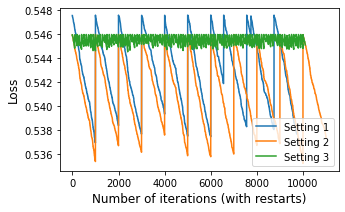

In [256]:
plt.figure(figsize=(5,3))
plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'restarts': 10}"]['train_loss'][:,0], label='Setting 1')
plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 100, 'restarts': 10}"]['train_loss'][:,0], label='Setting 2')
plt.plot(GSMetrics["{'max_iters': 100, 'max_attempts': 100, 'restarts': 100}"]['train_loss'][:,0], label='Setting 3')
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations (with restarts)',fontsize=12)
plt.legend( loc='best')

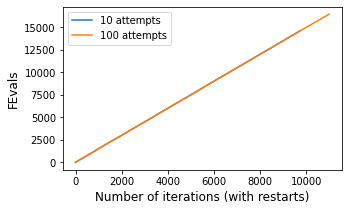

In [257]:
plt.figure(figsize=(5,3))
plt.plot([x[1] for x in GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'restarts': 10}"]['train_loss']], label='10 attempts')
plt.plot([x[1] for x in GSMetrics["{'max_iters': 1000, 'max_attempts': 100, 'restarts': 10}"]['train_loss']], label='100 attempts')
plt.ylabel('FEvals',fontsize=12)
plt.xlabel('Number of iterations (with restarts)',fontsize=12)
plt.legend( loc='best')

In [258]:
for key, value in GSMetrics.items():
    print(key, value['time'])

{'max_iters': 100, 'max_attempts': 10, 'restarts': 10} 2.1661949157714844
{'max_iters': 100, 'max_attempts': 10, 'restarts': 100} 19.521679878234863
{'max_iters': 100, 'max_attempts': 100, 'restarts': 10} 2.2246508598327637
{'max_iters': 100, 'max_attempts': 100, 'restarts': 100} 20.26907706260681
{'max_iters': 1000, 'max_attempts': 10, 'restarts': 10} 19.4638991355896
{'max_iters': 1000, 'max_attempts': 100, 'restarts': 10} 21.178251028060913


{'max_iters': 1000, 'max_attempts': 100, 'restarts': 10}
<class '__main__.MyNeuralNetwork'>
-0.5475928557065118
-0.5475643585026171
-0.5475643585026171
-0.5475726227364754
-0.5474836047665215
-0.5474836047665215
-0.5475484423182343
-0.5474832482366001
-0.5474832482366001
-0.5474872680296008
-0.5475244759794482
-0.5474571514483862
-0.5474571514483862
-0.5474006709247268
-0.5474006709247268
-0.5474014217627943
-0.5474010461738726
-0.5474033753775177
-0.5474012077361756
-0.5474007274479181
-0.5474040824873507
-0.5473980358410094
-0.5473980358410094
-0.5473952316841053
-0.5473952316841053
-0.5473870063952283
-0.5473870063952283
-0.5474734351657098
-0.5473819710313295
-0.5473819710313295
-0.5473438926112884
-0.5473438926112884
-0.5473432915687984
-0.5473432915687984
-0.5473452298202638
-0.5473554490077753
-0.5473910252825881
-0.5473438926112884
-0.5473382663742975
-0.5473382663742975
-0.5473431846721324
-0.5473356341278803
-0.5473356341278803
-0.5472684888283337
-0.5472684888283337
-0.54724

-0.5444922451862814
-0.5444899814294056
-0.5444473049858838
-0.5444473049858838
-0.5444615930939589
-0.5444539246289877
-0.5443060124510269
-0.5443060124510269
-0.5442791677812812
-0.5442791677812812
-0.5443211079995609
-0.5442785009541583
-0.5442785009541583
-0.5442527491930708
-0.5442527491930708
-0.5441687413373597
-0.5441687413373597
-0.5441691238259713
-0.5440849584015967
-0.5440849584015967
-0.5440707057013375
-0.5440707057013375
-0.5440288145869304
-0.5440288145869304
-0.5440406947744235
-0.5439452247862194
-0.5439452247862194
-0.5439169569165554
-0.5439169569165554
-0.5439133066384378
-0.5439133066384378
-0.5438878763361547
-0.5438878763361547
-0.5438879255823612
-0.5438904203741499
-0.5439071873730961
-0.5438736743014414
-0.5438736743014414
-0.5439131574073726
-0.5438943993454494
-0.543873283055292
-0.543873283055292
-0.5439346558025341
-0.5438727455713044
-0.5438727455713044
-0.5438724877699938
-0.5438724877699938
-0.5438854083593151
-0.5438764944550178
-0.5438349170555501
-0

-0.5414280062999764
-0.5414432787511189
-0.5414224953720042
-0.5414221587414968
-0.5414221587414968
-0.5413924986473256
-0.5413924986473256
-0.5413671980145123
-0.5413671980145123
-0.5413722653198529
-0.5413031776429541
-0.5413031776429541
-0.5412868844480329
-0.5412868844480329
-0.5412874034936225
-0.5412407070501261
-0.5412407070501261
-0.5412352930074773
-0.5412352930074773
-0.5412342675560704
-0.5412342675560704
-0.5413164187630054
-0.5413010909141257
-0.5411842639135788
-0.5411842639135788
-0.5411888879519132
-0.5411788848172598
-0.5411788848172598
-0.5411509883260577
-0.5411509883260577
-0.5411883498191148
-0.5411901823778299
-0.5411513693308826
-0.5411525516650644
-0.541113683561078
-0.541113683561078
-0.541120182589886
-0.5410819389377739
-0.5410819389377739
-0.5410427999329926
-0.5410427999329926
-0.5410475933096265
-0.5411095647178882
-0.5410504438295367
-0.5410424040729189
-0.5410424040729189
-0.5410578444755981
-0.5410376251740469
-0.5410376251740469
-0.5410295992570328
-0.

-0.5382234483322412
-0.5382083936200647
-0.5382286916087212
-0.5381571101373037
-0.5381571101373037
-0.5381731252036379
-0.5381550066955805
-0.5381550066955805
-0.5381747237688337
-0.5382176396362104
-0.5381236069658061
-0.5381236069658061
-0.5380510128981821
-0.5380510128981821
-0.53810918458198
-0.5380507551233131
-0.5380507551233131
-0.5380512177188599
-0.538029717140246
-0.538029717140246
-0.5381649735132317
-0.5380045602198021
-0.5380045602198021
-0.5379996566796005
-0.5379996566796005
-0.5380067339407208
-0.5380799727367827
-0.5379963870290553
-0.5379963870290553
-0.537996787009643
-0.5380213770457952
-0.5379939563771284
-0.5379939563771284
-0.5379697364210666
-0.5379697364210666
-0.5380145907100681
-0.5379689811934777
-0.5379689811934777
-0.5379530486762608
-0.5379530486762608
-0.5379476834663167
-0.5379476834663167
-0.5379501098345445
-0.5379074383866926
-0.5379074383866926
-0.5379054305421754
-0.5379054305421754
-0.5379252456004331
-0.5378812594461775
-0.5378812594461775
-0.53

-0.5457982855294238
-0.5457659742753608
-0.5457659742753608
-0.545786399745066
-0.5457929711897906
-0.5456810758001437
-0.5456810758001437
-0.5456804959250449
-0.5456804959250449
-0.5457088514689497
-0.5457060780453703
-0.5457469545698482
-0.5457064075924707
-0.5456825283234473
-0.5456722353214241
-0.5456722353214241
-0.5456965671086995
-0.5456675870491512
-0.5456675870491512
-0.5457294771822058
-0.5456434008950434
-0.5456434008950434
-0.5456693035775911
-0.5456431484677655
-0.5456431484677655
-0.5456514113998685
-0.5456485372330712
-0.545649781507033
-0.5455772216985182
-0.5455772216985182
-0.5455812404295887
-0.5455778564659932
-0.5455210051234956
-0.5455210051234956
-0.545483553614426
-0.545483553614426
-0.545466774323173
-0.545466774323173
-0.545401187396424
-0.545401187396424
-0.5454140470377596
-0.545384510860563
-0.545384510860563
-0.5453576704483702
-0.5453576704483702
-0.5452783837653409
-0.5452783837653409
-0.5452830586342281
-0.5452787557976028
-0.5452109419979364
-0.5452109

-0.5427916685359615
-0.5427911180083027
-0.5427911180083027
-0.5427853413775299
-0.5427853413775299
-0.5427087269175419
-0.5427087269175419
-0.5427926224226293
-0.5426823822243425
-0.5426823822243425
-0.5426859430974175
-0.5426821115410883
-0.5426821115410883
-0.5426870119123022
-0.5426944261346622
-0.542687677514509
-0.5426871758025743
-0.5426760812912014
-0.5426760812912014
-0.5426529824512433
-0.5426529824512433
-0.5426533266573449
-0.5425138662912569
-0.5425138662912569
-0.5424831526155002
-0.5424831526155002
-0.5425088282106343
-0.5425025244876075
-0.5424834807686048
-0.5424637929844636
-0.5424637929844636
-0.5424867044119756
-0.5424407357039281
-0.5424407357039281
-0.5424393472470455
-0.5424393472470455
-0.542434501680277
-0.542434501680277
-0.5424393128573131
-0.5424375932930318
-0.5424988805220826
-0.5424207186829325
-0.5424207186829325
-0.5424182860833408
-0.5424182860833408
-0.5423977509737551
-0.5423977509737551
-0.5424171061005366
-0.5423976791056176
-0.5423976791056176
-0.

-0.5399775044325253
-0.5400052818202516
-0.5400530625841716
-0.5399529253460476
-0.5399529253460476
-0.5399507332411911
-0.5399507332411911
-0.5399502707026071
-0.5399502707026071
-0.5399096779471972
-0.5399096779471972
-0.5398343016194473
-0.5398343016194473
-0.5398365072401231
-0.5398632769628335
-0.5398318858191976
-0.5398318858191976
-0.5399684275448323
-0.539828746585316
-0.539828746585316
-0.5398077530758212
-0.5398077530758212
-0.5398078198386328
-0.5398055640489351
-0.5398055640489351
-0.5397854855455056
-0.5397854855455056
-0.5398006289856492
-0.5397873542235212
-0.5397810577294173
-0.5397810577294173
-0.5397872084002853
-0.5397763188988974
-0.5397763188988974
-0.5397814909460421
-0.5397766700918225
-0.5397746677641904
-0.5397746677641904
-0.5397751789600127
-0.5397522666852002
-0.5397522666852002
-0.5397024043454824
-0.5397024043454824
-0.5397019958666492
-0.5397019958666492
-0.5396970268368604
-0.5396970268368604
-0.5397031752901911
-0.539751965973237
-0.5397247730389263
-0.

-0.5461704608675115
-0.5461704608675115
-0.5461714701439618
-0.5461604616884703
-0.5461604616884703
-0.546177269538073
-0.5461652690197215
-0.5461985872225331
-0.5461438112234477
-0.5461438112234477
-0.5461155611755921
-0.5461155611755921
-0.5461152764314521
-0.5461152764314521
-0.5461103051772377
-0.5461103051772377
-0.5461150239313626
-0.5461056601330478
-0.5461056601330478
-0.5460784182194779
-0.5460784182194779
-0.5460867027660937
-0.5460990042979089
-0.5460761171145044
-0.5460761171145044
-0.5460781014149314
-0.545996842149427
-0.545996842149427
-0.5459941856538923
-0.5459941856538923
-0.5460176135875043
-0.5459945584735361
-0.5459619047097748
-0.5459619047097748
-0.5459569547860236
-0.5459569547860236
-0.5459573275684424
-0.545973702085155
-0.5459572607001127
-0.54593101136706
-0.54593101136706
-0.5459734379856207
-0.5459359608741897
-0.5459316171148292
-0.5459294945542669
-0.5459294945542669
-0.5459512776962654
-0.5459901690115241
-0.5459547299149262
-0.545935050547289
-0.545932

-0.5425566336724015
-0.5425566336724015
-0.542595751236072
-0.5425612929649146
-0.5425628699421945
-0.5424978000595404
-0.5424978000595404
-0.5424924940240586
-0.5424924940240586
-0.5425529712016048
-0.5424925514883167
-0.5423538806228475
-0.5423538806228475
-0.5423578266130882
-0.5423549137767523
-0.5423532121182015
-0.5423532121182015
-0.5423565417428062
-0.5423214443172768
-0.5423214443172768
-0.5423352301506974
-0.5423443530960188
-0.5423181147016906
-0.5423181147016906
-0.5423227724305729
-0.5423229157795898
-0.5423054103477318
-0.5423054103477318
-0.5422807255774307
-0.5422807255774307
-0.5422805137961256
-0.5422805137961256
-0.5423006848428316
-0.5422558464919609
-0.5422558464919609
-0.5422611326759184
-0.5422719886817607
-0.5422098163590423
-0.5422098163590423
-0.5422092921541755
-0.5422092921541755
-0.5421775833881709
-0.5421775833881709
-0.5421716802085972
-0.5421716802085972
-0.5421854200346031
-0.5421594816549231
-0.5421594816549231
-0.542209254268965
-0.5421597292872906
-0

-0.5397495978875986
-0.5397463089856962
-0.5397463089856962
-0.539741671758662
-0.539741671758662
-0.5397419209633456
-0.5398013266900205
-0.5397378903999959
-0.5397378903999959
-0.5397411786684485
-0.5397581082715898
-0.5396713534592178
-0.5396713534592178
-0.5396461813305912
-0.5396461813305912
-0.5396500163004497
-0.53964685403629
-0.5396147071268499
-0.5396147071268499
-0.5396200759372064
-0.5396100753550442
-0.5396100753550442
-0.539584856521486
-0.539584856521486
-0.5396225440991392
-0.5395266276571411
-0.5395266276571411
-0.5395245091346651
-0.5395245091346651
-0.5395121364324786
-0.5395121364324786
-0.5395126264265043
-0.5394733405381381
-0.5394733405381381
-0.5394784613947311
-0.5394747193330988
-0.539498581539103
-0.5394731574989008
-0.5394731574989008
-0.539472484619405
-0.539472484619405
-0.539472227448095
-0.539472227448095
-0.5394964570596957
-0.5394672919186577
-0.5394672919186577
-0.5394646849491114
-0.5394646849491114
-0.539476689081846
-0.5394243896131143
-0.539424389

-0.5471312185614369
-0.5471312185614369
-0.5471364879218165
-0.5471532955814838
-0.5471254534995956
-0.5471254534995956
-0.547193363293202
-0.5471304990849306
-0.5471515373833319
-0.5470593991833366
-0.5470593991833366
-0.5470593375995384
-0.5470593375995384
-0.547061276958352
-0.5470763121839433
-0.5470616663352579
-0.5470526804201972
-0.5470526804201972
-0.5470961423081783
-0.5470563153758669
-0.5470717867420095
-0.5470242081587164
-0.5470242081587164
-0.5471104918599555
-0.5470890412514182
-0.5470208029396033
-0.5470208029396033
-0.546995783155101
-0.546995783155101
-0.5469831817810287
-0.5469831817810287
-0.5469891041708035
-0.546962318248622
-0.546962318248622
-0.5469617795600683
-0.5469617795600683
-0.546966486896659
-0.5468811321264854
-0.5468811321264854
-0.5468690171807968
-0.5468690171807968
-0.5468732977881247
-0.5468540588971644
-0.5468540588971644
-0.5468111695262463
-0.5468111695262463
-0.5467918783295409
-0.5467918783295409
-0.5468000847063323
-0.5467974801981739
-0.5467

-0.5447485785703842
-0.5447485785703842
-0.5447567945924354
-0.5447693821773033
-0.5447477745316734
-0.5447477745316734
-0.5447482872880453
-0.544812878890293
-0.5447471921554874
-0.5447471921554874
-0.5447465029458304
-0.5447465029458304
-0.5447436503867575
-0.5447436503867575
-0.5447502457983313
-0.5447354512176174
-0.5447354512176174
-0.5447304555867701
-0.5447304555867701
-0.5447339356037171
-0.5447309437503837
-0.5447299110666536
-0.5447299110666536
-0.5447296512966678
-0.5447296512966678
-0.5447293440093242
-0.5447293440093242
-0.5447300329217978
-0.5447272487143857
-0.5447272487143857
-0.5446957629789438
-0.5446957629789438
-0.544692327510601
-0.544692327510601
-0.5446930393919617
-0.5447131517649586
-0.5447206157224129
-0.5446922176616883
-0.5446922176616883
-0.544721954337927
-0.5446894005640123
-0.5446894005640123
-0.5447176893448198
-0.5447544939675332
-0.544688880871426
-0.544688880871426
-0.5446790286051263
-0.5446790286051263
-0.544706000862296
-0.5446795482991831
-0.5447

-0.5420835300640239
-0.542086871399036
-0.5420839520094459
-0.5420807933914433
-0.5420807933914433
-0.5420616080707521
-0.5420616080707521
-0.5420664366077331
-0.5421008125454265
-0.542139305459787
-0.542058717406169
-0.542058717406169
-0.542063361860246
-0.5420600787440232
-0.5420583441955932
-0.5420583441955932
-0.5420849087067994
-0.5420179114201029
-0.5420179114201029
-0.5420132675514441
-0.5420132675514441
-0.5420106269445379
-0.5420106269445379
-0.5420030899035684
-0.5420030899035684
-0.5419741793328413
-0.5419741793328413
-0.5419746004508954
-0.5419476568964043
-0.5419476568964043
-0.5418920708588945
-0.5418920708588945
-0.5418546476620343
-0.5418546476620343
-0.5418549460593547
-0.5418529120662451
-0.5418529120662451
-0.5418529687015909
-0.5418504585571424
-0.5418504585571424
-0.5418471187199877
-0.5418471187199877
-0.5417872278710782
-0.5417872278710782
-0.5417823577453206
-0.5417823577453206
-0.5417850024933987
-0.5417822124029914
-0.5417822124029914
-0.5417870303732008
-0.54

-0.5396354949845591
-0.5395983888174857
-0.5395983888174857
-0.5395706364127147
-0.5395706364127147
-0.5395711040421212
-0.5395652333801068
-0.5395652333801068
-0.539553730030116
-0.539553730030116
-0.5395542672656616
-0.5395166994819742
-0.5395166994819742
-0.5395235688795986
-0.5395717901339794
-0.5395184504562964
-0.5395088185369444
-0.5395088185369444
-0.5394836959966411
-0.5394836959966411
-0.5394559740052473
-0.5394559740052473
-0.5394571596432065
-0.5394529102863604
-0.5394529102863604
-0.5393898418741288
-0.5393898418741288
-0.5393903330932593
-0.5393894616328216
-0.5393894616328216
-0.5393780025373335
-0.5393780025373335
-0.5393782677136136
-0.5393022200198434
-0.5393022200198434
-0.539304375963309
-0.5475928557065118
-0.5475785162184629
-0.5475785162184629
-0.5476062200911773
-0.5475751598635302
-0.5475751598635302
-0.5475755304639085
-0.5475700920198944
-0.5475700920198944
-0.5475748370647753
-0.5475028530615333
-0.5475028530615333
-0.547455158771046
-0.547455158771046
-0.54

-0.5445836081314335
-0.5445128553185646
-0.5445128553185646
-0.5445125197239185
-0.5445125197239185
-0.5445122297848934
-0.5445122297848934
-0.5444808432854839
-0.5444808432854839
-0.5444634517948215
-0.5444634517948215
-0.544463347879715
-0.544463347879715
-0.5444415880603848
-0.5444415880603848
-0.5444740147426382
-0.5443946157748829
-0.5443946157748829
-0.5443941660219422
-0.5443941660219422
-0.5443891489717597
-0.5443891489717597
-0.5443890911931629
-0.5443890911931629
-0.5443885196408128
-0.5443885196408128
-0.5443759317499873
-0.5443759317499873
-0.5443462450160387
-0.5443462450160387
-0.5444098999877625
-0.544397598200682
-0.544402044012478
-0.5443465350423085
-0.5443463027948078
-0.5443469744742613
-0.5443465350423085
-0.5443427386513227
-0.5443427386513227
-0.544314417408372
-0.544314417408372
-0.544314988829003
-0.5443349204231372
-0.5443396484151505
-0.5442472714451835
-0.5442472714451835
-0.5442592567691602
-0.544200478660044
-0.544200478660044
-0.5441999944605267
-0.544199

-0.5418553370647469
-0.5417900441209578
-0.5417900441209578
-0.5417897433639608
-0.5417897433639608
-0.5417669623296087
-0.5417669623296087
-0.5417664129137966
-0.5417664129137966
-0.541738586472027
-0.541738586472027
-0.5417402315813034
-0.5417214448947579
-0.5417214448947579
-0.5417228893395465
-0.5417217125109486
-0.5416936509964478
-0.5416936509964478
-0.5417394615932627
-0.5416950955486227
-0.5417353094485889
-0.5416384621869912
-0.5416384621869912
-0.5416801165956731
-0.541606386506635
-0.541606386506635
-0.5416017317252423
-0.5416017317252423
-0.5416051821728827
-0.5415993387710791
-0.5415993387710791
-0.5416045477697611
-0.5415596918617347
-0.5415596918617347
-0.5415544851007498
-0.5415544851007498
-0.5415511184400585
-0.5415511184400585
-0.5415305710957771
-0.5415305710957771
-0.5415322113233442
-0.5415078224263654
-0.5415078224263654
-0.5415367210125129
-0.5415054500034074
-0.5415054500034074
-0.5415133637125472
-0.541505128396068
-0.541505128396068
-0.5414678185561714
-0.541

-0.5383069664914297
-0.5383069664914297
-0.5383134344139645
-0.5383066831526465
-0.5383066831526465
-0.5383273231078731
-0.538312192964822
-0.53828105896911
-0.53828105896911
-0.5382759262005639
-0.5382759262005639
-0.5382960609212767
-0.5382506458471901
-0.5382506458471901
-0.5382434526021068
-0.5382434526021068
-0.5382639986111436
-0.5382382655253366
-0.5382382655253366
-0.5382429366813871
-0.5381848206091955
-0.5381848206091955
-0.5381431502833253
-0.5381431502833253
-0.5381427477681139
-0.5381427477681139
-0.5381550198772549
-0.5381681930346257
-0.5381431034506703
-0.5381726191751466
-0.5381961886200517
-0.5381381028711768
-0.5381381028711768
-0.5381383956713713
-0.5381349302628127
-0.5381349302628127
-0.5381706817890263
-0.5381345222106806
-0.5381345222106806
-0.5381323524637611
-0.5381323524637611
-0.5381320597048143
-0.5381320597048143
-0.538153032565589
-0.5381390354861525
-0.5381544366320024
-0.5381119841156677
-0.5381119841156677
-0.5381608672193301
-0.5381071051908259
-0.538

-0.5453991114596305
-0.5454273859526344
-0.5453996575126548
-0.5453935864445572
-0.5453935864445572
-0.5453902015292671
-0.5453902015292671
-0.5454036851637891
-0.5453897090150226
-0.5453897090150226
-0.545362754206293
-0.545362754206293
-0.5453460612661293
-0.5453460612661293
-0.5453457282619559
-0.5453457282619559
-0.545372684109009
-0.5453057712981532
-0.5453057712981532
-0.5453080936918632
-0.545292529686001
-0.545292529686001
-0.5452961148218435
-0.5452938416780935
-0.5452930420716582
-0.5453577613726446
-0.5452948483140986
-0.5453099891112816
-0.5452310972176728
-0.5452310972176728
-0.5452306101095337
-0.5452306101095337
-0.545260104994344
-0.5452356326840437
-0.545256049791051
-0.5452254569449487
-0.5452254569449487
-0.5452000338216563
-0.5452000338216563
-0.5452142107179666
-0.545201343984116
-0.5450580114443974
-0.5450580114443974
-0.5449786498830212
-0.5449786498830212
-0.5449736839779039
-0.5449736839779039
-0.5449701165614481
-0.5449701165614481
-0.5449652225659293
-0.54496

-0.5423438418966944
-0.5423438418966944
-0.5422782829094933
-0.5422782829094933
-0.5422953765841101
-0.5423077415522964
-0.542283118758767
-0.5422574990785828
-0.5422574990785828
-0.542259776373479
-0.5422610785367139
-0.5422779752800232
-0.5422162174252513
-0.5422162174252513
-0.5422228161888069
-0.542190663742631
-0.542190663742631
-0.5421879378435294
-0.5421879378435294
-0.5422655904969846
-0.5422436556097047
-0.5422637458303176
-0.5421828732949615
-0.5421828732949615
-0.5421422367837044
-0.5421422367837044
-0.5421427091433295
-0.5421329484650554
-0.5421329484650554
-0.5421406456506713
-0.5421076376577586
-0.5421076376577586
-0.5421716729260723
-0.5421080476211791
-0.5421069288207216
-0.5421069288207216
-0.5420976503304992
-0.5420976503304992
-0.5420981937715451
-0.5420384825111475
-0.5420384825111475
-0.5420555373631409
-0.5420371532539682
-0.5420371532539682
-0.5420973028236061
-0.5420464312279941
-0.5420313728354933
-0.5420313728354933
-0.5420905438302436
-0.5419856071766184
-0.5

-0.5391450237962077
-0.5391453210374294
-0.539142374551078
-0.539142374551078
-0.5391374680761147
-0.5391374680761147
-0.539115012664348
-0.539115012664348
-0.5391144807841678
-0.5391144807841678
-0.539094465122418
-0.539094465122418
-0.5390571863553162
-0.5390571863553162
-0.5390582394740528
-0.539034748641459
-0.539034748641459
-0.539035802205535
-0.539097630404564
-0.5390601101999096
-0.5390399259874473
-0.5390210375892752
-0.5390210375892752
-0.5389956762775239
-0.5389956762775239
-0.5389977185774634
-0.5390124230325333
-0.5390245237974969
-0.5389907517436527
-0.5389907517436527
-0.538995511698548
-0.538995511698548
-0.538929126869151
-0.538929126869151
-0.5389245552105814
-0.5389245552105814
-0.538929696170709
-0.5389250774689268
-0.538924122874844
-0.538924122874844
-0.5389192192689434
-0.5389192192689434
-0.5389344301677426
-0.5388963820530577
-0.5388963820530577
-0.538898546684307
-0.5389629338702886
-0.5389001301463591
-0.5388969373340774
-0.5388827789365662
-0.538882778936566

-0.5465641374360171
-0.5466445115270578
-0.5465664651116469
-0.5464981719286065
-0.5464981719286065
-0.5465016216125081
-0.5465190140505785
-0.546578477482503
-0.5464977873167037
-0.5464977873167037
-0.5464334911207535
-0.5464334911207535
-0.5464329977299766
-0.5464329977299766
-0.5464013805231038
-0.5464013805231038
-0.5464392975248533
-0.5464009864537093
-0.5464009864537093
-0.5464004930388306
-0.5464004930388306
-0.5463731133199561
-0.5463731133199561
-0.5463704995617404
-0.5463704995617404
-0.5463728402782526
-0.5463738997006979
-0.5463925070524626
-0.5463468980344878
-0.5463468980344878
-0.5463418087509294
-0.5463418087509294
-0.5463411949876393
-0.5463411949876393
-0.5464214110812851
-0.5463203874497331
-0.5463203874497331
-0.5463207651641004
-0.5463227270333486
-0.5463818073253764
-0.5463261443796597
-0.5462920195065434
-0.5462920195065434
-0.5462968474657024
-0.5462646944769145
-0.5462646944769145
-0.5462631130766351
-0.5462631130766351
-0.5462440138892822
-0.5462440138892822
-

-0.5436488850118751
-0.5436107399147012
-0.5436107399147012
-0.5436314296360714
-0.543613660829505
-0.5436112657314339
-0.5436054268238596
-0.5436054268238596
-0.543602723960743
-0.543602723960743
-0.5436284479677339
-0.5436032158375069
-0.5436259541424451
-0.5435961143480584
-0.5435961143480584
-0.5435968507263609
-0.5435821551098705
-0.5435821551098705
-0.543550861828239
-0.543550861828239
-0.5435582729336113
-0.5435254534583047
-0.5435254534583047
-0.5435186362874891
-0.5435186362874891
-0.543493246112853
-0.543493246112853
-0.5434927559202565
-0.5434927559202565
-0.5434507091930663
-0.5434507091930663
-0.5434504061832165
-0.5434504061832165
-0.5434506588518792
-0.5435350453095186
-0.5434436105190005
-0.5434436105190005
-0.5433790394930891
-0.5433790394930891
-0.543405915764875
-0.5433664585113658
-0.5433664585113658
-0.5433714277309246
-0.5433395027905431
-0.5433395027905431
-0.5433399214475665
-0.5433600703164709
-0.5433868148027461
-0.5433390281908687
-0.5433390281908687
-0.54333

-0.5406022551317861
-0.5406414145913994
-0.5406852799360949
-0.5406284118554151
-0.5405906021058529
-0.5405906021058529
-0.5405879228732716
-0.5405879228732716
-0.5405913283113072
-0.5406141718213389
-0.5405874583006609
-0.5405874583006609
-0.5405937270532267
-0.5406128446318772
-0.5405828666799581
-0.5405828666799581
-0.5405812148911194
-0.5405812148911194
-0.5405758091368853
-0.5405758091368853
-0.5405986184922779
-0.5405692804715253
-0.5405692804715253
-0.540631359750121
-0.5405954339841282
-0.5405033690049035
-0.5405033690049035
-0.5405011900127393
-0.5405011900127393
-0.5405176338589651
-0.540494662487706
-0.540494662487706
-0.5405208260695953
-0.5404942417097421
-0.5404942417097421
-0.5405407807525823
-0.5404938767425033
-0.5404938767425033
-0.5404799846313851
-0.5404799846313851
-0.5405300217934873
-0.5404200607702248
-0.5404200607702248
-0.5404519618468994
-0.5404065500294584
-0.5404065500294584
-0.540347336530582
-0.540347336530582
-0.5403792385972248
-0.5403476578677333
-0.54

-0.5378639483392853
-0.5378932668431609
-0.5378632759476835
-0.5378237643670335
-0.5378237643670335
-0.537818756002887
-0.537818756002887
-0.5377961278740425
-0.5377961278740425
-0.5378255274504479
-0.5377975834434157
-0.5377956198764772
-0.5377956198764772
-0.5377951474376517
-0.5377951474376517
-0.5377697540154801
-0.5377697540154801
-0.5377694855133455
-0.5377694855133455
-0.5377843040729905
-0.5377495005941163
-0.5377495005941163
-0.537771996433515
-0.5377489197627123
-0.5377489197627123
-0.5377210145706686
-0.5377210145706686
-0.5377489197627123
-0.5378021577223168
-0.5377699146027256
-0.5377304797198742
-0.5377155863196815
-0.5377155863196815
-0.5377162967547536
-0.5376748879724073
-0.5376748879724073
-0.5376802238188165
-0.5376702629274416
-0.5376702629274416
-0.5376699946913732
-0.5376699946913732
-0.5376317246896053
-0.5376317246896053
-0.5376310962915831
-0.5376310962915831
-0.5376307375490222
-0.5376307375490222
-0.537631291835111
-0.5376303018812593
-0.5376303018812593
-0.5

-0.5452524155558726
-0.5452524155558726
-0.5452315641123133
-0.5452315641123133
-0.5452072834412098
-0.5452072834412098
-0.545201439409389
-0.545201439409389
-0.5452868811330441
-0.5452037562951044
-0.5452006969570009
-0.5452006969570009
-0.5452062375600184
-0.5452087431353632
-0.5452033976162382
-0.5452670957158913
-0.5451211411586404
-0.5451211411586404
-0.5451184908855847
-0.5451184908855847
-0.5451216830210085
-0.5451177910774192
-0.5451177910774192
-0.5451973312500724
-0.5451385854507296
-0.5451127302634031
-0.5451127302634031
-0.5451153667123841
-0.5451111552275454
-0.5451111552275454
-0.5451244251902874
-0.5451535627799962
-0.5450985681870603
-0.5450985681870603
-0.5450134372351316
-0.5450134372351316
-0.5450154929567999
-0.5450649201694845
-0.5450139387153372
-0.5450134955348994
-0.5449522855568049
-0.5449522855568049
-0.5449994031141601
-0.5450196280066837
-0.5449527655561827
-0.5449200672147992
-0.5449200672147992
-0.5448597695353203
-0.5448597695353203
-0.5448600356915779
-0

-0.5425567000584295
-0.542552715974956
-0.542552715974956
-0.5425264870872567
-0.5425264870872567
-0.5425820313589322
-0.5425056455543256
-0.5425056455543256
-0.5425050702177573
-0.5425050702177573
-0.5425687880575241
-0.5425282450380272
-0.5425056724408012
-0.5425057348272758
-0.5425062139812868
-0.5423660587652972
-0.5423660587652972
-0.5424318450255697
-0.5424286910483758
-0.5423340047882085
-0.5423340047882085
-0.5423116385297215
-0.5423116385297215
-0.5423282284878415
-0.5423119321964546
-0.5422342561656822
-0.5422342561656822
-0.5422947928088498
-0.5422087397907737
-0.5422087397907737
-0.5422919733131114
-0.5422726306184988
-0.5422722122318958
-0.5422478079494443
-0.5422502437306365
-0.5422059330523611
-0.5422059330523611
-0.5422065080705188
-0.5422343493352438
-0.5422186034231197
-0.5422025429595587
-0.5422025429595587
-0.542185947240083
-0.542185947240083
-0.5422115590281885
-0.5421651059666158
-0.5421651059666158
-0.5421442767025884
-0.5421442767025884
-0.5421615449349043
-0.5

-0.5396325506426564
-0.5396325506426564
-0.5396328175823819
-0.5395729301760501
-0.5395729301760501
-0.5395865975540511
-0.5395684159580264
-0.5395684159580264
-0.5396307285801468
-0.5395430997231738
-0.5395430997231738
-0.5395200717029227
-0.5395200717029227
-0.539446532693494
-0.539446532693494
-0.5394371107744965
-0.5394371107744965
-0.5394234160712797
-0.5394234160712797
-0.539423585988166
-0.5394258544608895
-0.539424174564687
-0.5394231911914682
-0.5394231911914682
-0.5393623745498496
-0.5393623745498496
-0.5393186595223638
-0.5393186595223638
-0.5393138355523749
-0.5393138355523749
-0.5393368491293348
-0.5393347862110465
-0.5393072957036739
-0.5393072957036739
-0.5392754567126465
-0.5392754567126465
-0.5392794818239764
-0.5392801765989703
-0.5392756964327641
-0.5392754147778391
-0.5392754147778391
-0.5393506028062596
-0.5392794398812863
-0.5392803051711929
-0.5392479274795113
-0.5392479274795113
-0.5392552847791467
-0.5392936280438518
-0.5392226567894821
-0.5392226567894821
-0.5

-0.5460575669189267
-0.5460280918542131
-0.5460280918542131
-0.5460247601785492
-0.5460247601785492
-0.546008007947215
-0.546008007947215
-0.5460130132731447
-0.5460083490097853
-0.5459827997663628
-0.5459827997663628
-0.5459036105492562
-0.5459036105492562
-0.5459038848615424
-0.5459358469366773
-0.545901632259276
-0.545901632259276
-0.5458915857223816
-0.5458915857223816
-0.5458919868160773
-0.5458887785908747
-0.5458887785908747
-0.5457463147685385
-0.5457463147685385
-0.5457943721389275
-0.545732109767546
-0.545732109767546
-0.5457327560268134
-0.5456900497814834
-0.5456900497814834
-0.5457459592454738
-0.5457459592454738
-0.5456895565490376
-0.5456895565490376
-0.5456826370434537
-0.5456826370434537
-0.5457061591558123
-0.5456267980903861
-0.5456267980903861
-0.5456016693281817
-0.5456016693281817
-0.5456285177457733
-0.5456021751163415
-0.5456010581332968
-0.5456010581332968
-0.5456003840676863
-0.5456003840676863
-0.5455957518478296
-0.5455957518478296
-0.5455961671765651
-0.545

-0.5433472637969987
-0.5433143432420812
-0.5433143432420812
-0.5432862220716428
-0.5432862220716428
-0.5432839039792818
-0.5432839039792818
-0.5432907894214577
-0.5432833841719485
-0.5432833841719485
-0.5433066373303006
-0.5432973953548544
-0.5432885850862
-0.5432161749838722
-0.5432161749838722
-0.5432158367038626
-0.5432158367038626
-0.5432207376570186
-0.5432157864935963
-0.5432157864935963
-0.5432659722593477
-0.5432710640913758
-0.5432192870371378
-0.5432132112136863
-0.5432132112136863
-0.5432525760395616
-0.5432083195450503
-0.5432083195450503
-0.5432131001149989
-0.5431879685801083
-0.5431879685801083
-0.5431934318627877
-0.543187456809473
-0.543187456809473
-0.5431875070876373
-0.543203850090413
-0.5432171065386777
-0.5431993442516226
-0.5431868912723471
-0.5431868912723471
-0.5431868409972945
-0.5431868409972945
-0.5431920395091286
-0.5431884020887875
-0.5431915605493239
-0.5431749743244876
-0.5431749743244876
-0.5431543094020091
-0.5431543094020091
-0.5431599916731968
-0.543

-0.5406209362493172
-0.540703891517778
-0.5406407692604813
-0.5406145930219193
-0.5406145930219193
-0.5406244455456088
-0.5406006352804218
-0.5406006352804218
-0.5406063345739638
-0.5406007052159819
-0.5405750388123338
-0.5405750388123338
-0.5405723599529062
-0.5405723599529062
-0.540572429972625
-0.5405880638851831
-0.5406553137128071
-0.5405770868411145
-0.540565472399056
-0.540565472399056
-0.5405718118467381
-0.5405607341325983
-0.5405607341325983
-0.5405777495018061
-0.5405610722579556
-0.5405541691578005
-0.5405541691578005
-0.5405768393771984
-0.540549441866802
-0.540549441866802
-0.5405544143127454
-0.5405705098428024
-0.540544644512885
-0.540544644512885
-0.5406819119924607
-0.5405421505110254
-0.5405421505110254
-0.5405424761533842
-0.5405484885866546
-0.5405591731134423
-0.5406193096127915
-0.5404822826429682
-0.5404822826429682
-0.5404812715914086
-0.5404812715914086
-0.5404747095477616
-0.5404747095477616
-0.5404724335781199
-0.5404724335781199
-0.5404719035105792
-0.54047

-0.5473083254818865
-0.5473095762617134
-0.5473319476486015
-0.5473075092126544
-0.5473075092126544
-0.5473046666626831
-0.5473046666626831
-0.5473086761735636
-0.5473257475279384
-0.5472835988994064
-0.5472835988994064
-0.5472809565568667
-0.5472809565568667
-0.5472759365831013
-0.5472759365831013
-0.5472806795238998
-0.5472706575279364
-0.5472706575279364
-0.547249774803069
-0.547249774803069
-0.547224643309218
-0.547224643309218
-0.5471725785458386
-0.5471725785458386
-0.5471691965683816
-0.5471691965683816
-0.5471658152668378
-0.5471658152668378
-0.5470855050013902
-0.5470855050013902
-0.5470811392234126
-0.5470811392234126
-0.5470837710342149
-0.5470768666070555
-0.5470768666070555
-0.5470819266162333
-0.547049476578211
-0.547049476578211
-0.5470497907372731
-0.5470487286256449
-0.5470487286256449
-0.5470190419983796
-0.5470190419983796
-0.5470187986009161
-0.5470187986009161
-0.5470185552604823
-0.5470185552604823
-0.5470009558242424
-0.5470009558242424
-0.5469953081917092
-0.546

-0.5442434093394127
-0.5441963020353119
-0.5441963020353119
-0.5442623694456575
-0.5441669342083006
-0.5441669342083006
-0.5441613566000423
-0.5441613566000423
-0.5441755553639513
-0.5441564960822405
-0.5441564960822405
-0.5441618621361293
-0.5441706947496268
-0.5441557680053273
-0.5441557680053273
-0.5441613457664891
-0.5441304021462304
-0.5441304021462304
-0.5440745091107858
-0.5440745091107858
-0.5440741387459145
-0.5440741387459145
-0.5440503464439029
-0.5440503464439029
-0.5440502027390556
-0.5440502027390556
-0.543985051157261
-0.543985051157261
-0.5439339911768152
-0.5439339911768152
-0.5439373790516762
-0.5439419216165557
-0.5439353535567384
-0.5439082647851812
-0.5439082647851812
-0.5437676979573284
-0.5437676979573284
-0.5437639471202893
-0.5437639471202893
-0.5436864341381848
-0.5436864341381848
-0.5436859517861677
-0.5436859517861677
-0.5436629347308675
-0.5436629347308675
-0.5436603879420767
-0.5436603879420767
-0.5436658151876548
-0.5436609286941809
-0.5436555400808121
-0

-0.5407188868157724
-0.5407140730459153
-0.5407140730459153
-0.540713814912341
-0.540713814912341
-0.5407139266894351
-0.5407184428927834
-0.5407171935682473
-0.5407393301802229
-0.5407768818911775
-0.5407275894902036
-0.5407098355877146
-0.5407098355877146
-0.5407134625085187
-0.5406708284277081
-0.5406708284277081
-0.5406706226800986
-0.5406706226800986
-0.5406908447909721
-0.5406760336154148
-0.5406480136524314
-0.5406480136524314
-0.5406739499605872
-0.5406502595751126
-0.540665143963777
-0.5406477556261291
-0.5406477556261291
-0.5405816642190261
-0.5405816642190261
-0.5405837171805278
-0.5407189992427746
-0.5405974241739786
-0.5406464359152346
-0.5405813047671897
-0.5405813047671897
-0.540579667198751
-0.540579667198751
-0.5405794091551852
-0.5405794091551852
-0.5405676092958885
-0.5405676092958885
-0.5406271185873045
-0.5405677427679029
-0.5405681593784137
-0.5405672580058608
-0.5405672580058608
-0.54056501307104
-0.54056501307104
-0.5405689881928829
-0.5405689881928829
-0.540570

-0.5378424126173577
-0.5378424126173577
-0.5378372578195799
-0.5378372578195799
-0.5378364551666366
-0.5378364551666366
-0.5378404229487579
-0.5378361631378187
-0.5378361631378187
-0.53784103285216
-0.5378310212222345
-0.5378310212222345
-0.5378536798475778
-0.5378312037060936
-0.5378276806768644
-0.5378276806768644
-0.5378328228749729
-0.5378291449617834
-0.5378310212222345
-0.537828238153957
-0.537753725305799
-0.537753725305799
-0.5377830672606482
-0.537765318691079
-0.5377339706332552
-0.5377339706332552
-0.5377089511382961
-0.5377089511382961
-0.5377117953612865
-0.5377089768732807
-0.5376686332536678
-0.5376686332536678
-0.5376373744680109
-0.5376373744680109
-0.5376512554682531
-0.5376320625329499
-0.5376320625329499
-0.5376374785745666
-0.5376381814292897
-0.5376337062033777
-0.537660788394329
-0.5375712450690923
-0.5375712450690923
-0.5375717565113567
-0.5375436512595243
-0.5375436512595243
-0.5375433256228497
-0.5375433256228497
-0.5375422196879398
-0.5375422196879398
-0.5374

-0.5457014871667385
-0.5457014871667385
-0.5456883559835739
-0.5456883559835739
-0.5456824151831022
-0.5456824151831022
-0.5456904179267792
-0.5456501434645704
-0.5456501434645704
-0.5456893442480579
-0.5456461961285088
-0.5456461961285088
-0.5456464824581746
-0.5456651782417609
-0.5456519421913852
-0.545648879193947
-0.5456508506847877
-0.5456517957069946
-0.545590480072706
-0.545590480072706
-0.5455848907737804
-0.5455848907737804
-0.5455901216350807
-0.5455851493209078
-0.545584484604653
-0.545584484604653
-0.5455787415257238
-0.5455787415257238
-0.5455792636708827
-0.5455759147603464
-0.5455759147603464
-0.5455966578976441
-0.5455724536564807
-0.5455724536564807
-0.5455890850216468
-0.545577684163705
-0.5455730883488873
-0.5455066280623577
-0.5455066280623577
-0.5454859559819496
-0.5454859559819496
-0.5454820168853466
-0.5454820168853466
-0.5454770166760402
-0.5454770166760402
-0.5454534818148274
-0.5454534818148274
-0.5454768705177131
-0.5454584491129096
-0.5454537670435313
-0.545

-0.5427878656429947
-0.5427883385838106
-0.5427932309083258
-0.5427925787099944
-0.5428197047363145
-0.542722576688764
-0.542722576688764
-0.5427239364338233
-0.5427176422908376
-0.5427176422908376
-0.5427483518864592
-0.5428021256273744
-0.5427428916893531
-0.5427225067206956
-0.5427175326517331
-0.5427175326517331
-0.5427844542550757
-0.5427174673740789
-0.5427174673740789
-0.5427015042226743
-0.5427015042226743
-0.5427262837115829
-0.5427218146375602
-0.5427296947509802
-0.5427001442997825
-0.5427001442997825
-0.5426733059726473
-0.5426733059726473
-0.5427500040941108
-0.5426783135908235
-0.5426682996915911
-0.5426682996915911
-0.5426660064029472
-0.5426660064029472
-0.5426656056122208
-0.5426656056122208
-0.5427312130652567
-0.5426606834408272
-0.5426606834408272
-0.5426554935662448
-0.5426554935662448
-0.5426351606662863
-0.5426351606662863
-0.5426716358868833
-0.5426288218606424
-0.5426288218606424
-0.5426290766156056
-0.5426697866946687
-0.542628313783491
-0.542628313783491
-0.5

-0.5405133970478266
-0.5405189565590369
-0.5405129785500604
-0.5405129785500604
-0.5404528296706425
-0.5404528296706425
-0.5404555154559967
-0.5403927572773078
-0.5403927572773078
-0.540352335833786
-0.540352335833786
-0.540343498412465
-0.540343498412465
-0.5403663294144774
-0.540344069755023
-0.5403157184573226
-0.5403157184573226
-0.5403448559044967
-0.5403655499009847
-0.5403184217459617
-0.540320660140652
-0.5403107721804429
-0.5403107721804429
-0.5402953129689613
-0.5402953129689613
-0.5403549170290841
-0.540290469969639
-0.540290469969639
-0.5402938148854749
-0.5402909945978593
-0.5402846790324717
-0.5402846790324717
-0.5402618311154425
-0.5402618311154425
-0.5402668086241612
-0.5402896718691433
-0.5402565571419835
-0.5402565571419835
-0.5402929229303778
-0.5402337453362049
-0.5402337453362049
-0.540233997620077
-0.5402334931094581
-0.5402334931094581
-0.5402310027661277
-0.5402310027661277
-0.5402361532802028
-0.5402313342557428
-0.5402356548252857
-0.5402563680810271
-0.540273

Text(0.5, 0, 'Number of iterations')

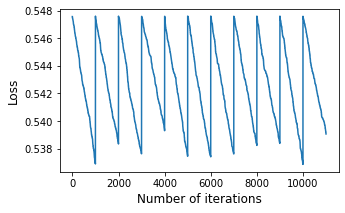

In [259]:
nn_model_rhc_best = MyNeuralNetwork(activation='relu', algorithm='random_hill_climb', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                           learning_rate=0.001, hidden_nodes=[10], max_iters=1000, max_attempts=100, restarts=10)
nn_model_rhc_best.fit(X_train, y_train)
plt.figure(figsize=(5,3))
plt.plot(nn_model_rhc_best.fitness_curve[:,0])
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)

In [337]:
nn_model_rhc_best.loss

0.5368650120693204

In [248]:
nn_model_rhc_best.fitness_curve

array([[5.47564359e-01, 2.00000000e+00],
       [5.47564359e-01, 3.00000000e+00],
       [5.47483605e-01, 5.00000000e+00],
       ...,
       [5.39103045e-01, 1.64790000e+04],
       [5.39067115e-01, 1.64810000e+04],
       [5.39067115e-01, 1.64820000e+04]])

In [249]:
start = time.time()
nn_model_rhc_best.fit(X_train,y_train)
end = time.time()
print('fit time: {:.6f}s'.format(end - start))

{'max_iters': 1000, 'max_attempts': 100, 'restarts': 10}
<class '__main__.MyNeuralNetwork'>
-0.5475928557065118
-0.5475643585026171
-0.5475643585026171
-0.5475726227364754
-0.5474836047665215
-0.5474836047665215
-0.5475484423182343
-0.5474832482366001
-0.5474832482366001
-0.5474872680296008
-0.5475244759794482
-0.5474571514483862
-0.5474571514483862
-0.5474006709247268
-0.5474006709247268
-0.5474014217627943
-0.5474010461738726
-0.5474033753775177
-0.5474012077361756
-0.5474007274479181
-0.5474040824873507
-0.5473980358410094
-0.5473980358410094
-0.5473952316841053
-0.5473952316841053
-0.5473870063952283
-0.5473870063952283
-0.5474734351657098
-0.5473819710313295
-0.5473819710313295
-0.5473438926112884
-0.5473438926112884
-0.5473432915687984
-0.5473432915687984
-0.5473452298202638
-0.5473554490077753
-0.5473910252825881
-0.5473438926112884
-0.5473382663742975
-0.5473382663742975
-0.5473431846721324
-0.5473356341278803
-0.5473356341278803
-0.5472684888283337
-0.5472684888283337
-0.54724

-0.5445455906467112
-0.5445469506971325
-0.5444895877841857
-0.5444895877841857
-0.5444922451862814
-0.5444899814294056
-0.5444473049858838
-0.5444473049858838
-0.5444615930939589
-0.5444539246289877
-0.5443060124510269
-0.5443060124510269
-0.5442791677812812
-0.5442791677812812
-0.5443211079995609
-0.5442785009541583
-0.5442785009541583
-0.5442527491930708
-0.5442527491930708
-0.5441687413373597
-0.5441687413373597
-0.5441691238259713
-0.5440849584015967
-0.5440849584015967
-0.5440707057013375
-0.5440707057013375
-0.5440288145869304
-0.5440288145869304
-0.5440406947744235
-0.5439452247862194
-0.5439452247862194
-0.5439169569165554
-0.5439169569165554
-0.5439133066384378
-0.5439133066384378
-0.5438878763361547
-0.5438878763361547
-0.5438879255823612
-0.5438904203741499
-0.5439071873730961
-0.5438736743014414
-0.5438736743014414
-0.5439131574073726
-0.5438943993454494
-0.543873283055292
-0.543873283055292
-0.5439346558025341
-0.5438727455713044
-0.5438727455713044
-0.5438724877699938
-0

-0.5415297217480471
-0.5415297217480471
-0.541592008220968
-0.5415289888813601
-0.5415289888813601
-0.5415688326967902
-0.5415295219763396
-0.5415297217480471
-0.5415037004167933
-0.5415037004167933
-0.5415091262064344
-0.5415040013356782
-0.541498205926944
-0.541498205926944
-0.5415030499624791
-0.5414924349329667
-0.5414924349329667
-0.54145107410758
-0.54145107410758
-0.5414974613579134
-0.5414562324038015
-0.5414505433779447
-0.5414505433779447
-0.5414903852119097
-0.5414450071138491
-0.5414450071138491
-0.5414452632258455
-0.541444487975391
-0.541444487975391
-0.5414761066195131
-0.5414706432444212
-0.5414448699157534
-0.5414440914451373
-0.5414440914451373
-0.5414448246183885
-0.5414270828094941
-0.5414270828094941
-0.5414222390383744
-0.5414222390383744
-0.5414280062999764
-0.5414432787511189
-0.5414224953720042
-0.5414221587414968
-0.5414221587414968
-0.5413924986473256
-0.5413924986473256
-0.5413671980145123
-0.5413671980145123
-0.5413722653198529
-0.5413031776429541
-0.541303

-0.5375921270372442
-0.5375645815181574
-0.5375645815181574
-0.5375487642883936
-0.5375487642883936
-0.5376085913316228
-0.5374908654643102
-0.5374908654643102
-0.5374960561004558
-0.5374190693502184
-0.5374190693502184
-0.5374138822843761
-0.5374138822843761
-0.5374143720226621
-0.5373854183794299
-0.5373854183794299
-0.5373840504395737
-0.5373840504395737
-0.5373786771692064
-0.5373786771692064
-0.5374040036664693
-0.5373502606693736
-0.5373502606693736
-0.5373480917198485
-0.5373480917198485
-0.5373478285630438
-0.5373478285630438
-0.5373481798384435
-0.5372736446112446
-0.5372736446112446
-0.5372732933761207
-0.5372732933761207
-0.5372326044255186
-0.5372326044255186
-0.5372075391993849
-0.5372075391993849
-0.5372724547001838
-0.5371589873214068
-0.5371589873214068
-0.5371587447298186
-0.5371587447298186
-0.5371590100267085
-0.5371587910256056
-0.5371994261576164
-0.5370965977916697
-0.5370965977916697
-0.5371214974699449
-0.5370560513281618
-0.5370560513281618
-0.5370154510948166


-0.5450571828058071
-0.5450526837479915
-0.5450526837479915
-0.5450010143384072
-0.5450010143384072
-0.5449953820974521
-0.5449953820974521
-0.544969515092824
-0.544969515092824
-0.5450305280543505
-0.544964848581243
-0.544964848581243
-0.5449705863422633
-0.5449567966716125
-0.5449567966716125
-0.5449575025514476
-0.5449535411525447
-0.5449535411525447
-0.5449632631039554
-0.5449540215452414
-0.544958549824711
-0.5449408185866111
-0.5449408185866111
-0.5449361846663058
-0.5449361846663058
-0.5450015107239862
-0.5449444219860824
-0.544909238650522
-0.544909238650522
-0.5449140728152837
-0.5449351006527449
-0.5448535723147664
-0.5448535723147664
-0.5448529100745513
-0.5448529100745513
-0.5448558127800261
-0.5448499843349408
-0.5448499843349408
-0.5448504638746513
-0.5448558017072804
-0.5448494802948809
-0.5448494802948809
-0.544886361132743
-0.5448521289398404
-0.5448492275881378
-0.5448492275881378
-0.5448750855105609
-0.5448364922277017
-0.5448364922277017
-0.544873851094072
-0.544920

-0.5421751802518893
-0.5421864407144499
-0.5421737625901377
-0.5421689919434978
-0.5421689919434978
-0.5421808340161811
-0.542108725624279
-0.542108725624279
-0.5421481140738622
-0.5421496979787539
-0.5421052128410977
-0.5421052128410977
-0.54211483538165
-0.5421056503103011
-0.542125509984473
-0.5421004461001979
-0.5421004461001979
-0.5420948784937943
-0.5420948784937943
-0.5420176478633675
-0.5420176478633675
-0.5420171008445086
-0.5420171008445086
-0.542039862072642
-0.5420811709038625
-0.5420539106054616
-0.5420170295441987
-0.5420170295441987
-0.5421557620540557
-0.5420167587703861
-0.5420167587703861
-0.5420423727942474
-0.5420171011573267
-0.5420431687142395
-0.5420103064127605
-0.5420103064127605
-0.5420754395558519
-0.542012534581157
-0.5420151085447046
-0.5419932033549436
-0.5419932033549436
-0.5419928761898893
-0.5419928761898893
-0.5420190529791353
-0.5420394402130916
-0.5420158760889402
-0.5419933177998192
-0.5419882746098633
-0.5419882746098633
-0.5420113113424625
-0.5419

-0.5395409112021781
-0.5395175740611343
-0.539476089337883
-0.539476089337883
-0.5394757427872597
-0.5394757427872597
-0.5394764500486274
-0.5395011965660588
-0.5394807297354713
-0.5395418391146503
-0.5394908339748297
-0.5394550567286699
-0.5394550567286699
-0.5395290487845678
-0.5394456731946888
-0.5394456731946888
-0.5394473207651004
-0.5394773114308411
-0.5394393014135056
-0.5394393014135056
-0.5394392344577821
-0.5394392344577821
-0.5394430680496621
-0.5394983989274067
-0.5394485964684604
-0.5394256654371444
-0.5394256654371444
-0.5393889404328127
-0.5393889404328127
-0.5393946438932107
-0.539349704286529
-0.539349704286529
-0.5393543074794499
-0.5394045988897684
-0.5393529588988992
-0.5393361864127656
-0.5393361864127656
-0.5393337252749428
-0.5393337252749428
-0.5393342519873371
-0.5393339919143433
-0.5393384359716715
-0.5393550303916942
-0.5393701882943902
-0.5393320758524052
-0.5393320758524052
-0.5393321241272045
-0.5393274175836842
-0.5393274175836842
-0.5393288384327637
-0.5

-0.5456534997769552
-0.5456534997769552
-0.5457201735182536
-0.5456560581988165
-0.5456581500032909
-0.5456500629121778
-0.5456500629121778
-0.5456600539802349
-0.5456807776471244
-0.5456923792879316
-0.5456451316511763
-0.5456451316511763
-0.5456697585471744
-0.5456534266634443
-0.5456446071190624
-0.5456446071190624
-0.5455780154599841
-0.5455780154599841
-0.5456050693044147
-0.5455175513402474
-0.5455175513402474
-0.5455227408780401
-0.5455181625496083
-0.5454522739194827
-0.5454522739194827
-0.5454577316478935
-0.5454422901425819
-0.5454422901425819
-0.5454422400553839
-0.5454422400553839
-0.5454448164544305
-0.5454427998398912
-0.5454388431479855
-0.5454388431479855
-0.5454443785843774
-0.545377269492007
-0.545377269492007
-0.5453765671369
-0.5453765671369
-0.5453739967874933
-0.5453739967874933
-0.5453267418684885
-0.5453267418684885
-0.545330702220189
-0.5453526527129113
-0.5453398490773024
-0.5453272868830354
-0.5452755512771305
-0.5452755512771305
-0.5452742151064147
-0.545274

-0.5420596234577144
-0.5421009715625535
-0.5420548097106086
-0.5420548097106086
-0.5420577759617798
-0.541987614233263
-0.541987614233263
-0.5420155202138262
-0.5420109516124024
-0.5419862556564535
-0.5419862556564535
-0.5419859549611172
-0.5419859549611172
-0.5419895473649395
-0.5419469462909762
-0.5419469462909762
-0.5419523722632296
-0.5418827028703151
-0.5418827028703151
-0.5418824429583969
-0.5418824429583969
-0.5418876998075357
-0.5418785089744454
-0.5418785089744454
-0.5418373676669507
-0.5418373676669507
-0.5417914000552834
-0.5417914000552834
-0.5417916124318417
-0.5417503407993647
-0.5417503407993647
-0.541750864021393
-0.541755116498219
-0.5417556234998497
-0.5417553470515988
-0.5417963069742641
-0.541744137449351
-0.541744137449351
-0.5417562885148698
-0.5417720151302866
-0.5417444928254429
-0.5417438899746444
-0.5417438899746444
-0.5417228685646943
-0.5417228685646943
-0.5417282905487751
-0.5417235361889344
-0.5417189506717838
-0.5417189506717838
-0.5416995037731124
-0.541

-0.5393249486237852
-0.5393249860786964
-0.5393244257562824
-0.5393244257562824
-0.5393196084046988
-0.5393196084046988
-0.5393193002089918
-0.5393193002089918
-0.5392458951310324
-0.5392458951310324
-0.5392325494571085
-0.5392325494571085
-0.5392323613881688
-0.5392323613881688
-0.5392318393042376
-0.5392318393042376
-0.5392317048851175
-0.5392317048851175
-0.539149436691154
-0.539149436691154
-0.5391499589534078
-0.5391520223475235
-0.5391493296317044
-0.5391493296317044
-0.5391519152822583
-0.5392150199539987
-0.5391498184209195
-0.5392074991690567
-0.5391717710182534
-0.5391430627004781
-0.5391430627004781
-0.5391425749761568
-0.5391425749761568
-0.5391401535328882
-0.5391401535328882
-0.5391454628822344
-0.5391560003605494
-0.5391325069526193
-0.5391325069526193
-0.5391576909848409
-0.5392057220438925
-0.5391347245557506
-0.5391022755893806
-0.5391022755893806
-0.5390895099768547
-0.5390895099768547
-0.5391717973870819
-0.5391114253522039
-0.5391551613300721
-0.5390861743445656
-0

-0.5467531816059578
-0.5467524246947637
-0.5467471889240405
-0.5467471889240405
-0.5467475885419202
-0.5468910615702062
-0.5467475859775749
-0.546726350235355
-0.546726350235355
-0.5467305913570961
-0.5467221535979667
-0.5467221535979667
-0.5466788932301008
-0.5466788932301008
-0.546675520581879
-0.546675520581879
-0.5466898806641383
-0.5466439281237858
-0.5466439281237858
-0.5466736214561537
-0.5466426593874361
-0.5466426593874361
-0.54661663680858
-0.54661663680858
-0.5465553381115097
-0.5465553381115097
-0.5464909267509209
-0.5464909267509209
-0.5465169739636916
-0.5464699406630975
-0.5464699406630975
-0.5465095666814229
-0.5464919246408526
-0.546437546484201
-0.546437546484201
-0.5464415531978233
-0.5464294289275093
-0.5464294289275093
-0.546456826669823
-0.546427870697243
-0.546427870697243
-0.5464197672244662
-0.5464197672244662
-0.5464453493803162
-0.546427870697243
-0.5464264419851342
-0.5464577652914911
-0.546500208002554
-0.5463949433352486
-0.5463949433352486
-0.546464384705

-0.5446703787324086
-0.5446703787324086
-0.5446714034913844
-0.5446697104739922
-0.5446697104739922
-0.5447171682462149
-0.5446698202487661
-0.5446084513124634
-0.5446084513124634
-0.5446479030323578
-0.5446094760967941
-0.5445866444380335
-0.5445866444380335
-0.5446264847516308
-0.5445830670844669
-0.5445830670844669
-0.5445548030991778
-0.5445548030991778
-0.5445233452662007
-0.5445233452662007
-0.5444453707252416
-0.5444453707252416
-0.5444403856725193
-0.5444403856725193
-0.5444338114033739
-0.5444338114033739
-0.5444365468095196
-0.5443726466614087
-0.5443726466614087
-0.5443775761502939
-0.5443754630445523
-0.5443121934091311
-0.5443121934091311
-0.5442996214754586
-0.5442996214754586
-0.5443075361840419
-0.5442991456639048
-0.5442991456639048
-0.5443602987491897
-0.5443463081175373
-0.544233348933151
-0.544233348933151
-0.5442160770076724
-0.5442160770076724
-0.5441970721520386
-0.5441970721520386
-0.5441920818526125
-0.5441920818526125
-0.5441969752324956
-0.544190481410254
-0.

-0.5420106269445379
-0.5420030899035684
-0.5420030899035684
-0.5419741793328413
-0.5419741793328413
-0.5419746004508954
-0.5419476568964043
-0.5419476568964043
-0.5418920708588945
-0.5418920708588945
-0.5418546476620343
-0.5418546476620343
-0.5418549460593547
-0.5418529120662451
-0.5418529120662451
-0.5418529687015909
-0.5418504585571424
-0.5418504585571424
-0.5418471187199877
-0.5418471187199877
-0.5417872278710782
-0.5417872278710782
-0.5417823577453206
-0.5417823577453206
-0.5417850024933987
-0.5417822124029914
-0.5417822124029914
-0.5417870303732008
-0.5417533520011384
-0.5417533520011384
-0.5418158842163883
-0.5417130137783579
-0.5417130137783579
-0.5417519095854811
-0.5416739050815589
-0.5416739050815589
-0.5416665109634536
-0.5416665109634536
-0.541662934647095
-0.541662934647095
-0.5416717748465932
-0.5416604823436284
-0.5416604823436284
-0.5416557156072037
-0.5416557156072037
-0.5416562440819129
-0.5416266289008331
-0.5416266289008331
-0.5416208563223661
-0.5416208563223661
-0

-0.5397793934422973
-0.5397793934422973
-0.5398056166913043
-0.5398179306404887
-0.5397788691459012
-0.5397788691459012
-0.5398403262103634
-0.5397991224778014
-0.5397956881238546
-0.5397052264564455
-0.5397052264564455
-0.5397021232590332
-0.5397021232590332
-0.5396354949845591
-0.5396354949845591
-0.5395983888174857
-0.5395983888174857
-0.5395706364127147
-0.5395706364127147
-0.5395711040421212
-0.5395652333801068
-0.5395652333801068
-0.539553730030116
-0.539553730030116
-0.5395542672656616
-0.5395166994819742
-0.5395166994819742
-0.5395235688795986
-0.5395717901339794
-0.5395184504562964
-0.5395088185369444
-0.5395088185369444
-0.5394836959966411
-0.5394836959966411
-0.5394559740052473
-0.5394559740052473
-0.5394571596432065
-0.5394529102863604
-0.5394529102863604
-0.5393898418741288
-0.5393898418741288
-0.5393903330932593
-0.5393894616328216
-0.5393894616328216
-0.5393780025373335
-0.5393780025373335
-0.5393782677136136
-0.5393022200198434
-0.5393022200198434
-0.539304375963309
-0.

-0.5449188758563136
-0.5449122691943746
-0.5448723210433379
-0.5448723210433379
-0.544787382575514
-0.544787382575514
-0.5447878330428039
-0.5447803850682551
-0.5447803850682551
-0.5447757596059009
-0.5447757596059009
-0.5447762442812899
-0.5447711350244515
-0.5447711350244515
-0.544745480217165
-0.544745480217165
-0.544748121401888
-0.5447737490430025
-0.5447374483855003
-0.5447374483855003
-0.5447369637378733
-0.5447369637378733
-0.5447055348257328
-0.5447055348257328
-0.5447082026575061
-0.5446757850922588
-0.5446757850922588
-0.5446783645763321
-0.5446499149217916
-0.5446499149217916
-0.5446552300138988
-0.5446264243880173
-0.5446264243880173
-0.5446259399380654
-0.5446259399380654
-0.5446292333448964
-0.544578802083577
-0.544578802083577
-0.5445791726989021
-0.5445836081314335
-0.5445128553185646
-0.5445128553185646
-0.5445125197239185
-0.5445125197239185
-0.5445122297848934
-0.5445122297848934
-0.5444808432854839
-0.5444808432854839
-0.5444634517948215
-0.5444634517948215
-0.5444

-0.54207493574899
-0.5420732061369903
-0.5420732061369903
-0.5420665043859086
-0.5420665043859086
-0.5420747791200267
-0.5420986480551954
-0.5420638112461766
-0.5420638112461766
-0.5421242716227667
-0.5420686226487154
-0.5420382389774013
-0.5420382389774013
-0.5420349212071016
-0.5420349212071016
-0.5420939995835531
-0.5420472491869109
-0.542011753111726
-0.542011753111726
-0.542011702996278
-0.542011702996278
-0.5419742932934526
-0.5419742932934526
-0.5419739761821086
-0.5419739761821086
-0.5420129582981891
-0.5419809927152384
-0.541972316215214
-0.541972316215214
-0.5419895035366975
-0.5419788823655604
-0.541969114022822
-0.541969114022822
-0.5420080933349363
-0.541969381805847
-0.5419696983520983
-0.5420295569224313
-0.5419725197425476
-0.5419572569023698
-0.5419572569023698
-0.5419183293311536
-0.5419183293311536
-0.5418861998766681
-0.5418861998766681
-0.5418896482002243
-0.5418648613913141
-0.5418648613913141
-0.5418558704274323
-0.5418558704274323
-0.5418779498748498
-0.54185533

-0.539026372329746
-0.5389655325414336
-0.5389655325414336
-0.5389428118497255
-0.5389428118497255
-0.5389497747440347
-0.5389490789293017
-0.5389416869249801
-0.5389416869249801
-0.5388872404847621
-0.5388872404847621
-0.5388819925495492
-0.5388819925495492
-0.5388239887456858
-0.5388239887456858
-0.5388271661531243
-0.5388183283998746
-0.5388183283998746
-0.5388205689262262
-0.5388216715565642
-0.5388231613718207
-0.5386835319769607
-0.5386835319769607
-0.5386813176675548
-0.5386813176675548
-0.538640635626514
-0.538640635626514
-0.538628354292088
-0.538628354292088
-0.5385465896799051
-0.5385465896799051
-0.5385666113446422
-0.5386044658301126
-0.5385479209192268
-0.5385470239909028
-0.538545801077709
-0.538545801077709
-0.5385458583459832
-0.5385492144450551
-0.5385465896799051
-0.5385441397217383
-0.5385441397217383
-0.5385445739682998
-0.5385407701638439
-0.5385407701638439
-0.5385414849919408
-0.5385410341300474
-0.5385163524503364
-0.5385163524503364
-0.5385166148129769
-0.5385

-0.5461666297371838
-0.5461679425472187
-0.5461989719076257
-0.5461545260451615
-0.5461545260451615
-0.5461551059590178
-0.5461546239455358
-0.5461529765790841
-0.5461529765790841
-0.5461728324853617
-0.5461739043563388
-0.5461728324853617
-0.5462962493119654
-0.546153317703132
-0.5461104906119396
-0.5461104906119396
-0.5461533639138106
-0.5461103927403934
-0.5461103927403934
-0.5460247802770037
-0.5460247802770037
-0.5459823511018537
-0.5459823511018537
-0.5459838988157687
-0.5459507243998691
-0.5459507243998691
-0.5459514068838499
-0.5459823511018537
-0.5459902757181874
-0.5459556689727919
-0.5459480553172381
-0.5459480553172381
-0.5458873616317579
-0.5458873616317579
-0.5459016484289907
-0.5459048766653077
-0.5458837462337935
-0.5458837462337935
-0.5458646671528686
-0.5458646671528686
-0.5458173986671412
-0.5458173986671412
-0.5458167490767504
-0.5458167490767504
-0.5457788101504547
-0.5457788101504547
-0.5457738715379487
-0.5457738715379487
-0.5458367250740146
-0.5457741480543075
-

-0.5429350500678917
-0.5429053897114754
-0.5429053897114754
-0.5429025758734856
-0.5429025758734856
-0.5429695046105262
-0.542904126848752
-0.5428467640408695
-0.5428467640408695
-0.5428218744749667
-0.5428218744749667
-0.5428154810411969
-0.5428154810411969
-0.5428190414224621
-0.542810434413967
-0.542810434413967
-0.5428104984971563
-0.54278752097191
-0.54278752097191
-0.5428001737723355
-0.5427870579623726
-0.5427870579623726
-0.5427462146889354
-0.5427462146889354
-0.5427621507352793
-0.5427462786546495
-0.5427557192511951
-0.5427472178682411
-0.5426623410095622
-0.5426623410095622
-0.5426574256736643
-0.5426574256736643
-0.5427231576309626
-0.5426587578046621
-0.5426576723495318
-0.542649648874706
-0.542649648874706
-0.5426425923830045
-0.5426425923830045
-0.5425758314477072
-0.5425758314477072
-0.5425593921091459
-0.5425593921091459
-0.5426187746587632
-0.5425985991946666
-0.5425798672488339
-0.5425825489063467
-0.5425849862675696
-0.5425422662477377
-0.5425422662477377
-0.542542

-0.5400114282350743
-0.5400114282350743
-0.5400114707498146
-0.5400118664431138
-0.5400057060931922
-0.5400057060931922
-0.5399761168744373
-0.5399761168744373
-0.5399357700484037
-0.5399357700484037
-0.539963509838146
-0.5399448842965887
-0.5399612119056828
-0.5399311651265413
-0.5399311651265413
-0.5399316006770312
-0.5399345564984395
-0.5398904369594208
-0.5398904369594208
-0.539913379365261
-0.5398597942588641
-0.5398597942588641
-0.5398635119103246
-0.5398571409393381
-0.5398571409393381
-0.5398111512680954
-0.5398111512680954
-0.5398108504347344
-0.5398108504347344
-0.539818897361855
-0.5397289886184015
-0.5397289886184015
-0.5397232715763655
-0.5397232715763655
-0.5397227302606942
-0.5397227302606942
-0.5396673636299181
-0.5396673636299181
-0.5396719571918307
-0.5396725370756688
-0.539661106957211
-0.539661106957211
-0.5396637591019573
-0.539716472262263
-0.5396001332264471
-0.5396001332264471
-0.5395954684465232
-0.5395954684465232
-0.539590142353418
-0.539590142353418
-0.53955

-0.5474845883597568
-0.5474590188403461
-0.5474590188403461
-0.5474632899963616
-0.5474550070943722
-0.5474550070943722
-0.5473688466622589
-0.5473688466622589
-0.5473691815991284
-0.5474335796505264
-0.5473715545185566
-0.5473016685975671
-0.5473016685975671
-0.5472976679653119
-0.5472976679653119
-0.5472977871381134
-0.5472977871381134
-0.547300278208287
-0.5472569061073114
-0.5472569061073114
-0.5472518947247832
-0.5472518947247832
-0.5472436544809216
-0.5472436544809216
-0.5472380839248634
-0.5472380839248634
-0.5472144002193057
-0.5472144002193057
-0.5472017496114427
-0.5472017496114427
-0.5471761968410126
-0.5471761968410126
-0.5471725728315385
-0.5471725728315385
-0.5471678699971105
-0.5471678699971105
-0.547168420535724
-0.5471628321588919
-0.5471628321588919
-0.5471484697131311
-0.5471484697131311
-0.5471585482120114
-0.5471487549696145
-0.5471341485347349
-0.5471341485347349
-0.547128543455084
-0.547128543455084
-0.547116425423027
-0.547116425423027
-0.5471097689111579
-0.547

-0.5441521359758519
-0.544134974098619
-0.544134974098619
-0.5441362622136667
-0.5441356053462397
-0.5441522308580659
-0.5441468612306479
-0.5441344475887717
-0.5441344475887717
-0.5441289659563768
-0.5441289659563768
-0.5441339540155972
-0.5441290685045712
-0.5441328902706963
-0.5441221219534355
-0.5441221219534355
-0.5441393725388666
-0.5441254963929445
-0.5441215545995252
-0.5441215545995252
-0.544128398668099
-0.5441455602024355
-0.5441268842881706
-0.5441168591909474
-0.5441168591909474
-0.5441162280915925
-0.5441162280915925
-0.544181802484745
-0.5441022219261978
-0.5441022219261978
-0.5441656725828312
-0.5441015296029263
-0.5441015296029263
-0.5441063804947682
-0.5441012338283742
-0.5441012338283742
-0.5439597201094996
-0.5439597201094996
-0.5439596174548548
-0.5439596174548548
-0.5439405971251033
-0.5439405971251033
-0.5440194891331814
-0.5439545852351729
-0.543920003628305
-0.543920003628305
-0.5439131741850621
-0.5439131741850621
-0.5439178280864171
-0.54392106396321
-0.54384

-0.5413424799954086
-0.5413131454132513
-0.5413131454132513
-0.5412738976576246
-0.5412738976576246
-0.5411358172351913
-0.5411358172351913
-0.5411333107212586
-0.5411333107212586
-0.5411339569505276
-0.5411332120998411
-0.5411332120998411
-0.5411131948608897
-0.5411131948608897
-0.5411124923297626
-0.5411124923297626
-0.5410502962591016
-0.5410502962591016
-0.5410363792282846
-0.5410363792282846
-0.5410356151403122
-0.5410356151403122
-0.5410126020528563
-0.5410126020528563
-0.5410104146689321
-0.5410104146689321
-0.541005149165297
-0.541005149165297
-0.5409837958072412
-0.5409837958072412
-0.5409977118432214
-0.5409206371685229
-0.5409206371685229
-0.5409668179418039
-0.5409158342443685
-0.5409158342443685
-0.54088545407705
-0.54088545407705
-0.54089025246106
-0.5408847305590523
-0.5408847305590523
-0.5408825440602164
-0.5408825440602164
-0.5408794545127249
-0.5408794545127249
-0.5409426108537854
-0.5408840935246619
-0.5408816414414807
-0.5408847180290527
-0.5408799976894457
-0.54087

-0.5384761196445487
-0.5384684238335898
-0.5384684238335898
-0.5385137467503447
-0.5384650425489228
-0.5384650425489228
-0.5385055981311723
-0.5384068674447483
-0.5384068674447483
-0.5384013952563317
-0.5384013952563317
-0.5383433692072038
-0.5383433692072038
-0.5383456110837546
-0.5383428956609161
-0.5383428956609161
-0.5383424221224498
-0.5383424221224498
-0.5382072154336416
-0.5382072154336416
-0.5381827338146972
-0.5381827338146972
-0.5381943955197039
-0.5381801225788917
-0.5381801225788917
-0.5381681737365646
-0.5381681737365646
-0.5381730735352778
-0.5381630720288663
-0.5381630720288663
-0.5381652861847829
-0.5381695194703928
-0.5381824245420674
-0.5382371004583351
-0.5381622790981552
-0.5381622790981552
-0.5381426335742187
-0.5381426335742187
-0.538142119059799
-0.538142119059799
-0.5381674781473634
-0.5382000956773195
-0.5381558557136612
-0.5381326203396679
-0.5381326203396679
-0.5381578807784041
-0.5381304275195512
-0.5381304275195512
-0.5381688352288073
-0.5381579231277546
-0

-0.5458504430961636
-0.5458504430961636
-0.5458679129621176
-0.5458509266830799
-0.5458449294686236
-0.5458449294686236
-0.5458459333162647
-0.5458150059886293
-0.5458150059886293
-0.5458948673952543
-0.5458473419420927
-0.5457835178974594
-0.5457835178974594
-0.5457890470803839
-0.5458513832831496
-0.5457827724732424
-0.5457827724732424
-0.545787780279904
-0.545820657674778
-0.5457701900883025
-0.5457701900883025
-0.5458316089809436
-0.5457276155308717
-0.5457276155308717
-0.5457269492880702
-0.5457269492880702
-0.5457301886765867
-0.545697403034553
-0.545697403034553
-0.5456714426281163
-0.5456714426281163
-0.545666214568987
-0.545666214568987
-0.5456677995051771
-0.5456881355513625
-0.5455235700148248
-0.5455235700148248
-0.5455519132536649
-0.5455316605203558
-0.5455894832383476
-0.5455202079807925
-0.5455202079807925
-0.5455880565806684
-0.5455192054445097
-0.5455192054445097
-0.5455427059565895
-0.5455261687429043
-0.5455587094602958
-0.5454869424582115
-0.5454869424582115
-0.545

-0.5430090147198224
-0.5430692564758275
-0.5430570332694532
-0.5429920449023162
-0.5429920449023162
-0.5430128484518636
-0.5430047110000272
-0.5429665866778323
-0.5429665866778323
-0.5429826912614961
-0.5429658788064406
-0.5429658788064406
-0.5429425928477083
-0.5429425928477083
-0.542946611779327
-0.5429161579554157
-0.5429161579554157
-0.5429195532639656
-0.5429928715063518
-0.5429208537347456
-0.5429209877607822
-0.5428931522053168
-0.5428931522053168
-0.5428920595422385
-0.5428920595422385
-0.5428364564191941
-0.5428364564191941
-0.5428530045661922
-0.5428659779846866
-0.5428646788930821
-0.5428367667253668
-0.5428339037051004
-0.5428339037051004
-0.5428110358991245
-0.5428110358991245
-0.5428146601412516
-0.5428063463076709
-0.5428063463076709
-0.5428327017724806
-0.5427831208888754
-0.5427831208888754
-0.5427827864022264
-0.5427827864022264
-0.5427598256037129
-0.5427598256037129
-0.5426991904664927
-0.5426991904664927
-0.5426742755816065
-0.5426742755816065
-0.542683999156299
-0

-0.5403341699856854
-0.5402468325133926
-0.5402468325133926
-0.5402667970137761
-0.5402525879927288
-0.5402486085083003
-0.5402415818549909
-0.5402415818549909
-0.540245636709544
-0.540235032158799
-0.540235032158799
-0.540176504027164
-0.540176504027164
-0.540202008843099
-0.5401322787734364
-0.5401322787734364
-0.5401318142995518
-0.5401318142995518
-0.5401311816515741
-0.5401311816515741
-0.5401279083715416
-0.5401279083715416
-0.5401328808561078
-0.5401351170474704
-0.5400998995672813
-0.5400998995672813
-0.5400718761003572
-0.5400718761003572
-0.5400469144184031
-0.5400469144184031
-0.5400964282496098
-0.5399730935347631
-0.5399730935347631
-0.5399746956187967
-0.5399356711086528
-0.5399356711086528
-0.5399851239385278
-0.5399404002128033
-0.539938941232298
-0.5399080076459584
-0.5399080076459584
-0.539932609896984
-0.5399063453342182
-0.5399063453342182
-0.5398809241466647
-0.5398809241466647
-0.5398812323437305
-0.5398796918914615
-0.5398796918914615
-0.5399448729539545
-0.53986

-0.5466012445329841
-0.5466012445329841
-0.5466045892176211
-0.5466005742751566
-0.5466005742751566
-0.5466662769156759
-0.5465964322771282
-0.5465964322771282
-0.5465958310559142
-0.5465958310559142
-0.5465905674340739
-0.5465905674340739
-0.5465913147496615
-0.5465901926326977
-0.5465901926326977
-0.5466198935629916
-0.546446784638494
-0.546446784638494
-0.5465123077673956
-0.5463993622120287
-0.5463993622120287
-0.5463989369344833
-0.5463989369344833
-0.5463966137111699
-0.5463966137111699
-0.546329611384966
-0.546329611384966
-0.5463298447674376
-0.5463551128683436
-0.5464729958151381
-0.5463301453754865
-0.5463246380951936
-0.5463246380951936
-0.5462449554445966
-0.5462449554445966
-0.5462923559900581
-0.5462923559900581
-0.5462477763579395
-0.5462443464408713
-0.5462443464408713
-0.5462402868321525
-0.5462402868321525
-0.546309896894645
-0.5462281762178147
-0.5462281762178147
-0.5462284491282685
-0.546085224882661
-0.546085224882661
-0.5461646890952068
-0.5460857555586506
-0.5460

-0.543484141995383
-0.5434591190368157
-0.5434591190368157
-0.5435004666223261
-0.5434597765622564
-0.5434590689571921
-0.5434590689571921
-0.5434543555631535
-0.5434543555631535
-0.543453965784264
-0.543453965784264
-0.5434658690404855
-0.5434594375737758
-0.5434586826096871
-0.5434565634140387
-0.5435939508836952
-0.5434704018292382
-0.5435146128138632
-0.5434308267231688
-0.5434308267231688
-0.543453965784264
-0.5434312236287586
-0.5434695696504989
-0.5434622069998308
-0.5434335202621535
-0.543486073585892
-0.5434357260557898
-0.5434303949366757
-0.5434303949366757
-0.5434944027794498
-0.5434280704619712
-0.5434280704619712
-0.543453774996794
-0.5434548907376336
-0.5433988244600305
-0.5433988244600305
-0.5433941281366087
-0.5433941281366087
-0.5434060333492269
-0.5434209384320604
-0.5433779329415879
-0.5433779329415879
-0.5433772758336459
-0.5433772758336459
-0.5433775217231737
-0.5433725804395912
-0.5433725804395912
-0.5433721834880116
-0.5433721834880116
-0.5434223595745767
-0.543

-0.5409547863671393
-0.5409547863671393
-0.5409542777111674
-0.5409542777111674
-0.5409547863671393
-0.540968284853517
-0.540913660650724
-0.540913660650724
-0.5408388395741321
-0.5408388395741321
-0.5408378505995723
-0.5408378505995723
-0.540840122099151
-0.5408605627254913
-0.5408331345940334
-0.5408331345940334
-0.5407700906652381
-0.5407700906652381
-0.5407675849226824
-0.5407675849226824
-0.5407679090442495
-0.5407598420457341
-0.5407598420457341
-0.5407645328919729
-0.5407391731510857
-0.5407391731510857
-0.5407418868359107
-0.5407114503432242
-0.5407114503432242
-0.5407391731510857
-0.540711921318744
-0.5407500738742131
-0.5406496588100169
-0.5406496588100169
-0.5406493070201213
-0.5406493070201213
-0.5406394573367614
-0.5406394573367614
-0.5406493070201213
-0.540660113744166
-0.5406443578303715
-0.5406391316992832
-0.5406391316992832
-0.5406643992789395
-0.5406386691206078
-0.5406386691206078
-0.540625894676118
-0.540625894676118
-0.5406251927395089
-0.5406251927395089
-0.54065

-0.538438139453582
-0.5384375926373312
-0.5384375926373312
-0.5384379233354611
-0.5384160475765387
-0.5384160475765387
-0.5384211557341755
-0.5384414621521784
-0.5384183075434297
-0.538416313558286
-0.5384106722164186
-0.5384106722164186
-0.5383898931748203
-0.5383898931748203
-0.5383945285756927
-0.5383856212964999
-0.5383856212964999
-0.5475928557065118
-0.5475964885193948
-0.5475734125835671
-0.5475734125835671
-0.5475739464689867
-0.5475793731387547
-0.5475676289410181
-0.5475676289410181
-0.5475028372860807
-0.5475028372860807
-0.5474392630981944
-0.5474392630981944
-0.5474223458506723
-0.5474223458506723
-0.5474479077536203
-0.5474270897499354
-0.5473987270914042
-0.5473987270914042
-0.5474021365439469
-0.5473502721823527
-0.5473502721823527
-0.5473507683302875
-0.5473900238997235
-0.5473455839190295
-0.5473455839190295
-0.5473511909330658
-0.5473415719445105
-0.5473415719445105
-0.5473537419845771
-0.5473413317941521
-0.5473413317941521
-0.547338983664828
-0.547338983664828
-0.5

-0.5445705180280759
-0.5445705180280759
-0.5445700057184674
-0.5445700057184674
-0.5445932433617674
-0.5445636302984105
-0.5445636302984105
-0.5446051268430242
-0.5445631180876456
-0.5445631180876456
-0.5445668051660494
-0.544559900309096
-0.544559900309096
-0.5445592259897607
-0.5445592259897607
-0.5446243556268676
-0.544559900309096
-0.5445638305009814
-0.5445618780286868
-0.5445646098057375
-0.5445758645963615
-0.5445758645963615
-0.5445276283327501
-0.5445276283327501
-0.5443861807820025
-0.5443861807820025
-0.5443864637490115
-0.544386782508477
-0.5443081257214663
-0.5443081257214663
-0.5442864917447406
-0.5442864917447406
-0.5443518375860846
-0.5443131996373729
-0.5442913988216623
-0.5442486695550978
-0.5442486695550978
-0.5443045821121305
-0.5442483867321433
-0.5442483867321433
-0.5442688738795766
-0.5442533376438793
-0.5442612922192035
-0.5442481340214885
-0.5442481340214885
-0.5443893548004861
-0.5442530418864358
-0.5442485345825009
-0.5442528596021365
-0.5442434093394127
-0.5

-0.5411373972239432
-0.5411069327899352
-0.5411069327899352
-0.5411062454749573
-0.5411062454749573
-0.5410816048450113
-0.5410816048450113
-0.5410761843705504
-0.5410761843705504
-0.5410113351423026
-0.5410113351423026
-0.5410082627054119
-0.5410082627054119
-0.5410088119904247
-0.5410107420569134
-0.5410138185079513
-0.5410309404369839
-0.5410085316624526
-0.5409781608284188
-0.5409781608284188
-0.5409759722698753
-0.5409759722698753
-0.5409737213750756
-0.5409737213750756
-0.5409716449016304
-0.5409716449016304
-0.5409691715602376
-0.5409691715602376
-0.5408316378995218
-0.5408316378995218
-0.5408346858072448
-0.5408217950218034
-0.5408217950218034
-0.5408497422887324
-0.5408266179895519
-0.5408270627723599
-0.5408228906486322
-0.5408866154776489
-0.5408121363658667
-0.5408121363658667
-0.5408072485925927
-0.5408072485925927
-0.5407485704509319
-0.5407485704509319
-0.5407739018991387
-0.5407188868157724
-0.5407188868157724
-0.5407140730459153
-0.5407140730459153
-0.540713814912341
-

-0.5380210174284472
-0.5380267496271376
-0.5380211247175369
-0.5380212000233084
-0.5379916397648712
-0.5379916397648712
-0.5380043154312552
-0.5379916046664702
-0.5379916046664702
-0.5380320597663547
-0.5379628491896351
-0.5379628491896351
-0.5379629889433764
-0.5379599889706667
-0.5379599889706667
-0.5379826520505094
-0.5379734288634997
-0.5379596933738379
-0.5379596933738379
-0.5379967116996945
-0.537973582345934
-0.5380207628565415
-0.5379195845290982
-0.5379195845290982
-0.5379194448057427
-0.5379194448057427
-0.5378953038135142
-0.5378953038135142
-0.5379000553156876
-0.5379087411506426
-0.5378969502185782
-0.5378951213215442
-0.5378951213215442
-0.5378934751039565
-0.5378934751039565
-0.5378621645343694
-0.5378621645343694
-0.5379031948738244
-0.5378424126173577
-0.5378424126173577
-0.5378372578195799
-0.5378372578195799
-0.5378364551666366
-0.5378364551666366
-0.5378404229487579
-0.5378361631378187
-0.5378361631378187
-0.53784103285216
-0.5378310212222345
-0.5378310212222345
-0.

-0.5460331065139975
-0.5460331065139975
-0.546028079569048
-0.546028079569048
-0.5461082830803402
-0.5460314507149622
-0.5460230539266681
-0.5460230539266681
-0.5460312335254932
-0.5460250882451612
-0.5460011792608369
-0.5460011792608369
-0.5460263261218589
-0.5460623909904713
-0.5460069286319243
-0.5460017079153142
-0.5460154832722771
-0.5460018166299849
-0.5459963197930537
-0.5459963197930537
-0.5459910828878141
-0.5459910828878141
-0.546019505331058
-0.5459917213925511
-0.5458481933039293
-0.5458481933039293
-0.545886053784245
-0.5458766191651426
-0.5458545804275797
-0.5458734614717875
-0.5458272908091756
-0.5458272908091756
-0.5457880597009626
-0.5457880597009626
-0.5457927148593459
-0.5457584697996386
-0.5457584697996386
-0.5457190047992398
-0.5457190047992398
-0.5457182807162391
-0.5457182807162391
-0.545746694170086
-0.5457014871667385
-0.5457014871667385
-0.5456883559835739
-0.5456883559835739
-0.5456824151831022
-0.5456824151831022
-0.5456904179267792
-0.5456501434645704
-0.54

-0.543111296354953
-0.5430786901142799
-0.5430786901142799
-0.5430832513003412
-0.5430863870813653
-0.5430785803374492
-0.5430785803374492
-0.5430784705838992
-0.5430784705838992
-0.5430620536822907
-0.5430620536822907
-0.5430149881899233
-0.5430149881899233
-0.5430142840960402
-0.5430142840960402
-0.5430013816322946
-0.5430013816322946
-0.5430005862748748
-0.5430005862748748
-0.542984547572529
-0.542984547572529
-0.5430631301601646
-0.5429340043895642
-0.5429340043895642
-0.5429289936009827
-0.5429289936009827
-0.5429590700448902
-0.5428992539445523
-0.5428992539445523
-0.5428997620451056
-0.542899319280997
-0.5428965895382778
-0.5428965895382778
-0.5428957949728522
-0.5428957949728522
-0.5428547866265202
-0.5428547866265202
-0.5427878656429947
-0.5427878656429947
-0.5427883385838106
-0.5427932309083258
-0.5427925787099944
-0.5428197047363145
-0.542722576688764
-0.542722576688764
-0.5427239364338233
-0.5427176422908376
-0.5427176422908376
-0.5427483518864592
-0.5428021256273744
-0.542

-0.5408137783752354
-0.540769737958336
-0.540769737958336
-0.5407700707141189
-0.5407691524406092
-0.5407691524406092
-0.5408531749110289
-0.5407635765422527
-0.5407635765422527
-0.5407176153110053
-0.5407176153110053
-0.5407173077105809
-0.5407173077105809
-0.540711748374049
-0.540711748374049
-0.5406618227484328
-0.5406618227484328
-0.5406494681794382
-0.5406494681794382
-0.5406446413193802
-0.5406446413193802
-0.54064965776958
-0.5406451707109599
-0.5406744804359733
-0.5405801199694644
-0.5405801199694644
-0.5405778681523706
-0.5405778681523706
-0.5405781820148851
-0.5405133970478266
-0.5405133970478266
-0.5405189565590369
-0.5405129785500604
-0.5405129785500604
-0.5404528296706425
-0.5404528296706425
-0.5404555154559967
-0.5403927572773078
-0.5403927572773078
-0.540352335833786
-0.540352335833786
-0.540343498412465
-0.540343498412465
-0.5403663294144774
-0.540344069755023
-0.5403157184573226
-0.5403157184573226
-0.5403448559044967
-0.5403655499009847
-0.5403184217459617
-0.54032066

In [251]:
start = time.time()
y_pred_nn=nn_model_rhc_best.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000613s


In [252]:
f1_scorer(nn_model_rhc_best, X_test,y_test)

0.39285714285714285

In [354]:
train_sizes_rhc1, training_scores_nn_rhc1, validation_scores_nn_rhc1,fit_times_rhc1, _ = learning_curve(nn_model_rhc_best, X_train, y_train, shuffle=True, train_sizes=train_sizes, cv=5, scoring = 'f1',return_times=True, random_state=8)

{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<

In [355]:
train_scores_mean_nn1_rhc = np.mean(training_scores_nn_rhc1,axis = 1)
validation_scores_mean_nn1_rhc = np.mean(validation_scores_nn_rhc1, axis = 1 )
train_scores_std_nn1_rhc = np.std(training_scores_nn_rhc1,axis = 1)
validation_scores_std_nn1_rhc = np.std(validation_scores_nn_rhc1, axis = 1 )

print('Mean training scores\n\n', pd.Series(train_scores_mean_nn1_rhc, index = train_sizes_rhc1))
print('\n', '-' * 20) # separator
print('Mean validation scores\n\n',pd.Series(validation_scores_mean_nn1_rhc, index = train_sizes_rhc1))
print('\n', '-' * 20) # separator

print('Std training scores\n\n', pd.Series(train_scores_std_nn1_rhc, index = train_sizes_rhc1))
print('\n', '-' * 20) # separator
print('Std validation scores\n\n',pd.Series(validation_scores_std_nn1_rhc, index = train_sizes_rhc1))

Mean training scores

 50     0.497762
100    0.495113
200    0.454967
300    0.441097
429    0.459802
dtype: float64

 --------------------
Mean validation scores

 50     0.456755
100    0.449131
200    0.455013
300    0.460674
429    0.458857
dtype: float64

 --------------------
Std training scores

 50     0.130746
100    0.080006
200    0.042692
300    0.020596
429    0.009088
dtype: float64

 --------------------
Std validation scores

 50     0.028330
100    0.020179
200    0.028250
300    0.029426
429    0.027757
dtype: float64


(0.3, 0.7)

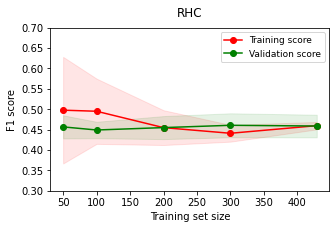

In [356]:
plt.figure(figsize=(5,3))
plt.fill_between(train_sizes_rhc1, train_scores_mean_nn1_rhc - train_scores_std_nn1_rhc , train_scores_mean_nn1_rhc + train_scores_std_nn1_rhc , alpha=0.1, color="r")
plt.fill_between(train_sizes_rhc1, validation_scores_mean_nn1_rhc - validation_scores_std_nn1_rhc , validation_scores_mean_nn1_rhc+ validation_scores_std_nn1_rhc , alpha=0.1, color="g")
plt.plot(train_sizes_rhc1, train_scores_mean_nn1_rhc, 'o-', color="r", label="Training score")
plt.plot(train_sizes_rhc1, validation_scores_mean_nn1_rhc, 'o-', color="g", label="Validation score")
plt.ylabel('F1 score', fontsize = 10)
plt.xlabel('Training set size', fontsize = 10)
plt.title('RHC', fontsize = 12, y = 1.03)
plt.legend(fontsize = 9)
plt.ylim(0.3,0.7)



In [ ]:
#simulated annealing 

In [110]:
param_grid = [
    {'max_iters': [10000],  'schedule': [mlrose_hiive.GeomDecay(),mlrose_hiive.ArithDecay(),mlrose_hiive.ExpDecay()]},
    {'max_iters': [5000],  'schedule': [mlrose_hiive.GeomDecay(),mlrose_hiive.ArithDecay(),mlrose_hiive.ExpDecay()]},
    {'max_iters': [1000],  'schedule': [mlrose_hiive.GeomDecay(),mlrose_hiive.ArithDecay(),mlrose_hiive.ExpDecay()]}
]
param_keys = ['max_iters', 'max_attempts', 'schedule']
GSMetrics.clear()
nn_model_sa = MyNeuralNetwork(activation='relu', algorithm='simulated_annealing', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001
                    )
grid = GridSearchCV(estimator=nn_model_sa, param_grid=param_grid, 
                    cv=5, verbose=10, scoring='f1' )
grid.fit(X_train, y_train)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....... max_iters=10000, schedule=1.0, score=0.440, total=  19.6s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   19.6s remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.423, total=  19.7s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   39.3s remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.471, total=  19.6s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   58.9s remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.407, total=  19.7s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.3min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.462, total=  19.7s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.6min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.440, total=  20.1s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.0min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.423, total=  19.6s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  2.3min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.471, total=  19.8s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  2.6min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.377, total=  19.7s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  3.0min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.431, total=  19.5s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ....... max_iters=10000, schedule=1.0, score=0.440, total=  19.6s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ....... max_iters=10000, schedule=1.0, score=0.423, total=  19.1s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ....... max_iters=10000, schedule=1.0, score=0.471, total=  19.5s
[CV] max_iters=10000, schedule=1.0 ..............................

[CV] ........ max_iters=1000, schedule=1.0, score=0.377, total=   1.9s
[CV] max_iters=1000, schedule=1.0 ....................................
{'max_iters': 1000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ........ max_iters=1000, schedule=1.0, score=0.431, total=   1.8s
[CV] max_iters=1000, schedule=1.0 ....................................
{'max_iters': 1000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ........ max_iters=1000, schedule=1.0, score=0.471, total=   1.9s
[CV] max_iters=1000, schedule=1.0 ....................................
{'max_iters': 1000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ........ max_iters=1000, schedule=1.0, score=0.423, total=   1.9s
[CV] max_iters=1000, schedule=1.0 ...................................

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:  7.8min finished


GridSearchCV(cv=5,
             estimator=MyNeuralNetwork(algorithm='simulated_annealing',
                                       curve=True, early_stopping=True,
                                       hidden_nodes=[10], learning_rate=0.001,
                                       random_state=42),
             param_grid=[{'max_iters': [10000],
                          'schedule': [GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001),
                                       ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001),
                                       ExpDecay(init_temp=1.0, exp_const=0.005...
                          'schedule': [GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001),
                                       ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001),
                                       ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)]},
                         {'max_iters': [1000],
                          'schedule': [GeomDeca

In [111]:
grid.best_params_, grid.best_score_

({'max_iters': 10000,
  'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)},
 0.44052220546338194)

In [112]:
list(GSMetrics)

["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}",
 "{'max_iters': 10000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}",
 "{'max_iters': 5000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 5000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}",
 "{'max_iters': 5000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}",
 "{'max_iters': 1000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 1000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}",
 "{'max_iters': 1000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_t

In [119]:
GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]

{'time': 20.070666074752808,
 'train_loss': array([[5.47564359e-01, 3.00000000e+00],
        [5.47572623e-01, 5.00000000e+00],
        [5.47637593e-01, 7.00000000e+00],
        ...,
        [5.46164103e-01, 1.99070000e+04],
        [5.46206280e-01, 1.99090000e+04],
        [5.46197321e-01, 1.99110000e+04]])}

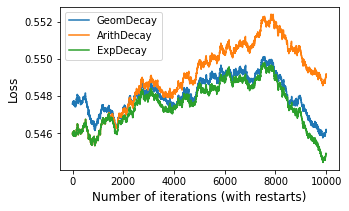

In [129]:
plt.figure(figsize=(5,3))
plt.plot(GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='GeomDecay')
plt.plot(GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='ArithDecay')
plt.plot(GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='ExpDecay')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 4')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 5')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 6')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 7')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 8')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 9')
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations (with restarts)',fontsize=12)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.legend(loc='best')

{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


Text(0.5, 0, 'Number of iterations')

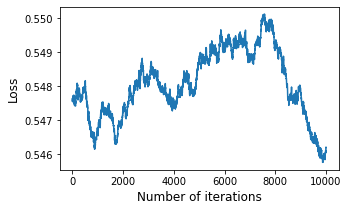

In [133]:
nn_model_sa_best = MyNeuralNetwork(activation='relu', algorithm='simulated_annealing', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001, max_iters=10000,
                                   schedule= mlrose_hiive.GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001),
                                  max_attempts=10)
nn_model_sa_best.fit(X_train, y_train)
plt.figure(figsize=(5,3))
plt.plot(nn_model_sa_best.fitness_curve[:,0])
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)

In [137]:
start = time.time()
nn_model_sa_best.fit(X_train,y_train)
end = time.time()
print('fit time: {:.6f}s'.format(end - start))

{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
fit time: 20.995216s


In [135]:
start = time.time()
y_pred_nn=nn_model_sa_best.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000444s


In [136]:
f1_scorer(nn_model_sa_best, X_test,y_test)

0.36363636363636365

In [ ]:
# checking again hyperparameters because loss showed an increase for higher number of iterations

In [139]:
param_grid = [
    {'max_iters': [10000],  'schedule': [mlrose_hiive.GeomDecay(init_temp=1.0),mlrose_hiive.GeomDecay(init_temp=0.1),mlrose_hiive.GeomDecay(init_temp=0.01)]}
   
]
param_keys = ['max_iters', 'max_attempts', 'schedule']
GSMetrics.clear()
nn_model_sa = MyNeuralNetwork(activation='relu', algorithm='simulated_annealing', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001
                    )
grid = GridSearchCV(estimator=nn_model_sa, param_grid=param_grid, 
                    cv=5, verbose=10, scoring='f1' )
grid.fit(X_train, y_train)


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....... max_iters=10000, schedule=1.0, score=0.440, total=  20.3s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.3s remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.423, total=  20.2s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   40.5s remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.471, total=  20.1s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.0min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.407, total=  20.1s
[CV] max_iters=10000, schedule=1.0 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.3min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=1.0, score=0.462, total=  20.3s
[CV] max_iters=10000, schedule=0.1 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.7min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=0.1, score=0.440, total=  20.1s
[CV] max_iters=10000, schedule=0.1 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.0min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=0.1, score=0.423, total=  20.1s
[CV] max_iters=10000, schedule=0.1 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  2.4min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=0.1, score=0.471, total=  19.7s
[CV] max_iters=10000, schedule=0.1 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  2.7min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=0.1, score=0.407, total=  20.2s
[CV] max_iters=10000, schedule=0.1 ...................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  3.0min remaining:    0.0s


[CV] ....... max_iters=10000, schedule=0.1, score=0.462, total=  20.5s
[CV] max_iters=10000, schedule=0.01 ..................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ...... max_iters=10000, schedule=0.01, score=0.440, total=  20.5s
[CV] max_iters=10000, schedule=0.01 ..................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ...... max_iters=10000, schedule=0.01, score=0.423, total=  20.1s
[CV] max_iters=10000, schedule=0.01 ..................................
{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ...... max_iters=10000, schedule=0.01, score=0.471, total=  20.8s
[CV] max_iters=10000, schedule=0.01 ..................................
{'m

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  5.1min finished


GridSearchCV(cv=5,
             estimator=MyNeuralNetwork(algorithm='simulated_annealing',
                                       curve=True, early_stopping=True,
                                       hidden_nodes=[10], learning_rate=0.001,
                                       random_state=42),
             param_grid=[{'max_iters': [10000],
                          'schedule': [GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001),
                                       GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001),
                                       GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)]}],
             scoring='f1', verbose=10)

In [140]:
grid.best_params_, grid.best_score_

({'max_iters': 10000,
  'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)},
 0.44052220546338194)

In [141]:
list(GSMetrics)

["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}"]

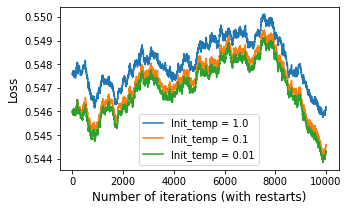

In [144]:
plt.figure(figsize=(5,3))
plt.plot(GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Init_temp = 1.0')
plt.plot(GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Init_temp = 0.1')
plt.plot(GSMetrics["{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Init_temp = 0.01')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 4')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 5')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 6')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 7')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 8')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 9')
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations (with restarts)',fontsize=12)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.legend(loc='best')

{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


Text(0.5, 0, 'Number of iterations')

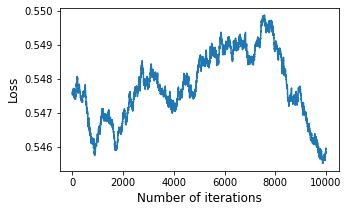

In [145]:
nn_model_sa_best2 = MyNeuralNetwork(activation='relu', algorithm='simulated_annealing', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001, max_iters=10000,
                                   schedule= mlrose_hiive.GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001),
                                  max_attempts=10)
nn_model_sa_best2.fit(X_train, y_train)
plt.figure(figsize=(5,3))
plt.plot(nn_model_sa_best2.fitness_curve[:,0])
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)

In [146]:
start = time.time()
nn_model_sa_best2.fit(X_train,y_train)
end = time.time()
print('fit time: {:.6f}s'.format(end - start))

{'max_iters': 10000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
fit time: 21.301133s


In [147]:
start = time.time()
y_pred_nn=nn_model_sa_best2.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000403s


In [148]:
f1_scorer(nn_model_sa_best2, X_test,y_test)

0.36363636363636365

In [ ]:
# checking again hyperparameters because loss showed an increase for higher number of iterations

In [149]:
param_grid = [
    {'max_iters': [20000],  'schedule': [mlrose_hiive.GeomDecay(init_temp=1.0),mlrose_hiive.GeomDecay(init_temp=0.1),mlrose_hiive.GeomDecay(init_temp=0.01)]}
   
]
param_keys = ['max_iters', 'max_attempts', 'schedule']
GSMetrics.clear()
nn_model_sa2 = MyNeuralNetwork(activation='relu', algorithm='simulated_annealing', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001
                    )
grid2 = GridSearchCV(estimator=nn_model_sa2, param_grid=param_grid, 
                    cv=5, verbose=10, scoring='f1' )
grid2.fit(X_train, y_train)


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] max_iters=20000, schedule=1.0 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....... max_iters=20000, schedule=1.0, score=0.471, total=  40.5s
[CV] max_iters=20000, schedule=1.0 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   40.5s remaining:    0.0s


[CV] ....... max_iters=20000, schedule=1.0, score=0.423, total=  39.7s
[CV] max_iters=20000, schedule=1.0 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.3min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=1.0, score=0.471, total=  39.8s
[CV] max_iters=20000, schedule=1.0 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  2.0min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=1.0, score=0.400, total=  40.2s
[CV] max_iters=20000, schedule=1.0 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  2.7min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=1.0, score=0.453, total=  40.8s
[CV] max_iters=20000, schedule=0.1 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  3.4min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=0.1, score=0.471, total=  41.2s
[CV] max_iters=20000, schedule=0.1 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  4.0min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=0.1, score=0.423, total=  40.8s
[CV] max_iters=20000, schedule=0.1 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  4.7min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=0.1, score=0.471, total=  40.4s
[CV] max_iters=20000, schedule=0.1 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  5.4min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=0.1, score=0.429, total=  40.8s
[CV] max_iters=20000, schedule=0.1 ...................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  6.1min remaining:    0.0s


[CV] ....... max_iters=20000, schedule=0.1, score=0.453, total=  39.8s
[CV] max_iters=20000, schedule=0.01 ..................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ...... max_iters=20000, schedule=0.01, score=0.471, total=  40.8s
[CV] max_iters=20000, schedule=0.01 ..................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ...... max_iters=20000, schedule=0.01, score=0.423, total=  40.8s
[CV] max_iters=20000, schedule=0.01 ..................................
{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
[CV] ...... max_iters=20000, schedule=0.01, score=0.471, total=  40.8s
[CV] max_iters=20000, schedule=0.01 ..................................
{'m

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed: 10.1min finished


GridSearchCV(cv=5,
             estimator=MyNeuralNetwork(algorithm='simulated_annealing',
                                       curve=True, early_stopping=True,
                                       hidden_nodes=[10], learning_rate=0.001,
                                       random_state=42),
             param_grid=[{'max_iters': [20000],
                          'schedule': [GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001),
                                       GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001),
                                       GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)]}],
             scoring='f1', verbose=10)

In [150]:
grid2.best_params_, grid.best_score_

({'max_iters': 20000,
  'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)},
 0.44052220546338194)

In [151]:
list(GSMetrics)

["{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}",
 "{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}"]

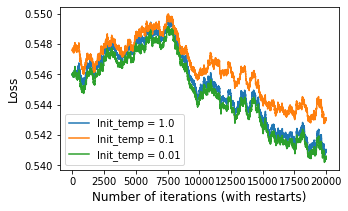

In [152]:
plt.figure(figsize=(5,3))
plt.plot(GSMetrics["{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Init_temp = 1.0')
plt.plot(GSMetrics["{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.1, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Init_temp = 0.1')
plt.plot(GSMetrics["{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Init_temp = 0.01')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 4')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 5')
#plt.plot(GSMetrics["{'max_iters': 5000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 6')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=1.0, decay=0.99, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 7')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': ArithDecay(init_temp=1.0, decay=0.0001, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 8')
#plt.plot(GSMetrics["{'max_iters': 1000, 'max_attempts': 10, 'schedule': ExpDecay(init_temp=1.0, exp_const=0.005, min_temp=0.001)}"]['train_loss'][:,0], label='Setting 9')
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.legend(loc='best')

{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>


Text(0.5, 0, 'Number of iterations')

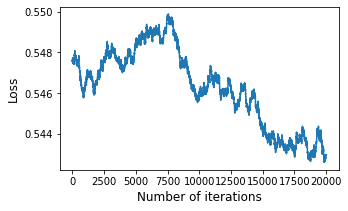

In [153]:
nn_model_sa_best3 = MyNeuralNetwork(activation='relu', algorithm='simulated_annealing', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1e+10, random_state=42,
                            hidden_nodes=[10], learning_rate=0.001, max_iters=20000,
                                   schedule= mlrose_hiive.GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001),
                                  max_attempts=10)
nn_model_sa_best3.fit(X_train, y_train)
plt.figure(figsize=(5,3))
plt.plot(nn_model_sa_best3.fitness_curve[:,0])
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)

In [338]:
nn_model_sa_best3.loss

0.542938807205345

In [339]:
nn_model_sa_best3.fitness_curve

array([[5.47564359e-01, 3.00000000e+00],
       [5.47572623e-01, 5.00000000e+00],
       [5.47637593e-01, 7.00000000e+00],
       ...,
       [5.42941981e-01, 3.98060000e+04],
       [5.42941603e-01, 3.98080000e+04],
       [5.42938807e-01, 3.98100000e+04]])

In [154]:
start = time.time()
nn_model_sa_best3.fit(X_train,y_train)
end = time.time()
print('fit time: {:.6f}s'.format(end - start))

{'max_iters': 20000, 'max_attempts': 10, 'schedule': GeomDecay(init_temp=0.01, decay=0.99, min_temp=0.001)}
<class '__main__.MyNeuralNetwork'>
fit time: 41.999861s


In [155]:
start = time.time()
y_pred_nn=nn_model_sa_best3.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000565s


In [156]:
f1_scorer(nn_model_sa_best3, X_test,y_test)

0.39285714285714285

In [344]:
train_sizes_sa1, training_scores_nn_sa1, validation_scores_nn_sa1,fit_times_sa1, _ = learning_curve(nn_model_sa_best3, X_train, y_train, shuffle=True, train_sizes=train_sizes, cv=5, scoring = 'f1',return_times=True, random_state=8)

{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 20000, 'mutation_prob': 0.1, 'pop_si

In [348]:
train_scores_mean_nn1_sa = np.mean(training_scores_nn_sa1,axis = 1)
validation_scores_mean_nn1_sa = np.mean(validation_scores_nn_sa1, axis = 1 )
train_scores_std_nn1_sa = np.std(training_scores_nn_sa1,axis = 1)
validation_scores_std_nn1_sa = np.std(validation_scores_nn_sa1, axis = 1 )

print('Mean training scores\n\n', pd.Series(train_scores_mean_nn1_sa, index = train_sizes_sa1))
print('\n', '-' * 20) # separator
print('Mean validation scores\n\n',pd.Series(validation_scores_mean_nn1_sa, index = train_sizes_sa1))
print('\n', '-' * 20) # separator

print('Std training scores\n\n', pd.Series(train_scores_std_nn1_sa, index = train_sizes_sa1))
print('\n', '-' * 20) # separator
print('Std validation scores\n\n',pd.Series(validation_scores_std_nn1_sa, index = train_sizes_sa1))

Mean training scores

 50     0.459950
100    0.469682
200    0.437537
300    0.419613
429    0.445935
dtype: float64

 --------------------
Mean validation scores

 50     0.437299
100    0.449131
200    0.433008
300    0.442945
429    0.449131
dtype: float64

 --------------------
Std training scores

 50     0.129501
100    0.071808
200    0.036471
300    0.020538
429    0.012487
dtype: float64

 --------------------
Std validation scores

 50     0.024291
100    0.020179
200    0.023030
300    0.016133
429    0.020179
dtype: float64


(0.3, 0.7)

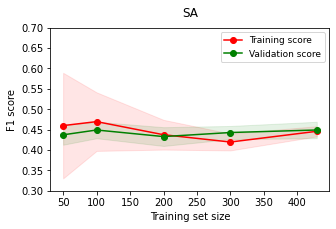

In [352]:
plt.figure(figsize=(5,3))
plt.fill_between(train_sizes_sa1, train_scores_mean_nn1_sa - train_scores_std_nn1_sa , train_scores_mean_nn1_sa + train_scores_std_nn1_sa , alpha=0.1, color="r")
plt.fill_between(train_sizes_sa1, validation_scores_mean_nn1_sa - validation_scores_std_nn1_sa , validation_scores_mean_nn1_sa+ validation_scores_std_nn1_sa , alpha=0.1, color="g")
plt.plot(train_sizes_sa1, train_scores_mean_nn1_sa, 'o-', color="r", label="Training score")
plt.plot(train_sizes_sa1, validation_scores_mean_nn1_sa, 'o-', color="g", label="Validation score")
plt.ylabel('F1 score', fontsize = 10)
plt.xlabel('Training set size', fontsize = 10)
plt.title('SA', fontsize = 12, y = 1.03)
plt.legend(fontsize = 9)
plt.ylim(0.3,0.7)



In [ ]:
#genetic algorithm

In [ ]:
# hyperparameter tuning for genetic algorithm

In [326]:
param_grid = [
    #{'max_iters': [100], 'mutation_prob': [0.1,0.2,0.4], 'pop_size': [200,1000]},
    {'max_iters': [1000], 'mutation_prob': [0.1,0.2,0.4], 'pop_size': [200,1000]},
]
param_keys = ['max_iters', 'mutation_prob', 'pop_size']
GSMetrics.clear()
nn_model_ga = MyNeuralNetwork(activation='relu', algorithm='genetic_alg', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1, random_state=42,
                           learning_rate=0.001, hidden_nodes=[10])
grid5 = GridSearchCV(estimator=nn_model_ga, param_grid=param_grid, 
                    cv=5, verbose=10, scoring='f1' )
grid5.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] max_iters=1000, mutation_prob=0.1, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=200, score=0.675, total=   5.6s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.6s remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=200, score=0.556, total=   2.7s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    8.3s remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=200, score=0.667, total=   5.9s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.1s remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=200, score=0.475, total=   6.6s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   20.8s remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=200, score=0.588, total=   7.4s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=1000 ................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   28.2s remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=1000, score=0.667, total=  41.1s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=1000 ................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  1.2min remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=1000, score=0.693, total=  46.6s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=1000 ................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  1.9min remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=1000, score=0.688, total=  24.0s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=1000 ................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  2.3min remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=1000, score=0.562, total=  28.0s
[CV] max_iters=1000, mutation_prob=0.1, pop_size=1000 ................
{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}
<class '__main__.MyNeuralNetwork'>


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  2.8min remaining:    0.0s


[CV]  max_iters=1000, mutation_prob=0.1, pop_size=1000, score=0.597, total=  21.8s
[CV] max_iters=1000, mutation_prob=0.2, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
[CV]  max_iters=1000, mutation_prob=0.2, pop_size=200, score=0.597, total=   3.4s
[CV] max_iters=1000, mutation_prob=0.2, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
[CV]  max_iters=1000, mutation_prob=0.2, pop_size=200, score=0.701, total=   5.9s
[CV] max_iters=1000, mutation_prob=0.2, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
[CV]  max_iters=1000, mutation_prob=0.2, pop_size=200, score=0.636, total=   3.6s
[CV] max_iters=1000, mutation_prob=0.2, pop_size=200 .................
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
[CV]  max_i

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  8.2min finished


GridSearchCV(cv=5,
             estimator=MyNeuralNetwork(algorithm='genetic_alg', clip_max=1,
                                       curve=True, early_stopping=True,
                                       hidden_nodes=[10], learning_rate=0.001,
                                       random_state=42),
             param_grid=[{'max_iters': [1000], 'mutation_prob': [0.1, 0.2, 0.4],
                          'pop_size': [200, 1000]}],
             scoring='f1', verbose=10)

In [327]:
grid5.best_params_, grid.best_score_

({'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000},
 0.4606737324828335)

In [328]:
list(GSMetrics)

["{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}",
 "{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}",
 "{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}",
 "{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 1000}",
 "{'max_iters': 1000, 'mutation_prob': 0.4, 'pop_size': 200}",
 "{'max_iters': 1000, 'mutation_prob': 0.4, 'pop_size': 1000}"]

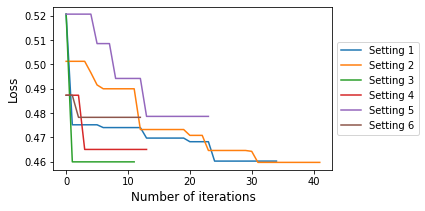

In [329]:
plt.figure(figsize=(5,3))
#plt.plot(GSMetrics["{'max_iters': 100, 'mutation_prob': 0.1, 'pop_size': 200}"]['train_loss'][:,0], label='Setting 1')
#plt.plot(GSMetrics["{'max_iters': 100, 'mutation_prob': 0.1, 'pop_size': 1000}"]['train_loss'][:,0], label='Setting 2')
#plt.plot(GSMetrics["{'max_iters': 100, 'mutation_prob': 0.2, 'pop_size': 200}"]['train_loss'][:,0], label='Setting 3')
#plt.plot(GSMetrics["{'max_iters': 100, 'mutation_prob': 0.2, 'pop_size': 1000}"]['train_loss'][:,0], label='Setting 4')
#plt.plot(GSMetrics["{'max_iters': 100, 'mutation_prob': 0.4, 'pop_size': 200}"]['train_loss'][:,0], label='Setting 5')
#plt.plot(GSMetrics["{'max_iters': 100, 'mutation_prob': 0.4, 'pop_size': 1000}"]['train_loss'][:,0], label='Setting 6')
plt.plot(GSMetrics["{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 200}"]['train_loss'][:,0], label='Setting 1')
plt.plot(GSMetrics["{'max_iters': 1000, 'mutation_prob': 0.1, 'pop_size': 1000}"]['train_loss'][:,0], label='Setting 2')
plt.plot(GSMetrics["{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}"]['train_loss'][:,0], label='Setting 3')
plt.plot(GSMetrics["{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 1000}"]['train_loss'][:,0], label='Setting 4')
plt.plot(GSMetrics["{'max_iters': 1000, 'mutation_prob': 0.4, 'pop_size': 200}"]['train_loss'][:,0], label='Setting 5')
plt.plot(GSMetrics["{'max_iters': 1000, 'mutation_prob': 0.4, 'pop_size': 1000}"]['train_loss'][:,0], label='Setting 6')

plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#plt.legend(loc='best')

{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
0.5015677319862423


Text(0.5, 0, 'Number of iterations')

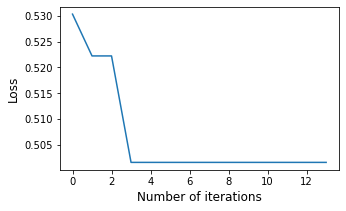

In [335]:
nn_model_ga_best4 = MyNeuralNetwork(activation='relu', algorithm='genetic_alg', curve=True,
                           bias=True, is_classifier=True, early_stopping=True,
                           clip_max=1, random_state=42,
                           learning_rate=0.001, hidden_nodes=[10], max_iters=1000,
                                   mutation_prob= 0.2, pop_size= 200)
nn_model_ga_best4.fit(X_train, y_train)
print(nn_model_ga_best4.loss)
plt.figure(figsize=(5,3))
plt.plot(nn_model_ga_best4.fitness_curve[:,0])
plt.ylabel('Loss',fontsize=12)
plt.xlabel('Number of iterations',fontsize=12)

In [332]:
start = time.time()
nn_model_ga_best4.fit(X_train,y_train)
end = time.time()
print('fit time: {:.6f}s'.format(end - start))

{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
fit time: 3.353809s


In [333]:
start = time.time()
y_pred_nn=nn_model_ga_best4.predict(X_test)
end = time.time()
print('predict time: {:.6f}s'.format(end - start))

predict time: 0.000430s


In [334]:
f1_scorer(nn_model_ga_best4, X_test,y_test)

0.5806451612903226

In [323]:
nn_model_ga_best4.fitness_curve

array([[8.42571414e+00, 2.00300000e+03],
       [7.84690110e+00, 3.00500000e+03],
       [7.84690110e+00, 4.00600000e+03],
       [7.84690110e+00, 5.00700000e+03],
       [7.84690110e+00, 6.00800000e+03],
       [7.78254139e+00, 7.01000000e+03],
       [7.78254139e+00, 8.01100000e+03],
       [7.33230483e+00, 9.01300000e+03],
       [7.33230483e+00, 1.00140000e+04],
       [7.33230483e+00, 1.10150000e+04],
       [7.33230483e+00, 1.20160000e+04],
       [7.33230483e+00, 1.30170000e+04],
       [7.33230483e+00, 1.40180000e+04],
       [7.33230483e+00, 1.50190000e+04],
       [7.20366135e+00, 1.60210000e+04],
       [7.20366135e+00, 1.70220000e+04],
       [7.20366135e+00, 1.80230000e+04],
       [7.20366135e+00, 1.90240000e+04],
       [7.07500595e+00, 2.00260000e+04],
       [7.07500595e+00, 2.10270000e+04],
       [7.07500595e+00, 2.20280000e+04],
       [7.07500595e+00, 2.30290000e+04],
       [7.07500595e+00, 2.40300000e+04],
       [7.07500595e+00, 2.50310000e+04],
       [7.075005

In [340]:
nn_model_ga_best4.loss

0.5015677319862423

In [341]:
train_sizes_ga1, training_scores_nn_ga1, validation_scores_nn_ga1,fit_times_ga1, _ = learning_curve(nn_model_ga_best4, X_train, y_train, shuffle=True, train_sizes=train_sizes, cv=5, scoring = 'f1',return_times=True, random_state=8)

{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<class '__main__.MyNeuralNetwork'>
{'max_iters': 1000, 'mutation_prob': 0.2, 'pop_size': 200}
<

In [342]:
train_scores_mean_nn1 = np.mean(training_scores_nn_ga1,axis = 1)
validation_scores_mean_nn1 = np.mean(validation_scores_nn_ga1, axis = 1 )
train_scores_std_nn1 = np.std(training_scores_nn_ga1,axis = 1)
validation_scores_std_nn1 = np.std(validation_scores_nn_ga1, axis = 1 )

print('Mean training scores\n\n', pd.Series(train_scores_mean_nn1, index = train_sizes_ga1))
print('\n', '-' * 20) # separator
print('Mean validation scores\n\n',pd.Series(validation_scores_mean_nn1, index = train_sizes_ga1))
print('\n', '-' * 20) # separator

print('Std training scores\n\n', pd.Series(train_scores_std_nn1, index = train_sizes_ga1))
print('\n', '-' * 20) # separator
print('Std validation scores\n\n',pd.Series(validation_scores_std_nn1, index = train_sizes_ga1))

Mean training scores

 50     0.693873
100    0.645542
200    0.651486
300    0.634324
429    0.643752
dtype: float64

 --------------------
Mean validation scores

 50     0.562828
100    0.593061
200    0.600581
300    0.624815
429    0.646260
dtype: float64

 --------------------
Std training scores

 50     0.087978
100    0.145068
200    0.039205
300    0.055759
429    0.050336
dtype: float64

 --------------------
Std validation scores

 50     0.102910
100    0.079575
200    0.092804
300    0.055434
429    0.037523
dtype: float64


(0.3, 0.9)

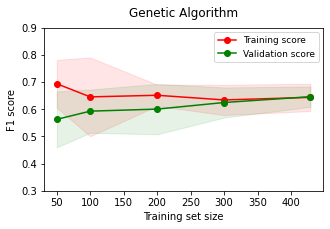

In [343]:
plt.figure(figsize=(5,3))
plt.fill_between(train_sizes_ga1, train_scores_mean_nn1 - train_scores_std_nn1 , train_scores_mean_nn1 + train_scores_std_nn1 , alpha=0.1, color="r")
plt.fill_between(train_sizes_ga1, validation_scores_mean_nn1 - validation_scores_std_nn1 , validation_scores_mean_nn1+ validation_scores_std_nn1 , alpha=0.1, color="g")
plt.plot(train_sizes_ga1, train_scores_mean_nn1, 'o-', color="r", label="Training score")
plt.plot(train_sizes_ga1, validation_scores_mean_nn1, 'o-', color="g", label="Validation score")
plt.ylabel('F1 score', fontsize = 10)
plt.xlabel('Training set size', fontsize = 10)
plt.title('Genetic Algorithm', fontsize = 12, y = 1.03)
plt.legend(fontsize = 9)
plt.ylim(0.3,0.9)



(0.3, 0.9)

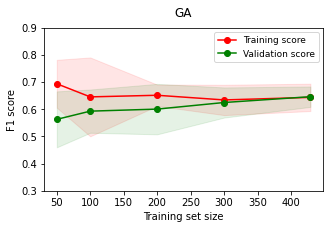

In [357]:
plt.figure(figsize=(5,3))
plt.fill_between(train_sizes_ga1, train_scores_mean_nn1 - train_scores_std_nn1 , train_scores_mean_nn1 + train_scores_std_nn1 , alpha=0.1, color="r")
plt.fill_between(train_sizes_ga1, validation_scores_mean_nn1 - validation_scores_std_nn1 , validation_scores_mean_nn1+ validation_scores_std_nn1 , alpha=0.1, color="g")
plt.plot(train_sizes_ga1, train_scores_mean_nn1, 'o-', color="r", label="Training score")
plt.plot(train_sizes_ga1, validation_scores_mean_nn1, 'o-', color="g", label="Validation score")
plt.ylabel('F1 score', fontsize = 10)
plt.xlabel('Training set size', fontsize = 10)
plt.title('GA', fontsize = 12, y = 1.03)
plt.legend(fontsize = 9)
plt.ylim(0.3,0.9)
